In [1]:
##### Import all necessity functions for Machine Learning #####
import sys
import math
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as shc
import warnings
import zipfile
import cv2
import os
import random
from collections import Counter
from functools import reduce
from itertools import chain
from google.colab.patches import cv2_imshow
from keras.preprocessing import image
from sklearn.metrics._plot.confusion_matrix import confusion_matrix
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression, SelectKBest, chi2, VarianceThreshold
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.over_sampling import RandomOverSampler, SMOTE, SMOTEN, SMOTENC, SVMSMOTE, KMeansSMOTE, BorderlineSMOTE, ADASYN
from imblearn.ensemble import EasyEnsembleClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor, NearestNeighbors
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDClassifier, SGDRegressor, Perceptron
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.svm import SVC, SVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, ExtraTreeClassifier, ExtraTreeRegressor
from sklearn.ensemble import BaggingClassifier, BaggingRegressor, RandomForestClassifier, RandomForestRegressor, VotingClassifier, VotingRegressor
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor, GradientBoostingClassifier, GradientBoostingRegressor, StackingClassifier, StackingRegressor
from sklearn.metrics import classification_report, mean_absolute_error, mean_squared_error, r2_score, accuracy_score, recall_score, precision_score, f1_score, silhouette_score
from xgboost import XGBClassifier, XGBRegressor

##### Download keras #####
!pip install keras

##### Import all necessity functions for Neural Network #####
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, Conv2D, LSTM, GRU, RNN, Flatten, AvgPool2D, MaxPool2D, GlobalAveragePooling2D, BatchNormalization, Dropout, LeakyReLU, ELU, PReLU
from tensorflow.keras.activations import tanh, relu, sigmoid, softmax, swish
from tensorflow.keras.regularizers import L1, L2, L1L2
from tensorflow.keras.optimizers import SGD, Adagrad, Adadelta, RMSprop, Adam, Adamax, Nadam
from tensorflow.keras.initializers import HeNormal, HeUniform, GlorotNormal, GlorotUniform
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy, hinge, MSE, MAE, Huber
import keras.utils as image

##### Remove all warnings #####
import warnings
warnings.filterwarnings("ignore")


##### Using, NearestNeighbours, we will find the closest point of that particular input #####
from sklearn.neighbors import NearestNeighbors

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
##### To Access the Google Drive #####
def google_drive(parameter = None):
  try:
    from google.colab import drive
    drive.mount('/content/drive',force_remount=True)
  except Exception as e:
    print(e.with_traceback)
  else:
    print('\nGoogle Drive access is done.\n'.title())

##### Execute this from the current directory #####
if __name__ == "__main__":
  google_drive()

Mounted at /content/drive

Google Drive Access Is Done.



In [3]:
##### To Unzip the folder #####
def unzip_file(parameter_ = None):
  try:
    link_folder_ = '/content/drive/MyDrive/CNN Dataset/archive (32).zip'
    zip_ref = zipfile.ZipFile(link_folder_, 'r')
    zip_ref.extractall()
    zip_ref.close()
  except Exception as e:
    print(e.with_traceback)
  else:
    print('Upzip is done succesfully'.title())

##### Execute it from the current directory #####
if __name__ == "__main__":
  unzip_file()

Upzip Is Done Succesfully


In [4]:
##### Create the categories by hand ####
_CATEGORIES = []
for value in range(10, 96):
    _CATEGORIES.append("0"+str(value))

##### Print this to see whether error occurs or not #####
print(_CATEGORIES, end = " ")

['010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089', '090', '091', '092', '093', '094', '095'] 

In [5]:
##### Directory of the image #####
_DIRECTORY = "/content/images_128_128"
##### For further use, create a list there all the image path would be stored #####
IMAGE_PATH = []

##### Join the Folder of the images #####
for categories in _CATEGORIES:
  ##### Make the folder path #####
  folder_path = os.path.join(_DIRECTORY, categories)
  ##### Make sure all the images along with folder path appeared #####
  for images in os.listdir(folder_path):
    ##### Extract the each images to the list #####
    image_path = os.path.join(folder_path, images)
    ##### appending the image path into the list for further use #####
    IMAGE_PATH.append(image_path)
##### Show the categories that are extracted successfully #####
  print('{} is done.\n'.format(categories))

010 is done.

011 is done.

012 is done.

013 is done.

014 is done.

015 is done.

016 is done.

017 is done.

018 is done.

019 is done.

020 is done.

021 is done.

022 is done.

023 is done.

024 is done.

025 is done.

026 is done.

027 is done.

028 is done.

029 is done.

030 is done.

031 is done.

032 is done.

033 is done.

034 is done.

035 is done.

036 is done.

037 is done.

038 is done.

039 is done.

040 is done.

041 is done.

042 is done.

043 is done.

044 is done.

045 is done.

046 is done.

047 is done.

048 is done.

049 is done.

050 is done.

051 is done.

052 is done.

053 is done.

054 is done.

055 is done.

056 is done.

057 is done.

058 is done.

059 is done.

060 is done.

061 is done.

062 is done.

063 is done.

064 is done.

065 is done.

066 is done.

067 is done.

068 is done.

069 is done.

070 is done.

071 is done.

072 is done.

073 is done.

074 is done.

075 is done.

076 is done.

077 is done.

078 is done.

079 is done.

080 is done.

081 is

In [16]:
##### Print the total number of Images of this dataset #####
print('The total images in this dataset is {}'.format(len(IMAGE_PATH)))

The total images in this dataset is 105100


In [24]:
##### Use only 40K dataset for training #####
"""
The problem is that, we run with 105100 dataset but it crashes most of the time.
"""
def activate(activated = True, IMAGE_PATH = None):
  if activated == True:
    ##### Shuffle the dataset #####
    random.shuffle(IMAGE_PATH)
    ##### Take only 40k image daytaset to train #####
    IMAGE_PATH = IMAGE_PATH[0:40000]
    ##### return the dataset #####
    return IMAGE_PATH

  else:
    raise Exception('Activation is not possible'.capitalize())

##### call the function #####
if __name__ =="__main__":
  try:
    IMAGE_PATH = activate(True, IMAGE_PATH)
  except Exception as e:
    print(e)
  else:
    print('Done with successfully.'.capitalize())
    print('The number of dataset is {}'.format(len(IMAGE_PATH)))

Done with successfully.
The number of dataset is 40000


ResNet50 - Transfer Learning is extracted 

In [25]:
##### Call the ResNet50 architecture #####
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

##### Define a ResNet50 function #####
def restnet50(call = None):
  if call == True:
    ##### Create an object of ResNet50 #####
    ResNet_ = ResNet50(include_top = False, \
                      weights = 'imagenet', \
                       input_shape = (128, 128, 3))

    ##### Freeze the trainable parameter #####
    ResNet_.trainable = False
    ##### Show the model summary #####
    ResNet_.summary()
    ##### Return the object of ResNet50 #####
    return ResNet_

##### Execute it from the current directory #####
if __name__ == "__main__":
  ResNet_ = restnet50(True)

94765736/94765736 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 134, 134, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 64, 64, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalizat

In [26]:
##### Create the sequential model #####
model = Sequential()
##### ResNet50 object should be added into the sequential model ####
model.add(ResNet_)
##### Use the Global Pooling Layer as if translation invariance problem prevented - Higher order features is extracted #####
model.add(GlobalAveragePooling2D())

##### Show the model summary #####
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
Total params: 23,587,712
Trainable params: 0
Non-trainable params: 23,587,712
_________________________________________________________________


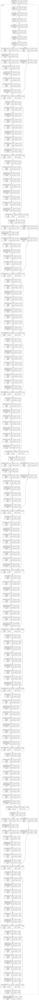

In [123]:
##### plot the model #####
from tensorflow.keras.utils import plot_model
plot_model( model,\
            show_shapes = True,\
            show_dtype = True,\
            show_layer_names = True,\
            expand_nested = True,\
            show_layer_activations = True)

In [27]:
##### Import some necessary functions for loading the images #####
from tensorflow.keras.preprocessing import image
from numpy.linalg import norm

##### Define the function there all the images pass ONE by ONE and extract the features using ResNet50 architecture #####
def Extract_Feature(image_path, model):
  from tensorflow.keras.preprocessing import image
  ##### Target size should be equal to the initial defined architecture of ResNet50 #####
  Image_ = image.load_img(image_path, target_size = (128, 128))
  ##### Convert Image to the NumPy array for training purpose #####
  Image_ = image.img_to_array(Image_)
  ##### Though, we are passing so, the dimension should be changed like (1, 128, 128, 3) #####
  Image_ = np.expand_dims(Image_, axis = 0)
  ##### processes_input is responsible to change the input in an appropriate way with regards to ResNet50 architecture needs #####
  Image_ = preprocess_input(Image_)
  ##### predict model will return the higher dimension, so flatten use to Convert to 1D array #####
  result = model.predict(Image_).flatten()
  
  ##### Prior to returning, should be normalized the distribution of the data points #####
  return (result/norm(result))


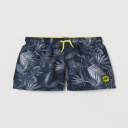

In [28]:
##### Check whether the function is working or not perfectly #####
from tensorflow.keras.preprocessing import image
image.load_img(IMAGE_PATH[100], target_size = (128, 128))

In [29]:
##### Extract features for all the images #####
from tensorflow.keras.preprocessing import image
from tqdm import tqdm
extracted_features = []
##### tqdm is used to process the performance parallel #####
for image in tqdm(IMAGE_PATH):
  ##### Appending the features into the list #####
  extracted_features.append(Extract_Feature(image, model))

  0%|          | 0/40000 [00:00<?, ?it/s]

1/1 [==============================] - 8s 8s/step


  0%|          | 1/40000 [00:08<92:57:53,  8.37s/it]

1/1 [==============================] - 0s 20ms/step


  0%|          | 3/40000 [00:08<24:31:31,  2.21s/it]

1/1 [==============================] - 0s 19ms/step


  0%|          | 6/40000 [00:08<9:48:33,  1.13it/s] 

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/40000 [00:08<6:23:57,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 10/40000 [00:08<4:23:10,  2.53it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 12/40000 [00:08<3:07:26,  3.56it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 15/40000 [00:09<2:03:13,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 17/40000 [00:09<1:38:21,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 19/40000 [00:09<1:19:47,  8.35it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 21/40000 [00:09<1:06:15, 10.06it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 23/40000 [00:09<57:19, 11.62it/s]  

1/1 [==============================] - 0s 20ms/step


  0%|          | 26/40000 [00:09<48:11, 13.83it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 29/40000 [00:09<42:31, 15.66it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 32/40000 [00:09<39:10, 17.01it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 35/40000 [00:10<37:08, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 38/40000 [00:10<36:02, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 41/40000 [00:10<34:49, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 44/40000 [00:10<34:02, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 47/40000 [00:10<33:48, 19.70it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 50/40000 [00:10<33:32, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 53/40000 [00:10<33:08, 20.09it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 56/40000 [00:11<32:53, 20.24it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 59/40000 [00:11<33:03, 20.13it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 62/40000 [00:11<32:47, 20.30it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 65/40000 [00:11<33:21, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 68/40000 [00:11<33:11, 20.06it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 71/40000 [00:11<32:40, 20.37it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 74/40000 [00:11<32:29, 20.48it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 77/40000 [00:12<32:53, 20.23it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 80/40000 [00:12<33:29, 19.87it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 83/40000 [00:12<33:08, 20.08it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 86/40000 [00:12<33:03, 20.12it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 89/40000 [00:12<33:19, 19.96it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 92/40000 [00:12<33:10, 20.05it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 95/40000 [00:13<32:57, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 98/40000 [00:13<33:09, 20.06it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 101/40000 [00:13<32:54, 20.21it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 104/40000 [00:13<32:48, 20.26it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 107/40000 [00:13<33:10, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 110/40000 [00:13<33:10, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 113/40000 [00:13<32:57, 20.17it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 116/40000 [00:14<32:45, 20.29it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 119/40000 [00:14<32:56, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 122/40000 [00:14<32:54, 20.20it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 125/40000 [00:14<32:44, 20.30it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 128/40000 [00:14<32:57, 20.16it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 131/40000 [00:14<32:51, 20.22it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 134/40000 [00:14<32:42, 20.31it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 137/40000 [00:15<32:41, 20.32it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 140/40000 [00:15<33:00, 20.13it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 143/40000 [00:15<32:46, 20.27it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 146/40000 [00:15<32:38, 20.35it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 149/40000 [00:15<33:33, 19.79it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 152/40000 [00:15<32:57, 20.15it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 155/40000 [00:16<32:51, 20.21it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 158/40000 [00:16<33:25, 19.87it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 161/40000 [00:16<33:17, 19.94it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 164/40000 [00:16<33:03, 20.08it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 167/40000 [00:16<33:55, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 169/40000 [00:16<34:10, 19.43it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 171/40000 [00:16<34:01, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 174/40000 [00:16<33:20, 19.91it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 176/40000 [00:17<33:27, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 179/40000 [00:17<33:18, 19.92it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 182/40000 [00:17<33:02, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 185/40000 [00:17<32:39, 20.32it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 188/40000 [00:17<33:26, 19.84it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 190/40000 [00:17<46:29, 14.27it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 193/40000 [00:18<41:43, 15.90it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 196/40000 [00:18<38:55, 17.04it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 199/40000 [00:18<37:06, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 202/40000 [00:18<35:50, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 204/40000 [00:18<35:14, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 207/40000 [00:18<34:17, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 209/40000 [00:18<34:07, 19.44it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 211/40000 [00:18<33:59, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 214/40000 [00:19<33:43, 19.66it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 217/40000 [00:19<33:24, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 219/40000 [00:19<33:36, 19.73it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 222/40000 [00:19<33:07, 20.02it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 225/40000 [00:19<32:54, 20.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 228/40000 [00:19<33:05, 20.03it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 231/40000 [00:19<33:20, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 234/40000 [00:20<33:08, 19.99it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 237/40000 [00:20<32:55, 20.13it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 240/40000 [00:20<33:18, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 242/40000 [00:20<33:22, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 245/40000 [00:20<33:10, 19.97it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 247/40000 [00:20<33:21, 19.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 249/40000 [00:20<33:30, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 251/40000 [00:21<33:38, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 254/40000 [00:21<33:16, 19.91it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 257/40000 [00:21<33:00, 20.07it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 260/40000 [00:21<33:12, 19.95it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 263/40000 [00:21<32:52, 20.14it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 266/40000 [00:21<32:45, 20.21it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 269/40000 [00:21<32:41, 20.26it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 272/40000 [00:22<32:28, 20.39it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 275/40000 [00:22<32:48, 20.18it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 278/40000 [00:22<32:41, 20.26it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 281/40000 [00:22<33:12, 19.93it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 284/40000 [00:22<32:56, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 287/40000 [00:22<32:48, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 290/40000 [00:22<33:04, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 293/40000 [00:23<32:53, 20.12it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 296/40000 [00:23<32:47, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 299/40000 [00:23<32:55, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 302/40000 [00:23<32:46, 20.19it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 305/40000 [00:23<32:46, 20.19it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 308/40000 [00:23<32:29, 20.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 311/40000 [00:23<32:48, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 314/40000 [00:24<32:40, 20.24it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 317/40000 [00:24<32:42, 20.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 320/40000 [00:24<32:53, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 323/40000 [00:24<32:56, 20.08it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 326/40000 [00:24<32:57, 20.06it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 329/40000 [00:24<32:41, 20.22it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 332/40000 [00:25<33:04, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 335/40000 [00:25<32:54, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 338/40000 [00:25<32:54, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 341/40000 [00:25<32:53, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 344/40000 [00:25<32:38, 20.24it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 347/40000 [00:25<32:36, 20.26it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 350/40000 [00:25<32:54, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 353/40000 [00:26<32:46, 20.16it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 356/40000 [00:26<32:46, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 359/40000 [00:26<32:37, 20.25it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 362/40000 [00:26<32:47, 20.15it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 365/40000 [00:26<32:37, 20.25it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 368/40000 [00:26<32:35, 20.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 371/40000 [00:26<32:35, 20.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 374/40000 [00:27<32:44, 20.17it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 377/40000 [00:27<32:47, 20.14it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 380/40000 [00:27<33:03, 19.97it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 382/40000 [00:27<33:03, 19.97it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 385/40000 [00:27<32:56, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 388/40000 [00:27<33:04, 19.96it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 391/40000 [00:27<33:04, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 394/40000 [00:28<32:46, 20.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 397/40000 [00:28<33:11, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 400/40000 [00:28<32:52, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 403/40000 [00:28<33:05, 19.95it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 406/40000 [00:28<32:54, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 409/40000 [00:28<32:53, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 412/40000 [00:29<33:17, 19.82it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 414/40000 [00:29<33:43, 19.57it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 416/40000 [00:29<33:36, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 419/40000 [00:29<33:13, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 421/40000 [00:29<33:26, 19.73it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 424/40000 [00:29<33:15, 19.83it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 426/40000 [00:29<33:12, 19.87it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 429/40000 [00:29<32:46, 20.12it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 432/40000 [00:30<33:05, 19.93it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 435/40000 [00:30<32:57, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 437/40000 [00:30<33:03, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 440/40000 [00:30<32:56, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 442/40000 [00:30<33:20, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 444/40000 [00:30<33:21, 19.76it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 446/40000 [00:30<33:16, 19.81it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 448/40000 [00:30<33:37, 19.61it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 450/40000 [00:30<33:37, 19.60it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 452/40000 [00:31<34:02, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 454/40000 [00:31<33:44, 19.53it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 456/40000 [00:31<33:52, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 459/40000 [00:31<33:24, 19.72it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 461/40000 [00:31<33:55, 19.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 463/40000 [00:31<34:44, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 465/40000 [00:31<34:20, 19.19it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 468/40000 [00:31<33:41, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 470/40000 [00:31<33:32, 19.64it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 472/40000 [00:32<33:33, 19.63it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 474/40000 [00:32<33:22, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 476/40000 [00:32<33:25, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 479/40000 [00:32<32:51, 20.05it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 482/40000 [00:32<32:59, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 485/40000 [00:32<32:46, 20.10it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 488/40000 [00:32<32:48, 20.07it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 491/40000 [00:33<32:40, 20.15it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 494/40000 [00:33<32:56, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 497/40000 [00:33<32:49, 20.06it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 500/40000 [00:33<32:35, 20.20it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 503/40000 [00:33<32:44, 20.11it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 506/40000 [00:33<32:43, 20.12it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 509/40000 [00:33<32:33, 20.21it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 512/40000 [00:34<32:58, 19.96it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 515/40000 [00:34<32:48, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 518/40000 [00:34<33:04, 19.89it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 521/40000 [00:34<32:48, 20.05it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 524/40000 [00:34<33:22, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 526/40000 [00:34<33:20, 19.74it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 528/40000 [00:34<33:24, 19.69it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 530/40000 [00:34<33:52, 19.42it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 532/40000 [00:35<34:24, 19.12it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 534/40000 [00:35<34:34, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 536/40000 [00:35<34:20, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 538/40000 [00:35<34:06, 19.28it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 540/40000 [00:35<33:53, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 542/40000 [00:35<34:02, 19.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 544/40000 [00:35<34:41, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 546/40000 [00:35<34:23, 19.12it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 548/40000 [00:35<34:17, 19.17it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 550/40000 [00:36<34:18, 19.16it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 552/40000 [00:36<34:42, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 554/40000 [00:36<34:39, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 556/40000 [00:36<34:14, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 558/40000 [00:36<33:57, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 560/40000 [00:36<33:42, 19.50it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 563/40000 [00:36<33:35, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 565/40000 [00:36<33:24, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 568/40000 [00:36<33:02, 19.89it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 571/40000 [00:37<33:38, 19.53it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 573/40000 [00:37<34:02, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 575/40000 [00:37<34:04, 19.29it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 578/40000 [00:37<33:29, 19.62it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 580/40000 [00:37<33:20, 19.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 582/40000 [00:37<33:18, 19.73it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 584/40000 [00:37<33:47, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 587/40000 [00:37<33:21, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 590/40000 [00:38<33:05, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 592/40000 [00:38<33:10, 19.80it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 594/40000 [00:38<33:43, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 597/40000 [00:38<33:05, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 599/40000 [00:38<33:11, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 602/40000 [00:38<32:49, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 604/40000 [00:38<33:13, 19.76it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 607/40000 [00:38<32:56, 19.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 609/40000 [00:39<32:56, 19.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 611/40000 [00:39<33:13, 19.76it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 613/40000 [00:39<33:30, 19.59it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 615/40000 [00:39<33:56, 19.34it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 618/40000 [00:39<33:31, 19.58it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 621/40000 [00:39<33:03, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 624/40000 [00:39<33:09, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 627/40000 [00:39<32:50, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 629/40000 [00:40<33:03, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 632/40000 [00:40<32:48, 20.00it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 634/40000 [00:40<33:31, 19.57it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 637/40000 [00:40<33:13, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 640/40000 [00:40<32:52, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 642/40000 [00:40<33:02, 19.86it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 644/40000 [00:40<33:03, 19.84it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 646/40000 [00:40<33:33, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 649/40000 [00:41<33:10, 19.77it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 651/40000 [00:41<33:06, 19.80it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 653/40000 [00:41<34:41, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 655/40000 [00:41<34:30, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 658/40000 [00:41<33:40, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 661/40000 [00:41<33:12, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 664/40000 [00:41<32:53, 19.93it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 666/40000 [00:41<33:42, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 668/40000 [00:42<33:42, 19.44it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 670/40000 [00:42<33:37, 19.49it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 672/40000 [00:42<34:54, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 675/40000 [00:42<34:21, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 677/40000 [00:42<34:02, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 679/40000 [00:42<33:47, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 681/40000 [00:42<33:43, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 683/40000 [00:42<33:40, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 685/40000 [00:42<33:52, 19.34it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 687/40000 [00:43<34:05, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 690/40000 [00:43<33:33, 19.52it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 692/40000 [00:43<34:03, 19.24it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 695/40000 [00:43<33:46, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 698/40000 [00:43<33:06, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 700/40000 [00:43<33:06, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 702/40000 [00:43<33:12, 19.72it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 705/40000 [00:43<32:44, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 707/40000 [00:44<33:03, 19.81it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 709/40000 [00:44<33:01, 19.83it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 711/40000 [00:44<33:40, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 713/40000 [00:44<33:37, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 716/40000 [00:44<33:30, 19.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 718/40000 [00:44<33:21, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 721/40000 [00:44<32:56, 19.87it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 723/40000 [00:44<32:56, 19.87it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 726/40000 [00:44<32:56, 19.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 729/40000 [00:45<33:05, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 731/40000 [00:45<33:12, 19.71it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 733/40000 [00:45<33:05, 19.77it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 735/40000 [00:45<33:14, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 737/40000 [00:45<33:23, 19.59it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 739/40000 [00:45<34:01, 19.23it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 741/40000 [00:45<34:45, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 743/40000 [00:45<34:45, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 745/40000 [00:45<34:15, 19.09it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 747/40000 [00:46<34:16, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 749/40000 [00:46<33:58, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 751/40000 [00:46<34:06, 19.18it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 753/40000 [00:46<34:05, 19.19it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 755/40000 [00:46<33:43, 19.40it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 757/40000 [00:46<34:15, 19.09it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 759/40000 [00:46<34:22, 19.03it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 761/40000 [00:46<34:23, 19.02it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 763/40000 [00:46<34:28, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 765/40000 [00:47<34:13, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 767/40000 [00:47<34:46, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 769/40000 [00:47<34:31, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 771/40000 [00:47<34:06, 19.17it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 773/40000 [00:47<33:46, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 775/40000 [00:47<33:30, 19.51it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 777/40000 [00:47<34:15, 19.08it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 779/40000 [00:47<34:22, 19.01it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 781/40000 [00:47<34:49, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 783/40000 [00:47<35:42, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 785/40000 [00:48<35:13, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 787/40000 [00:48<35:35, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 789/40000 [00:48<34:53, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 792/40000 [00:48<33:51, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 794/40000 [00:48<33:33, 19.47it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 797/40000 [00:48<33:29, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 800/40000 [00:48<33:00, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 803/40000 [00:48<32:36, 20.03it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 805/40000 [00:49<32:46, 19.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 807/40000 [00:49<33:14, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 809/40000 [00:49<33:06, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 811/40000 [00:49<33:04, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 814/40000 [00:49<32:42, 19.97it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 817/40000 [00:49<32:30, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 820/40000 [00:49<32:54, 19.85it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 822/40000 [00:49<33:03, 19.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 825/40000 [00:50<32:48, 19.90it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 827/40000 [00:50<32:54, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 829/40000 [00:50<33:34, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 832/40000 [00:50<33:06, 19.72it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 835/40000 [00:50<32:37, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 838/40000 [00:50<32:44, 19.93it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 841/40000 [00:50<32:59, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 843/40000 [00:51<33:07, 19.70it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 845/40000 [00:51<33:02, 19.75it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 847/40000 [00:51<33:32, 19.45it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 849/40000 [00:51<34:08, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 851/40000 [00:51<34:07, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 853/40000 [00:51<33:59, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 855/40000 [00:51<34:03, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 857/40000 [00:51<34:24, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 859/40000 [00:51<34:44, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 861/40000 [00:51<34:29, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 863/40000 [00:52<34:20, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 865/40000 [00:52<33:57, 19.21it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 867/40000 [00:52<33:47, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 869/40000 [00:52<33:52, 19.25it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 871/40000 [00:52<33:36, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 873/40000 [00:52<33:36, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 876/40000 [00:52<33:13, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 878/40000 [00:52<33:27, 19.49it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 880/40000 [00:52<33:22, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 882/40000 [00:53<33:33, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 884/40000 [00:53<33:18, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 886/40000 [00:53<33:21, 19.55it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 888/40000 [00:53<33:37, 19.39it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 891/40000 [00:53<33:15, 19.60it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 893/40000 [00:53<33:09, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 896/40000 [00:53<32:50, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 899/40000 [00:53<32:54, 19.80it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 901/40000 [00:54<32:57, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 904/40000 [00:54<32:40, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 906/40000 [00:54<32:49, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 909/40000 [00:54<32:46, 19.87it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 911/40000 [00:54<32:55, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 914/40000 [00:54<32:34, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 917/40000 [00:54<32:25, 20.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 920/40000 [00:54<32:39, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 923/40000 [00:55<32:39, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 925/40000 [00:55<32:47, 19.86it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 928/40000 [00:55<34:42, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 930/40000 [00:55<34:28, 18.89it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 933/40000 [00:55<33:35, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 936/40000 [00:55<32:56, 19.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 939/40000 [00:55<32:52, 19.80it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 941/40000 [00:56<32:50, 19.83it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 944/40000 [00:56<32:37, 19.95it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 946/40000 [00:56<32:53, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 949/40000 [00:56<32:49, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 952/40000 [00:56<32:29, 20.03it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 955/40000 [00:56<32:22, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 958/40000 [00:56<32:06, 20.26it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 961/40000 [00:57<32:21, 20.11it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 964/40000 [00:57<32:15, 20.17it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 967/40000 [00:57<32:36, 19.95it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 970/40000 [00:57<32:40, 19.91it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 973/40000 [00:57<32:30, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 976/40000 [00:57<32:11, 20.20it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 979/40000 [00:57<32:15, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 982/40000 [00:58<32:28, 20.03it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 985/40000 [00:58<32:46, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 987/40000 [00:58<32:45, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 990/40000 [00:58<32:44, 19.86it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 993/40000 [00:58<32:27, 20.03it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 996/40000 [00:58<32:21, 20.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 999/40000 [00:58<32:08, 20.22it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1002/40000 [00:59<32:46, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1005/40000 [00:59<32:36, 19.93it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1008/40000 [00:59<32:28, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1011/40000 [00:59<32:40, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1014/40000 [00:59<32:31, 19.97it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1017/40000 [00:59<32:15, 20.14it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1020/40000 [00:59<32:23, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1023/40000 [01:00<32:32, 19.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1026/40000 [01:00<32:23, 20.05it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1029/40000 [01:00<32:06, 20.23it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1032/40000 [01:00<32:16, 20.12it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1035/40000 [01:00<32:39, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1038/40000 [01:00<32:21, 20.07it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1041/40000 [01:01<32:34, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1043/40000 [01:01<32:40, 19.87it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1045/40000 [01:01<32:53, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1047/40000 [01:01<32:49, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1050/40000 [01:01<32:31, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1052/40000 [01:01<32:43, 19.84it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 1054/40000 [01:01<33:26, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1056/40000 [01:01<33:31, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 1059/40000 [01:01<33:14, 19.53it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 1061/40000 [01:02<34:08, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1063/40000 [01:02<33:46, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1065/40000 [01:02<33:49, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 1067/40000 [01:02<34:03, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1069/40000 [01:02<33:50, 19.17it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1071/40000 [01:02<33:57, 19.11it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1073/40000 [01:02<34:20, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1075/40000 [01:02<33:47, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1078/40000 [01:02<33:05, 19.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1081/40000 [01:03<32:41, 19.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1083/40000 [01:03<33:02, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1085/40000 [01:03<32:55, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1088/40000 [01:03<32:34, 19.91it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1091/40000 [01:03<32:09, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1094/40000 [01:03<32:33, 19.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1097/40000 [01:03<32:14, 20.11it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1100/40000 [01:04<32:07, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1103/40000 [01:04<32:41, 19.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1105/40000 [01:04<32:52, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1108/40000 [01:04<32:39, 19.85it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1111/40000 [01:04<32:20, 20.05it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 1114/40000 [01:04<32:36, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1117/40000 [01:04<32:22, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1120/40000 [01:05<32:19, 20.04it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1123/40000 [01:05<32:31, 19.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1126/40000 [01:05<32:25, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1129/40000 [01:05<32:15, 20.08it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1132/40000 [01:05<32:33, 19.90it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1135/40000 [01:05<32:26, 19.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1138/40000 [01:05<32:14, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1141/40000 [01:06<32:18, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1144/40000 [01:06<32:33, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1146/40000 [01:06<32:32, 19.90it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1149/40000 [01:06<32:17, 20.06it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1152/40000 [01:06<31:54, 20.29it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 1155/40000 [01:06<32:49, 19.72it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1158/40000 [01:06<32:20, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1161/40000 [01:07<32:01, 20.21it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1164/40000 [01:07<32:30, 19.91it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1166/40000 [01:07<32:30, 19.91it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1169/40000 [01:07<32:26, 19.95it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1172/40000 [01:07<32:05, 20.17it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1175/40000 [01:07<32:15, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1178/40000 [01:07<33:55, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1180/40000 [01:08<33:56, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1183/40000 [01:08<33:37, 19.24it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1185/40000 [01:08<49:52, 12.97it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1188/40000 [01:08<43:30, 14.87it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1191/40000 [01:08<40:12, 16.09it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1193/40000 [01:08<38:36, 16.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1195/40000 [01:09<37:14, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1198/40000 [01:09<35:22, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1201/40000 [01:09<34:10, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1203/40000 [01:09<33:59, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1206/40000 [01:09<33:13, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1209/40000 [01:09<32:36, 19.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1212/40000 [01:09<32:22, 19.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1215/40000 [01:10<32:24, 19.95it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1218/40000 [01:10<32:18, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1221/40000 [01:10<32:10, 20.09it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1224/40000 [01:10<32:16, 20.02it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1227/40000 [01:10<32:05, 20.14it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1230/40000 [01:10<31:58, 20.21it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1233/40000 [01:10<32:19, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1235/40000 [01:11<32:25, 19.93it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1237/40000 [01:11<32:29, 19.88it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1239/40000 [01:11<32:39, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1242/40000 [01:11<32:15, 20.03it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1244/40000 [01:11<32:30, 19.87it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1247/40000 [01:11<32:11, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1250/40000 [01:11<32:02, 20.15it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1253/40000 [01:11<32:11, 20.06it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1256/40000 [01:12<32:05, 20.12it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1259/40000 [01:12<32:12, 20.05it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1262/40000 [01:12<31:58, 20.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1265/40000 [01:12<32:07, 20.09it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1268/40000 [01:12<32:10, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1271/40000 [01:12<31:56, 20.21it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1274/40000 [01:12<32:00, 20.16it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1277/40000 [01:13<31:58, 20.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1280/40000 [01:13<32:14, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1283/40000 [01:13<32:23, 19.92it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1286/40000 [01:13<32:09, 20.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1289/40000 [01:13<32:16, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1291/40000 [01:13<32:18, 19.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1294/40000 [01:13<32:19, 19.96it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1297/40000 [01:14<32:06, 20.09it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1300/40000 [01:14<32:27, 19.87it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1302/40000 [01:14<32:26, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1304/40000 [01:14<32:42, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1307/40000 [01:14<32:26, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1310/40000 [01:14<32:15, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1313/40000 [01:14<32:06, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1316/40000 [01:15<32:35, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1318/40000 [01:15<32:40, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1320/40000 [01:15<32:38, 19.75it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1323/40000 [01:15<32:13, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1325/40000 [01:15<32:24, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1328/40000 [01:15<32:03, 20.11it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1331/40000 [01:15<32:20, 19.93it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1334/40000 [01:15<32:34, 19.79it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1336/40000 [01:16<32:32, 19.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1338/40000 [01:16<32:32, 19.80it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1340/40000 [01:16<32:47, 19.65it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 1343/40000 [01:16<32:30, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1345/40000 [01:16<32:49, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1347/40000 [01:16<32:42, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1349/40000 [01:16<32:39, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1352/40000 [01:16<32:15, 19.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1354/40000 [01:16<32:24, 19.88it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1357/40000 [01:17<32:17, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1360/40000 [01:17<32:05, 20.07it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1363/40000 [01:17<32:10, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1365/40000 [01:17<32:25, 19.86it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1367/40000 [01:17<32:22, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1369/40000 [01:17<32:27, 19.83it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1372/40000 [01:17<32:22, 19.89it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1374/40000 [01:18<32:32, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1376/40000 [01:18<32:47, 19.63it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1379/40000 [01:18<32:22, 19.88it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1381/40000 [01:18<32:21, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1383/40000 [01:18<32:32, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1385/40000 [01:18<32:39, 19.70it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1387/40000 [01:18<32:37, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1390/40000 [01:18<32:28, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1393/40000 [01:18<32:10, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 1395/40000 [01:19<32:32, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 1398/40000 [01:19<32:15, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1401/40000 [01:19<32:04, 20.05it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1403/40000 [01:19<32:08, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1405/40000 [01:19<32:28, 19.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 1408/40000 [01:19<32:13, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1411/40000 [01:19<32:11, 19.98it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 1413/40000 [01:19<32:11, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1415/40000 [01:20<32:35, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1417/40000 [01:20<33:13, 19.36it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1419/40000 [01:20<33:01, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1422/40000 [01:20<32:23, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1425/40000 [01:20<32:29, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1427/40000 [01:20<32:26, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1430/40000 [01:20<31:59, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1433/40000 [01:20<31:50, 20.19it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1436/40000 [01:21<32:05, 20.02it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1439/40000 [01:21<31:59, 20.09it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 1442/40000 [01:21<32:07, 20.01it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 1445/40000 [01:21<31:55, 20.13it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1448/40000 [01:21<32:01, 20.07it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1451/40000 [01:21<32:08, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1454/40000 [01:22<31:59, 20.09it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 1457/40000 [01:22<32:26, 19.80it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1459/40000 [01:22<32:32, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1461/40000 [01:22<32:27, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1464/40000 [01:22<32:08, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1466/40000 [01:22<32:28, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1469/40000 [01:22<32:10, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1471/40000 [01:22<32:20, 19.86it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 1473/40000 [01:22<32:28, 19.77it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1475/40000 [01:23<32:26, 19.79it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 1477/40000 [01:23<32:58, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1479/40000 [01:23<33:01, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1482/40000 [01:23<32:42, 19.63it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 1485/40000 [01:23<32:28, 19.76it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1487/40000 [01:23<32:48, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1490/40000 [01:23<32:18, 19.87it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1493/40000 [01:23<31:58, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 1495/40000 [01:24<32:24, 19.80it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 1497/40000 [01:24<33:04, 19.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1500/40000 [01:24<32:24, 19.79it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1502/40000 [01:24<32:41, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1504/40000 [01:24<32:34, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1507/40000 [01:24<32:35, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1509/40000 [01:24<32:37, 19.66it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1511/40000 [01:24<32:28, 19.75it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1513/40000 [01:25<32:36, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1516/40000 [01:25<32:09, 19.94it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1518/40000 [01:25<33:09, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1520/40000 [01:25<32:52, 19.51it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1522/40000 [01:25<32:44, 19.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1525/40000 [01:25<32:16, 19.87it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1527/40000 [01:25<32:57, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1529/40000 [01:25<32:59, 19.44it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1532/40000 [01:25<32:31, 19.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1535/40000 [01:26<32:10, 19.93it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 1537/40000 [01:26<33:13, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1540/40000 [01:26<32:45, 19.56it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1542/40000 [01:26<32:46, 19.56it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1544/40000 [01:26<32:45, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1547/40000 [01:26<32:43, 19.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1549/40000 [01:26<32:33, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1552/40000 [01:26<32:10, 19.91it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1555/40000 [01:27<32:06, 19.96it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1557/40000 [01:27<32:05, 19.97it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1559/40000 [01:27<32:41, 19.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1561/40000 [01:27<32:31, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1563/40000 [01:27<32:32, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1566/40000 [01:27<32:07, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1568/40000 [01:27<32:19, 19.82it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1571/40000 [01:27<32:00, 20.01it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1573/40000 [01:28<32:03, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1576/40000 [01:28<31:50, 20.11it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1579/40000 [01:28<33:14, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1581/40000 [01:28<32:59, 19.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1583/40000 [01:28<32:58, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1585/40000 [01:28<32:45, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1588/40000 [01:28<32:39, 19.61it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1590/40000 [01:28<32:58, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1592/40000 [01:29<32:54, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1594/40000 [01:29<32:44, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1596/40000 [01:29<32:49, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1598/40000 [01:29<33:00, 19.39it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1600/40000 [01:29<32:48, 19.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1602/40000 [01:29<32:41, 19.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1604/40000 [01:29<32:41, 19.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1606/40000 [01:29<32:47, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1609/40000 [01:29<32:34, 19.64it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1611/40000 [01:30<32:32, 19.66it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1613/40000 [01:30<32:30, 19.68it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1615/40000 [01:30<32:34, 19.64it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1618/40000 [01:30<32:15, 19.83it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1620/40000 [01:30<32:37, 19.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1622/40000 [01:30<32:45, 19.52it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1625/40000 [01:30<32:24, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1627/40000 [01:30<32:28, 19.69it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1629/40000 [01:30<32:54, 19.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1632/40000 [01:31<32:31, 19.67it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1634/40000 [01:31<32:30, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1636/40000 [01:31<32:25, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1639/40000 [01:31<32:29, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1642/40000 [01:31<32:09, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1644/40000 [01:31<32:11, 19.86it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1646/40000 [01:31<32:21, 19.75it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1648/40000 [01:31<32:42, 19.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1650/40000 [01:31<33:44, 18.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1652/40000 [01:32<33:17, 19.20it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 1654/40000 [01:32<33:25, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1656/40000 [01:32<33:32, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1658/40000 [01:32<33:52, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1660/40000 [01:32<33:24, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1662/40000 [01:32<33:06, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1665/40000 [01:32<32:44, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1667/40000 [01:32<32:41, 19.55it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1670/40000 [01:33<32:54, 19.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1672/40000 [01:33<32:45, 19.50it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1674/40000 [01:33<32:45, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1676/40000 [01:33<32:34, 19.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1678/40000 [01:33<34:08, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1680/40000 [01:33<34:05, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1682/40000 [01:33<33:45, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1685/40000 [01:33<32:43, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1688/40000 [01:33<32:18, 19.76it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1690/40000 [01:34<32:52, 19.42it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1692/40000 [01:34<32:46, 19.48it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1694/40000 [01:34<32:53, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1696/40000 [01:34<32:43, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1698/40000 [01:34<33:00, 19.34it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1700/40000 [01:34<33:07, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1702/40000 [01:34<32:50, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1705/40000 [01:34<32:21, 19.73it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1708/40000 [01:34<32:19, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1710/40000 [01:35<32:17, 19.77it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 1712/40000 [01:35<33:10, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1714/40000 [01:35<33:28, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1716/40000 [01:35<33:26, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1718/40000 [01:35<33:33, 19.01it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1720/40000 [01:35<33:48, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1722/40000 [01:35<34:09, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1724/40000 [01:35<33:43, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1726/40000 [01:35<33:33, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1728/40000 [01:36<33:12, 19.21it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1730/40000 [01:36<33:22, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1732/40000 [01:36<34:02, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1734/40000 [01:36<33:50, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1736/40000 [01:36<33:33, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1738/40000 [01:36<33:43, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1740/40000 [01:36<33:42, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1742/40000 [01:36<33:47, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1744/40000 [01:36<33:24, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1747/40000 [01:37<32:38, 19.53it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1749/40000 [01:37<32:46, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1751/40000 [01:37<32:33, 19.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1753/40000 [01:37<33:02, 19.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1755/40000 [01:37<32:56, 19.35it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1758/40000 [01:37<32:28, 19.63it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 1761/40000 [01:37<32:03, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1763/40000 [01:37<32:26, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1766/40000 [01:38<32:21, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1768/40000 [01:38<32:45, 19.46it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1770/40000 [01:38<32:40, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1772/40000 [01:38<32:57, 19.33it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1774/40000 [01:38<32:40, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1777/40000 [01:38<32:15, 19.75it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1780/40000 [01:38<32:02, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1782/40000 [01:38<32:16, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1785/40000 [01:38<31:56, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1787/40000 [01:39<31:56, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1789/40000 [01:39<31:59, 19.91it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1791/40000 [01:39<32:10, 19.80it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 1793/40000 [01:39<32:26, 19.62it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1795/40000 [01:39<32:23, 19.66it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 1797/40000 [01:39<32:34, 19.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 1799/40000 [01:39<32:24, 19.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1802/40000 [01:39<32:20, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1805/40000 [01:39<31:52, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1807/40000 [01:40<32:06, 19.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1809/40000 [01:40<32:18, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1812/40000 [01:40<32:19, 19.69it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1814/40000 [01:40<32:52, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1816/40000 [01:40<32:43, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1818/40000 [01:40<32:35, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1820/40000 [01:40<32:41, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1823/40000 [01:40<32:34, 19.53it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1825/40000 [01:41<33:10, 19.18it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1827/40000 [01:41<32:51, 19.37it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1829/40000 [01:41<32:45, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1831/40000 [01:41<32:32, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1833/40000 [01:41<32:37, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1835/40000 [01:41<32:30, 19.56it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1837/40000 [01:41<32:19, 19.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1839/40000 [01:41<32:22, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1842/40000 [01:41<32:05, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1844/40000 [01:41<32:49, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1847/40000 [01:42<32:19, 19.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1849/40000 [01:42<32:22, 19.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1851/40000 [01:42<32:19, 19.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1853/40000 [01:42<32:35, 19.51it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1855/40000 [01:42<32:23, 19.63it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1857/40000 [01:42<33:05, 19.21it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1859/40000 [01:42<32:42, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1862/40000 [01:42<32:21, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1864/40000 [01:43<32:42, 19.44it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1866/40000 [01:43<32:34, 19.51it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1868/40000 [01:43<32:40, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1870/40000 [01:43<32:29, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1873/40000 [01:43<32:54, 19.31it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1875/40000 [01:43<32:45, 19.39it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1877/40000 [01:43<32:33, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1879/40000 [01:43<32:25, 19.59it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1881/40000 [01:43<32:28, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1883/40000 [01:43<32:43, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1885/40000 [01:44<32:30, 19.54it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1887/40000 [01:44<32:31, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1889/40000 [01:44<32:31, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1892/40000 [01:44<32:07, 19.77it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1894/40000 [01:44<32:38, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1897/40000 [01:44<32:20, 19.64it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1899/40000 [01:44<32:22, 19.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1902/40000 [01:44<32:09, 19.75it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1904/40000 [01:45<32:22, 19.61it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1906/40000 [01:45<32:29, 19.54it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1908/40000 [01:45<32:22, 19.61it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1910/40000 [01:45<32:17, 19.66it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1912/40000 [01:45<32:13, 19.70it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1914/40000 [01:45<32:29, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1916/40000 [01:45<32:16, 19.66it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1918/40000 [01:45<32:21, 19.61it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1921/40000 [01:45<32:10, 19.72it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 1923/40000 [01:46<32:15, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1925/40000 [01:46<32:34, 19.48it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1927/40000 [01:46<32:51, 19.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1930/40000 [01:46<32:20, 19.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1932/40000 [01:46<32:24, 19.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1934/40000 [01:46<32:50, 19.31it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1936/40000 [01:46<33:13, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1938/40000 [01:46<33:08, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1940/40000 [01:46<33:08, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1942/40000 [01:47<33:07, 19.15it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1944/40000 [01:47<33:09, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1946/40000 [01:47<33:07, 19.15it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1948/40000 [01:47<32:52, 19.30it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1950/40000 [01:47<32:53, 19.28it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 1952/40000 [01:47<32:49, 19.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1954/40000 [01:47<32:49, 19.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1956/40000 [01:47<32:36, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1959/40000 [01:47<31:59, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1961/40000 [01:47<32:02, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1964/40000 [01:48<31:53, 19.88it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1966/40000 [01:48<32:24, 19.56it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1968/40000 [01:48<32:14, 19.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1970/40000 [01:48<32:41, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1972/40000 [01:48<32:27, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1974/40000 [01:48<32:32, 19.48it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1976/40000 [01:48<33:12, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1978/40000 [01:48<32:51, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1980/40000 [01:48<32:34, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1982/40000 [01:49<32:23, 19.56it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1984/40000 [01:49<32:53, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1986/40000 [01:49<33:22, 18.98it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1988/40000 [01:49<32:54, 19.26it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1990/40000 [01:49<32:54, 19.25it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 1993/40000 [01:49<32:03, 19.76it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1995/40000 [01:49<32:31, 19.48it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 1997/40000 [01:49<32:20, 19.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 1999/40000 [01:49<32:20, 19.58it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2001/40000 [01:50<32:15, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2003/40000 [01:50<32:14, 19.64it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2005/40000 [01:50<32:59, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2007/40000 [01:50<32:44, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2009/40000 [01:50<32:33, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2012/40000 [01:50<32:08, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2014/40000 [01:50<32:04, 19.74it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2016/40000 [01:50<32:30, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2018/40000 [01:50<32:21, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2020/40000 [01:51<32:36, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2023/40000 [01:51<32:02, 19.75it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2025/40000 [01:51<32:09, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2027/40000 [01:51<32:36, 19.41it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2030/40000 [01:51<32:10, 19.66it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2032/40000 [01:51<32:07, 19.69it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2034/40000 [01:51<32:03, 19.74it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2036/40000 [01:51<32:47, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2038/40000 [01:51<33:13, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2040/40000 [01:52<33:27, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2042/40000 [01:52<33:03, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2044/40000 [01:52<32:55, 19.21it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2046/40000 [01:52<32:54, 19.22it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2048/40000 [01:52<33:06, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2050/40000 [01:52<33:06, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2052/40000 [01:52<33:09, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2054/40000 [01:52<33:02, 19.14it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 2056/40000 [01:52<33:16, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2058/40000 [01:52<33:21, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2060/40000 [01:53<33:08, 19.08it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2062/40000 [01:53<33:18, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2065/40000 [01:53<32:26, 19.49it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2067/40000 [01:53<32:52, 19.23it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2069/40000 [01:53<32:40, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2071/40000 [01:53<32:31, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2073/40000 [01:53<32:29, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2075/40000 [01:53<32:21, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2077/40000 [01:53<34:01, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2079/40000 [01:54<33:48, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2081/40000 [01:54<33:28, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2083/40000 [01:54<33:04, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2085/40000 [01:54<32:49, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2087/40000 [01:54<33:30, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2090/40000 [01:54<32:32, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2092/40000 [01:54<32:27, 19.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2095/40000 [01:54<32:04, 19.70it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2097/40000 [01:55<32:39, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2099/40000 [01:55<32:37, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2101/40000 [01:55<32:26, 19.47it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2104/40000 [01:55<31:55, 19.79it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2107/40000 [01:55<32:03, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2109/40000 [01:55<32:10, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2112/40000 [01:55<31:45, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2114/40000 [01:55<31:49, 19.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2116/40000 [01:55<31:46, 19.87it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2118/40000 [01:56<32:31, 19.41it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2120/40000 [01:56<32:32, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2122/40000 [01:56<32:21, 19.51it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 2124/40000 [01:56<32:24, 19.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2126/40000 [01:56<32:31, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2128/40000 [01:56<32:46, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2130/40000 [01:56<32:29, 19.43it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2132/40000 [01:56<32:27, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2134/40000 [01:56<32:28, 19.43it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2136/40000 [01:57<32:29, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2138/40000 [01:57<32:50, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2140/40000 [01:57<33:01, 19.11it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2142/40000 [01:57<32:38, 19.33it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2144/40000 [01:57<32:25, 19.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2147/40000 [01:57<32:14, 19.56it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2150/40000 [01:57<31:53, 19.78it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2152/40000 [01:57<31:49, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2154/40000 [01:57<31:47, 19.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2156/40000 [01:58<32:52, 19.19it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2158/40000 [01:58<33:20, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2160/40000 [01:58<33:40, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2162/40000 [01:58<33:32, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2164/40000 [01:58<33:12, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2167/40000 [01:58<32:18, 19.52it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2169/40000 [01:58<32:31, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2171/40000 [01:58<32:20, 19.49it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2173/40000 [01:58<32:13, 19.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2175/40000 [01:59<33:34, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 2177/40000 [01:59<33:21, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2179/40000 [01:59<34:06, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2181/40000 [01:59<33:45, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2183/40000 [01:59<33:14, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2185/40000 [01:59<32:56, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2188/40000 [01:59<32:39, 19.29it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2190/40000 [02:00<52:08, 12.08it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2192/40000 [02:00<46:23, 13.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 2194/40000 [02:00<42:35, 14.80it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 2196/40000 [02:00<39:30, 15.95it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 2198/40000 [02:00<37:50, 16.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2200/40000 [02:00<35:59, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2203/40000 [02:00<34:01, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2205/40000 [02:00<33:23, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2207/40000 [02:00<33:05, 19.03it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2209/40000 [02:01<33:13, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2211/40000 [02:01<33:25, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2213/40000 [02:01<33:30, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2215/40000 [02:01<33:23, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2217/40000 [02:01<32:54, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2219/40000 [02:01<33:02, 19.06it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2222/40000 [02:01<32:05, 19.62it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2224/40000 [02:01<32:00, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2227/40000 [02:01<31:34, 19.94it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2229/40000 [02:02<32:49, 19.18it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2231/40000 [02:02<33:12, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2233/40000 [02:02<33:02, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2235/40000 [02:02<32:54, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2237/40000 [02:02<33:04, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2239/40000 [02:02<33:11, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2241/40000 [02:02<33:20, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2243/40000 [02:02<33:18, 18.89it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2245/40000 [02:02<33:05, 19.01it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2248/40000 [02:03<32:49, 19.17it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2250/40000 [02:03<32:52, 19.14it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2252/40000 [02:03<32:44, 19.21it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2255/40000 [02:03<32:10, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2257/40000 [02:03<32:04, 19.61it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2259/40000 [02:03<32:30, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2262/40000 [02:03<32:01, 19.64it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2264/40000 [02:03<32:25, 19.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2266/40000 [02:03<32:14, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2268/40000 [02:04<32:24, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2270/40000 [02:04<32:35, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2272/40000 [02:04<32:44, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2274/40000 [02:04<32:38, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2277/40000 [02:04<31:59, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2279/40000 [02:04<32:18, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2281/40000 [02:04<32:06, 19.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2283/40000 [02:04<32:28, 19.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2285/40000 [02:04<32:16, 19.48it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2288/40000 [02:05<31:47, 19.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2290/40000 [02:05<32:24, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2293/40000 [02:05<31:47, 19.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2295/40000 [02:05<31:55, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2297/40000 [02:05<31:58, 19.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2299/40000 [02:05<32:18, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2301/40000 [02:05<32:04, 19.59it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2303/40000 [02:05<31:53, 19.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2305/40000 [02:05<32:20, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2307/40000 [02:06<32:21, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2309/40000 [02:06<32:57, 19.06it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2311/40000 [02:06<32:41, 19.21it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2314/40000 [02:06<31:56, 19.66it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2317/40000 [02:06<31:28, 19.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2319/40000 [02:06<31:37, 19.86it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2322/40000 [02:06<31:22, 20.02it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2324/40000 [02:06<31:34, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2326/40000 [02:07<32:07, 19.54it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2329/40000 [02:07<32:08, 19.53it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2331/40000 [02:07<32:07, 19.54it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2333/40000 [02:07<31:58, 19.64it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2335/40000 [02:07<32:05, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2337/40000 [02:07<31:54, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2339/40000 [02:07<31:50, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2341/40000 [02:07<32:36, 19.24it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2343/40000 [02:07<32:40, 19.21it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2345/40000 [02:08<32:22, 19.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2347/40000 [02:08<32:06, 19.54it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2349/40000 [02:08<32:34, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2351/40000 [02:08<32:36, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2353/40000 [02:08<32:14, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2355/40000 [02:08<32:05, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2357/40000 [02:08<31:52, 19.68it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2359/40000 [02:08<31:45, 19.76it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2361/40000 [02:08<32:25, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2363/40000 [02:08<32:11, 19.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2365/40000 [02:09<32:22, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2367/40000 [02:09<32:31, 19.29it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2369/40000 [02:09<32:18, 19.42it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2371/40000 [02:09<32:35, 19.24it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2373/40000 [02:09<32:36, 19.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2376/40000 [02:09<31:51, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2378/40000 [02:09<31:50, 19.69it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2380/40000 [02:09<32:16, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2382/40000 [02:09<32:08, 19.51it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2384/40000 [02:10<32:38, 19.21it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2386/40000 [02:10<32:50, 19.09it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2388/40000 [02:10<32:52, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2390/40000 [02:10<33:08, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2392/40000 [02:10<33:31, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2394/40000 [02:10<32:54, 19.04it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2397/40000 [02:10<32:21, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2399/40000 [02:10<32:32, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2401/40000 [02:10<32:50, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2403/40000 [02:11<33:03, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2405/40000 [02:11<33:02, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2407/40000 [02:11<33:18, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2409/40000 [02:11<33:42, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2411/40000 [02:11<33:26, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2414/40000 [02:11<32:30, 19.27it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2416/40000 [02:11<32:27, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2418/40000 [02:11<32:12, 19.45it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2420/40000 [02:11<32:02, 19.55it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2422/40000 [02:12<32:09, 19.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2424/40000 [02:12<32:13, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2426/40000 [02:12<32:12, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2428/40000 [02:12<31:59, 19.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2430/40000 [02:12<32:07, 19.49it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2432/40000 [02:12<32:27, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2434/40000 [02:12<32:08, 19.48it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2436/40000 [02:12<32:54, 19.02it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2438/40000 [02:12<33:04, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2440/40000 [02:12<33:02, 18.94it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 2442/40000 [02:13<35:01, 17.87it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 2444/40000 [02:13<35:15, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2446/40000 [02:13<35:20, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2448/40000 [02:13<34:33, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2450/40000 [02:13<33:45, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2452/40000 [02:13<33:59, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2454/40000 [02:13<33:40, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2456/40000 [02:13<33:03, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2458/40000 [02:13<32:58, 18.98it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2460/40000 [02:14<32:56, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2462/40000 [02:14<33:32, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2464/40000 [02:14<32:59, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2466/40000 [02:14<32:36, 19.19it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2468/40000 [02:14<32:17, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2470/40000 [02:14<31:59, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2472/40000 [02:14<32:13, 19.41it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2475/40000 [02:14<31:41, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2477/40000 [02:14<31:37, 19.77it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2479/40000 [02:15<31:50, 19.64it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2481/40000 [02:15<32:03, 19.50it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2483/40000 [02:15<33:14, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2485/40000 [02:15<33:12, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2487/40000 [02:15<33:29, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 2489/40000 [02:15<33:12, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2491/40000 [02:15<32:50, 19.04it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2493/40000 [02:15<33:15, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 2495/40000 [02:15<32:53, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 2497/40000 [02:15<32:58, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 2499/40000 [02:16<33:03, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2501/40000 [02:16<33:02, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2503/40000 [02:16<33:29, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2505/40000 [02:16<33:13, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2507/40000 [02:16<33:04, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2509/40000 [02:16<32:54, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2511/40000 [02:16<32:38, 19.14it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 2513/40000 [02:16<33:07, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2515/40000 [02:16<33:13, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2517/40000 [02:17<33:21, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2519/40000 [02:17<33:06, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2521/40000 [02:17<33:20, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2523/40000 [02:17<33:33, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2525/40000 [02:17<33:52, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2527/40000 [02:17<33:59, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 2529/40000 [02:17<33:36, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2531/40000 [02:17<33:06, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2533/40000 [02:17<33:04, 18.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2535/40000 [02:17<32:37, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2537/40000 [02:18<32:27, 19.24it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 2539/40000 [02:18<32:52, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2541/40000 [02:18<32:49, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2543/40000 [02:18<33:06, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2545/40000 [02:18<32:47, 19.04it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2547/40000 [02:18<32:27, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2549/40000 [02:18<32:14, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2551/40000 [02:18<32:01, 19.49it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2553/40000 [02:18<33:12, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2555/40000 [02:19<33:08, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2557/40000 [02:19<33:22, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2559/40000 [02:19<32:57, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 2561/40000 [02:19<33:13, 18.78it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 2563/40000 [02:19<34:35, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2565/40000 [02:19<34:13, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2567/40000 [02:19<33:57, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2569/40000 [02:19<33:20, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2571/40000 [02:19<32:56, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2573/40000 [02:20<33:17, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2575/40000 [02:20<33:08, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2577/40000 [02:20<32:58, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2579/40000 [02:20<33:14, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2581/40000 [02:20<32:49, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2583/40000 [02:20<33:18, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2585/40000 [02:20<32:51, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 2587/40000 [02:20<32:43, 19.06it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2589/40000 [02:20<32:33, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2591/40000 [02:20<32:53, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2593/40000 [02:21<33:20, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2595/40000 [02:21<33:58, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 2597/40000 [02:21<33:30, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 2599/40000 [02:21<33:42, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2601/40000 [02:21<33:04, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2603/40000 [02:21<33:05, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2605/40000 [02:21<33:05, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2607/40000 [02:21<32:37, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2609/40000 [02:21<32:22, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2611/40000 [02:22<32:28, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2613/40000 [02:22<33:15, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2615/40000 [02:22<33:41, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2617/40000 [02:22<33:20, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2619/40000 [02:22<33:21, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2621/40000 [02:22<33:15, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2624/40000 [02:22<32:33, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2626/40000 [02:22<32:38, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2628/40000 [02:22<32:32, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2630/40000 [02:23<32:39, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2632/40000 [02:23<32:58, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2634/40000 [02:23<33:47, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2637/40000 [02:23<32:58, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2639/40000 [02:23<32:54, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2641/40000 [02:23<33:23, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2643/40000 [02:23<32:47, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2645/40000 [02:23<33:32, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2647/40000 [02:23<32:59, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2649/40000 [02:24<32:38, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2651/40000 [02:24<32:33, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2653/40000 [02:24<33:04, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2655/40000 [02:24<32:59, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2657/40000 [02:24<32:31, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2659/40000 [02:24<32:16, 19.28it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2661/40000 [02:24<33:42, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2663/40000 [02:24<34:15, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2665/40000 [02:24<33:47, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2667/40000 [02:25<33:01, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2669/40000 [02:25<32:58, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2671/40000 [02:25<32:39, 19.05it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2673/40000 [02:25<32:54, 18.90it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2675/40000 [02:25<33:14, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2677/40000 [02:25<33:21, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2679/40000 [02:25<34:06, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2681/40000 [02:25<33:45, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2683/40000 [02:25<32:59, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2685/40000 [02:25<32:58, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2687/40000 [02:26<32:47, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2689/40000 [02:26<32:24, 19.19it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2691/40000 [02:26<32:30, 19.12it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2693/40000 [02:26<33:11, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2695/40000 [02:26<34:01, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2697/40000 [02:26<34:35, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2699/40000 [02:26<34:25, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2701/40000 [02:26<33:55, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2703/40000 [02:26<33:14, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2705/40000 [02:27<32:57, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2707/40000 [02:27<33:26, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2709/40000 [02:27<33:34, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2711/40000 [02:27<32:57, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2713/40000 [02:27<32:38, 19.04it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2715/40000 [02:27<32:44, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2717/40000 [02:27<33:13, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2719/40000 [02:27<32:59, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2721/40000 [02:27<32:38, 19.03it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2723/40000 [02:27<32:42, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2725/40000 [02:28<32:51, 18.90it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2727/40000 [02:28<33:30, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2729/40000 [02:28<33:49, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2731/40000 [02:28<33:26, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2733/40000 [02:28<33:08, 18.75it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2735/40000 [02:28<32:56, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2737/40000 [02:28<33:06, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2739/40000 [02:28<32:41, 18.99it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2741/40000 [02:28<33:22, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2743/40000 [02:29<34:00, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2745/40000 [02:29<33:33, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2747/40000 [02:29<33:50, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2749/40000 [02:29<33:31, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2751/40000 [02:29<33:07, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2753/40000 [02:29<33:08, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2755/40000 [02:29<33:00, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2757/40000 [02:29<34:02, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2759/40000 [02:29<33:41, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2761/40000 [02:30<33:27, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2763/40000 [02:30<33:01, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2765/40000 [02:30<33:19, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2767/40000 [02:30<33:17, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2770/40000 [02:30<32:32, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2772/40000 [02:30<32:35, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2774/40000 [02:30<32:19, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2776/40000 [02:30<32:41, 18.98it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2778/40000 [02:30<33:30, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2780/40000 [02:31<33:46, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 2782/40000 [02:31<33:38, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2784/40000 [02:31<33:31, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2786/40000 [02:31<33:57, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2788/40000 [02:31<34:11, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2790/40000 [02:31<33:45, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2792/40000 [02:31<33:06, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2794/40000 [02:31<32:52, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2796/40000 [02:31<32:24, 19.13it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2798/40000 [02:32<32:50, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2800/40000 [02:32<32:56, 18.82it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 2802/40000 [02:32<33:28, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2804/40000 [02:32<33:29, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2806/40000 [02:32<33:39, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2808/40000 [02:32<33:21, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2810/40000 [02:32<33:15, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2812/40000 [02:32<32:57, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2814/40000 [02:32<32:51, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2816/40000 [02:32<32:52, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2818/40000 [02:33<33:38, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2820/40000 [02:33<33:16, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2822/40000 [02:33<33:20, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2824/40000 [02:33<33:05, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2826/40000 [02:33<33:05, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2828/40000 [02:33<33:11, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2830/40000 [02:33<32:49, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2832/40000 [02:33<32:34, 19.02it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2834/40000 [02:33<32:15, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2836/40000 [02:34<32:06, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2838/40000 [02:34<32:27, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2840/40000 [02:34<32:57, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2842/40000 [02:34<32:53, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2844/40000 [02:34<32:34, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2846/40000 [02:34<33:23, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2848/40000 [02:34<34:04, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2850/40000 [02:34<33:34, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2852/40000 [02:34<33:21, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2854/40000 [02:35<33:19, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2856/40000 [02:35<33:44, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2858/40000 [02:35<34:02, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2860/40000 [02:35<34:22, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2862/40000 [02:35<34:14, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2864/40000 [02:35<34:12, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2866/40000 [02:35<34:03, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2868/40000 [02:35<33:49, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2870/40000 [02:35<34:02, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2872/40000 [02:36<33:36, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2874/40000 [02:36<33:29, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2876/40000 [02:36<33:53, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2878/40000 [02:36<33:25, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2880/40000 [02:36<33:13, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2882/40000 [02:36<32:45, 18.88it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2884/40000 [02:36<32:33, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2886/40000 [02:36<32:43, 18.90it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2889/40000 [02:36<32:32, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2891/40000 [02:37<32:17, 19.15it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2893/40000 [02:37<32:18, 19.14it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2895/40000 [02:37<32:56, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2897/40000 [02:37<32:32, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2899/40000 [02:37<32:38, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2901/40000 [02:37<32:13, 19.19it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2903/40000 [02:37<32:22, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2905/40000 [02:37<32:05, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2907/40000 [02:37<31:54, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2909/40000 [02:37<31:36, 19.55it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2911/40000 [02:38<32:01, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2913/40000 [02:38<32:02, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2915/40000 [02:38<31:54, 19.37it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2917/40000 [02:38<31:57, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2919/40000 [02:38<32:17, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2921/40000 [02:38<32:12, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2923/40000 [02:38<32:03, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2925/40000 [02:38<31:57, 19.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2927/40000 [02:38<31:40, 19.50it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2930/40000 [02:39<31:52, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2932/40000 [02:39<32:07, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2934/40000 [02:39<32:03, 19.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2936/40000 [02:39<32:04, 19.26it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 2938/40000 [02:39<31:58, 19.31it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2940/40000 [02:39<32:03, 19.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2943/40000 [02:39<31:36, 19.54it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2945/40000 [02:39<31:30, 19.60it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2947/40000 [02:39<31:30, 19.60it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2950/40000 [02:40<31:04, 19.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2952/40000 [02:40<32:07, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2954/40000 [02:40<31:59, 19.30it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2956/40000 [02:40<32:08, 19.21it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2958/40000 [02:40<31:55, 19.34it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2960/40000 [02:40<31:49, 19.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2962/40000 [02:40<32:02, 19.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2964/40000 [02:40<32:06, 19.23it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2966/40000 [02:40<31:47, 19.42it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2968/40000 [02:40<32:34, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2970/40000 [02:41<32:28, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2972/40000 [02:41<33:08, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2974/40000 [02:41<32:42, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2976/40000 [02:41<32:21, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2978/40000 [02:41<32:20, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2980/40000 [02:41<32:15, 19.13it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2982/40000 [02:41<32:27, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2984/40000 [02:41<32:14, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2986/40000 [02:41<32:00, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2988/40000 [02:42<31:56, 19.31it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2990/40000 [02:42<31:49, 19.39it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 2992/40000 [02:42<32:25, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2994/40000 [02:42<32:14, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 2996/40000 [02:42<32:19, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 2998/40000 [02:42<32:01, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3000/40000 [02:42<32:21, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3002/40000 [02:42<33:07, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3004/40000 [02:42<32:30, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3006/40000 [02:42<32:02, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3008/40000 [02:43<32:59, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3010/40000 [02:43<33:06, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3012/40000 [02:43<32:53, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3014/40000 [02:43<32:19, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3016/40000 [02:43<31:59, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3018/40000 [02:43<31:50, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3020/40000 [02:43<31:42, 19.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3022/40000 [02:43<32:36, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3024/40000 [02:43<32:09, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3026/40000 [02:44<31:56, 19.29it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3028/40000 [02:44<32:08, 19.17it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3030/40000 [02:44<32:28, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3032/40000 [02:44<32:27, 18.98it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3034/40000 [02:44<32:18, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3036/40000 [02:44<31:52, 19.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3038/40000 [02:44<31:48, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3040/40000 [02:44<31:51, 19.33it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3042/40000 [02:44<32:16, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3044/40000 [02:44<31:52, 19.32it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 3046/40000 [02:45<32:36, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3048/40000 [02:45<32:23, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3050/40000 [02:45<32:49, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3052/40000 [02:45<32:46, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3054/40000 [02:45<32:24, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3056/40000 [02:45<32:11, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3058/40000 [02:45<31:48, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3060/40000 [02:45<31:38, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3063/40000 [02:45<31:35, 19.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3065/40000 [02:46<31:32, 19.52it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3067/40000 [02:46<31:36, 19.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3069/40000 [02:46<31:52, 19.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3071/40000 [02:46<31:36, 19.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3073/40000 [02:46<31:49, 19.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3075/40000 [02:46<31:47, 19.36it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3077/40000 [02:46<31:31, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3079/40000 [02:46<31:47, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3082/40000 [02:46<31:10, 19.74it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3084/40000 [02:47<31:53, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3086/40000 [02:47<32:11, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3088/40000 [02:47<32:09, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3091/40000 [02:47<31:31, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3093/40000 [02:47<32:28, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3095/40000 [02:47<33:00, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3097/40000 [02:47<32:27, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3099/40000 [02:47<32:23, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3101/40000 [02:47<32:08, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3103/40000 [02:48<32:40, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3105/40000 [02:48<32:35, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3107/40000 [02:48<32:43, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3109/40000 [02:48<32:31, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3111/40000 [02:48<33:10, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3114/40000 [02:48<32:39, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3116/40000 [02:48<32:09, 19.11it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3118/40000 [02:48<31:59, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3120/40000 [02:48<32:02, 19.19it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3122/40000 [02:49<32:30, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3124/40000 [02:49<32:48, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3126/40000 [02:49<33:36, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3128/40000 [02:49<33:40, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3130/40000 [02:49<33:54, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3132/40000 [02:49<33:04, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3134/40000 [02:49<33:09, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3136/40000 [02:49<33:00, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3138/40000 [02:49<32:41, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3141/40000 [02:50<32:12, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3143/40000 [02:50<32:09, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3145/40000 [02:50<33:34, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3147/40000 [02:50<32:58, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3149/40000 [02:50<32:33, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3151/40000 [02:50<32:27, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3153/40000 [02:50<32:20, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3155/40000 [02:50<32:17, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3157/40000 [02:50<32:23, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3159/40000 [02:51<32:15, 19.04it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3161/40000 [02:51<32:39, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3163/40000 [02:51<33:49, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3165/40000 [02:51<33:26, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3167/40000 [02:51<32:52, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3169/40000 [02:51<32:52, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3171/40000 [02:51<32:53, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3174/40000 [02:51<31:56, 19.21it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3176/40000 [02:51<32:12, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3178/40000 [02:52<32:43, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3180/40000 [02:52<33:07, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3182/40000 [02:52<33:07, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3185/40000 [02:52<32:25, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3187/40000 [02:52<32:07, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3189/40000 [02:52<32:02, 19.15it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3191/40000 [02:52<31:59, 19.18it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3193/40000 [02:52<31:41, 19.35it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3195/40000 [02:52<32:00, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3197/40000 [02:53<52:09, 11.76it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3199/40000 [02:53<46:14, 13.26it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3201/40000 [02:53<41:40, 14.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3203/40000 [02:53<38:36, 15.89it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3205/40000 [02:53<36:37, 16.75it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3208/40000 [02:53<34:00, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3210/40000 [02:53<33:34, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3212/40000 [02:54<32:52, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3214/40000 [02:54<32:37, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3216/40000 [02:54<33:10, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3218/40000 [02:54<32:39, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3220/40000 [02:54<32:22, 18.94it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3222/40000 [02:54<31:51, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3225/40000 [02:54<31:41, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3228/40000 [02:54<31:05, 19.72it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3230/40000 [02:54<31:27, 19.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3232/40000 [02:55<31:29, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3235/40000 [02:55<31:54, 19.20it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 3237/40000 [02:55<31:51, 19.23it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3239/40000 [02:55<31:38, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3241/40000 [02:55<31:45, 19.29it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3243/40000 [02:55<31:34, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3245/40000 [02:55<31:49, 19.25it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3248/40000 [02:55<31:14, 19.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3250/40000 [02:56<31:28, 19.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3252/40000 [02:56<31:18, 19.57it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 3254/40000 [02:56<31:42, 19.32it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3256/40000 [02:56<31:57, 19.16it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3259/40000 [02:56<31:25, 19.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3261/40000 [02:56<31:39, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3264/40000 [02:56<31:11, 19.63it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3266/40000 [02:56<31:24, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3268/40000 [02:56<31:14, 19.59it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3270/40000 [02:57<31:17, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3272/40000 [02:57<32:04, 19.09it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3274/40000 [02:57<32:04, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3276/40000 [02:57<32:34, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3278/40000 [02:57<32:36, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3280/40000 [02:57<32:13, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3282/40000 [02:57<32:07, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3284/40000 [02:57<32:13, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3286/40000 [02:57<32:35, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3288/40000 [02:57<32:10, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3290/40000 [02:58<32:24, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3292/40000 [02:58<32:28, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3294/40000 [02:58<32:15, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3296/40000 [02:58<32:48, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3298/40000 [02:58<32:11, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3300/40000 [02:58<32:07, 19.04it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3303/40000 [02:58<31:20, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3305/40000 [02:58<31:31, 19.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3307/40000 [02:58<32:35, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3309/40000 [02:59<32:06, 19.04it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3311/40000 [02:59<31:56, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3313/40000 [02:59<32:11, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3315/40000 [02:59<31:55, 19.15it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3317/40000 [02:59<32:12, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3319/40000 [02:59<32:01, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3322/40000 [02:59<31:27, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3324/40000 [02:59<31:13, 19.57it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3326/40000 [02:59<31:26, 19.44it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3328/40000 [03:00<31:58, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3330/40000 [03:00<31:49, 19.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3332/40000 [03:00<31:47, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3334/40000 [03:00<31:28, 19.42it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3336/40000 [03:00<31:45, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3338/40000 [03:00<31:40, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3340/40000 [03:00<31:34, 19.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3342/40000 [03:00<31:23, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3345/40000 [03:00<31:02, 19.68it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3347/40000 [03:01<32:18, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3349/40000 [03:01<32:24, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3351/40000 [03:01<32:21, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3353/40000 [03:01<31:53, 19.16it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3355/40000 [03:01<31:54, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3357/40000 [03:01<32:00, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3359/40000 [03:01<31:57, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3361/40000 [03:01<31:44, 19.23it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3364/40000 [03:01<31:08, 19.61it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3366/40000 [03:02<31:34, 19.33it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3368/40000 [03:02<31:23, 19.45it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3370/40000 [03:02<31:22, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3372/40000 [03:02<32:07, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3374/40000 [03:02<32:31, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3376/40000 [03:02<33:16, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3378/40000 [03:02<33:12, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3380/40000 [03:02<33:01, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3382/40000 [03:02<33:03, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3384/40000 [03:03<33:11, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 3386/40000 [03:03<32:47, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3388/40000 [03:03<33:32, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3390/40000 [03:03<33:10, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 3392/40000 [03:03<32:44, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3394/40000 [03:03<32:19, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 3396/40000 [03:03<32:09, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 3398/40000 [03:03<32:08, 18.98it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3401/40000 [03:03<31:23, 19.43it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3403/40000 [03:04<31:17, 19.49it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 3405/40000 [03:04<32:19, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3407/40000 [03:04<32:23, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3409/40000 [03:04<32:00, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3411/40000 [03:04<31:57, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3413/40000 [03:04<31:33, 19.32it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 3415/40000 [03:04<31:16, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3417/40000 [03:04<31:32, 19.33it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3419/40000 [03:04<31:23, 19.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3422/40000 [03:05<31:01, 19.65it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3424/40000 [03:05<31:02, 19.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3426/40000 [03:05<31:05, 19.61it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3428/40000 [03:05<31:32, 19.32it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3430/40000 [03:05<31:14, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3432/40000 [03:05<32:16, 18.88it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3434/40000 [03:05<31:52, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3436/40000 [03:05<31:44, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3438/40000 [03:05<32:07, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3440/40000 [03:05<32:04, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3442/40000 [03:06<31:38, 19.25it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 3444/40000 [03:06<31:30, 19.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3446/40000 [03:06<31:54, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3448/40000 [03:06<32:23, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3450/40000 [03:06<32:22, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3452/40000 [03:06<31:56, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3454/40000 [03:06<32:32, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3457/40000 [03:06<31:30, 19.33it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3459/40000 [03:06<31:55, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3461/40000 [03:07<31:38, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3463/40000 [03:07<31:36, 19.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3465/40000 [03:07<31:40, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3467/40000 [03:07<31:24, 19.39it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3469/40000 [03:07<31:46, 19.16it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3471/40000 [03:07<31:40, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3473/40000 [03:07<31:31, 19.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3475/40000 [03:07<31:27, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3477/40000 [03:07<31:47, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3479/40000 [03:07<32:13, 18.89it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 3481/40000 [03:08<32:18, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 3483/40000 [03:08<32:45, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3485/40000 [03:08<32:14, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3487/40000 [03:08<32:02, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 3489/40000 [03:08<32:56, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3491/40000 [03:08<33:12, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 3493/40000 [03:08<32:50, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 3495/40000 [03:08<33:01, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 3498/40000 [03:08<31:53, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 3500/40000 [03:09<32:05, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3502/40000 [03:09<32:43, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3504/40000 [03:09<32:20, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3506/40000 [03:09<31:55, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3508/40000 [03:09<31:45, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3510/40000 [03:09<32:25, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3512/40000 [03:09<32:37, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3514/40000 [03:09<32:30, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3516/40000 [03:09<32:17, 18.83it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3518/40000 [03:10<32:22, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3520/40000 [03:10<33:20, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3522/40000 [03:10<33:08, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3524/40000 [03:10<32:57, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3526/40000 [03:10<32:37, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3528/40000 [03:10<32:23, 18.76it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3530/40000 [03:10<34:32, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3532/40000 [03:10<34:15, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3534/40000 [03:10<33:40, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3536/40000 [03:11<33:04, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3538/40000 [03:11<32:37, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3540/40000 [03:11<32:57, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 3542/40000 [03:11<32:42, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3544/40000 [03:11<32:26, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3546/40000 [03:11<32:07, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3548/40000 [03:11<31:52, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3550/40000 [03:11<32:14, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 3552/40000 [03:11<31:55, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3554/40000 [03:12<31:38, 19.20it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3556/40000 [03:12<31:39, 19.18it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3558/40000 [03:12<31:32, 19.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3560/40000 [03:12<32:34, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3562/40000 [03:12<32:29, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3564/40000 [03:12<32:12, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3566/40000 [03:12<31:47, 19.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3568/40000 [03:12<32:24, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3570/40000 [03:12<32:40, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3572/40000 [03:12<32:24, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3574/40000 [03:13<32:00, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3576/40000 [03:13<32:30, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3578/40000 [03:13<32:14, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3580/40000 [03:13<32:29, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3582/40000 [03:13<32:40, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3584/40000 [03:13<32:57, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3586/40000 [03:13<32:33, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 3588/40000 [03:13<31:59, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3590/40000 [03:13<32:41, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3592/40000 [03:14<32:34, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3594/40000 [03:14<32:22, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3596/40000 [03:14<32:23, 18.73it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 3598/40000 [03:14<32:29, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3600/40000 [03:14<32:47, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3602/40000 [03:14<34:12, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3604/40000 [03:14<34:43, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3606/40000 [03:14<34:56, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3608/40000 [03:14<33:43, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3610/40000 [03:15<33:13, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3612/40000 [03:15<33:34, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3614/40000 [03:15<33:49, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3616/40000 [03:15<34:14, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3618/40000 [03:15<34:22, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3620/40000 [03:15<34:12, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3622/40000 [03:15<34:40, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3624/40000 [03:15<36:21, 16.68it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 3626/40000 [03:15<36:20, 16.68it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3628/40000 [03:16<35:12, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3630/40000 [03:16<34:16, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3632/40000 [03:16<35:15, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3634/40000 [03:16<34:48, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3636/40000 [03:16<34:32, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3638/40000 [03:16<33:58, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3640/40000 [03:16<33:42, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3642/40000 [03:16<34:20, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3644/40000 [03:16<33:58, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3646/40000 [03:17<33:34, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3648/40000 [03:17<33:25, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 3650/40000 [03:17<33:38, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3652/40000 [03:17<33:46, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3654/40000 [03:17<33:24, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3656/40000 [03:17<33:44, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3658/40000 [03:17<33:31, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3660/40000 [03:17<33:12, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3662/40000 [03:17<33:44, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3664/40000 [03:18<33:15, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3666/40000 [03:18<32:54, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3668/40000 [03:18<32:45, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3670/40000 [03:18<32:59, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3672/40000 [03:18<33:49, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3674/40000 [03:18<33:45, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3676/40000 [03:18<33:34, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3678/40000 [03:18<33:43, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3680/40000 [03:18<33:18, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3682/40000 [03:19<34:13, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3684/40000 [03:19<35:38, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3686/40000 [03:19<34:50, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3688/40000 [03:19<34:26, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3690/40000 [03:19<34:28, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3692/40000 [03:19<34:29, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3694/40000 [03:19<34:51, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3696/40000 [03:19<34:45, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3698/40000 [03:19<34:06, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3700/40000 [03:20<33:41, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3702/40000 [03:20<33:48, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3704/40000 [03:20<34:06, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3706/40000 [03:20<34:06, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3708/40000 [03:20<33:49, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3710/40000 [03:20<33:23, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3712/40000 [03:20<33:18, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3714/40000 [03:20<33:05, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3716/40000 [03:20<32:52, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3718/40000 [03:21<32:49, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3720/40000 [03:21<33:00, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3722/40000 [03:21<33:29, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3724/40000 [03:21<33:24, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3726/40000 [03:21<33:26, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3728/40000 [03:21<33:52, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3730/40000 [03:21<33:37, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3732/40000 [03:21<33:45, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3734/40000 [03:21<33:41, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3736/40000 [03:22<33:25, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3738/40000 [03:22<33:32, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3740/40000 [03:22<33:30, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3742/40000 [03:22<34:07, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3744/40000 [03:22<33:41, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3746/40000 [03:22<34:07, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3748/40000 [03:22<34:14, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3750/40000 [03:22<33:28, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3752/40000 [03:22<33:14, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3754/40000 [03:23<33:38, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3756/40000 [03:23<33:31, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 3758/40000 [03:23<33:33, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3760/40000 [03:23<33:25, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3762/40000 [03:23<33:21, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3764/40000 [03:23<33:49, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3766/40000 [03:23<33:56, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3768/40000 [03:23<33:26, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3770/40000 [03:23<33:14, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3772/40000 [03:24<32:48, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3774/40000 [03:24<33:47, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3776/40000 [03:24<34:06, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 3778/40000 [03:24<33:46, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3780/40000 [03:24<33:22, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3782/40000 [03:24<32:50, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3784/40000 [03:24<33:23, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3786/40000 [03:24<33:54, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3788/40000 [03:24<33:28, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3790/40000 [03:25<33:51, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3792/40000 [03:25<33:23, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 3794/40000 [03:25<33:28, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3796/40000 [03:25<33:22, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 3798/40000 [03:25<33:33, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3800/40000 [03:25<33:16, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3802/40000 [03:25<33:00, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3804/40000 [03:25<33:00, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3806/40000 [03:25<32:41, 18.45it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 3808/40000 [03:26<33:37, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3810/40000 [03:26<33:43, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3812/40000 [03:26<33:32, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3814/40000 [03:26<33:48, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3816/40000 [03:26<33:26, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3818/40000 [03:26<33:30, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3820/40000 [03:26<33:24, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3822/40000 [03:26<33:20, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3824/40000 [03:26<33:45, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3826/40000 [03:27<33:21, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3828/40000 [03:27<34:00, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3830/40000 [03:27<33:35, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3832/40000 [03:27<33:14, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3834/40000 [03:27<33:47, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3836/40000 [03:27<34:11, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3838/40000 [03:27<34:02, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3840/40000 [03:27<33:22, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3842/40000 [03:27<32:54, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 3844/40000 [03:28<33:51, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3846/40000 [03:28<34:01, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3848/40000 [03:28<33:44, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3850/40000 [03:28<33:18, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3852/40000 [03:28<33:22, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3854/40000 [03:28<34:16, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3856/40000 [03:28<34:22, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3858/40000 [03:28<34:05, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3860/40000 [03:29<34:05, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3862/40000 [03:29<33:52, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3864/40000 [03:29<33:56, 17.75it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 3866/40000 [03:29<34:11, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3868/40000 [03:29<34:16, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3870/40000 [03:29<34:24, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3872/40000 [03:29<34:16, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3874/40000 [03:29<33:47, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3876/40000 [03:29<33:39, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3878/40000 [03:30<33:08, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3880/40000 [03:30<32:34, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3882/40000 [03:30<32:27, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3884/40000 [03:30<32:18, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3886/40000 [03:30<33:13, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3888/40000 [03:30<33:17, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3890/40000 [03:30<33:27, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3892/40000 [03:30<32:41, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3894/40000 [03:30<32:03, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3896/40000 [03:30<32:15, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3898/40000 [03:31<32:08, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3900/40000 [03:31<32:38, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3902/40000 [03:31<32:12, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3904/40000 [03:31<31:39, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3906/40000 [03:31<32:19, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3908/40000 [03:31<32:07, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3910/40000 [03:31<31:54, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3912/40000 [03:31<32:11, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3914/40000 [03:31<31:34, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3916/40000 [03:32<31:45, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3918/40000 [03:32<31:38, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3920/40000 [03:32<31:45, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3922/40000 [03:32<31:51, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3924/40000 [03:32<32:09, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3926/40000 [03:32<32:16, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3928/40000 [03:32<32:34, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3930/40000 [03:32<32:36, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3932/40000 [03:32<32:00, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3934/40000 [03:33<31:39, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3936/40000 [03:33<32:24, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3938/40000 [03:33<33:21, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 3940/40000 [03:33<32:58, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3942/40000 [03:33<33:27, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3944/40000 [03:33<32:53, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3946/40000 [03:33<33:39, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3948/40000 [03:33<33:03, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3950/40000 [03:33<32:37, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3952/40000 [03:34<32:09, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3954/40000 [03:34<31:43, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3956/40000 [03:34<31:52, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3958/40000 [03:34<32:30, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3960/40000 [03:34<31:54, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3962/40000 [03:34<31:30, 19.07it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3964/40000 [03:34<31:30, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3966/40000 [03:34<32:32, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3968/40000 [03:34<31:57, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 3970/40000 [03:34<31:50, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3972/40000 [03:35<31:30, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3974/40000 [03:35<31:25, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3976/40000 [03:35<32:26, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3978/40000 [03:35<32:15, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3980/40000 [03:35<31:56, 18.79it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 3982/40000 [03:35<32:34, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3984/40000 [03:35<32:25, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3986/40000 [03:35<32:05, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3988/40000 [03:35<32:51, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3990/40000 [03:36<32:36, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 3992/40000 [03:36<32:07, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3994/40000 [03:36<32:19, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3996/40000 [03:36<33:22, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 3998/40000 [03:36<33:36, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4000/40000 [03:36<33:05, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4002/40000 [03:36<32:55, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4004/40000 [03:36<32:50, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4006/40000 [03:36<32:39, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4008/40000 [03:37<32:21, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4010/40000 [03:37<31:57, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4012/40000 [03:37<31:37, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4014/40000 [03:37<31:27, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4016/40000 [03:37<31:43, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4018/40000 [03:37<31:40, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4020/40000 [03:37<31:52, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4022/40000 [03:37<31:45, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4024/40000 [03:37<31:34, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4026/40000 [03:37<31:49, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4028/40000 [03:38<31:54, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4030/40000 [03:38<31:57, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4032/40000 [03:38<31:43, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4034/40000 [03:38<31:37, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4036/40000 [03:38<31:47, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4038/40000 [03:38<31:55, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4040/40000 [03:38<32:15, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4042/40000 [03:38<31:55, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4044/40000 [03:38<31:36, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4046/40000 [03:39<31:11, 19.21it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4048/40000 [03:39<31:36, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4050/40000 [03:39<31:33, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4052/40000 [03:39<31:48, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4054/40000 [03:39<31:28, 19.03it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4056/40000 [03:39<31:54, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4058/40000 [03:39<31:55, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4060/40000 [03:39<31:53, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4062/40000 [03:39<32:15, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4064/40000 [03:39<31:43, 18.88it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4066/40000 [03:40<31:33, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4068/40000 [03:40<32:00, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4070/40000 [03:40<32:33, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4072/40000 [03:40<32:53, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4074/40000 [03:40<32:17, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4076/40000 [03:40<31:46, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4078/40000 [03:40<31:57, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4080/40000 [03:40<31:24, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4082/40000 [03:40<31:52, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4084/40000 [03:41<31:27, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4086/40000 [03:41<31:46, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4088/40000 [03:41<32:13, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4090/40000 [03:41<32:13, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4092/40000 [03:41<33:39, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4094/40000 [03:41<32:49, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4096/40000 [03:41<32:13, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4098/40000 [03:41<31:44, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4100/40000 [03:41<32:02, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4102/40000 [03:42<32:14, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4104/40000 [03:42<31:56, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4106/40000 [03:42<31:32, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4108/40000 [03:42<31:21, 19.07it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 4110/40000 [03:42<32:10, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4112/40000 [03:42<31:33, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4114/40000 [03:42<31:29, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4116/40000 [03:42<31:14, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4118/40000 [03:42<31:02, 19.26it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4120/40000 [03:42<32:04, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4122/40000 [03:43<31:41, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4124/40000 [03:43<31:23, 19.04it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4126/40000 [03:43<31:11, 19.17it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4128/40000 [03:43<31:20, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4130/40000 [03:43<31:45, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4132/40000 [03:43<31:58, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4134/40000 [03:43<31:42, 18.85it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 4136/40000 [03:43<32:43, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4138/40000 [03:43<32:25, 18.43it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 4140/40000 [03:44<34:01, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4142/40000 [03:44<33:45, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4144/40000 [03:44<33:38, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4146/40000 [03:44<32:51, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4148/40000 [03:44<32:28, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4150/40000 [03:44<33:41, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4152/40000 [03:44<33:06, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4154/40000 [03:44<32:42, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4156/40000 [03:44<32:13, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4158/40000 [03:45<31:38, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4160/40000 [03:45<32:12, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4162/40000 [03:45<32:43, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4164/40000 [03:45<32:12, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4166/40000 [03:45<32:16, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4168/40000 [03:45<31:41, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4170/40000 [03:45<31:58, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4172/40000 [03:45<31:53, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4174/40000 [03:45<31:30, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4176/40000 [03:45<31:25, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4178/40000 [03:46<31:48, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4180/40000 [03:46<32:05, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4182/40000 [03:46<31:48, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4184/40000 [03:46<31:31, 18.94it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 4186/40000 [03:46<31:09, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4188/40000 [03:46<31:01, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4190/40000 [03:46<31:43, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4192/40000 [03:47<51:30, 11.59it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 4194/40000 [03:47<45:09, 13.21it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4196/40000 [03:47<40:41, 14.66it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4198/40000 [03:47<37:34, 15.88it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 4200/40000 [03:47<35:40, 16.72it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4202/40000 [03:47<34:46, 17.16it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4204/40000 [03:47<33:32, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4206/40000 [03:47<32:39, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4208/40000 [03:47<32:14, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4210/40000 [03:48<32:07, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4212/40000 [03:48<31:33, 18.90it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4214/40000 [03:48<31:57, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4216/40000 [03:48<31:59, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4218/40000 [03:48<31:31, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4220/40000 [03:48<31:43, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4222/40000 [03:48<31:28, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4224/40000 [03:48<31:21, 19.02it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 4226/40000 [03:48<31:32, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4228/40000 [03:48<32:06, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4230/40000 [03:49<33:05, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4232/40000 [03:49<32:30, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4234/40000 [03:49<32:10, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4236/40000 [03:49<32:06, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4238/40000 [03:49<32:31, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4240/40000 [03:49<33:04, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4242/40000 [03:49<32:11, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4244/40000 [03:49<31:42, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4246/40000 [03:49<31:18, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4248/40000 [03:50<31:11, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4250/40000 [03:50<31:24, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4252/40000 [03:50<31:28, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4254/40000 [03:50<31:14, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4256/40000 [03:50<31:22, 18.98it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4258/40000 [03:50<31:49, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4260/40000 [03:50<32:38, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4262/40000 [03:50<32:04, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4265/40000 [03:50<31:17, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4267/40000 [03:51<30:54, 19.27it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4269/40000 [03:51<31:18, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4271/40000 [03:51<31:57, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4273/40000 [03:51<31:28, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4275/40000 [03:51<31:11, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4277/40000 [03:51<31:11, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4279/40000 [03:51<30:52, 19.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4281/40000 [03:51<31:18, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4283/40000 [03:51<30:59, 19.21it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4285/40000 [03:51<30:42, 19.38it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4287/40000 [03:52<31:19, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4289/40000 [03:52<32:04, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4291/40000 [03:52<31:53, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4293/40000 [03:52<32:04, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4295/40000 [03:52<32:11, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4297/40000 [03:52<31:53, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4299/40000 [03:52<31:27, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4301/40000 [03:52<31:43, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4303/40000 [03:52<31:28, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4305/40000 [03:53<31:22, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4307/40000 [03:53<31:13, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4309/40000 [03:53<31:04, 19.14it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4311/40000 [03:53<31:33, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4313/40000 [03:53<31:56, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4315/40000 [03:53<32:10, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 4317/40000 [03:53<32:03, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4319/40000 [03:53<31:26, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4321/40000 [03:53<32:04, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4323/40000 [03:54<31:51, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4325/40000 [03:54<32:10, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4327/40000 [03:54<32:31, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4329/40000 [03:54<32:23, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 4331/40000 [03:54<33:00, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4333/40000 [03:54<32:17, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4335/40000 [03:54<31:52, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4337/40000 [03:54<31:37, 18.80it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 4339/40000 [03:54<32:42, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4341/40000 [03:55<32:32, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4343/40000 [03:55<32:19, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4345/40000 [03:55<31:59, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4347/40000 [03:55<31:44, 18.72it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 4349/40000 [03:55<32:29, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4351/40000 [03:55<32:46, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4353/40000 [03:55<32:08, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4355/40000 [03:55<31:50, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4357/40000 [03:55<31:57, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4359/40000 [03:55<31:49, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4361/40000 [03:56<32:07, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4363/40000 [03:56<32:23, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4365/40000 [03:56<32:22, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4367/40000 [03:56<31:40, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4369/40000 [03:56<31:13, 19.02it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 4371/40000 [03:56<31:22, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4373/40000 [03:56<32:05, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4375/40000 [03:56<32:44, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 4377/40000 [03:56<32:56, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4379/40000 [03:57<32:41, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4381/40000 [03:57<32:28, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4383/40000 [03:57<32:44, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4385/40000 [03:57<32:04, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4387/40000 [03:57<32:30, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4389/40000 [03:57<32:30, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4391/40000 [03:57<31:49, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4393/40000 [03:57<32:07, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4395/40000 [03:57<31:30, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4397/40000 [03:58<31:53, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4399/40000 [03:58<31:51, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4401/40000 [03:58<31:49, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4403/40000 [03:58<32:01, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4405/40000 [03:58<32:45, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4407/40000 [03:58<32:40, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4409/40000 [03:58<31:47, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4411/40000 [03:58<31:34, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4413/40000 [03:58<31:47, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4415/40000 [03:58<31:28, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4417/40000 [03:59<31:32, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4419/40000 [03:59<31:55, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4421/40000 [03:59<32:13, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4423/40000 [03:59<33:05, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4425/40000 [03:59<32:08, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4428/40000 [03:59<31:02, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4430/40000 [03:59<30:49, 19.24it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4432/40000 [03:59<32:16, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4434/40000 [04:00<32:25, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4436/40000 [04:00<31:54, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4438/40000 [04:00<31:45, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4440/40000 [04:00<31:52, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4442/40000 [04:00<31:50, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4444/40000 [04:00<32:18, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4446/40000 [04:00<31:53, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4448/40000 [04:00<31:30, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4450/40000 [04:00<31:10, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4452/40000 [04:00<30:57, 19.14it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4454/40000 [04:01<31:21, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4456/40000 [04:01<31:55, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4458/40000 [04:01<31:45, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 4460/40000 [04:01<31:16, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4462/40000 [04:01<30:59, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4464/40000 [04:01<31:06, 19.04it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4466/40000 [04:01<31:11, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4468/40000 [04:01<31:40, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4470/40000 [04:01<33:01, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4472/40000 [04:02<33:19, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4474/40000 [04:02<33:12, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4476/40000 [04:02<32:33, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 4478/40000 [04:02<32:44, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4480/40000 [04:02<32:08, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4482/40000 [04:02<31:36, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4484/40000 [04:02<31:57, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4486/40000 [04:02<32:31, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 4488/40000 [04:02<32:54, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4490/40000 [04:03<32:46, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4492/40000 [04:03<32:34, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 4494/40000 [04:03<33:14, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 4496/40000 [04:03<32:42, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 4498/40000 [04:03<32:28, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4500/40000 [04:03<32:27, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4502/40000 [04:03<32:31, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4504/40000 [04:03<33:52, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 4506/40000 [04:03<33:10, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 4508/40000 [04:04<32:57, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4510/40000 [04:04<32:38, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4512/40000 [04:04<32:06, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4514/40000 [04:04<32:05, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4516/40000 [04:04<32:23, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4518/40000 [04:04<32:11, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4520/40000 [04:04<32:07, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4522/40000 [04:04<31:37, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4524/40000 [04:04<31:46, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4526/40000 [04:05<31:23, 18.83it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4528/40000 [04:05<31:30, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4530/40000 [04:05<31:22, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4532/40000 [04:05<32:12, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4534/40000 [04:05<32:16, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4537/40000 [04:05<31:10, 18.96it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 4539/40000 [04:05<31:28, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4541/40000 [04:05<31:09, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 4543/40000 [04:05<31:17, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4545/40000 [04:06<33:21, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4547/40000 [04:06<32:42, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4549/40000 [04:06<32:24, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4551/40000 [04:06<32:42, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 4553/40000 [04:06<32:01, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4555/40000 [04:06<32:33, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4557/40000 [04:06<31:53, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4559/40000 [04:06<31:28, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4561/40000 [04:06<31:10, 18.95it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 4563/40000 [04:07<32:20, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4565/40000 [04:07<32:26, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 4567/40000 [04:07<33:52, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4569/40000 [04:07<33:24, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4571/40000 [04:07<32:55, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4573/40000 [04:07<32:15, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 4575/40000 [04:07<31:59, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4577/40000 [04:07<31:42, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4579/40000 [04:07<31:24, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 4581/40000 [04:08<31:10, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 4583/40000 [04:08<32:05, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4585/40000 [04:08<33:28, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4587/40000 [04:08<32:33, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4589/40000 [04:08<32:03, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4591/40000 [04:08<31:30, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4593/40000 [04:08<31:13, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4595/40000 [04:08<32:29, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 4597/40000 [04:08<32:37, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 4599/40000 [04:08<32:19, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4601/40000 [04:09<32:28, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4603/40000 [04:09<31:58, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4605/40000 [04:09<32:53, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4607/40000 [04:09<32:02, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4609/40000 [04:09<32:09, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4611/40000 [04:09<31:55, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4613/40000 [04:09<31:25, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4615/40000 [04:09<31:42, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4617/40000 [04:09<31:08, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4619/40000 [04:10<31:36, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4621/40000 [04:10<31:20, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4623/40000 [04:10<31:11, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 4625/40000 [04:10<30:53, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4627/40000 [04:10<31:48, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4629/40000 [04:10<31:22, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4631/40000 [04:10<30:55, 19.07it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4633/40000 [04:10<30:55, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4635/40000 [04:10<30:37, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4637/40000 [04:11<30:56, 19.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4639/40000 [04:11<31:22, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4641/40000 [04:11<31:12, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4643/40000 [04:11<31:28, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4645/40000 [04:11<31:45, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4647/40000 [04:11<31:50, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4649/40000 [04:11<31:27, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4651/40000 [04:11<31:07, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4653/40000 [04:11<31:21, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4655/40000 [04:11<31:16, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4657/40000 [04:12<31:51, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4659/40000 [04:12<31:37, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4661/40000 [04:12<31:41, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4663/40000 [04:12<31:25, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4665/40000 [04:12<32:09, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4667/40000 [04:12<32:51, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4669/40000 [04:12<32:13, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4671/40000 [04:12<31:56, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4673/40000 [04:12<31:29, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4675/40000 [04:13<31:58, 18.41it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 4677/40000 [04:13<33:24, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4679/40000 [04:13<33:31, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4681/40000 [04:13<33:00, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4683/40000 [04:13<32:22, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4685/40000 [04:13<32:10, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4687/40000 [04:13<33:12, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4689/40000 [04:13<32:49, 17.93it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4691/40000 [04:13<32:22, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4693/40000 [04:14<32:17, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 4695/40000 [04:14<33:22, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4697/40000 [04:14<34:34, 17.02it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4699/40000 [04:14<34:45, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4701/40000 [04:14<33:32, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4703/40000 [04:14<32:59, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4705/40000 [04:14<32:30, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4707/40000 [04:14<33:20, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4709/40000 [04:14<33:12, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4711/40000 [04:15<33:01, 17.81it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 4713/40000 [04:15<34:23, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4715/40000 [04:15<34:05, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4717/40000 [04:15<33:43, 17.44it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4719/40000 [04:15<32:57, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4721/40000 [04:15<32:22, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4723/40000 [04:15<31:58, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4725/40000 [04:15<31:53, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4727/40000 [04:15<32:04, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4729/40000 [04:16<32:13, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4731/40000 [04:16<31:55, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4733/40000 [04:16<31:35, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4735/40000 [04:16<31:07, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4737/40000 [04:16<31:35, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4739/40000 [04:16<31:58, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4741/40000 [04:16<31:51, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4743/40000 [04:16<32:14, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4745/40000 [04:16<33:12, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4747/40000 [04:17<32:46, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4749/40000 [04:17<33:47, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4751/40000 [04:17<33:49, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4753/40000 [04:17<32:51, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4755/40000 [04:17<33:11, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 4757/40000 [04:17<32:11, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4759/40000 [04:17<32:09, 18.26it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4761/40000 [04:17<32:23, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4763/40000 [04:17<32:00, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4765/40000 [04:18<31:57, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4767/40000 [04:18<31:26, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4769/40000 [04:18<31:52, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4771/40000 [04:18<32:09, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4773/40000 [04:18<31:29, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4775/40000 [04:18<31:10, 18.83it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4777/40000 [04:18<31:35, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4779/40000 [04:18<32:38, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4781/40000 [04:18<31:57, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4783/40000 [04:19<31:54, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4785/40000 [04:19<31:36, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4787/40000 [04:19<31:28, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4789/40000 [04:19<31:56, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4791/40000 [04:19<32:12, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4793/40000 [04:19<31:50, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4795/40000 [04:19<31:19, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4797/40000 [04:19<31:28, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4799/40000 [04:19<31:25, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4801/40000 [04:20<31:28, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4803/40000 [04:20<31:19, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4805/40000 [04:20<31:20, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4807/40000 [04:20<32:19, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4809/40000 [04:20<32:36, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4811/40000 [04:20<32:13, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4813/40000 [04:20<31:37, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4815/40000 [04:20<31:10, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4817/40000 [04:20<30:58, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 4819/40000 [04:20<30:34, 19.18it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4821/40000 [04:21<31:56, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4823/40000 [04:21<31:51, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4825/40000 [04:21<31:18, 18.72it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4827/40000 [04:21<32:34, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4829/40000 [04:21<32:25, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4831/40000 [04:21<32:50, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4833/40000 [04:21<32:00, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4835/40000 [04:21<32:02, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4837/40000 [04:21<31:36, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4839/40000 [04:22<31:40, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4841/40000 [04:22<31:46, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4843/40000 [04:22<31:55, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4845/40000 [04:22<32:06, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4847/40000 [04:22<31:23, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4849/40000 [04:22<31:33, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4851/40000 [04:22<31:43, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4853/40000 [04:22<32:43, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4855/40000 [04:22<32:52, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4857/40000 [04:23<32:09, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4859/40000 [04:23<31:52, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4861/40000 [04:23<31:59, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4863/40000 [04:23<32:37, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4865/40000 [04:23<33:05, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4867/40000 [04:23<32:24, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4869/40000 [04:23<32:14, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4871/40000 [04:23<32:15, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4873/40000 [04:23<32:52, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4875/40000 [04:24<32:53, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4877/40000 [04:24<32:11, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 4879/40000 [04:24<32:08, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4881/40000 [04:24<32:44, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4883/40000 [04:24<32:07, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4885/40000 [04:24<31:24, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4887/40000 [04:24<33:03, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4889/40000 [04:24<32:14, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4891/40000 [04:24<32:12, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4893/40000 [04:25<31:49, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4895/40000 [04:25<31:48, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4897/40000 [04:25<32:23, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4899/40000 [04:25<32:18, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4901/40000 [04:25<34:01, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4903/40000 [04:25<33:28, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4905/40000 [04:25<33:02, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4907/40000 [04:25<32:01, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4909/40000 [04:25<31:33, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4911/40000 [04:26<31:37, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4913/40000 [04:26<31:27, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4915/40000 [04:26<31:45, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4917/40000 [04:26<31:24, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4919/40000 [04:26<32:08, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4921/40000 [04:26<32:14, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4923/40000 [04:26<33:02, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4925/40000 [04:26<33:01, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4927/40000 [04:26<32:53, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4929/40000 [04:27<32:14, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4931/40000 [04:27<32:26, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4933/40000 [04:27<32:09, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 4935/40000 [04:27<32:44, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4937/40000 [04:27<33:08, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4939/40000 [04:27<32:30, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4941/40000 [04:27<33:04, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4943/40000 [04:27<32:42, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4945/40000 [04:27<32:30, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4947/40000 [04:28<32:07, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4949/40000 [04:28<31:54, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4951/40000 [04:28<31:52, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4953/40000 [04:28<32:12, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4955/40000 [04:28<31:42, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 4957/40000 [04:28<31:13, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4959/40000 [04:28<30:50, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 4961/40000 [04:28<30:33, 19.11it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4963/40000 [04:28<31:05, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4965/40000 [04:29<30:59, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4967/40000 [04:29<30:58, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4969/40000 [04:29<31:52, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4971/40000 [04:29<31:35, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4973/40000 [04:29<32:53, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4975/40000 [04:29<33:12, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4977/40000 [04:29<32:32, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4979/40000 [04:29<32:27, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4981/40000 [04:29<31:40, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 4983/40000 [04:30<32:35, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4985/40000 [04:30<32:04, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4987/40000 [04:30<31:44, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4989/40000 [04:30<31:59, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4991/40000 [04:30<31:39, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4993/40000 [04:30<31:40, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4995/40000 [04:30<31:11, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 4997/40000 [04:30<31:28, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 4999/40000 [04:30<31:15, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5001/40000 [04:30<31:11, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5003/40000 [04:31<33:02, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5005/40000 [04:31<32:30, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5007/40000 [04:31<32:27, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5009/40000 [04:31<32:07, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5011/40000 [04:31<31:43, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5013/40000 [04:31<33:02, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5015/40000 [04:31<32:25, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5017/40000 [04:31<31:54, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5019/40000 [04:31<31:24, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5021/40000 [04:32<30:54, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5023/40000 [04:32<31:17, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5025/40000 [04:32<31:04, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5027/40000 [04:32<31:31, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5029/40000 [04:32<31:13, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5031/40000 [04:32<32:22, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5033/40000 [04:32<32:37, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5035/40000 [04:32<32:01, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5037/40000 [04:32<31:43, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5039/40000 [04:33<31:48, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5041/40000 [04:33<32:17, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5043/40000 [04:33<32:22, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5045/40000 [04:33<32:15, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5047/40000 [04:33<31:35, 18.44it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 5049/40000 [04:33<31:52, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5051/40000 [04:33<31:35, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5053/40000 [04:33<32:06, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5055/40000 [04:33<31:23, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5057/40000 [04:34<32:15, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5059/40000 [04:34<31:33, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5061/40000 [04:34<31:13, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5063/40000 [04:34<31:53, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5065/40000 [04:34<31:29, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5067/40000 [04:34<32:18, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5069/40000 [04:34<32:19, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5071/40000 [04:34<32:30, 17.90it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 5073/40000 [04:34<32:55, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5075/40000 [04:35<33:28, 17.39it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5077/40000 [04:35<32:54, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5079/40000 [04:35<32:53, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5081/40000 [04:35<32:12, 18.07it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 5083/40000 [04:35<33:15, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5085/40000 [04:35<33:57, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5087/40000 [04:35<33:23, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5089/40000 [04:35<33:29, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5091/40000 [04:35<33:45, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5093/40000 [04:36<33:57, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5095/40000 [04:36<33:45, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5097/40000 [04:36<33:18, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5099/40000 [04:36<32:39, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5101/40000 [04:36<32:01, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5103/40000 [04:36<31:37, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5105/40000 [04:36<31:40, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5107/40000 [04:36<31:32, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5109/40000 [04:36<31:19, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5111/40000 [04:37<31:12, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5113/40000 [04:37<30:47, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5115/40000 [04:37<31:13, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5117/40000 [04:37<31:10, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5119/40000 [04:37<31:18, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5121/40000 [04:37<31:05, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5123/40000 [04:37<30:57, 18.78it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5125/40000 [04:37<32:14, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5127/40000 [04:37<32:40, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5129/40000 [04:38<32:35, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5131/40000 [04:38<32:25, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5133/40000 [04:38<32:01, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5135/40000 [04:38<31:51, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5137/40000 [04:38<31:28, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5139/40000 [04:38<31:11, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5141/40000 [04:38<31:12, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5143/40000 [04:38<31:02, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5145/40000 [04:38<31:34, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5147/40000 [04:39<32:33, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5149/40000 [04:39<32:35, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5151/40000 [04:39<32:22, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5153/40000 [04:39<32:29, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5155/40000 [04:39<32:21, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5157/40000 [04:39<31:39, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5159/40000 [04:39<31:39, 18.34it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5161/40000 [04:39<31:55, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5163/40000 [04:39<31:32, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5165/40000 [04:40<31:41, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5167/40000 [04:40<31:21, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5169/40000 [04:40<31:53, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5171/40000 [04:40<31:16, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5173/40000 [04:40<31:53, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5175/40000 [04:40<32:19, 17.95it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 5177/40000 [04:40<32:37, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5179/40000 [04:40<31:52, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5181/40000 [04:40<31:57, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5183/40000 [04:41<31:37, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5185/40000 [04:41<31:44, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5187/40000 [04:41<50:47, 11.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5189/40000 [04:41<44:30, 13.04it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5191/40000 [04:41<40:13, 14.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5193/40000 [04:41<37:56, 15.29it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5195/40000 [04:41<35:30, 16.34it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5197/40000 [04:42<34:37, 16.76it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5199/40000 [04:42<33:55, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5201/40000 [04:42<33:23, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5203/40000 [04:42<32:38, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5205/40000 [04:42<32:15, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5207/40000 [04:42<31:26, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5209/40000 [04:42<31:02, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5211/40000 [04:42<30:37, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5213/40000 [04:42<30:14, 19.17it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5215/40000 [04:42<30:18, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5217/40000 [04:43<30:02, 19.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5219/40000 [04:43<30:18, 19.13it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5221/40000 [04:43<30:28, 19.02it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5223/40000 [04:43<30:15, 19.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5225/40000 [04:43<30:36, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5227/40000 [04:43<30:34, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5229/40000 [04:43<30:43, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5231/40000 [04:43<30:21, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5233/40000 [04:43<29:58, 19.34it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5235/40000 [04:44<31:20, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5237/40000 [04:44<31:10, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5239/40000 [04:44<31:31, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5241/40000 [04:44<31:48, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5243/40000 [04:44<31:24, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5245/40000 [04:44<31:12, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5247/40000 [04:44<30:57, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5249/40000 [04:44<30:30, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5251/40000 [04:44<30:25, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5253/40000 [04:44<31:21, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5255/40000 [04:45<31:45, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5257/40000 [04:45<31:30, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5259/40000 [04:45<31:40, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5261/40000 [04:45<31:05, 18.62it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 5263/40000 [04:45<31:29, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5265/40000 [04:45<31:11, 18.56it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5267/40000 [04:45<31:33, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5269/40000 [04:45<31:04, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5271/40000 [04:45<30:31, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5273/40000 [04:46<30:18, 19.10it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5275/40000 [04:46<30:15, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5277/40000 [04:46<31:43, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5279/40000 [04:46<32:09, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5281/40000 [04:46<31:38, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5283/40000 [04:46<31:11, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5285/40000 [04:46<30:37, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5287/40000 [04:46<30:52, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5289/40000 [04:46<31:29, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5291/40000 [04:47<31:55, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5293/40000 [04:47<31:54, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5295/40000 [04:47<31:36, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 5297/40000 [04:47<32:35, 17.75it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 5299/40000 [04:47<32:25, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5301/40000 [04:47<31:29, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5303/40000 [04:47<30:52, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5305/40000 [04:47<31:26, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5307/40000 [04:47<32:02, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5309/40000 [04:48<31:49, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 5311/40000 [04:48<31:23, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5313/40000 [04:48<31:20, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5315/40000 [04:48<31:00, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5317/40000 [04:48<31:22, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5319/40000 [04:48<31:01, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5321/40000 [04:48<30:32, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5323/40000 [04:48<31:01, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5325/40000 [04:48<30:33, 18.91it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 5327/40000 [04:49<31:37, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5329/40000 [04:49<31:18, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5331/40000 [04:49<32:08, 17.97it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 5333/40000 [04:49<32:23, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5335/40000 [04:49<31:45, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5337/40000 [04:49<31:59, 18.06it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 5339/40000 [04:49<31:27, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5341/40000 [04:49<31:06, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5343/40000 [04:49<31:08, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5345/40000 [04:49<30:36, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5347/40000 [04:50<30:58, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5349/40000 [04:50<30:57, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5351/40000 [04:50<30:45, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5353/40000 [04:50<31:23, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5355/40000 [04:50<31:26, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5357/40000 [04:50<31:16, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5359/40000 [04:50<30:43, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5361/40000 [04:50<30:22, 19.01it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5363/40000 [04:50<30:20, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5365/40000 [04:51<31:49, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5367/40000 [04:51<32:16, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5369/40000 [04:51<32:44, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5371/40000 [04:51<32:17, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5373/40000 [04:51<31:48, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5375/40000 [04:51<31:16, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5377/40000 [04:51<31:43, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5379/40000 [04:51<31:55, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5381/40000 [04:51<32:45, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5383/40000 [04:52<32:39, 17.66it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 5385/40000 [04:52<32:34, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5387/40000 [04:52<31:40, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5389/40000 [04:52<31:37, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5391/40000 [04:52<31:10, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 5393/40000 [04:52<31:04, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 5395/40000 [04:52<30:32, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5397/40000 [04:52<30:18, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 5399/40000 [04:52<31:03, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5401/40000 [04:53<31:28, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5403/40000 [04:53<31:59, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5405/40000 [04:53<31:39, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5407/40000 [04:53<30:57, 18.62it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 5409/40000 [04:53<31:19, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5411/40000 [04:53<30:44, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5413/40000 [04:53<31:16, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 5415/40000 [04:53<30:56, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5417/40000 [04:53<30:23, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5419/40000 [04:54<31:07, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5421/40000 [04:54<31:02, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5423/40000 [04:54<30:59, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5425/40000 [04:54<31:11, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5427/40000 [04:54<30:59, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5429/40000 [04:54<31:00, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5431/40000 [04:54<30:38, 18.81it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 5433/40000 [04:54<30:44, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5435/40000 [04:54<30:32, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5437/40000 [04:54<30:40, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5439/40000 [04:55<31:03, 18.55it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 5441/40000 [04:55<31:28, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 5443/40000 [04:55<30:54, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5445/40000 [04:55<30:29, 18.89it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5447/40000 [04:55<30:59, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5449/40000 [04:55<31:54, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5451/40000 [04:55<31:45, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5453/40000 [04:55<31:45, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5455/40000 [04:55<31:18, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5457/40000 [04:56<31:41, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5459/40000 [04:56<32:19, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5461/40000 [04:56<31:47, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5463/40000 [04:56<31:18, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5465/40000 [04:56<32:22, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 5467/40000 [04:56<31:52, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5469/40000 [04:56<32:32, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 5471/40000 [04:56<31:42, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5473/40000 [04:56<31:04, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5475/40000 [04:57<31:23, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5477/40000 [04:57<30:40, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5479/40000 [04:57<31:50, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5481/40000 [04:57<31:14, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5483/40000 [04:57<31:00, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5485/40000 [04:57<30:43, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5487/40000 [04:57<31:10, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5489/40000 [04:57<31:14, 18.41it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 5491/40000 [04:57<31:16, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 5493/40000 [04:58<31:15, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 5495/40000 [04:58<30:58, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 5497/40000 [04:58<32:04, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 5499/40000 [04:58<31:52, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5501/40000 [04:58<32:07, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5503/40000 [04:58<31:30, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5505/40000 [04:58<31:01, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5507/40000 [04:58<31:41, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5509/40000 [04:58<30:52, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5511/40000 [04:59<31:33, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5513/40000 [04:59<31:45, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5515/40000 [04:59<32:12, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5517/40000 [04:59<32:49, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5519/40000 [04:59<32:31, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5521/40000 [04:59<32:19, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5523/40000 [04:59<33:06, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5525/40000 [04:59<32:35, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5527/40000 [04:59<32:06, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5529/40000 [05:00<31:27, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5531/40000 [05:00<31:44, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5533/40000 [05:00<31:35, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5535/40000 [05:00<31:41, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5537/40000 [05:00<31:24, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5539/40000 [05:00<30:55, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5541/40000 [05:00<31:07, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 5543/40000 [05:00<30:27, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5545/40000 [05:00<31:04, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5547/40000 [05:01<31:53, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5549/40000 [05:01<31:18, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5551/40000 [05:01<31:38, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5553/40000 [05:01<31:14, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5555/40000 [05:01<31:01, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5557/40000 [05:01<30:40, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5559/40000 [05:01<30:25, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5561/40000 [05:01<30:38, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5563/40000 [05:01<30:33, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5565/40000 [05:01<30:19, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5567/40000 [05:02<30:30, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5569/40000 [05:02<30:27, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5571/40000 [05:02<31:23, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5573/40000 [05:02<30:56, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5575/40000 [05:02<31:24, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5577/40000 [05:02<31:10, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5579/40000 [05:02<30:41, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5581/40000 [05:02<31:02, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5583/40000 [05:02<30:29, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5585/40000 [05:03<30:37, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5587/40000 [05:03<31:18, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5589/40000 [05:03<31:43, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5591/40000 [05:03<32:21, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5593/40000 [05:03<32:00, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5595/40000 [05:03<32:18, 17.75it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 5597/40000 [05:03<33:36, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5599/40000 [05:03<32:29, 17.65it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5601/40000 [05:03<32:37, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5603/40000 [05:04<33:30, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5605/40000 [05:04<33:06, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5607/40000 [05:04<32:23, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5609/40000 [05:04<31:39, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5611/40000 [05:04<32:16, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5613/40000 [05:04<32:01, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5615/40000 [05:04<31:16, 18.33it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 5617/40000 [05:04<31:26, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 5619/40000 [05:04<31:48, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 5621/40000 [05:05<31:01, 18.47it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 5623/40000 [05:05<32:02, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5625/40000 [05:05<31:32, 18.16it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 5627/40000 [05:05<31:37, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5629/40000 [05:05<32:02, 17.87it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 5631/40000 [05:05<32:04, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5633/40000 [05:05<31:54, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5635/40000 [05:05<31:23, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5637/40000 [05:05<31:26, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5639/40000 [05:06<30:46, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5641/40000 [05:06<31:09, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5643/40000 [05:06<31:15, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5645/40000 [05:06<31:38, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5647/40000 [05:06<31:37, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5649/40000 [05:06<31:26, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5651/40000 [05:06<30:56, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5653/40000 [05:06<31:40, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5655/40000 [05:06<31:19, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5657/40000 [05:07<30:58, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5659/40000 [05:07<30:47, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5661/40000 [05:07<30:42, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5663/40000 [05:07<30:54, 18.52it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 5665/40000 [05:07<30:55, 18.51it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 5667/40000 [05:07<31:26, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5669/40000 [05:07<30:51, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5671/40000 [05:07<30:31, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 5673/40000 [05:07<30:35, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5675/40000 [05:08<30:44, 18.60it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 5677/40000 [05:08<31:04, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 5679/40000 [05:08<32:13, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5681/40000 [05:08<32:02, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5683/40000 [05:08<31:48, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5685/40000 [05:08<31:11, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5687/40000 [05:08<30:38, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5689/40000 [05:08<30:45, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 5691/40000 [05:08<30:21, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5693/40000 [05:09<31:08, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5695/40000 [05:09<31:10, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5697/40000 [05:09<31:02, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5699/40000 [05:09<30:43, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5701/40000 [05:09<30:18, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5703/40000 [05:09<31:17, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5705/40000 [05:09<30:48, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5707/40000 [05:09<30:23, 18.81it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5709/40000 [05:09<31:04, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5711/40000 [05:09<30:37, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5713/40000 [05:10<31:06, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5715/40000 [05:10<31:49, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5717/40000 [05:10<32:12, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5719/40000 [05:10<31:36, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5721/40000 [05:10<31:15, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5723/40000 [05:10<31:10, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5725/40000 [05:10<31:23, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5727/40000 [05:10<31:16, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5729/40000 [05:10<30:51, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5731/40000 [05:11<30:29, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5733/40000 [05:11<30:30, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5735/40000 [05:11<31:37, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5737/40000 [05:11<31:21, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5739/40000 [05:11<30:53, 18.48it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 5741/40000 [05:11<31:31, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5743/40000 [05:11<30:47, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5745/40000 [05:11<31:01, 18.40it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 5747/40000 [05:11<31:05, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5749/40000 [05:12<30:51, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5751/40000 [05:12<30:54, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5753/40000 [05:12<30:40, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5755/40000 [05:12<30:50, 18.51it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 5757/40000 [05:12<31:15, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5759/40000 [05:12<30:52, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5761/40000 [05:12<30:34, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5763/40000 [05:12<30:03, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5765/40000 [05:12<30:30, 18.71it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5767/40000 [05:13<30:53, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5769/40000 [05:13<30:47, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5771/40000 [05:13<30:30, 18.70it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 5773/40000 [05:13<30:56, 18.44it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 5775/40000 [05:13<32:17, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5777/40000 [05:13<31:45, 17.96it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 5779/40000 [05:13<32:34, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5781/40000 [05:13<31:50, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5783/40000 [05:13<31:43, 17.98it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 5785/40000 [05:14<32:22, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5787/40000 [05:14<31:30, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5789/40000 [05:14<31:32, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 5791/40000 [05:14<31:24, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 5793/40000 [05:14<30:36, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 5795/40000 [05:14<30:47, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 5797/40000 [05:14<31:31, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 5799/40000 [05:14<31:48, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5801/40000 [05:14<31:50, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5803/40000 [05:15<32:06, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5805/40000 [05:15<32:05, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5807/40000 [05:15<31:52, 17.88it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 5809/40000 [05:15<32:09, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5811/40000 [05:15<31:23, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5813/40000 [05:15<31:34, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5815/40000 [05:15<32:28, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5817/40000 [05:15<32:03, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5819/40000 [05:15<31:53, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5821/40000 [05:16<31:23, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5823/40000 [05:16<30:51, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5825/40000 [05:16<31:04, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5827/40000 [05:16<31:26, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5829/40000 [05:16<31:33, 18.04it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 5831/40000 [05:16<31:21, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5833/40000 [05:16<31:22, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5835/40000 [05:16<31:10, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5837/40000 [05:16<30:42, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5839/40000 [05:17<31:21, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5841/40000 [05:17<31:01, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5843/40000 [05:17<31:05, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5845/40000 [05:17<31:22, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5847/40000 [05:17<31:21, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5849/40000 [05:17<30:57, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5851/40000 [05:17<30:53, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5853/40000 [05:17<30:27, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 5855/40000 [05:17<30:14, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5857/40000 [05:17<30:33, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5859/40000 [05:18<30:41, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5861/40000 [05:18<30:36, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5863/40000 [05:18<30:38, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5865/40000 [05:18<30:34, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5867/40000 [05:18<31:25, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5869/40000 [05:18<31:02, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5871/40000 [05:18<31:32, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5873/40000 [05:18<30:53, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5875/40000 [05:18<30:36, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5877/40000 [05:19<31:11, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5879/40000 [05:19<31:02, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5881/40000 [05:19<31:24, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5883/40000 [05:19<31:01, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5885/40000 [05:19<31:05, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5887/40000 [05:19<30:59, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5889/40000 [05:19<30:44, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5891/40000 [05:19<31:19, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5893/40000 [05:19<31:11, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5895/40000 [05:20<30:46, 18.47it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 5897/40000 [05:20<32:04, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5899/40000 [05:20<31:31, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5901/40000 [05:20<32:02, 17.74it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 5903/40000 [05:20<31:46, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5905/40000 [05:20<31:11, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5907/40000 [05:20<31:14, 18.18it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 5909/40000 [05:20<31:01, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5911/40000 [05:20<30:36, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5913/40000 [05:21<31:05, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5915/40000 [05:21<31:24, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 5917/40000 [05:21<32:09, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5919/40000 [05:21<31:16, 18.16it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 5921/40000 [05:21<32:02, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5923/40000 [05:21<31:40, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5925/40000 [05:21<30:59, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5927/40000 [05:21<30:56, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5929/40000 [05:21<30:45, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5931/40000 [05:22<31:33, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5933/40000 [05:22<32:05, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5935/40000 [05:22<32:21, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5937/40000 [05:22<32:33, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5939/40000 [05:22<32:21, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5941/40000 [05:22<31:33, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5943/40000 [05:22<31:00, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5945/40000 [05:22<31:37, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5947/40000 [05:22<31:38, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5949/40000 [05:23<31:01, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5951/40000 [05:23<30:48, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5953/40000 [05:23<30:38, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5955/40000 [05:23<30:23, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5957/40000 [05:23<30:39, 18.50it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 5959/40000 [05:23<31:11, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5961/40000 [05:23<30:40, 18.49it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 5963/40000 [05:23<31:41, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5965/40000 [05:23<31:36, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5967/40000 [05:24<31:39, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5969/40000 [05:24<31:26, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5971/40000 [05:24<31:13, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5973/40000 [05:24<30:44, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5975/40000 [05:24<30:30, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5977/40000 [05:24<30:30, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 5979/40000 [05:24<30:01, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5981/40000 [05:24<29:57, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5983/40000 [05:24<30:51, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5985/40000 [05:25<30:36, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5987/40000 [05:25<31:36, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5989/40000 [05:25<31:21, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 5991/40000 [05:25<30:53, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 5993/40000 [05:25<30:50, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5995/40000 [05:25<30:35, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5997/40000 [05:25<30:33, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 5999/40000 [05:25<30:49, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6001/40000 [05:25<30:33, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6003/40000 [05:25<30:34, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6005/40000 [05:26<31:12, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6007/40000 [05:26<31:32, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6009/40000 [05:26<31:32, 17.96it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 6011/40000 [05:26<31:50, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6013/40000 [05:26<31:20, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6015/40000 [05:26<31:15, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6017/40000 [05:26<31:21, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6019/40000 [05:26<31:16, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6021/40000 [05:27<31:15, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6023/40000 [05:27<31:14, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 6025/40000 [05:27<32:03, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6027/40000 [05:27<31:21, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6029/40000 [05:27<31:15, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6031/40000 [05:27<31:33, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6033/40000 [05:27<31:31, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6035/40000 [05:27<31:06, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6037/40000 [05:27<30:26, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6039/40000 [05:27<31:12, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6041/40000 [05:28<31:01, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6043/40000 [05:28<30:58, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6045/40000 [05:28<31:40, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6047/40000 [05:28<31:02, 18.23it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 6049/40000 [05:28<31:42, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6051/40000 [05:28<32:15, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6053/40000 [05:28<31:28, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6055/40000 [05:28<30:53, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6057/40000 [05:28<30:29, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6059/40000 [05:29<30:30, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6061/40000 [05:29<30:24, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6063/40000 [05:29<30:34, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6065/40000 [05:29<30:32, 18.52it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 6067/40000 [05:29<30:57, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6069/40000 [05:29<31:40, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6071/40000 [05:29<32:06, 17.61it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 6073/40000 [05:29<32:11, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6075/40000 [05:29<32:00, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6077/40000 [05:30<32:07, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6079/40000 [05:30<31:56, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6081/40000 [05:30<31:09, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6083/40000 [05:30<30:40, 18.42it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 6085/40000 [05:30<31:37, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6087/40000 [05:30<30:50, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6089/40000 [05:30<32:08, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6091/40000 [05:30<31:28, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6093/40000 [05:30<30:46, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6095/40000 [05:31<30:23, 18.59it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6097/40000 [05:31<31:06, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6099/40000 [05:31<31:19, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6101/40000 [05:31<30:41, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6103/40000 [05:31<30:28, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6105/40000 [05:31<30:14, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6107/40000 [05:31<30:09, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6109/40000 [05:31<30:12, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6111/40000 [05:31<30:09, 18.73it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6113/40000 [05:32<30:13, 18.68it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 6115/40000 [05:32<31:05, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6117/40000 [05:32<30:50, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6119/40000 [05:32<31:11, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6121/40000 [05:32<31:19, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6123/40000 [05:32<30:57, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6125/40000 [05:32<30:30, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6127/40000 [05:32<30:23, 18.58it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 6129/40000 [05:32<30:25, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6131/40000 [05:33<31:54, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6133/40000 [05:33<31:29, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6135/40000 [05:33<31:10, 18.11it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 6137/40000 [05:33<31:02, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6139/40000 [05:33<31:08, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6141/40000 [05:33<31:33, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6143/40000 [05:33<30:59, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6145/40000 [05:33<31:18, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6147/40000 [05:33<31:24, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6149/40000 [05:34<30:51, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6151/40000 [05:34<30:50, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6153/40000 [05:34<31:06, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6155/40000 [05:34<30:33, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6157/40000 [05:34<30:38, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6159/40000 [05:34<30:28, 18.50it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6161/40000 [05:34<30:44, 18.34it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 6163/40000 [05:34<31:10, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 6165/40000 [05:34<30:27, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6167/40000 [05:35<30:09, 18.70it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 6169/40000 [05:35<30:36, 18.42it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 6171/40000 [05:35<32:11, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6173/40000 [05:35<32:08, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6175/40000 [05:35<31:37, 17.82it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 6177/40000 [05:35<32:02, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6179/40000 [05:35<31:36, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6181/40000 [05:35<32:13, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6183/40000 [05:36<50:51, 11.08it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6185/40000 [05:36<45:29, 12.39it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6187/40000 [05:36<40:45, 13.83it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6189/40000 [05:36<38:11, 14.75it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6191/40000 [05:36<35:55, 15.69it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6193/40000 [05:36<34:12, 16.47it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6195/40000 [05:36<33:11, 16.98it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 6197/40000 [05:36<32:34, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 6199/40000 [05:37<31:45, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6201/40000 [05:37<32:12, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6203/40000 [05:37<31:26, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6205/40000 [05:37<30:53, 18.24it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 6207/40000 [05:37<31:35, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6209/40000 [05:37<31:04, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6211/40000 [05:37<30:57, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6213/40000 [05:37<30:43, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 6215/40000 [05:37<30:09, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6217/40000 [05:38<30:13, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6219/40000 [05:38<29:45, 18.92it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 6221/40000 [05:38<31:07, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6223/40000 [05:38<30:31, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6225/40000 [05:38<30:26, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6227/40000 [05:38<30:24, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 6229/40000 [05:38<30:01, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6231/40000 [05:38<30:40, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 6233/40000 [05:38<30:15, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6235/40000 [05:38<29:54, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6237/40000 [05:39<30:08, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6239/40000 [05:39<30:04, 18.71it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6241/40000 [05:39<31:25, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6243/40000 [05:39<30:56, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6245/40000 [05:39<30:52, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6247/40000 [05:39<30:25, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6249/40000 [05:39<30:14, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 6251/40000 [05:39<30:18, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6253/40000 [05:39<29:54, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6255/40000 [05:40<30:25, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6257/40000 [05:40<30:18, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6259/40000 [05:40<30:35, 18.39it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 6261/40000 [05:40<31:30, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6263/40000 [05:40<30:55, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6265/40000 [05:40<30:45, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6267/40000 [05:40<31:01, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 6269/40000 [05:40<30:36, 18.37it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 6271/40000 [05:40<31:04, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6273/40000 [05:41<31:12, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6275/40000 [05:41<30:51, 18.21it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 6277/40000 [05:41<31:12, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6279/40000 [05:41<30:42, 18.30it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 6281/40000 [05:41<31:37, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6283/40000 [05:41<31:08, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6285/40000 [05:41<30:48, 18.24it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 6287/40000 [05:41<31:34, 17.80it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 6289/40000 [05:41<31:36, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6291/40000 [05:42<31:36, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6293/40000 [05:42<31:45, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6295/40000 [05:42<31:58, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6297/40000 [05:42<31:56, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6299/40000 [05:42<31:44, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6301/40000 [05:42<32:02, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6303/40000 [05:42<31:10, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6305/40000 [05:42<30:39, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6307/40000 [05:42<31:06, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6309/40000 [05:43<31:12, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6311/40000 [05:43<31:45, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6313/40000 [05:43<31:03, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6315/40000 [05:43<30:39, 18.32it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 6317/40000 [05:43<31:05, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6319/40000 [05:43<30:35, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6321/40000 [05:43<30:33, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6323/40000 [05:43<30:53, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6325/40000 [05:43<30:39, 18.31it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 6327/40000 [05:44<31:33, 17.78it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 6329/40000 [05:44<31:40, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6331/40000 [05:44<32:45, 17.13it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 6333/40000 [05:44<33:09, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6335/40000 [05:44<32:07, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6337/40000 [05:44<31:17, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6339/40000 [05:44<31:34, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6341/40000 [05:44<30:57, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6343/40000 [05:44<31:29, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6345/40000 [05:45<31:06, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6347/40000 [05:45<30:46, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6349/40000 [05:45<30:13, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6351/40000 [05:45<30:16, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6353/40000 [05:45<30:26, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6355/40000 [05:45<30:00, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6357/40000 [05:45<29:46, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6359/40000 [05:45<30:16, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6361/40000 [05:45<29:57, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6363/40000 [05:46<30:24, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6365/40000 [05:46<30:49, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6367/40000 [05:46<30:33, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6369/40000 [05:46<31:13, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6371/40000 [05:46<31:24, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6373/40000 [05:46<31:28, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6375/40000 [05:46<30:56, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6377/40000 [05:46<30:30, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6379/40000 [05:46<30:25, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6381/40000 [05:47<30:05, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6383/40000 [05:47<30:09, 18.58it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 6385/40000 [05:47<30:29, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6387/40000 [05:47<30:12, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6389/40000 [05:47<29:57, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6391/40000 [05:47<30:25, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 6393/40000 [05:47<31:39, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6395/40000 [05:47<30:57, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6397/40000 [05:47<30:31, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6399/40000 [05:48<30:10, 18.56it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6401/40000 [05:48<30:51, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6403/40000 [05:48<31:05, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6405/40000 [05:48<30:48, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6407/40000 [05:48<31:59, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6409/40000 [05:48<31:06, 18.00it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 6411/40000 [05:48<31:00, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6413/40000 [05:48<31:45, 17.63it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 6415/40000 [05:48<31:47, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6417/40000 [05:49<31:07, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6419/40000 [05:49<31:16, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6421/40000 [05:49<31:21, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6423/40000 [05:49<31:54, 17.54it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6425/40000 [05:49<32:49, 17.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6427/40000 [05:49<32:10, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6429/40000 [05:49<32:06, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6431/40000 [05:49<31:42, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6433/40000 [05:49<32:15, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6435/40000 [05:50<31:40, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6437/40000 [05:50<30:59, 18.05it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6439/40000 [05:50<30:57, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6441/40000 [05:50<30:26, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6443/40000 [05:50<31:02, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6445/40000 [05:50<31:34, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6447/40000 [05:50<31:13, 17.91it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 6449/40000 [05:50<31:16, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6451/40000 [05:50<30:38, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6453/40000 [05:51<30:05, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6455/40000 [05:51<30:36, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6457/40000 [05:51<30:09, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6459/40000 [05:51<29:58, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6461/40000 [05:51<30:42, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 6463/40000 [05:51<30:18, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6465/40000 [05:51<30:33, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6467/40000 [05:51<30:25, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6469/40000 [05:51<30:14, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6471/40000 [05:52<30:24, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6473/40000 [05:52<30:40, 18.22it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 6475/40000 [05:52<31:19, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 6477/40000 [05:52<31:17, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6479/40000 [05:52<30:40, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6481/40000 [05:52<30:59, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6483/40000 [05:52<31:08, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6485/40000 [05:52<31:14, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6487/40000 [05:52<30:29, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6489/40000 [05:53<30:13, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6491/40000 [05:53<29:47, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 6493/40000 [05:53<29:41, 18.81it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 6495/40000 [05:53<30:42, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6497/40000 [05:53<30:58, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 6499/40000 [05:53<31:11, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6501/40000 [05:53<30:34, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6503/40000 [05:53<30:14, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6505/40000 [05:53<30:30, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6507/40000 [05:54<30:32, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6509/40000 [05:54<30:27, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6511/40000 [05:54<30:17, 18.43it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 6513/40000 [05:54<30:30, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6515/40000 [05:54<30:44, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6517/40000 [05:54<30:46, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6519/40000 [05:54<30:43, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6521/40000 [05:54<30:25, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6523/40000 [05:54<30:28, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 6525/40000 [05:55<30:43, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 6527/40000 [05:55<30:37, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6529/40000 [05:55<30:19, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6531/40000 [05:55<30:06, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6533/40000 [05:55<29:46, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6535/40000 [05:55<29:59, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 6537/40000 [05:55<30:21, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 6539/40000 [05:55<29:51, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6541/40000 [05:55<29:53, 18.65it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 6543/40000 [05:55<30:28, 18.30it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 6545/40000 [05:56<31:16, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6547/40000 [05:56<30:46, 18.12it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6549/40000 [05:56<30:45, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6551/40000 [05:56<30:09, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6553/40000 [05:56<30:13, 18.45it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 6555/40000 [05:56<31:49, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6557/40000 [05:56<32:04, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6559/40000 [05:56<31:06, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6561/40000 [05:56<30:52, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6563/40000 [05:57<30:16, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6565/40000 [05:57<31:01, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6567/40000 [05:57<30:29, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6569/40000 [05:57<30:03, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6571/40000 [05:57<30:11, 18.46it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 6573/40000 [05:57<30:16, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 6575/40000 [05:57<30:09, 18.47it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 6577/40000 [05:57<31:48, 17.51it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 6579/40000 [05:57<32:04, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6581/40000 [05:58<31:52, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 6583/40000 [05:58<31:11, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6585/40000 [05:58<31:07, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6587/40000 [05:58<31:00, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 6589/40000 [05:58<30:25, 18.30it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 6591/40000 [05:58<30:21, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6593/40000 [05:58<30:05, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6595/40000 [05:58<30:18, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6597/40000 [05:58<30:47, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 6599/40000 [05:59<30:32, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6601/40000 [05:59<30:39, 18.16it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6603/40000 [05:59<30:45, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6605/40000 [05:59<30:22, 18.33it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6607/40000 [05:59<30:37, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6609/40000 [05:59<30:48, 18.07it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 6611/40000 [05:59<30:52, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6613/40000 [05:59<30:24, 18.29it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6615/40000 [05:59<30:24, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6617/40000 [06:00<31:08, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6619/40000 [06:00<31:26, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6621/40000 [06:00<30:48, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6623/40000 [06:00<30:10, 18.43it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 6625/40000 [06:00<30:49, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6627/40000 [06:00<30:53, 18.00it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6629/40000 [06:00<31:17, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6631/40000 [06:00<30:39, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6633/40000 [06:00<31:01, 17.93it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 6635/40000 [06:01<31:48, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6637/40000 [06:01<31:49, 17.47it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6639/40000 [06:01<32:09, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6641/40000 [06:01<32:14, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6643/40000 [06:01<31:17, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6645/40000 [06:01<30:58, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6647/40000 [06:01<31:10, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6649/40000 [06:01<30:28, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6651/40000 [06:01<30:01, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6653/40000 [06:02<30:01, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6655/40000 [06:02<29:47, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6657/40000 [06:02<30:12, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6659/40000 [06:02<30:04, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6661/40000 [06:02<30:33, 18.19it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6663/40000 [06:02<30:27, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6665/40000 [06:02<29:59, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6667/40000 [06:02<30:26, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6669/40000 [06:02<30:11, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6671/40000 [06:03<29:58, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6673/40000 [06:03<29:38, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6675/40000 [06:03<29:53, 18.58it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6677/40000 [06:03<30:26, 18.24it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6679/40000 [06:03<31:37, 17.56it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6681/40000 [06:03<31:08, 17.83it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6683/40000 [06:03<32:23, 17.14it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 6685/40000 [06:03<32:25, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6687/40000 [06:03<32:12, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6689/40000 [06:04<31:44, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6691/40000 [06:04<31:35, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6693/40000 [06:04<31:13, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6695/40000 [06:04<31:00, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6697/40000 [06:04<31:10, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6699/40000 [06:04<30:49, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6701/40000 [06:04<31:30, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6703/40000 [06:04<31:11, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6705/40000 [06:04<30:34, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6707/40000 [06:05<30:31, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6709/40000 [06:05<30:17, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6711/40000 [06:05<29:59, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6713/40000 [06:05<30:06, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6715/40000 [06:05<30:58, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6717/40000 [06:05<31:04, 17.85it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 6719/40000 [06:05<32:12, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6721/40000 [06:05<32:18, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6723/40000 [06:05<31:27, 17.63it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 6725/40000 [06:06<31:33, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6727/40000 [06:06<30:55, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6729/40000 [06:06<31:40, 17.51it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6731/40000 [06:06<31:20, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6733/40000 [06:06<30:37, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6735/40000 [06:06<30:48, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6737/40000 [06:06<30:15, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6739/40000 [06:06<31:05, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6741/40000 [06:06<30:37, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6743/40000 [06:07<30:54, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6745/40000 [06:07<30:49, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6747/40000 [06:07<30:21, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6749/40000 [06:07<30:26, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6751/40000 [06:07<30:10, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6753/40000 [06:07<29:37, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6755/40000 [06:07<29:26, 18.82it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 6757/40000 [06:07<30:37, 18.09it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 6759/40000 [06:07<31:22, 17.66it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6761/40000 [06:08<31:06, 17.81it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6763/40000 [06:08<31:31, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6765/40000 [06:08<31:16, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6767/40000 [06:08<30:37, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6769/40000 [06:08<30:51, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6771/40000 [06:08<30:17, 18.28it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 6773/40000 [06:08<31:33, 17.55it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6775/40000 [06:08<31:18, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6777/40000 [06:08<30:47, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6779/40000 [06:09<31:19, 17.68it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6781/40000 [06:09<30:55, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6783/40000 [06:09<30:47, 17.98it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 6785/40000 [06:09<31:50, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6787/40000 [06:09<31:13, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6789/40000 [06:09<31:54, 17.35it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6791/40000 [06:09<31:43, 17.45it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 6793/40000 [06:09<32:22, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6795/40000 [06:10<31:35, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6797/40000 [06:10<30:47, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6799/40000 [06:10<31:48, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6801/40000 [06:10<31:20, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6803/40000 [06:10<30:38, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6805/40000 [06:10<30:15, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6807/40000 [06:10<29:44, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6809/40000 [06:10<30:13, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6811/40000 [06:10<30:01, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6813/40000 [06:10<30:02, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6815/40000 [06:11<29:49, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6817/40000 [06:11<30:19, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6819/40000 [06:11<30:26, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6821/40000 [06:11<30:10, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6823/40000 [06:11<29:35, 18.68it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6825/40000 [06:11<29:49, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6827/40000 [06:11<29:35, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6829/40000 [06:11<29:56, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6831/40000 [06:11<29:56, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6833/40000 [06:12<29:54, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6835/40000 [06:12<29:54, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6837/40000 [06:12<30:03, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6839/40000 [06:12<30:14, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6841/40000 [06:12<29:55, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6843/40000 [06:12<30:44, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6845/40000 [06:12<30:16, 18.25it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 6847/40000 [06:12<30:20, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6849/40000 [06:12<30:56, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6851/40000 [06:13<30:23, 18.18it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6853/40000 [06:13<30:21, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6855/40000 [06:13<30:17, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6857/40000 [06:13<30:52, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6859/40000 [06:13<30:48, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6861/40000 [06:13<30:21, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6863/40000 [06:13<31:03, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6865/40000 [06:13<30:30, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6867/40000 [06:13<29:59, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6869/40000 [06:14<30:29, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6871/40000 [06:14<30:44, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6873/40000 [06:14<30:18, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6875/40000 [06:14<30:15, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6877/40000 [06:14<29:54, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6879/40000 [06:14<30:22, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6881/40000 [06:14<30:50, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6883/40000 [06:14<30:59, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6885/40000 [06:14<31:06, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6887/40000 [06:15<31:51, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6889/40000 [06:15<30:49, 17.90it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6891/40000 [06:15<31:04, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6893/40000 [06:15<30:55, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6895/40000 [06:15<30:29, 18.09it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 6897/40000 [06:15<31:21, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6899/40000 [06:15<32:34, 16.93it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6901/40000 [06:15<32:30, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6903/40000 [06:15<31:44, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6905/40000 [06:16<31:33, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6907/40000 [06:16<31:11, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6909/40000 [06:16<30:33, 18.05it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6911/40000 [06:16<31:08, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6913/40000 [06:16<31:43, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6915/40000 [06:16<30:55, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6917/40000 [06:16<30:15, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6919/40000 [06:16<30:50, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6921/40000 [06:16<30:59, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6923/40000 [06:17<30:36, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6925/40000 [06:17<30:14, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6927/40000 [06:17<30:17, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6929/40000 [06:17<30:40, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6931/40000 [06:17<30:28, 18.08it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6933/40000 [06:17<30:35, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6935/40000 [06:17<30:06, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6937/40000 [06:17<29:55, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6939/40000 [06:17<29:29, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6941/40000 [06:18<29:45, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6943/40000 [06:18<29:36, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6945/40000 [06:18<29:33, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6947/40000 [06:18<29:30, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6949/40000 [06:18<29:31, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6951/40000 [06:18<29:45, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6953/40000 [06:18<29:42, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6955/40000 [06:18<30:20, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6957/40000 [06:18<30:48, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6959/40000 [06:19<30:50, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6961/40000 [06:19<30:58, 17.78it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 6963/40000 [06:19<31:20, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6965/40000 [06:19<31:26, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6967/40000 [06:19<30:59, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6969/40000 [06:19<30:34, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6971/40000 [06:19<31:04, 17.71it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6973/40000 [06:19<30:45, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6975/40000 [06:19<30:46, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6977/40000 [06:20<30:27, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6979/40000 [06:20<30:02, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6981/40000 [06:20<30:43, 17.91it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 6983/40000 [06:20<30:52, 17.82it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 6985/40000 [06:20<30:41, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6987/40000 [06:20<30:22, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6989/40000 [06:20<29:59, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 6991/40000 [06:20<30:11, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6993/40000 [06:20<29:59, 18.35it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 6995/40000 [06:21<31:16, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 6997/40000 [06:21<31:12, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 6999/40000 [06:21<30:29, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7001/40000 [06:21<30:37, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7003/40000 [06:21<30:10, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7005/40000 [06:21<29:56, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7007/40000 [06:21<29:42, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7009/40000 [06:21<29:59, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7011/40000 [06:21<29:27, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7013/40000 [06:22<29:44, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7015/40000 [06:22<29:58, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7017/40000 [06:22<31:00, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7019/40000 [06:22<31:11, 17.62it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7021/40000 [06:22<30:43, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7023/40000 [06:22<30:44, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7025/40000 [06:22<30:04, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7027/40000 [06:22<29:51, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 7029/40000 [06:22<30:56, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7031/40000 [06:23<30:23, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7033/40000 [06:23<31:08, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7035/40000 [06:23<31:27, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7037/40000 [06:23<30:40, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7039/40000 [06:23<30:31, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7041/40000 [06:23<30:17, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7043/40000 [06:23<30:21, 18.09it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7045/40000 [06:23<30:43, 17.87it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7047/40000 [06:23<31:06, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7049/40000 [06:24<30:23, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7051/40000 [06:24<30:19, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7053/40000 [06:24<30:40, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7055/40000 [06:24<30:20, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7057/40000 [06:24<30:20, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7059/40000 [06:24<30:07, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7061/40000 [06:24<29:45, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7063/40000 [06:24<30:03, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7065/40000 [06:24<29:44, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7067/40000 [06:25<29:30, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7069/40000 [06:25<29:25, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7071/40000 [06:25<29:45, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7073/40000 [06:25<30:35, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7075/40000 [06:25<30:16, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7077/40000 [06:25<29:53, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7079/40000 [06:25<29:32, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7081/40000 [06:25<29:24, 18.65it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7083/40000 [06:25<31:27, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7085/40000 [06:26<30:49, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7087/40000 [06:26<30:20, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7089/40000 [06:26<30:09, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7091/40000 [06:26<29:33, 18.56it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7093/40000 [06:26<30:16, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7095/40000 [06:26<30:14, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7097/40000 [06:26<29:36, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7099/40000 [06:26<29:21, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7101/40000 [06:26<28:56, 18.94it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7103/40000 [06:27<29:28, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7105/40000 [06:27<29:26, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7107/40000 [06:27<29:35, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7109/40000 [06:27<29:47, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7111/40000 [06:27<29:34, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7113/40000 [06:27<29:16, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7115/40000 [06:27<29:48, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7117/40000 [06:27<29:35, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7119/40000 [06:27<29:58, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7121/40000 [06:27<29:32, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7123/40000 [06:28<29:18, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7125/40000 [06:28<29:58, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7127/40000 [06:28<29:41, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7129/40000 [06:28<29:19, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7131/40000 [06:28<29:14, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7133/40000 [06:28<28:56, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7135/40000 [06:28<29:50, 18.35it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7137/40000 [06:28<29:48, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7139/40000 [06:28<30:15, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7141/40000 [06:29<29:51, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7143/40000 [06:29<30:02, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7145/40000 [06:29<30:07, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7147/40000 [06:29<29:37, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7149/40000 [06:29<29:41, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7151/40000 [06:29<29:23, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7153/40000 [06:29<29:14, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7155/40000 [06:29<29:35, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7157/40000 [06:29<29:19, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7159/40000 [06:30<30:46, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7161/40000 [06:30<30:22, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7163/40000 [06:30<30:05, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7165/40000 [06:30<30:14, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7167/40000 [06:30<29:55, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7169/40000 [06:30<29:50, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7171/40000 [06:30<29:45, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7173/40000 [06:30<30:23, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7175/40000 [06:30<30:23, 18.01it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 7177/40000 [06:31<46:51, 11.67it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7179/40000 [06:31<41:44, 13.10it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7181/40000 [06:31<38:56, 14.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7183/40000 [06:31<35:52, 15.24it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7185/40000 [06:31<34:03, 16.06it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7187/40000 [06:31<33:06, 16.52it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7189/40000 [06:31<31:50, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7191/40000 [06:32<31:07, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7193/40000 [06:32<30:55, 17.68it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7195/40000 [06:32<30:57, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7197/40000 [06:32<30:57, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7199/40000 [06:32<31:30, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7201/40000 [06:32<30:51, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7203/40000 [06:32<30:19, 18.03it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7205/40000 [06:32<30:29, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7207/40000 [06:32<30:12, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7209/40000 [06:33<29:53, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7211/40000 [06:33<29:47, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7213/40000 [06:33<29:47, 18.34it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 7215/40000 [06:33<29:58, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7217/40000 [06:33<30:50, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7219/40000 [06:33<30:48, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7221/40000 [06:33<30:34, 17.87it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7223/40000 [06:33<30:19, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7225/40000 [06:33<31:09, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7227/40000 [06:34<31:10, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7229/40000 [06:34<30:31, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7231/40000 [06:34<30:59, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7233/40000 [06:34<30:25, 17.95it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7235/40000 [06:34<30:43, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7237/40000 [06:34<30:40, 17.80it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 7239/40000 [06:34<30:52, 17.68it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7241/40000 [06:34<30:21, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7243/40000 [06:34<29:45, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7245/40000 [06:35<29:47, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7247/40000 [06:35<30:06, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7249/40000 [06:35<30:13, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7251/40000 [06:35<30:15, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7253/40000 [06:35<30:01, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7255/40000 [06:35<31:31, 17.31it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7257/40000 [06:35<31:41, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7259/40000 [06:35<31:01, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7261/40000 [06:35<30:26, 17.93it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7263/40000 [06:36<30:27, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7265/40000 [06:36<30:19, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7267/40000 [06:36<30:21, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7269/40000 [06:36<29:57, 18.21it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 7271/40000 [06:36<31:06, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7273/40000 [06:36<30:46, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7275/40000 [06:36<30:08, 18.10it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7277/40000 [06:36<30:20, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7279/40000 [06:36<30:31, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7281/40000 [06:37<29:54, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7283/40000 [06:37<29:20, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7285/40000 [06:37<29:25, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7287/40000 [06:37<30:11, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7289/40000 [06:37<29:51, 18.26it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 7291/40000 [06:37<29:55, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 7293/40000 [06:37<30:33, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7295/40000 [06:37<30:10, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7297/40000 [06:37<30:26, 17.91it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7299/40000 [06:38<30:08, 18.08it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 7301/40000 [06:38<30:17, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7303/40000 [06:38<30:07, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7305/40000 [06:38<29:33, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7307/40000 [06:38<29:23, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7309/40000 [06:38<29:39, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7311/40000 [06:38<29:21, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7313/40000 [06:38<29:11, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7315/40000 [06:38<29:04, 18.74it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7317/40000 [06:38<29:13, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7319/40000 [06:39<29:54, 18.21it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 7321/40000 [06:39<29:53, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 7323/40000 [06:39<30:27, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7325/40000 [06:39<30:01, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7327/40000 [06:39<29:36, 18.40it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 7329/40000 [06:39<31:33, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7331/40000 [06:39<31:36, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7333/40000 [06:39<30:54, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7335/40000 [06:40<31:14, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7337/40000 [06:40<30:18, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7339/40000 [06:40<30:39, 17.76it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7341/40000 [06:40<30:08, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7343/40000 [06:40<29:50, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7345/40000 [06:40<30:06, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7347/40000 [06:40<31:30, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7349/40000 [06:40<31:11, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7351/40000 [06:40<31:33, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7353/40000 [06:41<30:53, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7355/40000 [06:41<30:37, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7357/40000 [06:41<30:16, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7359/40000 [06:41<30:12, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7361/40000 [06:41<29:57, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7363/40000 [06:41<29:52, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7365/40000 [06:41<29:54, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7367/40000 [06:41<29:30, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7369/40000 [06:41<30:32, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7371/40000 [06:42<30:04, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7373/40000 [06:42<30:33, 17.79it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 7375/40000 [06:42<30:31, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7377/40000 [06:42<29:58, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7379/40000 [06:42<30:15, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7381/40000 [06:42<29:36, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7383/40000 [06:42<29:29, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7385/40000 [06:42<29:23, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 7387/40000 [06:42<29:09, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7389/40000 [06:43<30:31, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7391/40000 [06:43<30:06, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 7393/40000 [06:43<29:40, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 7395/40000 [06:43<29:26, 18.46it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 7397/40000 [06:43<29:56, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 7399/40000 [06:43<29:59, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 7401/40000 [06:43<29:32, 18.39it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 7403/40000 [06:43<29:33, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 7405/40000 [06:43<29:48, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7407/40000 [06:43<29:30, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7409/40000 [06:44<29:49, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7411/40000 [06:44<29:43, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7413/40000 [06:44<29:31, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7415/40000 [06:44<29:09, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7417/40000 [06:44<29:04, 18.68it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 7419/40000 [06:44<31:02, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7421/40000 [06:44<31:19, 17.33it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 7423/40000 [06:44<30:48, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7425/40000 [06:45<31:00, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7427/40000 [06:45<30:13, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7429/40000 [06:45<30:35, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7431/40000 [06:45<30:02, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7433/40000 [06:45<29:47, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7435/40000 [06:45<29:22, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7437/40000 [06:45<29:15, 18.55it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 7439/40000 [06:45<29:38, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7441/40000 [06:45<29:17, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 7443/40000 [06:45<30:21, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 7445/40000 [06:46<30:13, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 7447/40000 [06:46<29:56, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 7449/40000 [06:46<29:28, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7451/40000 [06:46<29:31, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7453/40000 [06:46<29:05, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7455/40000 [06:46<28:47, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7457/40000 [06:46<28:45, 18.86it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 7459/40000 [06:46<29:05, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7461/40000 [06:46<30:09, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7463/40000 [06:47<29:43, 18.24it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 7465/40000 [06:47<30:53, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7467/40000 [06:47<30:18, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7469/40000 [06:47<29:29, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7471/40000 [06:47<29:50, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7473/40000 [06:47<30:16, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7475/40000 [06:47<30:26, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 7477/40000 [06:47<30:47, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 7479/40000 [06:47<30:18, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 7481/40000 [06:48<30:23, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7483/40000 [06:48<30:22, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7485/40000 [06:48<29:59, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7487/40000 [06:48<29:39, 18.27it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 7489/40000 [06:48<30:12, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7491/40000 [06:48<30:08, 17.97it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 7493/40000 [06:48<30:25, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7495/40000 [06:48<30:15, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 7497/40000 [06:48<30:33, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 7499/40000 [06:49<30:02, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7501/40000 [06:49<30:21, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7503/40000 [06:49<31:02, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7505/40000 [06:49<30:33, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7507/40000 [06:49<29:50, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7509/40000 [06:49<29:27, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7511/40000 [06:49<30:33, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7513/40000 [06:49<29:59, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7515/40000 [06:49<30:45, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7517/40000 [06:50<30:07, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7519/40000 [06:50<29:53, 18.11it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 7521/40000 [06:50<30:58, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7523/40000 [06:50<30:17, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7525/40000 [06:50<29:37, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7527/40000 [06:50<29:20, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7529/40000 [06:50<29:00, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7531/40000 [06:50<29:12, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7533/40000 [06:50<29:20, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7535/40000 [06:51<29:24, 18.40it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 7537/40000 [06:51<30:01, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7539/40000 [06:51<29:41, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7541/40000 [06:51<30:24, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7543/40000 [06:51<30:15, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7545/40000 [06:51<29:38, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7547/40000 [06:51<30:18, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7549/40000 [06:51<29:38, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7551/40000 [06:51<29:39, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7553/40000 [06:52<29:26, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7555/40000 [06:52<29:24, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7557/40000 [06:52<29:05, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7559/40000 [06:52<29:21, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7561/40000 [06:52<29:45, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7563/40000 [06:52<29:16, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7565/40000 [06:52<29:00, 18.64it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 7567/40000 [06:52<29:05, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7569/40000 [06:52<29:18, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7571/40000 [06:53<29:38, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7573/40000 [06:53<29:15, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7575/40000 [06:53<29:21, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7577/40000 [06:53<29:18, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 7579/40000 [06:53<28:58, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7581/40000 [06:53<29:07, 18.55it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7583/40000 [06:53<29:16, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7585/40000 [06:53<30:03, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7587/40000 [06:53<29:30, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7589/40000 [06:54<30:00, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7591/40000 [06:54<29:43, 18.17it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 7593/40000 [06:54<31:10, 17.33it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 7595/40000 [06:54<31:44, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7597/40000 [06:54<30:40, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7599/40000 [06:54<29:46, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7601/40000 [06:54<30:01, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7603/40000 [06:54<29:57, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7605/40000 [06:54<29:59, 18.00it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 7607/40000 [06:55<29:54, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7609/40000 [06:55<29:33, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7611/40000 [06:55<30:09, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7613/40000 [06:55<30:27, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7615/40000 [06:55<29:51, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7617/40000 [06:55<29:27, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7619/40000 [06:55<29:15, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7621/40000 [06:55<29:34, 18.25it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 7623/40000 [06:55<30:29, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7625/40000 [06:56<29:58, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7627/40000 [06:56<29:28, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7629/40000 [06:56<29:17, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7631/40000 [06:56<29:10, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7633/40000 [06:56<30:04, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7635/40000 [06:56<29:34, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7637/40000 [06:56<29:14, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7639/40000 [06:56<29:12, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7641/40000 [06:56<28:49, 18.71it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 7643/40000 [06:57<29:40, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7645/40000 [06:57<29:53, 18.04it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 7647/40000 [06:57<30:27, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7649/40000 [06:57<29:57, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7651/40000 [06:57<30:18, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7653/40000 [06:57<30:30, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7655/40000 [06:57<29:52, 18.04it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7657/40000 [06:57<29:42, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7659/40000 [06:57<29:12, 18.46it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7661/40000 [06:58<29:06, 18.52it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 7663/40000 [06:58<30:30, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7665/40000 [06:58<30:13, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7667/40000 [06:58<29:42, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7669/40000 [06:58<29:47, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7671/40000 [06:58<29:29, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7673/40000 [06:58<29:34, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7675/40000 [06:58<29:22, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7677/40000 [06:58<29:09, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7679/40000 [06:59<29:23, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7681/40000 [06:59<30:04, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7683/40000 [06:59<31:09, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7685/40000 [06:59<30:28, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7687/40000 [06:59<30:03, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7689/40000 [06:59<30:39, 17.57it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 7691/40000 [06:59<30:27, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7693/40000 [06:59<30:21, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7695/40000 [06:59<29:49, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7697/40000 [07:00<29:31, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7699/40000 [07:00<29:24, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7701/40000 [07:00<29:13, 18.42it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 7703/40000 [07:00<30:16, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7705/40000 [07:00<29:40, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7707/40000 [07:00<29:33, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7709/40000 [07:00<29:33, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7711/40000 [07:00<29:05, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7713/40000 [07:00<29:43, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7715/40000 [07:01<29:22, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7717/40000 [07:01<29:55, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7719/40000 [07:01<29:33, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7721/40000 [07:01<30:08, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7723/40000 [07:01<30:13, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7725/40000 [07:01<30:26, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7727/40000 [07:01<29:55, 17.97it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7729/40000 [07:01<29:30, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7731/40000 [07:01<29:02, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 7733/40000 [07:01<28:40, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7735/40000 [07:02<30:15, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7737/40000 [07:02<30:13, 17.79it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 7739/40000 [07:02<30:27, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7741/40000 [07:02<30:35, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7743/40000 [07:02<29:53, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7745/40000 [07:02<30:08, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7747/40000 [07:02<29:58, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7749/40000 [07:02<29:15, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7751/40000 [07:03<29:20, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7753/40000 [07:03<29:02, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7755/40000 [07:03<29:43, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7757/40000 [07:03<29:24, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7759/40000 [07:03<29:14, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7761/40000 [07:03<29:09, 18.43it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 7763/40000 [07:03<29:32, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7765/40000 [07:03<30:10, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7767/40000 [07:03<29:31, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7769/40000 [07:03<29:06, 18.46it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7771/40000 [07:04<29:22, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7773/40000 [07:04<29:41, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7775/40000 [07:04<30:34, 17.56it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 7777/40000 [07:04<31:21, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7779/40000 [07:04<31:34, 17.01it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7781/40000 [07:04<30:39, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7783/40000 [07:04<30:15, 17.75it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7785/40000 [07:04<30:28, 17.62it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7787/40000 [07:05<29:50, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7789/40000 [07:05<29:51, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 7791/40000 [07:05<30:24, 17.65it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 7793/40000 [07:05<29:58, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7795/40000 [07:05<30:13, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 7797/40000 [07:05<29:31, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 7799/40000 [07:05<29:49, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7801/40000 [07:05<29:21, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7803/40000 [07:05<29:07, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7805/40000 [07:06<29:22, 18.26it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 7807/40000 [07:06<29:15, 18.34it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7809/40000 [07:06<30:36, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7811/40000 [07:06<30:06, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7813/40000 [07:06<29:47, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7815/40000 [07:06<29:48, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7817/40000 [07:06<29:19, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7819/40000 [07:06<29:03, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7821/40000 [07:06<29:39, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7823/40000 [07:07<29:07, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 7825/40000 [07:07<29:19, 18.29it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 7827/40000 [07:07<30:52, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7829/40000 [07:07<30:05, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7831/40000 [07:07<29:33, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7833/40000 [07:07<29:17, 18.30it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7835/40000 [07:07<29:48, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7837/40000 [07:07<30:42, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7839/40000 [07:07<30:17, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7841/40000 [07:08<29:47, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7843/40000 [07:08<29:08, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7845/40000 [07:08<29:59, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7847/40000 [07:08<29:54, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7849/40000 [07:08<29:35, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7851/40000 [07:08<29:24, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7853/40000 [07:08<28:56, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7855/40000 [07:08<28:23, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7857/40000 [07:08<28:51, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7859/40000 [07:08<28:31, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7861/40000 [07:09<28:36, 18.72it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7863/40000 [07:09<28:40, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7865/40000 [07:09<28:38, 18.70it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 7867/40000 [07:09<29:23, 18.22it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7869/40000 [07:09<29:20, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7871/40000 [07:09<29:07, 18.39it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7873/40000 [07:09<29:06, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7875/40000 [07:09<29:15, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7877/40000 [07:09<29:22, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7879/40000 [07:10<28:59, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7881/40000 [07:10<29:49, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7883/40000 [07:10<30:17, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7885/40000 [07:10<29:40, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7887/40000 [07:10<30:39, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7889/40000 [07:10<30:18, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7891/40000 [07:10<29:43, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7893/40000 [07:10<29:11, 18.33it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7895/40000 [07:10<29:25, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7897/40000 [07:11<29:27, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7899/40000 [07:11<29:24, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7901/40000 [07:11<29:09, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7903/40000 [07:11<28:48, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7905/40000 [07:11<28:53, 18.52it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7907/40000 [07:11<29:15, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7909/40000 [07:11<29:16, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7911/40000 [07:11<29:17, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7913/40000 [07:11<28:44, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7915/40000 [07:12<28:49, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7917/40000 [07:12<29:13, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7919/40000 [07:12<28:59, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7921/40000 [07:12<28:54, 18.50it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7923/40000 [07:12<29:28, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7925/40000 [07:12<29:16, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7927/40000 [07:12<29:32, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7929/40000 [07:12<29:09, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7931/40000 [07:12<29:07, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7933/40000 [07:13<29:14, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7935/40000 [07:13<29:08, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7937/40000 [07:13<29:20, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7939/40000 [07:13<28:54, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7941/40000 [07:13<28:43, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7943/40000 [07:13<29:33, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7945/40000 [07:13<29:14, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7947/40000 [07:13<29:08, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7949/40000 [07:13<30:02, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7951/40000 [07:14<29:35, 18.05it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7953/40000 [07:14<29:16, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7955/40000 [07:14<29:02, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7957/40000 [07:14<29:13, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7959/40000 [07:14<29:12, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7961/40000 [07:14<28:57, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7963/40000 [07:14<29:06, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7965/40000 [07:14<28:45, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7967/40000 [07:14<29:41, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7969/40000 [07:15<29:56, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7971/40000 [07:15<31:13, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7973/40000 [07:15<31:14, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7975/40000 [07:15<30:27, 17.52it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 7977/40000 [07:15<30:02, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7979/40000 [07:15<30:00, 17.78it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 7981/40000 [07:15<29:40, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7983/40000 [07:15<29:34, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7985/40000 [07:15<29:12, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7987/40000 [07:16<28:44, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7989/40000 [07:16<28:52, 18.48it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 7991/40000 [07:16<29:55, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 7993/40000 [07:16<30:20, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7995/40000 [07:16<29:45, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 7997/40000 [07:16<29:41, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 7999/40000 [07:16<29:53, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8001/40000 [07:16<30:09, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8003/40000 [07:16<29:36, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8005/40000 [07:17<29:19, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8007/40000 [07:17<29:08, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8009/40000 [07:17<29:13, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8011/40000 [07:17<28:41, 18.59it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8013/40000 [07:17<28:42, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8015/40000 [07:17<28:37, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8017/40000 [07:17<29:38, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8019/40000 [07:17<30:22, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8021/40000 [07:17<29:48, 17.88it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 8023/40000 [07:18<29:34, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8025/40000 [07:18<29:29, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8027/40000 [07:18<29:12, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8029/40000 [07:18<30:21, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8031/40000 [07:18<29:51, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8033/40000 [07:18<29:48, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8035/40000 [07:18<29:19, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8037/40000 [07:18<29:00, 18.36it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 8039/40000 [07:18<30:01, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8041/40000 [07:19<29:27, 18.08it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 8043/40000 [07:19<29:31, 18.04it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 8045/40000 [07:19<29:45, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8047/40000 [07:19<30:23, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8049/40000 [07:19<30:19, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8051/40000 [07:19<29:31, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8053/40000 [07:19<29:07, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8055/40000 [07:19<28:36, 18.61it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8057/40000 [07:19<28:50, 18.46it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 8059/40000 [07:20<29:16, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8061/40000 [07:20<28:56, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8063/40000 [07:20<29:13, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8065/40000 [07:20<28:50, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8067/40000 [07:20<28:45, 18.51it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 8069/40000 [07:20<29:32, 18.01it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 8071/40000 [07:20<30:18, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8073/40000 [07:20<29:43, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8075/40000 [07:20<30:02, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8077/40000 [07:21<29:22, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8079/40000 [07:21<30:09, 17.64it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8081/40000 [07:21<30:13, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8083/40000 [07:21<29:48, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8085/40000 [07:21<29:42, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8087/40000 [07:21<28:56, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8089/40000 [07:21<28:48, 18.46it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 8091/40000 [07:21<29:47, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8093/40000 [07:21<29:34, 17.98it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 8095/40000 [07:22<30:50, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8097/40000 [07:22<30:09, 17.63it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 8099/40000 [07:22<30:32, 17.41it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8101/40000 [07:22<30:35, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8103/40000 [07:22<30:05, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8105/40000 [07:22<29:42, 17.89it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 8107/40000 [07:22<29:37, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8109/40000 [07:22<28:59, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8111/40000 [07:22<29:21, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8113/40000 [07:23<29:50, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8115/40000 [07:23<29:27, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8117/40000 [07:23<30:29, 17.43it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 8119/40000 [07:23<30:32, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8121/40000 [07:23<30:37, 17.35it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8123/40000 [07:23<30:20, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8125/40000 [07:23<29:50, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8127/40000 [07:23<29:24, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8129/40000 [07:23<29:20, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8131/40000 [07:24<29:28, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8133/40000 [07:24<29:05, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8135/40000 [07:24<29:16, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8137/40000 [07:24<28:53, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8139/40000 [07:24<28:33, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8141/40000 [07:24<28:57, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8143/40000 [07:24<29:17, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8145/40000 [07:24<28:47, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8147/40000 [07:24<28:41, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8149/40000 [07:25<28:23, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8151/40000 [07:25<28:46, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8153/40000 [07:25<29:13, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8155/40000 [07:25<30:07, 17.62it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8157/40000 [07:25<29:40, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8159/40000 [07:25<29:15, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8161/40000 [07:25<29:18, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8163/40000 [07:25<29:04, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8165/40000 [07:25<29:27, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8167/40000 [07:26<29:12, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8169/40000 [07:26<28:51, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8171/40000 [07:26<29:20, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8173/40000 [07:26<30:00, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8175/40000 [07:26<30:00, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8177/40000 [07:26<29:32, 17.96it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 8179/40000 [07:26<29:50, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8181/40000 [07:26<29:48, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 8183/40000 [07:27<49:21, 10.74it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8185/40000 [07:27<42:53, 12.36it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 8187/40000 [07:27<38:05, 13.92it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 8189/40000 [07:27<34:47, 15.24it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8191/40000 [07:27<32:34, 16.27it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 8193/40000 [07:27<31:33, 16.80it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8195/40000 [07:27<30:20, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 8197/40000 [07:27<29:30, 17.96it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 8199/40000 [07:28<29:34, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8201/40000 [07:28<29:21, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8203/40000 [07:28<28:58, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8205/40000 [07:28<28:48, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8207/40000 [07:28<28:30, 18.59it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8209/40000 [07:28<28:24, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8211/40000 [07:28<29:36, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8213/40000 [07:28<29:26, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8215/40000 [07:28<29:01, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8217/40000 [07:28<28:32, 18.56it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8219/40000 [07:29<28:41, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8221/40000 [07:29<29:05, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8223/40000 [07:29<28:49, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8225/40000 [07:29<28:19, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8227/40000 [07:29<28:10, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8229/40000 [07:29<28:04, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8231/40000 [07:29<28:13, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8233/40000 [07:29<28:11, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8235/40000 [07:29<28:58, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8237/40000 [07:30<29:12, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8239/40000 [07:30<28:59, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8241/40000 [07:30<29:05, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8243/40000 [07:30<28:31, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8245/40000 [07:30<28:37, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8247/40000 [07:30<28:40, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8249/40000 [07:30<29:15, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8251/40000 [07:30<29:57, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8253/40000 [07:30<29:11, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8255/40000 [07:31<28:39, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8257/40000 [07:31<29:48, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8259/40000 [07:31<29:15, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8261/40000 [07:31<29:13, 18.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 8263/40000 [07:31<29:59, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8265/40000 [07:31<29:39, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8267/40000 [07:31<29:07, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8269/40000 [07:31<30:24, 17.39it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8271/40000 [07:31<31:15, 16.92it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8273/40000 [07:32<30:40, 17.24it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8275/40000 [07:32<30:39, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8277/40000 [07:32<30:03, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8279/40000 [07:32<29:29, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8281/40000 [07:32<28:56, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8283/40000 [07:32<29:20, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8285/40000 [07:32<29:01, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8287/40000 [07:32<29:13, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8289/40000 [07:32<29:29, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8291/40000 [07:33<28:55, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8293/40000 [07:33<29:24, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8295/40000 [07:33<28:58, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8297/40000 [07:33<28:33, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8299/40000 [07:33<28:18, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8301/40000 [07:33<28:01, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8303/40000 [07:33<28:20, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8305/40000 [07:33<27:59, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8307/40000 [07:33<27:48, 19.00it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8309/40000 [07:34<28:12, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8311/40000 [07:34<28:19, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8313/40000 [07:34<29:03, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8315/40000 [07:34<29:03, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8317/40000 [07:34<28:43, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8319/40000 [07:34<28:39, 18.42it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 8321/40000 [07:34<28:55, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8323/40000 [07:34<29:42, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8325/40000 [07:34<29:23, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8327/40000 [07:35<29:01, 18.19it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8329/40000 [07:35<28:48, 18.32it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 8331/40000 [07:35<29:38, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8333/40000 [07:35<29:49, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8335/40000 [07:35<29:12, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8337/40000 [07:35<29:17, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8339/40000 [07:35<30:01, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8341/40000 [07:35<29:43, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8343/40000 [07:35<29:33, 17.85it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8345/40000 [07:36<29:26, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8347/40000 [07:36<29:08, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8349/40000 [07:36<29:21, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8351/40000 [07:36<28:44, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8353/40000 [07:36<28:46, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8355/40000 [07:36<28:40, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8357/40000 [07:36<28:31, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8359/40000 [07:36<28:13, 18.68it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8361/40000 [07:36<28:22, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8363/40000 [07:37<28:20, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8365/40000 [07:37<28:58, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8367/40000 [07:37<29:01, 18.16it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 8369/40000 [07:37<29:20, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8371/40000 [07:37<28:54, 18.23it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8373/40000 [07:37<28:51, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8375/40000 [07:37<29:28, 17.88it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 8377/40000 [07:37<29:21, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8379/40000 [07:37<29:49, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8381/40000 [07:38<29:45, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 8383/40000 [07:38<28:54, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8385/40000 [07:38<29:06, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8387/40000 [07:38<29:46, 17.70it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8389/40000 [07:38<29:39, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8391/40000 [07:38<30:31, 17.26it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8393/40000 [07:38<30:10, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8395/40000 [07:38<29:57, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8397/40000 [07:38<29:08, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8399/40000 [07:39<29:01, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8401/40000 [07:39<28:31, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8403/40000 [07:39<28:58, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8405/40000 [07:39<29:20, 17.95it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 8407/40000 [07:39<29:23, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8409/40000 [07:39<29:27, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8411/40000 [07:39<28:51, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8413/40000 [07:39<28:47, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8415/40000 [07:39<28:59, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8417/40000 [07:40<28:46, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8419/40000 [07:40<28:46, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8421/40000 [07:40<28:39, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8423/40000 [07:40<29:20, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8425/40000 [07:40<29:35, 17.78it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8427/40000 [07:40<29:34, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8429/40000 [07:40<29:22, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8431/40000 [07:40<29:10, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8433/40000 [07:40<29:02, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 8435/40000 [07:41<29:28, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8437/40000 [07:41<28:55, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8439/40000 [07:41<29:10, 18.03it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 8441/40000 [07:41<28:59, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8443/40000 [07:41<28:46, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8445/40000 [07:41<29:13, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8447/40000 [07:41<28:44, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8449/40000 [07:41<28:59, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8451/40000 [07:41<28:28, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8453/40000 [07:42<28:07, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8455/40000 [07:42<28:37, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8457/40000 [07:42<28:45, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8459/40000 [07:42<28:52, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8461/40000 [07:42<28:53, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8463/40000 [07:42<28:45, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8465/40000 [07:42<28:46, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8467/40000 [07:42<28:50, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8469/40000 [07:42<28:47, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8471/40000 [07:42<28:33, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8473/40000 [07:43<28:32, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 8475/40000 [07:43<29:02, 18.09it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 8477/40000 [07:43<29:19, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8479/40000 [07:43<29:40, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8481/40000 [07:43<29:46, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 8483/40000 [07:43<30:08, 17.43it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8485/40000 [07:43<29:33, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8487/40000 [07:43<29:31, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8489/40000 [07:44<29:12, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8491/40000 [07:44<29:23, 17.87it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 8493/40000 [07:44<29:21, 17.88it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 8495/40000 [07:44<30:09, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 8497/40000 [07:44<29:55, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 8499/40000 [07:44<29:31, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8501/40000 [07:44<29:07, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8503/40000 [07:44<28:40, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8505/40000 [07:44<28:35, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 8507/40000 [07:45<29:11, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8509/40000 [07:45<28:54, 18.15it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 8511/40000 [07:45<29:06, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8513/40000 [07:45<28:33, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8515/40000 [07:45<28:23, 18.48it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 8517/40000 [07:45<28:53, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8519/40000 [07:45<28:38, 18.32it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 8521/40000 [07:45<28:48, 18.21it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 8523/40000 [07:45<28:43, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8525/40000 [07:45<28:22, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8527/40000 [07:46<28:43, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8529/40000 [07:46<28:32, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8531/40000 [07:46<28:28, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8533/40000 [07:46<28:20, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8535/40000 [07:46<28:21, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8537/40000 [07:46<28:28, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8539/40000 [07:46<28:22, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8541/40000 [07:46<28:21, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8543/40000 [07:46<28:31, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8545/40000 [07:47<28:19, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8547/40000 [07:47<29:26, 17.81it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 8549/40000 [07:47<30:04, 17.43it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 8551/40000 [07:47<29:31, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8553/40000 [07:47<29:19, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8555/40000 [07:47<29:07, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8557/40000 [07:47<29:04, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8559/40000 [07:47<28:41, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8561/40000 [07:47<28:36, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 8563/40000 [07:48<28:20, 18.49it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 8565/40000 [07:48<28:35, 18.33it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 8567/40000 [07:48<29:39, 17.66it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 8569/40000 [07:48<29:21, 17.84it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 8571/40000 [07:48<29:00, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8573/40000 [07:48<28:46, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8575/40000 [07:48<28:19, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8577/40000 [07:48<29:17, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8579/40000 [07:48<28:45, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8581/40000 [07:49<28:11, 18.57it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 8583/40000 [07:49<28:33, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8585/40000 [07:49<28:39, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 8587/40000 [07:49<28:55, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 8589/40000 [07:49<29:22, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 8591/40000 [07:49<29:02, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8593/40000 [07:49<28:50, 18.15it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 8595/40000 [07:49<29:03, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 8597/40000 [07:49<28:35, 18.30it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 8599/40000 [07:50<29:46, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8601/40000 [07:50<29:28, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8603/40000 [07:50<29:44, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8605/40000 [07:50<28:54, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8607/40000 [07:50<28:24, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8609/40000 [07:50<28:41, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8611/40000 [07:50<28:42, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8613/40000 [07:50<28:39, 18.26it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 8615/40000 [07:50<28:33, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8617/40000 [07:51<28:12, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8619/40000 [07:51<28:44, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8621/40000 [07:51<28:43, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8623/40000 [07:51<28:46, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8625/40000 [07:51<28:48, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8627/40000 [07:51<30:02, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8629/40000 [07:51<30:28, 17.16it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8631/40000 [07:51<29:48, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8633/40000 [07:51<29:06, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8635/40000 [07:52<28:37, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8637/40000 [07:52<28:22, 18.42it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 8639/40000 [07:52<29:31, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8641/40000 [07:52<29:19, 17.83it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8643/40000 [07:52<29:31, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8645/40000 [07:52<28:43, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8647/40000 [07:52<28:15, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8649/40000 [07:52<28:39, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8651/40000 [07:52<28:48, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8653/40000 [07:53<28:30, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8655/40000 [07:53<29:37, 17.64it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 8657/40000 [07:53<30:21, 17.21it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 8659/40000 [07:53<30:08, 17.33it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8661/40000 [07:53<29:28, 17.72it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 8663/40000 [07:53<29:13, 17.87it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8665/40000 [07:53<29:05, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8667/40000 [07:53<28:47, 18.14it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 8669/40000 [07:53<29:12, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8671/40000 [07:54<29:18, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8673/40000 [07:54<28:56, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8675/40000 [07:54<28:39, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8677/40000 [07:54<29:40, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8679/40000 [07:54<30:04, 17.36it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8681/40000 [07:54<29:25, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8683/40000 [07:54<29:31, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8685/40000 [07:54<29:11, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 8687/40000 [07:54<28:43, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8689/40000 [07:55<29:10, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8691/40000 [07:55<28:53, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8693/40000 [07:55<28:17, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8695/40000 [07:55<29:08, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8697/40000 [07:55<28:30, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 8699/40000 [07:55<28:19, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8701/40000 [07:55<28:06, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8703/40000 [07:55<27:55, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8705/40000 [07:55<27:37, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8707/40000 [07:56<27:25, 19.01it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8709/40000 [07:56<28:05, 18.57it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8711/40000 [07:56<28:02, 18.60it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 8713/40000 [07:56<29:00, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8715/40000 [07:56<28:51, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8717/40000 [07:56<28:12, 18.48it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8719/40000 [07:56<28:04, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8721/40000 [07:56<28:25, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 8723/40000 [07:56<28:01, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8725/40000 [07:57<27:43, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 8727/40000 [07:57<27:31, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8729/40000 [07:57<27:44, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8731/40000 [07:57<28:05, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8733/40000 [07:57<29:00, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8735/40000 [07:57<28:49, 18.07it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8737/40000 [07:57<28:38, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8739/40000 [07:57<28:04, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8741/40000 [07:57<28:52, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8743/40000 [07:58<28:27, 18.30it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 8745/40000 [07:58<28:26, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8747/40000 [07:58<28:13, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8749/40000 [07:58<28:03, 18.56it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8751/40000 [07:58<29:14, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8753/40000 [07:58<29:41, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 8755/40000 [07:58<28:44, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8757/40000 [07:58<28:29, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8759/40000 [07:58<27:59, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8761/40000 [07:58<28:07, 18.52it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 8763/40000 [07:59<28:48, 18.07it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 8765/40000 [07:59<29:08, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8767/40000 [07:59<28:45, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8769/40000 [07:59<28:25, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8771/40000 [07:59<28:28, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8773/40000 [07:59<28:18, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8775/40000 [07:59<28:06, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8777/40000 [07:59<28:04, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8779/40000 [07:59<27:44, 18.76it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 8781/40000 [08:00<28:24, 18.32it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8783/40000 [08:00<28:20, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8785/40000 [08:00<28:45, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8787/40000 [08:00<28:14, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8789/40000 [08:00<27:44, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8791/40000 [08:00<27:50, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8793/40000 [08:00<27:31, 18.90it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8795/40000 [08:00<27:30, 18.91it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8797/40000 [08:00<27:32, 18.88it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8799/40000 [08:01<28:15, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8801/40000 [08:01<27:59, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8803/40000 [08:01<28:30, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8805/40000 [08:01<28:22, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8807/40000 [08:01<28:32, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8809/40000 [08:01<28:28, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8811/40000 [08:01<28:05, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8813/40000 [08:01<28:27, 18.27it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8815/40000 [08:01<28:19, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8817/40000 [08:02<28:44, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8819/40000 [08:02<28:30, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8821/40000 [08:02<28:27, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8823/40000 [08:02<28:30, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8825/40000 [08:02<28:02, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8827/40000 [08:02<27:41, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8829/40000 [08:02<27:33, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8831/40000 [08:02<27:31, 18.87it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8833/40000 [08:02<28:06, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8835/40000 [08:03<28:00, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8837/40000 [08:03<27:42, 18.75it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 8839/40000 [08:03<28:52, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8841/40000 [08:03<28:36, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8843/40000 [08:03<28:39, 18.12it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8845/40000 [08:03<28:20, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 8847/40000 [08:03<29:26, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8849/40000 [08:03<29:05, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8851/40000 [08:03<28:42, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8853/40000 [08:04<28:57, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8855/40000 [08:04<28:30, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8857/40000 [08:04<28:51, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8859/40000 [08:04<28:27, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8861/40000 [08:04<28:18, 18.33it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8863/40000 [08:04<29:09, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8865/40000 [08:04<29:02, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8867/40000 [08:04<28:46, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8869/40000 [08:04<28:57, 17.91it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8871/40000 [08:05<28:47, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8873/40000 [08:05<29:21, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8875/40000 [08:05<29:25, 17.62it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8877/40000 [08:05<29:03, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8879/40000 [08:05<28:53, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8881/40000 [08:05<28:17, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8883/40000 [08:05<28:46, 18.02it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8885/40000 [08:05<29:31, 17.56it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8887/40000 [08:05<29:09, 17.79it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8889/40000 [08:06<28:47, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8891/40000 [08:06<28:23, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8893/40000 [08:06<28:37, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8895/40000 [08:06<28:24, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8897/40000 [08:06<28:13, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8899/40000 [08:06<28:03, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8901/40000 [08:06<28:11, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8903/40000 [08:06<29:51, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8905/40000 [08:06<29:17, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8907/40000 [08:07<28:56, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8909/40000 [08:07<28:18, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8911/40000 [08:07<28:05, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8913/40000 [08:07<28:09, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8915/40000 [08:07<29:09, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8917/40000 [08:07<28:48, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8919/40000 [08:07<28:14, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8921/40000 [08:07<28:48, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8923/40000 [08:07<28:59, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8925/40000 [08:08<28:34, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8927/40000 [08:08<28:07, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8929/40000 [08:08<28:26, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8931/40000 [08:08<28:14, 18.34it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 8933/40000 [08:08<28:49, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8935/40000 [08:08<28:19, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8937/40000 [08:08<27:57, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8939/40000 [08:08<27:58, 18.51it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 8941/40000 [08:08<27:52, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8943/40000 [08:08<27:37, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8945/40000 [08:09<28:29, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8947/40000 [08:09<28:03, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8949/40000 [08:09<28:18, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8951/40000 [08:09<28:12, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8953/40000 [08:09<28:30, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8955/40000 [08:09<28:41, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8957/40000 [08:09<28:22, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8959/40000 [08:09<28:05, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8961/40000 [08:09<27:54, 18.53it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8963/40000 [08:10<28:01, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8965/40000 [08:10<28:16, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8967/40000 [08:10<28:02, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8969/40000 [08:10<27:51, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8971/40000 [08:10<27:46, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8973/40000 [08:10<27:20, 18.91it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8975/40000 [08:10<27:38, 18.71it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8977/40000 [08:10<28:24, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8979/40000 [08:10<28:42, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8981/40000 [08:11<29:27, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8983/40000 [08:11<29:03, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 8985/40000 [08:11<29:56, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8987/40000 [08:11<29:27, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 8989/40000 [08:11<28:48, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8991/40000 [08:11<28:18, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 8993/40000 [08:11<27:45, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 8995/40000 [08:11<27:54, 18.51it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 8997/40000 [08:11<28:11, 18.32it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 8999/40000 [08:12<28:33, 18.09it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9001/40000 [08:12<28:29, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9003/40000 [08:12<28:07, 18.36it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9005/40000 [08:12<29:06, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9007/40000 [08:12<28:42, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9009/40000 [08:12<28:17, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9011/40000 [08:12<27:49, 18.56it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9013/40000 [08:12<27:45, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9015/40000 [08:12<28:26, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9017/40000 [08:13<28:28, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9019/40000 [08:13<28:01, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9021/40000 [08:13<28:19, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9023/40000 [08:13<27:57, 18.47it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9025/40000 [08:13<29:15, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9027/40000 [08:13<28:37, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9029/40000 [08:13<28:14, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9031/40000 [08:13<28:20, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9033/40000 [08:13<27:45, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9035/40000 [08:14<28:15, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9037/40000 [08:14<27:53, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9039/40000 [08:14<27:57, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9041/40000 [08:14<27:42, 18.63it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9043/40000 [08:14<28:31, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9045/40000 [08:14<28:32, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9047/40000 [08:14<28:24, 18.16it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9049/40000 [08:14<28:48, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9051/40000 [08:14<28:48, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9053/40000 [08:15<28:20, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9055/40000 [08:15<28:25, 18.14it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9057/40000 [08:15<28:31, 18.08it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9059/40000 [08:15<28:43, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9061/40000 [08:15<28:41, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9063/40000 [08:15<28:45, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9065/40000 [08:15<29:16, 17.61it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 9067/40000 [08:15<29:27, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9069/40000 [08:15<29:35, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9071/40000 [08:16<29:04, 17.73it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9073/40000 [08:16<28:42, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9075/40000 [08:16<28:07, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9077/40000 [08:16<28:26, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9079/40000 [08:16<28:08, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9081/40000 [08:16<27:47, 18.54it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9083/40000 [08:16<27:49, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9085/40000 [08:16<27:26, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9087/40000 [08:16<28:01, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9089/40000 [08:17<27:57, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9091/40000 [08:17<27:43, 18.58it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 9093/40000 [08:17<28:20, 18.18it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9095/40000 [08:17<29:37, 17.39it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9097/40000 [08:17<29:29, 17.47it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9099/40000 [08:17<29:15, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9101/40000 [08:17<28:42, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9103/40000 [08:17<28:30, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9105/40000 [08:17<29:48, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9107/40000 [08:18<29:39, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9109/40000 [08:18<29:04, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9111/40000 [08:18<28:44, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9113/40000 [08:18<28:20, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9115/40000 [08:18<28:10, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9117/40000 [08:18<28:06, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9119/40000 [08:18<28:00, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9121/40000 [08:18<27:59, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9123/40000 [08:18<27:54, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9125/40000 [08:19<27:32, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9127/40000 [08:19<28:03, 18.34it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9129/40000 [08:19<28:09, 18.27it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9131/40000 [08:19<28:07, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9133/40000 [08:19<27:59, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9135/40000 [08:19<27:41, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9137/40000 [08:19<28:01, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9139/40000 [08:19<27:39, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9141/40000 [08:19<27:36, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9143/40000 [08:19<27:40, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9145/40000 [08:20<27:21, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9147/40000 [08:20<28:16, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9149/40000 [08:20<28:08, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9151/40000 [08:20<27:52, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9153/40000 [08:20<27:29, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9155/40000 [08:20<27:27, 18.72it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 9157/40000 [08:20<28:30, 18.03it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9159/40000 [08:20<28:11, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9161/40000 [08:20<27:49, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9163/40000 [08:21<27:30, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9165/40000 [08:21<27:43, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9167/40000 [08:21<27:57, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9169/40000 [08:21<27:41, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9171/40000 [08:21<27:54, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9173/40000 [08:21<28:34, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9175/40000 [08:21<28:22, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9177/40000 [08:21<28:18, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9179/40000 [08:22<47:07, 10.90it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9181/40000 [08:22<40:56, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 9183/40000 [08:22<36:51, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9185/40000 [08:22<34:04, 15.07it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9187/40000 [08:22<31:48, 16.14it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9189/40000 [08:22<31:18, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9191/40000 [08:22<30:25, 16.88it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9193/40000 [08:22<29:07, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9195/40000 [08:23<29:27, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9197/40000 [08:23<29:15, 17.55it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9199/40000 [08:23<29:09, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9201/40000 [08:23<29:37, 17.33it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9203/40000 [08:23<29:04, 17.66it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9205/40000 [08:23<28:47, 17.83it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 9207/40000 [08:23<29:25, 17.44it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9209/40000 [08:23<28:49, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9211/40000 [08:23<28:40, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9213/40000 [08:24<28:33, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9215/40000 [08:24<28:26, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9217/40000 [08:24<28:26, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9219/40000 [08:24<28:01, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9221/40000 [08:24<27:52, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9223/40000 [08:24<27:44, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9225/40000 [08:24<27:22, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9227/40000 [08:24<27:39, 18.54it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 9229/40000 [08:24<28:19, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9231/40000 [08:25<27:56, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9233/40000 [08:25<28:29, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9235/40000 [08:25<28:00, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9237/40000 [08:25<28:02, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9239/40000 [08:25<28:07, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9241/40000 [08:25<28:00, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9243/40000 [08:25<28:03, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9245/40000 [08:25<27:44, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9247/40000 [08:25<27:58, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9249/40000 [08:26<27:45, 18.46it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9251/40000 [08:26<27:48, 18.43it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9253/40000 [08:26<27:59, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9255/40000 [08:26<27:57, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9257/40000 [08:26<28:23, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9259/40000 [08:26<28:10, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9261/40000 [08:26<27:48, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9263/40000 [08:26<27:39, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9265/40000 [08:26<27:29, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9267/40000 [08:27<27:25, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9269/40000 [08:27<27:41, 18.50it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9271/40000 [08:27<28:32, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9273/40000 [08:27<28:01, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9275/40000 [08:27<27:44, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9277/40000 [08:27<27:56, 18.33it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 9279/40000 [08:27<28:53, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9281/40000 [08:27<29:41, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9283/40000 [08:27<28:59, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9285/40000 [08:28<28:24, 18.02it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 9287/40000 [08:28<28:29, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9289/40000 [08:28<28:36, 17.89it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9291/40000 [08:28<29:13, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9293/40000 [08:28<28:47, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9295/40000 [08:28<28:16, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9297/40000 [08:28<27:54, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9299/40000 [08:28<27:58, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9301/40000 [08:28<28:27, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9303/40000 [08:29<28:17, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9305/40000 [08:29<27:46, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9307/40000 [08:29<27:43, 18.45it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9309/40000 [08:29<28:07, 18.19it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9311/40000 [08:29<28:10, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9313/40000 [08:29<27:36, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9315/40000 [08:29<27:16, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9317/40000 [08:29<27:06, 18.87it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9319/40000 [08:29<27:35, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9321/40000 [08:29<27:23, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9323/40000 [08:30<27:12, 18.79it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9325/40000 [08:30<27:15, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9327/40000 [08:30<27:04, 18.88it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9329/40000 [08:30<27:45, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9331/40000 [08:30<27:37, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9333/40000 [08:30<27:29, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9335/40000 [08:30<27:26, 18.62it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 9337/40000 [08:30<27:26, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9339/40000 [08:30<27:35, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9341/40000 [08:31<27:11, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9343/40000 [08:31<27:09, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9345/40000 [08:31<27:30, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9347/40000 [08:31<27:54, 18.31it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 9349/40000 [08:31<28:38, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9351/40000 [08:31<28:16, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9353/40000 [08:31<27:59, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9355/40000 [08:31<28:17, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 9357/40000 [08:31<28:26, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9359/40000 [08:32<28:18, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9361/40000 [08:32<28:24, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9363/40000 [08:32<28:10, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9365/40000 [08:32<27:58, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9367/40000 [08:32<27:29, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9369/40000 [08:32<28:22, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9371/40000 [08:32<28:00, 18.22it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 9373/40000 [08:32<28:27, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9375/40000 [08:32<28:10, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9377/40000 [08:33<28:53, 17.66it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9379/40000 [08:33<28:15, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9381/40000 [08:33<28:43, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 9383/40000 [08:33<28:11, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9385/40000 [08:33<27:40, 18.43it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 9387/40000 [08:33<27:49, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9389/40000 [08:33<27:34, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9391/40000 [08:33<27:41, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9393/40000 [08:33<27:36, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 9395/40000 [08:34<27:41, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 9397/40000 [08:34<28:14, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 9399/40000 [08:34<27:46, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9401/40000 [08:34<27:56, 18.25it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 9403/40000 [08:34<28:04, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9405/40000 [08:34<27:43, 18.40it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 9407/40000 [08:34<27:50, 18.31it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 9409/40000 [08:34<28:13, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9411/40000 [08:34<28:26, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 9413/40000 [08:35<28:23, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9415/40000 [08:35<28:01, 18.18it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 9417/40000 [08:35<28:14, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9419/40000 [08:35<28:12, 18.07it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 9421/40000 [08:35<28:31, 17.86it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 9423/40000 [08:35<29:05, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9425/40000 [08:35<28:58, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9427/40000 [08:35<28:28, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9429/40000 [08:35<28:03, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9431/40000 [08:36<28:04, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9433/40000 [08:36<27:56, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9435/40000 [08:36<28:06, 18.13it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 9437/40000 [08:36<28:25, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9439/40000 [08:36<28:19, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9441/40000 [08:36<28:55, 17.61it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 9443/40000 [08:36<28:59, 17.56it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 9445/40000 [08:36<28:52, 17.64it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 9447/40000 [08:36<28:36, 17.80it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 9449/40000 [08:37<28:32, 17.84it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 9451/40000 [08:37<29:54, 17.02it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 9453/40000 [08:37<29:43, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9455/40000 [08:37<28:47, 17.68it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 9457/40000 [08:37<28:13, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9459/40000 [08:37<28:00, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9461/40000 [08:37<28:52, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9463/40000 [08:37<28:40, 17.75it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 9465/40000 [08:37<28:30, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9467/40000 [08:38<28:30, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9469/40000 [08:38<28:00, 18.16it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 9471/40000 [08:38<29:05, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9473/40000 [08:38<28:22, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9475/40000 [08:38<27:55, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9477/40000 [08:38<27:26, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9479/40000 [08:38<27:17, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9481/40000 [08:38<27:42, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9483/40000 [08:38<27:20, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9485/40000 [08:39<27:40, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9487/40000 [08:39<27:34, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 9489/40000 [08:39<27:48, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9491/40000 [08:39<28:07, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 9493/40000 [08:39<27:43, 18.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 9495/40000 [08:39<28:05, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 9497/40000 [08:39<28:35, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 9499/40000 [08:39<28:15, 17.98it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 9501/40000 [08:39<28:12, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9503/40000 [08:40<29:05, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9505/40000 [08:40<28:26, 17.87it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 9507/40000 [08:40<28:36, 17.77it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 9509/40000 [08:40<28:27, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9511/40000 [08:40<28:10, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9513/40000 [08:40<28:59, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9515/40000 [08:40<28:42, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9517/40000 [08:40<28:02, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9519/40000 [08:40<27:38, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9521/40000 [08:41<27:08, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9523/40000 [08:41<27:35, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9525/40000 [08:41<27:41, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9527/40000 [08:41<27:32, 18.45it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 9529/40000 [08:41<27:57, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9531/40000 [08:41<27:56, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9533/40000 [08:41<28:51, 17.59it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9535/40000 [08:41<28:22, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9537/40000 [08:41<27:52, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9539/40000 [08:42<27:21, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9541/40000 [08:42<27:07, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9543/40000 [08:42<27:29, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9545/40000 [08:42<28:14, 17.98it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 9547/40000 [08:42<28:01, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9549/40000 [08:42<27:48, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9551/40000 [08:42<27:27, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9553/40000 [08:42<27:51, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9555/40000 [08:42<27:22, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9557/40000 [08:43<28:06, 18.05it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 9559/40000 [08:43<27:50, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9561/40000 [08:43<27:37, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9563/40000 [08:43<27:45, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9565/40000 [08:43<27:21, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9567/40000 [08:43<28:36, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9569/40000 [08:43<27:54, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9571/40000 [08:43<27:29, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9573/40000 [08:43<27:29, 18.45it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 9575/40000 [08:43<27:18, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9577/40000 [08:44<28:16, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9579/40000 [08:44<28:39, 17.70it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9581/40000 [08:44<28:17, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9583/40000 [08:44<28:09, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9585/40000 [08:44<27:45, 18.26it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 9587/40000 [08:44<27:51, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9589/40000 [08:44<27:18, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9591/40000 [08:44<26:51, 18.86it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 9593/40000 [08:44<27:52, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9595/40000 [08:45<27:37, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9597/40000 [08:45<27:17, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9599/40000 [08:45<27:18, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9601/40000 [08:45<27:07, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9603/40000 [08:45<27:22, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9605/40000 [08:45<27:20, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9607/40000 [08:45<26:59, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9609/40000 [08:45<27:18, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9611/40000 [08:45<27:59, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9613/40000 [08:46<27:15, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9615/40000 [08:46<27:38, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9617/40000 [08:46<27:42, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9619/40000 [08:46<27:15, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9621/40000 [08:46<26:57, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9623/40000 [08:46<26:39, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9625/40000 [08:46<27:37, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9627/40000 [08:46<28:01, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9629/40000 [08:46<27:32, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9631/40000 [08:47<27:51, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9633/40000 [08:47<28:05, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9635/40000 [08:47<28:29, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9637/40000 [08:47<28:19, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9639/40000 [08:47<27:50, 18.17it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 9641/40000 [08:47<28:39, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9643/40000 [08:47<28:13, 17.92it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 9645/40000 [08:47<28:54, 17.50it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9647/40000 [08:47<28:45, 17.59it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9649/40000 [08:48<28:55, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9651/40000 [08:48<28:06, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9653/40000 [08:48<27:38, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9655/40000 [08:48<27:42, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9657/40000 [08:48<27:20, 18.49it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 9659/40000 [08:48<27:19, 18.50it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 9661/40000 [08:48<28:27, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9663/40000 [08:48<28:07, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9665/40000 [08:48<28:04, 18.00it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9667/40000 [08:49<27:58, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9669/40000 [08:49<27:26, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9671/40000 [08:49<28:04, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9673/40000 [08:49<27:23, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9675/40000 [08:49<27:22, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9677/40000 [08:49<27:20, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9679/40000 [08:49<27:50, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9681/40000 [08:49<28:13, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9683/40000 [08:49<27:30, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9685/40000 [08:50<27:50, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9687/40000 [08:50<27:36, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9689/40000 [08:50<27:33, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9691/40000 [08:50<27:20, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9693/40000 [08:50<27:13, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9695/40000 [08:50<27:30, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9697/40000 [08:50<27:09, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9699/40000 [08:50<27:02, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9701/40000 [08:50<26:46, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9703/40000 [08:50<26:53, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9705/40000 [08:51<27:09, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9707/40000 [08:51<28:00, 18.03it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 9709/40000 [08:51<28:03, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9711/40000 [08:51<27:43, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9713/40000 [08:51<27:26, 18.40it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 9715/40000 [08:51<27:54, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9717/40000 [08:51<27:25, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9719/40000 [08:51<27:19, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9721/40000 [08:51<27:50, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9723/40000 [08:52<27:47, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9725/40000 [08:52<27:29, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9727/40000 [08:52<28:29, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9729/40000 [08:52<28:06, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9731/40000 [08:52<27:50, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9733/40000 [08:52<27:45, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 9735/40000 [08:52<28:04, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9737/40000 [08:52<27:47, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9739/40000 [08:52<27:35, 18.27it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 9741/40000 [08:53<27:29, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9743/40000 [08:53<27:19, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9745/40000 [08:53<27:02, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9747/40000 [08:53<27:38, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9749/40000 [08:53<27:23, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9751/40000 [08:53<27:13, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9753/40000 [08:53<27:18, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9755/40000 [08:53<27:00, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9757/40000 [08:53<27:08, 18.57it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 9759/40000 [08:54<27:42, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9761/40000 [08:54<27:20, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9763/40000 [08:54<27:16, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9765/40000 [08:54<27:15, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9767/40000 [08:54<27:54, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9769/40000 [08:54<27:28, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9771/40000 [08:54<27:38, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9773/40000 [08:54<27:06, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9775/40000 [08:54<26:55, 18.71it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9777/40000 [08:55<27:32, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9779/40000 [08:55<27:22, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9781/40000 [08:55<27:14, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9783/40000 [08:55<27:35, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9785/40000 [08:55<27:30, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9787/40000 [08:55<27:20, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 9789/40000 [08:55<26:54, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 9791/40000 [08:55<26:33, 18.96it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9793/40000 [08:55<26:31, 18.98it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9795/40000 [08:55<26:26, 19.04it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 9797/40000 [08:56<27:10, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 9799/40000 [08:56<27:19, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9801/40000 [08:56<27:17, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9803/40000 [08:56<27:08, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9805/40000 [08:56<26:54, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9807/40000 [08:56<27:06, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9809/40000 [08:56<26:49, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9811/40000 [08:56<26:38, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9813/40000 [08:56<26:48, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9815/40000 [08:57<27:37, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 9817/40000 [08:57<28:11, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9819/40000 [08:57<28:05, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9821/40000 [08:57<27:48, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9823/40000 [08:57<27:26, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9825/40000 [08:57<27:05, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9827/40000 [08:57<27:07, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9829/40000 [08:57<27:29, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9831/40000 [08:57<27:09, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 9833/40000 [08:58<27:00, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9835/40000 [08:58<28:02, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9837/40000 [08:58<27:55, 18.00it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 9839/40000 [08:58<28:27, 17.66it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 9841/40000 [08:58<28:29, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9843/40000 [08:58<28:04, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9845/40000 [08:58<27:59, 17.95it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 9847/40000 [08:58<27:51, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9849/40000 [08:58<27:41, 18.15it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 9851/40000 [08:59<28:15, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9853/40000 [08:59<28:02, 17.92it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 9855/40000 [08:59<28:52, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9857/40000 [08:59<28:44, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 9859/40000 [08:59<28:29, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9861/40000 [08:59<28:09, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9863/40000 [08:59<27:53, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9865/40000 [08:59<27:51, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9867/40000 [08:59<27:15, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9869/40000 [09:00<27:22, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9871/40000 [09:00<27:22, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9873/40000 [09:00<27:18, 18.39it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9875/40000 [09:00<27:23, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9877/40000 [09:00<27:38, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 9879/40000 [09:00<28:22, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9881/40000 [09:00<28:40, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9883/40000 [09:00<28:04, 17.88it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 9885/40000 [09:00<28:08, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 9887/40000 [09:01<27:29, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9889/40000 [09:01<27:41, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9891/40000 [09:01<27:30, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9893/40000 [09:01<27:31, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9895/40000 [09:01<27:03, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9897/40000 [09:01<26:57, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9899/40000 [09:01<27:01, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9901/40000 [09:01<26:57, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9903/40000 [09:01<26:34, 18.87it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9905/40000 [09:02<26:49, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9907/40000 [09:02<26:56, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9909/40000 [09:02<27:49, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9911/40000 [09:02<27:24, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9913/40000 [09:02<27:19, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9915/40000 [09:02<26:58, 18.59it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9917/40000 [09:02<27:17, 18.37it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 9919/40000 [09:02<27:49, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9921/40000 [09:02<27:36, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9923/40000 [09:03<27:30, 18.22it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 9925/40000 [09:03<27:13, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9927/40000 [09:03<27:07, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9929/40000 [09:03<27:33, 18.19it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9931/40000 [09:03<28:11, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 9933/40000 [09:03<28:15, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9935/40000 [09:03<27:55, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 9937/40000 [09:03<27:54, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 9939/40000 [09:03<27:19, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9941/40000 [09:04<27:32, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9943/40000 [09:04<27:20, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9945/40000 [09:04<27:34, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 9947/40000 [09:04<27:21, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9949/40000 [09:04<27:19, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 9951/40000 [09:04<27:27, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9953/40000 [09:04<27:23, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9955/40000 [09:04<27:42, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9957/40000 [09:04<28:17, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9959/40000 [09:05<29:23, 17.03it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9961/40000 [09:05<29:14, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9963/40000 [09:05<29:22, 17.04it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9965/40000 [09:05<29:12, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9967/40000 [09:05<29:52, 16.76it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9969/40000 [09:05<29:28, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9971/40000 [09:05<29:06, 17.20it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9973/40000 [09:05<28:31, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9975/40000 [09:05<28:42, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9977/40000 [09:06<28:34, 17.51it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 9979/40000 [09:06<28:40, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9981/40000 [09:06<28:33, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 9983/40000 [09:06<27:58, 17.88it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 9985/40000 [09:06<28:12, 17.73it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 9987/40000 [09:06<27:40, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9989/40000 [09:06<27:38, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9991/40000 [09:06<27:36, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 9993/40000 [09:06<27:09, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9995/40000 [09:07<27:29, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 9997/40000 [09:07<27:28, 18.20it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 9999/40000 [09:07<27:48, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10001/40000 [09:07<27:38, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10003/40000 [09:07<27:27, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10005/40000 [09:07<26:54, 18.58it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10007/40000 [09:07<26:59, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 10009/40000 [09:07<26:34, 18.81it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 10011/40000 [09:07<27:09, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10013/40000 [09:08<26:44, 18.69it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 10015/40000 [09:08<27:04, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10017/40000 [09:08<26:52, 18.59it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10019/40000 [09:08<27:02, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10021/40000 [09:08<27:31, 18.15it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 10023/40000 [09:08<27:42, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10025/40000 [09:08<27:07, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10027/40000 [09:08<26:47, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10029/40000 [09:08<27:29, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10031/40000 [09:09<27:34, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10033/40000 [09:09<27:56, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10035/40000 [09:09<27:38, 18.07it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10037/40000 [09:09<27:25, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10039/40000 [09:09<27:22, 18.24it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 10041/40000 [09:09<27:50, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10043/40000 [09:09<27:35, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10045/40000 [09:09<27:24, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10047/40000 [09:09<27:03, 18.45it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10049/40000 [09:10<26:44, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10051/40000 [09:10<27:47, 17.97it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10053/40000 [09:10<27:32, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10055/40000 [09:10<27:33, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10057/40000 [09:10<27:49, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10059/40000 [09:10<27:25, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10061/40000 [09:10<27:20, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10063/40000 [09:10<27:30, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10065/40000 [09:10<27:38, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10067/40000 [09:11<28:08, 17.73it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 10069/40000 [09:11<27:48, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10071/40000 [09:11<28:01, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10073/40000 [09:11<27:47, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10075/40000 [09:11<27:34, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10077/40000 [09:11<27:22, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 10079/40000 [09:11<26:46, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10081/40000 [09:11<26:37, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 10083/40000 [09:11<26:43, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10085/40000 [09:12<26:34, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10087/40000 [09:12<26:58, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10089/40000 [09:12<27:47, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10091/40000 [09:12<27:19, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10093/40000 [09:12<27:32, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10095/40000 [09:12<27:31, 18.11it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 10097/40000 [09:12<28:11, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10099/40000 [09:12<27:51, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10101/40000 [09:12<27:11, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10103/40000 [09:13<27:22, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10105/40000 [09:13<26:44, 18.63it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 10107/40000 [09:13<27:49, 17.90it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10109/40000 [09:13<27:18, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10111/40000 [09:13<27:04, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10113/40000 [09:13<27:41, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10115/40000 [09:13<27:21, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10117/40000 [09:13<26:53, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10119/40000 [09:13<26:34, 18.74it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 10121/40000 [09:13<26:28, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10123/40000 [09:14<27:34, 18.06it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 10125/40000 [09:14<28:27, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10127/40000 [09:14<27:44, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10129/40000 [09:14<27:21, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10131/40000 [09:14<27:02, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10133/40000 [09:14<27:40, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10135/40000 [09:14<27:16, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10137/40000 [09:14<26:50, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10139/40000 [09:14<26:49, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10141/40000 [09:15<26:49, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10143/40000 [09:15<27:02, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10145/40000 [09:15<27:21, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10147/40000 [09:15<27:49, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10149/40000 [09:15<27:16, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10152/40000 [09:15<26:26, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10154/40000 [09:15<26:58, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10156/40000 [09:15<26:49, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10158/40000 [09:16<26:44, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10160/40000 [09:16<26:43, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10162/40000 [09:16<26:43, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10164/40000 [09:16<27:06, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10166/40000 [09:16<27:17, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 10168/40000 [09:16<28:26, 17.48it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 10170/40000 [09:16<28:29, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10172/40000 [09:16<28:18, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10174/40000 [09:17<46:00, 10.80it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 10176/40000 [09:17<40:11, 12.37it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10178/40000 [09:17<36:34, 13.59it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10180/40000 [09:17<33:23, 14.88it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 10182/40000 [09:17<31:20, 15.86it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10184/40000 [09:17<29:57, 16.59it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10186/40000 [09:17<28:38, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10188/40000 [09:17<27:59, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10190/40000 [09:17<27:30, 18.06it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 10192/40000 [09:18<27:31, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10194/40000 [09:18<27:59, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10196/40000 [09:18<28:31, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 10198/40000 [09:18<27:52, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10200/40000 [09:18<27:33, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10202/40000 [09:18<27:34, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10204/40000 [09:18<28:15, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10206/40000 [09:18<27:58, 17.75it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10208/40000 [09:19<27:53, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10210/40000 [09:19<27:08, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10212/40000 [09:19<26:58, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10214/40000 [09:19<27:17, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10216/40000 [09:19<26:55, 18.43it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10218/40000 [09:19<27:07, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10220/40000 [09:19<26:42, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10222/40000 [09:19<26:52, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10224/40000 [09:19<27:22, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10226/40000 [09:19<27:00, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10228/40000 [09:20<26:58, 18.39it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10230/40000 [09:20<27:12, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10232/40000 [09:20<27:10, 18.25it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10234/40000 [09:20<28:25, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10236/40000 [09:20<28:47, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10238/40000 [09:20<27:54, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10240/40000 [09:20<27:41, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10242/40000 [09:20<27:15, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10244/40000 [09:20<27:15, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10246/40000 [09:21<26:48, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10248/40000 [09:21<27:06, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10250/40000 [09:21<26:49, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10252/40000 [09:21<26:43, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10254/40000 [09:21<27:26, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10256/40000 [09:21<27:50, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10258/40000 [09:21<27:29, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10260/40000 [09:21<26:56, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10262/40000 [09:21<27:00, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10264/40000 [09:22<27:07, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10266/40000 [09:22<27:02, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10268/40000 [09:22<26:51, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10270/40000 [09:22<26:27, 18.73it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 10272/40000 [09:22<26:35, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10274/40000 [09:22<27:18, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10276/40000 [09:22<26:53, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10278/40000 [09:22<26:37, 18.60it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10280/40000 [09:22<26:40, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10282/40000 [09:23<26:36, 18.61it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10284/40000 [09:23<27:22, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10286/40000 [09:23<27:14, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10288/40000 [09:23<26:51, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10290/40000 [09:23<26:45, 18.51it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 10292/40000 [09:23<27:00, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10294/40000 [09:23<27:17, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10296/40000 [09:23<27:01, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10298/40000 [09:23<26:34, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10300/40000 [09:24<26:30, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10302/40000 [09:24<26:44, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10304/40000 [09:24<27:33, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10306/40000 [09:24<27:28, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10308/40000 [09:24<27:14, 18.17it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 10310/40000 [09:24<27:36, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10312/40000 [09:24<27:43, 17.84it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10314/40000 [09:24<27:49, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10316/40000 [09:24<27:46, 17.81it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10318/40000 [09:25<27:30, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10320/40000 [09:25<27:21, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10322/40000 [09:25<27:17, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10324/40000 [09:25<27:23, 18.06it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10326/40000 [09:25<27:10, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10328/40000 [09:25<26:54, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10330/40000 [09:25<26:36, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10332/40000 [09:25<26:27, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10334/40000 [09:25<27:23, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10336/40000 [09:26<28:12, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10338/40000 [09:26<27:42, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10340/40000 [09:26<27:28, 17.99it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10342/40000 [09:26<27:05, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10344/40000 [09:26<27:21, 18.06it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10346/40000 [09:26<27:22, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10348/40000 [09:26<27:18, 18.10it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 10350/40000 [09:26<27:22, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10352/40000 [09:26<26:42, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10354/40000 [09:27<26:30, 18.64it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10356/40000 [09:27<26:38, 18.54it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10358/40000 [09:27<26:50, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10360/40000 [09:27<26:34, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10362/40000 [09:27<26:44, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10364/40000 [09:27<26:59, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10366/40000 [09:27<27:38, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10368/40000 [09:27<27:14, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10370/40000 [09:27<27:53, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10372/40000 [09:28<27:28, 17.97it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10374/40000 [09:28<26:56, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10376/40000 [09:28<27:00, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10378/40000 [09:28<26:57, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10380/40000 [09:28<26:30, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10382/40000 [09:28<26:16, 18.79it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 10384/40000 [09:28<26:39, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10386/40000 [09:28<27:16, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10388/40000 [09:28<28:02, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10390/40000 [09:28<27:37, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10392/40000 [09:29<27:54, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10394/40000 [09:29<27:38, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10396/40000 [09:29<27:50, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10398/40000 [09:29<27:05, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10400/40000 [09:29<27:03, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10402/40000 [09:29<26:40, 18.50it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10404/40000 [09:29<26:49, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10406/40000 [09:29<26:48, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 10408/40000 [09:29<26:27, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10410/40000 [09:30<26:38, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10412/40000 [09:30<26:34, 18.56it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 10414/40000 [09:30<27:01, 18.25it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10416/40000 [09:30<28:28, 17.32it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10418/40000 [09:30<28:07, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10420/40000 [09:30<29:09, 16.91it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10422/40000 [09:30<28:16, 17.43it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10424/40000 [09:30<27:44, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10426/40000 [09:31<27:32, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10428/40000 [09:31<27:18, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10430/40000 [09:31<27:02, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10432/40000 [09:31<27:27, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10434/40000 [09:31<27:12, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10436/40000 [09:31<27:31, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10438/40000 [09:31<27:04, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10440/40000 [09:31<26:47, 18.38it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10442/40000 [09:31<26:43, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10444/40000 [09:31<27:49, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10446/40000 [09:32<27:45, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10448/40000 [09:32<28:55, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10450/40000 [09:32<27:50, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10452/40000 [09:32<27:16, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10454/40000 [09:32<27:01, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10456/40000 [09:32<27:47, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 10458/40000 [09:32<27:39, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10460/40000 [09:32<27:38, 17.81it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 10462/40000 [09:33<27:12, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10464/40000 [09:33<27:07, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10466/40000 [09:33<27:12, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10468/40000 [09:33<26:44, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10470/40000 [09:33<26:38, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10472/40000 [09:33<26:33, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10474/40000 [09:33<26:50, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10476/40000 [09:33<27:02, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10478/40000 [09:33<26:38, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10480/40000 [09:33<26:45, 18.39it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10482/40000 [09:34<26:35, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10484/40000 [09:34<26:17, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 10486/40000 [09:34<26:39, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10488/40000 [09:34<26:10, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10490/40000 [09:34<26:09, 18.80it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 10492/40000 [09:34<26:20, 18.67it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 10494/40000 [09:34<27:11, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 10496/40000 [09:34<26:49, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 10498/40000 [09:34<27:08, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 10500/40000 [09:35<27:20, 17.98it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 10502/40000 [09:35<28:12, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10504/40000 [09:35<27:42, 17.74it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 10506/40000 [09:35<27:53, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10508/40000 [09:35<27:56, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10510/40000 [09:35<28:13, 17.42it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 10512/40000 [09:35<28:12, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10514/40000 [09:35<27:48, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 10516/40000 [09:35<27:52, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10518/40000 [09:36<27:51, 17.64it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 10520/40000 [09:36<28:50, 17.04it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10522/40000 [09:36<28:13, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10524/40000 [09:36<27:24, 17.93it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 10526/40000 [09:36<27:09, 18.09it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 10528/40000 [09:36<27:36, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10530/40000 [09:36<27:22, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10532/40000 [09:36<27:18, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10534/40000 [09:36<27:06, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10536/40000 [09:37<26:41, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10538/40000 [09:37<26:44, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10540/40000 [09:37<26:33, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10542/40000 [09:37<26:44, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10544/40000 [09:37<26:42, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10546/40000 [09:37<26:40, 18.40it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 10548/40000 [09:37<27:14, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10550/40000 [09:37<26:44, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10552/40000 [09:37<26:39, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 10554/40000 [09:38<26:27, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10556/40000 [09:38<26:59, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10558/40000 [09:38<26:49, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 10560/40000 [09:38<27:03, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10562/40000 [09:38<26:56, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 10564/40000 [09:38<26:45, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10566/40000 [09:38<26:19, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10568/40000 [09:38<27:30, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10570/40000 [09:38<27:11, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10572/40000 [09:39<26:53, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 10574/40000 [09:39<26:57, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10576/40000 [09:39<27:21, 17.92it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 10578/40000 [09:39<27:32, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10580/40000 [09:39<27:28, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 10582/40000 [09:39<27:04, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10584/40000 [09:39<26:48, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10586/40000 [09:39<27:32, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 10588/40000 [09:39<26:43, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10590/40000 [09:40<27:08, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10592/40000 [09:40<27:00, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 10594/40000 [09:40<26:49, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 10596/40000 [09:40<26:49, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 10598/40000 [09:40<26:26, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 10600/40000 [09:40<26:42, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10602/40000 [09:40<26:21, 18.59it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 10604/40000 [09:40<26:50, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10606/40000 [09:40<26:28, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10608/40000 [09:41<26:18, 18.61it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10610/40000 [09:41<26:49, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10612/40000 [09:41<26:33, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10614/40000 [09:41<26:20, 18.60it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10616/40000 [09:41<26:33, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10618/40000 [09:41<26:10, 18.71it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 10620/40000 [09:41<26:39, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10622/40000 [09:41<26:22, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10624/40000 [09:41<26:24, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10626/40000 [09:42<26:40, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10628/40000 [09:42<26:40, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10630/40000 [09:42<27:28, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10632/40000 [09:42<27:02, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10634/40000 [09:42<27:06, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10636/40000 [09:42<26:34, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10638/40000 [09:42<26:15, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10640/40000 [09:42<26:24, 18.53it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10642/40000 [09:42<26:45, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10644/40000 [09:43<26:42, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10646/40000 [09:43<26:24, 18.52it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 10648/40000 [09:43<26:47, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10650/40000 [09:43<26:50, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10652/40000 [09:43<26:46, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10654/40000 [09:43<26:17, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10656/40000 [09:43<26:23, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10658/40000 [09:43<26:03, 18.77it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10660/40000 [09:43<26:51, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10662/40000 [09:43<26:29, 18.46it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10664/40000 [09:44<26:29, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10666/40000 [09:44<26:24, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10668/40000 [09:44<26:39, 18.34it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10670/40000 [09:44<26:51, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10672/40000 [09:44<26:50, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10674/40000 [09:44<26:41, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10676/40000 [09:44<26:46, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10678/40000 [09:44<26:56, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10680/40000 [09:44<27:23, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10682/40000 [09:45<26:47, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10684/40000 [09:45<26:31, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10686/40000 [09:45<27:03, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10688/40000 [09:45<26:23, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10690/40000 [09:45<26:49, 18.21it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 10692/40000 [09:45<27:05, 18.03it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10694/40000 [09:45<26:59, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10696/40000 [09:45<27:00, 18.09it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10698/40000 [09:45<27:09, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10700/40000 [09:46<28:18, 17.25it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10702/40000 [09:46<27:48, 17.56it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10704/40000 [09:46<27:23, 17.83it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10706/40000 [09:46<27:30, 17.75it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 10708/40000 [09:46<27:36, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10710/40000 [09:46<27:13, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10712/40000 [09:46<26:48, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10714/40000 [09:46<27:07, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10716/40000 [09:46<26:53, 18.15it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10718/40000 [09:47<26:50, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10720/40000 [09:47<27:03, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10722/40000 [09:47<27:24, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10724/40000 [09:47<26:57, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10726/40000 [09:47<26:28, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10728/40000 [09:47<26:00, 18.76it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10730/40000 [09:47<25:57, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10732/40000 [09:47<26:22, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10734/40000 [09:47<25:53, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10736/40000 [09:48<26:51, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10738/40000 [09:48<27:11, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10740/40000 [09:48<26:46, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10742/40000 [09:48<26:49, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10744/40000 [09:48<26:25, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10746/40000 [09:48<27:01, 18.04it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10748/40000 [09:48<26:43, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10750/40000 [09:48<26:39, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10752/40000 [09:48<26:46, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10754/40000 [09:49<26:27, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10756/40000 [09:49<26:43, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10758/40000 [09:49<26:30, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10760/40000 [09:49<26:45, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10762/40000 [09:49<26:32, 18.36it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 10764/40000 [09:49<27:11, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10766/40000 [09:49<26:50, 18.15it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10768/40000 [09:49<26:53, 18.11it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10770/40000 [09:49<27:38, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10772/40000 [09:50<28:17, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10774/40000 [09:50<27:25, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10776/40000 [09:50<27:09, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10778/40000 [09:50<26:52, 18.13it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 10780/40000 [09:50<27:02, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10782/40000 [09:50<27:01, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10784/40000 [09:50<26:44, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10786/40000 [09:50<26:47, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10788/40000 [09:50<26:18, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10790/40000 [09:51<26:05, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10792/40000 [09:51<27:07, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10794/40000 [09:51<27:01, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10796/40000 [09:51<26:56, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10798/40000 [09:51<26:45, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10800/40000 [09:51<26:15, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10802/40000 [09:51<27:09, 17.92it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10804/40000 [09:51<26:49, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10806/40000 [09:51<26:31, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10808/40000 [09:52<26:15, 18.53it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 10810/40000 [09:52<26:42, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10812/40000 [09:52<27:14, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10814/40000 [09:52<26:55, 18.07it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10816/40000 [09:52<26:56, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10818/40000 [09:52<26:33, 18.31it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 10820/40000 [09:52<26:30, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10822/40000 [09:52<26:10, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10824/40000 [09:52<27:42, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10826/40000 [09:53<27:49, 17.47it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10828/40000 [09:53<27:26, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10830/40000 [09:53<26:57, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10832/40000 [09:53<26:39, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10834/40000 [09:53<26:38, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10836/40000 [09:53<26:23, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10838/40000 [09:53<26:10, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10840/40000 [09:53<26:18, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10842/40000 [09:53<25:51, 18.79it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10844/40000 [09:54<26:05, 18.63it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10846/40000 [09:54<26:23, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10848/40000 [09:54<27:11, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10850/40000 [09:54<26:33, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10852/40000 [09:54<26:55, 18.04it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10854/40000 [09:54<27:40, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10856/40000 [09:54<27:40, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10858/40000 [09:54<27:06, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10860/40000 [09:54<26:26, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10862/40000 [09:55<26:05, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10864/40000 [09:55<26:10, 18.55it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10866/40000 [09:55<26:22, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10868/40000 [09:55<26:18, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10870/40000 [09:55<26:17, 18.46it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 10872/40000 [09:55<26:22, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10874/40000 [09:55<26:31, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10876/40000 [09:55<26:21, 18.41it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 10878/40000 [09:55<26:33, 18.28it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 10880/40000 [09:55<26:48, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10882/40000 [09:56<26:48, 18.10it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 10884/40000 [09:56<27:50, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10886/40000 [09:56<27:47, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10888/40000 [09:56<27:53, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10890/40000 [09:56<27:10, 17.85it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 10892/40000 [09:56<27:03, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10894/40000 [09:56<27:33, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10896/40000 [09:56<27:16, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10898/40000 [09:57<26:43, 18.15it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 10900/40000 [09:57<26:50, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10902/40000 [09:57<27:58, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10904/40000 [09:57<27:54, 17.37it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10906/40000 [09:57<27:17, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10908/40000 [09:57<26:48, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10910/40000 [09:57<26:21, 18.39it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10912/40000 [09:57<26:14, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10914/40000 [09:57<26:33, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10916/40000 [09:57<26:28, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10918/40000 [09:58<26:08, 18.55it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10920/40000 [09:58<26:37, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10922/40000 [09:58<27:01, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10924/40000 [09:58<26:45, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 10926/40000 [09:58<26:39, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10928/40000 [09:58<26:46, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10930/40000 [09:58<26:40, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10932/40000 [09:58<26:33, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10934/40000 [09:58<26:29, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10936/40000 [09:59<26:42, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10938/40000 [09:59<26:24, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10940/40000 [09:59<26:28, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10942/40000 [09:59<26:15, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10944/40000 [09:59<26:33, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10946/40000 [09:59<26:08, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10948/40000 [09:59<26:06, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10950/40000 [09:59<25:47, 18.77it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10952/40000 [09:59<25:47, 18.77it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10954/40000 [10:00<25:34, 18.93it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10956/40000 [10:00<26:18, 18.39it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 10958/40000 [10:00<26:49, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10960/40000 [10:00<26:55, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10962/40000 [10:00<26:37, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10964/40000 [10:00<26:12, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10966/40000 [10:00<26:26, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10968/40000 [10:00<26:23, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10970/40000 [10:00<26:34, 18.20it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10972/40000 [10:01<26:30, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10974/40000 [10:01<26:08, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10976/40000 [10:01<26:39, 18.15it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 10978/40000 [10:01<26:48, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 10980/40000 [10:01<26:44, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10982/40000 [10:01<26:31, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10984/40000 [10:01<26:07, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 10986/40000 [10:01<26:32, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10988/40000 [10:01<26:02, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10990/40000 [10:02<25:53, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 10992/40000 [10:02<25:36, 18.88it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 10994/40000 [10:02<26:36, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 10996/40000 [10:02<26:47, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 10998/40000 [10:02<26:26, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11000/40000 [10:02<26:14, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11002/40000 [10:02<25:54, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11004/40000 [10:02<25:39, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11006/40000 [10:02<25:58, 18.60it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 11008/40000 [10:03<26:20, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11010/40000 [10:03<26:26, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11012/40000 [10:03<26:22, 18.31it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 11014/40000 [10:03<26:32, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11016/40000 [10:03<27:04, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11018/40000 [10:03<26:50, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11020/40000 [10:03<26:37, 18.14it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 11022/40000 [10:03<26:50, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11024/40000 [10:03<26:38, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11026/40000 [10:04<26:36, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11028/40000 [10:04<26:14, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11030/40000 [10:04<26:24, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11032/40000 [10:04<26:58, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11034/40000 [10:04<27:33, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11036/40000 [10:04<27:23, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11038/40000 [10:04<26:33, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11040/40000 [10:04<26:30, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11042/40000 [10:04<26:16, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11044/40000 [10:04<26:01, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11046/40000 [10:05<26:08, 18.46it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11048/40000 [10:05<26:28, 18.23it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11050/40000 [10:05<26:45, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11052/40000 [10:05<27:53, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11054/40000 [10:05<27:33, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11056/40000 [10:05<27:07, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11058/40000 [10:05<27:26, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11060/40000 [10:05<27:33, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11062/40000 [10:06<27:57, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11064/40000 [10:06<28:08, 17.14it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 11066/40000 [10:06<27:52, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11068/40000 [10:06<27:48, 17.34it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11070/40000 [10:06<28:09, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11072/40000 [10:06<27:33, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11074/40000 [10:06<27:21, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11077/40000 [10:06<26:36, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11079/40000 [10:06<26:23, 18.27it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 11081/40000 [10:07<26:34, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11083/40000 [10:07<26:35, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11085/40000 [10:07<26:39, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11087/40000 [10:07<26:43, 18.03it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11089/40000 [10:07<26:26, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11091/40000 [10:07<26:12, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11093/40000 [10:07<26:05, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11095/40000 [10:07<26:18, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11097/40000 [10:07<26:26, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11099/40000 [10:08<26:34, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11101/40000 [10:08<26:24, 18.24it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11103/40000 [10:08<26:11, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11105/40000 [10:08<25:52, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11107/40000 [10:08<26:11, 18.38it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 11109/40000 [10:08<26:40, 18.05it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 11111/40000 [10:08<27:04, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11113/40000 [10:08<26:40, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11115/40000 [10:08<26:18, 18.30it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11117/40000 [10:09<26:14, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11119/40000 [10:09<26:33, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11121/40000 [10:09<26:42, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11123/40000 [10:09<26:36, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11125/40000 [10:09<26:10, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11127/40000 [10:09<26:53, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11129/40000 [10:09<26:56, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11131/40000 [10:09<26:27, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11133/40000 [10:09<26:09, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11135/40000 [10:10<25:46, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11137/40000 [10:10<25:24, 18.94it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 11139/40000 [10:10<26:07, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11141/40000 [10:10<26:00, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11143/40000 [10:10<26:04, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11145/40000 [10:10<25:46, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11147/40000 [10:10<25:49, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11149/40000 [10:10<26:04, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11151/40000 [10:10<25:57, 18.52it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11153/40000 [10:11<25:56, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11155/40000 [10:11<25:53, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11157/40000 [10:11<25:53, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11159/40000 [10:11<26:02, 18.45it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 11161/40000 [10:11<26:12, 18.33it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11163/40000 [10:11<25:53, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11165/40000 [10:11<25:41, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11167/40000 [10:11<25:31, 18.82it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11169/40000 [10:11<25:59, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11171/40000 [10:12<43:35, 11.02it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11173/40000 [10:12<37:52, 12.68it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11175/40000 [10:12<34:34, 13.89it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11177/40000 [10:12<31:37, 15.19it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11179/40000 [10:12<30:00, 16.01it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11181/40000 [10:12<28:36, 16.79it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11183/40000 [10:12<27:26, 17.50it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11185/40000 [10:12<26:54, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11187/40000 [10:13<26:10, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11189/40000 [10:13<26:09, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11191/40000 [10:13<25:54, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11193/40000 [10:13<25:37, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11195/40000 [10:13<25:16, 18.99it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11197/40000 [10:13<26:47, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11199/40000 [10:13<27:16, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11201/40000 [10:13<27:21, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11203/40000 [10:13<27:06, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11205/40000 [10:14<27:19, 17.56it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11207/40000 [10:14<27:02, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11209/40000 [10:14<27:16, 17.59it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 11211/40000 [10:14<27:00, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11213/40000 [10:14<26:36, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11215/40000 [10:14<26:31, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11217/40000 [10:14<25:53, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11219/40000 [10:14<26:07, 18.36it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 11221/40000 [10:14<25:59, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11223/40000 [10:15<25:44, 18.63it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11225/40000 [10:15<26:00, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11227/40000 [10:15<26:21, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11229/40000 [10:15<26:28, 18.12it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11231/40000 [10:15<26:41, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11233/40000 [10:15<26:03, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11235/40000 [10:15<25:58, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11237/40000 [10:15<25:29, 18.81it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11239/40000 [10:15<26:02, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 11241/40000 [10:16<25:50, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11243/40000 [10:16<25:37, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11245/40000 [10:16<25:41, 18.65it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11247/40000 [10:16<25:50, 18.55it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 11249/40000 [10:16<26:38, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11251/40000 [10:16<26:04, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11253/40000 [10:16<25:56, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11255/40000 [10:16<26:15, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11257/40000 [10:16<25:49, 18.55it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11259/40000 [10:17<26:12, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11261/40000 [10:17<26:09, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11263/40000 [10:17<26:21, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11265/40000 [10:17<25:55, 18.47it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11267/40000 [10:17<25:55, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11269/40000 [10:17<26:12, 18.27it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 11271/40000 [10:17<26:49, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11273/40000 [10:17<26:47, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11275/40000 [10:17<26:50, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11277/40000 [10:18<26:38, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11279/40000 [10:18<26:47, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11281/40000 [10:18<26:41, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11283/40000 [10:18<26:17, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11285/40000 [10:18<25:50, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11287/40000 [10:18<25:30, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11289/40000 [10:18<25:40, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11291/40000 [10:18<25:26, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11293/40000 [10:18<25:04, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11295/40000 [10:18<24:57, 19.17it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11297/40000 [10:19<25:07, 19.04it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11299/40000 [10:19<25:57, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11301/40000 [10:19<25:35, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11303/40000 [10:19<25:44, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11305/40000 [10:19<25:57, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11307/40000 [10:19<25:40, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11309/40000 [10:19<25:17, 18.91it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11311/40000 [10:19<25:47, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11313/40000 [10:19<25:50, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11315/40000 [10:20<26:06, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11317/40000 [10:20<25:50, 18.49it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 11319/40000 [10:20<26:16, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11321/40000 [10:20<26:22, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11323/40000 [10:20<26:11, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11325/40000 [10:20<26:19, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11327/40000 [10:20<25:51, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11329/40000 [10:20<25:34, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11331/40000 [10:20<25:56, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11333/40000 [10:21<25:46, 18.53it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 11335/40000 [10:21<25:45, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11337/40000 [10:21<25:45, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11339/40000 [10:21<25:17, 18.88it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11341/40000 [10:21<26:01, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11343/40000 [10:21<26:12, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11345/40000 [10:21<26:01, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 11347/40000 [10:21<25:46, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11349/40000 [10:21<25:30, 18.72it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 11351/40000 [10:22<26:28, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11353/40000 [10:22<26:16, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11355/40000 [10:22<25:58, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11357/40000 [10:22<25:40, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11359/40000 [10:22<25:26, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11361/40000 [10:22<25:51, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11363/40000 [10:22<25:32, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11365/40000 [10:22<25:17, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11367/40000 [10:22<25:48, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11369/40000 [10:22<25:33, 18.67it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 11371/40000 [10:23<26:26, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11373/40000 [10:23<26:05, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11375/40000 [10:23<25:42, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11377/40000 [10:23<25:48, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 11379/40000 [10:23<25:22, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11381/40000 [10:23<25:42, 18.55it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 11383/40000 [10:23<25:59, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11385/40000 [10:23<26:06, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11387/40000 [10:23<26:13, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11389/40000 [10:24<25:44, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 11391/40000 [10:24<25:58, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11393/40000 [10:24<26:53, 17.73it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 11395/40000 [10:24<26:55, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 11397/40000 [10:24<26:19, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 11399/40000 [10:24<26:29, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11401/40000 [10:24<26:07, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11403/40000 [10:24<27:11, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11405/40000 [10:24<26:24, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11407/40000 [10:25<28:10, 16.91it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 11409/40000 [10:25<28:14, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11411/40000 [10:25<27:20, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11413/40000 [10:25<27:08, 17.55it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 11415/40000 [10:25<27:00, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11417/40000 [10:25<26:23, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11419/40000 [10:25<25:45, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11421/40000 [10:25<26:16, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11423/40000 [10:25<26:29, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11425/40000 [10:26<25:59, 18.32it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 11427/40000 [10:26<26:03, 18.28it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 11429/40000 [10:26<26:32, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11431/40000 [10:26<25:50, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11433/40000 [10:26<26:15, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11435/40000 [10:26<26:03, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11437/40000 [10:26<25:58, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11439/40000 [10:26<25:25, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11441/40000 [10:26<25:44, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11443/40000 [10:27<26:01, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11445/40000 [10:27<25:34, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11447/40000 [10:27<25:23, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11449/40000 [10:27<25:22, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11451/40000 [10:27<25:07, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11453/40000 [10:27<25:26, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11455/40000 [10:27<25:14, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11457/40000 [10:27<25:08, 18.92it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11459/40000 [10:27<25:06, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11461/40000 [10:28<24:59, 19.03it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11463/40000 [10:28<25:38, 18.54it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 11465/40000 [10:28<26:19, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11467/40000 [10:28<26:20, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11469/40000 [10:28<25:54, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11471/40000 [10:28<25:54, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 11473/40000 [10:28<25:57, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11475/40000 [10:28<25:32, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11477/40000 [10:28<25:16, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11479/40000 [10:29<26:04, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11481/40000 [10:29<25:30, 18.63it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 11483/40000 [10:29<26:04, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11485/40000 [10:29<25:53, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11487/40000 [10:29<25:40, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11489/40000 [10:29<25:22, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 11491/40000 [10:29<25:01, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 11493/40000 [10:29<25:27, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 11495/40000 [10:29<25:43, 18.47it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 11497/40000 [10:29<26:23, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 11499/40000 [10:30<26:23, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11501/40000 [10:30<26:20, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11503/40000 [10:30<26:48, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11505/40000 [10:30<26:16, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11507/40000 [10:30<25:51, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11509/40000 [10:30<25:22, 18.71it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11511/40000 [10:30<26:07, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11513/40000 [10:30<26:34, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11515/40000 [10:30<26:09, 18.15it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 11517/40000 [10:31<27:30, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11519/40000 [10:31<26:55, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11521/40000 [10:31<26:14, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11523/40000 [10:31<26:11, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11525/40000 [10:31<25:36, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11527/40000 [10:31<25:14, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11529/40000 [10:31<25:43, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11531/40000 [10:31<25:16, 18.78it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11533/40000 [10:31<25:31, 18.59it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 11535/40000 [10:32<27:00, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11537/40000 [10:32<26:31, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11539/40000 [10:32<26:02, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11541/40000 [10:32<25:57, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11543/40000 [10:32<25:23, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11545/40000 [10:32<25:39, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11547/40000 [10:32<25:33, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11549/40000 [10:32<26:20, 18.01it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 11551/40000 [10:32<26:07, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11553/40000 [10:33<25:46, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11555/40000 [10:33<26:16, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11557/40000 [10:33<26:08, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11559/40000 [10:33<25:33, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11561/40000 [10:33<25:49, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11563/40000 [10:33<25:26, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11565/40000 [10:33<25:37, 18.50it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11567/40000 [10:33<25:58, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11569/40000 [10:33<25:32, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11571/40000 [10:34<25:25, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11573/40000 [10:34<25:58, 18.24it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 11575/40000 [10:34<26:23, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11577/40000 [10:34<25:57, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11579/40000 [10:34<25:35, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11581/40000 [10:34<26:20, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11583/40000 [10:34<26:29, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11585/40000 [10:34<26:50, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11587/40000 [10:34<26:02, 18.18it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 11589/40000 [10:35<26:08, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11591/40000 [10:35<26:18, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11593/40000 [10:35<25:47, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11595/40000 [10:35<26:30, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11597/40000 [10:35<26:34, 17.81it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11599/40000 [10:35<26:50, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11601/40000 [10:35<26:34, 17.81it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11603/40000 [10:35<26:21, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11605/40000 [10:35<26:11, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11607/40000 [10:36<26:23, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11609/40000 [10:36<27:15, 17.35it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 11611/40000 [10:36<27:06, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11613/40000 [10:36<26:51, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11615/40000 [10:36<26:59, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11617/40000 [10:36<27:09, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11619/40000 [10:36<26:40, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11621/40000 [10:36<26:23, 17.92it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 11623/40000 [10:36<26:50, 17.62it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 11625/40000 [10:37<26:35, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11627/40000 [10:37<26:20, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11629/40000 [10:37<26:15, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11631/40000 [10:37<25:49, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11633/40000 [10:37<25:31, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11635/40000 [10:37<25:23, 18.61it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11637/40000 [10:37<25:33, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11639/40000 [10:37<25:31, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11641/40000 [10:37<25:18, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11643/40000 [10:38<25:02, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11645/40000 [10:38<25:10, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11647/40000 [10:38<26:01, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11649/40000 [10:38<25:50, 18.28it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 11651/40000 [10:38<25:49, 18.30it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 11653/40000 [10:38<25:43, 18.37it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 11655/40000 [10:38<25:28, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11657/40000 [10:38<25:59, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11659/40000 [10:38<25:44, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11661/40000 [10:39<25:35, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11663/40000 [10:39<25:37, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11665/40000 [10:39<25:18, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11667/40000 [10:39<25:43, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11669/40000 [10:39<25:17, 18.67it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 11671/40000 [10:39<25:43, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11673/40000 [10:39<25:17, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11675/40000 [10:39<25:02, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11677/40000 [10:39<25:09, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11679/40000 [10:39<25:13, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11681/40000 [10:40<25:03, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11683/40000 [10:40<25:06, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11685/40000 [10:40<25:15, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11687/40000 [10:40<25:36, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11689/40000 [10:40<25:21, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11691/40000 [10:40<25:12, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11693/40000 [10:40<24:54, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11695/40000 [10:40<24:43, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11697/40000 [10:40<25:03, 18.83it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11699/40000 [10:41<25:24, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11701/40000 [10:41<25:38, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11703/40000 [10:41<25:36, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11705/40000 [10:41<25:13, 18.69it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11707/40000 [10:41<25:48, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11709/40000 [10:41<25:24, 18.56it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11711/40000 [10:41<25:09, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11713/40000 [10:41<24:51, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11715/40000 [10:41<24:45, 19.04it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11717/40000 [10:42<25:10, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11719/40000 [10:42<24:50, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11721/40000 [10:42<25:03, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11723/40000 [10:42<24:59, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11725/40000 [10:42<24:44, 19.05it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11727/40000 [10:42<25:15, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11729/40000 [10:42<25:25, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11731/40000 [10:42<25:00, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11733/40000 [10:42<24:49, 18.98it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11735/40000 [10:42<25:42, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11737/40000 [10:43<26:56, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11739/40000 [10:43<26:19, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11741/40000 [10:43<25:59, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11743/40000 [10:43<25:29, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11745/40000 [10:43<25:16, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11747/40000 [10:43<25:46, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11749/40000 [10:43<25:18, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11751/40000 [10:43<25:08, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11753/40000 [10:43<25:00, 18.83it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11755/40000 [10:44<25:34, 18.40it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 11757/40000 [10:44<25:45, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11759/40000 [10:44<25:41, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11761/40000 [10:44<25:26, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11763/40000 [10:44<25:38, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11765/40000 [10:44<25:16, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11767/40000 [10:44<25:02, 18.78it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 11769/40000 [10:44<26:32, 17.73it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 11771/40000 [10:44<25:59, 18.10it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11773/40000 [10:45<25:58, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11775/40000 [10:45<25:32, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11777/40000 [10:45<25:26, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11779/40000 [10:45<25:43, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 11781/40000 [10:45<25:17, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11783/40000 [10:45<25:05, 18.74it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 11785/40000 [10:45<25:18, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11787/40000 [10:45<25:11, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11789/40000 [10:45<25:25, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11791/40000 [10:46<25:06, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11793/40000 [10:46<25:11, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 11795/40000 [10:46<25:24, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 11797/40000 [10:46<25:15, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 11799/40000 [10:46<25:51, 18.18it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 11801/40000 [10:46<26:28, 17.75it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 11803/40000 [10:46<26:20, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11805/40000 [10:46<25:48, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11807/40000 [10:46<25:44, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11809/40000 [10:47<26:16, 17.88it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 11811/40000 [10:47<26:37, 17.64it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 11813/40000 [10:47<26:40, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11815/40000 [10:47<26:17, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11817/40000 [10:47<25:59, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11819/40000 [10:47<25:47, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11821/40000 [10:47<25:24, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11823/40000 [10:47<25:08, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11825/40000 [10:47<25:01, 18.76it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 11827/40000 [10:48<25:28, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11829/40000 [10:48<25:33, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11831/40000 [10:48<25:18, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11833/40000 [10:48<25:52, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11835/40000 [10:48<26:16, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11837/40000 [10:48<26:44, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11839/40000 [10:48<26:22, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11841/40000 [10:48<27:27, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11843/40000 [10:48<26:37, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 11845/40000 [10:49<26:13, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11847/40000 [10:49<25:43, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11849/40000 [10:49<25:23, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 11851/40000 [10:49<25:59, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11853/40000 [10:49<26:38, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 11855/40000 [10:49<26:44, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11857/40000 [10:49<26:28, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11859/40000 [10:49<26:00, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11861/40000 [10:49<25:54, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11863/40000 [10:50<25:22, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11865/40000 [10:50<25:35, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11867/40000 [10:50<25:35, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11869/40000 [10:50<25:12, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11871/40000 [10:50<25:55, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11873/40000 [10:50<25:44, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11875/40000 [10:50<25:10, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11877/40000 [10:50<24:53, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11879/40000 [10:50<24:35, 19.06it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11881/40000 [10:50<24:40, 18.99it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 11883/40000 [10:51<25:23, 18.46it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 11885/40000 [10:51<25:17, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11887/40000 [10:51<25:34, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11889/40000 [10:51<25:09, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11891/40000 [10:51<26:13, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11893/40000 [10:51<25:53, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11895/40000 [10:51<25:44, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11897/40000 [10:51<25:21, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11899/40000 [10:51<25:03, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11901/40000 [10:52<25:27, 18.39it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 11903/40000 [10:52<25:30, 18.35it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 11905/40000 [10:52<25:46, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11907/40000 [10:52<25:39, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11909/40000 [10:52<25:40, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11911/40000 [10:52<26:10, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11913/40000 [10:52<25:36, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11915/40000 [10:52<25:53, 18.08it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 11917/40000 [10:52<25:38, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11919/40000 [10:53<25:29, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11921/40000 [10:53<25:45, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11923/40000 [10:53<25:53, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11925/40000 [10:53<25:30, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11927/40000 [10:53<25:22, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11929/40000 [10:53<25:15, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11931/40000 [10:53<25:24, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11933/40000 [10:53<24:59, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11935/40000 [10:53<24:55, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11937/40000 [10:54<24:41, 18.94it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 11939/40000 [10:54<25:37, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11941/40000 [10:54<25:52, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11943/40000 [10:54<25:25, 18.39it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 11945/40000 [10:54<26:29, 17.66it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11947/40000 [10:54<25:45, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11949/40000 [10:54<25:16, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11951/40000 [10:54<25:16, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11953/40000 [10:54<25:02, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11955/40000 [10:55<24:56, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11957/40000 [10:55<25:09, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11959/40000 [10:55<25:21, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11961/40000 [10:55<25:23, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11963/40000 [10:55<24:57, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11965/40000 [10:55<24:47, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 11967/40000 [10:55<25:07, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11969/40000 [10:55<25:01, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 11971/40000 [10:55<25:14, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 11973/40000 [10:55<24:52, 18.78it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 11975/40000 [10:56<24:54, 18.75it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 11977/40000 [10:56<24:58, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11979/40000 [10:56<24:55, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11981/40000 [10:56<25:07, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11983/40000 [10:56<24:49, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11985/40000 [10:56<25:40, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11987/40000 [10:56<25:17, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11989/40000 [10:56<24:57, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11991/40000 [10:56<25:12, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 11993/40000 [10:57<25:38, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11995/40000 [10:57<25:24, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 11997/40000 [10:57<26:18, 17.74it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 11999/40000 [10:57<26:11, 17.82it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12001/40000 [10:57<25:48, 18.08it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 12003/40000 [10:57<26:11, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12005/40000 [10:57<25:53, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12007/40000 [10:57<25:48, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12009/40000 [10:57<25:30, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12011/40000 [10:58<25:13, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12013/40000 [10:58<25:54, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12015/40000 [10:58<26:14, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 12017/40000 [10:58<25:37, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12019/40000 [10:58<25:43, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 12021/40000 [10:58<25:31, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12023/40000 [10:58<25:39, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12025/40000 [10:58<25:13, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12027/40000 [10:58<25:24, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12029/40000 [10:59<25:27, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12031/40000 [10:59<25:10, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12033/40000 [10:59<25:50, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12035/40000 [10:59<25:44, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12037/40000 [10:59<26:20, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12039/40000 [10:59<25:42, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12041/40000 [10:59<25:11, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12043/40000 [10:59<25:08, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12045/40000 [10:59<24:48, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12047/40000 [11:00<24:55, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12049/40000 [11:00<25:07, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12051/40000 [11:00<25:47, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 12053/40000 [11:00<25:44, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12055/40000 [11:00<25:27, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12057/40000 [11:00<26:03, 17.87it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 12059/40000 [11:00<26:15, 17.74it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12061/40000 [11:00<25:49, 18.03it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 12063/40000 [11:00<25:51, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12065/40000 [11:01<26:04, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12067/40000 [11:01<26:32, 17.54it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12069/40000 [11:01<26:12, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12071/40000 [11:01<26:10, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12073/40000 [11:01<26:19, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12075/40000 [11:01<25:56, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12077/40000 [11:01<25:30, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12079/40000 [11:01<25:43, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12081/40000 [11:01<25:40, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12083/40000 [11:02<25:43, 18.09it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 12085/40000 [11:02<26:01, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12087/40000 [11:02<26:04, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12089/40000 [11:02<25:35, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12091/40000 [11:02<25:24, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12093/40000 [11:02<25:39, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 12095/40000 [11:02<25:34, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12097/40000 [11:02<25:12, 18.45it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12099/40000 [11:02<25:00, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 12101/40000 [11:03<24:30, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12103/40000 [11:03<25:06, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12105/40000 [11:03<24:57, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12107/40000 [11:03<24:57, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12109/40000 [11:03<24:56, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12111/40000 [11:03<24:37, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12113/40000 [11:03<25:01, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12115/40000 [11:03<25:36, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12117/40000 [11:03<25:32, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12119/40000 [11:03<25:52, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12121/40000 [11:04<25:24, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12123/40000 [11:04<25:12, 18.43it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12125/40000 [11:04<25:53, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12127/40000 [11:04<25:33, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12129/40000 [11:04<25:50, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12131/40000 [11:04<25:22, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12133/40000 [11:04<25:00, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12135/40000 [11:04<25:06, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12137/40000 [11:04<25:44, 18.04it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 12139/40000 [11:05<25:46, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12141/40000 [11:05<25:42, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12143/40000 [11:05<25:58, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12145/40000 [11:05<25:46, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12147/40000 [11:05<25:20, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12149/40000 [11:05<25:00, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12151/40000 [11:05<25:50, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12153/40000 [11:05<26:25, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12155/40000 [11:05<26:36, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12157/40000 [11:06<26:23, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12159/40000 [11:06<26:55, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12161/40000 [11:06<26:52, 17.27it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12163/40000 [11:06<26:30, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12165/40000 [11:06<42:45, 10.85it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 12167/40000 [11:06<37:09, 12.48it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 12169/40000 [11:07<33:01, 14.05it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12171/40000 [11:07<30:54, 15.01it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12173/40000 [11:07<28:43, 16.15it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12175/40000 [11:07<27:45, 16.70it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12177/40000 [11:07<26:53, 17.24it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 12179/40000 [11:07<26:07, 17.75it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 12181/40000 [11:07<25:32, 18.15it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 12183/40000 [11:07<25:15, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12185/40000 [11:07<25:23, 18.26it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 12187/40000 [11:07<25:29, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12189/40000 [11:08<25:42, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12191/40000 [11:08<25:19, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12193/40000 [11:08<25:21, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 12195/40000 [11:08<25:57, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 12197/40000 [11:08<25:58, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 12199/40000 [11:08<25:57, 17.85it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12201/40000 [11:08<26:50, 17.26it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12203/40000 [11:08<26:55, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12205/40000 [11:08<26:33, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12207/40000 [11:09<25:44, 17.99it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12209/40000 [11:09<25:33, 18.12it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 12211/40000 [11:09<25:42, 18.01it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12213/40000 [11:09<25:38, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12215/40000 [11:09<25:47, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12217/40000 [11:09<25:17, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12219/40000 [11:09<25:02, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12221/40000 [11:09<24:44, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12223/40000 [11:09<24:30, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12225/40000 [11:10<25:02, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12227/40000 [11:10<24:43, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12229/40000 [11:10<24:52, 18.61it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12231/40000 [11:10<24:58, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12233/40000 [11:10<24:54, 18.58it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 12235/40000 [11:10<25:31, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12237/40000 [11:10<25:17, 18.30it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 12239/40000 [11:10<25:24, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12241/40000 [11:10<24:56, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12243/40000 [11:11<24:47, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12245/40000 [11:11<24:56, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12247/40000 [11:11<24:42, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12249/40000 [11:11<24:44, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12251/40000 [11:11<24:59, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12253/40000 [11:11<25:00, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12255/40000 [11:11<25:04, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12257/40000 [11:11<25:13, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12259/40000 [11:11<24:53, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12261/40000 [11:12<24:34, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12263/40000 [11:12<24:24, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12265/40000 [11:12<24:50, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12267/40000 [11:12<24:33, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12269/40000 [11:12<24:34, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12271/40000 [11:12<25:16, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12273/40000 [11:12<25:13, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12275/40000 [11:12<25:07, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12277/40000 [11:12<24:50, 18.60it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 12279/40000 [11:12<25:31, 18.10it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 12281/40000 [11:13<25:30, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12283/40000 [11:13<25:17, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12285/40000 [11:13<25:20, 18.23it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12287/40000 [11:13<25:03, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12289/40000 [11:13<24:52, 18.56it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12291/40000 [11:13<24:45, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12293/40000 [11:13<24:50, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12295/40000 [11:13<25:00, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12297/40000 [11:13<24:42, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12299/40000 [11:14<24:42, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12301/40000 [11:14<24:43, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12303/40000 [11:14<24:59, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12305/40000 [11:14<25:13, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12307/40000 [11:14<25:03, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12309/40000 [11:14<25:00, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12311/40000 [11:14<24:54, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12313/40000 [11:14<24:31, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12315/40000 [11:14<24:44, 18.64it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 12317/40000 [11:15<25:21, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12319/40000 [11:15<24:57, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12321/40000 [11:15<24:48, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12323/40000 [11:15<24:29, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12325/40000 [11:15<25:17, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12327/40000 [11:15<25:30, 18.08it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 12329/40000 [11:15<25:24, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12331/40000 [11:15<25:02, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12333/40000 [11:15<24:47, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12335/40000 [11:16<24:37, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12337/40000 [11:16<24:46, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12339/40000 [11:16<24:42, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12341/40000 [11:16<24:26, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12343/40000 [11:16<24:46, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12345/40000 [11:16<24:58, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12347/40000 [11:16<25:21, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12349/40000 [11:16<25:30, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12351/40000 [11:16<25:31, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12353/40000 [11:17<26:07, 17.64it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 12355/40000 [11:17<26:50, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12357/40000 [11:17<26:38, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12359/40000 [11:17<26:08, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12361/40000 [11:17<25:35, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12363/40000 [11:17<25:14, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12365/40000 [11:17<24:48, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12367/40000 [11:17<25:14, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12369/40000 [11:17<24:52, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12371/40000 [11:18<24:50, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12373/40000 [11:18<24:38, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12375/40000 [11:18<24:57, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12377/40000 [11:18<25:04, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12379/40000 [11:18<25:20, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12381/40000 [11:18<25:04, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12383/40000 [11:18<24:39, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12385/40000 [11:18<24:29, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12387/40000 [11:18<24:53, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12389/40000 [11:18<24:56, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12391/40000 [11:19<25:02, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12393/40000 [11:19<25:07, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12395/40000 [11:19<24:48, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12397/40000 [11:19<25:01, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12399/40000 [11:19<25:03, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12401/40000 [11:19<24:56, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12403/40000 [11:19<24:45, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12405/40000 [11:19<24:26, 18.81it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 12407/40000 [11:19<25:03, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12409/40000 [11:20<24:59, 18.40it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 12411/40000 [11:20<24:44, 18.59it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 12413/40000 [11:20<25:47, 17.82it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12415/40000 [11:20<25:35, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12417/40000 [11:20<25:22, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12419/40000 [11:20<25:04, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12421/40000 [11:20<24:36, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12423/40000 [11:20<24:19, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12425/40000 [11:20<24:04, 19.09it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12427/40000 [11:21<24:24, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12429/40000 [11:21<24:23, 18.84it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12431/40000 [11:21<25:18, 18.16it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 12433/40000 [11:21<24:48, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12435/40000 [11:21<24:33, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12437/40000 [11:21<24:51, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12439/40000 [11:21<24:45, 18.55it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 12441/40000 [11:21<24:53, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12443/40000 [11:21<24:54, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12445/40000 [11:22<24:50, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12447/40000 [11:22<24:38, 18.64it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12449/40000 [11:22<26:55, 17.05it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 12451/40000 [11:22<26:21, 17.42it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12453/40000 [11:22<25:48, 17.79it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 12455/40000 [11:22<25:19, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 12457/40000 [11:22<25:13, 18.20it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 12459/40000 [11:22<25:16, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12461/40000 [11:22<24:58, 18.38it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 12463/40000 [11:23<24:51, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12465/40000 [11:23<24:48, 18.49it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 12467/40000 [11:23<25:04, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 12469/40000 [11:23<25:06, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12471/40000 [11:23<24:40, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12473/40000 [11:23<24:30, 18.72it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12475/40000 [11:23<24:24, 18.80it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 12477/40000 [11:23<24:12, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12479/40000 [11:23<24:24, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12481/40000 [11:23<24:12, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12483/40000 [11:24<24:14, 18.91it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 12485/40000 [11:24<24:22, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12487/40000 [11:24<24:31, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 12489/40000 [11:24<24:44, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12491/40000 [11:24<24:37, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 12493/40000 [11:24<24:20, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12495/40000 [11:24<24:04, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12497/40000 [11:24<23:53, 19.19it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 12499/40000 [11:24<24:12, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12501/40000 [11:25<24:01, 19.08it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12503/40000 [11:25<24:07, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12505/40000 [11:25<24:19, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12507/40000 [11:25<24:46, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12509/40000 [11:25<25:20, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12511/40000 [11:25<24:57, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12513/40000 [11:25<24:44, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12515/40000 [11:25<24:30, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12517/40000 [11:25<24:29, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12519/40000 [11:26<25:12, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12521/40000 [11:26<25:09, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12523/40000 [11:26<24:56, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12525/40000 [11:26<24:43, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 12527/40000 [11:26<24:45, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12529/40000 [11:26<24:53, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12531/40000 [11:26<24:48, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12533/40000 [11:26<24:44, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12535/40000 [11:26<24:26, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12537/40000 [11:26<24:56, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12539/40000 [11:27<25:13, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12541/40000 [11:27<25:22, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12543/40000 [11:27<24:58, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12545/40000 [11:27<24:43, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12547/40000 [11:27<24:54, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12549/40000 [11:27<24:58, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12551/40000 [11:27<24:48, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12553/40000 [11:27<24:31, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12555/40000 [11:27<24:18, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12557/40000 [11:28<24:28, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12559/40000 [11:28<24:49, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12561/40000 [11:28<25:15, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12563/40000 [11:28<24:49, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12565/40000 [11:28<24:39, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12567/40000 [11:28<25:06, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12569/40000 [11:28<25:03, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12571/40000 [11:28<25:02, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12573/40000 [11:28<24:48, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12575/40000 [11:29<24:43, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12577/40000 [11:29<24:32, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 12579/40000 [11:29<25:05, 18.22it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 12581/40000 [11:29<25:40, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12583/40000 [11:29<26:08, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12585/40000 [11:29<25:29, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12587/40000 [11:29<25:57, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12589/40000 [11:29<25:48, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12591/40000 [11:29<25:35, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 12593/40000 [11:30<25:08, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12595/40000 [11:30<24:45, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 12597/40000 [11:30<24:57, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 12599/40000 [11:30<25:01, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12601/40000 [11:30<25:13, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12603/40000 [11:30<24:56, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12605/40000 [11:30<24:35, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12607/40000 [11:30<24:33, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12609/40000 [11:30<24:17, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12611/40000 [11:31<25:04, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12613/40000 [11:31<24:53, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12615/40000 [11:31<25:24, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12617/40000 [11:31<25:03, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12619/40000 [11:31<24:49, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12621/40000 [11:31<24:59, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12623/40000 [11:31<24:35, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12625/40000 [11:31<24:43, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12627/40000 [11:31<25:00, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12629/40000 [11:32<25:01, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12631/40000 [11:32<25:21, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12633/40000 [11:32<26:09, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12635/40000 [11:32<25:37, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12637/40000 [11:32<25:15, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12639/40000 [11:32<25:44, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12641/40000 [11:32<25:50, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12643/40000 [11:32<25:19, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12645/40000 [11:32<24:49, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12647/40000 [11:33<25:00, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12649/40000 [11:33<25:11, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12651/40000 [11:33<25:16, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12653/40000 [11:33<25:13, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12655/40000 [11:33<24:50, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12657/40000 [11:33<24:36, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12659/40000 [11:33<24:18, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12661/40000 [11:33<24:59, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12663/40000 [11:33<24:59, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12665/40000 [11:34<24:28, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12667/40000 [11:34<24:19, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12669/40000 [11:34<24:14, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12671/40000 [11:34<24:55, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12673/40000 [11:34<24:37, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12675/40000 [11:34<24:34, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12677/40000 [11:34<24:27, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12679/40000 [11:34<24:17, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12681/40000 [11:34<25:15, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12683/40000 [11:34<25:12, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12685/40000 [11:35<26:02, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12687/40000 [11:35<26:15, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12689/40000 [11:35<25:50, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12691/40000 [11:35<26:10, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12693/40000 [11:35<25:44, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12695/40000 [11:35<25:19, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12697/40000 [11:35<25:08, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12699/40000 [11:35<25:01, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12701/40000 [11:36<25:55, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12703/40000 [11:36<25:40, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12705/40000 [11:36<25:22, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12707/40000 [11:36<25:14, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12709/40000 [11:36<25:49, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12711/40000 [11:36<25:39, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12713/40000 [11:36<26:11, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12715/40000 [11:36<25:41, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12717/40000 [11:36<25:11, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12719/40000 [11:37<24:39, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12721/40000 [11:37<24:11, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12723/40000 [11:37<24:44, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12725/40000 [11:37<24:28, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12727/40000 [11:37<24:18, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12729/40000 [11:37<24:24, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12731/40000 [11:37<24:27, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12733/40000 [11:37<24:52, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12735/40000 [11:37<24:34, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12737/40000 [11:37<24:34, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12739/40000 [11:38<24:19, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12741/40000 [11:38<24:24, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12743/40000 [11:38<25:10, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12745/40000 [11:38<25:17, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12747/40000 [11:38<25:03, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12749/40000 [11:38<24:54, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12751/40000 [11:38<25:05, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12753/40000 [11:38<25:40, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12755/40000 [11:38<25:14, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12757/40000 [11:39<25:23, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12759/40000 [11:39<25:20, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12761/40000 [11:39<24:50, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12763/40000 [11:39<24:54, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12765/40000 [11:39<25:08, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12767/40000 [11:39<25:09, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12769/40000 [11:39<25:10, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12771/40000 [11:39<24:38, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12773/40000 [11:39<25:48, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12775/40000 [11:40<25:30, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12777/40000 [11:40<25:13, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12779/40000 [11:40<25:17, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12781/40000 [11:40<25:08, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12783/40000 [11:40<25:21, 17.89it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 12785/40000 [11:40<25:42, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12787/40000 [11:40<25:42, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12789/40000 [11:40<25:36, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12791/40000 [11:40<25:07, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12793/40000 [11:41<25:27, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12795/40000 [11:41<25:33, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12797/40000 [11:41<25:15, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12799/40000 [11:41<25:17, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12801/40000 [11:41<24:49, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12803/40000 [11:41<25:06, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12805/40000 [11:41<24:58, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12807/40000 [11:41<24:50, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12809/40000 [11:41<24:30, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12811/40000 [11:42<24:43, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12813/40000 [11:42<24:55, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12815/40000 [11:42<24:41, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12817/40000 [11:42<24:21, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12819/40000 [11:42<24:36, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12821/40000 [11:42<25:33, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12823/40000 [11:42<25:45, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12825/40000 [11:42<25:33, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12827/40000 [11:42<25:40, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12829/40000 [11:43<25:03, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12831/40000 [11:43<24:40, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12833/40000 [11:43<24:19, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12835/40000 [11:43<24:30, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12837/40000 [11:43<24:35, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12839/40000 [11:43<24:47, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12841/40000 [11:43<24:52, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12843/40000 [11:43<24:32, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12845/40000 [11:43<24:35, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12847/40000 [11:44<24:41, 18.32it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 12849/40000 [11:44<25:17, 17.89it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12851/40000 [11:44<25:22, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12853/40000 [11:44<24:55, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12855/40000 [11:44<25:00, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12857/40000 [11:44<24:43, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12859/40000 [11:44<24:35, 18.39it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 12861/40000 [11:44<24:32, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12863/40000 [11:44<24:02, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12865/40000 [11:45<24:26, 18.50it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12867/40000 [11:45<24:18, 18.61it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 12869/40000 [11:45<24:29, 18.46it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12871/40000 [11:45<24:16, 18.62it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 12873/40000 [11:45<24:28, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12875/40000 [11:45<25:42, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12877/40000 [11:45<25:16, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12879/40000 [11:45<24:47, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12881/40000 [11:45<24:34, 18.39it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12883/40000 [11:46<24:26, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12885/40000 [11:46<24:33, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12887/40000 [11:46<24:19, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12889/40000 [11:46<24:21, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12891/40000 [11:46<24:36, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12893/40000 [11:46<24:54, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12895/40000 [11:46<25:15, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12897/40000 [11:46<25:40, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12899/40000 [11:46<25:21, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12901/40000 [11:47<25:22, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12903/40000 [11:47<25:01, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12905/40000 [11:47<25:35, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12907/40000 [11:47<25:31, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12909/40000 [11:47<25:07, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12911/40000 [11:47<24:45, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12913/40000 [11:47<25:05, 17.99it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 12915/40000 [11:47<26:03, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12917/40000 [11:47<25:26, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12919/40000 [11:48<24:53, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12921/40000 [11:48<25:06, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12923/40000 [11:48<25:03, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12925/40000 [11:48<25:30, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12927/40000 [11:48<25:15, 17.87it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 12929/40000 [11:48<25:29, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12931/40000 [11:48<26:21, 17.12it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 12933/40000 [11:48<27:26, 16.44it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12935/40000 [11:48<26:55, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12937/40000 [11:49<26:50, 16.81it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12939/40000 [11:49<26:02, 17.32it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12941/40000 [11:49<26:29, 17.02it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12943/40000 [11:49<25:39, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12945/40000 [11:49<24:59, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12947/40000 [11:49<25:17, 17.83it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 12949/40000 [11:49<25:09, 17.92it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 12951/40000 [11:49<25:04, 17.98it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 12953/40000 [11:49<24:52, 18.12it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 12955/40000 [11:50<24:56, 18.07it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 12957/40000 [11:50<25:11, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12959/40000 [11:50<24:51, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 12961/40000 [11:50<24:29, 18.40it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 12963/40000 [11:50<24:34, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 12965/40000 [11:50<24:29, 18.40it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 12967/40000 [11:50<24:57, 18.05it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 12969/40000 [11:50<25:01, 18.01it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 12971/40000 [11:50<24:59, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12973/40000 [11:51<25:42, 17.52it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 12975/40000 [11:51<25:34, 17.61it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 12977/40000 [11:51<25:51, 17.41it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 12979/40000 [11:51<26:12, 17.19it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 12981/40000 [11:51<26:55, 16.72it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 12983/40000 [11:51<26:39, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12985/40000 [11:51<26:11, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 12987/40000 [11:51<26:30, 16.98it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 12989/40000 [11:52<26:15, 17.14it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 12991/40000 [11:52<26:23, 17.06it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 12993/40000 [11:52<26:08, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12995/40000 [11:52<26:35, 16.92it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 12997/40000 [11:52<26:02, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 12999/40000 [11:52<25:15, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13001/40000 [11:52<24:49, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13003/40000 [11:52<24:48, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13005/40000 [11:52<24:27, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13007/40000 [11:53<24:31, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13009/40000 [11:53<24:40, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13011/40000 [11:53<24:29, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13013/40000 [11:53<24:17, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13015/40000 [11:53<24:08, 18.63it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13017/40000 [11:53<24:50, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13019/40000 [11:53<24:37, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13021/40000 [11:53<24:31, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13023/40000 [11:53<24:58, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13025/40000 [11:54<24:35, 18.29it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13027/40000 [11:54<25:35, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13029/40000 [11:54<25:51, 17.38it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13031/40000 [11:54<25:16, 17.78it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 13033/40000 [11:54<25:34, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13035/40000 [11:54<25:32, 17.59it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 13037/40000 [11:54<26:33, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13039/40000 [11:54<26:28, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13041/40000 [11:54<25:42, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13043/40000 [11:55<25:19, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13045/40000 [11:55<24:52, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13047/40000 [11:55<24:34, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13049/40000 [11:55<24:55, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13051/40000 [11:55<25:22, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13053/40000 [11:55<25:31, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13055/40000 [11:55<25:27, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13057/40000 [11:55<25:16, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13059/40000 [11:55<25:09, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13061/40000 [11:56<25:17, 17.75it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13063/40000 [11:56<25:28, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13065/40000 [11:56<25:46, 17.41it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13067/40000 [11:56<25:03, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13069/40000 [11:56<24:54, 18.01it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 13071/40000 [11:56<24:54, 18.01it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13073/40000 [11:56<24:34, 18.26it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13075/40000 [11:56<25:18, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13078/40000 [11:56<24:33, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13080/40000 [11:57<24:18, 18.46it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 13082/40000 [11:57<24:28, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13084/40000 [11:57<24:37, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13086/40000 [11:57<24:16, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13088/40000 [11:57<24:24, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13090/40000 [11:57<24:09, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13092/40000 [11:57<24:30, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13094/40000 [11:57<24:36, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13096/40000 [11:57<24:26, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13098/40000 [11:58<24:48, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13100/40000 [11:58<24:24, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13102/40000 [11:58<24:11, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13104/40000 [11:58<24:09, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13106/40000 [11:58<23:50, 18.80it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13108/40000 [11:58<23:59, 18.68it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 13110/40000 [11:58<24:22, 18.39it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13112/40000 [11:58<24:22, 18.38it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 13114/40000 [11:58<24:35, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13116/40000 [11:59<24:10, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13118/40000 [11:59<24:40, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13120/40000 [11:59<26:53, 16.66it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13122/40000 [11:59<26:09, 17.13it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13124/40000 [11:59<25:17, 17.71it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 13126/40000 [11:59<25:55, 17.27it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13128/40000 [11:59<25:16, 17.72it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 13130/40000 [11:59<25:32, 17.53it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13132/40000 [11:59<25:13, 17.75it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13134/40000 [12:00<24:34, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13136/40000 [12:00<24:22, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13138/40000 [12:00<24:12, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13140/40000 [12:00<24:21, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13142/40000 [12:00<24:17, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13144/40000 [12:00<24:08, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13146/40000 [12:00<24:07, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13148/40000 [12:00<24:41, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13150/40000 [12:00<25:06, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13152/40000 [12:01<25:27, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13154/40000 [12:01<25:07, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13156/40000 [12:01<25:02, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13158/40000 [12:01<25:11, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13160/40000 [12:01<41:24, 10.80it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13162/40000 [12:01<36:27, 12.27it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13164/40000 [12:01<32:56, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13166/40000 [12:02<29:53, 14.96it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13168/40000 [12:02<27:59, 15.98it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13170/40000 [12:02<27:29, 16.27it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13172/40000 [12:02<26:40, 16.76it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13174/40000 [12:02<25:27, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13176/40000 [12:02<24:45, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13178/40000 [12:02<25:04, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13180/40000 [12:02<25:02, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13182/40000 [12:02<25:03, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13184/40000 [12:03<24:53, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13186/40000 [12:03<24:33, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13188/40000 [12:03<24:45, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13190/40000 [12:03<25:07, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13192/40000 [12:03<24:49, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13194/40000 [12:03<24:27, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13196/40000 [12:03<24:01, 18.59it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13198/40000 [12:03<23:59, 18.62it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13200/40000 [12:03<24:05, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13203/40000 [12:04<23:50, 18.73it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 13205/40000 [12:04<24:49, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13207/40000 [12:04<24:21, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13209/40000 [12:04<24:18, 18.37it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 13211/40000 [12:04<24:20, 18.34it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 13213/40000 [12:04<24:19, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13216/40000 [12:04<23:40, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13218/40000 [12:04<23:29, 19.01it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13220/40000 [12:05<23:56, 18.65it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 13222/40000 [12:05<24:10, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13224/40000 [12:05<23:56, 18.64it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13226/40000 [12:05<23:48, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13228/40000 [12:05<24:32, 18.18it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13230/40000 [12:05<25:42, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13232/40000 [12:05<25:30, 17.49it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13234/40000 [12:05<25:10, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13236/40000 [12:05<25:00, 17.84it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 13238/40000 [12:06<24:49, 17.97it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 13240/40000 [12:06<25:30, 17.48it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 13242/40000 [12:06<26:10, 17.04it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 13244/40000 [12:06<25:32, 17.45it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 13246/40000 [12:06<25:42, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13248/40000 [12:06<24:56, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13250/40000 [12:06<24:45, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13252/40000 [12:06<24:34, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13254/40000 [12:06<24:50, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13256/40000 [12:07<24:40, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13258/40000 [12:07<24:15, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13260/40000 [12:07<24:32, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13262/40000 [12:07<24:23, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13264/40000 [12:07<25:19, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13266/40000 [12:07<24:58, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13268/40000 [12:07<24:33, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13270/40000 [12:07<24:37, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13272/40000 [12:07<24:10, 18.43it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 13274/40000 [12:08<24:13, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13276/40000 [12:08<23:45, 18.75it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13278/40000 [12:08<23:37, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13280/40000 [12:08<24:33, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13282/40000 [12:08<24:15, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13284/40000 [12:08<23:57, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13286/40000 [12:08<23:45, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13288/40000 [12:08<23:56, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13290/40000 [12:08<24:01, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13292/40000 [12:09<23:50, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13294/40000 [12:09<23:32, 18.90it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13296/40000 [12:09<23:32, 18.91it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 13298/40000 [12:09<24:01, 18.52it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13300/40000 [12:09<24:52, 17.89it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 13302/40000 [12:09<25:08, 17.70it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13304/40000 [12:09<24:50, 17.91it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 13306/40000 [12:09<24:39, 18.04it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 13308/40000 [12:09<24:30, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13310/40000 [12:10<24:44, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13312/40000 [12:10<24:07, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13314/40000 [12:10<24:08, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13316/40000 [12:10<24:04, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13318/40000 [12:10<23:52, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13320/40000 [12:10<24:01, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13322/40000 [12:10<24:18, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13324/40000 [12:10<24:30, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13326/40000 [12:10<24:34, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13328/40000 [12:10<24:40, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13330/40000 [12:11<24:49, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13332/40000 [12:11<24:51, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13334/40000 [12:11<24:49, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13336/40000 [12:11<24:21, 18.24it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 13338/40000 [12:11<24:01, 18.50it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13340/40000 [12:11<24:05, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13342/40000 [12:11<24:31, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13344/40000 [12:11<23:59, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13346/40000 [12:11<23:57, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13348/40000 [12:12<23:45, 18.70it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13350/40000 [12:12<24:20, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13352/40000 [12:12<24:41, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13354/40000 [12:12<26:01, 17.06it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13356/40000 [12:12<25:27, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 13358/40000 [12:12<24:55, 17.81it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13360/40000 [12:12<24:47, 17.91it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 13362/40000 [12:12<24:37, 18.03it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 13364/40000 [12:12<24:44, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13366/40000 [12:13<24:42, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13368/40000 [12:13<24:56, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13370/40000 [12:13<24:48, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13372/40000 [12:13<26:16, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13374/40000 [12:13<25:41, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13376/40000 [12:13<25:03, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13378/40000 [12:13<24:40, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13380/40000 [12:13<24:20, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 13382/40000 [12:13<24:32, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 13384/40000 [12:14<24:04, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13386/40000 [12:14<24:27, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13388/40000 [12:14<23:49, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13390/40000 [12:14<24:05, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13392/40000 [12:14<24:08, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 13394/40000 [12:14<24:18, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13396/40000 [12:14<24:18, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 13398/40000 [12:14<24:04, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 13400/40000 [12:14<24:00, 18.47it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 13402/40000 [12:15<24:23, 18.17it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 13404/40000 [12:15<24:28, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 13406/40000 [12:15<24:12, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13408/40000 [12:15<24:20, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13410/40000 [12:15<24:27, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13412/40000 [12:15<25:00, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13414/40000 [12:15<24:19, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 13416/40000 [12:15<24:06, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13418/40000 [12:15<24:48, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 13420/40000 [12:16<24:47, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13422/40000 [12:16<25:51, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13424/40000 [12:16<25:32, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13426/40000 [12:16<24:45, 17.89it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 13428/40000 [12:16<24:56, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13430/40000 [12:16<24:23, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 13432/40000 [12:16<24:18, 18.22it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 13434/40000 [12:16<25:35, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13436/40000 [12:17<25:42, 17.22it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13438/40000 [12:17<25:41, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 13440/40000 [12:17<24:50, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13442/40000 [12:17<24:33, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13444/40000 [12:17<25:00, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13446/40000 [12:17<24:41, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13448/40000 [12:17<24:27, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13450/40000 [12:17<24:27, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 13452/40000 [12:17<23:57, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13454/40000 [12:17<24:10, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 13456/40000 [12:18<23:56, 18.48it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 13458/40000 [12:18<23:52, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13460/40000 [12:18<24:21, 18.15it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 13462/40000 [12:18<24:26, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13464/40000 [12:18<24:18, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13466/40000 [12:18<24:10, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13468/40000 [12:18<23:49, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13470/40000 [12:18<23:49, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13472/40000 [12:18<24:21, 18.15it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 13474/40000 [12:19<24:45, 17.85it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 13476/40000 [12:19<24:44, 17.87it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 13478/40000 [12:19<24:43, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13480/40000 [12:19<24:11, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13482/40000 [12:19<23:47, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13484/40000 [12:19<25:03, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 13486/40000 [12:19<24:31, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13488/40000 [12:19<24:08, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 13490/40000 [12:19<23:46, 18.59it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 13492/40000 [12:20<23:57, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 13494/40000 [12:20<24:34, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 13496/40000 [12:20<24:16, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 13498/40000 [12:20<24:37, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13500/40000 [12:20<25:02, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13502/40000 [12:20<24:23, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13504/40000 [12:20<24:37, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13506/40000 [12:20<24:01, 18.38it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 13508/40000 [12:20<23:53, 18.49it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13510/40000 [12:21<24:03, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13512/40000 [12:21<23:46, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13514/40000 [12:21<25:16, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13516/40000 [12:21<24:38, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13518/40000 [12:21<24:33, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13520/40000 [12:21<24:21, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13522/40000 [12:21<23:55, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13524/40000 [12:21<24:17, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13526/40000 [12:21<24:03, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13528/40000 [12:22<23:53, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13530/40000 [12:22<23:37, 18.67it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13532/40000 [12:22<23:43, 18.60it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13534/40000 [12:22<24:01, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13536/40000 [12:22<23:28, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13538/40000 [12:22<23:15, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13540/40000 [12:22<23:23, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13542/40000 [12:22<23:28, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13544/40000 [12:22<23:35, 18.69it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13546/40000 [12:23<24:16, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13548/40000 [12:23<24:09, 18.25it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 13550/40000 [12:23<24:21, 18.10it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13552/40000 [12:23<24:29, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13554/40000 [12:23<23:49, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13556/40000 [12:23<24:31, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13558/40000 [12:23<24:09, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13560/40000 [12:23<24:01, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13562/40000 [12:23<24:09, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13564/40000 [12:24<24:43, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13566/40000 [12:24<24:44, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13568/40000 [12:24<24:51, 17.72it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13570/40000 [12:24<24:35, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13572/40000 [12:24<24:34, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13574/40000 [12:24<24:10, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13576/40000 [12:24<24:17, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13578/40000 [12:24<23:59, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13580/40000 [12:24<23:38, 18.63it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13582/40000 [12:25<23:35, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13584/40000 [12:25<23:35, 18.66it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 13586/40000 [12:25<23:52, 18.45it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 13588/40000 [12:25<24:56, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13590/40000 [12:25<24:42, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13592/40000 [12:25<24:01, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13594/40000 [12:25<23:42, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13596/40000 [12:25<24:13, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13598/40000 [12:25<23:51, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13600/40000 [12:25<24:03, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13602/40000 [12:26<23:50, 18.45it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13604/40000 [12:26<23:54, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13606/40000 [12:26<23:34, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13608/40000 [12:26<23:28, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13610/40000 [12:26<23:14, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13612/40000 [12:26<23:27, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13614/40000 [12:26<23:59, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13616/40000 [12:26<23:53, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13618/40000 [12:26<23:32, 18.68it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 13620/40000 [12:27<23:57, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13622/40000 [12:27<23:46, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13624/40000 [12:27<23:41, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13626/40000 [12:27<23:45, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13628/40000 [12:27<23:32, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13630/40000 [12:27<23:24, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13632/40000 [12:27<23:17, 18.87it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13634/40000 [12:27<23:52, 18.41it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 13636/40000 [12:27<24:29, 17.95it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 13638/40000 [12:28<24:29, 17.93it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13640/40000 [12:28<24:39, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13642/40000 [12:28<24:15, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13644/40000 [12:28<24:11, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13646/40000 [12:28<24:24, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13648/40000 [12:28<24:13, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13650/40000 [12:28<23:49, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13652/40000 [12:28<23:38, 18.58it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 13654/40000 [12:28<23:40, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13656/40000 [12:29<23:47, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13658/40000 [12:29<23:50, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13660/40000 [12:29<23:48, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13662/40000 [12:29<23:42, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13664/40000 [12:29<24:11, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13666/40000 [12:29<24:16, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13668/40000 [12:29<23:56, 18.33it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 13670/40000 [12:29<24:21, 18.02it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13672/40000 [12:29<24:10, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13674/40000 [12:30<23:38, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13676/40000 [12:30<23:58, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13678/40000 [12:30<24:27, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13680/40000 [12:30<24:06, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13682/40000 [12:30<24:29, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13684/40000 [12:30<24:03, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13686/40000 [12:30<23:43, 18.49it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13688/40000 [12:30<24:12, 18.11it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 13690/40000 [12:30<24:23, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13692/40000 [12:31<23:49, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13694/40000 [12:31<23:33, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13696/40000 [12:31<23:22, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13698/40000 [12:31<24:07, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13700/40000 [12:31<24:17, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13702/40000 [12:31<24:06, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13704/40000 [12:31<23:45, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13706/40000 [12:31<23:41, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13708/40000 [12:31<24:42, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13710/40000 [12:31<24:08, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13712/40000 [12:32<24:01, 18.24it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 13714/40000 [12:32<24:27, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13716/40000 [12:32<23:55, 18.31it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13718/40000 [12:32<24:14, 18.07it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13720/40000 [12:32<24:18, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13722/40000 [12:32<23:47, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13724/40000 [12:32<23:21, 18.75it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13726/40000 [12:32<23:09, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13728/40000 [12:32<23:47, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13730/40000 [12:33<24:24, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13732/40000 [12:33<24:28, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13734/40000 [12:33<23:53, 18.32it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13736/40000 [12:33<23:48, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13738/40000 [12:33<23:46, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13740/40000 [12:33<23:21, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 13742/40000 [12:33<23:15, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13744/40000 [12:33<23:36, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13746/40000 [12:33<23:54, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13748/40000 [12:34<24:31, 17.84it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13750/40000 [12:34<24:18, 17.99it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13752/40000 [12:34<24:50, 17.61it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13754/40000 [12:34<24:30, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13756/40000 [12:34<24:21, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13758/40000 [12:34<24:17, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13760/40000 [12:34<24:13, 18.06it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 13762/40000 [12:34<24:38, 17.74it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 13764/40000 [12:34<24:35, 17.78it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 13766/40000 [12:35<24:43, 17.69it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 13768/40000 [12:35<25:39, 17.03it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 13770/40000 [12:35<25:21, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13772/40000 [12:35<25:06, 17.41it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 13774/40000 [12:35<24:40, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13776/40000 [12:35<24:21, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13778/40000 [12:35<24:24, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13780/40000 [12:35<24:45, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13782/40000 [12:35<24:49, 17.60it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 13784/40000 [12:36<25:09, 17.36it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 13786/40000 [12:36<25:16, 17.29it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 13788/40000 [12:36<25:39, 17.03it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13790/40000 [12:36<25:39, 17.03it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 13792/40000 [12:36<25:42, 16.99it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 13794/40000 [12:36<25:22, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 13796/40000 [12:36<24:31, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13798/40000 [12:36<25:46, 16.94it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 13800/40000 [12:37<25:59, 16.80it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13802/40000 [12:37<25:23, 17.19it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 13804/40000 [12:37<25:04, 17.41it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13806/40000 [12:37<24:28, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13808/40000 [12:37<24:13, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13810/40000 [12:37<24:13, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13812/40000 [12:37<24:20, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13814/40000 [12:37<24:27, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13816/40000 [12:37<23:50, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13818/40000 [12:38<24:12, 18.02it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13820/40000 [12:38<24:16, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13822/40000 [12:38<23:59, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13824/40000 [12:38<23:28, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13826/40000 [12:38<23:26, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13828/40000 [12:38<23:43, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13830/40000 [12:38<24:00, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13832/40000 [12:38<24:21, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13834/40000 [12:38<23:43, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13836/40000 [12:39<24:26, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13838/40000 [12:39<24:06, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13840/40000 [12:39<24:28, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13842/40000 [12:39<24:14, 17.99it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 13844/40000 [12:39<24:14, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13846/40000 [12:39<23:39, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13848/40000 [12:39<23:16, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13850/40000 [12:39<23:24, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13852/40000 [12:39<23:10, 18.81it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 13854/40000 [12:40<23:14, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13856/40000 [12:40<23:34, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13858/40000 [12:40<23:23, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13860/40000 [12:40<23:35, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13862/40000 [12:40<23:58, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13864/40000 [12:40<24:22, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13866/40000 [12:40<24:03, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13868/40000 [12:40<23:39, 18.41it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 13870/40000 [12:40<24:07, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13872/40000 [12:40<23:43, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13874/40000 [12:41<23:34, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13876/40000 [12:41<23:24, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13878/40000 [12:41<23:42, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13880/40000 [12:41<23:37, 18.42it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 13882/40000 [12:41<23:28, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13884/40000 [12:41<23:41, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13886/40000 [12:41<23:26, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13888/40000 [12:41<23:08, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13890/40000 [12:41<23:46, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13892/40000 [12:42<23:58, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13894/40000 [12:42<24:24, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13896/40000 [12:42<23:53, 18.21it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 13898/40000 [12:42<23:52, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13900/40000 [12:42<24:07, 18.04it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 13903/40000 [12:42<23:48, 18.27it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 13905/40000 [12:42<23:51, 18.23it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 13907/40000 [12:42<24:14, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13909/40000 [12:43<23:57, 18.16it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 13911/40000 [12:43<24:32, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13913/40000 [12:43<24:05, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13915/40000 [12:43<24:15, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13917/40000 [12:43<23:59, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13919/40000 [12:43<23:39, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13921/40000 [12:43<23:52, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 13923/40000 [12:43<23:40, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13925/40000 [12:43<23:09, 18.77it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13927/40000 [12:43<23:04, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13929/40000 [12:44<23:04, 18.83it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13931/40000 [12:44<24:05, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13933/40000 [12:44<23:46, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 13935/40000 [12:44<23:36, 18.40it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 13937/40000 [12:44<23:59, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13939/40000 [12:44<23:51, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13941/40000 [12:44<24:29, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13943/40000 [12:44<23:56, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13945/40000 [12:44<23:36, 18.40it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13947/40000 [12:45<23:29, 18.48it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 13949/40000 [12:45<23:59, 18.10it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 13951/40000 [12:45<24:25, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13953/40000 [12:45<23:42, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13955/40000 [12:45<23:27, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13957/40000 [12:45<23:50, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13959/40000 [12:45<24:39, 17.60it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13961/40000 [12:45<25:02, 17.33it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 13963/40000 [12:46<25:42, 16.88it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 13965/40000 [12:46<25:04, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13967/40000 [12:46<24:43, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13969/40000 [12:46<24:53, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13971/40000 [12:46<24:50, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13973/40000 [12:46<25:25, 17.07it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 13975/40000 [12:46<24:37, 17.62it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 13977/40000 [12:46<24:33, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13979/40000 [12:46<24:31, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13981/40000 [12:47<24:08, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 13983/40000 [12:47<23:47, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13985/40000 [12:47<23:48, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13987/40000 [12:47<24:02, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 13989/40000 [12:47<24:15, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 13991/40000 [12:47<23:49, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 13993/40000 [12:47<24:08, 17.95it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13995/40000 [12:47<23:45, 18.25it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 13997/40000 [12:47<23:43, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 13999/40000 [12:48<24:09, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14001/40000 [12:48<23:42, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14003/40000 [12:48<24:13, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14005/40000 [12:48<24:17, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14007/40000 [12:48<23:47, 18.21it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 14009/40000 [12:48<23:50, 18.17it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 14011/40000 [12:48<23:54, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14013/40000 [12:48<23:42, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14015/40000 [12:48<23:44, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14017/40000 [12:49<23:21, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14019/40000 [12:49<23:49, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14021/40000 [12:49<23:45, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 14023/40000 [12:49<23:57, 18.07it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 14025/40000 [12:49<24:07, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14027/40000 [12:49<23:59, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14029/40000 [12:49<23:56, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14031/40000 [12:49<24:16, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14033/40000 [12:49<24:45, 17.48it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14035/40000 [12:50<24:28, 17.69it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14037/40000 [12:50<24:03, 17.98it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 14039/40000 [12:50<24:13, 17.86it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 14041/40000 [12:50<24:19, 17.79it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 14043/40000 [12:50<24:46, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14045/40000 [12:50<23:55, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14047/40000 [12:50<23:41, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14049/40000 [12:50<24:19, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14051/40000 [12:50<24:28, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14053/40000 [12:51<23:56, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14055/40000 [12:51<24:42, 17.50it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 14057/40000 [12:51<24:19, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14059/40000 [12:51<24:19, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14061/40000 [12:51<23:39, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14063/40000 [12:51<23:20, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14065/40000 [12:51<23:22, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14067/40000 [12:51<23:07, 18.69it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 14069/40000 [12:51<23:28, 18.41it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 14071/40000 [12:52<23:51, 18.12it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14074/40000 [12:52<23:42, 18.23it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 14076/40000 [12:52<24:12, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14078/40000 [12:52<24:10, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14080/40000 [12:52<23:51, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14082/40000 [12:52<23:55, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14084/40000 [12:52<23:46, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14086/40000 [12:52<23:18, 18.53it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 14088/40000 [12:52<23:25, 18.44it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 14090/40000 [12:53<23:42, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14092/40000 [12:53<23:21, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14094/40000 [12:53<23:44, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14096/40000 [12:53<23:24, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14098/40000 [12:53<24:19, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14100/40000 [12:53<23:59, 18.00it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14102/40000 [12:53<23:30, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14104/40000 [12:53<23:55, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14106/40000 [12:53<23:47, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14108/40000 [12:54<23:24, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14110/40000 [12:54<23:31, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14112/40000 [12:54<23:37, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14114/40000 [12:54<23:16, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14116/40000 [12:54<23:23, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14118/40000 [12:54<23:37, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14120/40000 [12:54<23:01, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14122/40000 [12:54<23:01, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14124/40000 [12:54<22:58, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14126/40000 [12:55<23:57, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14128/40000 [12:55<23:51, 18.08it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 14130/40000 [12:55<23:51, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14132/40000 [12:55<23:35, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14134/40000 [12:55<23:26, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14136/40000 [12:55<23:29, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14138/40000 [12:55<23:31, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 14140/40000 [12:55<23:58, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14142/40000 [12:55<23:43, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14144/40000 [12:56<23:54, 18.03it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 14146/40000 [12:56<24:18, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14148/40000 [12:56<23:55, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14150/40000 [12:56<23:37, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14152/40000 [12:56<24:00, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14154/40000 [12:56<24:07, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14156/40000 [12:56<23:56, 17.99it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 14158/40000 [12:56<23:59, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14160/40000 [12:56<23:31, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14162/40000 [12:57<23:30, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14164/40000 [12:57<23:18, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 14166/40000 [12:57<39:36, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 14168/40000 [12:57<34:34, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14170/40000 [12:57<31:03, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14172/40000 [12:57<28:57, 14.87it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14174/40000 [12:57<26:56, 15.98it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14176/40000 [12:58<26:28, 16.26it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14178/40000 [12:58<25:44, 16.72it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 14180/40000 [12:58<25:31, 16.86it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 14182/40000 [12:58<24:44, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14185/40000 [12:58<23:49, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 14187/40000 [12:58<23:19, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14189/40000 [12:58<23:26, 18.35it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 14192/40000 [12:58<22:55, 18.76it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 14194/40000 [12:58<23:07, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 14196/40000 [12:59<23:11, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 14198/40000 [12:59<22:57, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14200/40000 [12:59<23:11, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14202/40000 [12:59<23:26, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14204/40000 [12:59<23:49, 18.04it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 14206/40000 [12:59<24:08, 17.81it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 14208/40000 [12:59<24:06, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14211/40000 [12:59<23:26, 18.34it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 14213/40000 [13:00<23:20, 18.41it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 14215/40000 [13:00<23:47, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14217/40000 [13:00<23:21, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14219/40000 [13:00<23:18, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14221/40000 [13:00<23:47, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14223/40000 [13:00<23:36, 18.20it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 14225/40000 [13:00<23:33, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14227/40000 [13:00<22:56, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14229/40000 [13:00<22:54, 18.74it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14231/40000 [13:01<23:44, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14233/40000 [13:01<24:09, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14235/40000 [13:01<24:12, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14237/40000 [13:01<23:40, 18.13it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 14239/40000 [13:01<23:52, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14241/40000 [13:01<23:15, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14243/40000 [13:01<23:21, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14245/40000 [13:01<23:23, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14247/40000 [13:01<23:49, 18.02it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 14249/40000 [13:02<23:52, 17.97it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 14251/40000 [13:02<24:15, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14253/40000 [13:02<23:53, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14255/40000 [13:02<24:28, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14257/40000 [13:02<24:34, 17.46it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14259/40000 [13:02<23:57, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14261/40000 [13:02<23:24, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14263/40000 [13:02<23:09, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14265/40000 [13:02<23:00, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14267/40000 [13:03<23:39, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14269/40000 [13:03<23:19, 18.39it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 14271/40000 [13:03<23:26, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14273/40000 [13:03<22:54, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14275/40000 [13:03<23:57, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14277/40000 [13:03<24:00, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14279/40000 [13:03<24:21, 17.60it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 14281/40000 [13:03<24:06, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14283/40000 [13:03<24:14, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14285/40000 [13:04<23:40, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14287/40000 [13:04<23:43, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14289/40000 [13:04<24:22, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14291/40000 [13:04<23:58, 17.87it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 14293/40000 [13:04<24:04, 17.80it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14296/40000 [13:04<24:10, 17.72it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 14298/40000 [13:04<23:53, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14300/40000 [13:04<23:17, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14302/40000 [13:04<22:57, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14304/40000 [13:05<22:58, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14306/40000 [13:05<23:03, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14308/40000 [13:05<23:29, 18.23it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 14310/40000 [13:05<23:32, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14312/40000 [13:05<23:00, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14314/40000 [13:05<22:54, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14316/40000 [13:05<23:42, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14318/40000 [13:05<24:02, 17.80it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14320/40000 [13:05<23:21, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14323/40000 [13:06<22:36, 18.93it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 14325/40000 [13:06<23:38, 18.10it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 14327/40000 [13:06<24:20, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14329/40000 [13:06<24:18, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14331/40000 [13:06<24:04, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14333/40000 [13:06<24:02, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14335/40000 [13:06<23:51, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14337/40000 [13:06<24:02, 17.79it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 14339/40000 [13:06<23:50, 17.93it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 14341/40000 [13:07<24:12, 17.67it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 14343/40000 [13:07<24:26, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14345/40000 [13:07<24:03, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14347/40000 [13:07<24:16, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14349/40000 [13:07<24:27, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14351/40000 [13:07<23:50, 17.93it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 14353/40000 [13:07<23:54, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14355/40000 [13:07<23:29, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14357/40000 [13:08<23:57, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14359/40000 [13:08<24:03, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14361/40000 [13:08<24:26, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14363/40000 [13:08<24:00, 17.80it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 14365/40000 [13:08<23:55, 17.86it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 14367/40000 [13:08<24:19, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14369/40000 [13:08<23:34, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14371/40000 [13:08<23:26, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14373/40000 [13:08<23:42, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14375/40000 [13:09<23:10, 18.43it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 14377/40000 [13:09<23:37, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14379/40000 [13:09<23:09, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14381/40000 [13:09<23:40, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14383/40000 [13:09<23:43, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14385/40000 [13:09<23:58, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14387/40000 [13:09<23:50, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14389/40000 [13:09<24:13, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14391/40000 [13:09<23:25, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14393/40000 [13:10<23:34, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14395/40000 [13:10<23:13, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14397/40000 [13:10<23:04, 18.49it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 14399/40000 [13:10<23:45, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14401/40000 [13:10<23:13, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14403/40000 [13:10<23:00, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14405/40000 [13:10<22:53, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14407/40000 [13:10<22:45, 18.74it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 14409/40000 [13:10<23:07, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14411/40000 [13:10<22:40, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14413/40000 [13:11<22:39, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14415/40000 [13:11<22:48, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14417/40000 [13:11<23:19, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 14419/40000 [13:11<23:34, 18.09it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 14421/40000 [13:11<23:47, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14423/40000 [13:11<23:06, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14425/40000 [13:11<23:01, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14427/40000 [13:11<23:01, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14429/40000 [13:11<23:47, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14431/40000 [13:12<23:18, 18.28it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 14433/40000 [13:12<23:18, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14435/40000 [13:12<23:10, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14437/40000 [13:12<23:13, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14439/40000 [13:12<23:25, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14441/40000 [13:12<24:13, 17.58it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 14443/40000 [13:12<24:50, 17.14it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 14445/40000 [13:12<24:18, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14447/40000 [13:12<23:24, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14449/40000 [13:13<23:48, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14451/40000 [13:13<24:20, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14453/40000 [13:13<23:49, 17.87it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 14455/40000 [13:13<23:44, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14457/40000 [13:13<23:25, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14459/40000 [13:13<23:28, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14461/40000 [13:13<23:27, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14463/40000 [13:13<23:14, 18.31it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 14465/40000 [13:13<23:14, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14467/40000 [13:14<23:18, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14469/40000 [13:14<23:10, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14471/40000 [13:14<23:11, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14473/40000 [13:14<22:57, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 14475/40000 [13:14<23:35, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 14477/40000 [13:14<22:56, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14479/40000 [13:14<23:03, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14481/40000 [13:14<23:43, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14483/40000 [13:14<23:20, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 14485/40000 [13:15<23:20, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14487/40000 [13:15<22:48, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14489/40000 [13:15<23:09, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14491/40000 [13:15<22:55, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14493/40000 [13:15<23:21, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 14495/40000 [13:15<22:59, 18.49it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 14497/40000 [13:15<23:13, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 14499/40000 [13:15<22:39, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 14501/40000 [13:15<23:27, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14503/40000 [13:16<23:19, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14505/40000 [13:16<23:36, 17.99it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 14507/40000 [13:16<23:48, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14509/40000 [13:16<23:17, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14511/40000 [13:16<23:42, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14513/40000 [13:16<23:27, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14515/40000 [13:16<23:05, 18.39it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 14517/40000 [13:16<23:17, 18.23it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 14519/40000 [13:16<23:48, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 14521/40000 [13:17<23:38, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14523/40000 [13:17<23:17, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14525/40000 [13:17<22:58, 18.48it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 14527/40000 [13:17<23:04, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14529/40000 [13:17<22:53, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14531/40000 [13:17<23:03, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 14533/40000 [13:17<23:12, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14535/40000 [13:17<23:03, 18.41it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 14537/40000 [13:17<22:58, 18.48it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 14540/40000 [13:18<23:23, 18.14it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 14542/40000 [13:18<23:26, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14544/40000 [13:18<22:59, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 14546/40000 [13:18<23:02, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14548/40000 [13:18<23:58, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14550/40000 [13:18<23:46, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 14552/40000 [13:18<23:47, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14554/40000 [13:18<23:09, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 14556/40000 [13:18<22:59, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14558/40000 [13:19<23:26, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14560/40000 [13:19<22:57, 18.46it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 14562/40000 [13:19<23:52, 17.76it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 14564/40000 [13:19<23:54, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14566/40000 [13:19<23:26, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14568/40000 [13:19<23:12, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14570/40000 [13:19<23:32, 18.00it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 14572/40000 [13:19<23:32, 18.00it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 14574/40000 [13:19<23:25, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14576/40000 [13:20<23:03, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14578/40000 [13:20<22:53, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14580/40000 [13:20<23:12, 18.25it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 14582/40000 [13:20<23:45, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14584/40000 [13:20<23:26, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14586/40000 [13:20<23:23, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 14588/40000 [13:20<23:34, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14590/40000 [13:20<23:03, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14592/40000 [13:20<23:34, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14594/40000 [13:21<23:13, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14596/40000 [13:21<22:54, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14598/40000 [13:21<23:01, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 14600/40000 [13:21<22:55, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14602/40000 [13:21<22:41, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14604/40000 [13:21<22:49, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14606/40000 [13:21<22:46, 18.58it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 14608/40000 [13:21<22:57, 18.43it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 14610/40000 [13:21<23:07, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14612/40000 [13:22<22:59, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14614/40000 [13:22<23:05, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14616/40000 [13:22<23:20, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14618/40000 [13:22<23:28, 18.02it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 14620/40000 [13:22<23:37, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14622/40000 [13:22<23:24, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14624/40000 [13:22<22:55, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14626/40000 [13:22<23:31, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14628/40000 [13:22<23:01, 18.36it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 14630/40000 [13:23<23:07, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14632/40000 [13:23<23:25, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14634/40000 [13:23<23:18, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14636/40000 [13:23<23:10, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14638/40000 [13:23<23:09, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14640/40000 [13:23<22:41, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14642/40000 [13:23<23:14, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14644/40000 [13:23<23:44, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14646/40000 [13:23<23:37, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14648/40000 [13:24<23:52, 17.69it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14650/40000 [13:24<23:26, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14652/40000 [13:24<23:19, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14654/40000 [13:24<23:14, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14656/40000 [13:24<23:01, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14658/40000 [13:24<22:27, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14660/40000 [13:24<22:38, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14662/40000 [13:24<22:35, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14664/40000 [13:24<22:44, 18.57it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 14666/40000 [13:24<22:50, 18.49it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 14668/40000 [13:25<23:02, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14670/40000 [13:25<23:31, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14672/40000 [13:25<23:57, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14674/40000 [13:25<24:37, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14676/40000 [13:25<23:54, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14678/40000 [13:25<23:32, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14680/40000 [13:25<23:01, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14682/40000 [13:25<22:47, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14684/40000 [13:25<23:30, 17.94it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14686/40000 [13:26<23:12, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14688/40000 [13:26<22:54, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14690/40000 [13:26<22:46, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14692/40000 [13:26<23:06, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14694/40000 [13:26<23:09, 18.22it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 14696/40000 [13:26<24:20, 17.33it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14698/40000 [13:26<24:14, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14700/40000 [13:26<23:41, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14702/40000 [13:26<23:01, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14704/40000 [13:27<23:10, 18.19it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 14706/40000 [13:27<23:35, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14708/40000 [13:27<23:16, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14710/40000 [13:27<23:14, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14712/40000 [13:27<22:58, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14714/40000 [13:27<23:10, 18.18it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 14716/40000 [13:27<23:24, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14718/40000 [13:27<22:46, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14720/40000 [13:27<22:37, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14722/40000 [13:28<22:33, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14724/40000 [13:28<23:42, 17.77it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 14726/40000 [13:28<23:59, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14728/40000 [13:28<23:11, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14730/40000 [13:28<22:56, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14732/40000 [13:28<23:15, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14734/40000 [13:28<23:14, 18.12it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 14736/40000 [13:28<23:14, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14738/40000 [13:28<23:17, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14740/40000 [13:29<23:23, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14742/40000 [13:29<23:59, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14744/40000 [13:29<24:00, 17.54it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 14746/40000 [13:29<23:45, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14748/40000 [13:29<23:25, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14750/40000 [13:29<23:08, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14752/40000 [13:29<23:12, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14754/40000 [13:29<23:02, 18.26it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 14756/40000 [13:29<23:11, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14758/40000 [13:30<22:52, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14760/40000 [13:30<22:43, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14762/40000 [13:30<23:58, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14764/40000 [13:30<23:40, 17.76it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 14766/40000 [13:30<23:30, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14768/40000 [13:30<23:00, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14770/40000 [13:30<23:49, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14772/40000 [13:30<23:53, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14774/40000 [13:30<23:35, 17.82it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14776/40000 [13:31<23:09, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14778/40000 [13:31<22:38, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14780/40000 [13:31<23:08, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14782/40000 [13:31<23:06, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14784/40000 [13:31<23:08, 18.17it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14786/40000 [13:31<23:09, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14788/40000 [13:31<23:31, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14790/40000 [13:31<22:58, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14792/40000 [13:31<23:10, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14794/40000 [13:32<23:10, 18.13it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 14796/40000 [13:32<23:34, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14798/40000 [13:32<23:02, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14800/40000 [13:32<23:06, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14802/40000 [13:32<23:12, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14804/40000 [13:32<23:17, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14806/40000 [13:32<23:09, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 14808/40000 [13:32<23:16, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14810/40000 [13:32<22:39, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14812/40000 [13:33<22:27, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14814/40000 [13:33<22:38, 18.54it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14816/40000 [13:33<22:51, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14818/40000 [13:33<22:22, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14820/40000 [13:33<22:49, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14822/40000 [13:33<22:40, 18.50it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14824/40000 [13:33<22:24, 18.72it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14826/40000 [13:33<22:52, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14828/40000 [13:33<22:28, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14830/40000 [13:34<22:33, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14832/40000 [13:34<22:44, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14834/40000 [13:34<22:50, 18.37it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 14836/40000 [13:34<23:28, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14838/40000 [13:34<23:01, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14840/40000 [13:34<22:44, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14842/40000 [13:34<23:14, 18.04it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14844/40000 [13:34<23:06, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14846/40000 [13:34<22:53, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14848/40000 [13:35<22:32, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14850/40000 [13:35<23:07, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14852/40000 [13:35<23:11, 18.08it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14854/40000 [13:35<23:00, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14856/40000 [13:35<23:15, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14858/40000 [13:35<23:03, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14860/40000 [13:35<23:06, 18.13it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14862/40000 [13:35<23:08, 18.11it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 14864/40000 [13:35<23:12, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14866/40000 [13:36<23:14, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14868/40000 [13:36<23:13, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14870/40000 [13:36<23:52, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14872/40000 [13:36<24:03, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14874/40000 [13:36<23:37, 17.73it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 14876/40000 [13:36<24:06, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14878/40000 [13:36<23:28, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14880/40000 [13:36<23:32, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14882/40000 [13:36<23:06, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14884/40000 [13:37<22:57, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14886/40000 [13:37<22:51, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14888/40000 [13:37<22:43, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14890/40000 [13:37<22:52, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14892/40000 [13:37<22:40, 18.45it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 14894/40000 [13:37<22:53, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14896/40000 [13:37<23:01, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14898/40000 [13:37<23:24, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14900/40000 [13:37<23:35, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14902/40000 [13:38<23:24, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14904/40000 [13:38<22:47, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14906/40000 [13:38<22:43, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14908/40000 [13:38<23:26, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14910/40000 [13:38<23:02, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14912/40000 [13:38<23:10, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14914/40000 [13:38<22:32, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14916/40000 [13:38<22:19, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14918/40000 [13:38<22:57, 18.21it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14920/40000 [13:39<22:47, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14922/40000 [13:39<22:26, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14924/40000 [13:39<22:47, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14926/40000 [13:39<23:31, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14928/40000 [13:39<24:14, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14930/40000 [13:39<23:40, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14932/40000 [13:39<23:02, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14934/40000 [13:39<23:12, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14936/40000 [13:39<23:14, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14938/40000 [13:40<23:10, 18.02it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 14940/40000 [13:40<23:05, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14942/40000 [13:40<22:41, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14944/40000 [13:40<22:45, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14946/40000 [13:40<23:24, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14948/40000 [13:40<23:36, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14950/40000 [13:40<23:14, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14952/40000 [13:40<23:20, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14954/40000 [13:40<22:48, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14956/40000 [13:41<22:54, 18.22it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 14958/40000 [13:41<23:25, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14960/40000 [13:41<23:28, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14962/40000 [13:41<23:04, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14964/40000 [13:41<23:08, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14966/40000 [13:41<22:36, 18.45it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 14968/40000 [13:41<23:16, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14970/40000 [13:41<22:44, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14972/40000 [13:41<22:35, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14974/40000 [13:41<22:43, 18.36it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14976/40000 [13:42<22:34, 18.47it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14978/40000 [13:42<22:53, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14980/40000 [13:42<22:42, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14982/40000 [13:42<23:01, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 14984/40000 [13:42<22:51, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 14987/40000 [13:42<22:14, 18.74it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 14989/40000 [13:42<23:01, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 14991/40000 [13:42<23:10, 17.98it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 14993/40000 [13:43<23:14, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 14995/40000 [13:43<23:07, 18.02it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 14997/40000 [13:43<22:53, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 14999/40000 [13:43<22:47, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15001/40000 [13:43<22:40, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15003/40000 [13:43<22:28, 18.54it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 15005/40000 [13:43<22:47, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15007/40000 [13:43<22:18, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15009/40000 [13:43<22:33, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15011/40000 [13:44<22:32, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15013/40000 [13:44<22:11, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15015/40000 [13:44<22:15, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15017/40000 [13:44<22:15, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15019/40000 [13:44<22:28, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15022/40000 [13:44<22:14, 18.72it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15024/40000 [13:44<22:15, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15026/40000 [13:44<21:54, 18.99it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15028/40000 [13:44<22:14, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15030/40000 [13:45<22:16, 18.68it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 15032/40000 [13:45<22:29, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15034/40000 [13:45<22:35, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15036/40000 [13:45<22:16, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15038/40000 [13:45<22:32, 18.46it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15040/40000 [13:45<22:25, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15042/40000 [13:45<21:59, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15044/40000 [13:45<22:02, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15046/40000 [13:45<22:37, 18.39it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15048/40000 [13:46<22:31, 18.46it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 15050/40000 [13:46<23:15, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15052/40000 [13:46<22:49, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15054/40000 [13:46<24:06, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15056/40000 [13:46<23:42, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15059/40000 [13:46<23:12, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15061/40000 [13:46<22:56, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15063/40000 [13:46<22:22, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15065/40000 [13:46<22:20, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15067/40000 [13:47<22:20, 18.60it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 15069/40000 [13:47<23:07, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15071/40000 [13:47<22:40, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15073/40000 [13:47<22:33, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15075/40000 [13:47<22:35, 18.39it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 15077/40000 [13:47<22:46, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15079/40000 [13:47<22:31, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15081/40000 [13:47<22:21, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15083/40000 [13:47<22:23, 18.55it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 15085/40000 [13:48<22:49, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15087/40000 [13:48<22:24, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15089/40000 [13:48<22:43, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15091/40000 [13:48<22:43, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15093/40000 [13:48<22:28, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15095/40000 [13:48<22:16, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15097/40000 [13:48<22:55, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15099/40000 [13:48<23:42, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15101/40000 [13:48<23:05, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15103/40000 [13:49<23:07, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15105/40000 [13:49<23:55, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15107/40000 [13:49<23:38, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15109/40000 [13:49<22:58, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15111/40000 [13:49<23:06, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15113/40000 [13:49<23:23, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15115/40000 [13:49<23:22, 17.75it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15117/40000 [13:49<23:01, 18.01it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 15119/40000 [13:49<22:57, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15121/40000 [13:50<22:52, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15123/40000 [13:50<22:41, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15125/40000 [13:50<22:30, 18.43it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 15127/40000 [13:50<22:32, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15129/40000 [13:50<22:09, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15131/40000 [13:50<23:21, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15133/40000 [13:50<24:06, 17.19it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 15135/40000 [13:50<23:31, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15137/40000 [13:50<23:01, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15139/40000 [13:51<22:35, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15141/40000 [13:51<23:30, 17.62it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15143/40000 [13:51<23:12, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15145/40000 [13:51<22:44, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15147/40000 [13:51<23:01, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15149/40000 [13:51<23:25, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15151/40000 [13:51<23:58, 17.28it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 15153/40000 [13:51<23:45, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15155/40000 [13:51<23:03, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15157/40000 [13:52<23:33, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15159/40000 [13:52<23:50, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15161/40000 [13:52<38:21, 10.79it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15163/40000 [13:52<33:18, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15165/40000 [13:52<30:19, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15168/40000 [13:52<26:36, 15.56it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15170/40000 [13:52<25:03, 16.52it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15172/40000 [13:53<24:12, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15174/40000 [13:53<23:55, 17.29it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 15176/40000 [13:53<23:13, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15178/40000 [13:53<22:36, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15180/40000 [13:53<22:46, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15182/40000 [13:53<22:46, 18.17it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 15184/40000 [13:53<22:33, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15186/40000 [13:53<22:18, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15188/40000 [13:53<22:00, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15190/40000 [13:54<22:34, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15192/40000 [13:54<22:23, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15194/40000 [13:54<22:08, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15196/40000 [13:54<21:53, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15198/40000 [13:54<21:45, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15200/40000 [13:54<22:19, 18.52it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 15203/40000 [13:54<22:10, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15205/40000 [13:54<22:19, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15207/40000 [13:54<22:21, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15209/40000 [13:55<22:01, 18.76it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 15211/40000 [13:55<22:52, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15213/40000 [13:55<22:19, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15215/40000 [13:55<22:47, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15217/40000 [13:55<22:31, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15219/40000 [13:55<22:11, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15221/40000 [13:55<22:32, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15223/40000 [13:55<23:32, 17.54it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15225/40000 [13:55<22:56, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15227/40000 [13:56<22:38, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15229/40000 [13:56<22:16, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15231/40000 [13:56<23:01, 17.93it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15233/40000 [13:56<22:32, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15235/40000 [13:56<22:12, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15237/40000 [13:56<22:06, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15239/40000 [13:56<22:06, 18.67it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 15241/40000 [13:56<22:50, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15243/40000 [13:56<22:20, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15245/40000 [13:57<22:15, 18.53it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15247/40000 [13:57<22:07, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15249/40000 [13:57<22:46, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15251/40000 [13:57<23:31, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15253/40000 [13:57<23:46, 17.34it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 15255/40000 [13:57<23:20, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15257/40000 [13:57<22:43, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15259/40000 [13:57<22:19, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15261/40000 [13:57<23:29, 17.55it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 15263/40000 [13:58<23:38, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15265/40000 [13:58<23:14, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15267/40000 [13:58<22:54, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15269/40000 [13:58<22:30, 18.32it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 15271/40000 [13:58<23:16, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15273/40000 [13:58<22:33, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15275/40000 [13:58<22:17, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15277/40000 [13:58<22:38, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15279/40000 [13:58<22:29, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15281/40000 [13:59<22:29, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15283/40000 [13:59<22:38, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15285/40000 [13:59<22:27, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15287/40000 [13:59<21:59, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15289/40000 [13:59<21:52, 18.83it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15291/40000 [13:59<22:42, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15293/40000 [13:59<22:25, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15295/40000 [13:59<22:20, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15297/40000 [13:59<22:29, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15299/40000 [14:00<22:23, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15301/40000 [14:00<22:41, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15303/40000 [14:00<22:20, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15305/40000 [14:00<22:20, 18.42it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 15307/40000 [14:00<22:17, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15310/40000 [14:00<21:58, 18.73it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 15312/40000 [14:00<22:54, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15314/40000 [14:00<22:29, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 15316/40000 [14:00<22:49, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15318/40000 [14:01<22:27, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15320/40000 [14:01<22:11, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15322/40000 [14:01<22:37, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15324/40000 [14:01<22:31, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15326/40000 [14:01<22:58, 17.90it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 15328/40000 [14:01<22:33, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15331/40000 [14:01<22:13, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15333/40000 [14:01<22:29, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15335/40000 [14:01<22:14, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15337/40000 [14:02<22:14, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15339/40000 [14:02<22:17, 18.44it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 15341/40000 [14:02<22:22, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15343/40000 [14:02<22:25, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15345/40000 [14:02<22:22, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15347/40000 [14:02<22:09, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15349/40000 [14:02<22:17, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15351/40000 [14:02<22:00, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15353/40000 [14:02<22:12, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15355/40000 [14:03<22:05, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15357/40000 [14:03<21:43, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15359/40000 [14:03<21:59, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15361/40000 [14:03<22:03, 18.62it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 15363/40000 [14:03<22:27, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15365/40000 [14:03<21:53, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15367/40000 [14:03<21:51, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15369/40000 [14:03<22:06, 18.56it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 15371/40000 [14:03<22:46, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15373/40000 [14:04<22:59, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15375/40000 [14:04<22:56, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15377/40000 [14:04<22:30, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15379/40000 [14:04<22:02, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15381/40000 [14:04<22:14, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15383/40000 [14:04<22:32, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 15385/40000 [14:04<22:11, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15387/40000 [14:04<21:47, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15389/40000 [14:04<21:42, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15391/40000 [14:05<21:42, 18.90it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 15393/40000 [14:05<22:26, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 15395/40000 [14:05<22:06, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 15397/40000 [14:05<22:17, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 15399/40000 [14:05<22:15, 18.42it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 15402/40000 [14:05<22:08, 18.51it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 15404/40000 [14:05<22:39, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15406/40000 [14:05<22:05, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 15408/40000 [14:05<22:20, 18.34it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 15410/40000 [14:06<22:50, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15412/40000 [14:06<22:11, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15414/40000 [14:06<23:03, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15416/40000 [14:06<22:52, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 15418/40000 [14:06<23:00, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 15420/40000 [14:06<22:30, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15422/40000 [14:06<23:23, 17.51it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 15424/40000 [14:06<23:09, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15426/40000 [14:06<23:46, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15428/40000 [14:07<23:31, 17.41it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15430/40000 [14:07<23:30, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15432/40000 [14:07<23:11, 17.65it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 15434/40000 [14:07<23:08, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15436/40000 [14:07<22:45, 17.99it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 15438/40000 [14:07<23:23, 17.49it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 15440/40000 [14:07<24:10, 16.94it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 15443/40000 [14:07<23:24, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15445/40000 [14:08<22:53, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15447/40000 [14:08<23:04, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15449/40000 [14:08<23:25, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15451/40000 [14:08<22:47, 17.95it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 15453/40000 [14:08<22:57, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15455/40000 [14:08<22:45, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15457/40000 [14:08<23:05, 17.72it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 15459/40000 [14:08<22:59, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 15461/40000 [14:08<22:44, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15463/40000 [14:09<23:12, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15465/40000 [14:09<23:31, 17.38it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 15467/40000 [14:09<23:04, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15469/40000 [14:09<22:19, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 15471/40000 [14:09<22:39, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 15473/40000 [14:09<23:20, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15475/40000 [14:09<22:53, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 15477/40000 [14:09<22:10, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15479/40000 [14:09<21:58, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15481/40000 [14:10<22:05, 18.49it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 15484/40000 [14:10<22:35, 18.09it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 15486/40000 [14:10<23:18, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 15488/40000 [14:10<22:36, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15490/40000 [14:10<22:25, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15492/40000 [14:10<22:24, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 15494/40000 [14:10<22:16, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15496/40000 [14:10<22:01, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 15498/40000 [14:10<22:11, 18.40it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 15500/40000 [14:11<22:04, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15502/40000 [14:11<22:03, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15504/40000 [14:11<22:17, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15506/40000 [14:11<22:07, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15508/40000 [14:11<22:36, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15510/40000 [14:11<22:09, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15512/40000 [14:11<22:05, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15514/40000 [14:11<22:30, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15516/40000 [14:11<22:19, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15518/40000 [14:12<22:16, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15520/40000 [14:12<23:05, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15522/40000 [14:12<23:00, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15524/40000 [14:12<22:49, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15526/40000 [14:12<22:33, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15528/40000 [14:12<22:21, 18.25it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 15530/40000 [14:12<22:03, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15532/40000 [14:12<21:45, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15534/40000 [14:12<21:41, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15536/40000 [14:13<22:47, 17.88it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 15538/40000 [14:13<22:35, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15540/40000 [14:13<22:17, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15542/40000 [14:13<22:13, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15544/40000 [14:13<22:49, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15546/40000 [14:13<22:46, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15548/40000 [14:13<22:05, 18.45it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15550/40000 [14:13<22:20, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15552/40000 [14:13<22:10, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15554/40000 [14:14<21:38, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15556/40000 [14:14<21:51, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15558/40000 [14:14<22:51, 17.82it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 15560/40000 [14:14<22:36, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15562/40000 [14:14<22:02, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15564/40000 [14:14<21:53, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15566/40000 [14:14<23:04, 17.65it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 15568/40000 [14:14<23:28, 17.34it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15570/40000 [14:14<23:06, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15572/40000 [14:15<22:48, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15574/40000 [14:15<22:27, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 15576/40000 [14:15<23:05, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15578/40000 [14:15<22:24, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15580/40000 [14:15<22:20, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15582/40000 [14:15<22:08, 18.39it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 15584/40000 [14:15<22:30, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15586/40000 [14:15<22:26, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15588/40000 [14:15<22:11, 18.33it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 15590/40000 [14:16<22:49, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15592/40000 [14:16<22:29, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15594/40000 [14:16<22:34, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15596/40000 [14:16<22:51, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15598/40000 [14:16<23:11, 17.54it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 15600/40000 [14:16<22:47, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15602/40000 [14:16<22:20, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15604/40000 [14:16<22:43, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15606/40000 [14:16<22:43, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15608/40000 [14:17<22:25, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15610/40000 [14:17<21:52, 18.58it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15612/40000 [14:17<22:44, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15614/40000 [14:17<22:36, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15616/40000 [14:17<22:13, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15618/40000 [14:17<22:15, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15620/40000 [14:17<22:12, 18.30it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 15622/40000 [14:17<22:19, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15625/40000 [14:17<21:41, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15627/40000 [14:18<22:28, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15629/40000 [14:18<22:03, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15631/40000 [14:18<22:08, 18.34it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15633/40000 [14:18<21:55, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15636/40000 [14:18<21:45, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15638/40000 [14:18<22:07, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15640/40000 [14:18<22:08, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15642/40000 [14:18<22:03, 18.40it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 15644/40000 [14:19<22:28, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15646/40000 [14:19<22:06, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15648/40000 [14:19<22:00, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15650/40000 [14:19<22:10, 18.30it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 15652/40000 [14:19<22:41, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15654/40000 [14:19<22:14, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15656/40000 [14:19<22:31, 18.02it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 15658/40000 [14:19<23:07, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15660/40000 [14:19<22:19, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15662/40000 [14:20<22:05, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15664/40000 [14:20<22:08, 18.32it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 15666/40000 [14:20<22:23, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15668/40000 [14:20<21:54, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15670/40000 [14:20<22:26, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15672/40000 [14:20<22:05, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15674/40000 [14:20<22:11, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15676/40000 [14:20<21:48, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15678/40000 [14:20<22:12, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15680/40000 [14:21<22:02, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15682/40000 [14:21<21:33, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15684/40000 [14:21<22:27, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15686/40000 [14:21<22:09, 18.29it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 15688/40000 [14:21<23:14, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15690/40000 [14:21<22:31, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15692/40000 [14:21<22:28, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15694/40000 [14:21<22:21, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15696/40000 [14:21<21:51, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15698/40000 [14:21<22:03, 18.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 15700/40000 [14:22<22:47, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15702/40000 [14:22<22:41, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15704/40000 [14:22<22:42, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15706/40000 [14:22<22:51, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15708/40000 [14:22<22:36, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15710/40000 [14:22<21:54, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15712/40000 [14:22<21:56, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15714/40000 [14:22<21:53, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15717/40000 [14:23<21:52, 18.50it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 15719/40000 [14:23<22:30, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15721/40000 [14:23<22:23, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15723/40000 [14:23<22:31, 17.97it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 15725/40000 [14:23<22:38, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15727/40000 [14:23<22:25, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15729/40000 [14:23<22:49, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15731/40000 [14:23<22:55, 17.64it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 15733/40000 [14:23<23:03, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15735/40000 [14:24<22:24, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15737/40000 [14:24<22:41, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15739/40000 [14:24<22:20, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15741/40000 [14:24<22:15, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15743/40000 [14:24<22:14, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15745/40000 [14:24<22:53, 17.66it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 15747/40000 [14:24<22:42, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15749/40000 [14:24<22:30, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15751/40000 [14:24<22:13, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15753/40000 [14:25<22:00, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15755/40000 [14:25<21:28, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15757/40000 [14:25<21:30, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15759/40000 [14:25<21:59, 18.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 15761/40000 [14:25<22:24, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15763/40000 [14:25<22:00, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15765/40000 [14:25<23:04, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15767/40000 [14:25<22:47, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15769/40000 [14:25<23:02, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15771/40000 [14:26<23:02, 17.52it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 15773/40000 [14:26<23:01, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15775/40000 [14:26<22:40, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15777/40000 [14:26<22:55, 17.61it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 15779/40000 [14:26<23:24, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 15781/40000 [14:26<23:06, 17.46it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 15783/40000 [14:26<23:27, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15785/40000 [14:26<22:29, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15787/40000 [14:26<22:25, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15789/40000 [14:27<23:27, 17.20it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 15791/40000 [14:27<23:14, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 15793/40000 [14:27<22:40, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15795/40000 [14:27<22:59, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 15797/40000 [14:27<22:41, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 15799/40000 [14:27<22:36, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15801/40000 [14:27<22:26, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15803/40000 [14:27<23:29, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15805/40000 [14:27<23:06, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15807/40000 [14:28<22:26, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15809/40000 [14:28<22:30, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15811/40000 [14:28<22:04, 18.27it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 15814/40000 [14:28<22:10, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15816/40000 [14:28<21:47, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15818/40000 [14:28<21:53, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15820/40000 [14:28<22:45, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15822/40000 [14:28<22:25, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15824/40000 [14:29<22:12, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15826/40000 [14:29<22:00, 18.30it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 15828/40000 [14:29<23:11, 17.37it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 15830/40000 [14:29<23:06, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 15832/40000 [14:29<22:23, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15834/40000 [14:29<22:31, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15836/40000 [14:29<22:16, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15838/40000 [14:29<21:41, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15840/40000 [14:29<22:32, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15842/40000 [14:30<22:34, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15844/40000 [14:30<22:55, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15846/40000 [14:30<22:22, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 15848/40000 [14:30<22:05, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 15850/40000 [14:30<22:17, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15852/40000 [14:30<21:50, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15854/40000 [14:30<21:57, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 15856/40000 [14:30<21:45, 18.50it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 15859/40000 [14:30<21:19, 18.87it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 15861/40000 [14:31<21:23, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15863/40000 [14:31<21:44, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15865/40000 [14:31<21:45, 18.49it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 15867/40000 [14:31<21:41, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 15869/40000 [14:31<21:20, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15871/40000 [14:31<22:27, 17.90it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 15873/40000 [14:31<22:39, 17.75it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 15875/40000 [14:31<22:57, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15877/40000 [14:31<22:41, 17.71it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 15879/40000 [14:32<22:43, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15881/40000 [14:32<22:33, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15883/40000 [14:32<22:31, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15885/40000 [14:32<22:14, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15887/40000 [14:32<22:33, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15889/40000 [14:32<22:01, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 15891/40000 [14:32<23:04, 17.41it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 15893/40000 [14:32<22:50, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15895/40000 [14:32<22:16, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15897/40000 [14:33<22:20, 17.98it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 15899/40000 [14:33<22:34, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15901/40000 [14:33<22:22, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15903/40000 [14:33<22:12, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15905/40000 [14:33<21:55, 18.31it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 15907/40000 [14:33<22:07, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15909/40000 [14:33<21:46, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15911/40000 [14:33<22:44, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15913/40000 [14:33<22:47, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15915/40000 [14:34<22:23, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15917/40000 [14:34<22:18, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15919/40000 [14:34<22:44, 17.65it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 15921/40000 [14:34<23:12, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15923/40000 [14:34<22:34, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15925/40000 [14:34<22:17, 18.00it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 15927/40000 [14:34<22:09, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15929/40000 [14:34<21:46, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15931/40000 [14:34<22:27, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15933/40000 [14:35<23:14, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15935/40000 [14:35<22:51, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15937/40000 [14:35<22:12, 18.06it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 15939/40000 [14:35<22:22, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15941/40000 [14:35<22:22, 17.92it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 15943/40000 [14:35<22:56, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15945/40000 [14:35<22:36, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15947/40000 [14:35<22:42, 17.65it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 15949/40000 [14:35<22:32, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15951/40000 [14:36<22:26, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15953/40000 [14:36<22:24, 17.89it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 15955/40000 [14:36<22:56, 17.47it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 15957/40000 [14:36<23:02, 17.39it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 15960/40000 [14:36<22:03, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15962/40000 [14:36<21:56, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15964/40000 [14:36<22:24, 17.88it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 15966/40000 [14:36<22:25, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15968/40000 [14:37<21:55, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15970/40000 [14:37<22:12, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 15972/40000 [14:37<22:44, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15974/40000 [14:37<21:57, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 15976/40000 [14:37<21:58, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15978/40000 [14:37<21:48, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15980/40000 [14:37<21:26, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15982/40000 [14:37<21:50, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15984/40000 [14:37<21:39, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15986/40000 [14:38<21:23, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15988/40000 [14:38<21:16, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15990/40000 [14:38<21:26, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 15992/40000 [14:38<21:54, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 15994/40000 [14:38<22:07, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 15996/40000 [14:38<22:26, 17.82it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 15998/40000 [14:38<22:03, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16000/40000 [14:38<21:38, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16002/40000 [14:38<22:14, 17.98it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 16004/40000 [14:39<22:28, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16006/40000 [14:39<21:51, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16008/40000 [14:39<22:16, 17.95it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 16010/40000 [14:39<22:21, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16012/40000 [14:39<22:07, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16014/40000 [14:39<21:43, 18.40it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 16016/40000 [14:39<21:25, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16018/40000 [14:39<21:04, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16020/40000 [14:39<21:34, 18.52it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 16022/40000 [14:39<21:35, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16024/40000 [14:40<21:21, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16026/40000 [14:40<21:42, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16028/40000 [14:40<21:24, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16031/40000 [14:40<20:59, 19.03it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16033/40000 [14:40<21:07, 18.92it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16035/40000 [14:40<21:09, 18.88it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 16037/40000 [14:40<21:42, 18.39it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 16040/40000 [14:40<21:31, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16042/40000 [14:41<21:31, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16044/40000 [14:41<21:26, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16046/40000 [14:41<22:02, 18.11it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 16048/40000 [14:41<22:03, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16050/40000 [14:41<21:35, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16052/40000 [14:41<21:48, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16054/40000 [14:41<21:57, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16056/40000 [14:41<21:26, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16058/40000 [14:41<21:55, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 16060/40000 [14:42<22:40, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16062/40000 [14:42<21:57, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16064/40000 [14:42<22:12, 17.96it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 16066/40000 [14:42<22:13, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16068/40000 [14:42<21:38, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16070/40000 [14:42<21:29, 18.55it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 16072/40000 [14:42<21:33, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16074/40000 [14:42<21:35, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16076/40000 [14:42<21:35, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16078/40000 [14:43<21:36, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16080/40000 [14:43<21:08, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16082/40000 [14:43<21:39, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16084/40000 [14:43<21:43, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16087/40000 [14:43<21:16, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16090/40000 [14:43<20:54, 19.06it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16092/40000 [14:43<20:48, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16094/40000 [14:43<21:30, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 16096/40000 [14:43<21:23, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16098/40000 [14:44<21:28, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16100/40000 [14:44<21:38, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16102/40000 [14:44<21:48, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16104/40000 [14:44<21:41, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16106/40000 [14:44<21:40, 18.37it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 16108/40000 [14:44<21:37, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16110/40000 [14:44<22:03, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16112/40000 [14:44<21:55, 18.15it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 16114/40000 [14:44<22:08, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16116/40000 [14:45<21:34, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16118/40000 [14:45<21:39, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16120/40000 [14:45<21:48, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16122/40000 [14:45<21:33, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16124/40000 [14:45<21:57, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 16126/40000 [14:45<21:38, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16128/40000 [14:45<21:46, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 16130/40000 [14:45<22:10, 17.94it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 16132/40000 [14:45<22:57, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16134/40000 [14:46<22:32, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16136/40000 [14:46<22:36, 17.59it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 16138/40000 [14:46<22:22, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16140/40000 [14:46<21:45, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16142/40000 [14:46<21:30, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16144/40000 [14:46<21:43, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16146/40000 [14:46<21:11, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16148/40000 [14:46<21:12, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16150/40000 [14:46<21:01, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16152/40000 [14:47<21:24, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16154/40000 [14:47<21:57, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16156/40000 [14:47<35:57, 11.05it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16158/40000 [14:47<31:35, 12.58it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16161/40000 [14:47<27:05, 14.67it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16163/40000 [14:47<25:52, 15.36it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16165/40000 [14:48<24:41, 16.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16167/40000 [14:48<24:37, 16.13it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 16169/40000 [14:48<24:28, 16.23it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16171/40000 [14:48<23:23, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16173/40000 [14:48<22:56, 17.31it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 16175/40000 [14:48<22:24, 17.72it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 16178/40000 [14:48<21:51, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16181/40000 [14:48<21:10, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16183/40000 [14:48<21:02, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 16185/40000 [14:49<21:25, 18.52it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 16187/40000 [14:49<21:50, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 16189/40000 [14:49<21:59, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16191/40000 [14:49<22:18, 17.79it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 16193/40000 [14:49<21:52, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 16195/40000 [14:49<21:41, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16197/40000 [14:49<21:43, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 16199/40000 [14:49<21:40, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16201/40000 [14:49<21:48, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16203/40000 [14:50<22:05, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16205/40000 [14:50<22:18, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16207/40000 [14:50<21:43, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16209/40000 [14:50<21:46, 18.21it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 16211/40000 [14:50<21:57, 18.06it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 16214/40000 [14:50<21:55, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16216/40000 [14:50<21:31, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16218/40000 [14:50<21:26, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16220/40000 [14:51<21:18, 18.60it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 16223/40000 [14:51<21:24, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16225/40000 [14:51<21:37, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16227/40000 [14:51<21:44, 18.23it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 16229/40000 [14:51<21:52, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16231/40000 [14:51<21:16, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16233/40000 [14:51<21:26, 18.47it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 16235/40000 [14:51<21:51, 18.12it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 16238/40000 [14:52<21:27, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16240/40000 [14:52<21:32, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16242/40000 [14:52<21:42, 18.24it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 16244/40000 [14:52<21:52, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16246/40000 [14:52<21:50, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16248/40000 [14:52<21:32, 18.38it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 16250/40000 [14:52<21:35, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16252/40000 [14:52<21:10, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16254/40000 [14:52<21:40, 18.25it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 16256/40000 [14:53<22:35, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16258/40000 [14:53<22:14, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16260/40000 [14:53<22:37, 17.49it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 16262/40000 [14:53<22:21, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16264/40000 [14:53<21:41, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16266/40000 [14:53<21:45, 18.19it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 16268/40000 [14:53<21:49, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16270/40000 [14:53<21:25, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16272/40000 [14:53<21:24, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16275/40000 [14:54<21:34, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16277/40000 [14:54<21:06, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16279/40000 [14:54<21:19, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16281/40000 [14:54<21:54, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16283/40000 [14:54<21:20, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16285/40000 [14:54<21:35, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16287/40000 [14:54<21:30, 18.37it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 16289/40000 [14:54<22:16, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16291/40000 [14:54<21:45, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16293/40000 [14:55<21:31, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16295/40000 [14:55<21:39, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16297/40000 [14:55<21:47, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16299/40000 [14:55<21:44, 18.17it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 16301/40000 [14:55<21:54, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16303/40000 [14:55<21:38, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16305/40000 [14:55<21:53, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16307/40000 [14:55<22:19, 17.68it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16310/40000 [14:55<21:36, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16312/40000 [14:56<21:14, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16314/40000 [14:56<21:58, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16316/40000 [14:56<22:15, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16318/40000 [14:56<22:32, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16320/40000 [14:56<22:19, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16322/40000 [14:56<21:47, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16324/40000 [14:56<21:12, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16326/40000 [14:56<22:01, 17.92it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16328/40000 [14:56<21:58, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16330/40000 [14:57<21:27, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16332/40000 [14:57<21:28, 18.38it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 16334/40000 [14:57<21:24, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16336/40000 [14:57<21:27, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16338/40000 [14:57<21:47, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16340/40000 [14:57<21:41, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16342/40000 [14:57<21:12, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16344/40000 [14:57<21:15, 18.54it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 16346/40000 [14:57<21:33, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16348/40000 [14:58<21:21, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16350/40000 [14:58<21:32, 18.30it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16352/40000 [14:58<21:35, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16354/40000 [14:58<21:24, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16356/40000 [14:58<21:58, 17.93it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 16358/40000 [14:58<22:05, 17.83it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16360/40000 [14:58<21:33, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16362/40000 [14:58<22:06, 17.82it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16364/40000 [14:58<21:49, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16366/40000 [14:59<21:22, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16368/40000 [14:59<22:00, 17.89it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 16370/40000 [14:59<22:14, 17.70it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 16372/40000 [14:59<22:29, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16374/40000 [14:59<22:32, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16376/40000 [14:59<21:56, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16378/40000 [14:59<22:23, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16380/40000 [14:59<22:46, 17.28it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 16382/40000 [14:59<22:51, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16384/40000 [15:00<22:03, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16386/40000 [15:00<22:27, 17.52it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 16388/40000 [15:00<22:28, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16390/40000 [15:00<21:53, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16392/40000 [15:00<21:36, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16394/40000 [15:00<21:22, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16397/40000 [15:00<21:11, 18.57it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 16400/40000 [15:00<20:48, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16402/40000 [15:01<20:38, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16404/40000 [15:01<21:12, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16406/40000 [15:01<21:34, 18.22it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16408/40000 [15:01<22:09, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16410/40000 [15:01<21:56, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16412/40000 [15:01<22:03, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16414/40000 [15:01<21:23, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16416/40000 [15:01<21:37, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 16418/40000 [15:01<21:45, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16420/40000 [15:02<21:11, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16422/40000 [15:02<21:46, 18.04it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 16424/40000 [15:02<21:38, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16426/40000 [15:02<21:10, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16428/40000 [15:02<21:26, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16430/40000 [15:02<21:46, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16432/40000 [15:02<21:09, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16434/40000 [15:02<21:06, 18.60it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 16436/40000 [15:02<21:00, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16438/40000 [15:03<21:05, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16440/40000 [15:03<21:18, 18.42it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 16442/40000 [15:03<21:14, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16444/40000 [15:03<20:53, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16446/40000 [15:03<21:49, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16448/40000 [15:03<21:39, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16450/40000 [15:03<21:04, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16452/40000 [15:03<20:59, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16454/40000 [15:03<21:26, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16456/40000 [15:04<21:13, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16458/40000 [15:04<21:31, 18.23it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 16460/40000 [15:04<21:55, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16462/40000 [15:04<21:30, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16464/40000 [15:04<21:43, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16466/40000 [15:04<21:15, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16468/40000 [15:04<21:13, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16470/40000 [15:04<21:16, 18.44it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 16472/40000 [15:04<21:31, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16474/40000 [15:04<21:11, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16476/40000 [15:05<22:09, 17.70it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 16478/40000 [15:05<21:58, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16480/40000 [15:05<21:51, 17.94it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 16482/40000 [15:05<22:08, 17.70it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16484/40000 [15:05<21:40, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16486/40000 [15:05<22:00, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16488/40000 [15:05<21:38, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 16490/40000 [15:05<21:32, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 16492/40000 [15:05<21:00, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 16494/40000 [15:06<21:07, 18.55it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 16496/40000 [15:06<21:11, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 16498/40000 [15:06<20:47, 18.84it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 16500/40000 [15:06<21:33, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16502/40000 [15:06<21:47, 17.97it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 16505/40000 [15:06<21:31, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 16507/40000 [15:06<21:09, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16509/40000 [15:06<21:22, 18.31it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 16511/40000 [15:07<21:55, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 16513/40000 [15:07<22:13, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16515/40000 [15:07<22:18, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 16517/40000 [15:07<22:38, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16519/40000 [15:07<23:05, 16.95it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16521/40000 [15:07<22:32, 17.36it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 16523/40000 [15:07<22:17, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16525/40000 [15:07<21:44, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16527/40000 [15:07<21:38, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 16529/40000 [15:08<21:53, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 16531/40000 [15:08<21:42, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16533/40000 [15:08<21:46, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 16535/40000 [15:08<21:40, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16537/40000 [15:08<21:27, 18.23it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 16539/40000 [15:08<22:27, 17.41it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 16541/40000 [15:08<22:48, 17.14it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 16543/40000 [15:08<22:33, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 16545/40000 [15:08<22:27, 17.40it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 16547/40000 [15:09<22:12, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16549/40000 [15:09<22:09, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16551/40000 [15:09<21:54, 17.85it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 16553/40000 [15:09<22:10, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 16555/40000 [15:09<21:44, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 16557/40000 [15:09<21:35, 18.09it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 16559/40000 [15:09<21:43, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16561/40000 [15:09<21:34, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 16563/40000 [15:09<21:25, 18.23it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 16565/40000 [15:10<22:01, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16567/40000 [15:10<21:27, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16569/40000 [15:10<22:43, 17.19it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 16571/40000 [15:10<23:03, 16.94it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16573/40000 [15:10<22:24, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16575/40000 [15:10<22:28, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 16577/40000 [15:10<22:16, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16579/40000 [15:10<21:50, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16581/40000 [15:11<22:15, 17.54it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 16583/40000 [15:11<23:19, 16.73it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16585/40000 [15:11<23:44, 16.43it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 16587/40000 [15:11<23:18, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16589/40000 [15:11<23:46, 16.41it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16591/40000 [15:11<23:51, 16.35it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16593/40000 [15:11<23:29, 16.61it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 16595/40000 [15:11<23:10, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16597/40000 [15:11<22:26, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 16599/40000 [15:12<22:48, 17.09it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 16601/40000 [15:12<23:04, 16.90it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16603/40000 [15:12<22:32, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16605/40000 [15:12<22:10, 17.58it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 16607/40000 [15:12<22:10, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16609/40000 [15:12<22:49, 17.08it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16611/40000 [15:12<23:02, 16.92it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 16613/40000 [15:12<22:48, 17.09it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16615/40000 [15:13<22:21, 17.43it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 16617/40000 [15:13<22:59, 16.94it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16619/40000 [15:13<22:54, 17.01it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16621/40000 [15:13<24:15, 16.06it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16623/40000 [15:13<24:00, 16.23it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 16625/40000 [15:13<25:11, 15.46it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16627/40000 [15:13<23:52, 16.31it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16629/40000 [15:13<23:08, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16631/40000 [15:13<23:02, 16.90it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16633/40000 [15:14<22:54, 17.00it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 16635/40000 [15:14<22:30, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16637/40000 [15:14<21:47, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16639/40000 [15:14<21:31, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16641/40000 [15:14<21:41, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16643/40000 [15:14<21:33, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16645/40000 [15:14<21:32, 18.07it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 16647/40000 [15:14<22:10, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16649/40000 [15:14<21:37, 18.00it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16651/40000 [15:15<22:10, 17.55it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16653/40000 [15:15<23:28, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16655/40000 [15:15<22:41, 17.15it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16657/40000 [15:15<22:17, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16659/40000 [15:15<21:38, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16661/40000 [15:15<22:34, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16663/40000 [15:15<22:43, 17.11it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 16665/40000 [15:15<22:36, 17.20it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 16667/40000 [15:16<24:20, 15.98it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 16669/40000 [15:16<23:47, 16.34it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16671/40000 [15:16<23:53, 16.28it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16673/40000 [15:16<23:21, 16.65it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 16675/40000 [15:16<23:08, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16677/40000 [15:16<22:18, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16679/40000 [15:16<22:12, 17.50it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 16681/40000 [15:16<22:14, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16683/40000 [15:16<21:36, 17.99it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 16685/40000 [15:17<22:58, 16.91it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16687/40000 [15:17<23:56, 16.23it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16689/40000 [15:17<23:44, 16.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16691/40000 [15:17<23:01, 16.87it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 16693/40000 [15:17<22:34, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16695/40000 [15:17<22:36, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16697/40000 [15:17<23:32, 16.49it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16699/40000 [15:17<22:46, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16701/40000 [15:18<22:59, 16.89it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16703/40000 [15:18<22:59, 16.89it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 16705/40000 [15:18<23:00, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16707/40000 [15:18<21:59, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16709/40000 [15:18<21:53, 17.74it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 16711/40000 [15:18<22:20, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16713/40000 [15:18<22:02, 17.61it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16715/40000 [15:18<22:07, 17.54it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16717/40000 [15:18<21:55, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16719/40000 [15:19<21:33, 18.00it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16721/40000 [15:19<21:57, 17.67it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 16723/40000 [15:19<22:25, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16725/40000 [15:19<21:52, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16727/40000 [15:19<21:37, 17.94it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 16729/40000 [15:19<21:54, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16731/40000 [15:19<21:27, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16733/40000 [15:19<21:47, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16735/40000 [15:19<21:51, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16737/40000 [15:20<21:20, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16739/40000 [15:20<21:33, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16741/40000 [15:20<21:45, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16743/40000 [15:20<21:37, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16745/40000 [15:20<21:55, 17.68it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 16747/40000 [15:20<21:59, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16749/40000 [15:20<21:25, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16751/40000 [15:20<21:36, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16753/40000 [15:20<22:04, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16755/40000 [15:21<21:36, 17.93it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 16757/40000 [15:21<22:15, 17.40it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 16759/40000 [15:21<22:23, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16761/40000 [15:21<21:53, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16763/40000 [15:21<22:28, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16765/40000 [15:21<22:19, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16767/40000 [15:21<22:04, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16769/40000 [15:21<21:52, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16771/40000 [15:22<21:13, 18.23it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 16773/40000 [15:22<21:43, 17.82it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 16775/40000 [15:22<21:36, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16777/40000 [15:22<21:13, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16779/40000 [15:22<21:54, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16781/40000 [15:22<21:47, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16783/40000 [15:22<21:37, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16785/40000 [15:22<21:48, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16788/40000 [15:22<21:00, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16790/40000 [15:23<20:41, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16792/40000 [15:23<20:54, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16794/40000 [15:23<21:21, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16796/40000 [15:23<20:53, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16798/40000 [15:23<21:00, 18.41it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16800/40000 [15:23<20:47, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16802/40000 [15:23<20:35, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16804/40000 [15:23<21:19, 18.13it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 16806/40000 [15:23<21:45, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16808/40000 [15:24<21:51, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16810/40000 [15:24<21:37, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16812/40000 [15:24<22:29, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16814/40000 [15:24<22:23, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16816/40000 [15:24<22:18, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16818/40000 [15:24<21:57, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16820/40000 [15:24<21:29, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16822/40000 [15:24<21:42, 17.79it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 16824/40000 [15:24<22:11, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16826/40000 [15:25<21:31, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16828/40000 [15:25<21:45, 17.75it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 16830/40000 [15:25<21:54, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16832/40000 [15:25<21:14, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16834/40000 [15:25<22:24, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16836/40000 [15:25<22:24, 17.22it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16838/40000 [15:25<22:09, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16840/40000 [15:25<21:40, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16842/40000 [15:25<21:06, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16844/40000 [15:26<21:39, 17.82it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16846/40000 [15:26<21:23, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16848/40000 [15:26<21:00, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16850/40000 [15:26<20:55, 18.44it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 16852/40000 [15:26<21:25, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16854/40000 [15:26<21:23, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16856/40000 [15:26<21:25, 18.00it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 16858/40000 [15:26<21:40, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16860/40000 [15:26<21:01, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16862/40000 [15:27<21:43, 17.75it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 16864/40000 [15:27<22:47, 16.92it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16866/40000 [15:27<22:17, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16868/40000 [15:27<22:59, 16.77it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 16870/40000 [15:27<22:45, 16.94it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16872/40000 [15:27<21:59, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16874/40000 [15:27<22:00, 17.51it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 16876/40000 [15:27<23:14, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16878/40000 [15:28<22:41, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16880/40000 [15:28<22:27, 17.15it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 16882/40000 [15:28<22:26, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16884/40000 [15:28<22:06, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16886/40000 [15:28<22:13, 17.34it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 16888/40000 [15:28<22:15, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16890/40000 [15:28<21:38, 17.80it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16892/40000 [15:28<21:55, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16894/40000 [15:28<22:04, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16896/40000 [15:29<22:02, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16898/40000 [15:29<21:56, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16900/40000 [15:29<21:15, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16902/40000 [15:29<21:14, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 16904/40000 [15:29<21:17, 18.07it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16906/40000 [15:29<22:02, 17.46it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 16908/40000 [15:29<22:29, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16910/40000 [15:29<22:13, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16912/40000 [15:29<21:52, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16914/40000 [15:30<21:29, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16916/40000 [15:30<22:12, 17.32it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16918/40000 [15:30<21:48, 17.64it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 16920/40000 [15:30<22:48, 16.87it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16922/40000 [15:30<22:35, 17.03it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 16925/40000 [15:30<21:55, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16927/40000 [15:30<21:19, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16929/40000 [15:30<21:19, 18.04it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 16931/40000 [15:31<22:07, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 16933/40000 [15:31<22:11, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16935/40000 [15:31<22:04, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16937/40000 [15:31<21:23, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16939/40000 [15:31<21:15, 18.08it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16941/40000 [15:31<20:55, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16943/40000 [15:31<20:27, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16945/40000 [15:31<20:36, 18.65it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 16948/40000 [15:31<20:38, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16950/40000 [15:32<20:24, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16952/40000 [15:32<20:39, 18.59it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 16954/40000 [15:32<20:53, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16956/40000 [15:32<20:47, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16958/40000 [15:32<21:08, 18.17it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 16960/40000 [15:32<21:11, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16962/40000 [15:32<21:26, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16964/40000 [15:32<21:27, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16966/40000 [15:32<21:59, 17.46it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 16968/40000 [15:33<21:56, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16970/40000 [15:33<22:13, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16972/40000 [15:33<21:34, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16974/40000 [15:33<22:01, 17.42it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 16976/40000 [15:33<21:46, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16978/40000 [15:33<21:44, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16980/40000 [15:33<22:17, 17.21it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 16983/40000 [15:33<21:50, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16985/40000 [15:34<21:12, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16987/40000 [15:34<21:32, 17.80it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 16989/40000 [15:34<21:35, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 16991/40000 [15:34<21:31, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16993/40000 [15:34<21:22, 17.93it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 16995/40000 [15:34<21:23, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 16997/40000 [15:34<21:06, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 16999/40000 [15:34<21:47, 17.59it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 17001/40000 [15:34<21:43, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17003/40000 [15:35<21:07, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17005/40000 [15:35<21:48, 17.57it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 17007/40000 [15:35<22:09, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17009/40000 [15:35<21:36, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17011/40000 [15:35<21:59, 17.42it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 17013/40000 [15:35<22:04, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17015/40000 [15:35<21:39, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17017/40000 [15:35<22:00, 17.41it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 17019/40000 [15:36<22:43, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17021/40000 [15:36<21:52, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17023/40000 [15:36<22:07, 17.31it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 17025/40000 [15:36<22:09, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17027/40000 [15:36<21:53, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17029/40000 [15:36<22:48, 16.78it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 17031/40000 [15:36<22:35, 16.95it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17033/40000 [15:36<21:48, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17035/40000 [15:36<21:48, 17.55it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 17037/40000 [15:37<21:58, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17039/40000 [15:37<21:14, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17041/40000 [15:37<21:39, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17043/40000 [15:37<20:58, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17045/40000 [15:37<20:45, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17047/40000 [15:37<21:44, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17049/40000 [15:37<21:15, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17051/40000 [15:37<21:12, 18.04it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 17053/40000 [15:37<21:56, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17055/40000 [15:38<22:39, 16.88it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17057/40000 [15:38<22:06, 17.30it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17059/40000 [15:38<23:13, 16.46it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17061/40000 [15:38<22:11, 17.22it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17063/40000 [15:38<22:47, 16.77it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17065/40000 [15:38<21:44, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17067/40000 [15:38<21:17, 17.96it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17069/40000 [15:38<21:45, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17071/40000 [15:38<22:21, 17.09it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17073/40000 [15:39<23:27, 16.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17075/40000 [15:39<22:46, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17077/40000 [15:39<22:07, 17.27it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17079/40000 [15:39<22:07, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17081/40000 [15:39<21:27, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17083/40000 [15:39<21:20, 17.90it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 17085/40000 [15:39<21:53, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17087/40000 [15:39<21:02, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17089/40000 [15:40<21:51, 17.46it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17091/40000 [15:40<21:57, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17093/40000 [15:40<21:23, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17095/40000 [15:40<22:01, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17097/40000 [15:40<21:26, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17099/40000 [15:40<21:17, 17.92it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17101/40000 [15:40<21:03, 18.12it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17103/40000 [15:40<21:35, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17105/40000 [15:40<21:11, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17108/40000 [15:41<20:55, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17110/40000 [15:41<20:52, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17112/40000 [15:41<20:53, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17114/40000 [15:41<20:59, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17116/40000 [15:41<21:22, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17118/40000 [15:41<22:03, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17120/40000 [15:41<22:10, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17122/40000 [15:41<22:31, 16.93it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17124/40000 [15:41<21:56, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17126/40000 [15:42<21:32, 17.70it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17128/40000 [15:42<22:15, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17130/40000 [15:42<21:58, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17132/40000 [15:42<21:39, 17.59it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17134/40000 [15:42<21:24, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17136/40000 [15:42<20:45, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17138/40000 [15:42<21:30, 17.71it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 17140/40000 [15:42<22:05, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17142/40000 [15:43<21:31, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17144/40000 [15:43<22:10, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17146/40000 [15:43<21:28, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17148/40000 [15:43<21:07, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17150/40000 [15:43<34:35, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17152/40000 [15:43<30:12, 12.61it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 17155/40000 [15:43<26:23, 14.43it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17158/40000 [15:44<24:15, 15.69it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17160/40000 [15:44<23:34, 16.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17162/40000 [15:44<23:06, 16.47it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17164/40000 [15:44<22:19, 17.05it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17166/40000 [15:44<21:51, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17168/40000 [15:44<21:15, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17170/40000 [15:44<20:56, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17172/40000 [15:44<20:52, 18.22it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 17174/40000 [15:44<21:23, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17177/40000 [15:45<20:55, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17179/40000 [15:45<20:52, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17181/40000 [15:45<21:06, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17183/40000 [15:45<20:36, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17185/40000 [15:45<20:39, 18.41it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 17187/40000 [15:45<20:50, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17189/40000 [15:45<21:22, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17191/40000 [15:45<21:21, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17193/40000 [15:46<21:49, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17195/40000 [15:46<21:27, 17.71it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 17197/40000 [15:46<21:20, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17199/40000 [15:46<20:56, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17201/40000 [15:46<21:29, 17.68it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 17203/40000 [15:46<21:32, 17.63it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 17205/40000 [15:46<21:41, 17.51it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17207/40000 [15:46<21:56, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17209/40000 [15:46<21:27, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17211/40000 [15:47<21:11, 17.92it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 17213/40000 [15:47<20:59, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17215/40000 [15:47<20:46, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17217/40000 [15:47<20:34, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17219/40000 [15:47<20:35, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17221/40000 [15:47<20:52, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17223/40000 [15:47<20:53, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17225/40000 [15:47<20:27, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17227/40000 [15:47<20:40, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17229/40000 [15:48<20:22, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17231/40000 [15:48<20:20, 18.65it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 17233/40000 [15:48<20:46, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17235/40000 [15:48<20:25, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17237/40000 [15:48<20:18, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17239/40000 [15:48<20:10, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17241/40000 [15:48<20:19, 18.67it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 17243/40000 [15:48<20:21, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17245/40000 [15:48<20:09, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17247/40000 [15:48<20:37, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17249/40000 [15:49<21:00, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17251/40000 [15:49<20:52, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17253/40000 [15:49<20:57, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17255/40000 [15:49<20:25, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17257/40000 [15:49<20:43, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17259/40000 [15:49<20:45, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17261/40000 [15:49<20:51, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17263/40000 [15:49<21:24, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17265/40000 [15:49<21:10, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17267/40000 [15:50<21:16, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17269/40000 [15:50<20:41, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17271/40000 [15:50<21:07, 17.93it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17273/40000 [15:50<21:03, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17275/40000 [15:50<20:48, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17277/40000 [15:50<21:23, 17.70it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17279/40000 [15:50<21:16, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17281/40000 [15:50<21:03, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17283/40000 [15:51<21:12, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17285/40000 [15:51<20:38, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17287/40000 [15:51<20:36, 18.37it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 17289/40000 [15:51<21:05, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17291/40000 [15:51<21:17, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17293/40000 [15:51<21:06, 17.93it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17295/40000 [15:51<21:02, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17297/40000 [15:51<21:31, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17299/40000 [15:51<20:54, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17301/40000 [15:52<21:26, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17303/40000 [15:52<21:26, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17305/40000 [15:52<20:56, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17307/40000 [15:52<20:43, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17309/40000 [15:52<20:19, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17311/40000 [15:52<20:56, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17313/40000 [15:52<21:03, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17315/40000 [15:52<20:39, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17317/40000 [15:52<20:35, 18.36it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 17319/40000 [15:52<21:14, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17321/40000 [15:53<20:55, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17323/40000 [15:53<20:42, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17325/40000 [15:53<20:17, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17327/40000 [15:53<21:04, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17329/40000 [15:53<20:40, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17331/40000 [15:53<20:44, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17333/40000 [15:53<20:50, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17335/40000 [15:53<20:22, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17337/40000 [15:53<20:35, 18.34it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 17339/40000 [15:54<20:52, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17341/40000 [15:54<20:55, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17343/40000 [15:54<21:04, 17.91it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17345/40000 [15:54<20:52, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17347/40000 [15:54<21:28, 17.57it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17349/40000 [15:54<22:08, 17.05it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17351/40000 [15:54<21:41, 17.40it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17353/40000 [15:54<21:52, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17355/40000 [15:55<22:17, 16.93it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17357/40000 [15:55<21:45, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17359/40000 [15:55<21:50, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17361/40000 [15:55<22:13, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17363/40000 [15:55<21:33, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17365/40000 [15:55<21:05, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 17367/40000 [15:55<20:35, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17369/40000 [15:55<20:51, 18.09it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17371/40000 [15:55<21:02, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17373/40000 [15:56<20:44, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17375/40000 [15:56<21:21, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17377/40000 [15:56<20:42, 18.21it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 17379/40000 [15:56<21:26, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17381/40000 [15:56<21:36, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17383/40000 [15:56<20:51, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 17385/40000 [15:56<21:20, 17.66it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 17387/40000 [15:56<22:05, 17.07it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 17389/40000 [15:56<21:39, 17.40it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17391/40000 [15:57<21:39, 17.40it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17393/40000 [15:57<21:43, 17.34it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 17395/40000 [15:57<22:56, 16.42it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 17397/40000 [15:57<22:31, 16.73it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 17399/40000 [15:57<21:55, 17.18it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 17401/40000 [15:57<21:51, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17403/40000 [15:57<21:11, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 17405/40000 [15:57<21:04, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 17407/40000 [15:57<21:32, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17409/40000 [15:58<21:00, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 17411/40000 [15:58<21:32, 17.48it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 17413/40000 [15:58<21:50, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17415/40000 [15:58<21:23, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17417/40000 [15:58<21:02, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17419/40000 [15:58<20:28, 18.38it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 17421/40000 [15:58<21:20, 17.63it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 17423/40000 [15:58<21:44, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17425/40000 [15:58<21:23, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17427/40000 [15:59<21:30, 17.50it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 17429/40000 [15:59<21:39, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17431/40000 [15:59<20:55, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 17433/40000 [15:59<21:13, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17435/40000 [15:59<20:32, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 17437/40000 [15:59<20:22, 18.46it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 17439/40000 [15:59<20:37, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17441/40000 [15:59<20:16, 18.54it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 17443/40000 [16:00<21:43, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17445/40000 [16:00<21:08, 17.78it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 17447/40000 [16:00<22:07, 16.99it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17449/40000 [16:00<22:40, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17451/40000 [16:00<22:07, 16.99it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 17453/40000 [16:00<22:37, 16.61it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17455/40000 [16:00<21:33, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17457/40000 [16:00<21:37, 17.37it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 17459/40000 [16:00<21:09, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17461/40000 [16:01<20:27, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17463/40000 [16:01<21:32, 17.44it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▎     | 17465/40000 [16:01<22:00, 17.07it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 17467/40000 [16:01<21:33, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17469/40000 [16:01<21:13, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17471/40000 [16:01<20:33, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 17473/40000 [16:01<21:50, 17.19it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 17475/40000 [16:01<21:46, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17477/40000 [16:01<21:06, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17479/40000 [16:02<21:01, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17481/40000 [16:02<20:27, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17483/40000 [16:02<21:04, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17485/40000 [16:02<20:44, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17487/40000 [16:02<20:21, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 17489/40000 [16:02<20:22, 18.41it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 17491/40000 [16:02<20:52, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17493/40000 [16:02<20:43, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 17495/40000 [16:02<21:16, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17497/40000 [16:03<20:44, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 17499/40000 [16:03<20:33, 18.25it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 17501/40000 [16:03<20:17, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17503/40000 [16:03<20:06, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17505/40000 [16:03<20:10, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17507/40000 [16:03<19:45, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17509/40000 [16:03<19:43, 19.01it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 17511/40000 [16:03<20:44, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17513/40000 [16:03<20:30, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17515/40000 [16:04<21:18, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17517/40000 [16:04<20:57, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17519/40000 [16:04<20:55, 17.91it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 17521/40000 [16:04<20:46, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17523/40000 [16:04<20:44, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17525/40000 [16:04<21:12, 17.66it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 17527/40000 [16:04<21:27, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17529/40000 [16:04<21:41, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17531/40000 [16:04<21:19, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17533/40000 [16:05<20:55, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17535/40000 [16:05<21:18, 17.57it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 17537/40000 [16:05<21:19, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17539/40000 [16:05<20:56, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17541/40000 [16:05<21:18, 17.57it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17543/40000 [16:05<21:35, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17545/40000 [16:05<21:25, 17.46it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 17547/40000 [16:05<21:43, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17549/40000 [16:05<21:45, 17.20it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17551/40000 [16:06<21:20, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17553/40000 [16:06<20:41, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17555/40000 [16:06<21:33, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17557/40000 [16:06<21:37, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17559/40000 [16:06<21:06, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17561/40000 [16:06<21:15, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17563/40000 [16:06<20:32, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17565/40000 [16:06<20:47, 17.98it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 17567/40000 [16:06<21:12, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17569/40000 [16:07<20:34, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17571/40000 [16:07<20:25, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17573/40000 [16:07<20:10, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17575/40000 [16:07<20:38, 18.11it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 17577/40000 [16:07<21:14, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17579/40000 [16:07<20:49, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17581/40000 [16:07<20:41, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17583/40000 [16:07<20:26, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17585/40000 [16:07<20:49, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17587/40000 [16:08<21:10, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17589/40000 [16:08<20:48, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17591/40000 [16:08<21:26, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17593/40000 [16:08<20:42, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17595/40000 [16:08<21:08, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17597/40000 [16:08<21:05, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17599/40000 [16:08<20:34, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17601/40000 [16:08<21:03, 17.72it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 17603/40000 [16:08<21:13, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17605/40000 [16:09<20:54, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17607/40000 [16:09<21:22, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17609/40000 [16:09<21:41, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17611/40000 [16:09<21:36, 17.27it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 17613/40000 [16:09<21:36, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17615/40000 [16:09<20:54, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17617/40000 [16:09<20:32, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17620/40000 [16:09<20:05, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17622/40000 [16:10<19:55, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17624/40000 [16:10<20:39, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17626/40000 [16:10<21:29, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17628/40000 [16:10<21:25, 17.40it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17630/40000 [16:10<22:29, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17632/40000 [16:10<21:40, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17634/40000 [16:10<21:10, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17636/40000 [16:10<21:09, 17.62it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 17639/40000 [16:11<20:39, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17641/40000 [16:11<20:29, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17643/40000 [16:11<20:31, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17645/40000 [16:11<20:27, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17647/40000 [16:11<20:51, 17.86it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 17650/40000 [16:11<20:32, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17652/40000 [16:11<20:09, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17654/40000 [16:11<20:54, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17656/40000 [16:11<21:01, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17658/40000 [16:12<21:16, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17660/40000 [16:12<21:05, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17662/40000 [16:12<20:31, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17664/40000 [16:12<20:37, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17666/40000 [16:12<20:18, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17668/40000 [16:12<20:29, 18.16it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 17670/40000 [16:12<20:16, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17672/40000 [16:12<20:06, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17674/40000 [16:12<19:55, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17676/40000 [16:13<19:56, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17678/40000 [16:13<20:28, 18.18it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 17680/40000 [16:13<20:55, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17682/40000 [16:13<20:23, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17684/40000 [16:13<20:16, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17686/40000 [16:13<20:07, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17688/40000 [16:13<20:33, 18.09it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 17690/40000 [16:13<20:38, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17692/40000 [16:13<20:10, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17694/40000 [16:14<20:07, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17696/40000 [16:14<20:21, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17698/40000 [16:14<20:31, 18.11it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 17700/40000 [16:14<20:40, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17702/40000 [16:14<20:18, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17704/40000 [16:14<20:50, 17.83it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 17706/40000 [16:14<21:21, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17708/40000 [16:14<20:38, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17710/40000 [16:14<20:40, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17712/40000 [16:15<20:14, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17714/40000 [16:15<20:32, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17716/40000 [16:15<20:12, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17718/40000 [16:15<20:06, 18.47it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 17720/40000 [16:15<20:37, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17722/40000 [16:15<20:23, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17724/40000 [16:15<20:11, 18.39it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17726/40000 [16:15<20:09, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17728/40000 [16:15<20:53, 17.77it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 17730/40000 [16:16<21:15, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17732/40000 [16:16<20:37, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17734/40000 [16:16<21:23, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17736/40000 [16:16<21:33, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17738/40000 [16:16<20:53, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17740/40000 [16:16<20:41, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17742/40000 [16:16<20:06, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17744/40000 [16:16<20:21, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17746/40000 [16:16<19:53, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17748/40000 [16:17<20:19, 18.25it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 17750/40000 [16:17<20:52, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17752/40000 [16:17<20:30, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17754/40000 [16:17<21:06, 17.57it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17756/40000 [16:17<20:26, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17758/40000 [16:17<20:53, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17760/40000 [16:17<20:39, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17762/40000 [16:17<20:15, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17764/40000 [16:17<20:16, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17766/40000 [16:18<19:51, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17768/40000 [16:18<20:54, 17.72it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 17770/40000 [16:18<21:08, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17772/40000 [16:18<20:29, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17774/40000 [16:18<20:48, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17777/40000 [16:18<20:20, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17779/40000 [16:18<19:54, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17781/40000 [16:18<20:20, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 17783/40000 [16:18<20:02, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17785/40000 [16:19<20:01, 18.49it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 17787/40000 [16:19<20:20, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17789/40000 [16:19<20:40, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 17791/40000 [16:19<20:47, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 17793/40000 [16:19<20:42, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 17795/40000 [16:19<20:21, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17797/40000 [16:19<19:59, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 17799/40000 [16:19<20:16, 18.24it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 17801/40000 [16:19<20:21, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17803/40000 [16:20<20:00, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17805/40000 [16:20<20:27, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17807/40000 [16:20<19:54, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17809/40000 [16:20<20:20, 18.18it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 17811/40000 [16:20<20:28, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17813/40000 [16:20<20:09, 18.34it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 17815/40000 [16:20<20:20, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17817/40000 [16:20<19:52, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17819/40000 [16:20<20:57, 17.64it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 17821/40000 [16:21<21:00, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17823/40000 [16:21<20:28, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17825/40000 [16:21<20:53, 17.69it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 17828/40000 [16:21<20:50, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17830/40000 [16:21<20:22, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17832/40000 [16:21<20:34, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17834/40000 [16:21<20:28, 18.05it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 17836/40000 [16:21<21:08, 17.48it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 17838/40000 [16:22<21:11, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17840/40000 [16:22<20:54, 17.66it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 17842/40000 [16:22<21:24, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17844/40000 [16:22<20:48, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17846/40000 [16:22<20:31, 18.00it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 17849/40000 [16:22<20:18, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17851/40000 [16:22<19:56, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17853/40000 [16:22<20:03, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17855/40000 [16:22<20:34, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17857/40000 [16:23<20:05, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17859/40000 [16:23<21:05, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17861/40000 [16:23<21:49, 16.91it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17863/40000 [16:23<20:58, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17865/40000 [16:23<20:41, 17.83it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 17868/40000 [16:23<20:21, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17870/40000 [16:23<20:15, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17872/40000 [16:23<20:38, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17874/40000 [16:24<20:05, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17876/40000 [16:24<20:06, 18.34it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 17878/40000 [16:24<20:33, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17880/40000 [16:24<20:25, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17882/40000 [16:24<20:16, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17884/40000 [16:24<19:44, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17886/40000 [16:24<19:46, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17889/40000 [16:24<19:48, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17891/40000 [16:24<19:46, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17893/40000 [16:25<20:08, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17895/40000 [16:25<20:38, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17897/40000 [16:25<20:45, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17899/40000 [16:25<20:54, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17901/40000 [16:25<20:43, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17903/40000 [16:25<20:26, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 17906/40000 [16:25<19:56, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17908/40000 [16:25<19:46, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17910/40000 [16:26<20:53, 17.62it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 17912/40000 [16:26<21:10, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17914/40000 [16:26<20:49, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17916/40000 [16:26<21:19, 17.27it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 17918/40000 [16:26<21:25, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17920/40000 [16:26<20:47, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17922/40000 [16:26<20:22, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17924/40000 [16:26<19:49, 18.56it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 17926/40000 [16:26<20:49, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17928/40000 [16:27<20:09, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17930/40000 [16:27<20:51, 17.63it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 17932/40000 [16:27<21:07, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17934/40000 [16:27<20:34, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17936/40000 [16:27<20:49, 17.65it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 17939/40000 [16:27<19:55, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17941/40000 [16:27<19:56, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17943/40000 [16:27<20:13, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17945/40000 [16:27<19:47, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17947/40000 [16:28<19:42, 18.65it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 17949/40000 [16:28<20:17, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17951/40000 [16:28<20:11, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17953/40000 [16:28<20:52, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17955/40000 [16:28<20:33, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17957/40000 [16:28<20:10, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17959/40000 [16:28<20:35, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17961/40000 [16:28<20:38, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17963/40000 [16:28<21:06, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17965/40000 [16:29<20:21, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17967/40000 [16:29<20:19, 18.07it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 17969/40000 [16:29<20:07, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17971/40000 [16:29<19:54, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17973/40000 [16:29<20:34, 17.85it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 17975/40000 [16:29<20:08, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17977/40000 [16:29<20:12, 18.17it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 17979/40000 [16:29<19:57, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17981/40000 [16:29<19:44, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17983/40000 [16:30<20:43, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 17985/40000 [16:30<20:20, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 17987/40000 [16:30<20:07, 18.23it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 17989/40000 [16:30<21:03, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17991/40000 [16:30<21:11, 17.31it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 17993/40000 [16:30<21:06, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17995/40000 [16:30<20:26, 17.94it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 17997/40000 [16:30<20:35, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 17999/40000 [16:30<19:55, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 18001/40000 [16:31<20:43, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18003/40000 [16:31<20:03, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18005/40000 [16:31<20:40, 17.73it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 18007/40000 [16:31<21:50, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18009/40000 [16:31<21:00, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18011/40000 [16:31<21:15, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18013/40000 [16:31<20:35, 17.80it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 18015/40000 [16:31<20:46, 17.64it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 18017/40000 [16:32<21:51, 16.76it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18019/40000 [16:32<21:09, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18021/40000 [16:32<21:01, 17.42it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18023/40000 [16:32<20:43, 17.68it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 18025/40000 [16:32<21:08, 17.32it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18027/40000 [16:32<20:46, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18029/40000 [16:32<20:46, 17.63it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 18031/40000 [16:32<20:39, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18033/40000 [16:32<20:26, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18035/40000 [16:33<20:54, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18037/40000 [16:33<20:23, 17.94it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 18039/40000 [16:33<22:30, 16.27it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 18041/40000 [16:33<22:18, 16.40it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18043/40000 [16:33<22:09, 16.51it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 18045/40000 [16:33<21:21, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18047/40000 [16:33<20:43, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18049/40000 [16:33<20:56, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18051/40000 [16:33<20:12, 18.10it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 18053/40000 [16:34<20:46, 17.61it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 18055/40000 [16:34<21:19, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18057/40000 [16:34<21:29, 17.02it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 18059/40000 [16:34<21:14, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18061/40000 [16:34<21:21, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18063/40000 [16:34<21:03, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18065/40000 [16:34<20:27, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18067/40000 [16:34<20:56, 17.46it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 18069/40000 [16:35<21:14, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18071/40000 [16:35<20:56, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18073/40000 [16:35<21:44, 16.81it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18075/40000 [16:35<22:39, 16.13it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18077/40000 [16:35<21:45, 16.79it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18079/40000 [16:35<21:36, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18081/40000 [16:35<20:51, 17.51it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 18083/40000 [16:35<21:51, 16.72it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 18085/40000 [16:35<22:16, 16.39it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18087/40000 [16:36<21:35, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18089/40000 [16:36<22:25, 16.29it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18091/40000 [16:36<21:21, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18093/40000 [16:36<22:00, 16.58it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 18095/40000 [16:36<21:54, 16.67it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18097/40000 [16:36<21:03, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18099/40000 [16:36<20:52, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 18101/40000 [16:36<20:13, 18.05it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 18103/40000 [16:37<21:14, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18105/40000 [16:37<20:56, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18107/40000 [16:37<20:46, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18109/40000 [16:37<20:33, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18111/40000 [16:37<20:21, 17.92it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 18113/40000 [16:37<20:24, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18115/40000 [16:37<19:56, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18117/40000 [16:37<19:50, 18.38it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 18120/40000 [16:37<19:42, 18.50it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 18122/40000 [16:38<19:54, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18124/40000 [16:38<20:56, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18126/40000 [16:38<20:18, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18128/40000 [16:38<20:11, 18.06it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 18130/40000 [16:38<20:05, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18132/40000 [16:38<19:36, 18.59it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 18134/40000 [16:38<20:34, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18136/40000 [16:38<20:06, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18138/40000 [16:38<20:32, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18140/40000 [16:39<20:38, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18142/40000 [16:39<20:26, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18144/40000 [16:39<20:10, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18146/40000 [16:39<19:56, 18.27it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 18148/40000 [16:39<20:03, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18150/40000 [16:39<19:48, 18.38it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 18152/40000 [16:39<20:02, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18154/40000 [16:39<19:47, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18156/40000 [16:40<33:03, 11.01it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 18158/40000 [16:40<29:02, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 18161/40000 [16:40<25:21, 14.35it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18163/40000 [16:40<23:32, 15.45it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 18165/40000 [16:40<22:36, 16.10it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18167/40000 [16:40<21:22, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18169/40000 [16:40<20:34, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18171/40000 [16:40<20:06, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18173/40000 [16:41<20:09, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18175/40000 [16:41<20:00, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18177/40000 [16:41<19:58, 18.20it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 18179/40000 [16:41<20:08, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18181/40000 [16:41<19:39, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18183/40000 [16:41<19:54, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 18185/40000 [16:41<19:43, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18187/40000 [16:41<19:36, 18.55it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 18190/40000 [16:42<19:22, 18.76it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 18192/40000 [16:42<19:23, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 18194/40000 [16:42<20:09, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18196/40000 [16:42<19:36, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 18198/40000 [16:42<19:48, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18201/40000 [16:42<19:22, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18203/40000 [16:42<19:19, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18205/40000 [16:42<19:16, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18208/40000 [16:42<18:45, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18210/40000 [16:43<19:23, 18.73it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 18212/40000 [16:43<19:55, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18214/40000 [16:43<19:50, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18216/40000 [16:43<20:06, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18218/40000 [16:43<19:42, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18220/40000 [16:43<19:32, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18223/40000 [16:43<19:40, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18225/40000 [16:43<19:27, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18227/40000 [16:44<20:08, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18230/40000 [16:44<19:37, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18232/40000 [16:44<19:28, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18234/40000 [16:44<20:16, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18236/40000 [16:44<19:48, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18238/40000 [16:44<19:49, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18240/40000 [16:44<19:21, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18242/40000 [16:44<19:32, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18244/40000 [16:44<19:32, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18246/40000 [16:45<19:29, 18.60it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18248/40000 [16:45<19:34, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18250/40000 [16:45<19:36, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18252/40000 [16:45<20:28, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18254/40000 [16:45<20:06, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18256/40000 [16:45<19:51, 18.25it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 18258/40000 [16:45<19:59, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18260/40000 [16:45<19:39, 18.44it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 18262/40000 [16:45<19:29, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18264/40000 [16:46<19:25, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18266/40000 [16:46<19:55, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18268/40000 [16:46<19:32, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18270/40000 [16:46<19:27, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18272/40000 [16:46<19:08, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18274/40000 [16:46<19:21, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18276/40000 [16:46<19:46, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18278/40000 [16:46<19:27, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18280/40000 [16:46<19:25, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18282/40000 [16:46<19:10, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18284/40000 [16:47<19:43, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18286/40000 [16:47<19:24, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18288/40000 [16:47<19:28, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18290/40000 [16:47<19:08, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18292/40000 [16:47<19:07, 18.91it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 18294/40000 [16:47<19:45, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18296/40000 [16:47<19:23, 18.66it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 18298/40000 [16:47<20:04, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18300/40000 [16:47<20:11, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18302/40000 [16:48<20:19, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18304/40000 [16:48<19:43, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18306/40000 [16:48<20:13, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18308/40000 [16:48<19:42, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18310/40000 [16:48<19:37, 18.42it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 18312/40000 [16:48<20:42, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18314/40000 [16:48<20:02, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18316/40000 [16:48<21:01, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18318/40000 [16:48<20:25, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18320/40000 [16:49<20:07, 17.96it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 18322/40000 [16:49<20:20, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18324/40000 [16:49<20:26, 17.68it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18326/40000 [16:49<20:18, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18328/40000 [16:49<19:44, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18330/40000 [16:49<19:56, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18332/40000 [16:49<19:25, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18334/40000 [16:49<19:29, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18336/40000 [16:49<20:29, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18338/40000 [16:50<20:12, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18341/40000 [16:50<19:55, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18343/40000 [16:50<19:32, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18345/40000 [16:50<19:46, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18348/40000 [16:50<19:25, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18350/40000 [16:50<19:04, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18352/40000 [16:50<19:39, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18354/40000 [16:50<19:19, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18356/40000 [16:51<19:35, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18358/40000 [16:51<19:54, 18.12it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18360/40000 [16:51<20:00, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18362/40000 [16:51<20:07, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18364/40000 [16:51<19:36, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18366/40000 [16:51<19:47, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18368/40000 [16:51<19:24, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18370/40000 [16:51<19:27, 18.52it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 18372/40000 [16:51<20:15, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18374/40000 [16:52<20:22, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18376/40000 [16:52<20:21, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18378/40000 [16:52<19:49, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18380/40000 [16:52<20:14, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18382/40000 [16:52<19:44, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18384/40000 [16:52<20:06, 17.92it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 18386/40000 [16:52<20:44, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18388/40000 [16:52<20:06, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18390/40000 [16:52<20:06, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18392/40000 [16:53<19:29, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18394/40000 [16:53<19:58, 18.03it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 18396/40000 [16:53<20:34, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18398/40000 [16:53<20:11, 17.83it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 18400/40000 [16:53<20:28, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18402/40000 [16:53<19:50, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18404/40000 [16:53<19:58, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18406/40000 [16:53<19:30, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18408/40000 [16:53<19:22, 18.57it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 18410/40000 [16:54<19:48, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18412/40000 [16:54<19:36, 18.36it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 18414/40000 [16:54<19:34, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18416/40000 [16:54<19:24, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18418/40000 [16:54<20:00, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18420/40000 [16:54<19:30, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18422/40000 [16:54<19:43, 18.24it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 18424/40000 [16:54<20:15, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18426/40000 [16:54<19:50, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18428/40000 [16:55<19:33, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18430/40000 [16:55<19:13, 18.70it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 18432/40000 [16:55<19:59, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18434/40000 [16:55<19:50, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18436/40000 [16:55<19:57, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18438/40000 [16:55<19:45, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18440/40000 [16:55<19:39, 18.28it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 18442/40000 [16:55<20:01, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18444/40000 [16:55<19:39, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18446/40000 [16:56<19:32, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18448/40000 [16:56<19:29, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18450/40000 [16:56<19:23, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18452/40000 [16:56<19:01, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18454/40000 [16:56<19:28, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18457/40000 [16:56<19:21, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 18459/40000 [16:56<19:09, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18461/40000 [16:56<19:28, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18463/40000 [16:56<19:02, 18.84it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 18465/40000 [16:57<19:50, 18.09it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 18467/40000 [16:57<20:06, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18469/40000 [16:57<19:45, 18.17it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 18471/40000 [16:57<19:53, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18473/40000 [16:57<19:24, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18475/40000 [16:57<19:19, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18477/40000 [16:57<19:19, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18479/40000 [16:57<19:53, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18481/40000 [16:57<19:24, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18483/40000 [16:58<19:24, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18485/40000 [16:58<20:51, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18487/40000 [16:58<20:28, 17.51it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 18489/40000 [16:58<20:06, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 18491/40000 [16:58<19:35, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 18493/40000 [16:58<19:40, 18.23it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 18496/40000 [16:58<19:39, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 18498/40000 [16:58<19:48, 18.10it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 18500/40000 [16:58<19:44, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18502/40000 [16:59<19:38, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 18504/40000 [16:59<19:52, 18.03it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 18507/40000 [16:59<20:04, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18509/40000 [16:59<19:39, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18511/40000 [16:59<20:08, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18513/40000 [16:59<19:44, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18515/40000 [16:59<19:29, 18.38it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 18517/40000 [16:59<19:37, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18519/40000 [17:00<19:30, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 18521/40000 [17:00<19:42, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 18523/40000 [17:00<19:31, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 18525/40000 [17:00<19:49, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 18527/40000 [17:00<19:24, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18529/40000 [17:00<20:10, 17.73it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 18531/40000 [17:00<20:32, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 18533/40000 [17:00<20:06, 17.79it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 18535/40000 [17:00<19:56, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18537/40000 [17:01<19:24, 18.43it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 18539/40000 [17:01<19:52, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18541/40000 [17:01<19:27, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 18543/40000 [17:01<19:40, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 18545/40000 [17:01<19:33, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 18547/40000 [17:01<19:41, 18.16it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 18549/40000 [17:01<20:41, 17.28it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18551/40000 [17:01<20:01, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 18553/40000 [17:01<19:40, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18555/40000 [17:02<19:14, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18557/40000 [17:02<19:52, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18559/40000 [17:02<19:43, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18561/40000 [17:02<20:05, 17.78it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 18563/40000 [17:02<20:17, 17.61it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18566/40000 [17:02<19:13, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18568/40000 [17:02<19:27, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18570/40000 [17:02<20:14, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18572/40000 [17:02<19:56, 17.90it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 18574/40000 [17:03<20:34, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 18576/40000 [17:03<20:08, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 18578/40000 [17:03<19:59, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 18580/40000 [17:03<19:46, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18582/40000 [17:03<20:07, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18584/40000 [17:03<19:36, 18.20it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 18586/40000 [17:03<20:48, 17.15it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 18588/40000 [17:03<20:20, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 18590/40000 [17:04<20:25, 17.47it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 18592/40000 [17:04<20:23, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 18594/40000 [17:04<20:04, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18596/40000 [17:04<20:29, 17.40it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 18598/40000 [17:04<20:39, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 18600/40000 [17:04<21:02, 16.94it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18602/40000 [17:04<20:05, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18604/40000 [17:04<19:57, 17.87it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 18606/40000 [17:04<20:06, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18608/40000 [17:05<19:42, 18.09it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 18610/40000 [17:05<20:01, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18612/40000 [17:05<19:35, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18614/40000 [17:05<19:54, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18616/40000 [17:05<19:21, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18618/40000 [17:05<19:39, 18.13it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 18620/40000 [17:05<20:34, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18622/40000 [17:05<19:52, 17.93it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 18624/40000 [17:05<20:17, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18626/40000 [17:06<19:37, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18628/40000 [17:06<20:21, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18630/40000 [17:06<20:05, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18632/40000 [17:06<20:07, 17.70it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 18634/40000 [17:06<20:14, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18636/40000 [17:06<19:34, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18638/40000 [17:06<19:59, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18640/40000 [17:06<19:39, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18642/40000 [17:06<19:27, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18644/40000 [17:07<20:05, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18646/40000 [17:07<19:36, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18648/40000 [17:07<19:41, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18650/40000 [17:07<19:29, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18652/40000 [17:07<20:29, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18654/40000 [17:07<19:48, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18656/40000 [17:07<19:58, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18659/40000 [17:07<19:18, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18661/40000 [17:07<19:05, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18663/40000 [17:08<19:26, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18665/40000 [17:08<19:19, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18667/40000 [17:08<19:35, 18.14it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 18669/40000 [17:08<20:09, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18671/40000 [17:08<20:04, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18673/40000 [17:08<20:01, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18675/40000 [17:08<19:35, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18677/40000 [17:08<20:09, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18679/40000 [17:08<19:47, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18681/40000 [17:09<19:52, 17.88it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 18683/40000 [17:09<20:15, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18685/40000 [17:09<19:55, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18687/40000 [17:09<19:48, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18689/40000 [17:09<19:14, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18691/40000 [17:09<20:33, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18693/40000 [17:09<19:45, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18695/40000 [17:09<19:55, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18697/40000 [17:09<20:13, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18699/40000 [17:10<19:34, 18.14it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 18701/40000 [17:10<20:26, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18703/40000 [17:10<19:47, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18705/40000 [17:10<20:19, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18707/40000 [17:10<20:11, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18709/40000 [17:10<20:00, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18711/40000 [17:10<19:34, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18713/40000 [17:10<19:30, 18.19it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 18715/40000 [17:10<19:28, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18717/40000 [17:11<19:06, 18.57it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 18719/40000 [17:11<19:18, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18721/40000 [17:11<19:22, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18723/40000 [17:11<19:20, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18725/40000 [17:11<19:00, 18.65it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 18727/40000 [17:11<19:23, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 18729/40000 [17:11<19:13, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18731/40000 [17:11<19:06, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18733/40000 [17:11<19:06, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18735/40000 [17:12<19:33, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18737/40000 [17:12<19:15, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18739/40000 [17:12<19:31, 18.16it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 18741/40000 [17:12<19:45, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18743/40000 [17:12<19:30, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18745/40000 [17:12<19:21, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18747/40000 [17:12<18:58, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18749/40000 [17:12<19:34, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18751/40000 [17:12<19:03, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18753/40000 [17:13<19:28, 18.19it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 18755/40000 [17:13<19:31, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18757/40000 [17:13<19:26, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18759/40000 [17:13<19:17, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18761/40000 [17:13<18:50, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18763/40000 [17:13<19:22, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18765/40000 [17:13<19:05, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18767/40000 [17:13<19:07, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18770/40000 [17:13<18:55, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18772/40000 [17:14<18:38, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18774/40000 [17:14<19:11, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18776/40000 [17:14<18:50, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18778/40000 [17:14<18:58, 18.64it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 18780/40000 [17:14<21:26, 16.49it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18782/40000 [17:14<20:37, 17.15it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18784/40000 [17:14<20:58, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18786/40000 [17:14<20:04, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18788/40000 [17:14<19:41, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18790/40000 [17:15<19:17, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18792/40000 [17:15<19:21, 18.26it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 18794/40000 [17:15<20:13, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18796/40000 [17:15<20:09, 17.53it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 18798/40000 [17:15<19:58, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18800/40000 [17:15<19:34, 18.05it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 18802/40000 [17:15<19:23, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18804/40000 [17:15<19:23, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18806/40000 [17:15<19:05, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18808/40000 [17:16<18:41, 18.90it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18810/40000 [17:16<19:24, 18.20it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 18812/40000 [17:16<19:45, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18814/40000 [17:16<20:05, 17.58it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 18816/40000 [17:16<20:42, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18818/40000 [17:16<19:57, 17.68it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 18820/40000 [17:16<20:10, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18822/40000 [17:16<19:33, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18824/40000 [17:17<19:59, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18826/40000 [17:17<19:35, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18828/40000 [17:17<19:29, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18830/40000 [17:17<18:58, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18832/40000 [17:17<18:53, 18.68it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 18834/40000 [17:17<19:29, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18836/40000 [17:17<19:10, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18838/40000 [17:17<19:10, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18840/40000 [17:17<18:45, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18842/40000 [17:17<18:41, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18844/40000 [17:18<18:49, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18846/40000 [17:18<19:00, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18848/40000 [17:18<18:59, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18850/40000 [17:18<19:13, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18852/40000 [17:18<19:56, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18854/40000 [17:18<20:14, 17.42it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 18856/40000 [17:18<20:11, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18858/40000 [17:18<19:32, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18860/40000 [17:18<19:26, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18862/40000 [17:19<18:56, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18864/40000 [17:19<19:09, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18866/40000 [17:19<18:46, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18868/40000 [17:19<19:48, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18870/40000 [17:19<19:24, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18872/40000 [17:19<19:23, 18.15it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 18874/40000 [17:19<20:07, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18876/40000 [17:19<19:37, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18878/40000 [17:19<19:15, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18880/40000 [17:20<18:56, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18882/40000 [17:20<19:43, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18884/40000 [17:20<19:27, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18886/40000 [17:20<19:15, 18.27it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 18888/40000 [17:20<19:48, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18890/40000 [17:20<19:21, 18.18it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 18892/40000 [17:20<19:31, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18894/40000 [17:20<19:53, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18896/40000 [17:20<19:39, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18898/40000 [17:21<19:47, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18900/40000 [17:21<20:21, 17.28it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18902/40000 [17:21<19:33, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18904/40000 [17:21<19:52, 17.69it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 18906/40000 [17:21<20:22, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18908/40000 [17:21<19:44, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18910/40000 [17:21<19:27, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18912/40000 [17:21<19:03, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18914/40000 [17:21<19:02, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18916/40000 [17:22<18:56, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18918/40000 [17:22<19:07, 18.37it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 18920/40000 [17:22<19:41, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18922/40000 [17:22<19:10, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 18924/40000 [17:22<19:09, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18926/40000 [17:22<19:25, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18928/40000 [17:22<19:55, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18930/40000 [17:22<19:19, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18932/40000 [17:22<19:41, 17.83it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 18935/40000 [17:23<19:37, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18937/40000 [17:23<19:23, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 18939/40000 [17:23<19:13, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18941/40000 [17:23<18:49, 18.64it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 18943/40000 [17:23<19:14, 18.25it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 18945/40000 [17:23<19:41, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18947/40000 [17:23<20:13, 17.35it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18949/40000 [17:23<19:33, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18951/40000 [17:24<19:32, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18953/40000 [17:24<18:59, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18955/40000 [17:24<19:17, 18.18it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 18957/40000 [17:24<19:18, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18959/40000 [17:24<19:01, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 18961/40000 [17:24<19:12, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18963/40000 [17:24<18:58, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18965/40000 [17:24<19:18, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18967/40000 [17:24<19:16, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18969/40000 [17:25<19:13, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18971/40000 [17:25<18:45, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18973/40000 [17:25<18:50, 18.60it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 18976/40000 [17:25<19:01, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18978/40000 [17:25<18:38, 18.79it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 18980/40000 [17:25<19:27, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18982/40000 [17:25<19:04, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18984/40000 [17:25<18:59, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18986/40000 [17:25<18:52, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 18988/40000 [17:26<18:41, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 18991/40000 [17:26<18:07, 19.31it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18993/40000 [17:26<18:29, 18.94it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 18995/40000 [17:26<18:56, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 18997/40000 [17:26<18:49, 18.59it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 18999/40000 [17:26<18:46, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19001/40000 [17:26<18:54, 18.50it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19003/40000 [17:26<18:52, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19005/40000 [17:26<18:40, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19007/40000 [17:27<19:27, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19009/40000 [17:27<19:06, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19011/40000 [17:27<19:54, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19013/40000 [17:27<19:12, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19015/40000 [17:27<19:14, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19017/40000 [17:27<18:56, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19019/40000 [17:27<19:30, 17.92it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 19021/40000 [17:27<20:09, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19023/40000 [17:27<19:39, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19025/40000 [17:28<19:41, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19027/40000 [17:28<19:22, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19029/40000 [17:28<19:21, 18.05it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 19032/40000 [17:28<19:11, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19034/40000 [17:28<19:08, 18.26it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 19036/40000 [17:28<18:59, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19038/40000 [17:28<19:04, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 19040/40000 [17:28<19:04, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19042/40000 [17:28<18:52, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19044/40000 [17:29<18:53, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19046/40000 [17:29<18:42, 18.66it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19048/40000 [17:29<18:59, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19051/40000 [17:29<18:24, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19053/40000 [17:29<18:54, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19055/40000 [17:29<18:38, 18.72it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19057/40000 [17:29<18:52, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19059/40000 [17:29<18:53, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19061/40000 [17:30<19:26, 17.95it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 19063/40000 [17:30<19:55, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19065/40000 [17:30<19:26, 17.95it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 19067/40000 [17:30<19:25, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19069/40000 [17:30<19:14, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 19071/40000 [17:30<19:19, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19073/40000 [17:30<18:48, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19075/40000 [17:30<19:52, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19077/40000 [17:30<19:10, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19079/40000 [17:31<19:23, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19081/40000 [17:31<18:54, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19083/40000 [17:31<19:06, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19085/40000 [17:31<18:54, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19087/40000 [17:31<19:32, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19089/40000 [17:31<19:07, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19091/40000 [17:31<19:04, 18.27it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 19093/40000 [17:31<19:27, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19095/40000 [17:31<18:55, 18.41it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19097/40000 [17:31<18:42, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19099/40000 [17:32<18:43, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19101/40000 [17:32<18:41, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19103/40000 [17:32<18:32, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19105/40000 [17:32<18:41, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19107/40000 [17:32<18:37, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19109/40000 [17:32<19:33, 17.80it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 19112/40000 [17:32<19:02, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19114/40000 [17:32<18:49, 18.50it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 19116/40000 [17:33<18:49, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19119/40000 [17:33<18:36, 18.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 19121/40000 [17:33<19:27, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19123/40000 [17:33<18:58, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19125/40000 [17:33<19:03, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19127/40000 [17:33<18:42, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19129/40000 [17:33<18:55, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19131/40000 [17:33<18:28, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19133/40000 [17:33<18:36, 18.69it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 19135/40000 [17:34<19:25, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19137/40000 [17:34<19:01, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19139/40000 [17:34<19:19, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19141/40000 [17:34<18:47, 18.50it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19143/40000 [17:34<19:08, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19146/40000 [17:34<18:22, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19148/40000 [17:34<18:25, 18.86it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 19150/40000 [17:35<30:36, 11.35it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19152/40000 [17:35<26:54, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 19154/40000 [17:35<24:32, 14.16it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19156/40000 [17:35<22:29, 15.44it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19158/40000 [17:35<21:21, 16.26it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19160/40000 [17:35<20:45, 16.73it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19162/40000 [17:35<20:45, 16.73it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19164/40000 [17:35<19:57, 17.40it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19166/40000 [17:35<19:54, 17.44it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19168/40000 [17:36<19:24, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19170/40000 [17:36<19:39, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19172/40000 [17:36<19:35, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19174/40000 [17:36<19:46, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19176/40000 [17:36<19:14, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19178/40000 [17:36<19:07, 18.14it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 19180/40000 [17:36<19:46, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19182/40000 [17:36<19:28, 17.82it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 19184/40000 [17:36<19:23, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19186/40000 [17:37<18:58, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19188/40000 [17:37<18:53, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19190/40000 [17:37<18:44, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19192/40000 [17:37<19:22, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19194/40000 [17:37<18:48, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19196/40000 [17:37<19:15, 18.01it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 19199/40000 [17:37<19:14, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19201/40000 [17:37<18:49, 18.41it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19203/40000 [17:38<19:05, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19205/40000 [17:38<18:59, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19207/40000 [17:38<19:09, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19209/40000 [17:38<19:13, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19211/40000 [17:38<19:41, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19213/40000 [17:38<19:10, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19215/40000 [17:38<19:01, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19217/40000 [17:38<18:42, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19219/40000 [17:38<19:08, 18.10it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 19222/40000 [17:39<19:00, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19224/40000 [17:39<18:38, 18.57it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19226/40000 [17:39<19:04, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19228/40000 [17:39<18:37, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19230/40000 [17:39<19:36, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19233/40000 [17:39<18:57, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19235/40000 [17:39<18:37, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19237/40000 [17:39<18:27, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19239/40000 [17:39<18:21, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19241/40000 [17:40<19:04, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19243/40000 [17:40<18:43, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19245/40000 [17:40<19:08, 18.07it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19248/40000 [17:40<18:35, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19250/40000 [17:40<18:27, 18.74it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19252/40000 [17:40<18:21, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19254/40000 [17:40<18:04, 19.13it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19256/40000 [17:40<18:10, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19258/40000 [17:40<18:03, 19.15it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 19260/40000 [17:41<18:47, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19262/40000 [17:41<18:30, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19264/40000 [17:41<19:07, 18.07it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 19267/40000 [17:41<18:58, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19269/40000 [17:41<18:40, 18.50it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 19271/40000 [17:41<19:07, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19273/40000 [17:41<18:41, 18.48it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 19275/40000 [17:41<18:40, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19277/40000 [17:42<18:29, 18.68it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19279/40000 [17:42<18:49, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19281/40000 [17:42<19:01, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19283/40000 [17:42<18:55, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19285/40000 [17:42<18:27, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19287/40000 [17:42<18:29, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19290/40000 [17:42<18:32, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19292/40000 [17:42<18:30, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19294/40000 [17:42<18:15, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19296/40000 [17:43<18:29, 18.67it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 19298/40000 [17:43<18:44, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19300/40000 [17:43<18:43, 18.43it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 19302/40000 [17:43<19:05, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19304/40000 [17:43<18:44, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19306/40000 [17:43<18:35, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19309/40000 [17:43<18:02, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19311/40000 [17:43<18:23, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19313/40000 [17:43<18:12, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19315/40000 [17:44<18:26, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19317/40000 [17:44<18:43, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19319/40000 [17:44<18:39, 18.48it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 19321/40000 [17:44<19:23, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19323/40000 [17:44<19:30, 17.66it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 19325/40000 [17:44<19:45, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19327/40000 [17:44<19:10, 17.96it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 19329/40000 [17:44<19:01, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19331/40000 [17:44<18:47, 18.33it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 19333/40000 [17:45<19:00, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19335/40000 [17:45<18:36, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19337/40000 [17:45<18:33, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19339/40000 [17:45<18:09, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19341/40000 [17:45<18:21, 18.75it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 19344/40000 [17:45<18:34, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19346/40000 [17:45<18:20, 18.77it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 19348/40000 [17:45<18:22, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19350/40000 [17:45<18:29, 18.62it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 19352/40000 [17:46<18:58, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19354/40000 [17:46<18:57, 18.15it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 19356/40000 [17:46<18:49, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19359/40000 [17:46<18:03, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19361/40000 [17:46<18:22, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19363/40000 [17:46<18:12, 18.89it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19365/40000 [17:46<18:40, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19367/40000 [17:46<18:23, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19369/40000 [17:47<18:23, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19371/40000 [17:47<18:26, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19373/40000 [17:47<18:48, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19375/40000 [17:47<18:35, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 19377/40000 [17:47<18:36, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19379/40000 [17:47<18:13, 18.86it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19381/40000 [17:47<18:48, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19383/40000 [17:47<19:42, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 19385/40000 [17:47<19:22, 17.73it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 19387/40000 [17:48<19:28, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 19389/40000 [17:48<19:02, 18.04it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19391/40000 [17:48<19:17, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 19393/40000 [17:48<20:02, 17.14it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19395/40000 [17:48<19:55, 17.23it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 19397/40000 [17:48<19:31, 17.59it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 19399/40000 [17:48<19:38, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 19401/40000 [17:48<19:29, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19403/40000 [17:48<19:25, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 19405/40000 [17:49<19:04, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19407/40000 [17:49<19:11, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19409/40000 [17:49<18:54, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19411/40000 [17:49<20:10, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19413/40000 [17:49<19:46, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 19415/40000 [17:49<19:53, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19417/40000 [17:49<19:20, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 19419/40000 [17:49<19:40, 17.43it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 19421/40000 [17:49<19:09, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19423/40000 [17:50<19:19, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19425/40000 [17:50<19:10, 17.89it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 19427/40000 [17:50<20:15, 16.93it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 19429/40000 [17:50<19:20, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 19431/40000 [17:50<19:01, 18.03it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▊     | 19433/40000 [17:50<19:52, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 19435/40000 [17:50<19:08, 17.91it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 19437/40000 [17:50<18:53, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19439/40000 [17:50<18:25, 18.59it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 19441/40000 [17:51<18:58, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19443/40000 [17:51<19:31, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19445/40000 [17:51<20:03, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19447/40000 [17:51<19:22, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19449/40000 [17:51<20:10, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19451/40000 [17:51<19:26, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19453/40000 [17:51<19:19, 17.72it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 19456/40000 [17:51<18:41, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 19458/40000 [17:52<18:52, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19460/40000 [17:52<18:45, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19462/40000 [17:52<18:56, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19464/40000 [17:52<19:23, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19466/40000 [17:52<18:51, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19468/40000 [17:52<19:46, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 19470/40000 [17:52<19:02, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19472/40000 [17:52<18:49, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 19474/40000 [17:52<18:30, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19476/40000 [17:53<18:50, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 19479/40000 [17:53<18:24, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19481/40000 [17:53<18:10, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 19483/40000 [17:53<18:25, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19485/40000 [17:53<18:10, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19487/40000 [17:53<19:29, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 19489/40000 [17:53<18:47, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 19491/40000 [17:53<19:30, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19493/40000 [17:53<19:02, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19495/40000 [17:54<19:01, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19497/40000 [17:54<18:28, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 19499/40000 [17:54<18:51, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19501/40000 [17:54<18:28, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19503/40000 [17:54<18:48, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19505/40000 [17:54<18:18, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19507/40000 [17:54<18:41, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 19510/40000 [17:54<18:17, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19512/40000 [17:54<18:00, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19514/40000 [17:55<18:41, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19516/40000 [17:55<18:15, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19518/40000 [17:55<18:45, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 19520/40000 [17:55<18:50, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19522/40000 [17:55<18:33, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19524/40000 [17:55<18:19, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19526/40000 [17:55<18:13, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19529/40000 [17:55<17:37, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19531/40000 [17:55<17:43, 19.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19534/40000 [17:56<17:59, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19536/40000 [17:56<17:54, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19538/40000 [17:56<18:18, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19540/40000 [17:56<18:01, 18.91it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19542/40000 [17:56<18:19, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19544/40000 [17:56<18:24, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19546/40000 [17:56<18:55, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19548/40000 [17:56<18:28, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19550/40000 [17:57<19:07, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19552/40000 [17:57<18:31, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 19554/40000 [17:57<19:05, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19556/40000 [17:57<18:35, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19558/40000 [17:57<18:41, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19560/40000 [17:57<18:13, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19562/40000 [17:57<18:45, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19564/40000 [17:57<18:44, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19566/40000 [17:57<18:34, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19568/40000 [17:58<19:11, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19570/40000 [17:58<18:39, 18.25it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 19572/40000 [17:58<19:11, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19574/40000 [17:58<18:58, 17.95it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 19576/40000 [17:58<18:42, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19578/40000 [17:58<18:19, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19580/40000 [17:58<18:13, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19583/40000 [17:58<17:37, 19.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19585/40000 [17:58<18:07, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19587/40000 [17:59<17:55, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19589/40000 [17:59<18:02, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19591/40000 [17:59<17:45, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19593/40000 [17:59<17:57, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19595/40000 [17:59<17:56, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19597/40000 [17:59<18:16, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19599/40000 [17:59<18:09, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19601/40000 [17:59<18:15, 18.62it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 19604/40000 [17:59<18:20, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19606/40000 [18:00<18:15, 18.62it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 19608/40000 [18:00<19:10, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19610/40000 [18:00<18:52, 18.01it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 19612/40000 [18:00<18:44, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19614/40000 [18:00<18:20, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19616/40000 [18:00<18:42, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19618/40000 [18:00<18:17, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19620/40000 [18:00<18:10, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19622/40000 [18:00<17:58, 18.90it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 19624/40000 [18:01<18:16, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19626/40000 [18:01<18:10, 18.68it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 19628/40000 [18:01<18:34, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19630/40000 [18:01<18:29, 18.36it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 19632/40000 [18:01<18:24, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19634/40000 [18:01<18:38, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 19636/40000 [18:01<18:46, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19638/40000 [18:01<18:28, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19640/40000 [18:01<18:16, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19642/40000 [18:02<17:53, 18.97it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19644/40000 [18:02<18:19, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19646/40000 [18:02<18:31, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 19648/40000 [18:02<18:39, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19650/40000 [18:02<18:25, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19652/40000 [18:02<19:10, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19654/40000 [18:02<18:42, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19656/40000 [18:02<19:11, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19658/40000 [18:02<18:35, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19660/40000 [18:03<18:49, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19662/40000 [18:03<18:32, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19664/40000 [18:03<18:37, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19666/40000 [18:03<18:28, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19668/40000 [18:03<18:54, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19670/40000 [18:03<18:26, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19672/40000 [18:03<19:06, 17.73it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 19675/40000 [18:03<18:41, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19677/40000 [18:03<18:48, 18.00it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 19679/40000 [18:04<18:59, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19681/40000 [18:04<18:30, 18.30it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 19683/40000 [18:04<18:32, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19685/40000 [18:04<18:28, 18.33it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 19687/40000 [18:04<19:20, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19689/40000 [18:04<18:43, 18.08it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 19691/40000 [18:04<18:38, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19693/40000 [18:04<18:07, 18.67it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 19695/40000 [18:04<18:06, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19697/40000 [18:05<17:59, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19699/40000 [18:05<18:05, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19701/40000 [18:05<17:48, 18.99it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 19703/40000 [18:05<18:00, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19705/40000 [18:05<18:00, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19707/40000 [18:05<18:43, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19709/40000 [18:05<18:28, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19711/40000 [18:05<18:25, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19714/40000 [18:05<17:43, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19716/40000 [18:06<17:43, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19718/40000 [18:06<17:59, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19720/40000 [18:06<18:19, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19722/40000 [18:06<18:39, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19724/40000 [18:06<18:23, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19726/40000 [18:06<18:57, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19728/40000 [18:06<18:53, 17.88it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 19730/40000 [18:06<19:14, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19732/40000 [18:06<18:38, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 19734/40000 [18:07<18:27, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19736/40000 [18:07<18:02, 18.72it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 19738/40000 [18:07<18:30, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19740/40000 [18:07<18:17, 18.47it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 19742/40000 [18:07<18:23, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19744/40000 [18:07<17:58, 18.78it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 19746/40000 [18:07<18:23, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19748/40000 [18:07<18:28, 18.27it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 19750/40000 [18:07<18:49, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19752/40000 [18:08<18:20, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 19754/40000 [18:08<18:16, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19756/40000 [18:08<17:59, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19758/40000 [18:08<18:11, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19760/40000 [18:08<17:52, 18.87it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 19762/40000 [18:08<18:19, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19764/40000 [18:08<18:30, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 19766/40000 [18:08<18:45, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19768/40000 [18:08<18:47, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19770/40000 [18:09<19:10, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19772/40000 [18:09<18:55, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19774/40000 [18:09<19:35, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19776/40000 [18:09<19:05, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19778/40000 [18:09<19:23, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 19780/40000 [18:09<18:54, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19782/40000 [18:09<18:45, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19784/40000 [18:09<18:41, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19786/40000 [18:09<18:53, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 19788/40000 [18:10<18:41, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19790/40000 [18:10<18:39, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19792/40000 [18:10<18:13, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19794/40000 [18:10<18:16, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 19796/40000 [18:10<18:00, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 19798/40000 [18:10<18:33, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19800/40000 [18:10<18:13, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19802/40000 [18:10<18:24, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19805/40000 [18:10<18:01, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19807/40000 [18:11<17:50, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19809/40000 [18:11<19:23, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19811/40000 [18:11<19:17, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19813/40000 [18:11<19:05, 17.62it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 19816/40000 [18:11<18:40, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19818/40000 [18:11<18:45, 17.94it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 19820/40000 [18:11<19:04, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19822/40000 [18:11<18:55, 17.76it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 19824/40000 [18:12<19:03, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19826/40000 [18:12<18:30, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 19828/40000 [18:12<19:02, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19830/40000 [18:12<18:29, 18.18it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 19832/40000 [18:12<18:22, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19834/40000 [18:12<18:01, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19836/40000 [18:12<18:15, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19838/40000 [18:12<18:05, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19840/40000 [18:12<18:06, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19843/40000 [18:13<17:36, 19.07it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19845/40000 [18:13<18:05, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19847/40000 [18:13<17:45, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19849/40000 [18:13<18:01, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19851/40000 [18:13<17:46, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19853/40000 [18:13<17:53, 18.76it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 19856/40000 [18:13<17:57, 18.70it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 19858/40000 [18:13<18:11, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19860/40000 [18:13<18:40, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19862/40000 [18:14<18:13, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19864/40000 [18:14<18:15, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19866/40000 [18:14<17:52, 18.78it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 19868/40000 [18:14<18:00, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19870/40000 [18:14<18:11, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19872/40000 [18:14<18:37, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19874/40000 [18:14<18:19, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19876/40000 [18:14<18:24, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19878/40000 [18:14<18:48, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19880/40000 [18:15<19:27, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19882/40000 [18:15<18:53, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19884/40000 [18:15<19:15, 17.40it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 19887/40000 [18:15<18:47, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19889/40000 [18:15<18:37, 18.00it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 19891/40000 [18:15<18:29, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19893/40000 [18:15<18:14, 18.38it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 19895/40000 [18:15<18:28, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19897/40000 [18:16<18:08, 18.46it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 19899/40000 [18:16<18:42, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19901/40000 [18:16<18:18, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19903/40000 [18:16<18:09, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19905/40000 [18:16<18:14, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19907/40000 [18:16<18:08, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19909/40000 [18:16<18:08, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19911/40000 [18:16<18:32, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19913/40000 [18:16<18:14, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19915/40000 [18:17<19:09, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19917/40000 [18:17<18:29, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19919/40000 [18:17<19:13, 17.41it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 19921/40000 [18:17<18:42, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19923/40000 [18:17<18:51, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19925/40000 [18:17<18:19, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19927/40000 [18:17<18:13, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19930/40000 [18:17<18:06, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19933/40000 [18:17<17:31, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19935/40000 [18:18<17:39, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19937/40000 [18:18<17:24, 19.21it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19939/40000 [18:18<17:46, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19941/40000 [18:18<17:43, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19943/40000 [18:18<17:55, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19945/40000 [18:18<17:51, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19947/40000 [18:18<17:58, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19949/40000 [18:18<17:53, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19951/40000 [18:18<18:07, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19953/40000 [18:19<17:46, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19955/40000 [18:19<17:54, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19957/40000 [18:19<17:37, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19959/40000 [18:19<17:48, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19961/40000 [18:19<17:44, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 19963/40000 [18:19<17:47, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19965/40000 [18:19<17:30, 19.08it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19967/40000 [18:19<17:45, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19969/40000 [18:19<17:41, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19971/40000 [18:20<18:20, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19973/40000 [18:20<17:54, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19975/40000 [18:20<18:17, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19977/40000 [18:20<17:52, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19979/40000 [18:20<18:23, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19981/40000 [18:20<18:18, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19983/40000 [18:20<18:48, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19985/40000 [18:20<18:26, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19987/40000 [18:20<18:19, 18.20it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 19990/40000 [18:21<18:24, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 19992/40000 [18:21<18:19, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19994/40000 [18:21<18:23, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 19996/40000 [18:21<18:08, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 19998/40000 [18:21<18:01, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20000/40000 [18:21<17:41, 18.84it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 20002/40000 [18:21<18:00, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20004/40000 [18:21<17:46, 18.76it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 20006/40000 [18:21<17:57, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20008/40000 [18:22<17:52, 18.63it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 20010/40000 [18:22<18:44, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20012/40000 [18:22<18:47, 17.72it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 20014/40000 [18:22<19:21, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20016/40000 [18:22<18:44, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 20018/40000 [18:22<18:27, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20020/40000 [18:22<18:07, 18.37it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 20022/40000 [18:22<18:45, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20024/40000 [18:22<18:27, 18.03it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 20026/40000 [18:23<18:39, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20028/40000 [18:23<18:08, 18.35it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 20030/40000 [18:23<18:41, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20032/40000 [18:23<18:32, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 20034/40000 [18:23<19:14, 17.29it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 20036/40000 [18:23<18:56, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20038/40000 [18:23<19:23, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20040/40000 [18:23<18:38, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20042/40000 [18:23<18:59, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20044/40000 [18:24<18:32, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 20046/40000 [18:24<19:06, 17.41it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 20048/40000 [18:24<18:52, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20050/40000 [18:24<19:32, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20052/40000 [18:24<19:02, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20054/40000 [18:24<18:44, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20056/40000 [18:24<18:12, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20058/40000 [18:24<18:16, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20060/40000 [18:24<17:48, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20062/40000 [18:25<18:26, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20064/40000 [18:25<18:01, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20066/40000 [18:25<18:11, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20068/40000 [18:25<17:45, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20070/40000 [18:25<17:50, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20072/40000 [18:25<17:47, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20074/40000 [18:25<18:00, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20076/40000 [18:25<17:45, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20078/40000 [18:25<17:52, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20080/40000 [18:26<17:33, 18.91it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20082/40000 [18:26<18:06, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20084/40000 [18:26<17:50, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20086/40000 [18:26<17:57, 18.49it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 20089/40000 [18:26<17:53, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20091/40000 [18:26<17:46, 18.66it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 20093/40000 [18:26<18:17, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20095/40000 [18:26<18:04, 18.35it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 20097/40000 [18:26<18:18, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 20099/40000 [18:27<18:07, 18.30it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 20101/40000 [18:27<18:29, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20103/40000 [18:27<18:25, 18.00it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 20105/40000 [18:27<18:41, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20107/40000 [18:27<18:07, 18.30it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 20109/40000 [18:27<18:13, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20111/40000 [18:27<17:44, 18.68it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 20113/40000 [18:27<18:01, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20115/40000 [18:27<17:43, 18.69it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 20117/40000 [18:28<18:03, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20119/40000 [18:28<18:13, 18.18it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 20121/40000 [18:28<18:21, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20123/40000 [18:28<18:16, 18.12it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 20125/40000 [18:28<18:16, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20127/40000 [18:28<17:59, 18.41it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 20129/40000 [18:28<18:34, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20131/40000 [18:28<18:08, 18.26it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 20133/40000 [18:28<18:26, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20135/40000 [18:29<18:05, 18.29it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 20137/40000 [18:29<18:21, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20139/40000 [18:29<18:00, 18.38it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 20141/40000 [18:29<18:03, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20143/40000 [18:29<17:53, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 20145/40000 [18:29<29:18, 11.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 20147/40000 [18:29<25:46, 12.84it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20149/40000 [18:30<23:26, 14.11it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20152/40000 [18:30<20:35, 16.07it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20154/40000 [18:30<20:02, 16.50it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20156/40000 [18:30<19:10, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20158/40000 [18:30<18:54, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20160/40000 [18:30<18:15, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20162/40000 [18:30<18:21, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20164/40000 [18:30<18:01, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20166/40000 [18:30<18:03, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20168/40000 [18:31<17:38, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20170/40000 [18:31<18:03, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 20172/40000 [18:31<17:59, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20174/40000 [18:31<18:39, 17.71it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 20177/40000 [18:31<18:17, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20180/40000 [18:31<17:39, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20182/40000 [18:31<18:02, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20184/40000 [18:31<17:50, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20186/40000 [18:32<18:13, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20188/40000 [18:32<17:54, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20190/40000 [18:32<18:17, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 20192/40000 [18:32<17:54, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20194/40000 [18:32<18:07, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 20196/40000 [18:32<17:42, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20198/40000 [18:32<17:43, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 20200/40000 [18:32<17:35, 18.76it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20202/40000 [18:32<18:00, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20204/40000 [18:33<18:05, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20206/40000 [18:33<18:49, 17.52it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 20209/40000 [18:33<18:30, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20211/40000 [18:33<18:25, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 20213/40000 [18:33<18:33, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 20215/40000 [18:33<18:15, 18.06it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 20217/40000 [18:33<18:52, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20219/40000 [18:33<18:17, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20221/40000 [18:33<19:08, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20223/40000 [18:34<18:54, 17.43it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20225/40000 [18:34<19:07, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20227/40000 [18:34<18:38, 17.68it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 20229/40000 [18:34<18:45, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20231/40000 [18:34<18:06, 18.20it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 20233/40000 [18:34<18:16, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20235/40000 [18:34<17:49, 18.49it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 20237/40000 [18:34<17:59, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20239/40000 [18:34<17:42, 18.60it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 20241/40000 [18:35<18:00, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 20243/40000 [18:35<18:05, 18.20it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 20245/40000 [18:35<18:33, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20247/40000 [18:35<18:42, 17.59it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 20249/40000 [18:35<18:39, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20251/40000 [18:35<18:13, 18.06it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 20253/40000 [18:35<18:34, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20255/40000 [18:35<18:29, 17.79it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20257/40000 [18:35<18:35, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20259/40000 [18:36<18:23, 17.89it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20261/40000 [18:36<18:22, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20263/40000 [18:36<18:00, 18.26it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 20265/40000 [18:36<18:41, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20267/40000 [18:36<18:11, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20269/40000 [18:36<17:58, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20271/40000 [18:36<17:30, 18.78it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 20273/40000 [18:36<17:41, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20275/40000 [18:36<17:45, 18.52it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20277/40000 [18:37<17:56, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20279/40000 [18:37<17:34, 18.71it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 20281/40000 [18:37<17:55, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20283/40000 [18:37<17:29, 18.78it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 20285/40000 [18:37<18:05, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20287/40000 [18:37<17:48, 18.45it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 20289/40000 [18:37<18:17, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20291/40000 [18:37<17:51, 18.39it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 20293/40000 [18:37<18:07, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20295/40000 [18:38<18:03, 18.19it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 20297/40000 [18:38<18:28, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20299/40000 [18:38<18:09, 18.08it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20301/40000 [18:38<17:56, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 20303/40000 [18:38<17:48, 18.43it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 20305/40000 [18:38<18:24, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20307/40000 [18:38<17:50, 18.40it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 20309/40000 [18:38<18:43, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20311/40000 [18:38<18:15, 17.98it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 20313/40000 [18:39<18:25, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20315/40000 [18:39<18:30, 17.73it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 20317/40000 [18:39<18:31, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20319/40000 [18:39<18:00, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 20321/40000 [18:39<18:30, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20324/40000 [18:39<17:36, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20326/40000 [18:39<18:30, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20328/40000 [18:39<18:09, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20330/40000 [18:40<18:11, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20332/40000 [18:40<17:40, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20334/40000 [18:40<18:02, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20336/40000 [18:40<17:57, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20338/40000 [18:40<18:49, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20340/40000 [18:40<19:04, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20342/40000 [18:40<19:09, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20344/40000 [18:40<18:22, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20346/40000 [18:40<19:08, 17.12it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20349/40000 [18:41<18:00, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20351/40000 [18:41<17:59, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20353/40000 [18:41<18:42, 17.50it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20355/40000 [18:41<18:38, 17.56it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 20357/40000 [18:41<19:04, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20359/40000 [18:41<18:22, 17.82it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 20361/40000 [18:41<18:36, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20363/40000 [18:41<18:06, 18.07it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 20365/40000 [18:41<18:53, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20367/40000 [18:42<18:13, 17.95it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 20369/40000 [18:42<18:47, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20371/40000 [18:42<18:15, 17.92it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 20373/40000 [18:42<18:21, 17.82it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 20375/40000 [18:42<18:22, 17.80it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 20377/40000 [18:42<18:10, 18.00it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20379/40000 [18:42<17:51, 18.31it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 20381/40000 [18:42<18:02, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20383/40000 [18:42<17:45, 18.41it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 20385/40000 [18:43<19:06, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20387/40000 [18:43<18:23, 17.77it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 20389/40000 [18:43<18:42, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20391/40000 [18:43<18:08, 18.01it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 20393/40000 [18:43<18:32, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 20395/40000 [18:43<18:17, 17.87it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 20397/40000 [18:43<19:09, 17.05it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20399/40000 [18:43<18:23, 17.76it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20401/40000 [18:44<18:07, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20403/40000 [18:44<17:36, 18.55it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 20405/40000 [18:44<18:31, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20407/40000 [18:44<18:24, 17.73it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20409/40000 [18:44<18:15, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20411/40000 [18:44<17:45, 18.38it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 20413/40000 [18:44<17:51, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20415/40000 [18:44<17:35, 18.55it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 20417/40000 [18:44<18:10, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 20419/40000 [18:44<17:47, 18.35it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 20421/40000 [18:45<18:17, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20423/40000 [18:45<17:51, 18.27it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 20425/40000 [18:45<18:24, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20427/40000 [18:45<18:15, 17.87it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 20429/40000 [18:45<18:21, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 20431/40000 [18:45<17:52, 18.24it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 20433/40000 [18:45<18:20, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20435/40000 [18:45<17:49, 18.30it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20437/40000 [18:45<18:00, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20439/40000 [18:46<17:51, 18.25it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 20441/40000 [18:46<18:19, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20443/40000 [18:46<17:58, 18.13it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 20445/40000 [18:46<18:25, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20447/40000 [18:46<18:17, 17.82it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 20449/40000 [18:46<18:33, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20451/40000 [18:46<18:01, 18.07it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 20453/40000 [18:46<18:16, 17.83it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 20455/40000 [18:47<18:02, 18.06it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 20457/40000 [18:47<19:11, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20459/40000 [18:47<18:41, 17.43it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 20461/40000 [18:47<19:12, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20463/40000 [18:47<18:34, 17.52it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 20465/40000 [18:47<18:39, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20467/40000 [18:47<18:17, 17.80it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 20469/40000 [18:47<18:13, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20471/40000 [18:47<17:49, 18.25it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 20473/40000 [18:48<17:51, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20475/40000 [18:48<17:34, 18.52it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 20477/40000 [18:48<18:09, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 20479/40000 [18:48<17:46, 18.31it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 20481/40000 [18:48<17:57, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20483/40000 [18:48<17:42, 18.37it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 20485/40000 [18:48<18:03, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20487/40000 [18:48<17:48, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 20489/40000 [18:48<18:03, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 20491/40000 [18:49<17:39, 18.41it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 20493/40000 [18:49<18:01, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20495/40000 [18:49<17:35, 18.48it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 20497/40000 [18:49<18:19, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 20499/40000 [18:49<17:59, 18.06it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 20501/40000 [18:49<18:19, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20503/40000 [18:49<17:54, 18.14it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 20505/40000 [18:49<18:13, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20507/40000 [18:49<17:40, 18.37it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 20509/40000 [18:50<18:11, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20511/40000 [18:50<17:51, 18.19it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 20513/40000 [18:50<18:05, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20515/40000 [18:50<17:41, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20517/40000 [18:50<17:23, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20519/40000 [18:50<18:19, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20521/40000 [18:50<17:57, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20523/40000 [18:50<18:00, 18.03it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 20526/40000 [18:50<17:51, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20528/40000 [18:51<18:03, 17.98it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 20530/40000 [18:51<18:01, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20532/40000 [18:51<17:42, 18.32it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 20534/40000 [18:51<18:04, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 20536/40000 [18:51<18:00, 18.01it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 20538/40000 [18:51<18:25, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20540/40000 [18:51<17:48, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 20542/40000 [18:51<18:33, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20544/40000 [18:51<18:05, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20546/40000 [18:52<17:42, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20548/40000 [18:52<17:55, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20550/40000 [18:52<18:21, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20552/40000 [18:52<18:10, 17.83it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 20554/40000 [18:52<18:44, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20556/40000 [18:52<18:10, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20558/40000 [18:52<18:45, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20560/40000 [18:52<18:39, 17.37it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 20562/40000 [18:52<18:25, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20564/40000 [18:53<18:28, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20566/40000 [18:53<18:34, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20568/40000 [18:53<18:52, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20570/40000 [18:53<18:32, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20572/40000 [18:53<18:17, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20574/40000 [18:53<17:40, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 20576/40000 [18:53<17:56, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20578/40000 [18:53<17:35, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20580/40000 [18:53<18:16, 17.71it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 20583/40000 [18:54<18:05, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20585/40000 [18:54<17:47, 18.18it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 20587/40000 [18:54<18:10, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 20589/40000 [18:54<18:11, 17.78it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 20591/40000 [18:54<18:22, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20593/40000 [18:54<17:56, 18.03it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 20595/40000 [18:54<18:12, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 20597/40000 [18:54<17:46, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 20599/40000 [18:55<17:30, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20601/40000 [18:55<17:43, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20603/40000 [18:55<17:27, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20605/40000 [18:55<17:30, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20607/40000 [18:55<17:07, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20609/40000 [18:55<17:37, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20611/40000 [18:55<17:11, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20613/40000 [18:55<18:04, 17.88it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 20616/40000 [18:55<17:52, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20618/40000 [18:56<17:33, 18.41it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 20620/40000 [18:56<18:08, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20622/40000 [18:56<17:59, 17.95it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 20624/40000 [18:56<18:05, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20626/40000 [18:56<17:44, 18.20it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 20628/40000 [18:56<18:18, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20630/40000 [18:56<18:08, 17.80it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 20632/40000 [18:56<18:33, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20634/40000 [18:56<17:58, 17.95it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 20636/40000 [18:57<18:26, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20638/40000 [18:57<18:04, 17.86it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 20640/40000 [18:57<18:26, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20642/40000 [18:57<17:48, 18.12it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 20644/40000 [18:57<18:18, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20646/40000 [18:57<17:48, 18.11it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 20648/40000 [18:57<18:13, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20650/40000 [18:57<17:59, 17.93it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20652/40000 [18:57<18:11, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20654/40000 [18:58<18:15, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20656/40000 [18:58<17:38, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20658/40000 [18:58<17:31, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20660/40000 [18:58<17:21, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20662/40000 [18:58<17:28, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20664/40000 [18:58<17:12, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20666/40000 [18:58<17:52, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20668/40000 [18:58<17:22, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20670/40000 [18:58<18:42, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20672/40000 [18:59<18:00, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20674/40000 [18:59<18:32, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20676/40000 [18:59<17:54, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20678/40000 [18:59<18:12, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20680/40000 [18:59<17:50, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20682/40000 [18:59<18:10, 17.71it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 20685/40000 [18:59<18:11, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20687/40000 [18:59<17:46, 18.11it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 20689/40000 [19:00<18:18, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20691/40000 [19:00<18:11, 17.69it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 20693/40000 [19:00<18:12, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20695/40000 [19:00<17:42, 18.17it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 20697/40000 [19:00<18:10, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20699/40000 [19:00<18:09, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20701/40000 [19:00<18:51, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20703/40000 [19:00<18:17, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20705/40000 [19:00<18:13, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20707/40000 [19:01<18:02, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20709/40000 [19:01<17:36, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20711/40000 [19:01<18:13, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20713/40000 [19:01<17:38, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20715/40000 [19:01<17:46, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20717/40000 [19:01<17:25, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20719/40000 [19:01<18:05, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20721/40000 [19:01<17:49, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20723/40000 [19:01<17:35, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20725/40000 [19:02<17:22, 18.49it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 20727/40000 [19:02<18:08, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20729/40000 [19:02<17:53, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20731/40000 [19:02<18:03, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20733/40000 [19:02<17:37, 18.21it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 20735/40000 [19:02<17:39, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20737/40000 [19:02<17:16, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20739/40000 [19:02<16:55, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20741/40000 [19:02<17:43, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20743/40000 [19:03<18:35, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20745/40000 [19:03<17:57, 17.87it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 20747/40000 [19:03<18:12, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20749/40000 [19:03<17:43, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20751/40000 [19:03<17:36, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20753/40000 [19:03<17:33, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20755/40000 [19:03<17:17, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20757/40000 [19:03<17:16, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20759/40000 [19:03<16:55, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20761/40000 [19:04<17:05, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20763/40000 [19:04<17:09, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20765/40000 [19:04<17:37, 18.19it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 20768/40000 [19:04<17:55, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20770/40000 [19:04<17:41, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20772/40000 [19:04<17:54, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20774/40000 [19:04<18:13, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20776/40000 [19:04<17:41, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20778/40000 [19:04<17:39, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20780/40000 [19:05<17:37, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20782/40000 [19:05<18:34, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20784/40000 [19:05<18:02, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20786/40000 [19:05<18:00, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20788/40000 [19:05<17:25, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20790/40000 [19:05<18:24, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20792/40000 [19:05<18:12, 17.59it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20794/40000 [19:05<18:24, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20796/40000 [19:05<17:50, 17.93it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 20798/40000 [19:06<18:28, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20800/40000 [19:06<18:04, 17.71it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20802/40000 [19:06<18:07, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20804/40000 [19:06<17:34, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20806/40000 [19:06<18:11, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20808/40000 [19:06<17:42, 18.07it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 20810/40000 [19:06<18:16, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20812/40000 [19:06<17:48, 17.96it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 20814/40000 [19:07<17:58, 17.79it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20816/40000 [19:07<17:46, 17.98it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 20818/40000 [19:07<17:49, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20820/40000 [19:07<17:25, 18.34it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 20822/40000 [19:07<18:20, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20824/40000 [19:07<17:50, 17.91it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 20826/40000 [19:07<18:27, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20828/40000 [19:07<17:57, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20831/40000 [19:07<17:37, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20833/40000 [19:08<17:41, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20835/40000 [19:08<18:10, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20837/40000 [19:08<17:38, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20839/40000 [19:08<17:31, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20841/40000 [19:08<17:07, 18.65it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20843/40000 [19:08<17:27, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20845/40000 [19:08<17:16, 18.48it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 20847/40000 [19:08<17:47, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20849/40000 [19:08<17:30, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20851/40000 [19:09<18:27, 17.29it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20853/40000 [19:09<18:25, 17.32it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 20855/40000 [19:09<18:55, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20857/40000 [19:09<18:27, 17.29it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 20859/40000 [19:09<18:45, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20861/40000 [19:09<18:09, 17.57it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 20863/40000 [19:09<18:57, 16.82it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20865/40000 [19:09<18:20, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20867/40000 [19:09<17:44, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20869/40000 [19:10<18:09, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20871/40000 [19:10<17:34, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20873/40000 [19:10<17:39, 18.05it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20876/40000 [19:10<17:14, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20878/40000 [19:10<17:39, 18.05it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20880/40000 [19:10<17:20, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20882/40000 [19:10<17:42, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20884/40000 [19:10<17:35, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20886/40000 [19:11<17:52, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20888/40000 [19:11<17:30, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20890/40000 [19:11<18:28, 17.24it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20892/40000 [19:11<17:46, 17.92it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 20894/40000 [19:11<18:25, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20896/40000 [19:11<17:52, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20898/40000 [19:11<17:47, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20900/40000 [19:11<17:29, 18.20it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 20902/40000 [19:11<17:53, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20904/40000 [19:12<17:50, 17.83it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 20906/40000 [19:12<18:01, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20908/40000 [19:12<17:39, 18.01it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 20910/40000 [19:12<17:54, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20912/40000 [19:12<17:26, 18.24it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 20914/40000 [19:12<18:16, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20916/40000 [19:12<18:00, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20918/40000 [19:12<17:28, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20920/40000 [19:12<17:34, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20922/40000 [19:13<17:18, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20924/40000 [19:13<17:27, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20926/40000 [19:13<17:25, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20928/40000 [19:13<18:10, 17.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20930/40000 [19:13<17:29, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20932/40000 [19:13<18:11, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20934/40000 [19:13<17:51, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20936/40000 [19:13<17:59, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20938/40000 [19:13<17:28, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20940/40000 [19:14<17:24, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20942/40000 [19:14<16:58, 18.72it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 20944/40000 [19:14<17:45, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20946/40000 [19:14<17:26, 18.20it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20948/40000 [19:14<18:05, 17.56it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 20950/40000 [19:14<17:53, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 20952/40000 [19:14<17:31, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20954/40000 [19:14<18:11, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20956/40000 [19:14<17:37, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20958/40000 [19:15<17:49, 17.81it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 20961/40000 [19:15<17:47, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20963/40000 [19:15<17:23, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 20965/40000 [19:15<18:08, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20967/40000 [19:15<17:53, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20969/40000 [19:15<17:19, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20971/40000 [19:15<17:24, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 20974/40000 [19:15<17:17, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20976/40000 [19:16<17:03, 18.58it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 20978/40000 [19:16<17:58, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20980/40000 [19:16<17:51, 17.75it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 20982/40000 [19:16<17:40, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20984/40000 [19:16<17:32, 18.07it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 20987/40000 [19:16<17:12, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20989/40000 [19:16<16:57, 18.69it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 20991/40000 [19:16<16:57, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 20993/40000 [19:16<16:46, 18.88it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 20995/40000 [19:17<17:37, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 20997/40000 [19:17<17:18, 18.31it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 20999/40000 [19:17<17:33, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21001/40000 [19:17<17:10, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21003/40000 [19:17<17:03, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21005/40000 [19:17<17:33, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21007/40000 [19:17<17:08, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21009/40000 [19:17<17:16, 18.33it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 21012/40000 [19:18<17:30, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21014/40000 [19:18<17:12, 18.39it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 21016/40000 [19:18<18:09, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21018/40000 [19:18<17:44, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21020/40000 [19:18<17:51, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21022/40000 [19:18<17:42, 17.86it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 21024/40000 [19:18<18:10, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21026/40000 [19:18<17:55, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21028/40000 [19:18<17:19, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21030/40000 [19:19<17:24, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21033/40000 [19:19<17:03, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21035/40000 [19:19<17:15, 18.31it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 21037/40000 [19:19<17:32, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21039/40000 [19:19<17:08, 18.43it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 21042/40000 [19:19<17:05, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21044/40000 [19:19<17:09, 18.41it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 21046/40000 [19:19<17:20, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21048/40000 [19:20<16:58, 18.61it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 21050/40000 [19:20<17:39, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21052/40000 [19:20<17:22, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21054/40000 [19:20<16:55, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21056/40000 [19:20<17:22, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21058/40000 [19:20<17:08, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21060/40000 [19:20<18:02, 17.50it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 21062/40000 [19:20<17:33, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21064/40000 [19:20<17:26, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21066/40000 [19:21<17:18, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21068/40000 [19:21<17:15, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21070/40000 [19:21<17:00, 18.55it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 21072/40000 [19:21<17:23, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21074/40000 [19:21<16:59, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21076/40000 [19:21<16:45, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21078/40000 [19:21<16:46, 18.79it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 21081/40000 [19:21<17:20, 18.18it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 21083/40000 [19:21<17:09, 18.37it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 21085/40000 [19:22<17:43, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21087/40000 [19:22<18:09, 17.36it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 21089/40000 [19:22<18:26, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21091/40000 [19:22<17:47, 17.71it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 21093/40000 [19:22<18:17, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21095/40000 [19:22<17:39, 17.85it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 21097/40000 [19:22<18:38, 16.91it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21099/40000 [19:22<17:54, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21101/40000 [19:22<18:01, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21103/40000 [19:23<18:10, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21105/40000 [19:23<17:27, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21107/40000 [19:23<17:43, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21109/40000 [19:23<17:42, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21111/40000 [19:23<17:59, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21113/40000 [19:23<17:25, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21115/40000 [19:23<17:22, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21117/40000 [19:23<17:16, 18.22it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 21119/40000 [19:23<17:21, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21121/40000 [19:24<17:11, 18.31it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 21123/40000 [19:24<17:46, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21125/40000 [19:24<17:19, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21127/40000 [19:24<18:11, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21129/40000 [19:24<18:06, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21131/40000 [19:24<18:14, 17.24it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21133/40000 [19:24<17:35, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21136/40000 [19:24<17:21, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21138/40000 [19:25<27:44, 11.33it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21140/40000 [19:25<25:13, 12.46it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21143/40000 [19:25<21:32, 14.59it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21145/40000 [19:25<20:14, 15.52it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21147/40000 [19:25<19:07, 16.43it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21149/40000 [19:25<18:43, 16.78it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 21152/40000 [19:26<18:21, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21154/40000 [19:26<17:43, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21156/40000 [19:26<17:17, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21158/40000 [19:26<17:30, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21160/40000 [19:26<17:04, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21162/40000 [19:26<17:41, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21164/40000 [19:26<17:07, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21166/40000 [19:26<17:36, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21168/40000 [19:26<17:28, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21170/40000 [19:27<17:25, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21172/40000 [19:27<17:10, 18.27it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 21174/40000 [19:27<17:12, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21176/40000 [19:27<16:48, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21178/40000 [19:27<16:39, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21180/40000 [19:27<16:46, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21182/40000 [19:27<16:31, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21184/40000 [19:27<16:42, 18.77it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 21187/40000 [19:27<16:58, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21189/40000 [19:28<16:44, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21192/40000 [19:28<16:39, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21194/40000 [19:28<16:36, 18.88it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 21196/40000 [19:28<17:03, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21198/40000 [19:28<16:43, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21200/40000 [19:28<17:40, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21202/40000 [19:28<17:07, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 21205/40000 [19:28<16:45, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21207/40000 [19:29<16:44, 18.70it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 21209/40000 [19:29<16:50, 18.60it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 21211/40000 [19:29<17:06, 18.31it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 21213/40000 [19:29<17:24, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21215/40000 [19:29<17:01, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21217/40000 [19:29<16:48, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21219/40000 [19:29<16:55, 18.49it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 21222/40000 [19:29<17:00, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21224/40000 [19:29<17:00, 18.40it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 21226/40000 [19:30<17:25, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21228/40000 [19:30<17:55, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21230/40000 [19:30<18:33, 16.85it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21232/40000 [19:30<17:47, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21234/40000 [19:30<17:31, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21236/40000 [19:30<17:16, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21238/40000 [19:30<17:40, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21240/40000 [19:30<18:25, 16.98it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 21243/40000 [19:31<18:01, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21245/40000 [19:31<17:30, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21247/40000 [19:31<17:20, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21249/40000 [19:31<17:23, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21251/40000 [19:31<16:59, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21253/40000 [19:31<17:17, 18.08it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 21255/40000 [19:31<17:35, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21257/40000 [19:31<18:06, 17.24it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21259/40000 [19:31<17:26, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21261/40000 [19:32<17:58, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21263/40000 [19:32<17:20, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21265/40000 [19:32<17:59, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21267/40000 [19:32<17:18, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21269/40000 [19:32<17:25, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21272/40000 [19:32<16:37, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21274/40000 [19:32<17:07, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21277/40000 [19:32<16:26, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21279/40000 [19:33<16:52, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21281/40000 [19:33<16:42, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21283/40000 [19:33<16:51, 18.51it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 21286/40000 [19:33<17:03, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21288/40000 [19:33<17:06, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21291/40000 [19:33<16:44, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21293/40000 [19:33<16:35, 18.79it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 21295/40000 [19:33<16:46, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21297/40000 [19:33<16:35, 18.79it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 21299/40000 [19:34<17:24, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21301/40000 [19:34<17:17, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21303/40000 [19:34<16:59, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21305/40000 [19:34<17:06, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 21308/40000 [19:34<17:10, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21310/40000 [19:34<16:55, 18.41it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 21312/40000 [19:34<17:20, 17.97it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 21314/40000 [19:34<17:11, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 21316/40000 [19:35<17:27, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21318/40000 [19:35<17:27, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21320/40000 [19:35<17:15, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21322/40000 [19:35<17:17, 18.00it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 21325/40000 [19:35<17:25, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21327/40000 [19:35<17:14, 18.05it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 21329/40000 [19:35<17:47, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21331/40000 [19:35<17:30, 17.78it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 21333/40000 [19:36<17:57, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21335/40000 [19:36<17:22, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21337/40000 [19:36<17:10, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21339/40000 [19:36<17:26, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21341/40000 [19:36<17:00, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21343/40000 [19:36<17:18, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21345/40000 [19:36<17:08, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21347/40000 [19:36<17:16, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21349/40000 [19:36<17:00, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21351/40000 [19:37<17:53, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21353/40000 [19:37<17:33, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21355/40000 [19:37<18:02, 17.23it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 21358/40000 [19:37<17:46, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21360/40000 [19:37<17:41, 17.56it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 21362/40000 [19:37<17:59, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21364/40000 [19:37<17:50, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21366/40000 [19:37<17:17, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 21368/40000 [19:37<17:11, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21370/40000 [19:38<17:00, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21372/40000 [19:38<17:13, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21374/40000 [19:38<16:54, 18.35it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 21376/40000 [19:38<17:39, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21378/40000 [19:38<17:12, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21380/40000 [19:38<17:24, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21382/40000 [19:38<16:51, 18.40it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 21384/40000 [19:38<17:01, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21386/40000 [19:38<16:36, 18.67it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 21388/40000 [19:39<17:21, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21390/40000 [19:39<17:59, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 21392/40000 [19:39<18:38, 16.63it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21394/40000 [19:39<17:55, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 21396/40000 [19:39<17:13, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 21398/40000 [19:39<17:15, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21400/40000 [19:39<17:06, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21402/40000 [19:39<17:34, 17.63it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 21405/40000 [19:40<17:25, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21407/40000 [19:40<17:10, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21409/40000 [19:40<17:25, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21411/40000 [19:40<17:19, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21413/40000 [19:40<16:59, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21415/40000 [19:40<16:51, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21417/40000 [19:40<16:37, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21419/40000 [19:40<17:10, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21421/40000 [19:40<16:55, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21423/40000 [19:41<17:32, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21425/40000 [19:41<16:55, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21427/40000 [19:41<17:22, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21429/40000 [19:41<16:54, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 21431/40000 [19:41<17:08, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21433/40000 [19:41<16:46, 18.44it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 21435/40000 [19:41<17:25, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21437/40000 [19:41<17:06, 18.09it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 21439/40000 [19:41<17:41, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21441/40000 [19:42<17:25, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21443/40000 [19:42<17:58, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21445/40000 [19:42<17:35, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 21448/40000 [19:42<17:02, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21450/40000 [19:42<16:37, 18.60it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 21452/40000 [19:42<17:02, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 21454/40000 [19:42<16:44, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21456/40000 [19:42<16:32, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21458/40000 [19:42<17:06, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21460/40000 [19:43<16:38, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21462/40000 [19:43<17:02, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21464/40000 [19:43<16:37, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 21466/40000 [19:43<17:33, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 21468/40000 [19:43<17:03, 18.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 21470/40000 [19:43<17:10, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21472/40000 [19:43<17:01, 18.14it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 21474/40000 [19:43<17:11, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21476/40000 [19:43<16:53, 18.28it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 21478/40000 [19:44<17:12, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21480/40000 [19:44<16:47, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21482/40000 [19:44<16:49, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 21484/40000 [19:44<16:50, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21486/40000 [19:44<16:49, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21488/40000 [19:44<17:24, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21490/40000 [19:44<17:22, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 21492/40000 [19:44<17:41, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 21494/40000 [19:44<17:00, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 21496/40000 [19:45<16:57, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 21498/40000 [19:45<16:32, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21500/40000 [19:45<17:09, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21502/40000 [19:45<17:57, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21504/40000 [19:45<17:14, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21506/40000 [19:45<17:05, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21508/40000 [19:45<16:43, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21510/40000 [19:45<17:02, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21512/40000 [19:45<16:42, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21514/40000 [19:46<16:36, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21517/40000 [19:46<16:09, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21519/40000 [19:46<16:34, 18.58it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 21522/40000 [19:46<16:55, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21524/40000 [19:46<16:39, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21526/40000 [19:46<16:23, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21528/40000 [19:46<16:31, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21530/40000 [19:46<16:13, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21532/40000 [19:47<17:14, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21534/40000 [19:47<16:45, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21536/40000 [19:47<17:38, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21538/40000 [19:47<17:16, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21540/40000 [19:47<17:05, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21543/40000 [19:47<16:35, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21545/40000 [19:47<17:16, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21547/40000 [19:47<16:52, 18.23it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 21549/40000 [19:47<16:59, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21551/40000 [19:48<16:57, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 21553/40000 [19:48<17:31, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21555/40000 [19:48<17:06, 17.97it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 21557/40000 [19:48<17:27, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21559/40000 [19:48<17:20, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21561/40000 [19:48<17:35, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21563/40000 [19:48<17:31, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21565/40000 [19:48<16:53, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21567/40000 [19:48<16:45, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21569/40000 [19:49<16:25, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21571/40000 [19:49<16:50, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21573/40000 [19:49<16:41, 18.40it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 21575/40000 [19:49<16:53, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21577/40000 [19:49<16:28, 18.64it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 21579/40000 [19:49<17:05, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21581/40000 [19:49<16:43, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21583/40000 [19:49<16:44, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21585/40000 [19:49<16:40, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21587/40000 [19:50<16:29, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21589/40000 [19:50<17:00, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21591/40000 [19:50<16:48, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21593/40000 [19:50<17:43, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21595/40000 [19:50<17:01, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21597/40000 [19:50<17:37, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21599/40000 [19:50<16:59, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21601/40000 [19:50<16:48, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21603/40000 [19:50<16:35, 18.47it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 21605/40000 [19:51<17:06, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21607/40000 [19:51<16:41, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21609/40000 [19:51<16:19, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21611/40000 [19:51<16:24, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21613/40000 [19:51<16:10, 18.94it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21615/40000 [19:51<16:46, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21617/40000 [19:51<16:25, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21619/40000 [19:51<17:08, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21622/40000 [19:51<16:19, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21624/40000 [19:52<16:41, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21626/40000 [19:52<16:56, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21628/40000 [19:52<16:57, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21630/40000 [19:52<16:38, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21632/40000 [19:52<16:41, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21634/40000 [19:52<16:32, 18.50it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 21636/40000 [19:52<16:42, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21638/40000 [19:52<16:23, 18.66it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 21640/40000 [19:52<16:52, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21642/40000 [19:53<16:40, 18.35it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 21644/40000 [19:53<17:23, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21646/40000 [19:53<16:56, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21648/40000 [19:53<16:52, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21650/40000 [19:53<16:57, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21652/40000 [19:53<16:30, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21654/40000 [19:53<17:24, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21656/40000 [19:53<16:47, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21658/40000 [19:53<17:33, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21660/40000 [19:54<17:02, 17.94it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 21662/40000 [19:54<17:04, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21664/40000 [19:54<16:52, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21666/40000 [19:54<16:31, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21668/40000 [19:54<16:31, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21670/40000 [19:54<16:20, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21672/40000 [19:54<16:58, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21674/40000 [19:54<16:55, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21676/40000 [19:54<17:06, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21679/40000 [19:55<16:20, 18.69it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21681/40000 [19:55<16:36, 18.39it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 21684/40000 [19:55<16:58, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21686/40000 [19:55<16:42, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21688/40000 [19:55<17:15, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21690/40000 [19:55<17:03, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21692/40000 [19:55<16:40, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21694/40000 [19:55<17:16, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21696/40000 [19:56<16:42, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21698/40000 [19:56<17:16, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21700/40000 [19:56<17:07, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21702/40000 [19:56<17:01, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21705/40000 [19:56<16:32, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21707/40000 [19:56<17:08, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21709/40000 [19:56<16:58, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21711/40000 [19:56<17:37, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21713/40000 [19:57<17:00, 17.91it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 21715/40000 [19:57<17:14, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21717/40000 [19:57<16:44, 18.20it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 21719/40000 [19:57<17:33, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21721/40000 [19:57<16:56, 17.99it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 21723/40000 [19:57<17:29, 17.42it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21725/40000 [19:57<17:27, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21727/40000 [19:57<17:44, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21729/40000 [19:57<17:14, 17.67it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 21731/40000 [19:58<17:29, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21733/40000 [19:58<16:55, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21735/40000 [19:58<16:51, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21737/40000 [19:58<17:34, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21739/40000 [19:58<16:53, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21741/40000 [19:58<16:48, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21743/40000 [19:58<16:21, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21745/40000 [19:58<17:08, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21747/40000 [19:58<16:38, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21749/40000 [19:59<17:16, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21751/40000 [19:59<16:57, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21753/40000 [19:59<17:45, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21755/40000 [19:59<17:25, 17.44it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21757/40000 [19:59<17:16, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21759/40000 [19:59<16:47, 18.11it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21761/40000 [19:59<17:13, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21763/40000 [19:59<17:12, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21766/40000 [20:00<16:57, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21768/40000 [20:00<16:34, 18.33it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 21770/40000 [20:00<16:33, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21772/40000 [20:00<16:22, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21774/40000 [20:00<16:02, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 21776/40000 [20:00<16:40, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21778/40000 [20:00<16:18, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21780/40000 [20:00<16:39, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 21782/40000 [20:00<16:23, 18.53it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 21784/40000 [20:00<16:20, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21786/40000 [20:01<16:21, 18.56it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 21788/40000 [20:01<17:06, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 21790/40000 [20:01<16:46, 18.10it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 21793/40000 [20:01<16:26, 18.45it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 21795/40000 [20:01<16:14, 18.68it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 21797/40000 [20:01<16:38, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 21799/40000 [20:01<16:16, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21801/40000 [20:01<15:58, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21803/40000 [20:02<16:07, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21805/40000 [20:02<15:55, 19.04it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21807/40000 [20:02<16:27, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21809/40000 [20:02<16:10, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21811/40000 [20:02<16:17, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21813/40000 [20:02<16:01, 18.92it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 21816/40000 [20:02<16:31, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21818/40000 [20:02<16:29, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21820/40000 [20:02<17:06, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21822/40000 [20:03<16:49, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21824/40000 [20:03<16:21, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21826/40000 [20:03<16:21, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21828/40000 [20:03<16:20, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21830/40000 [20:03<16:59, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21833/40000 [20:03<16:11, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21835/40000 [20:03<16:15, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21837/40000 [20:03<16:10, 18.72it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 21839/40000 [20:03<16:51, 17.96it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 21842/40000 [20:04<17:01, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21844/40000 [20:04<17:04, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21847/40000 [20:04<16:47, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21849/40000 [20:04<16:28, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21851/40000 [20:04<16:10, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21853/40000 [20:04<16:38, 18.18it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 21856/40000 [20:04<16:35, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21858/40000 [20:05<16:47, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21860/40000 [20:05<16:25, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21862/40000 [20:05<16:35, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21865/40000 [20:05<15:57, 18.94it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 21867/40000 [20:05<17:03, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21869/40000 [20:05<16:41, 18.10it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 21871/40000 [20:05<17:08, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21873/40000 [20:05<16:35, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21875/40000 [20:05<16:26, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21877/40000 [20:06<16:21, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21879/40000 [20:06<17:02, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21881/40000 [20:06<16:46, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21883/40000 [20:06<17:16, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21885/40000 [20:06<16:55, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21888/40000 [20:06<16:39, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21890/40000 [20:06<16:39, 18.12it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 21892/40000 [20:06<16:56, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21894/40000 [20:07<16:33, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21896/40000 [20:07<16:08, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21898/40000 [20:07<17:09, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21900/40000 [20:07<16:40, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21902/40000 [20:07<17:28, 17.27it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21904/40000 [20:07<16:46, 17.99it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 21906/40000 [20:07<16:31, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21908/40000 [20:07<16:47, 17.96it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 21910/40000 [20:07<17:14, 17.49it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 21912/40000 [20:08<17:04, 17.66it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21914/40000 [20:08<16:48, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21916/40000 [20:08<17:00, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21918/40000 [20:08<16:40, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21920/40000 [20:08<16:46, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21922/40000 [20:08<16:19, 18.46it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 21924/40000 [20:08<16:17, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21926/40000 [20:08<16:03, 18.77it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 21928/40000 [20:08<16:37, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21930/40000 [20:08<16:18, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21932/40000 [20:09<16:10, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21934/40000 [20:09<16:23, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21936/40000 [20:09<16:01, 18.78it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 21938/40000 [20:09<17:20, 17.35it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 21940/40000 [20:09<17:08, 17.56it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21942/40000 [20:09<17:56, 16.77it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 21944/40000 [20:09<17:28, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21946/40000 [20:09<17:14, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21948/40000 [20:10<16:57, 17.75it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 21950/40000 [20:10<17:06, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21952/40000 [20:10<17:29, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21954/40000 [20:10<17:03, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21956/40000 [20:10<16:49, 17.88it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 21959/40000 [20:10<16:56, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21961/40000 [20:10<16:40, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21963/40000 [20:10<16:18, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21965/40000 [20:10<16:57, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21967/40000 [20:11<16:31, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21969/40000 [20:11<17:14, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21971/40000 [20:11<16:41, 18.01it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 21973/40000 [20:11<16:36, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21975/40000 [20:11<16:11, 18.55it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 21978/40000 [20:11<16:10, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21980/40000 [20:11<16:11, 18.55it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 21982/40000 [20:11<16:17, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21984/40000 [20:12<16:01, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21986/40000 [20:12<15:50, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 21988/40000 [20:12<15:57, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 21990/40000 [20:12<16:05, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 21992/40000 [20:12<16:19, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21994/40000 [20:12<16:01, 18.73it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 21996/40000 [20:12<16:42, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 21998/40000 [20:12<16:22, 18.32it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 22000/40000 [20:12<17:13, 17.41it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22002/40000 [20:12<16:42, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22004/40000 [20:13<16:16, 18.43it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 22006/40000 [20:13<16:32, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22008/40000 [20:13<16:19, 18.37it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 22010/40000 [20:13<17:08, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22012/40000 [20:13<16:40, 17.99it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 22014/40000 [20:13<16:34, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22016/40000 [20:13<16:09, 18.55it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 22018/40000 [20:13<16:46, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22020/40000 [20:13<16:35, 18.07it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 22023/40000 [20:14<16:14, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22025/40000 [20:14<16:09, 18.54it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 22027/40000 [20:14<16:40, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22029/40000 [20:14<16:16, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22031/40000 [20:14<16:18, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22033/40000 [20:14<16:23, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22035/40000 [20:14<16:00, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22037/40000 [20:14<16:45, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22039/40000 [20:15<16:26, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22041/40000 [20:15<17:18, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22043/40000 [20:15<16:46, 17.84it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 22045/40000 [20:15<16:58, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22047/40000 [20:15<16:48, 17.81it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 22049/40000 [20:15<17:03, 17.53it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 22051/40000 [20:15<17:00, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22053/40000 [20:15<16:24, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22055/40000 [20:15<16:27, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22057/40000 [20:16<16:02, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22059/40000 [20:16<16:22, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22061/40000 [20:16<16:25, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22063/40000 [20:16<16:57, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22066/40000 [20:16<16:08, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22068/40000 [20:16<16:05, 18.57it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 22071/40000 [20:16<16:18, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22073/40000 [20:16<16:06, 18.55it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 22075/40000 [20:17<15:54, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22077/40000 [20:17<16:01, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22079/40000 [20:17<15:43, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22081/40000 [20:17<16:02, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22083/40000 [20:17<15:43, 19.00it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 22086/40000 [20:17<15:47, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22088/40000 [20:17<15:38, 19.08it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22090/40000 [20:17<15:49, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22092/40000 [20:17<16:14, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22095/40000 [20:18<16:40, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 22097/40000 [20:18<16:47, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22099/40000 [20:18<16:27, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22101/40000 [20:18<16:33, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22104/40000 [20:18<15:51, 18.81it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22106/40000 [20:18<15:57, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22108/40000 [20:18<15:44, 18.95it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 22110/40000 [20:18<16:26, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22112/40000 [20:19<16:24, 18.18it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 22114/40000 [20:19<17:06, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22116/40000 [20:19<16:46, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22118/40000 [20:19<16:19, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22120/40000 [20:19<16:38, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22122/40000 [20:19<16:23, 18.18it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 22124/40000 [20:19<16:12, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22126/40000 [20:19<15:59, 18.64it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 22129/40000 [20:19<15:58, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22131/40000 [20:20<15:42, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22133/40000 [20:20<25:43, 11.58it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22135/40000 [20:20<23:43, 12.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22137/40000 [20:20<21:11, 14.04it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22139/40000 [20:20<19:56, 14.92it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22141/40000 [20:20<19:08, 15.54it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22143/40000 [20:20<18:10, 16.37it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22145/40000 [20:21<17:49, 16.70it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22147/40000 [20:21<17:13, 17.27it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 22149/40000 [20:21<17:44, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22151/40000 [20:21<16:57, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22153/40000 [20:21<16:33, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22155/40000 [20:21<16:48, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22157/40000 [20:21<16:18, 18.23it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 22159/40000 [20:21<16:40, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22161/40000 [20:21<16:42, 17.80it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 22163/40000 [20:22<17:30, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22165/40000 [20:22<17:02, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22167/40000 [20:22<16:25, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22169/40000 [20:22<16:14, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22172/40000 [20:22<15:48, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22174/40000 [20:22<15:54, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22176/40000 [20:22<15:38, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22178/40000 [20:22<16:41, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22180/40000 [20:22<16:26, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 22182/40000 [20:23<16:21, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22184/40000 [20:23<16:17, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22186/40000 [20:23<15:59, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22188/40000 [20:23<16:03, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22191/40000 [20:23<15:38, 18.99it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 22193/40000 [20:23<16:17, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 22195/40000 [20:23<15:55, 18.64it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 22197/40000 [20:23<16:44, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 22199/40000 [20:24<16:18, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22201/40000 [20:24<16:02, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22203/40000 [20:24<16:47, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22205/40000 [20:24<16:19, 18.17it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 22207/40000 [20:24<16:16, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22209/40000 [20:24<15:51, 18.70it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 22212/40000 [20:24<16:27, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22214/40000 [20:24<16:06, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22216/40000 [20:24<15:52, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22218/40000 [20:25<16:26, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22220/40000 [20:25<16:04, 18.43it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 22222/40000 [20:25<16:42, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22224/40000 [20:25<16:20, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22226/40000 [20:25<16:02, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22228/40000 [20:25<16:57, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22231/40000 [20:25<16:00, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22233/40000 [20:25<16:20, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22235/40000 [20:26<16:00, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22237/40000 [20:26<16:09, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22239/40000 [20:26<15:56, 18.56it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 22241/40000 [20:26<16:39, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22243/40000 [20:26<16:31, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22245/40000 [20:26<16:03, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22247/40000 [20:26<15:59, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22250/40000 [20:26<15:23, 19.22it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22252/40000 [20:26<16:02, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22254/40000 [20:27<15:48, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22256/40000 [20:27<16:13, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22258/40000 [20:27<16:04, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22260/40000 [20:27<16:06, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22262/40000 [20:27<16:10, 18.28it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 22264/40000 [20:27<16:32, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22266/40000 [20:27<16:12, 18.24it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 22269/40000 [20:27<16:16, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22271/40000 [20:27<15:57, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22273/40000 [20:28<15:55, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22275/40000 [20:28<16:20, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22277/40000 [20:28<15:56, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22279/40000 [20:28<15:56, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22281/40000 [20:28<15:40, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22283/40000 [20:28<15:32, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22285/40000 [20:28<16:02, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22287/40000 [20:28<15:44, 18.75it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 22289/40000 [20:28<15:45, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22291/40000 [20:29<15:36, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22293/40000 [20:29<15:34, 18.96it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22295/40000 [20:29<16:24, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22297/40000 [20:29<16:00, 18.44it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 22299/40000 [20:29<16:34, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22301/40000 [20:29<16:04, 18.35it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 22303/40000 [20:29<16:21, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22305/40000 [20:29<15:59, 18.44it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 22308/40000 [20:29<16:10, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22310/40000 [20:30<15:52, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22313/40000 [20:30<15:51, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22315/40000 [20:30<15:37, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22317/40000 [20:30<16:20, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22319/40000 [20:30<16:03, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22322/40000 [20:30<15:29, 19.01it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22324/40000 [20:30<16:04, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22326/40000 [20:30<15:50, 18.60it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22328/40000 [20:31<15:44, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22330/40000 [20:31<15:43, 18.72it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 22332/40000 [20:31<16:02, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22334/40000 [20:31<16:12, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22336/40000 [20:31<16:00, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22338/40000 [20:31<16:15, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22341/40000 [20:31<15:36, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22343/40000 [20:31<15:59, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22345/40000 [20:31<16:02, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22347/40000 [20:32<17:26, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22349/40000 [20:32<16:52, 17.44it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22351/40000 [20:32<16:34, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22353/40000 [20:32<16:35, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22355/40000 [20:32<16:24, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22357/40000 [20:32<16:33, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22359/40000 [20:32<16:12, 18.14it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 22361/40000 [20:32<16:20, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22363/40000 [20:32<16:34, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22365/40000 [20:33<16:26, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22367/40000 [20:33<16:57, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22369/40000 [20:33<16:21, 17.97it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 22371/40000 [20:33<16:15, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22373/40000 [20:33<16:22, 17.94it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 22375/40000 [20:33<16:48, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22377/40000 [20:33<16:17, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22379/40000 [20:33<15:56, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22381/40000 [20:33<15:55, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22384/40000 [20:34<15:21, 19.11it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 22386/40000 [20:34<16:23, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22388/40000 [20:34<15:59, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22390/40000 [20:34<15:41, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22392/40000 [20:34<16:37, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22394/40000 [20:34<16:08, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22396/40000 [20:34<17:22, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22398/40000 [20:34<16:37, 17.64it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 22400/40000 [20:35<16:43, 17.53it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 22402/40000 [20:35<16:33, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22404/40000 [20:35<16:11, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22406/40000 [20:35<16:32, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22408/40000 [20:35<16:19, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22410/40000 [20:35<16:51, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22412/40000 [20:35<16:22, 17.90it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22414/40000 [20:35<16:18, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22416/40000 [20:35<16:16, 18.01it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 22418/40000 [20:36<17:04, 17.16it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 22420/40000 [20:36<16:54, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22422/40000 [20:36<16:34, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22424/40000 [20:36<17:07, 17.10it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22426/40000 [20:36<16:50, 17.39it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 22428/40000 [20:36<17:13, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22430/40000 [20:36<16:38, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22432/40000 [20:36<16:02, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22434/40000 [20:36<16:04, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22436/40000 [20:37<15:57, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22438/40000 [20:37<15:49, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22440/40000 [20:37<15:44, 18.60it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 22443/40000 [20:37<15:30, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22445/40000 [20:37<15:31, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22447/40000 [20:37<15:18, 19.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22449/40000 [20:37<15:55, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22451/40000 [20:37<15:36, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22453/40000 [20:37<15:58, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22455/40000 [20:38<15:45, 18.55it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 22457/40000 [20:38<16:30, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22459/40000 [20:38<16:03, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22461/40000 [20:38<15:39, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22463/40000 [20:38<16:34, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22466/40000 [20:38<15:56, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22468/40000 [20:38<15:52, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22470/40000 [20:38<15:31, 18.82it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 22472/40000 [20:39<16:02, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22474/40000 [20:39<15:44, 18.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 22476/40000 [20:39<16:39, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22478/40000 [20:39<16:18, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22480/40000 [20:39<15:49, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22482/40000 [20:39<16:16, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 22484/40000 [20:39<16:01, 18.23it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 22486/40000 [20:39<16:38, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22488/40000 [20:39<16:05, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 22490/40000 [20:40<15:41, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22492/40000 [20:40<16:24, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22494/40000 [20:40<16:05, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 22496/40000 [20:40<16:15, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 22498/40000 [20:40<15:47, 18.47it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 22501/40000 [20:40<15:48, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 22503/40000 [20:40<15:41, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22505/40000 [20:40<15:49, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 22507/40000 [20:40<16:19, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22509/40000 [20:41<16:24, 17.78it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 22511/40000 [20:41<17:11, 16.95it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 22513/40000 [20:41<16:56, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22515/40000 [20:41<16:22, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22517/40000 [20:41<16:39, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22519/40000 [20:41<16:06, 18.09it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 22521/40000 [20:41<16:05, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22523/40000 [20:41<15:43, 18.52it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 22526/40000 [20:42<15:53, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 22528/40000 [20:42<16:04, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 22530/40000 [20:42<15:54, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 22532/40000 [20:42<16:00, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22534/40000 [20:42<15:35, 18.67it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 22536/40000 [20:42<16:19, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22538/40000 [20:42<16:24, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22540/40000 [20:42<16:05, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22542/40000 [20:42<16:24, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22544/40000 [20:43<15:57, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22546/40000 [20:43<16:11, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22548/40000 [20:43<16:03, 18.11it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 22550/40000 [20:43<17:06, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22552/40000 [20:43<16:35, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22554/40000 [20:43<16:07, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 22556/40000 [20:43<16:26, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 22558/40000 [20:43<16:16, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 22560/40000 [20:43<16:07, 18.02it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 22562/40000 [20:44<16:16, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22564/40000 [20:44<15:47, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22566/40000 [20:44<16:45, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 22568/40000 [20:44<16:27, 17.65it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 22570/40000 [20:44<16:47, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22572/40000 [20:44<16:16, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22574/40000 [20:44<15:45, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 22576/40000 [20:44<16:13, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22578/40000 [20:44<15:50, 18.33it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 22580/40000 [20:45<16:00, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22582/40000 [20:45<15:40, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22584/40000 [20:45<15:21, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22586/40000 [20:45<15:32, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 22588/40000 [20:45<15:37, 18.58it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 22590/40000 [20:45<15:56, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22592/40000 [20:45<15:33, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22594/40000 [20:45<15:18, 18.96it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 22596/40000 [20:45<16:14, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 22598/40000 [20:46<16:18, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 22600/40000 [20:46<16:11, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22602/40000 [20:46<15:45, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22604/40000 [20:46<15:23, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22606/40000 [20:46<15:33, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22608/40000 [20:46<15:38, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22610/40000 [20:46<16:19, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22612/40000 [20:46<15:59, 18.11it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 22614/40000 [20:46<16:26, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22616/40000 [20:47<16:02, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22618/40000 [20:47<15:53, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22620/40000 [20:47<16:29, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22622/40000 [20:47<15:56, 18.17it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 22624/40000 [20:47<16:58, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22626/40000 [20:47<16:25, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22628/40000 [20:47<16:06, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22630/40000 [20:47<16:07, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22632/40000 [20:47<15:39, 18.49it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 22634/40000 [20:48<16:12, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22636/40000 [20:48<15:43, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22638/40000 [20:48<15:33, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22640/40000 [20:48<16:01, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22642/40000 [20:48<15:39, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22644/40000 [20:48<16:47, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22646/40000 [20:48<16:10, 17.89it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 22648/40000 [20:48<16:26, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22650/40000 [20:48<16:17, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22652/40000 [20:49<15:48, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22654/40000 [20:49<15:57, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22656/40000 [20:49<15:32, 18.60it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 22658/40000 [20:49<15:34, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22660/40000 [20:49<15:38, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22662/40000 [20:49<15:38, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22664/40000 [20:49<16:30, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22666/40000 [20:49<16:09, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22668/40000 [20:49<15:58, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22670/40000 [20:50<15:48, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22672/40000 [20:50<15:25, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22674/40000 [20:50<15:43, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22677/40000 [20:50<15:08, 19.06it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22679/40000 [20:50<15:57, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22681/40000 [20:50<15:39, 18.44it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 22683/40000 [20:50<15:55, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22685/40000 [20:50<15:32, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22687/40000 [20:50<15:15, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22689/40000 [20:51<16:16, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22691/40000 [20:51<15:50, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22693/40000 [20:51<16:01, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22695/40000 [20:51<15:36, 18.49it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 22697/40000 [20:51<16:10, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22699/40000 [20:51<16:08, 17.87it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 22702/40000 [20:51<15:48, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22704/40000 [20:51<15:35, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22706/40000 [20:51<15:18, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22708/40000 [20:52<16:05, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22710/40000 [20:52<15:52, 18.15it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 22712/40000 [20:52<15:55, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22714/40000 [20:52<15:41, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22716/40000 [20:52<15:22, 18.74it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22718/40000 [20:52<15:32, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22720/40000 [20:52<15:42, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22722/40000 [20:52<16:26, 17.51it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22724/40000 [20:52<16:20, 17.62it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22726/40000 [20:53<15:59, 18.00it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 22728/40000 [20:53<15:58, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22730/40000 [20:53<15:56, 18.06it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 22732/40000 [20:53<16:22, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22734/40000 [20:53<16:03, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22736/40000 [20:53<15:45, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22738/40000 [20:53<15:41, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22740/40000 [20:53<15:35, 18.45it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 22742/40000 [20:53<16:20, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22744/40000 [20:54<15:56, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22746/40000 [20:54<15:36, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22748/40000 [20:54<16:18, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22750/40000 [20:54<15:57, 18.02it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 22752/40000 [20:54<16:39, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22754/40000 [20:54<16:14, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22756/40000 [20:54<15:42, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22758/40000 [20:54<16:16, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22760/40000 [20:54<16:03, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22762/40000 [20:55<16:33, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22764/40000 [20:55<16:05, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22766/40000 [20:55<15:38, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22768/40000 [20:55<15:54, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22770/40000 [20:55<15:47, 18.19it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 22772/40000 [20:55<15:41, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22774/40000 [20:55<15:22, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22777/40000 [20:55<15:15, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22779/40000 [20:55<15:12, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22781/40000 [20:56<15:14, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22783/40000 [20:56<15:40, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22785/40000 [20:56<15:19, 18.72it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 22787/40000 [20:56<15:42, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22789/40000 [20:56<15:21, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22791/40000 [20:56<15:18, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22793/40000 [20:56<16:34, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22795/40000 [20:56<15:57, 17.97it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 22797/40000 [20:56<16:07, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22799/40000 [20:57<15:41, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22801/40000 [20:57<16:05, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22803/40000 [20:57<15:58, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22805/40000 [20:57<15:33, 18.42it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 22807/40000 [20:57<15:54, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22809/40000 [20:57<15:39, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22811/40000 [20:57<15:27, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22813/40000 [20:57<16:14, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22815/40000 [20:57<15:40, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 22817/40000 [20:58<15:47, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22819/40000 [20:58<15:24, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22821/40000 [20:58<15:18, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22823/40000 [20:58<16:15, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22826/40000 [20:58<15:28, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22828/40000 [20:58<15:37, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22830/40000 [20:58<15:15, 18.75it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 22832/40000 [20:58<15:42, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22834/40000 [20:59<15:26, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22836/40000 [20:59<15:15, 18.74it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22838/40000 [20:59<15:35, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22840/40000 [20:59<15:26, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22842/40000 [20:59<15:43, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22844/40000 [20:59<15:29, 18.46it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 22846/40000 [20:59<15:20, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22848/40000 [20:59<15:33, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22850/40000 [20:59<15:11, 18.80it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 22852/40000 [20:59<15:47, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22854/40000 [21:00<15:30, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22856/40000 [21:00<15:13, 18.77it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22858/40000 [21:00<16:09, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22860/40000 [21:00<15:38, 18.26it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 22862/40000 [21:00<16:22, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22864/40000 [21:00<15:52, 18.00it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 22866/40000 [21:00<16:33, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22868/40000 [21:00<16:03, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22870/40000 [21:00<15:44, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22872/40000 [21:01<17:23, 16.42it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22874/40000 [21:01<16:36, 17.18it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 22876/40000 [21:01<16:39, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22878/40000 [21:01<16:09, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22880/40000 [21:01<16:04, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22882/40000 [21:01<16:34, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22884/40000 [21:01<16:07, 17.69it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 22886/40000 [21:01<16:01, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22888/40000 [21:02<15:39, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 22890/40000 [21:02<15:18, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22892/40000 [21:02<16:32, 17.24it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22894/40000 [21:02<15:53, 17.93it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 22896/40000 [21:02<15:52, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22898/40000 [21:02<15:30, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22900/40000 [21:02<15:07, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22902/40000 [21:02<15:54, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22904/40000 [21:02<15:45, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22906/40000 [21:03<15:20, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22908/40000 [21:03<15:31, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22910/40000 [21:03<15:27, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22912/40000 [21:03<15:44, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22914/40000 [21:03<15:35, 18.27it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 22916/40000 [21:03<15:40, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22918/40000 [21:03<15:22, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22920/40000 [21:03<15:19, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22922/40000 [21:03<16:14, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22924/40000 [21:04<15:50, 17.96it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 22926/40000 [21:04<15:57, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22928/40000 [21:04<15:38, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22930/40000 [21:04<15:17, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22932/40000 [21:04<15:22, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22934/40000 [21:04<15:25, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22936/40000 [21:04<15:44, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22938/40000 [21:04<15:26, 18.42it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 22940/40000 [21:04<15:14, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22942/40000 [21:04<15:24, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22944/40000 [21:05<15:20, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 22946/40000 [21:05<15:27, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22948/40000 [21:05<15:16, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22950/40000 [21:05<14:57, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22952/40000 [21:05<15:42, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22954/40000 [21:05<15:32, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22956/40000 [21:05<15:21, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22958/40000 [21:05<15:36, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 22960/40000 [21:05<15:13, 18.65it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 22962/40000 [21:06<15:32, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22964/40000 [21:06<15:32, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22966/40000 [21:06<16:17, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22968/40000 [21:06<15:53, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22970/40000 [21:06<15:26, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22972/40000 [21:06<16:04, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22974/40000 [21:06<15:54, 17.84it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 22976/40000 [21:06<15:51, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22978/40000 [21:06<15:41, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22980/40000 [21:07<15:14, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22982/40000 [21:07<15:38, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22984/40000 [21:07<15:35, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22986/40000 [21:07<16:05, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22988/40000 [21:07<15:38, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22991/40000 [21:07<15:18, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22993/40000 [21:07<15:03, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 22995/40000 [21:07<15:05, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22997/40000 [21:07<15:34, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 22999/40000 [21:08<15:18, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23001/40000 [21:08<15:19, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23003/40000 [21:08<15:35, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23005/40000 [21:08<16:00, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23007/40000 [21:08<16:08, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23009/40000 [21:08<15:36, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23011/40000 [21:08<15:32, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23013/40000 [21:08<15:19, 18.47it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 23015/40000 [21:09<16:49, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23017/40000 [21:09<16:40, 16.97it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23019/40000 [21:09<16:44, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23021/40000 [21:09<17:09, 16.49it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23023/40000 [21:09<16:28, 17.18it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 23025/40000 [21:09<16:49, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23027/40000 [21:09<16:05, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23029/40000 [21:09<16:50, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23031/40000 [21:09<16:56, 16.69it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23033/40000 [21:10<16:19, 17.32it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23035/40000 [21:10<17:17, 16.35it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23037/40000 [21:10<16:43, 16.90it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 23039/40000 [21:10<16:39, 16.98it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23041/40000 [21:10<16:13, 17.42it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23043/40000 [21:10<16:06, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23045/40000 [21:10<16:41, 16.93it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23047/40000 [21:10<16:09, 17.49it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23049/40000 [21:11<16:03, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23051/40000 [21:11<16:08, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23053/40000 [21:11<15:39, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23055/40000 [21:11<16:37, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23057/40000 [21:11<16:09, 17.47it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 23059/40000 [21:11<16:44, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23061/40000 [21:11<16:16, 17.35it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23063/40000 [21:11<15:39, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23065/40000 [21:11<15:50, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23067/40000 [21:12<15:34, 18.12it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 23069/40000 [21:12<15:34, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23071/40000 [21:12<15:50, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23073/40000 [21:12<15:23, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23075/40000 [21:12<15:36, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23077/40000 [21:12<15:30, 18.19it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 23079/40000 [21:12<15:49, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23081/40000 [21:12<15:28, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23084/40000 [21:12<14:55, 18.89it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 23086/40000 [21:13<15:53, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23088/40000 [21:13<15:30, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23090/40000 [21:13<16:15, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23092/40000 [21:13<15:44, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 23094/40000 [21:13<15:37, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23096/40000 [21:13<15:35, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23098/40000 [21:13<15:11, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23100/40000 [21:13<15:29, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23102/40000 [21:13<15:10, 18.57it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 23104/40000 [21:14<15:11, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23106/40000 [21:14<15:41, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23108/40000 [21:14<15:18, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23110/40000 [21:14<16:31, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23112/40000 [21:14<15:54, 17.69it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 23114/40000 [21:14<16:49, 16.73it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23116/40000 [21:14<16:31, 17.03it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23118/40000 [21:14<15:53, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23120/40000 [21:14<15:46, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23123/40000 [21:15<15:22, 18.30it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23125/40000 [21:15<15:29, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23127/40000 [21:15<24:33, 11.45it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23129/40000 [21:15<21:35, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23131/40000 [21:15<19:42, 14.26it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23134/40000 [21:15<17:25, 16.13it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 23136/40000 [21:16<16:44, 16.79it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23138/40000 [21:16<16:39, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23140/40000 [21:16<16:06, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23142/40000 [21:16<16:14, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23144/40000 [21:16<15:41, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23146/40000 [21:16<15:35, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23148/40000 [21:16<15:26, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23150/40000 [21:16<15:35, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23152/40000 [21:16<15:25, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23154/40000 [21:17<15:04, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23156/40000 [21:17<15:17, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23158/40000 [21:17<14:58, 18.75it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 23160/40000 [21:17<15:48, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23162/40000 [21:17<15:32, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23164/40000 [21:17<15:19, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23166/40000 [21:17<15:58, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23168/40000 [21:17<15:28, 18.12it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 23170/40000 [21:17<15:44, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23172/40000 [21:18<15:23, 18.23it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 23175/40000 [21:18<15:10, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23177/40000 [21:18<15:12, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23179/40000 [21:18<14:52, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23181/40000 [21:18<15:39, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23184/40000 [21:18<14:53, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23186/40000 [21:18<15:08, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23189/40000 [21:18<14:37, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23191/40000 [21:19<15:27, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23193/40000 [21:19<15:05, 18.56it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 23195/40000 [21:19<15:52, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23197/40000 [21:19<15:39, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23199/40000 [21:19<15:15, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23201/40000 [21:19<15:57, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23203/40000 [21:19<15:23, 18.20it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23205/40000 [21:19<15:17, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23207/40000 [21:19<15:30, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23209/40000 [21:20<15:14, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23211/40000 [21:20<15:23, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23213/40000 [21:20<15:21, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23215/40000 [21:20<15:13, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23217/40000 [21:20<15:05, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23219/40000 [21:20<14:51, 18.81it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23221/40000 [21:20<14:54, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23223/40000 [21:20<14:40, 19.05it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23226/40000 [21:20<14:37, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23228/40000 [21:21<14:46, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23230/40000 [21:21<14:39, 19.07it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23232/40000 [21:21<15:50, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23234/40000 [21:21<15:19, 18.22it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 23236/40000 [21:21<15:29, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23238/40000 [21:21<15:55, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23240/40000 [21:21<15:30, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23242/40000 [21:21<16:01, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23245/40000 [21:22<15:07, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23247/40000 [21:22<15:34, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23249/40000 [21:22<15:21, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23251/40000 [21:22<15:19, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23254/40000 [21:22<14:41, 19.00it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 23256/40000 [21:22<15:00, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23258/40000 [21:22<14:59, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23260/40000 [21:22<14:46, 18.89it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23262/40000 [21:22<15:34, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23264/40000 [21:23<15:23, 18.12it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 23266/40000 [21:23<15:53, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23268/40000 [21:23<15:42, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23270/40000 [21:23<15:14, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23272/40000 [21:23<15:24, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23274/40000 [21:23<14:59, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23276/40000 [21:23<14:43, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23278/40000 [21:23<15:23, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23280/40000 [21:23<15:00, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23282/40000 [21:24<15:47, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23284/40000 [21:24<15:14, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23286/40000 [21:24<14:51, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23288/40000 [21:24<15:28, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23290/40000 [21:24<15:02, 18.51it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 23292/40000 [21:24<15:16, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23294/40000 [21:24<15:04, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23296/40000 [21:24<14:45, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23298/40000 [21:24<15:42, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23300/40000 [21:25<15:16, 18.22it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 23302/40000 [21:25<15:31, 17.93it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23304/40000 [21:25<15:28, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23306/40000 [21:25<15:06, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23308/40000 [21:25<15:40, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23310/40000 [21:25<15:15, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 23312/40000 [21:25<15:28, 17.98it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 23314/40000 [21:25<15:47, 17.61it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23316/40000 [21:25<15:14, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23318/40000 [21:26<15:35, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23320/40000 [21:26<15:17, 18.19it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 23322/40000 [21:26<15:45, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23324/40000 [21:26<15:19, 18.14it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 23326/40000 [21:26<16:00, 17.37it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23328/40000 [21:26<15:36, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23330/40000 [21:26<15:05, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23332/40000 [21:26<16:03, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23334/40000 [21:26<15:29, 17.92it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 23336/40000 [21:27<15:45, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23338/40000 [21:27<15:44, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23340/40000 [21:27<15:21, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23342/40000 [21:27<15:25, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 23344/40000 [21:27<15:06, 18.38it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 23347/40000 [21:27<14:48, 18.75it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23349/40000 [21:27<14:46, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23351/40000 [21:27<14:54, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23353/40000 [21:27<15:32, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23355/40000 [21:28<15:05, 18.38it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 23357/40000 [21:28<15:01, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23359/40000 [21:28<14:57, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23361/40000 [21:28<14:44, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23363/40000 [21:28<15:36, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23365/40000 [21:28<15:08, 18.30it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 23367/40000 [21:28<15:36, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23369/40000 [21:28<15:25, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23371/40000 [21:28<15:02, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23373/40000 [21:29<15:38, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23375/40000 [21:29<15:11, 18.23it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 23377/40000 [21:29<15:22, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23379/40000 [21:29<15:18, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23381/40000 [21:29<15:03, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23383/40000 [21:29<15:15, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23385/40000 [21:29<15:05, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 23387/40000 [21:29<14:56, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 23389/40000 [21:29<15:09, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23391/40000 [21:30<14:50, 18.66it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 23393/40000 [21:30<15:43, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23395/40000 [21:30<15:21, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 23397/40000 [21:30<14:57, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 23399/40000 [21:30<15:25, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23402/40000 [21:30<14:39, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23404/40000 [21:30<15:06, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23407/40000 [21:30<14:34, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23409/40000 [21:31<15:06, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 23412/40000 [21:31<15:03, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23414/40000 [21:31<15:24, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23416/40000 [21:31<15:00, 18.41it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 23418/40000 [21:31<15:18, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23420/40000 [21:31<15:06, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23423/40000 [21:31<14:34, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23425/40000 [21:31<14:40, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23428/40000 [21:32<14:15, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23430/40000 [21:32<14:41, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23432/40000 [21:32<14:51, 18.59it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 23434/40000 [21:32<15:05, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23436/40000 [21:32<15:00, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23438/40000 [21:32<14:56, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23440/40000 [21:32<15:26, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23442/40000 [21:32<15:01, 18.37it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 23445/40000 [21:32<14:52, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23447/40000 [21:33<14:41, 18.78it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 23449/40000 [21:33<14:41, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23451/40000 [21:33<15:11, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23453/40000 [21:33<14:53, 18.52it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 23455/40000 [21:33<15:25, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23457/40000 [21:33<15:04, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23459/40000 [21:33<14:50, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23461/40000 [21:33<15:06, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23463/40000 [21:33<14:45, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23465/40000 [21:34<14:33, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23467/40000 [21:34<14:57, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23469/40000 [21:34<14:39, 18.79it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▊    | 23471/40000 [21:34<15:32, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23473/40000 [21:34<15:06, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 23475/40000 [21:34<15:26, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23477/40000 [21:34<15:49, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23479/40000 [21:34<15:25, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 23481/40000 [21:34<15:43, 17.51it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 23483/40000 [21:35<15:28, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23485/40000 [21:35<15:07, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23487/40000 [21:35<16:06, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23489/40000 [21:35<15:34, 17.66it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 23491/40000 [21:35<16:24, 16.77it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 23493/40000 [21:35<15:48, 17.40it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 23495/40000 [21:35<15:45, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 23497/40000 [21:35<15:43, 17.49it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 23499/40000 [21:35<15:10, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 23501/40000 [21:36<15:37, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23503/40000 [21:36<15:34, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23505/40000 [21:36<15:27, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23507/40000 [21:36<15:34, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23509/40000 [21:36<15:06, 18.18it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 23511/40000 [21:36<15:43, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23513/40000 [21:36<15:16, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23515/40000 [21:36<14:55, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23517/40000 [21:36<15:04, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23519/40000 [21:37<14:55, 18.40it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 23521/40000 [21:37<15:29, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23523/40000 [21:37<15:12, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23525/40000 [21:37<14:54, 18.42it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 23527/40000 [21:37<15:13, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23529/40000 [21:37<15:23, 17.83it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 23531/40000 [21:37<15:41, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23533/40000 [21:37<15:20, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23535/40000 [21:37<14:57, 18.34it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 23537/40000 [21:38<14:57, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23539/40000 [21:38<14:41, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23541/40000 [21:38<14:56, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23543/40000 [21:38<15:39, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23545/40000 [21:38<15:06, 18.16it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 23547/40000 [21:38<15:55, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23549/40000 [21:38<15:28, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23551/40000 [21:38<15:16, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23553/40000 [21:38<15:29, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23556/40000 [21:39<15:04, 18.19it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 23558/40000 [21:39<15:08, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23560/40000 [21:39<14:52, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23562/40000 [21:39<14:51, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23564/40000 [21:39<14:51, 18.43it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 23566/40000 [21:39<15:08, 18.09it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 23568/40000 [21:39<15:09, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 23570/40000 [21:39<15:21, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23572/40000 [21:40<15:11, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23574/40000 [21:40<15:46, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23576/40000 [21:40<15:26, 17.73it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 23578/40000 [21:40<15:47, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23580/40000 [21:40<15:15, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23582/40000 [21:40<14:55, 18.34it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 23584/40000 [21:40<15:40, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23586/40000 [21:40<15:10, 18.02it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 23588/40000 [21:40<14:53, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23590/40000 [21:41<15:32, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23592/40000 [21:41<15:19, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23594/40000 [21:41<15:53, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23596/40000 [21:41<15:18, 17.86it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 23598/40000 [21:41<15:47, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23600/40000 [21:41<15:17, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23602/40000 [21:41<14:54, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23604/40000 [21:41<15:05, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23606/40000 [21:41<15:20, 17.80it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 23608/40000 [21:42<15:52, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23610/40000 [21:42<15:31, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23612/40000 [21:42<15:21, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23614/40000 [21:42<15:21, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23616/40000 [21:42<15:01, 18.17it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 23618/40000 [21:42<15:01, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23620/40000 [21:42<14:44, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23622/40000 [21:42<14:40, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23624/40000 [21:42<15:27, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23626/40000 [21:43<14:57, 18.24it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 23628/40000 [21:43<15:20, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23630/40000 [21:43<14:52, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23632/40000 [21:43<14:36, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23634/40000 [21:43<14:56, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23636/40000 [21:43<14:36, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23638/40000 [21:43<14:21, 18.98it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23640/40000 [21:43<15:19, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23643/40000 [21:43<14:49, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23645/40000 [21:44<14:53, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23647/40000 [21:44<14:40, 18.57it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 23649/40000 [21:44<15:13, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23651/40000 [21:44<14:50, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23653/40000 [21:44<14:46, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23655/40000 [21:44<15:05, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23658/40000 [21:44<14:29, 18.79it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 23660/40000 [21:44<14:33, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23663/40000 [21:45<14:18, 19.03it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 23665/40000 [21:45<14:48, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23667/40000 [21:45<14:49, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23669/40000 [21:45<14:29, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23671/40000 [21:45<15:03, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23673/40000 [21:45<14:52, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23675/40000 [21:45<14:52, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23677/40000 [21:45<14:55, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23680/40000 [21:45<14:23, 18.91it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 23682/40000 [21:46<14:33, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23684/40000 [21:46<14:34, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23686/40000 [21:46<14:49, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23688/40000 [21:46<15:06, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23690/40000 [21:46<14:45, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23692/40000 [21:46<15:20, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23694/40000 [21:46<15:09, 17.92it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 23696/40000 [21:46<15:20, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23698/40000 [21:46<14:55, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23700/40000 [21:47<14:46, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23702/40000 [21:47<15:16, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23704/40000 [21:47<15:04, 18.01it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 23706/40000 [21:47<15:16, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23708/40000 [21:47<14:58, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23710/40000 [21:47<14:39, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23712/40000 [21:47<15:31, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23714/40000 [21:47<15:16, 17.76it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 23716/40000 [21:47<15:43, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23718/40000 [21:48<15:23, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23720/40000 [21:48<14:59, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23722/40000 [21:48<15:12, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23724/40000 [21:48<15:18, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23726/40000 [21:48<15:30, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23728/40000 [21:48<15:24, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23730/40000 [21:48<14:54, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23732/40000 [21:48<15:06, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23734/40000 [21:48<15:22, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23737/40000 [21:49<14:33, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23739/40000 [21:49<14:44, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23741/40000 [21:49<14:24, 18.80it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 23743/40000 [21:49<14:55, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23745/40000 [21:49<14:52, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23747/40000 [21:49<14:53, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23749/40000 [21:49<15:09, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23751/40000 [21:49<14:43, 18.39it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 23753/40000 [21:50<15:14, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23755/40000 [21:50<15:09, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23757/40000 [21:50<15:01, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23759/40000 [21:50<15:42, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23761/40000 [21:50<15:11, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23763/40000 [21:50<14:42, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23765/40000 [21:50<15:29, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23767/40000 [21:50<14:59, 18.05it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 23769/40000 [21:50<15:22, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23771/40000 [21:51<15:07, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23773/40000 [21:51<14:46, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23775/40000 [21:51<15:31, 17.42it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23777/40000 [21:51<15:01, 17.99it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 23779/40000 [21:51<15:32, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23781/40000 [21:51<15:10, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23783/40000 [21:51<14:42, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23785/40000 [21:51<14:55, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23787/40000 [21:51<14:39, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23789/40000 [21:52<14:32, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 23791/40000 [21:52<14:42, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 23793/40000 [21:52<14:35, 18.50it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 23795/40000 [21:52<14:48, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 23797/40000 [21:52<14:35, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 23799/40000 [21:52<14:40, 18.40it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 23801/40000 [21:52<14:38, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23803/40000 [21:52<14:29, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23805/40000 [21:52<14:24, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23807/40000 [21:53<14:53, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23809/40000 [21:53<14:39, 18.40it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 23811/40000 [21:53<15:16, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23813/40000 [21:53<14:55, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23816/40000 [21:53<14:52, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23818/40000 [21:53<15:17, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23820/40000 [21:53<14:51, 18.15it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 23822/40000 [21:53<15:19, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23824/40000 [21:53<15:00, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23826/40000 [21:54<14:58, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23828/40000 [21:54<15:18, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23830/40000 [21:54<15:02, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23832/40000 [21:54<15:13, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23834/40000 [21:54<14:58, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23836/40000 [21:54<14:47, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23838/40000 [21:54<15:35, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23840/40000 [21:54<15:08, 17.78it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 23842/40000 [21:54<15:30, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23844/40000 [21:55<15:07, 17.80it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 23846/40000 [21:55<15:05, 17.83it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 23848/40000 [21:55<15:10, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23850/40000 [21:55<14:43, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23852/40000 [21:55<14:24, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23854/40000 [21:55<15:30, 17.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23856/40000 [21:55<15:06, 17.80it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 23858/40000 [21:55<15:28, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23860/40000 [21:55<15:05, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23862/40000 [21:56<14:45, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23864/40000 [21:56<14:42, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23866/40000 [21:56<14:43, 18.25it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 23869/40000 [21:56<14:30, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23871/40000 [21:56<14:15, 18.84it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 23874/40000 [21:56<14:28, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23876/40000 [21:56<14:12, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23878/40000 [21:56<14:12, 18.91it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 23880/40000 [21:57<14:22, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23882/40000 [21:57<14:19, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23884/40000 [21:57<14:07, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23886/40000 [21:57<14:23, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23888/40000 [21:57<14:22, 18.69it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 23890/40000 [21:57<14:34, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23892/40000 [21:57<14:19, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23895/40000 [21:57<13:52, 19.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23897/40000 [21:57<14:27, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23899/40000 [21:58<14:14, 18.84it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 23901/40000 [21:58<14:38, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23903/40000 [21:58<14:34, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23905/40000 [21:58<14:21, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23907/40000 [21:58<15:03, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23909/40000 [21:58<14:46, 18.14it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 23911/40000 [21:58<15:41, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23913/40000 [21:58<15:12, 17.64it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 23916/40000 [21:59<15:01, 17.84it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 23918/40000 [21:59<15:35, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23920/40000 [21:59<15:04, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23922/40000 [21:59<15:49, 16.94it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23924/40000 [21:59<15:12, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23926/40000 [21:59<14:44, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23928/40000 [21:59<14:58, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23931/40000 [21:59<14:18, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23933/40000 [21:59<14:55, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23935/40000 [22:00<14:38, 18.30it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 23937/40000 [22:00<15:09, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23939/40000 [22:00<14:54, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23941/40000 [22:00<14:34, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23943/40000 [22:00<15:13, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23946/40000 [22:00<14:25, 18.54it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 23948/40000 [22:00<14:51, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23950/40000 [22:00<14:28, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23952/40000 [22:01<14:13, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23954/40000 [22:01<14:56, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23956/40000 [22:01<15:10, 17.62it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 23958/40000 [22:01<15:47, 16.93it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23960/40000 [22:01<15:20, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23962/40000 [22:01<14:54, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23964/40000 [22:01<15:44, 16.98it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23967/40000 [22:01<14:44, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 23969/40000 [22:02<15:49, 16.89it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23971/40000 [22:02<15:29, 17.25it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 23973/40000 [22:02<15:36, 17.11it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 23975/40000 [22:02<15:28, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23977/40000 [22:02<15:14, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23979/40000 [22:02<15:45, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23981/40000 [22:02<15:08, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23983/40000 [22:02<14:45, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 23985/40000 [22:02<15:02, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23987/40000 [22:03<14:37, 18.25it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 23989/40000 [22:03<15:06, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 23991/40000 [22:03<14:58, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23993/40000 [22:03<14:30, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 23995/40000 [22:03<15:04, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23997/40000 [22:03<14:37, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 23999/40000 [22:03<14:22, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24001/40000 [22:03<14:30, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24004/40000 [22:03<13:56, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24006/40000 [22:04<14:23, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24009/40000 [22:04<14:08, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24011/40000 [22:04<15:03, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24013/40000 [22:04<14:38, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24015/40000 [22:04<14:18, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24017/40000 [22:04<14:23, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24019/40000 [22:04<14:18, 18.63it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 24021/40000 [22:04<15:04, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24023/40000 [22:04<14:40, 18.14it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 24026/40000 [22:05<14:40, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24028/40000 [22:05<14:26, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24030/40000 [22:05<14:37, 18.21it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 24032/40000 [22:05<14:40, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24034/40000 [22:05<14:48, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24037/40000 [22:05<14:08, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24039/40000 [22:05<14:26, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24042/40000 [22:06<13:56, 19.08it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24044/40000 [22:06<14:07, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24046/40000 [22:06<14:02, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24048/40000 [22:06<14:25, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24050/40000 [22:06<15:17, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24052/40000 [22:06<14:49, 17.93it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 24054/40000 [22:06<15:15, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24056/40000 [22:06<14:42, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24059/40000 [22:06<14:14, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24061/40000 [22:07<14:22, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24063/40000 [22:07<14:04, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24065/40000 [22:07<14:20, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24067/40000 [22:07<14:47, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24070/40000 [22:07<14:17, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24072/40000 [22:07<14:34, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24074/40000 [22:07<14:14, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24076/40000 [22:07<14:00, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24078/40000 [22:07<14:33, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 24080/40000 [22:08<14:32, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24082/40000 [22:08<14:32, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24084/40000 [22:08<14:10, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24087/40000 [22:08<13:47, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24089/40000 [22:08<14:00, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24091/40000 [22:08<13:57, 18.99it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 24093/40000 [22:08<14:36, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24095/40000 [22:08<14:24, 18.39it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 24098/40000 [22:09<15:08, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 24100/40000 [22:09<15:05, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24102/40000 [22:09<14:46, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 24104/40000 [22:09<14:48, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24106/40000 [22:09<14:28, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24108/40000 [22:09<14:07, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24110/40000 [22:09<14:57, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24112/40000 [22:09<14:35, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24114/40000 [22:09<14:37, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24116/40000 [22:10<14:15, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24118/40000 [22:10<13:59, 18.91it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 24120/40000 [22:10<15:14, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24122/40000 [22:10<15:02, 17.60it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 24124/40000 [22:10<15:30, 17.07it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24126/40000 [22:10<15:12, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24128/40000 [22:10<15:09, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24130/40000 [22:10<15:44, 16.80it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 24132/40000 [22:11<24:59, 10.58it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24135/40000 [22:11<20:17, 13.03it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24137/40000 [22:11<18:56, 13.95it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24140/40000 [22:11<16:41, 15.84it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24142/40000 [22:11<16:18, 16.21it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24145/40000 [22:11<15:08, 17.44it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 24147/40000 [22:12<15:00, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24149/40000 [22:12<14:31, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24151/40000 [22:12<14:17, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24153/40000 [22:12<14:45, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24155/40000 [22:12<14:29, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24157/40000 [22:12<14:28, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24159/40000 [22:12<14:21, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24161/40000 [22:12<14:18, 18.46it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 24163/40000 [22:12<14:45, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24165/40000 [22:13<14:37, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 24168/40000 [22:13<13:58, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24170/40000 [22:13<14:19, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24172/40000 [22:13<14:11, 18.59it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 24174/40000 [22:13<14:32, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24176/40000 [22:13<14:16, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24178/40000 [22:13<14:04, 18.74it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 24180/40000 [22:13<14:15, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24182/40000 [22:13<14:11, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 24184/40000 [22:14<13:57, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24186/40000 [22:14<14:46, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24188/40000 [22:14<14:28, 18.20it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 24190/40000 [22:14<15:07, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24192/40000 [22:14<14:41, 17.94it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 24195/40000 [22:14<14:55, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 24197/40000 [22:14<14:48, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 24199/40000 [22:14<14:32, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24201/40000 [22:14<14:52, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24203/40000 [22:15<14:31, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24205/40000 [22:15<14:17, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24207/40000 [22:15<15:00, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24209/40000 [22:15<14:31, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24211/40000 [22:15<14:15, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24213/40000 [22:15<14:46, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24215/40000 [22:15<14:26, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24217/40000 [22:15<14:37, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24219/40000 [22:15<14:32, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24221/40000 [22:16<14:22, 18.30it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24223/40000 [22:16<14:18, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24225/40000 [22:16<14:08, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24227/40000 [22:16<13:51, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24229/40000 [22:16<14:59, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24231/40000 [22:16<14:43, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24233/40000 [22:16<14:42, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24235/40000 [22:16<15:02, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24237/40000 [22:16<14:36, 17.98it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 24239/40000 [22:17<15:07, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24241/40000 [22:17<14:37, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24243/40000 [22:17<14:23, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24245/40000 [22:17<14:41, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24247/40000 [22:17<14:35, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24249/40000 [22:17<14:41, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24251/40000 [22:17<15:01, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24253/40000 [22:17<14:53, 17.63it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 24255/40000 [22:18<15:39, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24257/40000 [22:18<15:12, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24259/40000 [22:18<14:43, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24261/40000 [22:18<14:38, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24263/40000 [22:18<14:28, 18.12it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 24266/40000 [22:18<14:20, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24268/40000 [22:18<14:08, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24270/40000 [22:18<13:52, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24272/40000 [22:18<14:48, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24274/40000 [22:19<14:35, 17.95it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 24276/40000 [22:19<15:05, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24278/40000 [22:19<14:41, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24280/40000 [22:19<14:18, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24282/40000 [22:19<14:31, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24284/40000 [22:19<14:20, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24286/40000 [22:19<14:07, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24288/40000 [22:19<14:13, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24291/40000 [22:19<13:43, 19.07it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24293/40000 [22:20<14:01, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24295/40000 [22:20<13:55, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24297/40000 [22:20<13:59, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24299/40000 [22:20<14:37, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24301/40000 [22:20<14:12, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24303/40000 [22:20<14:01, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24305/40000 [22:20<14:08, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24307/40000 [22:20<13:54, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24309/40000 [22:20<14:36, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24311/40000 [22:21<14:25, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24313/40000 [22:21<14:20, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24315/40000 [22:21<14:22, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24317/40000 [22:21<14:03, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24319/40000 [22:21<13:50, 18.89it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24321/40000 [22:21<14:31, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24323/40000 [22:21<14:22, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24325/40000 [22:21<14:02, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24327/40000 [22:21<14:26, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24329/40000 [22:22<14:14, 18.33it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 24331/40000 [22:22<14:43, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24333/40000 [22:22<14:36, 17.87it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 24336/40000 [22:22<14:51, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24338/40000 [22:22<14:38, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24340/40000 [22:22<14:13, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24342/40000 [22:22<14:45, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24344/40000 [22:22<14:30, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24346/40000 [22:22<14:09, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24348/40000 [22:23<14:15, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24350/40000 [22:23<14:06, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24352/40000 [22:23<13:59, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24354/40000 [22:23<14:21, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24356/40000 [22:23<14:05, 18.50it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 24358/40000 [22:23<14:30, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24360/40000 [22:23<14:22, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24362/40000 [22:23<14:02, 18.57it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24364/40000 [22:23<14:16, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24366/40000 [22:24<14:12, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24368/40000 [22:24<14:04, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24370/40000 [22:24<14:32, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24372/40000 [22:24<14:12, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24374/40000 [22:24<14:14, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24376/40000 [22:24<14:19, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24378/40000 [22:24<13:57, 18.66it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 24380/40000 [22:24<14:26, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24382/40000 [22:24<14:03, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24384/40000 [22:25<14:04, 18.48it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 24386/40000 [22:25<14:55, 17.43it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24388/40000 [22:25<14:45, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24390/40000 [22:25<14:26, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24392/40000 [22:25<14:51, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24394/40000 [22:25<14:36, 17.80it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 24396/40000 [22:25<14:42, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24398/40000 [22:25<14:42, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24400/40000 [22:25<14:16, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24402/40000 [22:26<14:15, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24404/40000 [22:26<14:22, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24406/40000 [22:26<14:05, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24408/40000 [22:26<14:20, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24410/40000 [22:26<13:59, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24413/40000 [22:26<13:46, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24415/40000 [22:26<13:51, 18.75it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 24418/40000 [22:26<14:16, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24420/40000 [22:27<14:01, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24422/40000 [22:27<13:48, 18.80it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24424/40000 [22:27<14:14, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24426/40000 [22:27<14:00, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24428/40000 [22:27<13:54, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24430/40000 [22:27<14:43, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24432/40000 [22:27<14:17, 18.15it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 24434/40000 [22:27<14:55, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24436/40000 [22:27<15:10, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24438/40000 [22:28<14:40, 17.67it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 24441/40000 [22:28<14:38, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24443/40000 [22:28<14:33, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24445/40000 [22:28<14:15, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24447/40000 [22:28<14:39, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24450/40000 [22:28<13:59, 18.53it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 24452/40000 [22:28<14:40, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24454/40000 [22:28<14:27, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 24456/40000 [22:29<14:15, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24458/40000 [22:29<14:16, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24460/40000 [22:29<14:02, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24462/40000 [22:29<13:45, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24464/40000 [22:29<15:03, 17.19it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24466/40000 [22:29<14:47, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24468/40000 [22:29<14:35, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24470/40000 [22:29<14:27, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24472/40000 [22:29<14:08, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24474/40000 [22:30<14:57, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24476/40000 [22:30<14:53, 17.38it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 24478/40000 [22:30<15:16, 16.93it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24480/40000 [22:30<14:48, 17.47it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 24482/40000 [22:30<14:31, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24484/40000 [22:30<15:10, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24486/40000 [22:30<14:45, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24488/40000 [22:30<15:13, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24490/40000 [22:30<14:48, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 24492/40000 [22:31<14:26, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 24494/40000 [22:31<14:38, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 24496/40000 [22:31<14:20, 18.01it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 24499/40000 [22:31<14:30, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 24501/40000 [22:31<14:15, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 24503/40000 [22:31<13:54, 18.56it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 24505/40000 [22:31<14:43, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24507/40000 [22:31<14:43, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24509/40000 [22:32<14:16, 18.10it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 24511/40000 [22:32<14:28, 17.84it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 24513/40000 [22:32<14:21, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24515/40000 [22:32<14:17, 18.07it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 24517/40000 [22:32<14:16, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 24519/40000 [22:32<14:02, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24521/40000 [22:32<13:48, 18.67it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████▏   | 24523/40000 [22:32<14:32, 17.73it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 24525/40000 [22:32<14:43, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24527/40000 [22:33<14:28, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24529/40000 [22:33<14:34, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 24531/40000 [22:33<14:25, 17.87it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████▏   | 24533/40000 [22:33<15:00, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24535/40000 [22:33<14:36, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 24537/40000 [22:33<14:19, 17.98it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 24539/40000 [22:33<14:38, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24541/40000 [22:33<14:17, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24543/40000 [22:33<14:22, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24545/40000 [22:34<14:52, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24547/40000 [22:34<14:44, 17.47it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████▏   | 24549/40000 [22:34<15:14, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24551/40000 [22:34<14:47, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24553/40000 [22:34<14:20, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24555/40000 [22:34<15:01, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24557/40000 [22:34<14:36, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24559/40000 [22:34<15:15, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24561/40000 [22:34<14:50, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24563/40000 [22:35<14:21, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24565/40000 [22:35<14:15, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24567/40000 [22:35<14:15, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24569/40000 [22:35<14:20, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24571/40000 [22:35<14:21, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24573/40000 [22:35<14:17, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24575/40000 [22:35<14:07, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24577/40000 [22:35<14:59, 17.14it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24579/40000 [22:35<14:34, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24581/40000 [22:36<15:13, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24583/40000 [22:36<14:51, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 24585/40000 [22:36<14:34, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24587/40000 [22:36<15:14, 16.85it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 24589/40000 [22:36<14:43, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24591/40000 [22:36<15:08, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24593/40000 [22:36<14:58, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 24595/40000 [22:36<14:24, 17.83it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 24597/40000 [22:37<14:41, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 24599/40000 [22:37<14:21, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24601/40000 [22:37<14:02, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24603/40000 [22:37<14:53, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24605/40000 [22:37<14:17, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24607/40000 [22:37<14:00, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24609/40000 [22:37<14:13, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24612/40000 [22:37<13:34, 18.90it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 24614/40000 [22:37<14:06, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24616/40000 [22:38<13:56, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24618/40000 [22:38<13:55, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24620/40000 [22:38<14:03, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24622/40000 [22:38<13:53, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24624/40000 [22:38<13:43, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24626/40000 [22:38<14:19, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24628/40000 [22:38<14:08, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 24631/40000 [22:38<14:00, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24633/40000 [22:38<13:48, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24636/40000 [22:39<13:18, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24638/40000 [22:39<13:53, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24641/40000 [22:39<13:31, 18.94it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 24643/40000 [22:39<13:50, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24645/40000 [22:39<13:42, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24648/40000 [22:39<13:28, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24650/40000 [22:39<13:53, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24653/40000 [22:40<13:26, 19.02it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 24655/40000 [22:40<13:52, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24657/40000 [22:40<13:42, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24659/40000 [22:40<13:37, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24661/40000 [22:40<14:34, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24663/40000 [22:40<14:16, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24665/40000 [22:40<13:51, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24667/40000 [22:40<14:25, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24669/40000 [22:40<14:16, 17.89it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 24671/40000 [22:41<14:34, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24673/40000 [22:41<14:07, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24675/40000 [22:41<14:01, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24677/40000 [22:41<14:34, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24679/40000 [22:41<14:20, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24682/40000 [22:41<13:57, 18.29it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24684/40000 [22:41<13:49, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24686/40000 [22:41<13:33, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24688/40000 [22:42<14:59, 17.02it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24690/40000 [22:42<14:55, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24692/40000 [22:42<15:30, 16.45it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24694/40000 [22:42<15:01, 16.97it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24696/40000 [22:42<14:28, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24698/40000 [22:42<14:43, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24700/40000 [22:42<14:38, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24702/40000 [22:42<14:06, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24704/40000 [22:42<14:39, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24706/40000 [22:43<14:07, 18.04it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 24708/40000 [22:43<14:40, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24710/40000 [22:43<14:20, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24712/40000 [22:43<13:52, 18.36it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 24714/40000 [22:43<13:52, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24716/40000 [22:43<13:37, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24719/40000 [22:43<13:23, 19.01it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24721/40000 [22:43<13:49, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24723/40000 [22:43<13:31, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24725/40000 [22:44<13:23, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24727/40000 [22:44<13:37, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24729/40000 [22:44<13:41, 18.59it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 24731/40000 [22:44<14:00, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24733/40000 [22:44<14:05, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24736/40000 [22:44<13:33, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24738/40000 [22:44<14:05, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24740/40000 [22:44<13:57, 18.22it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 24742/40000 [22:45<14:09, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24744/40000 [22:45<14:11, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24746/40000 [22:45<13:58, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24748/40000 [22:45<14:43, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24750/40000 [22:45<14:32, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24752/40000 [22:45<14:09, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24754/40000 [22:45<14:32, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24756/40000 [22:45<14:02, 18.10it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 24758/40000 [22:45<14:39, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24760/40000 [22:46<14:24, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24763/40000 [22:46<13:44, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24765/40000 [22:46<14:10, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24767/40000 [22:46<13:52, 18.29it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 24769/40000 [22:46<14:19, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24771/40000 [22:46<13:56, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24773/40000 [22:46<13:36, 18.65it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 24775/40000 [22:46<14:04, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24777/40000 [22:46<13:43, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24779/40000 [22:47<13:26, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24781/40000 [22:47<14:25, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24783/40000 [22:47<14:05, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24785/40000 [22:47<13:43, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24787/40000 [22:47<14:28, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24789/40000 [22:47<13:57, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24791/40000 [22:47<14:06, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24793/40000 [22:47<13:53, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24795/40000 [22:47<13:33, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24797/40000 [22:48<13:52, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24799/40000 [22:48<13:49, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24801/40000 [22:48<13:49, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24803/40000 [22:48<14:40, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24805/40000 [22:48<14:51, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24807/40000 [22:48<14:15, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24809/40000 [22:48<14:33, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24811/40000 [22:48<14:11, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24813/40000 [22:48<13:44, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24815/40000 [22:49<13:56, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24818/40000 [22:49<13:24, 18.88it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 24820/40000 [22:49<14:06, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24822/40000 [22:49<13:46, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24824/40000 [22:49<13:30, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24826/40000 [22:49<13:54, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24828/40000 [22:49<13:35, 18.60it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 24830/40000 [22:49<14:23, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24832/40000 [22:50<14:26, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24834/40000 [22:50<13:59, 18.07it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 24836/40000 [22:50<13:57, 18.10it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 24838/40000 [22:50<13:50, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24840/40000 [22:50<13:40, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24842/40000 [22:50<14:12, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24844/40000 [22:50<14:13, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24846/40000 [22:50<13:46, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24848/40000 [22:50<14:07, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24850/40000 [22:51<14:03, 17.95it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 24852/40000 [22:51<14:30, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24854/40000 [22:51<14:08, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24856/40000 [22:51<13:41, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24858/40000 [22:51<14:28, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24861/40000 [22:51<13:53, 18.17it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 24863/40000 [22:51<13:56, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24865/40000 [22:51<13:44, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24867/40000 [22:51<13:52, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24869/40000 [22:52<14:08, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24871/40000 [22:52<14:04, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24873/40000 [22:52<13:44, 18.34it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 24875/40000 [22:52<14:06, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24877/40000 [22:52<13:48, 18.24it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 24879/40000 [22:52<14:09, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24881/40000 [22:52<14:12, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24883/40000 [22:52<13:51, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24885/40000 [22:52<14:33, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24887/40000 [22:53<13:58, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24889/40000 [22:53<14:01, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24891/40000 [22:53<14:31, 17.34it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24893/40000 [22:53<14:06, 17.85it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 24895/40000 [22:53<14:31, 17.34it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24897/40000 [22:53<14:11, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24899/40000 [22:53<13:51, 18.17it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 24901/40000 [22:53<14:37, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24903/40000 [22:53<14:15, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24905/40000 [22:54<13:52, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24907/40000 [22:54<14:27, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24909/40000 [22:54<13:54, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24911/40000 [22:54<13:42, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24913/40000 [22:54<14:23, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24916/40000 [22:54<13:36, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24918/40000 [22:54<14:09, 17.76it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 24921/40000 [22:54<13:28, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24923/40000 [22:55<14:15, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24926/40000 [22:55<13:38, 18.42it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 24928/40000 [22:55<14:11, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24930/40000 [22:55<14:15, 17.62it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24932/40000 [22:55<14:08, 17.76it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 24934/40000 [22:55<14:52, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24936/40000 [22:55<14:22, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24938/40000 [22:55<13:50, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24940/40000 [22:56<13:53, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24942/40000 [22:56<13:37, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24944/40000 [22:56<13:23, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24946/40000 [22:56<13:34, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24948/40000 [22:56<13:19, 18.83it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 24950/40000 [22:56<13:29, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24952/40000 [22:56<13:24, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24954/40000 [22:56<13:10, 19.03it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24956/40000 [22:56<14:15, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24958/40000 [22:57<13:48, 18.15it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 24961/40000 [22:57<13:59, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24963/40000 [22:57<13:53, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24965/40000 [22:57<13:36, 18.42it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 24967/40000 [22:57<13:44, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24969/40000 [22:57<13:28, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24971/40000 [22:57<13:18, 18.82it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 24973/40000 [22:57<14:00, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24975/40000 [22:57<13:59, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 24977/40000 [22:58<13:40, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24979/40000 [22:58<13:57, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24981/40000 [22:58<13:41, 18.29it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 24983/40000 [22:58<14:26, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24985/40000 [22:58<13:58, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24987/40000 [22:58<13:54, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24989/40000 [22:58<13:46, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 24991/40000 [22:58<13:29, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24993/40000 [22:58<13:23, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 24995/40000 [22:59<14:09, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24997/40000 [22:59<13:42, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 24999/40000 [22:59<13:26, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25001/40000 [22:59<13:37, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25003/40000 [22:59<13:35, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25005/40000 [22:59<13:38, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25007/40000 [22:59<13:43, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25009/40000 [22:59<13:21, 18.70it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 25011/40000 [22:59<14:17, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25013/40000 [23:00<14:09, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25015/40000 [23:00<13:42, 18.22it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 25017/40000 [23:00<13:58, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25019/40000 [23:00<14:03, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25021/40000 [23:00<13:51, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25023/40000 [23:00<14:34, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25025/40000 [23:00<14:02, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25027/40000 [23:00<13:41, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25029/40000 [23:00<13:41, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25032/40000 [23:01<13:06, 19.02it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 25034/40000 [23:01<13:41, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25036/40000 [23:01<13:38, 18.29it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 25039/40000 [23:01<13:55, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25041/40000 [23:01<13:40, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25043/40000 [23:01<13:21, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25045/40000 [23:01<13:37, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25047/40000 [23:01<13:28, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25049/40000 [23:02<13:13, 18.85it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 25051/40000 [23:02<13:40, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25053/40000 [23:02<13:49, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25055/40000 [23:02<13:47, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25057/40000 [23:02<14:17, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25059/40000 [23:02<13:50, 18.00it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 25062/40000 [23:02<14:00, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25064/40000 [23:02<13:58, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25066/40000 [23:02<13:43, 18.14it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25068/40000 [23:03<13:54, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25070/40000 [23:03<13:31, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25072/40000 [23:03<13:14, 18.79it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25074/40000 [23:03<14:20, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25076/40000 [23:03<13:52, 17.94it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 25078/40000 [23:03<14:19, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25080/40000 [23:03<13:55, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25083/40000 [23:03<13:16, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25085/40000 [23:04<13:39, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25087/40000 [23:04<13:20, 18.63it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 25089/40000 [23:04<14:09, 17.56it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25091/40000 [23:04<14:02, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25093/40000 [23:04<13:45, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25095/40000 [23:04<14:13, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25097/40000 [23:04<13:48, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25099/40000 [23:04<13:30, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25101/40000 [23:04<14:00, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25103/40000 [23:05<13:37, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25105/40000 [23:05<13:33, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25107/40000 [23:05<14:21, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25109/40000 [23:05<13:52, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25111/40000 [23:05<14:07, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25113/40000 [23:05<13:51, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25115/40000 [23:05<13:38, 18.19it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 25117/40000 [23:05<14:07, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25119/40000 [23:05<13:50, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25122/40000 [23:06<13:14, 18.73it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25124/40000 [23:06<14:08, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25126/40000 [23:06<22:15, 11.14it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 25129/40000 [23:06<19:17, 12.84it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25131/40000 [23:06<17:40, 14.02it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25133/40000 [23:06<16:37, 14.90it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 25135/40000 [23:07<15:50, 15.64it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25137/40000 [23:07<15:17, 16.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25139/40000 [23:07<14:27, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25141/40000 [23:07<14:52, 16.66it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25143/40000 [23:07<14:09, 17.49it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 25146/40000 [23:07<14:14, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25148/40000 [23:07<13:51, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25150/40000 [23:07<13:28, 18.38it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25152/40000 [23:07<14:00, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25154/40000 [23:08<13:44, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25156/40000 [23:08<13:41, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25158/40000 [23:08<13:52, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25161/40000 [23:08<13:13, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25163/40000 [23:08<13:19, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25165/40000 [23:08<13:04, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25167/40000 [23:08<13:03, 18.94it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25169/40000 [23:08<13:50, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25171/40000 [23:09<13:35, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25173/40000 [23:09<13:16, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25175/40000 [23:09<14:01, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25177/40000 [23:09<13:34, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25179/40000 [23:09<13:14, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25181/40000 [23:09<13:21, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25184/40000 [23:09<12:53, 19.17it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25186/40000 [23:09<13:53, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25188/40000 [23:09<13:32, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25190/40000 [23:10<13:37, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25192/40000 [23:10<14:46, 16.71it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25194/40000 [23:10<14:14, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25196/40000 [23:10<13:55, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25198/40000 [23:10<13:51, 17.81it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25200/40000 [23:10<13:38, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25202/40000 [23:10<13:35, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25204/40000 [23:10<13:55, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25206/40000 [23:10<13:48, 17.86it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 25208/40000 [23:11<14:08, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25210/40000 [23:11<13:53, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25212/40000 [23:11<13:29, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25214/40000 [23:11<14:36, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25216/40000 [23:11<14:13, 17.33it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25219/40000 [23:11<13:44, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25221/40000 [23:11<13:25, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25223/40000 [23:11<13:22, 18.42it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 25225/40000 [23:12<13:44, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25227/40000 [23:12<13:39, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25229/40000 [23:12<13:19, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25231/40000 [23:12<13:17, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25233/40000 [23:12<13:00, 18.92it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 25236/40000 [23:12<13:28, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25238/40000 [23:12<13:18, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25240/40000 [23:12<13:02, 18.87it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 25242/40000 [23:12<13:31, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25244/40000 [23:13<13:19, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25246/40000 [23:13<13:11, 18.64it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25248/40000 [23:13<13:20, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25250/40000 [23:13<13:05, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25252/40000 [23:13<12:55, 19.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 25254/40000 [23:13<13:08, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25257/40000 [23:13<13:03, 18.82it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 25259/40000 [23:13<13:24, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25261/40000 [23:13<13:19, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25263/40000 [23:14<13:35, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25265/40000 [23:14<13:36, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25267/40000 [23:14<13:34, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25269/40000 [23:14<13:21, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25271/40000 [23:14<13:55, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25273/40000 [23:14<13:31, 18.15it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 25275/40000 [23:14<14:03, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25277/40000 [23:14<14:03, 17.45it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25279/40000 [23:14<13:45, 17.83it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 25281/40000 [23:15<13:51, 17.69it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25283/40000 [23:15<13:47, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25285/40000 [23:15<13:33, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25287/40000 [23:15<13:20, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25289/40000 [23:15<13:43, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25291/40000 [23:15<13:26, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25293/40000 [23:15<13:11, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25295/40000 [23:15<13:28, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25297/40000 [23:15<13:23, 18.31it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 25299/40000 [23:16<13:42, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25301/40000 [23:16<14:02, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25303/40000 [23:16<13:46, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25305/40000 [23:16<14:00, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25307/40000 [23:16<13:41, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25309/40000 [23:16<13:23, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25311/40000 [23:16<13:54, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25313/40000 [23:16<13:38, 17.94it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25315/40000 [23:16<13:35, 18.00it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 25317/40000 [23:17<14:20, 17.06it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25319/40000 [23:17<13:48, 17.71it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 25321/40000 [23:17<14:11, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25323/40000 [23:17<13:49, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25325/40000 [23:17<13:22, 18.29it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 25327/40000 [23:17<14:01, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25329/40000 [23:17<13:59, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25332/40000 [23:17<13:20, 18.33it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25334/40000 [23:18<13:31, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25336/40000 [23:18<13:18, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25338/40000 [23:18<13:44, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25340/40000 [23:18<13:50, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25342/40000 [23:18<13:22, 18.28it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 25344/40000 [23:18<13:57, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25346/40000 [23:18<13:34, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25348/40000 [23:18<13:22, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25350/40000 [23:18<13:33, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25352/40000 [23:19<13:27, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25354/40000 [23:19<13:08, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25356/40000 [23:19<13:16, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25358/40000 [23:19<13:07, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25361/40000 [23:19<12:38, 19.29it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25363/40000 [23:19<13:37, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 25366/40000 [23:19<13:05, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25368/40000 [23:19<13:50, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25370/40000 [23:20<13:29, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25372/40000 [23:20<13:09, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25374/40000 [23:20<13:17, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25376/40000 [23:20<12:59, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25378/40000 [23:20<12:47, 19.04it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 25380/40000 [23:20<13:40, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25382/40000 [23:20<13:14, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25384/40000 [23:20<13:37, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 25386/40000 [23:20<13:54, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 25388/40000 [23:21<13:40, 17.82it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 25390/40000 [23:21<14:12, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25392/40000 [23:21<13:52, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25394/40000 [23:21<13:34, 17.92it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 25396/40000 [23:21<13:35, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 25398/40000 [23:21<13:34, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25400/40000 [23:21<13:19, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 25402/40000 [23:21<14:03, 17.31it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25404/40000 [23:21<13:40, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25406/40000 [23:22<13:18, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25408/40000 [23:22<13:43, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25410/40000 [23:22<13:38, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25412/40000 [23:22<13:32, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25414/40000 [23:22<13:34, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 25416/40000 [23:22<13:20, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 25418/40000 [23:22<13:24, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25420/40000 [23:22<13:15, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 25423/40000 [23:22<12:46, 19.01it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 25425/40000 [23:23<13:32, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 25427/40000 [23:23<13:17, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25429/40000 [23:23<13:23, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25431/40000 [23:23<13:35, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25433/40000 [23:23<13:13, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25435/40000 [23:23<13:00, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25437/40000 [23:23<13:20, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25439/40000 [23:23<13:11, 18.41it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 25441/40000 [23:23<13:35, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25443/40000 [23:24<13:16, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25445/40000 [23:24<13:28, 18.00it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▎   | 25447/40000 [23:24<14:07, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25449/40000 [23:24<13:58, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 25451/40000 [23:24<13:37, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 25453/40000 [23:24<14:19, 16.93it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25455/40000 [23:24<13:46, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 25458/40000 [23:24<13:21, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25460/40000 [23:25<13:15, 18.28it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 25462/40000 [23:25<13:31, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25464/40000 [23:25<14:09, 17.12it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 25466/40000 [23:25<13:47, 17.56it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25468/40000 [23:25<13:29, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25470/40000 [23:25<13:44, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25472/40000 [23:25<13:22, 18.11it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 25474/40000 [23:25<13:51, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25476/40000 [23:25<13:26, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 25478/40000 [23:26<13:04, 18.51it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 25480/40000 [23:26<14:03, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25482/40000 [23:26<13:48, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25484/40000 [23:26<13:23, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 25486/40000 [23:26<14:10, 17.06it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 25488/40000 [23:26<13:36, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 25490/40000 [23:26<13:19, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 25492/40000 [23:26<13:29, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 25494/40000 [23:26<13:10, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 25496/40000 [23:27<12:59, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 25498/40000 [23:27<13:20, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25500/40000 [23:27<13:39, 17.69it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 25502/40000 [23:27<13:58, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 25504/40000 [23:27<13:47, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25506/40000 [23:27<13:21, 18.08it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 25508/40000 [23:27<13:44, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25510/40000 [23:27<13:23, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25513/40000 [23:28<12:48, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25515/40000 [23:28<13:04, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25517/40000 [23:28<12:58, 18.60it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 25519/40000 [23:28<13:32, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25521/40000 [23:28<13:21, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25524/40000 [23:28<13:09, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25526/40000 [23:28<13:50, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25528/40000 [23:28<13:27, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25530/40000 [23:28<13:04, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25532/40000 [23:29<13:27, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25534/40000 [23:29<13:10, 18.30it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 25536/40000 [23:29<13:50, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25538/40000 [23:29<13:28, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25540/40000 [23:29<13:04, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25542/40000 [23:29<13:48, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25544/40000 [23:29<13:27, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25547/40000 [23:29<13:12, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25549/40000 [23:30<13:18, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25551/40000 [23:30<13:06, 18.37it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 25553/40000 [23:30<13:19, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25555/40000 [23:30<13:12, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25558/40000 [23:30<12:42, 18.94it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25560/40000 [23:30<12:52, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25562/40000 [23:30<12:49, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25564/40000 [23:30<13:31, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25566/40000 [23:30<13:11, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25569/40000 [23:31<12:41, 18.95it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25571/40000 [23:31<13:05, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25573/40000 [23:31<13:10, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25575/40000 [23:31<13:19, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25577/40000 [23:31<13:22, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25580/40000 [23:31<12:45, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25582/40000 [23:31<13:35, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25584/40000 [23:31<13:10, 18.24it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 25587/40000 [23:32<13:01, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25589/40000 [23:32<12:54, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25591/40000 [23:32<12:45, 18.81it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 25593/40000 [23:32<13:42, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25595/40000 [23:32<13:22, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25597/40000 [23:32<13:00, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25599/40000 [23:32<13:50, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25601/40000 [23:32<13:19, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25603/40000 [23:32<13:03, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25605/40000 [23:33<13:07, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25607/40000 [23:33<12:49, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25609/40000 [23:33<12:39, 18.94it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25611/40000 [23:33<12:52, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25613/40000 [23:33<12:46, 18.76it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 25616/40000 [23:33<12:39, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25618/40000 [23:33<12:32, 19.11it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 25621/40000 [23:33<12:14, 19.58it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25623/40000 [23:34<12:58, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25625/40000 [23:34<12:44, 18.80it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 25628/40000 [23:34<12:44, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25630/40000 [23:34<12:36, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25632/40000 [23:34<12:37, 18.97it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 25634/40000 [23:34<12:43, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25636/40000 [23:34<12:33, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25638/40000 [23:34<12:23, 19.31it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 25640/40000 [23:34<12:42, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25642/40000 [23:35<12:38, 18.92it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25644/40000 [23:35<12:49, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25646/40000 [23:35<13:44, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25648/40000 [23:35<13:25, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25650/40000 [23:35<13:21, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25652/40000 [23:35<13:37, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25654/40000 [23:35<13:26, 17.78it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▍   | 25656/40000 [23:35<13:52, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25658/40000 [23:35<13:39, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25660/40000 [23:36<13:32, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25662/40000 [23:36<13:52, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25664/40000 [23:36<13:38, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25666/40000 [23:36<13:25, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25668/40000 [23:36<13:59, 17.06it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25670/40000 [23:36<13:27, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25672/40000 [23:36<13:09, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25674/40000 [23:36<13:23, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25676/40000 [23:36<13:00, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25678/40000 [23:37<12:48, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25680/40000 [23:37<13:16, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25682/40000 [23:37<13:03, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25684/40000 [23:37<13:01, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25686/40000 [23:37<13:20, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25688/40000 [23:37<12:59, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25690/40000 [23:37<13:01, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25692/40000 [23:37<13:00, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25694/40000 [23:37<12:52, 18.51it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████▍   | 25696/40000 [23:38<13:37, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25698/40000 [23:38<13:22, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25700/40000 [23:38<13:05, 18.22it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 25702/40000 [23:38<13:16, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25704/40000 [23:38<13:18, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25706/40000 [23:38<12:53, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 25708/40000 [23:38<13:50, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25710/40000 [23:38<13:16, 17.93it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 25713/40000 [23:38<13:04, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25715/40000 [23:39<13:02, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 25717/40000 [23:39<13:12, 18.02it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 25719/40000 [23:39<13:10, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25721/40000 [23:39<12:50, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25723/40000 [23:39<12:36, 18.86it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 25725/40000 [23:39<12:54, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25728/40000 [23:39<12:27, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25730/40000 [23:39<12:19, 19.30it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25732/40000 [23:40<13:10, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25734/40000 [23:40<13:02, 18.23it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 25736/40000 [23:40<13:38, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25738/40000 [23:40<13:15, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25740/40000 [23:40<12:54, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25742/40000 [23:40<13:03, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25744/40000 [23:40<13:11, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25746/40000 [23:40<12:48, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25748/40000 [23:40<12:39, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25750/40000 [23:41<13:30, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25752/40000 [23:41<13:08, 18.07it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 25754/40000 [23:41<13:50, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25756/40000 [23:41<13:38, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25758/40000 [23:41<13:09, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25760/40000 [23:41<13:15, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25762/40000 [23:41<13:04, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 25764/40000 [23:41<12:46, 18.57it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 25766/40000 [23:41<13:15, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25768/40000 [23:42<13:02, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25770/40000 [23:42<12:42, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25772/40000 [23:42<13:15, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25774/40000 [23:42<12:52, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25776/40000 [23:42<12:45, 18.59it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 25778/40000 [23:42<13:27, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25780/40000 [23:42<13:04, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25782/40000 [23:42<12:42, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25784/40000 [23:42<12:48, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25786/40000 [23:42<12:44, 18.59it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 25789/40000 [23:43<12:56, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 25791/40000 [23:43<12:49, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25794/40000 [23:43<12:20, 19.18it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 25796/40000 [23:43<13:03, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 25798/40000 [23:43<12:52, 18.39it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 25801/40000 [23:43<12:52, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25803/40000 [23:43<13:02, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25805/40000 [23:44<13:05, 18.07it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 25807/40000 [23:44<13:05, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25809/40000 [23:44<13:09, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 25812/40000 [23:44<12:35, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25814/40000 [23:44<12:52, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25816/40000 [23:44<12:53, 18.34it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 25818/40000 [23:44<13:21, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25820/40000 [23:44<13:03, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25823/40000 [23:45<12:31, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25825/40000 [23:45<13:19, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25827/40000 [23:45<12:57, 18.24it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 25830/40000 [23:45<12:57, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25832/40000 [23:45<12:51, 18.36it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 25834/40000 [23:45<12:47, 18.45it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 25836/40000 [23:45<13:28, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25838/40000 [23:45<13:06, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25840/40000 [23:45<12:45, 18.50it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 25842/40000 [23:46<13:02, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25844/40000 [23:46<12:49, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25846/40000 [23:46<13:03, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25848/40000 [23:46<13:10, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 25850/40000 [23:46<13:10, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25852/40000 [23:46<13:24, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25854/40000 [23:46<14:01, 16.81it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25856/40000 [23:46<13:46, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25858/40000 [23:46<13:21, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25860/40000 [23:47<14:24, 16.36it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 25862/40000 [23:47<14:07, 16.67it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 25864/40000 [23:47<14:29, 16.26it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25866/40000 [23:47<14:09, 16.64it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25868/40000 [23:47<13:36, 17.32it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 25870/40000 [23:47<14:01, 16.79it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25872/40000 [23:47<13:39, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25874/40000 [23:47<13:14, 17.78it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 25876/40000 [23:48<13:33, 17.36it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25878/40000 [23:48<13:19, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25880/40000 [23:48<13:06, 17.96it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 25882/40000 [23:48<13:59, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25884/40000 [23:48<13:34, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25886/40000 [23:48<13:20, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25888/40000 [23:48<13:30, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25890/40000 [23:48<13:04, 17.98it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 25892/40000 [23:48<13:49, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25894/40000 [23:49<13:30, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25896/40000 [23:49<13:14, 17.75it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 25898/40000 [23:49<13:33, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25900/40000 [23:49<13:09, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25902/40000 [23:49<12:56, 18.15it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 25904/40000 [23:49<13:28, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25906/40000 [23:49<13:21, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25908/40000 [23:49<13:02, 18.00it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 25910/40000 [23:49<13:07, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25912/40000 [23:50<12:57, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25914/40000 [23:50<12:38, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25916/40000 [23:50<13:40, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25918/40000 [23:50<13:39, 17.18it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 25920/40000 [23:50<14:19, 16.39it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25922/40000 [23:50<13:45, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25924/40000 [23:50<13:16, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25926/40000 [23:50<13:37, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25928/40000 [23:51<13:44, 17.07it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25930/40000 [23:51<13:24, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25932/40000 [23:51<14:00, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25934/40000 [23:51<13:31, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25936/40000 [23:51<13:10, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25938/40000 [23:51<13:53, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 25940/40000 [23:51<13:18, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25942/40000 [23:51<13:17, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25944/40000 [23:51<13:26, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25946/40000 [23:52<13:06, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 25948/40000 [23:52<12:55, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25950/40000 [23:52<13:36, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25952/40000 [23:52<13:12, 17.72it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 25954/40000 [23:52<13:39, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25956/40000 [23:52<13:19, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25958/40000 [23:52<13:11, 17.75it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 25960/40000 [23:52<14:30, 16.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25962/40000 [23:52<13:58, 16.74it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25964/40000 [23:53<13:22, 17.48it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 25966/40000 [23:53<13:50, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25968/40000 [23:53<13:40, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25970/40000 [23:53<13:16, 17.62it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 25972/40000 [23:53<13:16, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 25974/40000 [23:53<13:00, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 25976/40000 [23:53<12:44, 18.34it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 25978/40000 [23:53<13:50, 16.88it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25980/40000 [23:54<13:30, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25982/40000 [23:54<13:09, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25984/40000 [23:54<13:54, 16.81it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25986/40000 [23:54<13:31, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25988/40000 [23:54<13:19, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25990/40000 [23:54<13:25, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25992/40000 [23:54<13:06, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25994/40000 [23:54<13:34, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 25996/40000 [23:54<13:37, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 25998/40000 [23:55<13:26, 17.35it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 26000/40000 [23:55<13:28, 17.32it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26002/40000 [23:55<13:17, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26004/40000 [23:55<12:59, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 26006/40000 [23:55<13:00, 17.93it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 26008/40000 [23:55<12:59, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26010/40000 [23:55<12:41, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26012/40000 [23:55<13:35, 17.15it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26014/40000 [23:55<13:12, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26016/40000 [23:56<12:59, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26018/40000 [23:56<13:31, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26020/40000 [23:56<13:11, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26022/40000 [23:56<12:51, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26024/40000 [23:56<13:09, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26026/40000 [23:56<12:44, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26028/40000 [23:56<13:12, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26030/40000 [23:56<13:15, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26032/40000 [23:56<12:50, 18.12it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 26034/40000 [23:57<13:12, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26036/40000 [23:57<13:07, 17.73it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 26038/40000 [23:57<13:07, 17.72it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 26040/40000 [23:57<13:36, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26042/40000 [23:57<13:13, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26044/40000 [23:57<12:56, 17.96it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 26046/40000 [23:57<13:15, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26048/40000 [23:57<13:04, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26050/40000 [23:57<12:42, 18.30it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 26052/40000 [23:58<13:04, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26054/40000 [23:58<12:52, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26056/40000 [23:58<12:42, 18.29it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 26058/40000 [23:58<13:50, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26060/40000 [23:58<13:25, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26062/40000 [23:58<13:05, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26064/40000 [23:58<13:50, 16.79it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26066/40000 [23:58<13:15, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26068/40000 [23:59<13:16, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26070/40000 [23:59<13:17, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26072/40000 [23:59<12:58, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26074/40000 [23:59<12:37, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26076/40000 [23:59<12:40, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26078/40000 [23:59<12:22, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26080/40000 [23:59<12:28, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26082/40000 [23:59<12:46, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26084/40000 [23:59<12:36, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26086/40000 [23:59<12:24, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26088/40000 [24:00<12:51, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26090/40000 [24:00<12:50, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26092/40000 [24:00<12:34, 18.44it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26094/40000 [24:00<12:53, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26096/40000 [24:00<12:37, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 26098/40000 [24:00<12:18, 18.81it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26100/40000 [24:00<12:45, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26102/40000 [24:00<12:27, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26104/40000 [24:00<12:34, 18.41it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 26106/40000 [24:01<13:09, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26108/40000 [24:01<12:48, 18.09it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 26110/40000 [24:01<13:39, 16.94it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26112/40000 [24:01<13:14, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26114/40000 [24:01<12:52, 17.98it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 26116/40000 [24:01<13:18, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26118/40000 [24:01<13:05, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26120/40000 [24:01<13:10, 17.56it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 26122/40000 [24:01<13:29, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26124/40000 [24:02<13:14, 17.46it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 26126/40000 [24:02<12:57, 17.83it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 26128/40000 [24:02<13:32, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26130/40000 [24:02<13:22, 17.29it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26132/40000 [24:02<21:27, 10.77it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26134/40000 [24:02<18:36, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26136/40000 [24:03<17:09, 13.46it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26138/40000 [24:03<15:33, 14.85it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26140/40000 [24:03<14:41, 15.72it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26142/40000 [24:03<14:26, 15.99it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26144/40000 [24:03<13:46, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26146/40000 [24:03<14:07, 16.35it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26148/40000 [24:03<13:47, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26150/40000 [24:03<13:19, 17.32it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 26152/40000 [24:03<13:29, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26154/40000 [24:04<13:05, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26156/40000 [24:04<12:49, 18.00it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 26158/40000 [24:04<13:25, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26160/40000 [24:04<13:07, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26162/40000 [24:04<12:48, 18.02it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 26164/40000 [24:04<13:07, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 26166/40000 [24:04<12:50, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26168/40000 [24:04<12:32, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 26170/40000 [24:04<12:50, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26172/40000 [24:05<12:42, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26174/40000 [24:05<12:37, 18.26it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 26176/40000 [24:05<12:55, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26178/40000 [24:05<12:35, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 26180/40000 [24:05<12:30, 18.40it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 26182/40000 [24:05<13:06, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 26184/40000 [24:05<12:53, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 26186/40000 [24:05<12:33, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26188/40000 [24:05<12:30, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26190/40000 [24:06<12:24, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 26192/40000 [24:06<12:09, 18.93it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 26194/40000 [24:06<12:45, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 26196/40000 [24:06<12:29, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 26198/40000 [24:06<12:12, 18.85it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26200/40000 [24:06<12:30, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26202/40000 [24:06<12:20, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26204/40000 [24:06<12:05, 19.01it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 26206/40000 [24:06<12:36, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26208/40000 [24:06<12:23, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26210/40000 [24:07<12:19, 18.65it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 26212/40000 [24:07<13:16, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26214/40000 [24:07<13:00, 17.66it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26216/40000 [24:07<12:51, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26218/40000 [24:07<13:08, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26220/40000 [24:07<13:02, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26222/40000 [24:07<12:44, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26224/40000 [24:07<13:17, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26226/40000 [24:08<12:51, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26228/40000 [24:08<12:42, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26230/40000 [24:08<13:03, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26232/40000 [24:08<12:47, 17.94it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 26234/40000 [24:08<13:14, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26236/40000 [24:08<13:01, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26238/40000 [24:08<12:42, 18.05it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 26240/40000 [24:08<13:08, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26242/40000 [24:08<12:49, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26244/40000 [24:09<12:39, 18.12it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 26246/40000 [24:09<13:18, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26248/40000 [24:09<13:00, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26250/40000 [24:09<12:57, 17.69it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 26252/40000 [24:09<13:00, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26254/40000 [24:09<12:56, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26256/40000 [24:09<12:41, 18.05it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 26258/40000 [24:09<13:22, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26260/40000 [24:09<13:08, 17.42it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 26262/40000 [24:10<12:41, 18.05it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 26264/40000 [24:10<13:05, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26266/40000 [24:10<13:11, 17.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 26268/40000 [24:10<12:46, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26270/40000 [24:10<13:21, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26272/40000 [24:10<13:05, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26274/40000 [24:10<12:45, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26276/40000 [24:10<13:08, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26278/40000 [24:10<12:44, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26280/40000 [24:11<12:29, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26282/40000 [24:11<13:25, 17.03it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26284/40000 [24:11<13:26, 17.00it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26286/40000 [24:11<13:00, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26288/40000 [24:11<13:08, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26290/40000 [24:11<12:46, 17.88it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 26292/40000 [24:11<13:42, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26294/40000 [24:11<13:19, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26296/40000 [24:12<13:10, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26298/40000 [24:12<12:43, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26300/40000 [24:12<12:47, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26302/40000 [24:12<12:53, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26304/40000 [24:12<12:35, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26306/40000 [24:12<12:43, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26308/40000 [24:12<12:24, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 26310/40000 [24:12<12:27, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26312/40000 [24:12<12:53, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26314/40000 [24:13<12:46, 17.87it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 26316/40000 [24:13<13:18, 17.14it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26318/40000 [24:13<13:07, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26320/40000 [24:13<12:45, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26322/40000 [24:13<13:22, 17.05it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26324/40000 [24:13<13:03, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26326/40000 [24:13<12:48, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26328/40000 [24:13<13:21, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26330/40000 [24:13<12:50, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26332/40000 [24:14<12:48, 17.79it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 26334/40000 [24:14<13:00, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26336/40000 [24:14<12:41, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26338/40000 [24:14<12:43, 17.90it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 26340/40000 [24:14<13:00, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26342/40000 [24:14<12:51, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26344/40000 [24:14<12:39, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26346/40000 [24:14<12:53, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26348/40000 [24:14<12:35, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26350/40000 [24:15<12:30, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26352/40000 [24:15<12:48, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26354/40000 [24:15<12:29, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26356/40000 [24:15<12:48, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26358/40000 [24:15<13:10, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26360/40000 [24:15<12:50, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26362/40000 [24:15<12:46, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26364/40000 [24:15<13:34, 16.75it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 26366/40000 [24:15<13:09, 17.28it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 26368/40000 [24:16<13:17, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26370/40000 [24:16<13:23, 16.97it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26372/40000 [24:16<13:12, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26374/40000 [24:16<12:50, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26376/40000 [24:16<13:01, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26378/40000 [24:16<12:38, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26380/40000 [24:16<12:28, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26382/40000 [24:16<12:59, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26384/40000 [24:16<12:44, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26386/40000 [24:17<12:40, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26388/40000 [24:17<12:55, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26390/40000 [24:17<12:42, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26392/40000 [24:17<12:38, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26394/40000 [24:17<13:00, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26396/40000 [24:17<12:44, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26398/40000 [24:17<12:28, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26400/40000 [24:17<12:52, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26402/40000 [24:17<12:29, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26404/40000 [24:18<12:34, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26406/40000 [24:18<13:01, 17.40it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 26408/40000 [24:18<12:50, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26410/40000 [24:18<12:56, 17.50it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 26412/40000 [24:18<13:33, 16.71it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26414/40000 [24:18<13:22, 16.92it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 26416/40000 [24:18<13:57, 16.22it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26418/40000 [24:18<13:29, 16.78it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26420/40000 [24:19<13:06, 17.26it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 26422/40000 [24:19<13:05, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26424/40000 [24:19<13:02, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26426/40000 [24:19<13:02, 17.34it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 26428/40000 [24:19<13:49, 16.36it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26430/40000 [24:19<13:13, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26433/40000 [24:19<12:36, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26435/40000 [24:19<13:01, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26437/40000 [24:20<12:41, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26439/40000 [24:20<12:23, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26441/40000 [24:20<13:00, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26443/40000 [24:20<12:48, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26445/40000 [24:20<12:37, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26447/40000 [24:20<12:33, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26450/40000 [24:20<12:06, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 26452/40000 [24:20<12:06, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26454/40000 [24:20<12:06, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26456/40000 [24:21<11:56, 18.90it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 26458/40000 [24:21<12:21, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 26460/40000 [24:21<12:35, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26463/40000 [24:21<12:10, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 26465/40000 [24:21<12:45, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 26467/40000 [24:21<12:21, 18.25it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 26470/40000 [24:21<12:17, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 26472/40000 [24:21<12:02, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26474/40000 [24:22<11:58, 18.84it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 26476/40000 [24:22<12:17, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26478/40000 [24:22<12:14, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26480/40000 [24:22<12:00, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26482/40000 [24:22<11:59, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26484/40000 [24:22<12:45, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26486/40000 [24:22<12:29, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26488/40000 [24:22<12:19, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26490/40000 [24:22<12:42, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26492/40000 [24:23<12:32, 17.96it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 26494/40000 [24:23<13:19, 16.89it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 26496/40000 [24:23<13:33, 16.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 26498/40000 [24:23<12:55, 17.41it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 26500/40000 [24:23<13:08, 17.13it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26502/40000 [24:23<12:41, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26504/40000 [24:23<12:28, 18.04it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▋   | 26506/40000 [24:23<12:56, 17.39it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 26508/40000 [24:23<12:42, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26510/40000 [24:24<12:29, 18.01it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 26512/40000 [24:24<13:02, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26514/40000 [24:24<12:52, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26517/40000 [24:24<12:10, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 26519/40000 [24:24<12:16, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 26521/40000 [24:24<12:12, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26523/40000 [24:24<12:00, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26525/40000 [24:24<12:51, 17.46it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 26527/40000 [24:25<12:37, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26529/40000 [24:25<12:13, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 26531/40000 [24:25<12:53, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26533/40000 [24:25<12:24, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26535/40000 [24:25<12:15, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26537/40000 [24:25<12:53, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26539/40000 [24:25<12:26, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26542/40000 [24:25<11:54, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26544/40000 [24:25<12:00, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26546/40000 [24:26<12:11, 18.40it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 26548/40000 [24:26<12:47, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26550/40000 [24:26<12:37, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26552/40000 [24:26<12:13, 18.34it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▋   | 26554/40000 [24:26<12:49, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26556/40000 [24:26<12:42, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26559/40000 [24:26<12:07, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 26561/40000 [24:26<12:35, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26563/40000 [24:27<12:14, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26565/40000 [24:27<12:04, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26567/40000 [24:27<12:22, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26569/40000 [24:27<12:11, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26571/40000 [24:27<11:58, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26573/40000 [24:27<12:26, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26575/40000 [24:27<12:20, 18.13it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 26578/40000 [24:27<12:38, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26580/40000 [24:27<12:20, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26582/40000 [24:28<12:08, 18.42it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 26584/40000 [24:28<12:12, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 26586/40000 [24:28<12:32, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 26588/40000 [24:28<12:15, 18.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 26590/40000 [24:28<12:17, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26592/40000 [24:28<12:28, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 26594/40000 [24:28<12:19, 18.13it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▋   | 26596/40000 [24:28<12:52, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 26598/40000 [24:28<12:43, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 26600/40000 [24:29<12:18, 18.14it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 26602/40000 [24:29<12:57, 17.22it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26604/40000 [24:29<13:11, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26606/40000 [24:29<12:55, 17.27it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 26608/40000 [24:29<13:12, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26610/40000 [24:29<12:44, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26612/40000 [24:29<12:20, 18.09it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 26614/40000 [24:29<12:37, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26616/40000 [24:29<12:30, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26618/40000 [24:30<12:08, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26620/40000 [24:30<12:04, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26622/40000 [24:30<12:35, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26624/40000 [24:30<12:14, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26626/40000 [24:30<12:57, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26628/40000 [24:30<12:52, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26630/40000 [24:30<12:28, 17.87it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 26632/40000 [24:30<12:56, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26634/40000 [24:30<12:29, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26636/40000 [24:31<12:23, 17.98it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 26638/40000 [24:31<12:44, 17.48it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26640/40000 [24:31<12:53, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26642/40000 [24:31<12:37, 17.64it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 26644/40000 [24:31<12:51, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26646/40000 [24:31<12:57, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26648/40000 [24:31<12:39, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26650/40000 [24:31<13:16, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26652/40000 [24:32<13:02, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26655/40000 [24:32<12:16, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26657/40000 [24:32<12:32, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26659/40000 [24:32<12:18, 18.07it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 26661/40000 [24:32<12:44, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26663/40000 [24:32<12:24, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26665/40000 [24:32<12:05, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26667/40000 [24:32<11:57, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26669/40000 [24:32<12:03, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26671/40000 [24:33<11:48, 18.82it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 26674/40000 [24:33<12:07, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26676/40000 [24:33<11:52, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26678/40000 [24:33<11:54, 18.65it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26680/40000 [24:33<12:04, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26682/40000 [24:33<11:49, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26685/40000 [24:33<11:27, 19.35it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26687/40000 [24:33<12:02, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26689/40000 [24:34<11:49, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26691/40000 [24:34<11:40, 18.99it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 26693/40000 [24:34<12:29, 17.76it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26695/40000 [24:34<12:33, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26697/40000 [24:34<12:15, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26699/40000 [24:34<12:28, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26701/40000 [24:34<12:16, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26703/40000 [24:34<11:57, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26705/40000 [24:34<12:10, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26707/40000 [24:35<12:23, 17.89it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 26710/40000 [24:35<12:29, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26712/40000 [24:35<12:11, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26714/40000 [24:35<11:58, 18.50it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 26716/40000 [24:35<12:42, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26718/40000 [24:35<12:38, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26720/40000 [24:35<12:26, 17.78it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 26722/40000 [24:35<13:05, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26724/40000 [24:35<12:41, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26726/40000 [24:36<12:17, 17.99it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 26728/40000 [24:36<13:05, 16.89it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26730/40000 [24:36<12:44, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26732/40000 [24:36<12:38, 17.50it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 26734/40000 [24:36<13:10, 16.78it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26736/40000 [24:36<13:07, 16.84it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26738/40000 [24:36<12:51, 17.18it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 26740/40000 [24:36<12:49, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26742/40000 [24:37<12:45, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26744/40000 [24:37<12:19, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26746/40000 [24:37<12:00, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26748/40000 [24:37<12:50, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26750/40000 [24:37<12:27, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26752/40000 [24:37<12:23, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26754/40000 [24:37<12:21, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26756/40000 [24:37<12:01, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26758/40000 [24:37<11:54, 18.54it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 26760/40000 [24:38<12:05, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26762/40000 [24:38<11:51, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26764/40000 [24:38<11:39, 18.91it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26766/40000 [24:38<11:54, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26768/40000 [24:38<11:50, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26771/40000 [24:38<11:25, 19.29it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 26773/40000 [24:38<12:44, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26775/40000 [24:38<12:26, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26777/40000 [24:38<12:15, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26779/40000 [24:39<12:46, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26781/40000 [24:39<12:23, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26783/40000 [24:39<12:01, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26785/40000 [24:39<12:16, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26787/40000 [24:39<11:58, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26789/40000 [24:39<11:53, 18.51it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 26791/40000 [24:39<12:32, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26793/40000 [24:39<12:12, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26796/40000 [24:40<11:40, 18.85it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26798/40000 [24:40<12:06, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26800/40000 [24:40<12:07, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26803/40000 [24:40<11:58, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26805/40000 [24:40<12:16, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26808/40000 [24:40<11:41, 18.81it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 26810/40000 [24:40<12:20, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26812/40000 [24:40<12:03, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26814/40000 [24:40<12:03, 18.24it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 26816/40000 [24:41<12:08, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26818/40000 [24:41<11:52, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26820/40000 [24:41<11:57, 18.36it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 26822/40000 [24:41<12:16, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26824/40000 [24:41<11:58, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26827/40000 [24:41<11:33, 19.00it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 26829/40000 [24:41<11:51, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26831/40000 [24:41<11:40, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26834/40000 [24:42<11:24, 19.25it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 26836/40000 [24:42<12:13, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26838/40000 [24:42<12:17, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26840/40000 [24:42<12:16, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26842/40000 [24:42<12:13, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26844/40000 [24:42<11:56, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26846/40000 [24:42<11:47, 18.59it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 26848/40000 [24:42<12:04, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26850/40000 [24:42<12:25, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26852/40000 [24:43<12:03, 18.18it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 26854/40000 [24:43<12:18, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26856/40000 [24:43<12:08, 18.04it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26858/40000 [24:43<12:00, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26860/40000 [24:43<12:01, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26862/40000 [24:43<12:19, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26864/40000 [24:43<12:11, 17.96it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26866/40000 [24:43<12:11, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26868/40000 [24:43<12:20, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26870/40000 [24:44<12:14, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26872/40000 [24:44<11:53, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26874/40000 [24:44<12:19, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26876/40000 [24:44<12:15, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26878/40000 [24:44<11:55, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26880/40000 [24:44<12:48, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26882/40000 [24:44<12:18, 17.76it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 26885/40000 [24:44<12:18, 17.76it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 26887/40000 [24:45<12:28, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26889/40000 [24:45<12:23, 17.63it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 26891/40000 [24:45<12:32, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26893/40000 [24:45<12:14, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26895/40000 [24:45<11:53, 18.37it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 26897/40000 [24:45<12:29, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26899/40000 [24:45<12:09, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26901/40000 [24:45<12:17, 17.76it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 26903/40000 [24:45<12:43, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26905/40000 [24:46<12:50, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26907/40000 [24:46<12:19, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26909/40000 [24:46<11:53, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26911/40000 [24:46<12:32, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26913/40000 [24:46<12:14, 17.81it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 26915/40000 [24:46<12:41, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26917/40000 [24:46<12:25, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26919/40000 [24:46<12:04, 18.05it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 26921/40000 [24:46<12:45, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26923/40000 [24:47<12:43, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26925/40000 [24:47<12:16, 17.76it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 26927/40000 [24:47<12:24, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26929/40000 [24:47<12:02, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26931/40000 [24:47<11:49, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26933/40000 [24:47<11:40, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26935/40000 [24:47<11:51, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26938/40000 [24:47<11:29, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26940/40000 [24:48<12:35, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26942/40000 [24:48<12:19, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26944/40000 [24:48<12:13, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26946/40000 [24:48<12:38, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26948/40000 [24:48<12:28, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26950/40000 [24:48<12:04, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26952/40000 [24:48<12:43, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26954/40000 [24:48<12:21, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26956/40000 [24:48<12:10, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26958/40000 [24:49<12:40, 17.15it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26960/40000 [24:49<12:31, 17.36it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 26962/40000 [24:49<13:31, 16.07it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26964/40000 [24:49<12:52, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26966/40000 [24:49<12:19, 17.63it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 26968/40000 [24:49<12:37, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26970/40000 [24:49<12:15, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26972/40000 [24:49<12:11, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26974/40000 [24:49<11:52, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26976/40000 [24:50<12:28, 17.40it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 26978/40000 [24:50<12:09, 17.86it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 26981/40000 [24:50<12:10, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26983/40000 [24:50<12:01, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 26985/40000 [24:50<11:43, 18.51it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 26987/40000 [24:50<12:15, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26989/40000 [24:50<12:01, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 26991/40000 [24:50<11:53, 18.24it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 26993/40000 [24:51<12:26, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26995/40000 [24:51<12:14, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 26997/40000 [24:51<12:03, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 26999/40000 [24:51<11:46, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27001/40000 [24:51<12:12, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27003/40000 [24:51<11:57, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27005/40000 [24:51<11:40, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27007/40000 [24:51<12:13, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27009/40000 [24:51<11:52, 18.22it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 27012/40000 [24:52<11:59, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27014/40000 [24:52<11:49, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27016/40000 [24:52<11:38, 18.59it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 27018/40000 [24:52<12:38, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27020/40000 [24:52<12:14, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27022/40000 [24:52<11:55, 18.14it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 27024/40000 [24:52<12:05, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27026/40000 [24:52<11:48, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27028/40000 [24:52<11:35, 18.64it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 27030/40000 [24:53<12:01, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27032/40000 [24:53<12:05, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27034/40000 [24:53<11:47, 18.32it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 27036/40000 [24:53<12:20, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27038/40000 [24:53<12:05, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27040/40000 [24:53<11:46, 18.33it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 27042/40000 [24:53<12:25, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27044/40000 [24:53<12:02, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27046/40000 [24:53<11:44, 18.37it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 27048/40000 [24:54<12:39, 17.06it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27050/40000 [24:54<12:22, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27052/40000 [24:54<12:08, 17.77it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 27054/40000 [24:54<12:12, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27056/40000 [24:54<11:56, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27058/40000 [24:54<11:37, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27060/40000 [24:54<11:28, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27062/40000 [24:54<11:32, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27064/40000 [24:54<11:33, 18.65it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 27067/40000 [24:55<11:37, 18.54it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 27069/40000 [24:55<11:37, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27071/40000 [24:55<11:33, 18.65it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 27073/40000 [24:55<12:26, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27075/40000 [24:55<12:09, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27077/40000 [24:55<11:47, 18.27it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 27079/40000 [24:55<12:22, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27081/40000 [24:55<12:11, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27083/40000 [24:56<11:59, 17.96it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 27085/40000 [24:56<12:18, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27087/40000 [24:56<12:03, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27089/40000 [24:56<11:44, 18.33it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 27091/40000 [24:56<12:06, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27093/40000 [24:56<11:58, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27096/40000 [24:56<11:32, 18.64it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 27098/40000 [24:56<11:43, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27100/40000 [24:56<11:39, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27102/40000 [24:57<11:33, 18.60it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 27104/40000 [24:57<11:58, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27106/40000 [24:57<11:49, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27108/40000 [24:57<11:42, 18.35it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 27110/40000 [24:57<11:51, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27112/40000 [24:57<11:35, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27114/40000 [24:57<11:35, 18.53it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 27116/40000 [24:57<12:00, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27118/40000 [24:57<11:47, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27120/40000 [24:58<11:34, 18.55it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 27122/40000 [24:58<11:47, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27124/40000 [24:58<12:01, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27126/40000 [24:58<11:50, 18.12it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 27128/40000 [24:58<12:29, 17.18it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27130/40000 [24:58<12:18, 17.42it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27132/40000 [24:58<12:04, 17.75it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 27134/40000 [24:58<12:26, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27136/40000 [24:59<20:34, 10.42it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27138/40000 [24:59<17:45, 12.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27140/40000 [24:59<16:01, 13.37it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27142/40000 [24:59<15:25, 13.89it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27144/40000 [24:59<14:32, 14.73it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27146/40000 [24:59<13:29, 15.88it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 27148/40000 [24:59<13:14, 16.18it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27150/40000 [25:00<12:43, 16.83it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 27152/40000 [25:00<12:09, 17.62it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27154/40000 [25:00<12:12, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27156/40000 [25:00<11:52, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27158/40000 [25:00<11:57, 17.89it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 27160/40000 [25:00<12:04, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27162/40000 [25:00<12:06, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27164/40000 [25:00<11:55, 17.94it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 27166/40000 [25:00<12:13, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27168/40000 [25:01<11:58, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27170/40000 [25:01<11:41, 18.29it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 27172/40000 [25:01<12:01, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27174/40000 [25:01<12:13, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27176/40000 [25:01<11:50, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27178/40000 [25:01<11:33, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27180/40000 [25:01<11:44, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27182/40000 [25:01<11:29, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27184/40000 [25:01<11:29, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27186/40000 [25:02<11:39, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27188/40000 [25:02<11:30, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27190/40000 [25:02<11:28, 18.60it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27192/40000 [25:02<11:50, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27194/40000 [25:02<11:56, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27196/40000 [25:02<11:41, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27198/40000 [25:02<11:52, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27200/40000 [25:02<11:38, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27202/40000 [25:02<11:28, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27204/40000 [25:03<12:15, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27206/40000 [25:03<11:58, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27208/40000 [25:03<11:38, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27210/40000 [25:03<12:29, 17.06it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27212/40000 [25:03<12:08, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27214/40000 [25:03<12:02, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27216/40000 [25:03<12:21, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27218/40000 [25:03<12:05, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27220/40000 [25:03<11:44, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27222/40000 [25:04<12:22, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27224/40000 [25:04<12:08, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27226/40000 [25:04<11:52, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27228/40000 [25:04<12:06, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27230/40000 [25:04<11:48, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27232/40000 [25:04<11:38, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27234/40000 [25:04<12:24, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27236/40000 [25:04<12:02, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27238/40000 [25:04<11:40, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27240/40000 [25:05<12:28, 17.05it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27242/40000 [25:05<11:59, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27244/40000 [25:05<11:54, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27246/40000 [25:05<12:05, 17.58it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 27248/40000 [25:05<12:13, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27250/40000 [25:05<12:03, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27252/40000 [25:05<12:04, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27254/40000 [25:05<11:54, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27256/40000 [25:05<11:39, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27258/40000 [25:06<11:49, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27260/40000 [25:06<11:34, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27262/40000 [25:06<11:25, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27264/40000 [25:06<11:56, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27266/40000 [25:06<11:47, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27268/40000 [25:06<11:33, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27270/40000 [25:06<11:50, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27272/40000 [25:06<11:46, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27274/40000 [25:06<11:32, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27276/40000 [25:07<12:31, 16.94it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27278/40000 [25:07<12:10, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27280/40000 [25:07<12:02, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27282/40000 [25:07<12:55, 16.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27284/40000 [25:07<12:14, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27286/40000 [25:07<12:40, 16.72it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27288/40000 [25:07<13:26, 15.76it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27290/40000 [25:07<12:46, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27292/40000 [25:08<12:15, 17.27it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27294/40000 [25:08<12:29, 16.96it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27296/40000 [25:08<12:37, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27298/40000 [25:08<12:08, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27300/40000 [25:08<12:51, 16.46it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27302/40000 [25:08<12:27, 16.99it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27304/40000 [25:08<12:00, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27306/40000 [25:08<12:23, 17.08it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27308/40000 [25:08<12:02, 17.56it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27310/40000 [25:09<11:53, 17.78it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 27312/40000 [25:09<12:10, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27314/40000 [25:09<11:57, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27316/40000 [25:09<11:53, 17.77it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 27318/40000 [25:09<12:00, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27320/40000 [25:09<11:50, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27322/40000 [25:09<11:36, 18.20it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 27324/40000 [25:09<12:10, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27326/40000 [25:09<12:00, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27328/40000 [25:10<11:44, 18.00it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 27330/40000 [25:10<12:20, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27332/40000 [25:10<12:00, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27334/40000 [25:10<11:39, 18.11it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 27336/40000 [25:10<11:58, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27338/40000 [25:10<11:38, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27340/40000 [25:10<11:24, 18.50it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 27342/40000 [25:10<11:45, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27344/40000 [25:10<11:30, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27346/40000 [25:11<11:30, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27348/40000 [25:11<11:41, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27350/40000 [25:11<11:51, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27352/40000 [25:11<11:44, 17.96it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27354/40000 [25:11<11:42, 18.00it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 27356/40000 [25:11<12:54, 16.33it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27358/40000 [25:11<12:21, 17.04it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27360/40000 [25:11<12:00, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27362/40000 [25:11<12:11, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27364/40000 [25:12<11:54, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27366/40000 [25:12<11:56, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27368/40000 [25:12<12:01, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27370/40000 [25:12<11:40, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27372/40000 [25:12<11:28, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27374/40000 [25:12<11:35, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27376/40000 [25:12<11:58, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27378/40000 [25:12<11:38, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 27380/40000 [25:13<12:27, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27382/40000 [25:13<12:14, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27384/40000 [25:13<11:52, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27386/40000 [25:13<12:39, 16.60it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27388/40000 [25:13<12:05, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 27390/40000 [25:13<11:42, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 27392/40000 [25:13<12:34, 16.70it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27394/40000 [25:13<12:03, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27396/40000 [25:13<11:48, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27398/40000 [25:14<11:54, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 27400/40000 [25:14<11:39, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27402/40000 [25:14<11:31, 18.22it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 27404/40000 [25:14<11:47, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27406/40000 [25:14<11:54, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27408/40000 [25:14<11:47, 17.80it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▊   | 27410/40000 [25:14<12:17, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27412/40000 [25:14<11:57, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27414/40000 [25:14<11:44, 17.86it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 27416/40000 [25:15<11:52, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27418/40000 [25:15<11:49, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27420/40000 [25:15<11:35, 18.08it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 27422/40000 [25:15<11:53, 17.63it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 27424/40000 [25:15<11:50, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 27426/40000 [25:15<11:43, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27428/40000 [25:15<11:44, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27430/40000 [25:15<12:16, 17.06it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27432/40000 [25:15<11:55, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 27434/40000 [25:16<11:38, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27436/40000 [25:16<11:44, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27438/40000 [25:16<11:39, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 27440/40000 [25:16<11:20, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27442/40000 [25:16<12:03, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27444/40000 [25:16<11:42, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27446/40000 [25:16<11:27, 18.27it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 27448/40000 [25:16<11:56, 17.52it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 27450/40000 [25:16<11:49, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27452/40000 [25:17<11:30, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27454/40000 [25:17<11:25, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27456/40000 [25:17<11:54, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27458/40000 [25:17<11:49, 17.67it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 27460/40000 [25:17<12:27, 16.78it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 27462/40000 [25:17<12:08, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27464/40000 [25:17<11:45, 17.76it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 27466/40000 [25:17<12:24, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27468/40000 [25:18<12:12, 17.10it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 27470/40000 [25:18<11:52, 17.58it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 27472/40000 [25:18<12:15, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27474/40000 [25:18<11:57, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27476/40000 [25:18<11:38, 17.92it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▊   | 27478/40000 [25:18<12:12, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27480/40000 [25:18<11:51, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27482/40000 [25:18<11:40, 17.87it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▊   | 27484/40000 [25:18<12:23, 16.84it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27486/40000 [25:19<12:00, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27488/40000 [25:19<12:15, 17.01it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 27490/40000 [25:19<12:16, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 27492/40000 [25:19<11:54, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 27494/40000 [25:19<11:37, 17.93it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 27496/40000 [25:19<12:04, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 27498/40000 [25:19<12:03, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27500/40000 [25:19<11:45, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27502/40000 [25:19<11:29, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27504/40000 [25:20<11:39, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27506/40000 [25:20<11:25, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27508/40000 [25:20<11:24, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27510/40000 [25:20<11:28, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27512/40000 [25:20<11:15, 18.49it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 27515/40000 [25:20<11:23, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27517/40000 [25:20<11:17, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27519/40000 [25:20<11:14, 18.50it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 27521/40000 [25:20<11:41, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27523/40000 [25:21<11:25, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27525/40000 [25:21<11:21, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 27527/40000 [25:21<11:05, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27529/40000 [25:21<11:28, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27531/40000 [25:21<11:16, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27533/40000 [25:21<12:02, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27535/40000 [25:21<12:05, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27537/40000 [25:21<11:42, 17.74it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 27539/40000 [25:22<12:15, 16.95it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27541/40000 [25:22<12:03, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27543/40000 [25:22<11:42, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27545/40000 [25:22<11:24, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27547/40000 [25:22<11:38, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27549/40000 [25:22<11:41, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27551/40000 [25:22<11:29, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27553/40000 [25:22<11:36, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 27555/40000 [25:22<11:16, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27557/40000 [25:22<11:06, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27559/40000 [25:23<11:56, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27561/40000 [25:23<11:54, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27563/40000 [25:23<11:36, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27565/40000 [25:23<11:56, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27567/40000 [25:23<11:33, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27569/40000 [25:23<11:21, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27571/40000 [25:23<12:16, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27573/40000 [25:23<11:49, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27575/40000 [25:24<11:28, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27577/40000 [25:24<12:15, 16.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27579/40000 [25:24<12:09, 17.02it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27581/40000 [25:24<11:41, 17.70it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 27583/40000 [25:24<12:02, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27585/40000 [25:24<11:38, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27587/40000 [25:24<11:18, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27589/40000 [25:24<12:06, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27591/40000 [25:24<11:43, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27593/40000 [25:25<11:33, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27595/40000 [25:25<11:59, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27597/40000 [25:25<11:47, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27599/40000 [25:25<11:33, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27601/40000 [25:25<11:51, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27603/40000 [25:25<11:26, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27605/40000 [25:25<11:06, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27607/40000 [25:25<12:12, 16.91it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 27609/40000 [25:25<11:57, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27611/40000 [25:26<11:33, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27613/40000 [25:26<12:09, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27615/40000 [25:26<11:44, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27617/40000 [25:26<11:38, 17.73it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 27619/40000 [25:26<11:44, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27621/40000 [25:26<11:38, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27623/40000 [25:26<11:16, 18.30it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 27625/40000 [25:26<11:18, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27627/40000 [25:26<11:03, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27629/40000 [25:27<10:50, 19.03it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27631/40000 [25:27<10:53, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27633/40000 [25:27<11:15, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 27635/40000 [25:27<11:00, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27637/40000 [25:27<10:50, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27639/40000 [25:27<11:23, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27641/40000 [25:27<11:13, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27643/40000 [25:27<11:01, 18.68it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27645/40000 [25:27<12:00, 17.14it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27647/40000 [25:28<11:49, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27649/40000 [25:28<11:39, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27651/40000 [25:28<12:01, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27653/40000 [25:28<11:37, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27655/40000 [25:28<11:22, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27657/40000 [25:28<11:49, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27659/40000 [25:28<11:30, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27661/40000 [25:28<11:22, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27663/40000 [25:28<11:45, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27665/40000 [25:29<11:29, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27667/40000 [25:29<11:15, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27669/40000 [25:29<11:27, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27671/40000 [25:29<11:22, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27673/40000 [25:29<11:12, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27675/40000 [25:29<11:40, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27677/40000 [25:29<11:25, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 27679/40000 [25:29<11:08, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27681/40000 [25:29<11:29, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27683/40000 [25:30<11:21, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27685/40000 [25:30<11:03, 18.55it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 27687/40000 [25:30<11:20, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27689/40000 [25:30<11:09, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27691/40000 [25:30<11:04, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27693/40000 [25:30<10:53, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27695/40000 [25:30<11:05, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27697/40000 [25:30<10:55, 18.77it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 27700/40000 [25:30<11:19, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27702/40000 [25:31<11:20, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27704/40000 [25:31<11:09, 18.37it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 27706/40000 [25:31<11:42, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27708/40000 [25:31<11:27, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 27710/40000 [25:31<11:09, 18.36it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 27712/40000 [25:31<11:35, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27714/40000 [25:31<11:26, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27716/40000 [25:31<11:30, 17.79it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 27718/40000 [25:32<12:11, 16.80it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 27720/40000 [25:32<11:57, 17.11it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27722/40000 [25:32<11:49, 17.30it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 27724/40000 [25:32<12:15, 16.69it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27726/40000 [25:32<11:55, 17.15it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 27728/40000 [25:32<11:36, 17.62it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27730/40000 [25:32<11:22, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27732/40000 [25:32<11:38, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27734/40000 [25:32<11:15, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27736/40000 [25:33<10:59, 18.58it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27738/40000 [25:33<11:19, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27740/40000 [25:33<11:07, 18.38it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27742/40000 [25:33<11:09, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27744/40000 [25:33<11:53, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27746/40000 [25:33<11:34, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27748/40000 [25:33<11:21, 17.98it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 27750/40000 [25:33<11:41, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27752/40000 [25:33<11:34, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27754/40000 [25:34<11:32, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27756/40000 [25:34<12:15, 16.66it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27758/40000 [25:34<12:02, 16.94it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 27760/40000 [25:34<11:33, 17.65it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 27762/40000 [25:34<11:53, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27764/40000 [25:34<11:33, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27766/40000 [25:34<11:11, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 27768/40000 [25:34<11:44, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27770/40000 [25:34<11:26, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27772/40000 [25:35<11:32, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27774/40000 [25:35<11:17, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27776/40000 [25:35<11:53, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27778/40000 [25:35<11:40, 17.45it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 27780/40000 [25:35<11:28, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27782/40000 [25:35<11:55, 17.07it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27784/40000 [25:35<11:39, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 27786/40000 [25:35<11:37, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27788/40000 [25:36<12:15, 16.60it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27790/40000 [25:36<11:58, 16.99it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27792/40000 [25:36<11:45, 17.31it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27794/40000 [25:36<12:14, 16.62it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 27796/40000 [25:36<12:01, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 27798/40000 [25:36<11:46, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27800/40000 [25:36<12:15, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27802/40000 [25:36<11:50, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27804/40000 [25:36<11:49, 17.19it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 27806/40000 [25:37<12:09, 16.72it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27808/40000 [25:37<11:58, 16.96it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27810/40000 [25:37<11:38, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27812/40000 [25:37<11:54, 17.06it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 27814/40000 [25:37<11:43, 17.31it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27816/40000 [25:37<11:24, 17.81it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 27818/40000 [25:37<11:28, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27820/40000 [25:37<11:13, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27822/40000 [25:37<10:57, 18.52it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 27824/40000 [25:38<11:24, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27826/40000 [25:38<11:11, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27828/40000 [25:38<11:16, 17.99it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 27830/40000 [25:38<11:37, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27832/40000 [25:38<11:21, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27834/40000 [25:38<11:10, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27836/40000 [25:38<10:57, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27838/40000 [25:38<11:05, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27840/40000 [25:38<10:51, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27842/40000 [25:39<10:47, 18.78it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 27844/40000 [25:39<11:46, 17.21it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 27846/40000 [25:39<11:58, 16.92it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27848/40000 [25:39<11:39, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27850/40000 [25:39<11:54, 17.01it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27852/40000 [25:39<11:36, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27854/40000 [25:39<11:27, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27856/40000 [25:39<11:38, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27858/40000 [25:39<11:17, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27860/40000 [25:40<11:05, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27862/40000 [25:40<11:55, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27864/40000 [25:40<11:49, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27866/40000 [25:40<11:24, 17.72it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 27868/40000 [25:40<11:25, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27870/40000 [25:40<11:12, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27872/40000 [25:40<11:08, 18.13it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 27874/40000 [25:40<11:19, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27876/40000 [25:40<11:03, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27878/40000 [25:41<10:48, 18.70it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 27880/40000 [25:41<11:07, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27882/40000 [25:41<11:08, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27884/40000 [25:41<11:08, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27886/40000 [25:41<10:53, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27888/40000 [25:41<11:15, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27890/40000 [25:41<11:11, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27892/40000 [25:41<11:04, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27894/40000 [25:42<12:00, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27896/40000 [25:42<11:32, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27898/40000 [25:42<11:11, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 27900/40000 [25:42<11:42, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27902/40000 [25:42<11:21, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27904/40000 [25:42<11:09, 18.05it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 27906/40000 [25:42<11:31, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27908/40000 [25:42<11:09, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27911/40000 [25:42<10:41, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27913/40000 [25:43<11:16, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27915/40000 [25:43<11:05, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27917/40000 [25:43<11:00, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27919/40000 [25:43<11:33, 17.42it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27921/40000 [25:43<11:09, 18.04it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 27924/40000 [25:43<11:28, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27926/40000 [25:43<11:23, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27928/40000 [25:43<11:22, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27930/40000 [25:44<11:16, 17.84it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 27932/40000 [25:44<12:16, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27934/40000 [25:44<11:41, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27936/40000 [25:44<11:18, 17.79it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 27938/40000 [25:44<11:46, 17.08it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27940/40000 [25:44<11:21, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27942/40000 [25:44<11:02, 18.21it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 27944/40000 [25:44<11:10, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27946/40000 [25:44<11:07, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27949/40000 [25:45<10:42, 18.74it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 27951/40000 [25:45<11:02, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27953/40000 [25:45<10:53, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27955/40000 [25:45<10:45, 18.66it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 27957/40000 [25:45<11:18, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27959/40000 [25:45<11:09, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 27961/40000 [25:45<11:01, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27963/40000 [25:45<10:58, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27965/40000 [25:45<10:58, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27967/40000 [25:46<10:53, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27969/40000 [25:46<10:39, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27971/40000 [25:46<11:22, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27973/40000 [25:46<11:01, 18.17it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 27976/40000 [25:46<11:23, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27978/40000 [25:46<11:05, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 27980/40000 [25:46<10:48, 18.54it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 27983/40000 [25:46<10:55, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27985/40000 [25:47<10:50, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27987/40000 [25:47<10:53, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 27989/40000 [25:47<10:47, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27991/40000 [25:47<11:17, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27993/40000 [25:47<11:04, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 27995/40000 [25:47<10:45, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 27997/40000 [25:47<11:17, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28000/40000 [25:47<10:43, 18.64it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 28002/40000 [25:48<11:18, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28004/40000 [25:48<11:04, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28006/40000 [25:48<10:59, 18.18it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 28009/40000 [25:48<10:51, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28011/40000 [25:48<10:41, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28013/40000 [25:48<10:35, 18.85it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 28015/40000 [25:48<10:56, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28017/40000 [25:48<10:59, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28019/40000 [25:48<10:46, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28021/40000 [25:49<10:32, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28023/40000 [25:49<10:49, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28025/40000 [25:49<10:39, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28027/40000 [25:49<10:40, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28029/40000 [25:49<11:08, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28031/40000 [25:49<10:58, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28033/40000 [25:49<10:42, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28035/40000 [25:49<11:13, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28037/40000 [25:49<11:04, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28040/40000 [25:50<10:38, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28042/40000 [25:50<10:54, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28044/40000 [25:50<10:41, 18.64it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 28047/40000 [25:50<10:52, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28049/40000 [25:50<10:46, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28051/40000 [25:50<10:41, 18.63it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 28054/40000 [25:50<10:47, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28056/40000 [25:50<10:42, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28058/40000 [25:51<10:44, 18.53it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 28060/40000 [25:51<11:16, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28062/40000 [25:51<11:04, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28064/40000 [25:51<10:45, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28066/40000 [25:51<11:13, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28068/40000 [25:51<11:20, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28070/40000 [25:51<11:00, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28072/40000 [25:51<10:42, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 28074/40000 [25:51<10:56, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28076/40000 [25:52<10:50, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28078/40000 [25:52<10:48, 18.38it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 28080/40000 [25:52<11:01, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28082/40000 [25:52<10:52, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28085/40000 [25:52<10:32, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28087/40000 [25:52<11:05, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28089/40000 [25:52<11:00, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28092/40000 [25:52<10:33, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28094/40000 [25:53<11:07, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28096/40000 [25:53<10:50, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28098/40000 [25:53<10:53, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28100/40000 [25:53<11:23, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28102/40000 [25:53<10:58, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28104/40000 [25:53<10:41, 18.56it/s]

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 28106/40000 [25:53<11:19, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28108/40000 [25:53<11:11, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28110/40000 [25:53<10:59, 18.03it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 28112/40000 [25:54<11:14, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28114/40000 [25:54<11:02, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28116/40000 [25:54<10:53, 18.19it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 28118/40000 [25:54<11:31, 17.19it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28120/40000 [25:54<11:19, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28122/40000 [25:54<11:06, 17.81it/s]

1/1 [==============================] - 0s 50ms/step


 70%|███████   | 28124/40000 [25:54<11:40, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28126/40000 [25:54<11:48, 16.76it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28128/40000 [25:54<11:26, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28130/40000 [25:55<18:26, 10.73it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28132/40000 [25:55<15:53, 12.45it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28134/40000 [25:55<14:33, 13.58it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28136/40000 [25:55<13:17, 14.88it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28138/40000 [25:55<12:22, 15.98it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28140/40000 [25:55<12:37, 15.66it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28142/40000 [25:55<11:58, 16.49it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28144/40000 [25:56<11:25, 17.31it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 28146/40000 [25:56<11:38, 16.96it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28148/40000 [25:56<11:21, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28151/40000 [25:56<10:44, 18.40it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 28153/40000 [25:56<10:46, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28155/40000 [25:56<10:34, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28157/40000 [25:56<10:26, 18.90it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 28159/40000 [25:56<11:03, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28161/40000 [25:57<10:56, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28164/40000 [25:57<10:29, 18.79it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 28166/40000 [25:57<10:41, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28168/40000 [25:57<10:39, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28170/40000 [25:57<10:27, 18.86it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 28172/40000 [25:57<10:57, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28174/40000 [25:57<10:48, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28176/40000 [25:57<10:40, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 28178/40000 [25:57<10:43, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28180/40000 [25:58<11:15, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28182/40000 [25:58<10:51, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28184/40000 [25:58<10:38, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28186/40000 [25:58<11:11, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28188/40000 [25:58<10:52, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 28191/40000 [25:58<10:22, 18.98it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 28193/40000 [25:58<10:52, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 28195/40000 [25:58<10:39, 18.47it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 28198/40000 [25:59<10:57, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 28200/40000 [25:59<10:41, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28202/40000 [25:59<10:31, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28204/40000 [25:59<10:22, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28206/40000 [25:59<10:32, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28208/40000 [25:59<10:26, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28210/40000 [25:59<10:16, 19.13it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28212/40000 [25:59<10:52, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28214/40000 [25:59<10:36, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28217/40000 [26:00<10:12, 19.22it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 28219/40000 [26:00<10:37, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28221/40000 [26:00<10:24, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28223/40000 [26:00<10:16, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28225/40000 [26:00<11:02, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28228/40000 [26:00<10:47, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28230/40000 [26:00<10:40, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28232/40000 [26:00<11:28, 17.10it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28234/40000 [26:00<11:02, 17.76it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 28237/40000 [26:01<10:55, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28239/40000 [26:01<10:50, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28241/40000 [26:01<10:34, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28243/40000 [26:01<10:24, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28245/40000 [26:01<10:34, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28248/40000 [26:01<10:11, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28250/40000 [26:01<10:12, 19.18it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28252/40000 [26:01<10:24, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28255/40000 [26:02<10:10, 19.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28257/40000 [26:02<10:07, 19.34it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28259/40000 [26:02<10:54, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28261/40000 [26:02<11:00, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28263/40000 [26:02<10:40, 18.33it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 28265/40000 [26:02<10:40, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28267/40000 [26:02<10:31, 18.58it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 28269/40000 [26:02<10:30, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28271/40000 [26:02<10:27, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28273/40000 [26:03<10:38, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28275/40000 [26:03<10:31, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28277/40000 [26:03<10:22, 18.83it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 28279/40000 [26:03<10:38, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28281/40000 [26:03<10:28, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28283/40000 [26:03<10:22, 18.81it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 28285/40000 [26:03<11:02, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28287/40000 [26:03<11:05, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28289/40000 [26:03<10:42, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28291/40000 [26:04<10:45, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28293/40000 [26:04<11:18, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28295/40000 [26:04<11:03, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28297/40000 [26:04<10:47, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28299/40000 [26:04<10:53, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28301/40000 [26:04<10:52, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28303/40000 [26:04<10:42, 18.21it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 28305/40000 [26:04<11:16, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28307/40000 [26:04<11:24, 17.07it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28309/40000 [26:05<11:23, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28311/40000 [26:05<11:11, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28313/40000 [26:05<11:24, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28316/40000 [26:05<10:40, 18.25it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 28318/40000 [26:05<11:00, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28320/40000 [26:05<10:53, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28323/40000 [26:05<10:23, 18.72it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28325/40000 [26:06<11:22, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28327/40000 [26:06<10:56, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28329/40000 [26:06<10:36, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28331/40000 [26:06<11:33, 16.84it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28333/40000 [26:06<11:01, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28335/40000 [26:06<10:47, 18.01it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 28337/40000 [26:06<10:45, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28339/40000 [26:06<10:33, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28341/40000 [26:06<10:25, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28343/40000 [26:06<10:27, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28345/40000 [26:07<10:50, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28347/40000 [26:07<10:31, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28349/40000 [26:07<10:19, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28351/40000 [26:07<10:46, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28353/40000 [26:07<10:30, 18.46it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 28356/40000 [26:07<10:49, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28358/40000 [26:07<10:42, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28360/40000 [26:07<10:25, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28362/40000 [26:08<10:22, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28364/40000 [26:08<10:58, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28366/40000 [26:08<10:46, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28368/40000 [26:08<10:30, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28370/40000 [26:08<10:47, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28372/40000 [26:08<10:38, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28375/40000 [26:08<10:16, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28377/40000 [26:08<10:29, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28380/40000 [26:08<10:08, 19.09it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 28382/40000 [26:09<11:02, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28384/40000 [26:09<10:48, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28386/40000 [26:09<10:35, 18.28it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 28389/40000 [26:09<10:29, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28391/40000 [26:09<10:24, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28393/40000 [26:09<10:14, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28395/40000 [26:09<10:05, 19.18it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28397/40000 [26:09<10:55, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28399/40000 [26:10<10:39, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28401/40000 [26:10<10:34, 18.27it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 28403/40000 [26:10<10:46, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28405/40000 [26:10<10:33, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28407/40000 [26:10<10:19, 18.72it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 28409/40000 [26:10<10:33, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28411/40000 [26:10<10:34, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28413/40000 [26:10<10:19, 18.70it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 28416/40000 [26:10<10:30, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28418/40000 [26:11<10:31, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28421/40000 [26:11<10:12, 18.89it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 28423/40000 [26:11<10:32, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28425/40000 [26:11<10:20, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28428/40000 [26:11<10:01, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28430/40000 [26:11<10:31, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28432/40000 [26:11<10:28, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28434/40000 [26:11<10:25, 18.48it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 28436/40000 [26:12<11:06, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28438/40000 [26:12<11:09, 17.28it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28440/40000 [26:12<10:53, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28442/40000 [26:12<11:16, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28444/40000 [26:12<11:11, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28446/40000 [26:12<10:53, 17.69it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 28448/40000 [26:12<11:29, 16.76it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28450/40000 [26:12<11:20, 16.97it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28452/40000 [26:12<10:56, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28454/40000 [26:13<10:34, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28456/40000 [26:13<10:38, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28458/40000 [26:13<10:20, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28461/40000 [26:13<09:58, 19.28it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28463/40000 [26:13<10:27, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28465/40000 [26:13<10:15, 18.73it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 28468/40000 [26:13<10:23, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28470/40000 [26:13<10:36, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 28472/40000 [26:14<10:27, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28474/40000 [26:14<10:15, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28476/40000 [26:14<10:32, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28478/40000 [26:14<10:18, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28480/40000 [26:14<10:15, 18.71it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 28482/40000 [26:14<10:50, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28484/40000 [26:14<10:42, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28486/40000 [26:14<10:34, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 28488/40000 [26:14<10:50, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28490/40000 [26:15<10:49, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28492/40000 [26:15<10:33, 18.15it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 28494/40000 [26:15<11:00, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 28496/40000 [26:15<10:47, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 28498/40000 [26:15<10:35, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28500/40000 [26:15<10:41, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 28502/40000 [26:15<11:06, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 28504/40000 [26:15<10:56, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28506/40000 [26:15<10:35, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28508/40000 [26:16<11:25, 16.78it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28510/40000 [26:16<10:58, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28512/40000 [26:16<10:36, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 28514/40000 [26:16<11:25, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28516/40000 [26:16<10:55, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28519/40000 [26:16<10:21, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28521/40000 [26:16<10:34, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28523/40000 [26:16<10:31, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28525/40000 [26:17<10:18, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28527/40000 [26:17<10:48, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 28529/40000 [26:17<10:34, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 28531/40000 [26:17<10:25, 18.33it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 28533/40000 [26:17<10:42, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28535/40000 [26:17<10:23, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28537/40000 [26:17<10:08, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28539/40000 [26:17<10:00, 19.10it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 28541/40000 [26:17<10:18, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28543/40000 [26:17<10:19, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28546/40000 [26:18<09:57, 19.16it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28548/40000 [26:18<10:45, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28550/40000 [26:18<10:26, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 28553/40000 [26:18<10:08, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28555/40000 [26:18<10:30, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28557/40000 [26:18<10:17, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28559/40000 [26:18<10:06, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28561/40000 [26:18<10:45, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 28564/40000 [26:19<10:23, 18.33it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 28566/40000 [26:19<10:55, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28568/40000 [26:19<10:42, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 28570/40000 [26:19<10:23, 18.35it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 28573/40000 [26:19<10:20, 18.41it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 28575/40000 [26:19<10:29, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28577/40000 [26:19<10:22, 18.36it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████▏  | 28579/40000 [26:19<10:52, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 28581/40000 [26:20<10:39, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28583/40000 [26:20<10:23, 18.31it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 28585/40000 [26:20<11:13, 16.95it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 28587/40000 [26:20<11:04, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 28589/40000 [26:20<10:43, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28591/40000 [26:20<10:24, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 28593/40000 [26:20<10:41, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 28595/40000 [26:20<10:29, 18.11it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 28598/40000 [26:21<10:48, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28600/40000 [26:21<10:34, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28602/40000 [26:21<10:28, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28604/40000 [26:21<10:20, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28606/40000 [26:21<10:28, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28608/40000 [26:21<10:13, 18.57it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 28611/40000 [26:21<10:37, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28613/40000 [26:21<10:31, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28615/40000 [26:21<10:32, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28617/40000 [26:22<10:19, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28619/40000 [26:22<10:26, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28621/40000 [26:22<10:14, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28623/40000 [26:22<10:09, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28625/40000 [26:22<10:57, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28627/40000 [26:22<10:38, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28629/40000 [26:22<10:26, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28631/40000 [26:22<11:12, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28633/40000 [26:23<10:50, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28635/40000 [26:23<10:44, 17.63it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28637/40000 [26:23<11:17, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28639/40000 [26:23<10:59, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28641/40000 [26:23<10:37, 17.83it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 28643/40000 [26:23<11:18, 16.74it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28645/40000 [26:23<11:04, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28647/40000 [26:23<10:43, 17.64it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 28649/40000 [26:23<11:23, 16.61it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 28651/40000 [26:24<11:07, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28653/40000 [26:24<10:43, 17.64it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 28655/40000 [26:24<11:15, 16.79it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28657/40000 [26:24<11:17, 16.74it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28659/40000 [26:24<10:55, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28661/40000 [26:24<10:41, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28663/40000 [26:24<11:08, 16.97it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28665/40000 [26:24<10:47, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28667/40000 [26:24<10:27, 18.06it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 28669/40000 [26:25<10:41, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28671/40000 [26:25<10:37, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28673/40000 [26:25<10:35, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28675/40000 [26:25<11:30, 16.41it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28677/40000 [26:25<11:09, 16.90it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28679/40000 [26:25<10:51, 17.39it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 28681/40000 [26:25<11:28, 16.43it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28683/40000 [26:25<11:11, 16.84it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28685/40000 [26:26<11:01, 17.12it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28687/40000 [26:26<10:45, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28689/40000 [26:26<11:23, 16.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28691/40000 [26:26<10:55, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28693/40000 [26:26<10:31, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28695/40000 [26:26<11:14, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28697/40000 [26:26<10:42, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28699/40000 [26:26<10:22, 18.17it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 28701/40000 [26:26<10:32, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28703/40000 [26:27<10:22, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28705/40000 [26:27<10:16, 18.33it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 28707/40000 [26:27<11:08, 16.89it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28709/40000 [26:27<10:51, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28711/40000 [26:27<10:46, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28713/40000 [26:27<10:26, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28715/40000 [26:27<11:00, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28717/40000 [26:27<10:38, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28719/40000 [26:27<10:20, 18.19it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 28721/40000 [26:28<10:24, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28723/40000 [26:28<10:16, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28725/40000 [26:28<10:16, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28727/40000 [26:28<10:04, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28729/40000 [26:28<10:16, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28731/40000 [26:28<10:06, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28733/40000 [26:28<09:53, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28735/40000 [26:28<10:47, 17.39it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28737/40000 [26:28<10:54, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28739/40000 [26:29<10:30, 17.87it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 28741/40000 [26:29<11:20, 16.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28743/40000 [26:29<10:53, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28745/40000 [26:29<10:28, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28747/40000 [26:29<10:24, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28749/40000 [26:29<10:22, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28752/40000 [26:29<09:56, 18.86it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28754/40000 [26:29<10:25, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28756/40000 [26:30<10:18, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28758/40000 [26:30<10:17, 18.21it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28760/40000 [26:30<10:08, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28762/40000 [26:30<10:19, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28764/40000 [26:30<10:05, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28766/40000 [26:30<09:53, 18.94it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28768/40000 [26:30<10:54, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28770/40000 [26:30<10:32, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28772/40000 [26:30<10:12, 18.32it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 28774/40000 [26:31<10:39, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28776/40000 [26:31<10:18, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28778/40000 [26:31<10:15, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28780/40000 [26:31<10:00, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28782/40000 [26:31<10:23, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28784/40000 [26:31<10:26, 17.90it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28787/40000 [26:31<10:47, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28789/40000 [26:31<10:30, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28791/40000 [26:31<10:13, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28793/40000 [26:32<09:58, 18.72it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28795/40000 [26:32<10:13, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28797/40000 [26:32<10:13, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28799/40000 [26:32<10:07, 18.45it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 28801/40000 [26:32<10:18, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28803/40000 [26:32<10:42, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28805/40000 [26:32<10:20, 18.04it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 28808/40000 [26:32<10:16, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28810/40000 [26:32<10:04, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28812/40000 [26:33<09:54, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28814/40000 [26:33<09:45, 19.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28816/40000 [26:33<10:01, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28818/40000 [26:33<10:04, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28820/40000 [26:33<09:52, 18.88it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28822/40000 [26:33<10:17, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28824/40000 [26:33<10:00, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28827/40000 [26:33<09:40, 19.23it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 28829/40000 [26:34<10:22, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28831/40000 [26:34<10:05, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28833/40000 [26:34<10:00, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28835/40000 [26:34<10:16, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28837/40000 [26:34<10:18, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28839/40000 [26:34<10:09, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28841/40000 [26:34<09:57, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28843/40000 [26:34<10:44, 17.32it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28845/40000 [26:34<10:27, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28847/40000 [26:34<10:11, 18.23it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28849/40000 [26:35<11:05, 16.75it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 28851/40000 [26:35<10:49, 17.17it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28853/40000 [26:35<10:30, 17.67it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 28855/40000 [26:35<10:56, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28857/40000 [26:35<10:35, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28859/40000 [26:35<10:30, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28861/40000 [26:35<10:11, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28863/40000 [26:35<10:31, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28865/40000 [26:36<10:28, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28867/40000 [26:36<10:30, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28869/40000 [26:36<10:46, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28871/40000 [26:36<10:25, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28873/40000 [26:36<10:10, 18.23it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 28875/40000 [26:36<10:33, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28877/40000 [26:36<10:14, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28879/40000 [26:36<10:03, 18.42it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 28881/40000 [26:36<10:19, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28883/40000 [26:37<10:17, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28885/40000 [26:37<10:18, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28887/40000 [26:37<10:16, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28889/40000 [26:37<11:13, 16.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28891/40000 [26:37<10:48, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28893/40000 [26:37<10:28, 17.66it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 28895/40000 [26:37<10:53, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28897/40000 [26:37<10:38, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28899/40000 [26:37<10:26, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28901/40000 [26:38<10:50, 17.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28903/40000 [26:38<11:06, 16.64it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28905/40000 [26:38<10:36, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28907/40000 [26:38<10:16, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28909/40000 [26:38<10:30, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28912/40000 [26:38<09:57, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28914/40000 [26:38<10:00, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28916/40000 [26:38<10:34, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28918/40000 [26:39<10:14, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28920/40000 [26:39<10:04, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28922/40000 [26:39<10:45, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28924/40000 [26:39<10:26, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28926/40000 [26:39<10:13, 18.06it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 28928/40000 [26:39<10:42, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28930/40000 [26:39<10:33, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28933/40000 [26:39<10:01, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28935/40000 [26:39<10:22, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28937/40000 [26:40<10:05, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28939/40000 [26:40<10:04, 18.29it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 28941/40000 [26:40<10:40, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28943/40000 [26:40<10:21, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28946/40000 [26:40<09:54, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28948/40000 [26:40<10:00, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28950/40000 [26:40<10:01, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28952/40000 [26:40<09:57, 18.50it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 28954/40000 [26:41<10:26, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28956/40000 [26:41<10:11, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28958/40000 [26:41<10:01, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28960/40000 [26:41<10:02, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28962/40000 [26:41<10:40, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28964/40000 [26:41<10:29, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28966/40000 [26:41<10:11, 18.05it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 28968/40000 [26:41<10:43, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28970/40000 [26:41<10:28, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28972/40000 [26:42<10:05, 18.21it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 28974/40000 [26:42<10:55, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28976/40000 [26:42<10:36, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28978/40000 [26:42<10:12, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28980/40000 [26:42<10:04, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28982/40000 [26:42<10:33, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28984/40000 [26:42<10:11, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28986/40000 [26:42<09:58, 18.42it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 28988/40000 [26:42<10:12, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 28990/40000 [26:43<10:12, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28992/40000 [26:43<09:54, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 28994/40000 [26:43<10:38, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 28996/40000 [26:43<10:33, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 28998/40000 [26:43<10:09, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▎  | 29000/40000 [26:43<09:59, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29002/40000 [26:43<10:02, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29004/40000 [26:43<09:47, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29007/40000 [26:43<09:32, 19.20it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 29009/40000 [26:44<09:49, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29011/40000 [26:44<09:56, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29013/40000 [26:44<09:44, 18.79it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 29015/40000 [26:44<10:20, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29017/40000 [26:44<10:04, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29020/40000 [26:44<09:40, 18.91it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 29022/40000 [26:44<10:20, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29024/40000 [26:44<10:12, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29026/40000 [26:45<09:58, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29028/40000 [26:45<09:47, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29030/40000 [26:45<10:01, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29032/40000 [26:45<09:58, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29034/40000 [26:45<09:57, 18.34it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29036/40000 [26:45<10:00, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29038/40000 [26:45<09:55, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29040/40000 [26:45<09:43, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29042/40000 [26:45<09:44, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29044/40000 [26:45<09:55, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29046/40000 [26:46<09:43, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29048/40000 [26:46<09:35, 19.05it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 29050/40000 [26:46<10:06, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29052/40000 [26:46<10:08, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29054/40000 [26:46<09:51, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29056/40000 [26:46<10:10, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29058/40000 [26:46<10:09, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29060/40000 [26:46<09:51, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29062/40000 [26:46<09:43, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29064/40000 [26:47<10:09, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29066/40000 [26:47<10:10, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29068/40000 [26:47<09:57, 18.29it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 29070/40000 [26:47<10:11, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29072/40000 [26:47<10:12, 17.84it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29074/40000 [26:47<10:01, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29076/40000 [26:47<09:58, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29078/40000 [26:47<10:20, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29080/40000 [26:47<10:01, 18.15it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29082/40000 [26:48<09:59, 18.20it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 29084/40000 [26:48<10:50, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29086/40000 [26:48<10:24, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29088/40000 [26:48<10:07, 17.96it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 29090/40000 [26:48<10:30, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29092/40000 [26:48<10:22, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29094/40000 [26:48<10:02, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29096/40000 [26:48<10:07, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29098/40000 [26:49<10:25, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29100/40000 [26:49<10:08, 17.90it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 29102/40000 [26:49<10:53, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29104/40000 [26:49<10:43, 16.94it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29106/40000 [26:49<10:14, 17.72it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 29109/40000 [26:49<10:01, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29111/40000 [26:49<09:46, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29113/40000 [26:49<09:39, 18.77it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 29116/40000 [26:49<09:44, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29118/40000 [26:50<09:53, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29120/40000 [26:50<09:46, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29122/40000 [26:50<09:43, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29124/40000 [26:50<15:39, 11.57it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29126/40000 [26:50<14:17, 12.68it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29129/40000 [26:50<12:12, 14.85it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 29132/40000 [26:51<11:40, 15.52it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29134/40000 [26:51<11:23, 15.89it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29136/40000 [26:51<10:48, 16.74it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 29138/40000 [26:51<10:48, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29140/40000 [26:51<10:25, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29142/40000 [26:51<10:08, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29144/40000 [26:51<10:00, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29146/40000 [26:51<10:21, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29149/40000 [26:52<09:55, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29151/40000 [26:52<09:42, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29153/40000 [26:52<10:15, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29155/40000 [26:52<10:12, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29158/40000 [26:52<09:43, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29160/40000 [26:52<10:03, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29162/40000 [26:52<09:53, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29164/40000 [26:52<09:39, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29166/40000 [26:52<09:39, 18.70it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 29168/40000 [26:53<10:01, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29170/40000 [26:53<09:49, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29172/40000 [26:53<09:52, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29174/40000 [26:53<10:14, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29176/40000 [26:53<09:59, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29178/40000 [26:53<09:45, 18.49it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 29180/40000 [26:53<09:53, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29182/40000 [26:53<09:44, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29185/40000 [26:53<09:22, 19.22it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 29187/40000 [26:54<10:09, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29189/40000 [26:54<10:02, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29192/40000 [26:54<09:43, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29194/40000 [26:54<10:05, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29196/40000 [26:54<09:55, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29198/40000 [26:54<09:44, 18.49it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 29200/40000 [26:54<10:18, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29202/40000 [26:54<09:58, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29204/40000 [26:55<09:51, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29206/40000 [26:55<09:38, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29208/40000 [26:55<10:51, 16.57it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29210/40000 [26:55<10:22, 17.34it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29213/40000 [26:55<09:54, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29215/40000 [26:55<10:28, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29217/40000 [26:55<10:20, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29220/40000 [26:55<09:47, 18.35it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 29222/40000 [26:56<09:50, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29224/40000 [26:56<09:50, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29226/40000 [26:56<09:39, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29228/40000 [26:56<09:31, 18.85it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29230/40000 [26:56<09:44, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29233/40000 [26:56<09:28, 18.94it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29235/40000 [26:56<09:22, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29237/40000 [26:56<10:05, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29239/40000 [26:56<09:47, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29242/40000 [26:57<09:23, 19.10it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 29244/40000 [26:57<10:05, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29246/40000 [26:57<09:51, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29249/40000 [26:57<09:28, 18.91it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29251/40000 [26:57<09:52, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29253/40000 [26:57<09:43, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29256/40000 [26:57<09:24, 19.04it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29258/40000 [26:58<09:41, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29261/40000 [26:58<09:34, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29263/40000 [26:58<09:26, 18.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29265/40000 [26:58<10:05, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29267/40000 [26:58<09:48, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29269/40000 [26:58<09:35, 18.66it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 29271/40000 [26:58<09:44, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29273/40000 [26:58<09:48, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29275/40000 [26:58<09:39, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29277/40000 [26:59<09:31, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29279/40000 [26:59<09:43, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29281/40000 [26:59<09:53, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29283/40000 [26:59<09:41, 18.42it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 29285/40000 [26:59<10:19, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29287/40000 [26:59<10:01, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29289/40000 [26:59<09:42, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29291/40000 [26:59<09:28, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29293/40000 [26:59<09:37, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29295/40000 [27:00<09:32, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29297/40000 [27:00<09:28, 18.83it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████▎  | 29299/40000 [27:00<10:24, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29301/40000 [27:00<10:09, 17.56it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29303/40000 [27:00<09:52, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29305/40000 [27:00<09:41, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29307/40000 [27:00<09:54, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29309/40000 [27:00<09:39, 18.45it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 29312/40000 [27:00<09:59, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29314/40000 [27:01<09:56, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29316/40000 [27:01<09:42, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29318/40000 [27:01<09:33, 18.62it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 29320/40000 [27:01<10:02, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29322/40000 [27:01<09:49, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29324/40000 [27:01<09:47, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29326/40000 [27:01<09:31, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29328/40000 [27:01<09:45, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29330/40000 [27:01<09:31, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29332/40000 [27:02<09:24, 18.88it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 29334/40000 [27:02<09:51, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29336/40000 [27:02<09:51, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29338/40000 [27:02<09:45, 18.21it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 29341/40000 [27:02<10:06, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29343/40000 [27:02<09:50, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29345/40000 [27:02<09:39, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29347/40000 [27:02<09:28, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29349/40000 [27:03<10:04, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29351/40000 [27:03<09:46, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29353/40000 [27:03<09:38, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29355/40000 [27:03<10:34, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29357/40000 [27:03<10:05, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29360/40000 [27:03<09:35, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29362/40000 [27:03<09:42, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29364/40000 [27:03<09:32, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29366/40000 [27:03<09:44, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29368/40000 [27:04<09:33, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29370/40000 [27:04<09:57, 17.81it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 29372/40000 [27:04<09:49, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 29374/40000 [27:04<09:42, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29376/40000 [27:04<10:49, 16.35it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 29378/40000 [27:04<10:15, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29380/40000 [27:04<09:55, 17.83it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 29382/40000 [27:04<10:02, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29384/40000 [27:04<09:43, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29386/40000 [27:05<09:42, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29388/40000 [27:05<09:32, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29390/40000 [27:05<09:39, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29392/40000 [27:05<09:29, 18.62it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 29395/40000 [27:05<09:57, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 29397/40000 [27:05<09:58, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 29399/40000 [27:05<09:44, 18.15it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 29402/40000 [27:05<09:40, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29404/40000 [27:06<09:34, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29406/40000 [27:06<09:28, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29408/40000 [27:06<09:24, 18.77it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 29410/40000 [27:06<09:37, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 29412/40000 [27:06<09:28, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 29414/40000 [27:06<09:17, 18.98it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▎  | 29416/40000 [27:06<10:00, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29418/40000 [27:06<09:45, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29420/40000 [27:06<09:29, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29423/40000 [27:07<09:38, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 29425/40000 [27:07<09:34, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29427/40000 [27:07<09:34, 18.39it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▎  | 29429/40000 [27:07<09:59, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29431/40000 [27:07<09:42, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29434/40000 [27:07<09:17, 18.97it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 29436/40000 [27:07<09:41, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 29438/40000 [27:07<09:35, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29440/40000 [27:08<09:23, 18.74it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 29442/40000 [27:08<09:21, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29444/40000 [27:08<10:05, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29446/40000 [27:08<09:57, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 29448/40000 [27:08<09:47, 17.97it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 29450/40000 [27:08<09:59, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29452/40000 [27:08<09:42, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29455/40000 [27:08<09:13, 19.05it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 29457/40000 [27:08<09:40, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 29459/40000 [27:09<09:35, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29461/40000 [27:09<09:24, 18.67it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 29463/40000 [27:09<10:04, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29465/40000 [27:09<09:52, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29467/40000 [27:09<09:43, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29469/40000 [27:09<09:33, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29471/40000 [27:09<09:43, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29473/40000 [27:09<09:31, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29475/40000 [27:09<09:18, 18.84it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 29477/40000 [27:10<09:44, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 29479/40000 [27:10<09:46, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29481/40000 [27:10<09:31, 18.40it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 29484/40000 [27:10<09:40, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29486/40000 [27:10<09:32, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 29488/40000 [27:10<09:32, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29490/40000 [27:10<09:19, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 29492/40000 [27:10<09:36, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 29494/40000 [27:10<09:22, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 29496/40000 [27:11<09:18, 18.82it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▎  | 29498/40000 [27:11<09:55, 17.64it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29500/40000 [27:11<09:52, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29503/40000 [27:11<09:31, 18.37it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29505/40000 [27:11<09:31, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29507/40000 [27:11<09:27, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29509/40000 [27:11<09:15, 18.88it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29511/40000 [27:11<09:07, 19.16it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29513/40000 [27:12<09:19, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29515/40000 [27:12<09:16, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29517/40000 [27:12<09:10, 19.05it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 29519/40000 [27:12<10:12, 17.11it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29521/40000 [27:12<10:04, 17.34it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29523/40000 [27:12<09:50, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29525/40000 [27:12<09:38, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29527/40000 [27:12<09:54, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29529/40000 [27:12<09:53, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29531/40000 [27:13<09:39, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29533/40000 [27:13<10:25, 16.73it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29535/40000 [27:13<10:14, 17.03it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29537/40000 [27:13<09:52, 17.65it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 29539/40000 [27:13<10:29, 16.61it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29541/40000 [27:13<10:05, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29543/40000 [27:13<09:40, 18.00it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29545/40000 [27:13<09:46, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29547/40000 [27:13<09:54, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29549/40000 [27:14<09:41, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29551/40000 [27:14<09:37, 18.09it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 29553/40000 [27:14<09:49, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29555/40000 [27:14<09:39, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29557/40000 [27:14<09:26, 18.42it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 29559/40000 [27:14<10:07, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29561/40000 [27:14<09:51, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29563/40000 [27:14<09:33, 18.21it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 29566/40000 [27:15<09:41, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29568/40000 [27:15<09:34, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29570/40000 [27:15<09:24, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29572/40000 [27:15<09:15, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29574/40000 [27:15<09:41, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29576/40000 [27:15<09:25, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29578/40000 [27:15<09:20, 18.59it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 29580/40000 [27:15<09:22, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29582/40000 [27:15<09:16, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29584/40000 [27:15<09:12, 18.86it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29586/40000 [27:16<09:06, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29588/40000 [27:16<09:16, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29590/40000 [27:16<09:27, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29592/40000 [27:16<09:14, 18.76it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 29594/40000 [27:16<09:36, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29596/40000 [27:16<09:30, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29598/40000 [27:16<09:18, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29600/40000 [27:16<09:18, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29602/40000 [27:16<09:54, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29604/40000 [27:17<09:35, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29606/40000 [27:17<09:25, 18.37it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 29608/40000 [27:17<09:37, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29610/40000 [27:17<09:35, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29613/40000 [27:17<09:12, 18.80it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 29615/40000 [27:17<09:30, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29617/40000 [27:17<09:20, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29619/40000 [27:17<09:28, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29621/40000 [27:17<09:17, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29623/40000 [27:18<09:40, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29625/40000 [27:18<09:25, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29627/40000 [27:18<09:13, 18.73it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 29629/40000 [27:18<09:39, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29631/40000 [27:18<09:31, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29633/40000 [27:18<09:39, 17.89it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 29636/40000 [27:18<09:30, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29638/40000 [27:18<09:17, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29640/40000 [27:19<09:13, 18.72it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 29643/40000 [27:19<09:19, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29645/40000 [27:19<09:22, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29647/40000 [27:19<09:11, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29649/40000 [27:19<09:06, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29651/40000 [27:19<09:50, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29653/40000 [27:19<09:29, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29656/40000 [27:19<09:06, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29658/40000 [27:19<09:13, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29660/40000 [27:20<09:11, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29662/40000 [27:20<09:06, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29664/40000 [27:20<09:25, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29666/40000 [27:20<09:34, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29668/40000 [27:20<09:23, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29670/40000 [27:20<09:18, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29672/40000 [27:20<09:59, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29674/40000 [27:20<09:37, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29677/40000 [27:21<09:08, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29679/40000 [27:21<09:34, 17.97it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 29681/40000 [27:21<09:36, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29683/40000 [27:21<09:25, 18.26it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 29685/40000 [27:21<09:47, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29687/40000 [27:21<09:34, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29689/40000 [27:21<09:24, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29691/40000 [27:21<09:16, 18.53it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 29693/40000 [27:21<09:29, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29695/40000 [27:22<09:20, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29698/40000 [27:22<08:59, 19.10it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 29700/40000 [27:22<09:30, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29702/40000 [27:22<09:28, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29704/40000 [27:22<09:19, 18.41it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29706/40000 [27:22<09:11, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29708/40000 [27:22<09:39, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29710/40000 [27:22<09:30, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29712/40000 [27:22<09:15, 18.51it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 29714/40000 [27:23<09:45, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29716/40000 [27:23<09:33, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29718/40000 [27:23<09:17, 18.43it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▍  | 29721/40000 [27:23<09:45, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29723/40000 [27:23<09:30, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29725/40000 [27:23<09:29, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29728/40000 [27:23<09:10, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29730/40000 [27:23<09:16, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29732/40000 [27:24<09:11, 18.61it/s]

1/1 [==============================] - 0s 53ms/step


 74%|███████▍  | 29735/40000 [27:24<09:36, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29737/40000 [27:24<09:25, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29739/40000 [27:24<09:12, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29741/40000 [27:24<09:05, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29743/40000 [27:24<09:41, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29745/40000 [27:24<09:39, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29748/40000 [27:24<09:09, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29750/40000 [27:25<09:51, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29752/40000 [27:25<09:39, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29754/40000 [27:25<09:25, 18.13it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 29756/40000 [27:25<10:13, 16.70it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29758/40000 [27:25<09:54, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29761/40000 [27:25<09:24, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29763/40000 [27:25<09:58, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29765/40000 [27:25<09:35, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29768/40000 [27:26<09:08, 18.67it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 29770/40000 [27:26<10:01, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29772/40000 [27:26<09:46, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29774/40000 [27:26<09:26, 18.06it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 29776/40000 [27:26<09:44, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29778/40000 [27:26<09:30, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 29780/40000 [27:26<09:18, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29782/40000 [27:26<09:22, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29784/40000 [27:26<09:29, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29786/40000 [27:27<09:13, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29788/40000 [27:27<09:01, 18.85it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29790/40000 [27:27<09:09, 18.58it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 29792/40000 [27:27<09:11, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29794/40000 [27:27<09:03, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 29796/40000 [27:27<09:07, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 29798/40000 [27:27<09:15, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 29800/40000 [27:27<09:02, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29802/40000 [27:27<09:11, 18.48it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 29804/40000 [27:28<09:39, 17.58it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 29806/40000 [27:28<09:30, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29808/40000 [27:28<09:19, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29810/40000 [27:28<09:06, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29812/40000 [27:28<09:57, 17.05it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29814/40000 [27:28<09:31, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29816/40000 [27:28<09:18, 18.23it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 29818/40000 [27:28<09:51, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29820/40000 [27:28<09:32, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29822/40000 [27:29<09:25, 18.00it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 29825/40000 [27:29<09:49, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29827/40000 [27:29<09:35, 17.66it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29829/40000 [27:29<09:26, 17.95it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 29831/40000 [27:29<09:52, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29833/40000 [27:29<09:43, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29835/40000 [27:29<09:30, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29837/40000 [27:29<09:17, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29839/40000 [27:30<10:02, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29841/40000 [27:30<09:43, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29843/40000 [27:30<09:33, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29845/40000 [27:30<10:12, 16.57it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29847/40000 [27:30<09:49, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29849/40000 [27:30<09:25, 17.94it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 29851/40000 [27:30<09:47, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29853/40000 [27:30<09:37, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29855/40000 [27:30<09:17, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29857/40000 [27:31<09:02, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29859/40000 [27:31<09:22, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29861/40000 [27:31<09:09, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29863/40000 [27:31<09:05, 18.58it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 29865/40000 [27:31<09:30, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29867/40000 [27:31<09:16, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29870/40000 [27:31<08:54, 18.94it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 29872/40000 [27:31<09:04, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29874/40000 [27:31<09:05, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29877/40000 [27:32<08:49, 19.13it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 29879/40000 [27:32<09:21, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29881/40000 [27:32<09:09, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29883/40000 [27:32<09:05, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29885/40000 [27:32<08:55, 18.89it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29887/40000 [27:32<09:25, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29889/40000 [27:32<09:23, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29892/40000 [27:32<08:56, 18.84it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 29894/40000 [27:33<09:07, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29896/40000 [27:33<09:08, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29898/40000 [27:33<08:59, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29900/40000 [27:33<08:50, 19.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29902/40000 [27:33<09:23, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29904/40000 [27:33<09:17, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29907/40000 [27:33<08:54, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29909/40000 [27:33<09:16, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29912/40000 [27:34<08:57, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29914/40000 [27:34<08:53, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29916/40000 [27:34<09:25, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29918/40000 [27:34<09:11, 18.28it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 29921/40000 [27:34<09:21, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29923/40000 [27:34<09:38, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29925/40000 [27:34<09:18, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29927/40000 [27:34<09:05, 18.47it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 29929/40000 [27:35<09:47, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29931/40000 [27:35<09:24, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29933/40000 [27:35<09:09, 18.33it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▍  | 29935/40000 [27:35<09:55, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29937/40000 [27:35<09:45, 17.20it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29939/40000 [27:35<09:36, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29941/40000 [27:35<09:19, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29943/40000 [27:35<09:51, 17.01it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29945/40000 [27:35<09:40, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29947/40000 [27:36<09:19, 17.97it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 29949/40000 [27:36<10:01, 16.70it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 29951/40000 [27:36<10:00, 16.75it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29953/40000 [27:36<09:36, 17.44it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29955/40000 [27:36<09:28, 17.66it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 29957/40000 [27:36<09:59, 16.74it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 29959/40000 [27:36<09:40, 17.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29961/40000 [27:36<09:18, 17.97it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 29963/40000 [27:36<09:24, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29965/40000 [27:37<09:18, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29967/40000 [27:37<09:01, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29969/40000 [27:37<08:50, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29971/40000 [27:37<09:00, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29973/40000 [27:37<08:49, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29975/40000 [27:37<08:49, 18.93it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 29977/40000 [27:37<09:15, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 29979/40000 [27:37<09:12, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29981/40000 [27:37<08:58, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 29983/40000 [27:38<08:51, 18.85it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 29985/40000 [27:38<09:47, 17.05it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 29987/40000 [27:38<09:33, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29989/40000 [27:38<09:14, 18.04it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 29991/40000 [27:38<09:49, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29993/40000 [27:38<09:34, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 29995/40000 [27:38<09:21, 17.83it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 29998/40000 [27:38<09:14, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30000/40000 [27:38<09:04, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30003/40000 [27:39<08:43, 19.08it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 30005/40000 [27:39<09:26, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30007/40000 [27:39<09:15, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30009/40000 [27:39<09:00, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30011/40000 [27:39<08:53, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30013/40000 [27:39<09:30, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30015/40000 [27:39<09:20, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30017/40000 [27:39<09:05, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30019/40000 [27:40<09:37, 17.28it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 30021/40000 [27:40<09:34, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30023/40000 [27:40<09:25, 17.65it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 30025/40000 [27:40<09:32, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30027/40000 [27:40<09:34, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30029/40000 [27:40<09:14, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30031/40000 [27:40<08:57, 18.54it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 30033/40000 [27:40<09:10, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30035/40000 [27:40<09:09, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30037/40000 [27:41<08:56, 18.58it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 30039/40000 [27:41<09:35, 17.31it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 30041/40000 [27:41<09:34, 17.34it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30043/40000 [27:41<09:13, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30045/40000 [27:41<09:18, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 30047/40000 [27:41<09:33, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30049/40000 [27:41<09:14, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30052/40000 [27:41<08:48, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30054/40000 [27:41<09:17, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30056/40000 [27:42<09:11, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 30058/40000 [27:42<09:04, 18.26it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 30060/40000 [27:42<09:14, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30062/40000 [27:42<09:01, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30064/40000 [27:42<08:58, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 30066/40000 [27:42<09:08, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 30068/40000 [27:42<09:15, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30070/40000 [27:42<09:06, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30072/40000 [27:42<08:58, 18.44it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 30075/40000 [27:43<09:12, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30077/40000 [27:43<09:08, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30079/40000 [27:43<08:57, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30081/40000 [27:43<08:50, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30083/40000 [27:43<08:56, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30085/40000 [27:43<08:45, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30087/40000 [27:43<08:44, 18.89it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 30089/40000 [27:43<08:58, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30091/40000 [27:44<08:53, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30093/40000 [27:44<08:59, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30095/40000 [27:44<08:49, 18.70it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 30097/40000 [27:44<09:20, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30099/40000 [27:44<09:03, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 30101/40000 [27:44<08:53, 18.55it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 30103/40000 [27:44<09:09, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30105/40000 [27:44<09:05, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30107/40000 [27:44<08:59, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30109/40000 [27:44<08:46, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30111/40000 [27:45<09:23, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30113/40000 [27:45<09:07, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30115/40000 [27:45<08:59, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30117/40000 [27:45<14:44, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 30119/40000 [27:45<13:44, 11.99it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30121/40000 [27:45<12:08, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30124/40000 [27:46<10:33, 15.58it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30126/40000 [27:46<10:00, 16.45it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30128/40000 [27:46<10:03, 16.35it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30131/40000 [27:46<09:19, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30133/40000 [27:46<09:24, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30135/40000 [27:46<09:19, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30137/40000 [27:46<09:09, 17.96it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▌  | 30140/40000 [27:46<09:19, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30142/40000 [27:47<09:09, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30144/40000 [27:47<08:58, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30146/40000 [27:47<08:57, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30148/40000 [27:47<09:51, 16.67it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30151/40000 [27:47<09:10, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30153/40000 [27:47<08:55, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30155/40000 [27:47<09:06, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30157/40000 [27:47<08:57, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30160/40000 [27:48<08:39, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30162/40000 [27:48<08:49, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30164/40000 [27:48<08:39, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30166/40000 [27:48<08:36, 19.05it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 30168/40000 [27:48<09:13, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 30170/40000 [27:48<09:00, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30173/40000 [27:48<08:40, 18.88it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 30175/40000 [27:48<09:12, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30177/40000 [27:48<09:08, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30179/40000 [27:49<08:52, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30181/40000 [27:49<08:41, 18.81it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 30183/40000 [27:49<09:19, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30185/40000 [27:49<09:07, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 30187/40000 [27:49<09:00, 18.15it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 30189/40000 [27:49<09:05, 17.99it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 30191/40000 [27:49<09:22, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30193/40000 [27:49<09:14, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 30195/40000 [27:49<08:58, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30197/40000 [27:50<09:16, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 30199/40000 [27:50<09:09, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30201/40000 [27:50<08:56, 18.28it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 30203/40000 [27:50<09:00, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30205/40000 [27:50<08:50, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30207/40000 [27:50<08:50, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30209/40000 [27:50<08:43, 18.70it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 30211/40000 [27:50<09:31, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30213/40000 [27:50<09:12, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30215/40000 [27:51<08:54, 18.32it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 30217/40000 [27:51<09:24, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30219/40000 [27:51<09:09, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30221/40000 [27:51<09:09, 17.80it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▌  | 30224/40000 [27:51<09:25, 17.28it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30226/40000 [27:51<09:21, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30228/40000 [27:51<09:11, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30230/40000 [27:51<08:56, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30232/40000 [27:52<09:22, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30234/40000 [27:52<09:04, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30236/40000 [27:52<09:07, 17.83it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 30238/40000 [27:52<10:07, 16.08it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 30240/40000 [27:52<09:41, 16.77it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30243/40000 [27:52<09:01, 18.02it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 30245/40000 [27:52<09:25, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30247/40000 [27:52<09:18, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30249/40000 [27:53<09:00, 18.02it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 30251/40000 [27:53<09:11, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30253/40000 [27:53<09:02, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30255/40000 [27:53<08:46, 18.50it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 30257/40000 [27:53<08:53, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30259/40000 [27:53<09:03, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30261/40000 [27:53<08:53, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30263/40000 [27:53<08:50, 18.37it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 30265/40000 [27:53<09:03, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30267/40000 [27:54<08:57, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30269/40000 [27:54<08:47, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30271/40000 [27:54<08:36, 18.83it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30273/40000 [27:54<09:04, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30275/40000 [27:54<08:52, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30277/40000 [27:54<08:46, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30279/40000 [27:54<08:39, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30281/40000 [27:54<08:51, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30283/40000 [27:54<08:42, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30285/40000 [27:54<08:47, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30287/40000 [27:55<09:27, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30289/40000 [27:55<09:05, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30291/40000 [27:55<08:50, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30293/40000 [27:55<08:42, 18.59it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 30295/40000 [27:55<09:33, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30297/40000 [27:55<09:11, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30299/40000 [27:55<09:08, 17.69it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 30301/40000 [27:55<09:16, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30303/40000 [27:56<08:59, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30306/40000 [27:56<08:37, 18.72it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 30308/40000 [27:56<08:57, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30310/40000 [27:56<08:47, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30312/40000 [27:56<08:49, 18.30it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 30315/40000 [27:56<08:58, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30317/40000 [27:56<08:45, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30319/40000 [27:56<08:42, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30321/40000 [27:56<08:31, 18.91it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30323/40000 [27:57<09:03, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30325/40000 [27:57<08:47, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30328/40000 [27:57<08:34, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30330/40000 [27:57<09:02, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30332/40000 [27:57<08:47, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30335/40000 [27:57<08:25, 19.11it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30337/40000 [27:57<08:41, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30339/40000 [27:57<08:41, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30342/40000 [27:58<08:24, 19.16it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30344/40000 [27:58<08:36, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30346/40000 [27:58<08:30, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30348/40000 [27:58<08:29, 18.93it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 30350/40000 [27:58<08:38, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30352/40000 [27:58<08:27, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30354/40000 [27:58<08:21, 19.25it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30356/40000 [27:58<08:21, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30358/40000 [27:58<09:06, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30360/40000 [27:59<08:51, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30362/40000 [27:59<08:38, 18.59it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 30364/40000 [27:59<09:10, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30366/40000 [27:59<08:54, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30368/40000 [27:59<08:50, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30370/40000 [27:59<08:36, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30372/40000 [27:59<08:57, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30374/40000 [27:59<08:46, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30377/40000 [27:59<08:27, 18.95it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30379/40000 [28:00<08:51, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30381/40000 [28:00<08:40, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30383/40000 [28:00<08:36, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30385/40000 [28:00<08:34, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30387/40000 [28:00<08:59, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30389/40000 [28:00<08:55, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30391/40000 [28:00<08:45, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 30393/40000 [28:00<09:38, 16.60it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30395/40000 [28:01<09:20, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30397/40000 [28:01<09:13, 17.36it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 30399/40000 [28:01<09:43, 16.47it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30401/40000 [28:01<09:20, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30403/40000 [28:01<09:03, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30405/40000 [28:01<08:50, 18.10it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30407/40000 [28:01<09:09, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30409/40000 [28:01<09:06, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30411/40000 [28:01<08:55, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30413/40000 [28:02<09:20, 17.11it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 30415/40000 [28:02<09:08, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30417/40000 [28:02<08:58, 17.80it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 30419/40000 [28:02<09:13, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30421/40000 [28:02<09:00, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30423/40000 [28:02<08:45, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30425/40000 [28:02<08:32, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30427/40000 [28:02<09:04, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30430/40000 [28:02<08:43, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30432/40000 [28:03<08:35, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30434/40000 [28:03<09:07, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30436/40000 [28:03<08:47, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30438/40000 [28:03<08:34, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30440/40000 [28:03<08:27, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30442/40000 [28:03<08:37, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30444/40000 [28:03<08:30, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30447/40000 [28:03<08:16, 19.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30449/40000 [28:04<08:46, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30451/40000 [28:04<08:47, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30453/40000 [28:04<08:35, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30455/40000 [28:04<08:24, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30457/40000 [28:04<08:47, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30459/40000 [28:04<08:37, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30461/40000 [28:04<08:36, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30463/40000 [28:04<09:13, 17.24it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30465/40000 [28:04<08:54, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30467/40000 [28:05<08:38, 18.39it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 30469/40000 [28:05<08:57, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30471/40000 [28:05<08:56, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 30473/40000 [28:05<08:40, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30475/40000 [28:05<08:30, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30477/40000 [28:05<08:41, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30479/40000 [28:05<08:38, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30481/40000 [28:05<08:40, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 30483/40000 [28:05<08:50, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30485/40000 [28:06<08:58, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30487/40000 [28:06<08:44, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30489/40000 [28:06<08:30, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30491/40000 [28:06<08:53, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30493/40000 [28:06<08:41, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 30495/40000 [28:06<08:35, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30497/40000 [28:06<08:30, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 30499/40000 [28:06<08:40, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30501/40000 [28:06<08:39, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30503/40000 [28:06<08:26, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 30505/40000 [28:07<09:12, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30507/40000 [28:07<08:53, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30509/40000 [28:07<08:36, 18.39it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▋  | 30511/40000 [28:07<09:02, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30513/40000 [28:07<08:49, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30516/40000 [28:07<08:27, 18.68it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 30518/40000 [28:07<08:38, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 30520/40000 [28:07<08:32, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30522/40000 [28:08<08:27, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30524/40000 [28:08<08:18, 19.00it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 30526/40000 [28:08<08:46, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30528/40000 [28:08<08:32, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30531/40000 [28:08<08:21, 18.88it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 30533/40000 [28:08<08:34, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30535/40000 [28:08<08:25, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30538/40000 [28:08<08:11, 19.26it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▋  | 30540/40000 [28:08<08:32, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30542/40000 [28:09<08:38, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30544/40000 [28:09<08:38, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30546/40000 [28:09<08:27, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30548/40000 [28:09<08:48, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30550/40000 [28:09<08:37, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30552/40000 [28:09<08:30, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30554/40000 [28:09<09:04, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30556/40000 [28:09<08:48, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30558/40000 [28:09<08:31, 18.45it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 30561/40000 [28:10<08:45, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30563/40000 [28:10<08:40, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30565/40000 [28:10<08:30, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 30567/40000 [28:10<08:47, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30569/40000 [28:10<08:47, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 30571/40000 [28:10<08:45, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 30573/40000 [28:10<08:35, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 30575/40000 [28:10<09:24, 16.70it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30577/40000 [28:11<09:03, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30579/40000 [28:11<08:44, 17.96it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▋  | 30581/40000 [28:11<09:17, 16.90it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30583/40000 [28:11<09:19, 16.84it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30585/40000 [28:11<08:56, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30587/40000 [28:11<08:39, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30589/40000 [28:11<09:14, 16.98it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 30591/40000 [28:11<08:57, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30593/40000 [28:11<08:45, 17.91it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 30595/40000 [28:12<09:16, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 30597/40000 [28:12<09:00, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 30599/40000 [28:12<08:39, 18.09it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 30602/40000 [28:12<08:51, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30604/40000 [28:12<08:39, 18.10it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30606/40000 [28:12<08:32, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30608/40000 [28:12<08:31, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30610/40000 [28:12<08:56, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30612/40000 [28:13<08:54, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30614/40000 [28:13<08:41, 18.01it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 30616/40000 [28:13<09:05, 17.20it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30618/40000 [28:13<08:53, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30620/40000 [28:13<08:42, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30622/40000 [28:13<08:49, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30624/40000 [28:13<09:14, 16.90it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30627/40000 [28:13<08:38, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30629/40000 [28:14<08:38, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30631/40000 [28:14<08:54, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30633/40000 [28:14<08:54, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30635/40000 [28:14<08:39, 18.02it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 30637/40000 [28:14<08:40, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30639/40000 [28:14<08:30, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30641/40000 [28:14<08:22, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30643/40000 [28:14<08:21, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30645/40000 [28:14<09:00, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30647/40000 [28:15<08:46, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30649/40000 [28:15<08:32, 18.25it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 30651/40000 [28:15<08:57, 17.41it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 30653/40000 [28:15<09:03, 17.19it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 30655/40000 [28:15<08:55, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30657/40000 [28:15<08:43, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30659/40000 [28:15<09:29, 16.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30661/40000 [28:15<09:04, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30663/40000 [28:15<08:49, 17.62it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 30665/40000 [28:16<09:27, 16.45it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30667/40000 [28:16<09:12, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30669/40000 [28:16<08:55, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30671/40000 [28:16<08:41, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30673/40000 [28:16<09:10, 16.95it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30675/40000 [28:16<08:49, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30677/40000 [28:16<09:03, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30679/40000 [28:16<09:15, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30681/40000 [28:17<09:15, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30683/40000 [28:17<08:56, 17.35it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30686/40000 [28:17<08:55, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30688/40000 [28:17<08:52, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30690/40000 [28:17<08:37, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30692/40000 [28:17<08:27, 18.35it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30694/40000 [28:17<08:54, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30696/40000 [28:17<08:40, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30698/40000 [28:17<08:26, 18.35it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 30700/40000 [28:18<09:04, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30702/40000 [28:18<08:45, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30704/40000 [28:18<08:40, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30707/40000 [28:18<08:16, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30709/40000 [28:18<08:46, 17.64it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30711/40000 [28:18<08:44, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30713/40000 [28:18<08:33, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30715/40000 [28:18<09:08, 16.93it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30717/40000 [28:19<08:49, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30719/40000 [28:19<08:52, 17.43it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 30721/40000 [28:19<08:53, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30723/40000 [28:19<08:35, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30725/40000 [28:19<08:28, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30727/40000 [28:19<08:16, 18.69it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 30729/40000 [28:19<08:25, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30731/40000 [28:19<08:17, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30734/40000 [28:19<08:08, 18.97it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 30736/40000 [28:20<08:29, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30738/40000 [28:20<08:30, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30740/40000 [28:20<08:20, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30742/40000 [28:20<08:10, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30744/40000 [28:20<08:36, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30746/40000 [28:20<08:24, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30748/40000 [28:20<08:20, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30750/40000 [28:20<08:31, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30752/40000 [28:20<08:40, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30754/40000 [28:21<08:24, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30756/40000 [28:21<08:28, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30758/40000 [28:21<08:50, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30760/40000 [28:21<08:39, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30762/40000 [28:21<08:26, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30764/40000 [28:21<08:27, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30766/40000 [28:21<08:50, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30768/40000 [28:21<08:31, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30770/40000 [28:21<08:22, 18.35it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 30772/40000 [28:22<08:53, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30774/40000 [28:22<08:44, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30776/40000 [28:22<08:42, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30778/40000 [28:22<08:30, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30780/40000 [28:22<08:43, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30782/40000 [28:22<08:44, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30784/40000 [28:22<08:29, 18.10it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 30786/40000 [28:22<08:55, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30788/40000 [28:22<08:52, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30790/40000 [28:23<08:39, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30792/40000 [28:23<08:24, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30794/40000 [28:23<09:02, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30796/40000 [28:23<08:53, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30798/40000 [28:23<08:46, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30800/40000 [28:23<08:31, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30802/40000 [28:23<08:39, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30804/40000 [28:23<08:21, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30806/40000 [28:23<08:18, 18.46it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 30808/40000 [28:24<08:25, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30810/40000 [28:24<08:21, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30812/40000 [28:24<08:17, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30814/40000 [28:24<08:09, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30816/40000 [28:24<08:39, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30818/40000 [28:24<08:43, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30821/40000 [28:24<08:17, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30823/40000 [28:24<08:46, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30825/40000 [28:25<08:31, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30827/40000 [28:25<08:26, 18.11it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 30829/40000 [28:25<08:48, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30831/40000 [28:25<08:41, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30833/40000 [28:25<08:25, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30835/40000 [28:25<08:13, 18.58it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 30837/40000 [28:25<08:27, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30839/40000 [28:25<08:17, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30841/40000 [28:25<08:10, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30843/40000 [28:25<08:02, 18.98it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30845/40000 [28:26<08:26, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30847/40000 [28:26<08:29, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30849/40000 [28:26<08:18, 18.37it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 30851/40000 [28:26<09:30, 16.03it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30853/40000 [28:26<09:18, 16.39it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30855/40000 [28:26<08:48, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30857/40000 [28:26<08:35, 17.75it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 30859/40000 [28:26<08:36, 17.71it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30861/40000 [28:27<08:32, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30863/40000 [28:27<08:22, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30865/40000 [28:27<08:19, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30867/40000 [28:27<08:38, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30869/40000 [28:27<08:23, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30871/40000 [28:27<08:10, 18.60it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 30873/40000 [28:27<08:41, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30875/40000 [28:27<08:25, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30877/40000 [28:27<08:18, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30879/40000 [28:28<08:08, 18.66it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 30881/40000 [28:28<08:19, 18.26it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 30883/40000 [28:28<08:24, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30885/40000 [28:28<08:18, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30887/40000 [28:28<08:29, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30889/40000 [28:28<09:13, 16.45it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30891/40000 [28:28<08:47, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30893/40000 [28:28<08:33, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30895/40000 [28:28<08:22, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30897/40000 [28:29<08:31, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30899/40000 [28:29<08:28, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30901/40000 [28:29<08:19, 18.22it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 30903/40000 [28:29<08:41, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30905/40000 [28:29<08:30, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30908/40000 [28:29<08:16, 18.30it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 30910/40000 [28:29<08:19, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30912/40000 [28:29<08:12, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30914/40000 [28:29<08:08, 18.61it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 30917/40000 [28:30<08:27, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30919/40000 [28:30<08:29, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30921/40000 [28:30<08:20, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30923/40000 [28:30<08:08, 18.60it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30925/40000 [28:30<08:42, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30927/40000 [28:30<08:25, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30929/40000 [28:30<08:42, 17.38it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 30931/40000 [28:30<08:46, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30933/40000 [28:31<09:04, 16.65it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30935/40000 [28:31<09:00, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30937/40000 [28:31<08:41, 17.37it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 30939/40000 [28:31<08:52, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30941/40000 [28:31<08:39, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30943/40000 [28:31<08:22, 18.03it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 30946/40000 [28:31<08:15, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30948/40000 [28:31<08:26, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30950/40000 [28:32<08:14, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30952/40000 [28:32<08:11, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 30954/40000 [28:32<08:36, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30956/40000 [28:32<08:22, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30958/40000 [28:32<08:17, 18.16it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 30960/40000 [28:32<08:38, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30962/40000 [28:32<08:29, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 30964/40000 [28:32<08:16, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30966/40000 [28:32<08:07, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30968/40000 [28:33<08:36, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30970/40000 [28:33<08:29, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30972/40000 [28:33<08:19, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30974/40000 [28:33<08:06, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 30976/40000 [28:33<08:21, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30978/40000 [28:33<08:09, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30980/40000 [28:33<08:05, 18.59it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 30982/40000 [28:33<08:31, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30984/40000 [28:33<08:19, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30986/40000 [28:34<08:13, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30988/40000 [28:34<08:02, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 30990/40000 [28:34<08:26, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30992/40000 [28:34<08:16, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30994/40000 [28:34<08:07, 18.49it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 30996/40000 [28:34<08:42, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 30998/40000 [28:34<08:30, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31000/40000 [28:34<08:27, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31002/40000 [28:34<08:16, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31004/40000 [28:35<08:43, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31006/40000 [28:35<08:34, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31008/40000 [28:35<08:20, 17.98it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 31010/40000 [28:35<08:57, 16.73it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31012/40000 [28:35<08:50, 16.94it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31014/40000 [28:35<08:33, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31016/40000 [28:35<08:22, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31018/40000 [28:35<08:56, 16.74it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31020/40000 [28:35<08:45, 17.07it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31022/40000 [28:36<08:32, 17.52it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 31024/40000 [28:36<09:08, 16.37it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31026/40000 [28:36<08:53, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31028/40000 [28:36<08:32, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31030/40000 [28:36<08:32, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31032/40000 [28:36<08:38, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31034/40000 [28:36<08:23, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31036/40000 [28:36<08:09, 18.32it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 31038/40000 [28:36<08:25, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31040/40000 [28:37<08:25, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31042/40000 [28:37<08:18, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31044/40000 [28:37<08:11, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31046/40000 [28:37<08:39, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31048/40000 [28:37<08:23, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31050/40000 [28:37<08:17, 17.99it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 31052/40000 [28:37<08:29, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31054/40000 [28:37<08:18, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31056/40000 [28:37<08:04, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31059/40000 [28:38<08:01, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31061/40000 [28:38<08:12, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31063/40000 [28:38<08:01, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31065/40000 [28:38<07:54, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31067/40000 [28:38<08:41, 17.12it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31069/40000 [28:38<08:22, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31071/40000 [28:38<08:17, 17.96it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 31073/40000 [28:38<08:40, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31075/40000 [28:39<08:35, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31077/40000 [28:39<08:20, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31079/40000 [28:39<08:11, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31081/40000 [28:39<08:45, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31083/40000 [28:39<08:24, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31085/40000 [28:39<08:10, 18.16it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 31087/40000 [28:39<08:40, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31089/40000 [28:39<08:21, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31091/40000 [28:39<08:12, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31093/40000 [28:40<08:04, 18.38it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 31095/40000 [28:40<08:16, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31097/40000 [28:40<08:14, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31099/40000 [28:40<08:02, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31101/40000 [28:40<07:55, 18.72it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 31103/40000 [28:40<08:18, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31105/40000 [28:40<08:09, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31107/40000 [28:40<08:00, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31109/40000 [28:40<07:53, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31111/40000 [28:41<08:21, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31113/40000 [28:41<08:13, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31115/40000 [28:41<08:10, 18.10it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 31117/40000 [28:41<08:52, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31119/40000 [28:41<08:33, 17.28it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31121/40000 [28:41<08:32, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31123/40000 [28:41<13:45, 10.75it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31125/40000 [28:42<12:13, 12.09it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 31127/40000 [28:42<11:32, 12.81it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31129/40000 [28:42<10:30, 14.06it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31131/40000 [28:42<09:50, 15.02it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31133/40000 [28:42<09:14, 15.99it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31135/40000 [28:42<09:36, 15.37it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31137/40000 [28:42<09:07, 16.19it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31139/40000 [28:42<08:52, 16.63it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 31141/40000 [28:43<09:26, 15.63it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31143/40000 [28:43<09:02, 16.31it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31145/40000 [28:43<08:43, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31147/40000 [28:43<08:26, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31149/40000 [28:43<08:55, 16.53it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31151/40000 [28:43<08:38, 17.06it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31153/40000 [28:43<08:21, 17.64it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 31155/40000 [28:43<08:37, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31157/40000 [28:43<08:30, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31159/40000 [28:44<08:19, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31161/40000 [28:44<08:51, 16.64it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31163/40000 [28:44<08:46, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31165/40000 [28:44<08:30, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31167/40000 [28:44<08:19, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31169/40000 [28:44<09:09, 16.07it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31171/40000 [28:44<08:49, 16.66it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31173/40000 [28:44<08:27, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31175/40000 [28:45<08:10, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31177/40000 [28:45<08:16, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31179/40000 [28:45<08:08, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31181/40000 [28:45<08:01, 18.33it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 31183/40000 [28:45<08:45, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31185/40000 [28:45<08:22, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31187/40000 [28:45<08:21, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31189/40000 [28:45<08:16, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31191/40000 [28:45<08:26, 17.37it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31193/40000 [28:46<08:10, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31195/40000 [28:46<08:05, 18.13it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 31197/40000 [28:46<08:42, 16.86it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31199/40000 [28:46<08:36, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31201/40000 [28:46<08:29, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31203/40000 [28:46<08:16, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31205/40000 [28:46<08:38, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31207/40000 [28:46<08:21, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31209/40000 [28:46<08:05, 18.11it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 31211/40000 [28:47<08:41, 16.84it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 31213/40000 [28:47<08:28, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31215/40000 [28:47<08:14, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31217/40000 [28:47<08:17, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31219/40000 [28:47<08:54, 16.44it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31221/40000 [28:47<08:44, 16.73it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 31223/40000 [28:47<08:35, 17.01it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31225/40000 [28:47<09:07, 16.04it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31227/40000 [28:48<08:52, 16.48it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31229/40000 [28:48<08:39, 16.89it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31231/40000 [28:48<08:38, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31233/40000 [28:48<08:46, 16.65it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31235/40000 [28:48<08:38, 16.89it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31237/40000 [28:48<08:31, 17.14it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31239/40000 [28:48<09:02, 16.15it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31241/40000 [28:48<08:44, 16.69it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31243/40000 [28:48<08:33, 17.04it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 31245/40000 [28:49<08:37, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31247/40000 [28:49<08:20, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31250/40000 [28:49<07:54, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31252/40000 [28:49<07:49, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31254/40000 [28:49<08:08, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31256/40000 [28:49<07:57, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31258/40000 [28:49<07:46, 18.73it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31261/40000 [28:49<07:57, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31264/40000 [28:50<07:43, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31266/40000 [28:50<07:38, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31268/40000 [28:50<07:40, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31270/40000 [28:50<08:00, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31272/40000 [28:50<07:53, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31274/40000 [28:50<07:44, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31276/40000 [28:50<08:10, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31278/40000 [28:50<08:04, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31280/40000 [28:50<07:51, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 31282/40000 [28:51<07:54, 18.38it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 31284/40000 [28:51<08:04, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31286/40000 [28:51<07:55, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31288/40000 [28:51<07:52, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31290/40000 [28:51<07:47, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31292/40000 [28:51<08:01, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31294/40000 [28:51<07:50, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31296/40000 [28:51<07:43, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31298/40000 [28:51<07:36, 19.06it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31300/40000 [28:52<08:02, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31302/40000 [28:52<08:07, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31304/40000 [28:52<07:58, 18.19it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 31306/40000 [28:52<08:36, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31308/40000 [28:52<08:15, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31310/40000 [28:52<08:02, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31312/40000 [28:52<07:58, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31314/40000 [28:52<08:16, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31316/40000 [28:52<07:59, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31318/40000 [28:53<07:49, 18.49it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 31320/40000 [28:53<08:24, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31322/40000 [28:53<08:23, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31324/40000 [28:53<08:09, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31326/40000 [28:53<08:01, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31328/40000 [28:53<08:10, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31330/40000 [28:53<07:53, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31332/40000 [28:53<07:48, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31334/40000 [28:53<07:38, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31336/40000 [28:54<07:57, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31338/40000 [28:54<07:50, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31340/40000 [28:54<07:41, 18.76it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 31342/40000 [28:54<08:14, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31344/40000 [28:54<08:06, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31346/40000 [28:54<07:55, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31348/40000 [28:54<07:48, 18.48it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 31350/40000 [28:54<07:55, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31352/40000 [28:54<07:46, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31354/40000 [28:55<07:47, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 31356/40000 [28:55<07:44, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31358/40000 [28:55<07:54, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31360/40000 [28:55<07:47, 18.48it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 31363/40000 [28:55<07:36, 18.91it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31365/40000 [28:55<08:09, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31367/40000 [28:55<07:55, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31369/40000 [28:55<07:46, 18.49it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 31371/40000 [28:56<08:40, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31373/40000 [28:56<08:26, 17.03it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31375/40000 [28:56<08:12, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31377/40000 [28:56<08:00, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31379/40000 [28:56<08:34, 16.77it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31381/40000 [28:56<08:11, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31383/40000 [28:56<07:58, 18.00it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 31385/40000 [28:56<08:09, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31387/40000 [28:56<07:59, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31389/40000 [28:57<07:49, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31391/40000 [28:57<07:44, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 31393/40000 [28:57<08:29, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31395/40000 [28:57<08:06, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31397/40000 [28:57<07:54, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 31399/40000 [28:57<07:43, 18.56it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 31401/40000 [28:57<08:08, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31403/40000 [28:57<07:53, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31405/40000 [28:57<07:59, 17.92it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 31407/40000 [28:58<08:18, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 31409/40000 [28:58<08:10, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31411/40000 [28:58<07:54, 18.10it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▊  | 31414/40000 [28:58<08:15, 17.31it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 31416/40000 [28:58<08:08, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31418/40000 [28:58<08:02, 17.80it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 31420/40000 [28:58<07:50, 18.24it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▊  | 31422/40000 [28:58<08:26, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31424/40000 [28:59<08:39, 16.51it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31426/40000 [28:59<08:17, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31428/40000 [28:59<08:04, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31430/40000 [28:59<08:29, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31432/40000 [28:59<08:06, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31434/40000 [28:59<08:00, 17.82it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▊  | 31436/40000 [28:59<08:23, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31438/40000 [28:59<08:17, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31440/40000 [28:59<08:01, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 31442/40000 [29:00<07:54, 18.05it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 31444/40000 [29:00<08:39, 16.46it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31446/40000 [29:00<08:29, 16.79it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31448/40000 [29:00<08:07, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31450/40000 [29:00<07:50, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31452/40000 [29:00<08:05, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31454/40000 [29:00<07:59, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31456/40000 [29:00<07:45, 18.37it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 31458/40000 [29:00<08:11, 17.39it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 31460/40000 [29:01<08:12, 17.33it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 31462/40000 [29:01<08:00, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31464/40000 [29:01<07:49, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 31466/40000 [29:01<08:39, 16.44it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31468/40000 [29:01<08:12, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31470/40000 [29:01<07:56, 17.90it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 31472/40000 [29:01<08:23, 16.93it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31474/40000 [29:01<08:07, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31476/40000 [29:02<07:58, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31478/40000 [29:02<07:52, 18.05it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 31480/40000 [29:02<08:19, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31482/40000 [29:02<08:02, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 31484/40000 [29:02<07:45, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31486/40000 [29:02<07:42, 18.42it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 31488/40000 [29:02<08:00, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 31490/40000 [29:02<07:59, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31492/40000 [29:02<07:44, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31494/40000 [29:03<07:40, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 31496/40000 [29:03<08:27, 16.76it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 31498/40000 [29:03<08:08, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31500/40000 [29:03<07:53, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31502/40000 [29:03<07:40, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31504/40000 [29:03<08:06, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31506/40000 [29:03<07:53, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31508/40000 [29:03<07:40, 18.46it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▉  | 31510/40000 [29:03<08:09, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31512/40000 [29:04<07:56, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31514/40000 [29:04<07:42, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31516/40000 [29:04<07:46, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31518/40000 [29:04<08:15, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31520/40000 [29:04<07:59, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31522/40000 [29:04<07:46, 18.16it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 31524/40000 [29:04<08:17, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31526/40000 [29:04<08:07, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31528/40000 [29:04<07:49, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31531/40000 [29:05<07:29, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31533/40000 [29:05<08:15, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31535/40000 [29:05<07:59, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31537/40000 [29:05<07:57, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31539/40000 [29:05<07:44, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31541/40000 [29:05<07:53, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31543/40000 [29:05<07:39, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31546/40000 [29:05<07:27, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31548/40000 [29:06<07:52, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31550/40000 [29:06<07:44, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31552/40000 [29:06<07:37, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31554/40000 [29:06<07:30, 18.76it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31556/40000 [29:06<07:54, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31558/40000 [29:06<07:43, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31560/40000 [29:06<07:36, 18.48it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 31562/40000 [29:06<08:16, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31564/40000 [29:06<07:59, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31566/40000 [29:07<07:55, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31568/40000 [29:07<07:42, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31570/40000 [29:07<08:18, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31572/40000 [29:07<08:00, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31574/40000 [29:07<07:43, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31576/40000 [29:07<07:37, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31578/40000 [29:07<07:53, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31580/40000 [29:07<07:39, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31582/40000 [29:07<07:32, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31584/40000 [29:08<07:22, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31586/40000 [29:08<07:49, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31588/40000 [29:08<07:42, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31590/40000 [29:08<07:32, 18.59it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 31592/40000 [29:08<07:43, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31594/40000 [29:08<07:37, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31597/40000 [29:08<07:29, 18.70it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 31599/40000 [29:08<07:53, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31601/40000 [29:08<07:50, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31603/40000 [29:09<07:46, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31605/40000 [29:09<07:42, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31607/40000 [29:09<08:24, 16.63it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31609/40000 [29:09<08:06, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31611/40000 [29:09<07:55, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31613/40000 [29:09<08:00, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31615/40000 [29:09<08:06, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31617/40000 [29:09<07:56, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31619/40000 [29:09<07:39, 18.23it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 31621/40000 [29:10<08:03, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31623/40000 [29:10<07:57, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31625/40000 [29:10<07:45, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31627/40000 [29:10<07:38, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31629/40000 [29:10<08:15, 16.90it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31631/40000 [29:10<07:58, 17.49it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 31633/40000 [29:10<07:46, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31635/40000 [29:10<07:35, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31637/40000 [29:11<08:17, 16.82it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31639/40000 [29:11<08:01, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 31641/40000 [29:11<07:56, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31643/40000 [29:11<07:56, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31645/40000 [29:11<08:08, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31647/40000 [29:11<07:57, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31649/40000 [29:11<07:46, 17.92it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 31651/40000 [29:11<07:47, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31653/40000 [29:11<07:35, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31656/40000 [29:12<07:18, 19.05it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 31658/40000 [29:12<07:49, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31660/40000 [29:12<08:02, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31662/40000 [29:12<07:48, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31664/40000 [29:12<07:34, 18.32it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 31666/40000 [29:12<07:59, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31668/40000 [29:12<07:52, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31670/40000 [29:12<07:37, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31673/40000 [29:13<07:23, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31675/40000 [29:13<07:48, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31677/40000 [29:13<07:56, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31679/40000 [29:13<08:02, 17.24it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 31681/40000 [29:13<08:10, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31683/40000 [29:13<07:57, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31685/40000 [29:13<07:45, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31687/40000 [29:13<07:40, 18.04it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 31689/40000 [29:13<08:07, 17.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31691/40000 [29:14<07:53, 17.56it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 31693/40000 [29:14<07:58, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31695/40000 [29:14<08:01, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31697/40000 [29:14<08:09, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31699/40000 [29:14<08:07, 17.02it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31701/40000 [29:14<07:54, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31703/40000 [29:14<07:40, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31705/40000 [29:14<07:47, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31707/40000 [29:14<07:41, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31709/40000 [29:15<07:41, 17.96it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 31711/40000 [29:15<08:03, 17.15it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 31713/40000 [29:15<08:04, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31715/40000 [29:15<07:46, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31717/40000 [29:15<07:31, 18.35it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31719/40000 [29:15<08:11, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31721/40000 [29:15<07:55, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31723/40000 [29:15<07:45, 17.77it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 31725/40000 [29:16<08:23, 16.42it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31727/40000 [29:16<08:06, 17.02it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31729/40000 [29:16<07:59, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31731/40000 [29:16<07:47, 17.69it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 31733/40000 [29:16<07:53, 17.47it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31735/40000 [29:16<07:40, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31737/40000 [29:16<07:32, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31739/40000 [29:16<07:35, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31741/40000 [29:16<08:08, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31743/40000 [29:17<07:54, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31745/40000 [29:17<07:44, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31747/40000 [29:17<08:24, 16.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31749/40000 [29:17<08:09, 16.85it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31751/40000 [29:17<07:52, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31753/40000 [29:17<07:49, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31755/40000 [29:17<08:01, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31757/40000 [29:17<07:47, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31759/40000 [29:17<07:40, 17.88it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 31761/40000 [29:18<08:07, 16.90it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31763/40000 [29:18<07:56, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31765/40000 [29:18<07:40, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 31767/40000 [29:18<07:27, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31769/40000 [29:18<08:14, 16.63it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31771/40000 [29:18<07:55, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31773/40000 [29:18<07:39, 17.89it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 31775/40000 [29:18<08:01, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31777/40000 [29:18<07:45, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31779/40000 [29:19<07:38, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31781/40000 [29:19<07:27, 18.37it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 31783/40000 [29:19<07:39, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31785/40000 [29:19<07:50, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31787/40000 [29:19<07:39, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31789/40000 [29:19<07:30, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 31791/40000 [29:19<08:22, 16.34it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31793/40000 [29:19<07:57, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 31795/40000 [29:20<07:40, 17.81it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 31797/40000 [29:20<08:02, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 31799/40000 [29:20<07:51, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31801/40000 [29:20<07:49, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31803/40000 [29:20<07:38, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 31805/40000 [29:20<08:08, 16.77it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31807/40000 [29:20<07:53, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31809/40000 [29:20<07:41, 17.75it/s]

1/1 [==============================] - 0s 52ms/step


 80%|███████▉  | 31811/40000 [29:20<08:33, 15.95it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31813/40000 [29:21<08:17, 16.44it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31815/40000 [29:21<08:01, 17.01it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31817/40000 [29:21<07:49, 17.44it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 31819/40000 [29:21<07:58, 17.11it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 31821/40000 [29:21<08:05, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31823/40000 [29:21<07:48, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31825/40000 [29:21<07:37, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31827/40000 [29:21<08:06, 16.80it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 31829/40000 [29:22<07:56, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31831/40000 [29:22<07:53, 17.27it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 31833/40000 [29:22<08:18, 16.39it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31835/40000 [29:22<08:02, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31837/40000 [29:22<07:50, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31839/40000 [29:22<07:35, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31841/40000 [29:22<08:13, 16.53it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31843/40000 [29:22<07:57, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31845/40000 [29:22<07:58, 17.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31847/40000 [29:23<07:47, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31849/40000 [29:23<07:58, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31851/40000 [29:23<07:52, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31853/40000 [29:23<07:38, 17.76it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 31855/40000 [29:23<07:40, 17.68it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 31857/40000 [29:23<07:35, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31859/40000 [29:23<07:29, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31861/40000 [29:23<07:28, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31863/40000 [29:23<08:02, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31865/40000 [29:24<07:49, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31867/40000 [29:24<07:36, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31869/40000 [29:24<07:25, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31871/40000 [29:24<07:45, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31873/40000 [29:24<07:34, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31875/40000 [29:24<07:27, 18.18it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 31877/40000 [29:24<07:54, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31879/40000 [29:24<07:52, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31881/40000 [29:24<07:36, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31883/40000 [29:25<07:38, 17.70it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31885/40000 [29:25<08:00, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31887/40000 [29:25<07:40, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 31890/40000 [29:25<07:17, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31892/40000 [29:25<07:33, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 31894/40000 [29:25<07:20, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31896/40000 [29:25<07:13, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31898/40000 [29:25<07:09, 18.87it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 31900/40000 [29:26<07:47, 17.31it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 31902/40000 [29:26<07:44, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31904/40000 [29:26<07:32, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31906/40000 [29:26<07:41, 17.55it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 31908/40000 [29:26<07:43, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31910/40000 [29:26<07:27, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31912/40000 [29:26<07:27, 18.09it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 31914/40000 [29:26<07:44, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31916/40000 [29:26<07:33, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31918/40000 [29:27<07:23, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31920/40000 [29:27<07:18, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31922/40000 [29:27<07:56, 16.95it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31924/40000 [29:27<07:43, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31926/40000 [29:27<07:35, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31928/40000 [29:27<07:28, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31930/40000 [29:27<07:50, 17.17it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31932/40000 [29:27<07:49, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31934/40000 [29:27<07:37, 17.63it/s]

1/1 [==============================] - 0s 49ms/step


 80%|███████▉  | 31936/40000 [29:28<08:08, 16.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31938/40000 [29:28<07:55, 16.94it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31940/40000 [29:28<07:42, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31942/40000 [29:28<07:39, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31944/40000 [29:28<08:09, 16.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31946/40000 [29:28<07:48, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31948/40000 [29:28<07:34, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31950/40000 [29:28<07:21, 18.25it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31952/40000 [29:29<07:47, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31954/40000 [29:29<07:39, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31956/40000 [29:29<07:28, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31958/40000 [29:29<07:17, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31960/40000 [29:29<07:33, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31962/40000 [29:29<07:25, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31964/40000 [29:29<07:20, 18.23it/s]

1/1 [==============================] - 0s 55ms/step


 80%|███████▉  | 31966/40000 [29:29<08:04, 16.59it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31968/40000 [29:29<08:05, 16.54it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31970/40000 [29:30<07:52, 17.01it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31972/40000 [29:30<07:39, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31974/40000 [29:30<08:20, 16.03it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31976/40000 [29:30<07:56, 16.82it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31978/40000 [29:30<07:41, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31980/40000 [29:30<08:01, 16.65it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31982/40000 [29:30<07:54, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31984/40000 [29:30<07:44, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31986/40000 [29:30<07:37, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 31988/40000 [29:31<08:06, 16.46it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31990/40000 [29:31<07:47, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31992/40000 [29:31<07:32, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31994/40000 [29:31<07:25, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 31996/40000 [29:31<07:36, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 31998/40000 [29:31<07:23, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32000/40000 [29:31<07:27, 17.86it/s]

1/1 [==============================] - 0s 48ms/step


 80%|████████  | 32002/40000 [29:31<07:48, 17.07it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32004/40000 [29:32<07:46, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32006/40000 [29:32<07:30, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32008/40000 [29:32<07:21, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32010/40000 [29:32<07:48, 17.05it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32012/40000 [29:32<07:30, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32014/40000 [29:32<07:22, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32016/40000 [29:32<07:11, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32018/40000 [29:32<07:33, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32020/40000 [29:32<07:21, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 32022/40000 [29:33<07:09, 18.58it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 32024/40000 [29:33<07:41, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32026/40000 [29:33<07:38, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32028/40000 [29:33<07:24, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32030/40000 [29:33<07:19, 18.13it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 32032/40000 [29:33<07:41, 17.26it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32034/40000 [29:33<07:40, 17.29it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32036/40000 [29:33<07:40, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32038/40000 [29:33<07:25, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32040/40000 [29:34<07:39, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32042/40000 [29:34<07:26, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32044/40000 [29:34<07:22, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32046/40000 [29:34<07:09, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32048/40000 [29:34<07:29, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32050/40000 [29:34<07:16, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32052/40000 [29:34<07:06, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32054/40000 [29:34<07:18, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32056/40000 [29:34<07:35, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32058/40000 [29:35<07:26, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32060/40000 [29:35<07:14, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32062/40000 [29:35<07:53, 16.78it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32064/40000 [29:35<07:45, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32066/40000 [29:35<07:30, 17.61it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 32068/40000 [29:35<07:47, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32070/40000 [29:35<07:36, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32072/40000 [29:35<07:28, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32074/40000 [29:35<07:21, 17.95it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 32076/40000 [29:36<07:49, 16.87it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32078/40000 [29:36<07:36, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32080/40000 [29:36<07:29, 17.63it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 32082/40000 [29:36<07:59, 16.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32084/40000 [29:36<07:42, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32086/40000 [29:36<07:34, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32088/40000 [29:36<07:24, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32090/40000 [29:36<07:52, 16.73it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32092/40000 [29:37<07:34, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32095/40000 [29:37<07:16, 18.12it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 32097/40000 [29:37<07:41, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32099/40000 [29:37<07:49, 16.84it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32101/40000 [29:37<07:31, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32103/40000 [29:37<07:23, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32105/40000 [29:37<08:14, 15.95it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 32107/40000 [29:37<07:59, 16.45it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32109/40000 [29:38<07:41, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32111/40000 [29:38<07:30, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32113/40000 [29:38<07:36, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32115/40000 [29:38<07:28, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32117/40000 [29:38<12:10, 10.79it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32119/40000 [29:38<10:34, 12.42it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 32121/40000 [29:38<09:42, 13.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32123/40000 [29:39<09:31, 13.78it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32125/40000 [29:39<08:39, 15.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32127/40000 [29:39<08:11, 16.03it/s]

1/1 [==============================] - 0s 46ms/step


 80%|████████  | 32130/40000 [29:39<07:57, 16.49it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32132/40000 [29:39<07:44, 16.93it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32134/40000 [29:39<07:31, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32136/40000 [29:39<07:22, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32138/40000 [29:39<07:48, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32140/40000 [29:40<07:35, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32142/40000 [29:40<07:18, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32144/40000 [29:40<07:42, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32146/40000 [29:40<07:44, 16.91it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32148/40000 [29:40<07:24, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32150/40000 [29:40<07:11, 18.20it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 32152/40000 [29:40<07:36, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32154/40000 [29:40<07:34, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32156/40000 [29:40<07:21, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32158/40000 [29:41<07:12, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32160/40000 [29:41<07:38, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32162/40000 [29:41<07:26, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32165/40000 [29:41<07:09, 18.24it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32167/40000 [29:41<07:39, 17.03it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 32169/40000 [29:41<07:21, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32171/40000 [29:41<07:09, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32173/40000 [29:41<06:58, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32175/40000 [29:41<07:28, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32177/40000 [29:42<07:17, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32179/40000 [29:42<07:05, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32181/40000 [29:42<06:58, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32183/40000 [29:42<07:17, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32185/40000 [29:42<07:16, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 32187/40000 [29:42<07:07, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32189/40000 [29:42<06:59, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 32191/40000 [29:42<07:15, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32193/40000 [29:42<07:07, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 32195/40000 [29:43<07:05, 18.35it/s]

1/1 [==============================] - 0s 45ms/step


 80%|████████  | 32197/40000 [29:43<07:34, 17.17it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 32199/40000 [29:43<07:36, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32201/40000 [29:43<07:23, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32203/40000 [29:43<07:09, 18.14it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 32205/40000 [29:43<07:19, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32207/40000 [29:43<07:08, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32209/40000 [29:43<06:59, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32211/40000 [29:43<06:55, 18.73it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 32213/40000 [29:44<07:12, 17.99it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 32215/40000 [29:44<07:14, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32217/40000 [29:44<07:05, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32219/40000 [29:44<06:55, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32221/40000 [29:44<07:22, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32223/40000 [29:44<07:09, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32225/40000 [29:44<06:58, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32227/40000 [29:44<07:04, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32229/40000 [29:44<07:16, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 32231/40000 [29:45<07:05, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32233/40000 [29:45<06:59, 18.51it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 32235/40000 [29:45<07:15, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32237/40000 [29:45<07:19, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32239/40000 [29:45<07:08, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32241/40000 [29:45<06:59, 18.50it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 32243/40000 [29:45<07:05, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32245/40000 [29:45<06:58, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32247/40000 [29:45<07:00, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32249/40000 [29:46<06:54, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32251/40000 [29:46<07:15, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32253/40000 [29:46<07:05, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32255/40000 [29:46<06:55, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32257/40000 [29:46<06:54, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32259/40000 [29:46<07:18, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32261/40000 [29:46<07:04, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32263/40000 [29:46<06:56, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32265/40000 [29:46<06:50, 18.84it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32267/40000 [29:47<07:27, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32269/40000 [29:47<07:31, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32271/40000 [29:47<07:16, 17.71it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 32273/40000 [29:47<07:23, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32275/40000 [29:47<07:12, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32277/40000 [29:47<07:07, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32279/40000 [29:47<06:55, 18.59it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 32281/40000 [29:47<07:03, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32283/40000 [29:47<06:55, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32285/40000 [29:48<06:50, 18.77it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32287/40000 [29:48<06:53, 18.67it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 32289/40000 [29:48<07:02, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32291/40000 [29:48<06:58, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32293/40000 [29:48<06:52, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32295/40000 [29:48<06:46, 18.94it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 32297/40000 [29:48<07:10, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32299/40000 [29:48<07:01, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32301/40000 [29:48<06:53, 18.62it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 32304/40000 [29:49<06:59, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32306/40000 [29:49<06:53, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32308/40000 [29:49<06:57, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32310/40000 [29:49<06:49, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32312/40000 [29:49<07:43, 16.60it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32314/40000 [29:49<07:22, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32316/40000 [29:49<07:06, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32318/40000 [29:49<07:02, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32320/40000 [29:49<07:31, 17.00it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32322/40000 [29:50<07:18, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32324/40000 [29:50<07:08, 17.89it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████  | 32326/40000 [29:50<07:36, 16.81it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32328/40000 [29:50<07:29, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32330/40000 [29:50<07:10, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32332/40000 [29:50<07:01, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32334/40000 [29:50<07:33, 16.92it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 32336/40000 [29:50<07:17, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32338/40000 [29:51<07:10, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32340/40000 [29:51<07:00, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32342/40000 [29:51<07:27, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32344/40000 [29:51<07:13, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32346/40000 [29:51<06:58, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32348/40000 [29:51<06:54, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32350/40000 [29:51<07:03, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32352/40000 [29:51<06:51, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32354/40000 [29:51<06:43, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32356/40000 [29:51<06:39, 19.14it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32358/40000 [29:52<07:06, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32360/40000 [29:52<07:04, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32362/40000 [29:52<06:58, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32364/40000 [29:52<06:52, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32366/40000 [29:52<07:11, 17.70it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 32368/40000 [29:52<07:10, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32370/40000 [29:52<07:02, 18.04it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 32372/40000 [29:52<07:28, 16.99it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32374/40000 [29:53<07:18, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32376/40000 [29:53<07:03, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32378/40000 [29:53<07:01, 18.07it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 32380/40000 [29:53<07:10, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32382/40000 [29:53<07:00, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32384/40000 [29:53<06:49, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32386/40000 [29:53<06:42, 18.91it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 32388/40000 [29:53<07:13, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32390/40000 [29:53<07:02, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32392/40000 [29:53<06:52, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32394/40000 [29:54<06:50, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32396/40000 [29:54<07:21, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32398/40000 [29:54<07:17, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 32400/40000 [29:54<07:08, 17.76it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 32402/40000 [29:54<07:14, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32404/40000 [29:54<07:21, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32406/40000 [29:54<07:07, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32408/40000 [29:54<06:54, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32410/40000 [29:55<07:12, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32412/40000 [29:55<07:16, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32414/40000 [29:55<07:11, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32416/40000 [29:55<06:57, 18.15it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 32418/40000 [29:55<07:08, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32420/40000 [29:55<07:08, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32422/40000 [29:55<07:00, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32424/40000 [29:55<06:49, 18.48it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 32426/40000 [29:55<07:16, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32428/40000 [29:56<07:03, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32430/40000 [29:56<07:00, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32432/40000 [29:56<06:53, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32434/40000 [29:56<07:27, 16.90it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 32436/40000 [29:56<07:13, 17.45it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 32438/40000 [29:56<07:01, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32440/40000 [29:56<06:58, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32442/40000 [29:56<07:28, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32444/40000 [29:56<07:21, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32446/40000 [29:57<07:06, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32448/40000 [29:57<06:53, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32450/40000 [29:57<07:16, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32452/40000 [29:57<07:01, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32454/40000 [29:57<06:53, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32456/40000 [29:57<06:43, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 32458/40000 [29:57<07:17, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32460/40000 [29:57<07:12, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32462/40000 [29:57<07:00, 17.94it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 32464/40000 [29:58<07:23, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32466/40000 [29:58<07:07, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32468/40000 [29:58<06:54, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32470/40000 [29:58<07:01, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32472/40000 [29:58<07:30, 16.72it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 32474/40000 [29:58<07:09, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32476/40000 [29:58<06:58, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 32478/40000 [29:58<06:47, 18.47it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 32480/40000 [29:58<06:59, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32482/40000 [29:59<06:54, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32484/40000 [29:59<06:49, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32486/40000 [29:59<06:53, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32488/40000 [29:59<07:19, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32490/40000 [29:59<07:13, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32493/40000 [29:59<06:50, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32495/40000 [29:59<07:07, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 32497/40000 [29:59<06:56, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 32499/40000 [30:00<06:49, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32501/40000 [30:00<06:55, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32503/40000 [30:00<07:06, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32505/40000 [30:00<06:55, 18.05it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 32507/40000 [30:00<07:11, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 32509/40000 [30:00<06:56, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32511/40000 [30:00<07:11, 17.34it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 32513/40000 [30:00<06:59, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32515/40000 [30:00<06:51, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32517/40000 [30:01<06:52, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32519/40000 [30:01<07:17, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32521/40000 [30:01<07:14, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32523/40000 [30:01<07:05, 17.58it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████▏ | 32525/40000 [30:01<07:30, 16.59it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32527/40000 [30:01<07:11, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32529/40000 [30:01<06:55, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 32531/40000 [30:01<06:52, 18.12it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 32533/40000 [30:01<07:25, 16.75it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32535/40000 [30:02<07:14, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32537/40000 [30:02<07:03, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32539/40000 [30:02<06:52, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 32541/40000 [30:02<07:27, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32543/40000 [30:02<07:09, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32545/40000 [30:02<06:53, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32547/40000 [30:02<06:42, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32549/40000 [30:02<07:11, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32551/40000 [30:02<07:02, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32553/40000 [30:03<06:52, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32555/40000 [30:03<06:52, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32557/40000 [30:03<07:17, 17.01it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 32559/40000 [30:03<07:06, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32561/40000 [30:03<06:58, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 32563/40000 [30:03<06:45, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32565/40000 [30:03<06:54, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 32567/40000 [30:03<06:46, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32569/40000 [30:03<06:46, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32571/40000 [30:04<06:42, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32573/40000 [30:04<07:06, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32575/40000 [30:04<06:53, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32577/40000 [30:04<06:40, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 32579/40000 [30:04<06:45, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32581/40000 [30:04<07:01, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32583/40000 [30:04<06:51, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 32585/40000 [30:04<06:40, 18.52it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 32587/40000 [30:04<06:53, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32589/40000 [30:05<06:55, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32591/40000 [30:05<06:53, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32593/40000 [30:05<06:43, 18.37it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████▏ | 32595/40000 [30:05<07:16, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32597/40000 [30:05<07:17, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 32599/40000 [30:05<07:01, 17.57it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 32602/40000 [30:05<07:15, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32604/40000 [30:05<07:08, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32606/40000 [30:06<06:56, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32608/40000 [30:06<06:52, 17.90it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 32610/40000 [30:06<07:03, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32612/40000 [30:06<06:59, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32614/40000 [30:06<06:52, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32616/40000 [30:06<06:54, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32618/40000 [30:06<07:20, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32620/40000 [30:06<07:02, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32622/40000 [30:06<06:53, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32624/40000 [30:07<06:45, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32626/40000 [30:07<07:07, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32628/40000 [30:07<06:52, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32630/40000 [30:07<06:41, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32632/40000 [30:07<06:40, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32634/40000 [30:07<06:50, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32636/40000 [30:07<06:42, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32638/40000 [30:07<06:44, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32640/40000 [30:07<06:36, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32642/40000 [30:08<07:00, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32644/40000 [30:08<06:51, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32646/40000 [30:08<06:43, 18.24it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 32648/40000 [30:08<06:59, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32650/40000 [30:08<06:51, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32652/40000 [30:08<06:47, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32654/40000 [30:08<06:42, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32656/40000 [30:08<07:20, 16.67it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32658/40000 [30:08<07:02, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32660/40000 [30:09<06:48, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32662/40000 [30:09<06:47, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32664/40000 [30:09<07:13, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32666/40000 [30:09<06:59, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32668/40000 [30:09<06:47, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32670/40000 [30:09<07:01, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32672/40000 [30:09<07:03, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32674/40000 [30:09<06:50, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 32676/40000 [30:09<06:39, 18.36it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 32678/40000 [30:10<06:50, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32680/40000 [30:10<06:49, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32682/40000 [30:10<06:47, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32684/40000 [30:10<06:40, 18.28it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 32686/40000 [30:10<06:49, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32688/40000 [30:10<06:41, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32690/40000 [30:10<06:32, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32693/40000 [30:10<06:26, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32695/40000 [30:11<06:58, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32697/40000 [30:11<06:53, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32699/40000 [30:11<06:46, 17.94it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 32701/40000 [30:11<07:09, 16.98it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 32703/40000 [30:11<07:06, 17.09it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32705/40000 [30:11<06:56, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32707/40000 [30:11<06:44, 18.05it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 32709/40000 [30:11<06:49, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32711/40000 [30:11<06:39, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32713/40000 [30:12<06:36, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32715/40000 [30:12<06:31, 18.60it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 32717/40000 [30:12<07:00, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32719/40000 [30:12<06:49, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 32721/40000 [30:12<06:41, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32723/40000 [30:12<06:39, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32725/40000 [30:12<07:12, 16.81it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32727/40000 [30:12<06:56, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 32729/40000 [30:12<06:41, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32731/40000 [30:13<07:03, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32733/40000 [30:13<07:06, 17.03it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 32735/40000 [30:13<06:52, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32737/40000 [30:13<06:49, 17.75it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 32739/40000 [30:13<06:59, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32741/40000 [30:13<06:53, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32743/40000 [30:13<06:49, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32745/40000 [30:13<06:42, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32747/40000 [30:14<07:05, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32749/40000 [30:14<06:51, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32751/40000 [30:14<06:42, 17.99it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 32753/40000 [30:14<07:20, 16.47it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32755/40000 [30:14<07:00, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32757/40000 [30:14<06:47, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32759/40000 [30:14<06:34, 18.36it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 32761/40000 [30:14<06:48, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32763/40000 [30:14<06:38, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32765/40000 [30:15<06:34, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32767/40000 [30:15<06:29, 18.59it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 32769/40000 [30:15<06:53, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32771/40000 [30:15<06:45, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32773/40000 [30:15<06:42, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32775/40000 [30:15<06:44, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32777/40000 [30:15<07:09, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32779/40000 [30:15<06:53, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32781/40000 [30:15<06:42, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32783/40000 [30:16<06:36, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32785/40000 [30:16<07:38, 15.75it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32787/40000 [30:16<07:13, 16.63it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32789/40000 [30:16<06:54, 17.39it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 32791/40000 [30:16<07:01, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32793/40000 [30:16<06:47, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32795/40000 [30:16<06:38, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32797/40000 [30:16<06:29, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32799/40000 [30:16<06:50, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32801/40000 [30:17<06:41, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32803/40000 [30:17<06:32, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32805/40000 [30:17<06:30, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32807/40000 [30:17<06:45, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32809/40000 [30:17<06:34, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32811/40000 [30:17<06:37, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32813/40000 [30:17<06:26, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32815/40000 [30:17<06:56, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32817/40000 [30:17<06:42, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32819/40000 [30:18<06:33, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32821/40000 [30:18<06:23, 18.70it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32823/40000 [30:18<06:39, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32825/40000 [30:18<06:37, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32827/40000 [30:18<06:30, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32829/40000 [30:18<06:57, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32831/40000 [30:18<06:59, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32833/40000 [30:18<06:46, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32835/40000 [30:18<06:38, 17.98it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 32837/40000 [30:19<06:52, 17.35it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 32839/40000 [30:19<06:48, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32841/40000 [30:19<06:40, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32843/40000 [30:19<06:31, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32845/40000 [30:19<07:09, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32847/40000 [30:19<06:49, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32849/40000 [30:19<06:40, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32851/40000 [30:19<06:28, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32853/40000 [30:19<06:57, 17.10it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32855/40000 [30:20<06:51, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 32857/40000 [30:20<06:42, 17.76it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 32859/40000 [30:20<07:11, 16.55it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 32861/40000 [30:20<06:59, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32863/40000 [30:20<06:45, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32865/40000 [30:20<06:37, 17.94it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 32867/40000 [30:20<06:49, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32869/40000 [30:20<06:43, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32871/40000 [30:21<06:35, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32873/40000 [30:21<06:26, 18.44it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 32875/40000 [30:21<06:59, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32877/40000 [30:21<06:46, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32879/40000 [30:21<06:40, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32881/40000 [30:21<06:30, 18.25it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 32883/40000 [30:21<06:53, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32885/40000 [30:21<06:48, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32887/40000 [30:21<06:43, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32889/40000 [30:22<06:30, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32891/40000 [30:22<07:00, 16.90it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32893/40000 [30:22<06:47, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32895/40000 [30:22<06:32, 18.09it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 32897/40000 [30:22<07:09, 16.55it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32899/40000 [30:22<06:55, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32901/40000 [30:22<06:41, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32903/40000 [30:22<06:31, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 32905/40000 [30:22<06:28, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32907/40000 [30:23<06:42, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32909/40000 [30:23<06:31, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32911/40000 [30:23<06:26, 18.33it/s]

1/1 [==============================] - 0s 58ms/step


 82%|████████▏ | 32913/40000 [30:23<06:59, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32915/40000 [30:23<06:45, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32917/40000 [30:23<06:37, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32919/40000 [30:23<06:41, 17.65it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 32921/40000 [30:23<06:42, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32923/40000 [30:23<06:31, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32925/40000 [30:24<06:23, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32927/40000 [30:24<06:22, 18.48it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32929/40000 [30:24<06:57, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32931/40000 [30:24<06:41, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32933/40000 [30:24<06:28, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 32935/40000 [30:24<06:19, 18.61it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 32937/40000 [30:24<06:58, 16.89it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32939/40000 [30:24<06:46, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32941/40000 [30:24<06:37, 17.76it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 32943/40000 [30:25<07:09, 16.41it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32945/40000 [30:25<07:01, 16.72it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32947/40000 [30:25<06:48, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32949/40000 [30:25<06:34, 17.88it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 32951/40000 [30:25<06:56, 16.93it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32953/40000 [30:25<06:40, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32955/40000 [30:25<06:29, 18.11it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 32957/40000 [30:25<06:31, 17.97it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 32959/40000 [30:26<06:45, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32961/40000 [30:26<06:34, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32963/40000 [30:26<06:25, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32965/40000 [30:26<06:19, 18.55it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 32967/40000 [30:26<06:38, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32969/40000 [30:26<06:40, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32971/40000 [30:26<06:26, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32973/40000 [30:26<06:19, 18.53it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 32975/40000 [30:26<06:49, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32977/40000 [30:27<06:45, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32979/40000 [30:27<06:41, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 32981/40000 [30:27<06:35, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32983/40000 [30:27<07:02, 16.61it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32985/40000 [30:27<06:43, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32987/40000 [30:27<06:36, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32989/40000 [30:27<06:26, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32991/40000 [30:27<06:35, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32993/40000 [30:27<06:28, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 32995/40000 [30:28<06:19, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 32997/40000 [30:28<06:26, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 32999/40000 [30:28<06:38, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33001/40000 [30:28<06:28, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33003/40000 [30:28<06:19, 18.43it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 33005/40000 [30:28<06:39, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 33007/40000 [30:28<06:27, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33009/40000 [30:28<06:28, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33011/40000 [30:28<06:20, 18.39it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 33013/40000 [30:29<06:45, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33015/40000 [30:29<06:35, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33017/40000 [30:29<06:25, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33019/40000 [30:29<06:24, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33021/40000 [30:29<06:48, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33023/40000 [30:29<06:34, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33025/40000 [30:29<06:21, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33027/40000 [30:29<06:23, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33029/40000 [30:29<06:41, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33031/40000 [30:30<06:29, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33033/40000 [30:30<06:19, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33035/40000 [30:30<06:13, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33037/40000 [30:30<06:26, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33039/40000 [30:30<06:22, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33041/40000 [30:30<06:16, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33043/40000 [30:30<06:08, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33045/40000 [30:30<06:17, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33047/40000 [30:30<06:10, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33049/40000 [30:31<06:14, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33051/40000 [30:31<06:13, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33053/40000 [30:31<06:47, 17.03it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33055/40000 [30:31<06:34, 17.59it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33057/40000 [30:31<06:27, 17.91it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33059/40000 [30:31<06:29, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33061/40000 [30:31<06:37, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33063/40000 [30:31<06:26, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33065/40000 [30:31<06:15, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33067/40000 [30:32<06:16, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33069/40000 [30:32<06:48, 16.98it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33071/40000 [30:32<06:39, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33073/40000 [30:32<06:27, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33075/40000 [30:32<06:22, 18.09it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33077/40000 [30:32<06:36, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33079/40000 [30:32<06:31, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33081/40000 [30:32<06:23, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33083/40000 [30:32<06:20, 18.19it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33085/40000 [30:33<06:51, 16.80it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 33087/40000 [30:33<06:44, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33089/40000 [30:33<06:48, 16.91it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 33091/40000 [30:33<07:05, 16.24it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33093/40000 [30:33<06:46, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33095/40000 [30:33<06:31, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33098/40000 [30:33<06:12, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33100/40000 [30:33<06:40, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33102/40000 [30:34<06:27, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33104/40000 [30:34<06:16, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33106/40000 [30:34<06:14, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33108/40000 [30:34<06:45, 16.98it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 33110/40000 [30:34<10:56, 10.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33112/40000 [30:34<09:26, 12.15it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33114/40000 [30:34<08:23, 13.67it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33116/40000 [30:35<07:42, 14.90it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 33118/40000 [30:35<07:25, 15.46it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33120/40000 [30:35<07:07, 16.09it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33122/40000 [30:35<06:48, 16.86it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33124/40000 [30:35<06:30, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33126/40000 [30:35<06:53, 16.62it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33128/40000 [30:35<06:38, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33130/40000 [30:35<06:35, 17.39it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33132/40000 [30:35<06:29, 17.63it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 33134/40000 [30:36<06:46, 16.91it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33136/40000 [30:36<06:34, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33138/40000 [30:36<06:24, 17.83it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 33140/40000 [30:36<06:53, 16.58it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33142/40000 [30:36<06:39, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33144/40000 [30:36<06:24, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33146/40000 [30:36<06:12, 18.41it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 33148/40000 [30:36<06:23, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33150/40000 [30:36<06:22, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33152/40000 [30:37<06:12, 18.37it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33154/40000 [30:37<06:05, 18.74it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 33156/40000 [30:37<06:19, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33158/40000 [30:37<06:13, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33160/40000 [30:37<06:11, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33162/40000 [30:37<06:04, 18.78it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 33164/40000 [30:37<06:35, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33166/40000 [30:37<06:21, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33169/40000 [30:38<06:12, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33171/40000 [30:38<06:04, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33173/40000 [30:38<06:26, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33175/40000 [30:38<06:18, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33177/40000 [30:38<06:08, 18.51it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 33179/40000 [30:38<06:40, 17.01it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33181/40000 [30:38<06:31, 17.41it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33183/40000 [30:38<06:20, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33186/40000 [30:38<06:05, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33188/40000 [30:39<06:31, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33190/40000 [30:39<06:26, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33192/40000 [30:39<06:16, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33194/40000 [30:39<06:06, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33196/40000 [30:39<06:15, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33198/40000 [30:39<06:09, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33200/40000 [30:39<06:07, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 33202/40000 [30:39<05:59, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33204/40000 [30:39<06:08, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33206/40000 [30:40<06:04, 18.64it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33209/40000 [30:40<06:00, 18.85it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33211/40000 [30:40<06:41, 16.89it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33213/40000 [30:40<06:27, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33215/40000 [30:40<06:16, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33217/40000 [30:40<06:05, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33219/40000 [30:40<06:22, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33221/40000 [30:40<06:16, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33223/40000 [30:41<06:08, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33225/40000 [30:41<06:01, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33227/40000 [30:41<06:18, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 33229/40000 [30:41<06:09, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33231/40000 [30:41<06:09, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33233/40000 [30:41<06:01, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33235/40000 [30:41<06:33, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33237/40000 [30:41<06:22, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33239/40000 [30:41<06:13, 18.12it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 33241/40000 [30:42<06:36, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33243/40000 [30:42<06:32, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33245/40000 [30:42<06:34, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33247/40000 [30:42<06:17, 17.87it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 33249/40000 [30:42<06:32, 17.18it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33251/40000 [30:42<06:30, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33253/40000 [30:42<06:15, 17.97it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33255/40000 [30:42<06:07, 18.36it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 33257/40000 [30:42<06:22, 17.61it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 33259/40000 [30:43<06:19, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33261/40000 [30:43<06:18, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33263/40000 [30:43<06:14, 17.99it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 33265/40000 [30:43<06:29, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33267/40000 [30:43<06:21, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 33270/40000 [30:43<06:02, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33272/40000 [30:43<06:08, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33274/40000 [30:43<06:26, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33276/40000 [30:43<06:16, 17.86it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33278/40000 [30:44<06:09, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33280/40000 [30:44<06:02, 18.52it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33282/40000 [30:44<06:24, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33284/40000 [30:44<06:14, 17.94it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 33286/40000 [30:44<06:15, 17.89it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 33288/40000 [30:44<06:41, 16.72it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33290/40000 [30:44<06:32, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33292/40000 [30:44<06:26, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33294/40000 [30:45<06:13, 17.93it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 33296/40000 [30:45<06:20, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33298/40000 [30:45<06:14, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33300/40000 [30:45<06:07, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33302/40000 [30:45<06:06, 18.28it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 33304/40000 [30:45<06:36, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33306/40000 [30:45<06:20, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 33308/40000 [30:45<06:12, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33310/40000 [30:45<06:04, 18.33it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 33312/40000 [30:46<06:22, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33314/40000 [30:46<06:15, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33316/40000 [30:46<06:06, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33319/40000 [30:46<05:54, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33321/40000 [30:46<06:17, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33323/40000 [30:46<06:11, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33325/40000 [30:46<06:03, 18.35it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 33327/40000 [30:46<06:29, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 33329/40000 [30:46<06:16, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33331/40000 [30:47<06:09, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33333/40000 [30:47<06:00, 18.49it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 33335/40000 [30:47<06:23, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33337/40000 [30:47<06:26, 17.26it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 33339/40000 [30:47<06:10, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33341/40000 [30:47<06:00, 18.45it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 33343/40000 [30:47<06:26, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33345/40000 [30:47<06:18, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33347/40000 [30:47<06:05, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33349/40000 [30:48<05:56, 18.65it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 33351/40000 [30:48<06:19, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33353/40000 [30:48<06:18, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33355/40000 [30:48<06:08, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33357/40000 [30:48<05:58, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33359/40000 [30:48<06:32, 16.91it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33361/40000 [30:48<06:16, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33363/40000 [30:48<06:10, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33365/40000 [30:48<05:59, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33367/40000 [30:49<06:14, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33369/40000 [30:49<06:08, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33371/40000 [30:49<06:00, 18.41it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 33373/40000 [30:49<06:27, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33375/40000 [30:49<06:16, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33377/40000 [30:49<06:07, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33379/40000 [30:49<05:59, 18.43it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 33381/40000 [30:49<06:12, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33383/40000 [30:49<06:10, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33385/40000 [30:50<06:00, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33387/40000 [30:50<05:54, 18.65it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 33389/40000 [30:50<06:24, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33391/40000 [30:50<06:15, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 33393/40000 [30:50<06:06, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 33395/40000 [30:50<05:59, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33397/40000 [30:50<06:35, 16.67it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 33399/40000 [30:50<06:18, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 33401/40000 [30:50<06:04, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 33403/40000 [30:51<06:03, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33405/40000 [30:51<06:16, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33407/40000 [30:51<06:05, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33409/40000 [30:51<05:57, 18.46it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▎ | 33412/40000 [30:51<06:10, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33414/40000 [30:51<06:11, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 33416/40000 [30:51<06:01, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33418/40000 [30:51<05:55, 18.50it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 33420/40000 [30:52<06:20, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33422/40000 [30:52<06:13, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33424/40000 [30:52<06:11, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33426/40000 [30:52<06:03, 18.08it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 33428/40000 [30:52<06:22, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33430/40000 [30:52<06:10, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33432/40000 [30:52<05:57, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 33434/40000 [30:52<05:54, 18.50it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▎ | 33436/40000 [30:52<06:10, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33438/40000 [30:53<06:03, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33440/40000 [30:53<05:54, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33442/40000 [30:53<05:51, 18.68it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▎ | 33444/40000 [30:53<06:17, 17.34it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 33446/40000 [30:53<06:12, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33448/40000 [30:53<06:04, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33450/40000 [30:53<06:05, 17.94it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▎ | 33452/40000 [30:53<06:25, 16.98it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33454/40000 [30:53<06:19, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 33456/40000 [30:54<06:05, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33458/40000 [30:54<05:56, 18.33it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▎ | 33460/40000 [30:54<06:17, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33462/40000 [30:54<06:08, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33464/40000 [30:54<06:02, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33466/40000 [30:54<05:52, 18.51it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 33468/40000 [30:54<06:32, 16.64it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 33470/40000 [30:54<06:15, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33472/40000 [30:54<06:04, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33474/40000 [30:55<05:58, 18.22it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 33476/40000 [30:55<06:20, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33478/40000 [30:55<06:08, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33480/40000 [30:55<05:57, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33482/40000 [30:55<05:52, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 33484/40000 [30:55<06:17, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33486/40000 [30:55<06:08, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33488/40000 [30:55<05:57, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33490/40000 [30:55<05:48, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 33492/40000 [30:56<06:20, 17.11it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 33494/40000 [30:56<06:17, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33496/40000 [30:56<06:08, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 33498/40000 [30:56<05:57, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33500/40000 [30:56<06:10, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33502/40000 [30:56<06:03, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33504/40000 [30:56<06:00, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33506/40000 [30:56<05:53, 18.39it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 33508/40000 [30:57<06:15, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33510/40000 [30:57<06:06, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33512/40000 [30:57<05:57, 18.15it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 33514/40000 [30:57<06:25, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33516/40000 [30:57<06:22, 16.95it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33518/40000 [30:57<06:10, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33520/40000 [30:57<06:01, 17.91it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 33522/40000 [30:57<06:16, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33524/40000 [30:57<06:10, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33527/40000 [30:58<05:54, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33529/40000 [30:58<05:49, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33531/40000 [30:58<06:01, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33533/40000 [30:58<05:50, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33535/40000 [30:58<05:49, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33537/40000 [30:58<06:03, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33539/40000 [30:58<06:05, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33541/40000 [30:58<06:10, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33543/40000 [30:58<05:56, 18.09it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 33545/40000 [30:59<06:22, 16.86it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33547/40000 [30:59<06:11, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33549/40000 [30:59<06:00, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33551/40000 [30:59<05:53, 18.22it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 33553/40000 [30:59<06:15, 17.19it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 33555/40000 [30:59<06:26, 16.68it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33557/40000 [30:59<06:15, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33559/40000 [30:59<06:06, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33561/40000 [31:00<06:25, 16.72it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33563/40000 [31:00<06:10, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33565/40000 [31:00<06:09, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33567/40000 [31:00<05:59, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33569/40000 [31:00<06:23, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33571/40000 [31:00<06:08, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33573/40000 [31:00<05:54, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33575/40000 [31:00<05:50, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33577/40000 [31:00<06:06, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33579/40000 [31:01<05:56, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33581/40000 [31:01<05:46, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33583/40000 [31:01<05:56, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33585/40000 [31:01<06:11, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33587/40000 [31:01<06:00, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33589/40000 [31:01<05:50, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33591/40000 [31:01<05:42, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33593/40000 [31:01<06:11, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33595/40000 [31:01<06:02, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33598/40000 [31:02<05:45, 18.52it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 33600/40000 [31:02<06:14, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33602/40000 [31:02<06:03, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33604/40000 [31:02<05:54, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33606/40000 [31:02<05:51, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33608/40000 [31:02<06:19, 16.82it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33610/40000 [31:02<06:08, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33612/40000 [31:02<05:57, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33614/40000 [31:02<05:46, 18.45it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33616/40000 [31:03<06:20, 16.80it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33618/40000 [31:03<06:08, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33620/40000 [31:03<05:55, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33622/40000 [31:03<05:48, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33624/40000 [31:03<06:10, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33626/40000 [31:03<06:00, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33628/40000 [31:03<05:53, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33630/40000 [31:03<05:49, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33632/40000 [31:04<06:14, 17.02it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33634/40000 [31:04<05:58, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33636/40000 [31:04<05:57, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33638/40000 [31:04<05:48, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33640/40000 [31:04<06:14, 17.00it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33642/40000 [31:04<06:01, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33645/40000 [31:04<05:43, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33647/40000 [31:04<06:04, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33649/40000 [31:04<05:56, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33651/40000 [31:05<05:48, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33653/40000 [31:05<05:43, 18.49it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 33655/40000 [31:05<05:50, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33657/40000 [31:05<05:59, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 33659/40000 [31:05<05:50, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33661/40000 [31:05<05:45, 18.37it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 33663/40000 [31:05<06:04, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33665/40000 [31:05<05:56, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 33667/40000 [31:05<05:49, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33669/40000 [31:06<05:40, 18.57it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 33671/40000 [31:06<05:56, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33673/40000 [31:06<05:49, 18.09it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33675/40000 [31:06<05:42, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33677/40000 [31:06<05:45, 18.33it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 33679/40000 [31:06<06:00, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33681/40000 [31:06<05:51, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33683/40000 [31:06<05:41, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33685/40000 [31:06<05:34, 18.91it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 33687/40000 [31:07<05:57, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33689/40000 [31:07<05:51, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33691/40000 [31:07<05:47, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33693/40000 [31:07<05:41, 18.44it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 33695/40000 [31:07<06:06, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33697/40000 [31:07<05:59, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33699/40000 [31:07<05:49, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33701/40000 [31:07<05:41, 18.47it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 33703/40000 [31:07<05:50, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33705/40000 [31:08<05:46, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33707/40000 [31:08<05:45, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33709/40000 [31:08<05:40, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33711/40000 [31:08<06:15, 16.74it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33713/40000 [31:08<06:01, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 33715/40000 [31:08<05:47, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33717/40000 [31:08<05:42, 18.33it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 33719/40000 [31:08<05:49, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33721/40000 [31:08<05:41, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33723/40000 [31:09<05:38, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33725/40000 [31:09<05:33, 18.80it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 33727/40000 [31:09<06:00, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33729/40000 [31:09<05:50, 17.87it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 33731/40000 [31:09<05:50, 17.87it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 33733/40000 [31:09<05:57, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33735/40000 [31:09<06:32, 15.96it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33737/40000 [31:09<06:28, 16.12it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33739/40000 [31:10<06:15, 16.68it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 33741/40000 [31:10<06:21, 16.42it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33743/40000 [31:10<06:19, 16.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33745/40000 [31:10<06:08, 16.95it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33747/40000 [31:10<05:57, 17.50it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 33749/40000 [31:10<06:19, 16.47it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33751/40000 [31:10<06:08, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33753/40000 [31:10<06:04, 17.15it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33755/40000 [31:10<06:04, 17.14it/s]

1/1 [==============================] - 0s 51ms/step


 84%|████████▍ | 33757/40000 [31:11<06:22, 16.34it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33759/40000 [31:11<06:22, 16.30it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33761/40000 [31:11<06:05, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33763/40000 [31:11<05:50, 17.82it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 33765/40000 [31:11<06:08, 16.90it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33767/40000 [31:11<06:00, 17.27it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33769/40000 [31:11<05:59, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33771/40000 [31:11<05:50, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33773/40000 [31:12<06:10, 16.83it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 33775/40000 [31:12<06:04, 17.06it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 33777/40000 [31:12<05:57, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33779/40000 [31:12<05:57, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33781/40000 [31:12<06:16, 16.50it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 33783/40000 [31:12<06:03, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33785/40000 [31:12<05:50, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 33787/40000 [31:12<05:39, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 33789/40000 [31:12<06:06, 16.93it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33791/40000 [31:13<05:55, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33793/40000 [31:13<05:43, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33795/40000 [31:13<05:36, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 33797/40000 [31:13<05:54, 17.48it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 33799/40000 [31:13<05:56, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33801/40000 [31:13<05:46, 17.90it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 33803/40000 [31:13<06:07, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33805/40000 [31:13<06:01, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33807/40000 [31:13<05:54, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33809/40000 [31:14<05:55, 17.43it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 33811/40000 [31:14<06:11, 16.67it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 33813/40000 [31:14<06:03, 17.01it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33815/40000 [31:14<05:52, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 33817/40000 [31:14<05:41, 18.11it/s]

1/1 [==============================] - 0s 54ms/step


 85%|████████▍ | 33819/40000 [31:14<06:15, 16.48it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33821/40000 [31:14<06:03, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33823/40000 [31:14<05:50, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33825/40000 [31:14<05:39, 18.21it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 33827/40000 [31:15<05:51, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33829/40000 [31:15<05:51, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33831/40000 [31:15<05:53, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33833/40000 [31:15<05:48, 17.71it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 33835/40000 [31:15<05:59, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33837/40000 [31:15<05:49, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33839/40000 [31:15<05:43, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33841/40000 [31:15<05:36, 18.31it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 33843/40000 [31:16<05:46, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33845/40000 [31:16<05:40, 18.06it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 33847/40000 [31:16<05:38, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33849/40000 [31:16<05:38, 18.19it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 33851/40000 [31:16<05:52, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33853/40000 [31:16<05:45, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33855/40000 [31:16<05:38, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33857/40000 [31:16<05:30, 18.56it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 33859/40000 [31:16<05:44, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33861/40000 [31:17<05:40, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33863/40000 [31:17<05:33, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33865/40000 [31:17<05:35, 18.29it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▍ | 33867/40000 [31:17<06:03, 16.89it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33869/40000 [31:17<06:00, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33871/40000 [31:17<05:48, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33873/40000 [31:17<05:40, 17.99it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 33875/40000 [31:17<05:54, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33877/40000 [31:17<05:47, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33879/40000 [31:18<05:41, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 33881/40000 [31:18<05:43, 17.82it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 33883/40000 [31:18<06:02, 16.86it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33885/40000 [31:18<05:52, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33887/40000 [31:18<05:44, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33889/40000 [31:18<05:39, 17.98it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 33891/40000 [31:18<05:46, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33893/40000 [31:18<05:38, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33895/40000 [31:18<05:33, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33897/40000 [31:19<05:31, 18.43it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 33899/40000 [31:19<05:46, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33901/40000 [31:19<05:40, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33903/40000 [31:19<05:34, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33905/40000 [31:19<05:28, 18.55it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▍ | 33907/40000 [31:19<05:51, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33909/40000 [31:19<05:48, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33911/40000 [31:19<05:40, 17.90it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 33913/40000 [31:19<05:37, 18.03it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 33915/40000 [31:20<05:50, 17.38it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33917/40000 [31:20<05:47, 17.52it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 33919/40000 [31:20<05:55, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33921/40000 [31:20<05:51, 17.27it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 33923/40000 [31:20<05:58, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33925/40000 [31:20<05:45, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33927/40000 [31:20<05:38, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33929/40000 [31:20<05:28, 18.49it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 33931/40000 [31:20<06:00, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33933/40000 [31:21<05:51, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33935/40000 [31:21<05:46, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33937/40000 [31:21<05:38, 17.89it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 33939/40000 [31:21<05:41, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33941/40000 [31:21<05:42, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33943/40000 [31:21<05:38, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33945/40000 [31:21<05:29, 18.38it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 33947/40000 [31:21<05:45, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33949/40000 [31:21<05:38, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33951/40000 [31:22<05:37, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33953/40000 [31:22<05:31, 18.26it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 33955/40000 [31:22<05:42, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33957/40000 [31:22<05:39, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33959/40000 [31:22<05:38, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33961/40000 [31:22<05:39, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33963/40000 [31:22<06:02, 16.65it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33965/40000 [31:22<05:46, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33967/40000 [31:23<05:35, 17.96it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 33970/40000 [31:23<05:53, 17.06it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33972/40000 [31:23<05:44, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33974/40000 [31:23<05:34, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33976/40000 [31:23<05:31, 18.17it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 33978/40000 [31:23<05:38, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33980/40000 [31:23<05:44, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 33982/40000 [31:23<05:33, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33984/40000 [31:23<05:31, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33986/40000 [31:24<05:49, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33988/40000 [31:24<05:47, 17.28it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 33990/40000 [31:24<05:39, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33992/40000 [31:24<05:48, 17.22it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 33994/40000 [31:24<05:52, 17.03it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33996/40000 [31:24<05:44, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 33998/40000 [31:24<05:36, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34000/40000 [31:24<05:28, 18.28it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 34002/40000 [31:24<05:45, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34004/40000 [31:25<05:37, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34006/40000 [31:25<05:30, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 34008/40000 [31:25<05:23, 18.52it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▌ | 34010/40000 [31:25<06:02, 16.51it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34012/40000 [31:25<05:57, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34014/40000 [31:25<05:40, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34016/40000 [31:25<05:32, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 34018/40000 [31:25<06:07, 16.28it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 34020/40000 [31:26<06:03, 16.47it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34022/40000 [31:26<05:52, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34024/40000 [31:26<05:42, 17.45it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 34026/40000 [31:26<05:48, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34028/40000 [31:26<05:47, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34030/40000 [31:26<05:37, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34032/40000 [31:26<05:32, 17.94it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 34034/40000 [31:26<06:00, 16.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34036/40000 [31:26<05:45, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34038/40000 [31:27<05:35, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34040/40000 [31:27<05:26, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34042/40000 [31:27<05:56, 16.70it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34044/40000 [31:27<05:42, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34046/40000 [31:27<05:31, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34048/40000 [31:27<05:22, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34050/40000 [31:27<05:47, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34052/40000 [31:27<05:41, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34054/40000 [31:27<05:33, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34056/40000 [31:28<05:27, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34058/40000 [31:28<05:33, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34060/40000 [31:28<05:25, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34062/40000 [31:28<05:21, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34064/40000 [31:28<05:15, 18.82it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34066/40000 [31:28<05:34, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34068/40000 [31:28<05:25, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34070/40000 [31:28<05:19, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34072/40000 [31:28<05:17, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 34074/40000 [31:29<05:51, 16.86it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34076/40000 [31:29<05:39, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34078/40000 [31:29<05:31, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34080/40000 [31:29<05:22, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34082/40000 [31:29<05:36, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34084/40000 [31:29<05:26, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34086/40000 [31:29<05:19, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34088/40000 [31:29<05:15, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34090/40000 [31:29<05:25, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34092/40000 [31:30<05:21, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34094/40000 [31:30<05:14, 18.75it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 34096/40000 [31:30<05:17, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34098/40000 [31:30<05:37, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34100/40000 [31:30<05:28, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34102/40000 [31:30<05:28, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34104/40000 [31:30<05:20, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34106/40000 [31:30<05:50, 16.82it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34108/40000 [31:30<05:37, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34110/40000 [31:31<05:26, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34112/40000 [31:31<05:22, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 34114/40000 [31:31<08:56, 10.98it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34116/40000 [31:31<07:44, 12.66it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34118/40000 [31:31<07:26, 13.18it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 34120/40000 [31:31<06:41, 14.64it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34123/40000 [31:32<06:07, 16.00it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 34125/40000 [31:32<06:13, 15.71it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34127/40000 [31:32<05:55, 16.52it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34129/40000 [31:32<05:42, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34131/40000 [31:32<05:33, 17.58it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 34133/40000 [31:32<05:50, 16.76it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34135/40000 [31:32<05:38, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34137/40000 [31:32<05:25, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34139/40000 [31:32<05:20, 18.29it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 34141/40000 [31:33<05:47, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34143/40000 [31:33<05:40, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34145/40000 [31:33<05:32, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34147/40000 [31:33<05:22, 18.14it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 34149/40000 [31:33<05:31, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34151/40000 [31:33<05:24, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34153/40000 [31:33<05:25, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34155/40000 [31:33<05:21, 18.20it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▌ | 34157/40000 [31:33<05:39, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34159/40000 [31:34<05:30, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 34161/40000 [31:34<05:20, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34163/40000 [31:34<05:19, 18.30it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 34165/40000 [31:34<05:48, 16.75it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 34167/40000 [31:34<05:35, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34169/40000 [31:34<05:25, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34171/40000 [31:34<05:25, 17.91it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 34173/40000 [31:34<05:40, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34175/40000 [31:34<05:30, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34177/40000 [31:35<05:19, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34179/40000 [31:35<05:12, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34181/40000 [31:35<05:08, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34183/40000 [31:35<05:33, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34185/40000 [31:35<05:24, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34187/40000 [31:35<05:18, 18.27it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 34189/40000 [31:35<05:45, 16.84it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34191/40000 [31:35<05:35, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 34193/40000 [31:35<05:31, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34195/40000 [31:36<05:31, 17.49it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 34197/40000 [31:36<05:41, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 34199/40000 [31:36<05:30, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34201/40000 [31:36<05:22, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34203/40000 [31:36<05:41, 16.95it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 34205/40000 [31:36<05:57, 16.22it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34207/40000 [31:36<05:44, 16.81it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34209/40000 [31:36<05:34, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34211/40000 [31:37<05:32, 17.41it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 34213/40000 [31:37<05:41, 16.96it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34215/40000 [31:37<05:35, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34217/40000 [31:37<05:23, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34219/40000 [31:37<05:15, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34221/40000 [31:37<05:10, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34223/40000 [31:37<05:36, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34225/40000 [31:37<05:25, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34227/40000 [31:37<05:16, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34229/40000 [31:38<05:27, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34231/40000 [31:38<05:35, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34233/40000 [31:38<05:29, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34235/40000 [31:38<05:18, 18.11it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 34237/40000 [31:38<05:34, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34239/40000 [31:38<05:30, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34241/40000 [31:38<05:18, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34243/40000 [31:38<05:14, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34245/40000 [31:38<05:08, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34247/40000 [31:39<05:30, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34249/40000 [31:39<05:18, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34251/40000 [31:39<05:12, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34253/40000 [31:39<05:12, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34255/40000 [31:39<05:32, 17.28it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34257/40000 [31:39<05:19, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34259/40000 [31:39<05:10, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34261/40000 [31:39<05:06, 18.72it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34263/40000 [31:39<05:39, 16.91it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34265/40000 [31:40<05:25, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34267/40000 [31:40<05:17, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34269/40000 [31:40<05:12, 18.31it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 34271/40000 [31:40<05:25, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34273/40000 [31:40<05:23, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34275/40000 [31:40<05:13, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34277/40000 [31:40<05:07, 18.62it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 34279/40000 [31:40<05:17, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34281/40000 [31:40<05:10, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34283/40000 [31:41<05:09, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34285/40000 [31:41<05:08, 18.51it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 34287/40000 [31:41<05:35, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34289/40000 [31:41<05:30, 17.28it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34291/40000 [31:41<05:24, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34293/40000 [31:41<05:22, 17.71it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 34295/40000 [31:41<05:41, 16.70it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34297/40000 [31:41<05:30, 17.27it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34300/40000 [31:42<05:14, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34302/40000 [31:42<05:07, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34304/40000 [31:42<05:36, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34306/40000 [31:42<05:24, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34308/40000 [31:42<05:13, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34310/40000 [31:42<05:06, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34312/40000 [31:42<05:18, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34314/40000 [31:42<05:18, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34316/40000 [31:42<05:11, 18.23it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 34318/40000 [31:43<05:09, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34320/40000 [31:43<05:35, 16.95it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34322/40000 [31:43<05:27, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34324/40000 [31:43<05:18, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34326/40000 [31:43<05:09, 18.32it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34328/40000 [31:43<05:24, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34330/40000 [31:43<05:23, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34332/40000 [31:43<05:12, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34334/40000 [31:43<05:09, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 34336/40000 [31:44<05:35, 16.87it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34338/40000 [31:44<05:32, 17.05it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34340/40000 [31:44<05:23, 17.50it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34342/40000 [31:44<05:15, 17.92it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 34344/40000 [31:44<05:45, 16.39it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34346/40000 [31:44<05:30, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34348/40000 [31:44<05:22, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34350/40000 [31:44<05:17, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34352/40000 [31:44<05:35, 16.81it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34354/40000 [31:45<05:29, 17.12it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34356/40000 [31:45<05:16, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34358/40000 [31:45<05:09, 18.25it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 34360/40000 [31:45<05:16, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34362/40000 [31:45<05:09, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34364/40000 [31:45<05:08, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34366/40000 [31:45<05:01, 18.68it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 34368/40000 [31:45<05:19, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34370/40000 [31:45<05:23, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34372/40000 [31:46<05:14, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34374/40000 [31:46<05:06, 18.34it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 34376/40000 [31:46<05:29, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34378/40000 [31:46<05:18, 17.63it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 34380/40000 [31:46<05:20, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34382/40000 [31:46<05:22, 17.43it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 34384/40000 [31:46<05:40, 16.48it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 34386/40000 [31:46<05:41, 16.42it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34388/40000 [31:47<05:27, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34390/40000 [31:47<05:21, 17.43it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 34392/40000 [31:47<05:30, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34394/40000 [31:47<05:19, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34396/40000 [31:47<05:15, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34398/40000 [31:47<05:09, 18.12it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 34400/40000 [31:47<05:39, 16.49it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34402/40000 [31:47<05:33, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34404/40000 [31:47<05:19, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34406/40000 [31:48<05:17, 17.61it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 34408/40000 [31:48<05:33, 16.76it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34410/40000 [31:48<05:22, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34412/40000 [31:48<05:11, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34414/40000 [31:48<05:02, 18.49it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 34416/40000 [31:48<05:24, 17.19it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34418/40000 [31:48<05:17, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34420/40000 [31:48<05:09, 18.03it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34422/40000 [31:48<05:07, 18.14it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 34424/40000 [31:49<05:22, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34426/40000 [31:49<05:21, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34428/40000 [31:49<05:23, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34430/40000 [31:49<05:12, 17.83it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 34432/40000 [31:49<05:24, 17.16it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34434/40000 [31:49<05:32, 16.74it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 34436/40000 [31:49<05:23, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34438/40000 [31:49<05:12, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34440/40000 [31:49<05:05, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34442/40000 [31:50<05:21, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34444/40000 [31:50<05:13, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34446/40000 [31:50<05:10, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34448/40000 [31:50<05:03, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34450/40000 [31:50<05:26, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34452/40000 [31:50<05:16, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 34454/40000 [31:50<05:04, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34456/40000 [31:50<05:03, 18.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 34458/40000 [31:51<05:37, 16.44it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34460/40000 [31:51<05:23, 17.14it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34462/40000 [31:51<05:17, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34464/40000 [31:51<05:07, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34466/40000 [31:51<05:20, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34468/40000 [31:51<05:10, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34470/40000 [31:51<05:02, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34472/40000 [31:51<04:56, 18.64it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 34474/40000 [31:51<05:34, 16.53it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34476/40000 [31:52<05:36, 16.43it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34478/40000 [31:52<05:20, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34480/40000 [31:52<05:12, 17.67it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 34482/40000 [31:52<05:18, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34484/40000 [31:52<05:10, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34486/40000 [31:52<05:07, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34488/40000 [31:52<04:59, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 34490/40000 [31:52<05:24, 16.96it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34492/40000 [31:52<05:11, 17.66it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 34494/40000 [31:53<05:07, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 34496/40000 [31:53<05:04, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 34498/40000 [31:53<05:28, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34500/40000 [31:53<05:14, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34502/40000 [31:53<05:04, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34504/40000 [31:53<04:59, 18.35it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 34506/40000 [31:53<05:04, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34508/40000 [31:53<05:03, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34510/40000 [31:53<04:56, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34512/40000 [31:54<04:54, 18.64it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▋ | 34514/40000 [31:54<05:17, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34516/40000 [31:54<05:09, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34518/40000 [31:54<05:10, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34520/40000 [31:54<05:03, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34522/40000 [31:54<05:06, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34524/40000 [31:54<05:20, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34526/40000 [31:54<05:08, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 34528/40000 [31:54<05:05, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 34530/40000 [31:55<05:01, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 34532/40000 [31:55<05:09, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34534/40000 [31:55<05:01, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34536/40000 [31:55<04:55, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34538/40000 [31:55<04:56, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34540/40000 [31:55<05:08, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34542/40000 [31:55<05:08, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34545/40000 [31:55<04:53, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34547/40000 [31:56<04:51, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34549/40000 [31:56<05:04, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34551/40000 [31:56<04:59, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34553/40000 [31:56<04:53, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 34555/40000 [31:56<04:50, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34557/40000 [31:56<05:09, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34559/40000 [31:56<05:02, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34561/40000 [31:56<04:57, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34563/40000 [31:56<04:54, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34565/40000 [31:57<05:16, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 34567/40000 [31:57<05:12, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34569/40000 [31:57<05:01, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34571/40000 [31:57<04:55, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34573/40000 [31:57<05:22, 16.81it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34575/40000 [31:57<05:11, 17.42it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 34577/40000 [31:57<05:00, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34579/40000 [31:57<04:58, 18.13it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 34581/40000 [31:57<05:18, 17.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34583/40000 [31:58<05:06, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34585/40000 [31:58<04:59, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34587/40000 [31:58<04:54, 18.35it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▋ | 34589/40000 [31:58<05:17, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34591/40000 [31:58<05:08, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 34593/40000 [31:58<04:59, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34595/40000 [31:58<04:52, 18.51it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▋ | 34597/40000 [31:58<05:16, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 34599/40000 [31:58<05:11, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34601/40000 [31:59<05:03, 17.80it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 34603/40000 [31:59<04:58, 18.06it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 34605/40000 [31:59<05:15, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34607/40000 [31:59<05:05, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34609/40000 [31:59<05:00, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34611/40000 [31:59<04:53, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34613/40000 [31:59<04:57, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34615/40000 [31:59<05:00, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34618/40000 [31:59<04:52, 18.41it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 34621/40000 [32:00<05:04, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34623/40000 [32:00<05:05, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34625/40000 [32:00<04:56, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34628/40000 [32:00<04:49, 18.57it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 34630/40000 [32:00<05:14, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34632/40000 [32:00<05:05, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34634/40000 [32:00<04:55, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34636/40000 [32:00<04:48, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34638/40000 [32:01<05:02, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34640/40000 [32:01<05:00, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34642/40000 [32:01<04:56, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 34644/40000 [32:01<04:57, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34646/40000 [32:01<04:51, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34648/40000 [32:01<05:02, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34650/40000 [32:01<04:59, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34652/40000 [32:01<04:52, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34654/40000 [32:01<04:49, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34656/40000 [32:02<04:57, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34658/40000 [32:02<04:52, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34660/40000 [32:02<04:53, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34662/40000 [32:02<04:48, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34664/40000 [32:02<05:17, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34666/40000 [32:02<05:04, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34669/40000 [32:02<04:52, 18.21it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 34671/40000 [32:02<05:13, 17.01it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34673/40000 [32:03<05:11, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34675/40000 [32:03<05:05, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34677/40000 [32:03<04:56, 17.93it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 34679/40000 [32:03<05:05, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34681/40000 [32:03<05:09, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34683/40000 [32:03<04:58, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34685/40000 [32:03<04:49, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34687/40000 [32:03<04:43, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34689/40000 [32:03<05:10, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34691/40000 [32:04<05:07, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34693/40000 [32:04<04:59, 17.72it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 34695/40000 [32:04<04:57, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34697/40000 [32:04<05:05, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34700/40000 [32:04<04:51, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34703/40000 [32:04<04:41, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34705/40000 [32:04<05:00, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34707/40000 [32:04<04:52, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34709/40000 [32:05<04:45, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34711/40000 [32:05<04:46, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34713/40000 [32:05<05:08, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34715/40000 [32:05<04:58, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34717/40000 [32:05<04:48, 18.31it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 34720/40000 [32:05<05:01, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34722/40000 [32:05<04:54, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34724/40000 [32:05<04:47, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34726/40000 [32:06<04:41, 18.74it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 34728/40000 [32:06<05:06, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34730/40000 [32:06<05:03, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34732/40000 [32:06<04:58, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34734/40000 [32:06<04:53, 17.94it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 34736/40000 [32:06<05:09, 17.02it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34738/40000 [32:06<05:00, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34740/40000 [32:06<04:57, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34742/40000 [32:06<04:52, 18.01it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 34744/40000 [32:07<05:09, 17.00it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34746/40000 [32:07<05:15, 16.65it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34748/40000 [32:07<05:05, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34750/40000 [32:07<05:01, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34752/40000 [32:07<04:53, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34754/40000 [32:07<05:03, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34756/40000 [32:07<04:55, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34758/40000 [32:07<04:47, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34760/40000 [32:07<05:05, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34762/40000 [32:08<05:09, 16.90it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 34764/40000 [32:08<05:05, 17.14it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34766/40000 [32:08<04:59, 17.45it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 34768/40000 [32:08<05:02, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34770/40000 [32:08<04:52, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34772/40000 [32:08<04:50, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34774/40000 [32:08<04:41, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34776/40000 [32:08<04:57, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34778/40000 [32:09<04:57, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34780/40000 [32:09<04:47, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34782/40000 [32:09<04:51, 17.90it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 34784/40000 [32:09<05:09, 16.85it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34786/40000 [32:09<05:04, 17.11it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 34788/40000 [32:09<04:55, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34790/40000 [32:09<04:47, 18.09it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 34792/40000 [32:09<05:12, 16.69it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34794/40000 [32:09<05:01, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34796/40000 [32:10<04:50, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34798/40000 [32:10<04:47, 18.12it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 34800/40000 [32:10<05:01, 17.27it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 34802/40000 [32:10<05:03, 17.15it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34804/40000 [32:10<04:56, 17.53it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 34806/40000 [32:10<04:51, 17.80it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 34808/40000 [32:10<05:10, 16.73it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34810/40000 [32:10<05:01, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34812/40000 [32:10<04:54, 17.62it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 34814/40000 [32:11<04:53, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34816/40000 [32:11<04:47, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34818/40000 [32:11<05:01, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34820/40000 [32:11<04:51, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34822/40000 [32:11<04:55, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34824/40000 [32:11<04:49, 17.90it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 34826/40000 [32:11<05:05, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34828/40000 [32:11<04:55, 17.52it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34830/40000 [32:11<04:47, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34832/40000 [32:12<04:47, 18.00it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 34834/40000 [32:12<04:56, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34836/40000 [32:12<04:50, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34838/40000 [32:12<04:43, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34840/40000 [32:12<04:36, 18.68it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 34842/40000 [32:12<05:00, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34844/40000 [32:12<04:53, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34846/40000 [32:12<04:46, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34848/40000 [32:12<04:40, 18.38it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 34850/40000 [32:13<04:51, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34852/40000 [32:13<04:48, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34854/40000 [32:13<04:41, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34856/40000 [32:13<04:36, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34858/40000 [32:13<04:31, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34860/40000 [32:13<04:49, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34862/40000 [32:13<04:45, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34864/40000 [32:13<04:37, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34866/40000 [32:13<04:31, 18.91it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 34868/40000 [32:14<04:44, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34870/40000 [32:14<04:39, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34872/40000 [32:14<04:41, 18.20it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34874/40000 [32:14<04:41, 18.19it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 34876/40000 [32:14<05:06, 16.72it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34878/40000 [32:14<04:57, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34880/40000 [32:14<04:48, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34882/40000 [32:14<04:46, 17.88it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 34884/40000 [32:15<05:03, 16.84it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34886/40000 [32:15<04:58, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34888/40000 [32:15<04:55, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34890/40000 [32:15<04:47, 17.80it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 34892/40000 [32:15<05:00, 16.98it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34894/40000 [32:15<04:53, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34896/40000 [32:15<04:43, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34898/40000 [32:15<04:38, 18.30it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 34900/40000 [32:15<04:58, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34902/40000 [32:16<04:53, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34904/40000 [32:16<04:44, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34906/40000 [32:16<04:46, 17.78it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 34908/40000 [32:16<05:01, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34910/40000 [32:16<04:51, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34912/40000 [32:16<04:40, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34914/40000 [32:16<04:39, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34916/40000 [32:16<04:34, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34918/40000 [32:16<04:47, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34920/40000 [32:17<04:40, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34922/40000 [32:17<04:33, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34924/40000 [32:17<04:33, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34926/40000 [32:17<04:46, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34928/40000 [32:17<04:39, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34930/40000 [32:17<04:31, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34932/40000 [32:17<04:35, 18.41it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 34934/40000 [32:17<04:49, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34936/40000 [32:17<04:45, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34938/40000 [32:18<04:39, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34940/40000 [32:18<04:33, 18.52it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 34942/40000 [32:18<04:52, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34944/40000 [32:18<04:48, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34946/40000 [32:18<04:40, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34948/40000 [32:18<04:32, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34950/40000 [32:18<04:36, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34952/40000 [32:18<04:46, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34954/40000 [32:18<04:42, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34956/40000 [32:19<04:35, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34958/40000 [32:19<04:29, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34960/40000 [32:19<04:45, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34962/40000 [32:19<04:35, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34964/40000 [32:19<04:35, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34966/40000 [32:19<04:28, 18.72it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 34968/40000 [32:19<04:49, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34970/40000 [32:19<04:40, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34972/40000 [32:19<04:34, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34974/40000 [32:20<04:34, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34976/40000 [32:20<04:53, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34978/40000 [32:20<04:45, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34980/40000 [32:20<04:37, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34982/40000 [32:20<04:30, 18.53it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 34984/40000 [32:20<04:57, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34986/40000 [32:20<04:44, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34988/40000 [32:20<04:35, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 34990/40000 [32:20<04:29, 18.62it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 34992/40000 [32:21<04:40, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 34994/40000 [32:21<04:40, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34996/40000 [32:21<04:36, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 34998/40000 [32:21<04:43, 17.65it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 35000/40000 [32:21<05:02, 16.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35002/40000 [32:21<04:47, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35004/40000 [32:21<04:41, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35006/40000 [32:21<04:32, 18.33it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 35008/40000 [32:21<04:58, 16.73it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35010/40000 [32:22<04:50, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35012/40000 [32:22<04:41, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35014/40000 [32:22<04:38, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35016/40000 [32:22<04:30, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35018/40000 [32:22<04:36, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35020/40000 [32:22<04:30, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35022/40000 [32:22<04:28, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35024/40000 [32:22<04:29, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35026/40000 [32:22<04:43, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35028/40000 [32:23<04:33, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35030/40000 [32:23<04:29, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35032/40000 [32:23<04:27, 18.61it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 35034/40000 [32:23<04:38, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35036/40000 [32:23<04:34, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35038/40000 [32:23<04:28, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35040/40000 [32:23<04:22, 18.86it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 35042/40000 [32:23<04:42, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35044/40000 [32:23<04:55, 16.79it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35046/40000 [32:24<04:43, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35048/40000 [32:24<04:34, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35050/40000 [32:24<04:29, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35052/40000 [32:24<04:35, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35054/40000 [32:24<04:32, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35056/40000 [32:24<04:26, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35058/40000 [32:24<04:21, 18.87it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35060/40000 [32:24<04:34, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35062/40000 [32:24<04:28, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35064/40000 [32:25<04:24, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35066/40000 [32:25<04:27, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35068/40000 [32:25<04:50, 16.99it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35070/40000 [32:25<04:40, 17.59it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35072/40000 [32:25<04:33, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35074/40000 [32:25<04:27, 18.44it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 35076/40000 [32:25<04:36, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35078/40000 [32:25<04:32, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35080/40000 [32:25<04:25, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35082/40000 [32:26<04:20, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35084/40000 [32:26<04:23, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35086/40000 [32:26<04:34, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35088/40000 [32:26<04:28, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35090/40000 [32:26<04:23, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35092/40000 [32:26<04:20, 18.85it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35094/40000 [32:26<04:51, 16.83it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35096/40000 [32:26<04:43, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35098/40000 [32:26<04:35, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35100/40000 [32:27<04:27, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 35102/40000 [32:27<04:54, 16.64it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35104/40000 [32:27<04:42, 17.34it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35106/40000 [32:27<04:40, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35109/40000 [32:27<04:26, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35111/40000 [32:27<04:37, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35113/40000 [32:27<04:28, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35116/40000 [32:27<04:24, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35118/40000 [32:28<07:01, 11.58it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35121/40000 [32:28<05:56, 13.69it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35123/40000 [32:28<05:42, 14.25it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35125/40000 [32:28<05:18, 15.31it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35127/40000 [32:28<05:02, 16.09it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35129/40000 [32:28<04:48, 16.87it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 35131/40000 [32:28<04:45, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35133/40000 [32:29<04:35, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35135/40000 [32:29<04:28, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35137/40000 [32:29<04:25, 18.34it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 35139/40000 [32:29<04:44, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35141/40000 [32:29<04:37, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35144/40000 [32:29<04:23, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35146/40000 [32:29<04:20, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35148/40000 [32:29<04:40, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35150/40000 [32:30<04:29, 17.97it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35152/40000 [32:30<04:23, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35154/40000 [32:30<04:19, 18.69it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 35156/40000 [32:30<04:47, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35158/40000 [32:30<04:36, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35160/40000 [32:30<04:26, 18.17it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35162/40000 [32:30<04:26, 18.17it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 35164/40000 [32:30<04:41, 17.19it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 35166/40000 [32:30<04:44, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35168/40000 [32:31<04:33, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35170/40000 [32:31<04:25, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35172/40000 [32:31<04:21, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35174/40000 [32:31<04:33, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35176/40000 [32:31<04:29, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35178/40000 [32:31<04:23, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35180/40000 [32:31<04:18, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35182/40000 [32:31<04:44, 16.94it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35184/40000 [32:31<04:34, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35186/40000 [32:32<04:30, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35188/40000 [32:32<04:26, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35190/40000 [32:32<04:52, 16.46it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35192/40000 [32:32<04:37, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35194/40000 [32:32<04:28, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35196/40000 [32:32<04:24, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35198/40000 [32:32<04:47, 16.69it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35200/40000 [32:32<04:34, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35202/40000 [32:32<04:25, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35204/40000 [32:33<04:22, 18.30it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 35206/40000 [32:33<04:28, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35208/40000 [32:33<04:22, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35211/40000 [32:33<04:12, 18.98it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35213/40000 [32:33<04:12, 18.95it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35215/40000 [32:33<04:39, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35217/40000 [32:33<04:29, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35219/40000 [32:33<04:21, 18.27it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 35222/40000 [32:34<04:20, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35224/40000 [32:34<04:23, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35226/40000 [32:34<04:26, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35228/40000 [32:34<04:19, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35230/40000 [32:34<04:13, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35232/40000 [32:34<04:40, 17.00it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35234/40000 [32:34<04:31, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35236/40000 [32:34<04:27, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35238/40000 [32:34<04:22, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35240/40000 [32:35<04:53, 16.24it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35242/40000 [32:35<04:40, 16.94it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35244/40000 [32:35<04:31, 17.50it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35246/40000 [32:35<04:29, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35248/40000 [32:35<04:48, 16.45it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35250/40000 [32:35<04:37, 17.09it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35252/40000 [32:35<04:31, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35254/40000 [32:35<04:23, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35256/40000 [32:36<04:48, 16.45it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 35258/40000 [32:36<04:45, 16.60it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35260/40000 [32:36<04:36, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35262/40000 [32:36<04:29, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35264/40000 [32:36<04:48, 16.42it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35266/40000 [32:36<04:42, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35268/40000 [32:36<04:31, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35270/40000 [32:36<04:21, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35272/40000 [32:36<04:43, 16.66it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35274/40000 [32:37<04:31, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35276/40000 [32:37<04:27, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35278/40000 [32:37<04:19, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35280/40000 [32:37<04:38, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35282/40000 [32:37<04:27, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35284/40000 [32:37<04:18, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35287/40000 [32:37<04:12, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35289/40000 [32:37<04:18, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35291/40000 [32:37<04:14, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35293/40000 [32:38<04:10, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35295/40000 [32:38<04:13, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35297/40000 [32:38<04:42, 16.62it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35299/40000 [32:38<04:30, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35301/40000 [32:38<04:20, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35303/40000 [32:38<04:13, 18.52it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 35305/40000 [32:38<04:23, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35307/40000 [32:38<04:24, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35309/40000 [32:38<04:15, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35311/40000 [32:39<04:12, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35313/40000 [32:39<04:10, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35315/40000 [32:39<04:23, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35317/40000 [32:39<04:20, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35319/40000 [32:39<04:14, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35321/40000 [32:39<04:10, 18.68it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 35323/40000 [32:39<04:19, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35325/40000 [32:39<04:20, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35327/40000 [32:39<04:19, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35329/40000 [32:40<04:12, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35331/40000 [32:40<04:37, 16.84it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35333/40000 [32:40<04:37, 16.81it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35335/40000 [32:40<04:25, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35337/40000 [32:40<04:20, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35339/40000 [32:40<04:14, 18.29it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 35341/40000 [32:40<04:30, 17.24it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35343/40000 [32:40<04:23, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35345/40000 [32:41<04:16, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35347/40000 [32:41<04:20, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35349/40000 [32:41<04:38, 16.69it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35351/40000 [32:41<04:26, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35353/40000 [32:41<04:17, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35355/40000 [32:41<04:12, 18.42it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 35357/40000 [32:41<04:27, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35359/40000 [32:41<04:22, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35361/40000 [32:41<04:15, 18.12it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 35363/40000 [32:42<04:14, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35365/40000 [32:42<04:12, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35367/40000 [32:42<04:26, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35369/40000 [32:42<04:18, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35371/40000 [32:42<04:14, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35373/40000 [32:42<04:07, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35375/40000 [32:42<04:16, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 35377/40000 [32:42<04:09, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35379/40000 [32:42<04:10, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35381/40000 [32:42<04:06, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35383/40000 [32:43<04:30, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35385/40000 [32:43<04:22, 17.55it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 35387/40000 [32:43<04:17, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35389/40000 [32:43<04:15, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 35391/40000 [32:43<04:34, 16.79it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35393/40000 [32:43<04:23, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35396/40000 [32:43<04:08, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 35398/40000 [32:43<04:06, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 35400/40000 [32:44<04:24, 17.41it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35402/40000 [32:44<04:20, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35404/40000 [32:44<04:19, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35406/40000 [32:44<04:15, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35408/40000 [32:44<04:38, 16.51it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 35410/40000 [32:44<04:31, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35412/40000 [32:44<04:27, 17.18it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35414/40000 [32:44<04:18, 17.75it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▊ | 35416/40000 [32:45<04:34, 16.71it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35418/40000 [32:45<04:30, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35420/40000 [32:45<04:20, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35422/40000 [32:45<04:23, 17.35it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▊ | 35424/40000 [32:45<04:32, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35426/40000 [32:45<04:22, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35428/40000 [32:45<04:17, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35430/40000 [32:45<04:14, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35432/40000 [32:45<04:10, 18.26it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35434/40000 [32:46<04:18, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35436/40000 [32:46<04:11, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35438/40000 [32:46<04:05, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35440/40000 [32:46<04:08, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35442/40000 [32:46<04:24, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35444/40000 [32:46<04:14, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35446/40000 [32:46<04:09, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35448/40000 [32:46<04:02, 18.74it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35450/40000 [32:46<04:37, 16.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35452/40000 [32:47<04:25, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35454/40000 [32:47<04:17, 17.64it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 35456/40000 [32:47<04:13, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35458/40000 [32:47<04:24, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35460/40000 [32:47<04:19, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35462/40000 [32:47<04:10, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35464/40000 [32:47<04:03, 18.63it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 35466/40000 [32:47<04:11, 18.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35468/40000 [32:47<04:14, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35470/40000 [32:48<04:13, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35472/40000 [32:48<04:06, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35474/40000 [32:48<04:02, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35476/40000 [32:48<04:18, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35479/40000 [32:48<04:13, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35481/40000 [32:48<04:07, 18.28it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 35483/40000 [32:48<04:19, 17.38it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 35485/40000 [32:48<04:19, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35487/40000 [32:49<04:12, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35489/40000 [32:49<04:17, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 35491/40000 [32:49<04:12, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 35493/40000 [32:49<04:24, 17.01it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 35495/40000 [32:49<04:21, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 35498/40000 [32:49<04:06, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35500/40000 [32:49<04:03, 18.50it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35502/40000 [32:49<04:12, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35504/40000 [32:49<04:05, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35506/40000 [32:50<04:02, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35508/40000 [32:50<04:01, 18.62it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 35510/40000 [32:50<04:40, 16.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35512/40000 [32:50<04:25, 16.89it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 35514/40000 [32:50<04:17, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35517/40000 [32:50<04:03, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35519/40000 [32:50<04:08, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35521/40000 [32:50<04:06, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35523/40000 [32:51<04:01, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35525/40000 [32:51<03:59, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 35527/40000 [32:51<04:19, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35529/40000 [32:51<04:10, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35531/40000 [32:51<04:08, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35533/40000 [32:51<04:01, 18.49it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 35535/40000 [32:51<04:16, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35537/40000 [32:51<04:15, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35539/40000 [32:51<04:07, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35541/40000 [32:52<04:06, 18.12it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 35543/40000 [32:52<04:22, 16.95it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35545/40000 [32:52<04:19, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35547/40000 [32:52<04:10, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35549/40000 [32:52<04:03, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35551/40000 [32:52<04:01, 18.39it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35553/40000 [32:52<04:08, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35555/40000 [32:52<04:09, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35557/40000 [32:52<04:03, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35559/40000 [32:53<03:59, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35561/40000 [32:53<04:17, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35563/40000 [32:53<04:10, 17.71it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35565/40000 [32:53<04:04, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35568/40000 [32:53<03:54, 18.89it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 35570/40000 [32:53<04:02, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35572/40000 [32:53<03:58, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35574/40000 [32:53<03:55, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35576/40000 [32:53<03:52, 19.02it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 35578/40000 [32:54<04:05, 18.01it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 35580/40000 [32:54<04:14, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35582/40000 [32:54<04:08, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35584/40000 [32:54<04:00, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35586/40000 [32:54<03:55, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35588/40000 [32:54<04:07, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35590/40000 [32:54<03:59, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35592/40000 [32:54<03:59, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35594/40000 [32:54<03:56, 18.65it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 35596/40000 [32:55<04:01, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35598/40000 [32:55<03:59, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35600/40000 [32:55<03:56, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35602/40000 [32:55<04:01, 18.18it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 35604/40000 [32:55<04:24, 16.63it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35606/40000 [32:55<04:13, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35608/40000 [32:55<04:04, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35610/40000 [32:55<03:58, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35612/40000 [32:55<03:55, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35614/40000 [32:56<04:17, 17.03it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35616/40000 [32:56<04:11, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35618/40000 [32:56<04:02, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35620/40000 [32:56<03:59, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35622/40000 [32:56<04:20, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35624/40000 [32:56<04:10, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35626/40000 [32:56<04:03, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35628/40000 [32:56<03:56, 18.52it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 35630/40000 [32:56<04:02, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35632/40000 [32:57<04:02, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35634/40000 [32:57<03:55, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35636/40000 [32:57<03:56, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35638/40000 [32:57<03:51, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35640/40000 [32:57<04:04, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35642/40000 [32:57<04:03, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35644/40000 [32:57<03:57, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35646/40000 [32:57<03:54, 18.59it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 35648/40000 [32:57<04:02, 17.92it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35650/40000 [32:58<04:00, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35652/40000 [32:58<04:03, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35654/40000 [32:58<03:59, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35656/40000 [32:58<03:56, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35658/40000 [32:58<04:05, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35660/40000 [32:58<03:59, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35662/40000 [32:58<03:59, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35664/40000 [32:58<03:53, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35666/40000 [32:58<04:06, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35668/40000 [32:59<04:00, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35670/40000 [32:59<03:56, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35672/40000 [32:59<03:56, 18.27it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 35674/40000 [32:59<04:18, 16.74it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35676/40000 [32:59<04:08, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35678/40000 [32:59<04:02, 17.83it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 35680/40000 [32:59<03:56, 18.29it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 35682/40000 [32:59<04:17, 16.79it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35684/40000 [32:59<04:07, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35686/40000 [33:00<04:01, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35688/40000 [33:00<03:57, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35690/40000 [33:00<03:56, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35692/40000 [33:00<04:09, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35694/40000 [33:00<04:00, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35696/40000 [33:00<03:53, 18.44it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 35699/40000 [33:00<04:00, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35701/40000 [33:00<03:59, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35703/40000 [33:01<03:57, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35705/40000 [33:01<03:52, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35707/40000 [33:01<03:50, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35709/40000 [33:01<04:06, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35711/40000 [33:01<03:59, 17.93it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 35713/40000 [33:01<04:04, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35715/40000 [33:01<03:56, 18.15it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 35717/40000 [33:01<04:10, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35719/40000 [33:01<04:06, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35721/40000 [33:02<04:01, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35723/40000 [33:02<03:59, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35725/40000 [33:02<03:57, 17.99it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 35727/40000 [33:02<04:08, 17.20it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35729/40000 [33:02<04:01, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35731/40000 [33:02<03:54, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35733/40000 [33:02<03:54, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35735/40000 [33:02<04:01, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35737/40000 [33:02<03:54, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35739/40000 [33:03<03:50, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35741/40000 [33:03<03:46, 18.81it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 35743/40000 [33:03<03:56, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35745/40000 [33:03<03:52, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35747/40000 [33:03<03:47, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35749/40000 [33:03<03:43, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35751/40000 [33:03<03:47, 18.68it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35753/40000 [33:03<03:58, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35755/40000 [33:03<03:53, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35757/40000 [33:04<03:47, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35759/40000 [33:04<03:43, 19.01it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35761/40000 [33:04<04:08, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35763/40000 [33:04<04:00, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35765/40000 [33:04<03:54, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35767/40000 [33:04<03:49, 18.45it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 35769/40000 [33:04<04:02, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35771/40000 [33:04<04:02, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35773/40000 [33:04<03:53, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35775/40000 [33:05<03:51, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35777/40000 [33:05<03:48, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35779/40000 [33:05<04:01, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35781/40000 [33:05<03:54, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35783/40000 [33:05<03:49, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 35785/40000 [33:05<03:48, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35787/40000 [33:05<04:08, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35789/40000 [33:05<03:58, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 35791/40000 [33:05<03:51, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 35793/40000 [33:06<03:46, 18.58it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 35795/40000 [33:06<04:03, 17.25it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 35797/40000 [33:06<03:59, 17.55it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 35799/40000 [33:06<03:53, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35801/40000 [33:06<03:47, 18.47it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 35803/40000 [33:06<04:07, 16.93it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35805/40000 [33:06<04:04, 17.17it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35807/40000 [33:06<04:01, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35809/40000 [33:06<03:54, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35811/40000 [33:07<03:47, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35813/40000 [33:07<03:57, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35815/40000 [33:07<03:55, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35817/40000 [33:07<03:48, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35819/40000 [33:07<03:45, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35821/40000 [33:07<04:03, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35823/40000 [33:07<03:54, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35825/40000 [33:07<03:51, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35828/40000 [33:07<03:42, 18.76it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35830/40000 [33:08<03:54, 17.79it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35832/40000 [33:08<03:49, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35834/40000 [33:08<03:44, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35836/40000 [33:08<03:47, 18.27it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 35838/40000 [33:08<03:55, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35840/40000 [33:08<03:49, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35842/40000 [33:08<03:44, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35844/40000 [33:08<03:41, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35846/40000 [33:08<03:41, 18.73it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 35848/40000 [33:09<03:57, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35850/40000 [33:09<03:52, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35852/40000 [33:09<03:48, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35854/40000 [33:09<03:45, 18.35it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 35856/40000 [33:09<03:57, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35858/40000 [33:09<03:50, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35860/40000 [33:09<03:46, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35862/40000 [33:09<03:41, 18.68it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35864/40000 [33:09<03:38, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35866/40000 [33:10<03:48, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35868/40000 [33:10<03:46, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35870/40000 [33:10<03:42, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35872/40000 [33:10<03:48, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35874/40000 [33:10<04:07, 16.64it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35876/40000 [33:10<04:02, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35878/40000 [33:10<03:54, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35880/40000 [33:10<03:47, 18.11it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 35882/40000 [33:11<04:06, 16.74it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35884/40000 [33:11<03:58, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35886/40000 [33:11<03:53, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35888/40000 [33:11<03:46, 18.13it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 35890/40000 [33:11<03:56, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35892/40000 [33:11<03:51, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35894/40000 [33:11<03:45, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35896/40000 [33:11<03:45, 18.22it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 35898/40000 [33:11<04:07, 16.57it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35900/40000 [33:12<04:06, 16.66it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35903/40000 [33:12<03:49, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35905/40000 [33:12<03:46, 18.12it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 35907/40000 [33:12<03:55, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35909/40000 [33:12<03:50, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35911/40000 [33:12<03:44, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35913/40000 [33:12<03:39, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35915/40000 [33:12<03:36, 18.89it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 35917/40000 [33:12<04:02, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35919/40000 [33:13<03:53, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35921/40000 [33:13<03:46, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35923/40000 [33:13<03:41, 18.37it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 35925/40000 [33:13<03:50, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35927/40000 [33:13<03:50, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35929/40000 [33:13<03:44, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35931/40000 [33:13<03:39, 18.50it/s]

1/1 [==============================] - 0s 56ms/step


 90%|████████▉ | 35933/40000 [33:13<03:57, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35935/40000 [33:13<03:53, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35937/40000 [33:14<03:51, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35939/40000 [33:14<03:45, 18.02it/s]

1/1 [==============================] - 0s 59ms/step


 90%|████████▉ | 35941/40000 [33:14<04:05, 16.53it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35943/40000 [33:14<03:55, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35945/40000 [33:14<03:47, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35947/40000 [33:14<03:44, 18.05it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 35949/40000 [33:14<04:00, 16.83it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35951/40000 [33:14<04:04, 16.59it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35953/40000 [33:15<03:56, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35955/40000 [33:15<03:49, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35957/40000 [33:15<03:47, 17.74it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35959/40000 [33:15<03:54, 17.22it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 35961/40000 [33:15<03:49, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35963/40000 [33:15<03:44, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35965/40000 [33:15<03:38, 18.43it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 35967/40000 [33:15<03:52, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35969/40000 [33:15<03:48, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35971/40000 [33:16<03:42, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35973/40000 [33:16<03:38, 18.39it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 35975/40000 [33:16<03:53, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35977/40000 [33:16<03:49, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35979/40000 [33:16<03:42, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35981/40000 [33:16<03:39, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35983/40000 [33:16<03:40, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35985/40000 [33:16<03:48, 17.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 35987/40000 [33:16<03:42, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35989/40000 [33:17<03:37, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35991/40000 [33:17<03:35, 18.63it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 35993/40000 [33:17<03:39, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35995/40000 [33:17<03:42, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 35997/40000 [33:17<03:40, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 35999/40000 [33:17<03:35, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36001/40000 [33:17<03:31, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36003/40000 [33:17<03:47, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36005/40000 [33:17<03:40, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36007/40000 [33:18<03:34, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36009/40000 [33:18<03:36, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 36011/40000 [33:18<03:57, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36013/40000 [33:18<03:48, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36015/40000 [33:18<03:40, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36017/40000 [33:18<03:36, 18.42it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 36019/40000 [33:18<03:49, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36021/40000 [33:18<03:44, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36023/40000 [33:18<03:38, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36025/40000 [33:19<03:33, 18.59it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 36028/40000 [33:19<03:40, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36030/40000 [33:19<03:38, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36032/40000 [33:19<03:33, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36034/40000 [33:19<03:35, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36036/40000 [33:19<03:30, 18.79it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36038/40000 [33:19<03:43, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36040/40000 [33:19<03:36, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36042/40000 [33:19<03:33, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36044/40000 [33:20<03:29, 18.90it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 36046/40000 [33:20<03:49, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 36048/40000 [33:20<03:48, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36050/40000 [33:20<03:40, 17.88it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 36052/40000 [33:20<03:36, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36054/40000 [33:20<03:32, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36056/40000 [33:20<03:36, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36058/40000 [33:20<03:34, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36061/40000 [33:20<03:27, 19.03it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36063/40000 [33:21<03:26, 19.08it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36065/40000 [33:21<03:33, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36067/40000 [33:21<03:30, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36069/40000 [33:21<03:32, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36071/40000 [33:21<03:29, 18.74it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 36073/40000 [33:21<03:33, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36075/40000 [33:21<03:31, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36078/40000 [33:21<03:24, 19.13it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36080/40000 [33:21<03:27, 18.92it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 36082/40000 [33:22<03:33, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36084/40000 [33:22<03:34, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 36086/40000 [33:22<03:32, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36088/40000 [33:22<03:29, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36090/40000 [33:22<03:29, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36092/40000 [33:22<03:51, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36094/40000 [33:22<03:44, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36096/40000 [33:22<03:35, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36098/40000 [33:22<03:29, 18.60it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 36100/40000 [33:23<03:39, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 36102/40000 [33:23<03:37, 17.95it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 36104/40000 [33:23<03:32, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36106/40000 [33:23<03:28, 18.69it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████ | 36108/40000 [33:23<03:43, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36110/40000 [33:23<05:56, 10.93it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36112/40000 [33:24<05:12, 12.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36114/40000 [33:24<04:50, 13.37it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36116/40000 [33:24<04:24, 14.69it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36119/40000 [33:24<03:58, 16.30it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 36121/40000 [33:24<03:57, 16.36it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36123/40000 [33:24<03:49, 16.90it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36125/40000 [33:24<03:42, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36127/40000 [33:24<03:35, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36129/40000 [33:24<03:31, 18.28it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 36131/40000 [33:25<03:50, 16.81it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36133/40000 [33:25<03:41, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36135/40000 [33:25<03:35, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36137/40000 [33:25<03:30, 18.37it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 36139/40000 [33:25<03:41, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36141/40000 [33:25<03:35, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36144/40000 [33:25<03:25, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36147/40000 [33:25<03:20, 19.25it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36149/40000 [33:26<03:45, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36151/40000 [33:26<03:37, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36153/40000 [33:26<03:32, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36155/40000 [33:26<03:27, 18.50it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 36157/40000 [33:26<03:34, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36159/40000 [33:26<03:33, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36161/40000 [33:26<03:28, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36163/40000 [33:26<03:28, 18.37it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 36166/40000 [33:27<03:32, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36168/40000 [33:27<03:29, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36170/40000 [33:27<03:29, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36172/40000 [33:27<03:25, 18.60it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 36174/40000 [33:27<03:43, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36176/40000 [33:27<03:37, 17.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36178/40000 [33:27<03:30, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36180/40000 [33:27<03:28, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 36182/40000 [33:27<03:23, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36184/40000 [33:28<03:41, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36186/40000 [33:28<03:34, 17.78it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 36188/40000 [33:28<03:30, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36190/40000 [33:28<03:28, 18.26it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 36192/40000 [33:28<03:33, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36194/40000 [33:28<03:29, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 36196/40000 [33:28<03:24, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 36199/40000 [33:28<03:19, 19.10it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 36201/40000 [33:28<03:34, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36203/40000 [33:29<03:31, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36205/40000 [33:29<03:25, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36207/40000 [33:29<03:21, 18.84it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36209/40000 [33:29<03:27, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36211/40000 [33:29<03:36, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36213/40000 [33:29<03:28, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36215/40000 [33:29<03:23, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36217/40000 [33:29<03:21, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36219/40000 [33:29<03:36, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36221/40000 [33:30<03:31, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36223/40000 [33:30<03:26, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36225/40000 [33:30<03:23, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 36227/40000 [33:30<03:47, 16.62it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36229/40000 [33:30<03:36, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36231/40000 [33:30<03:33, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36233/40000 [33:30<03:27, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36235/40000 [33:30<03:38, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36237/40000 [33:30<03:40, 17.08it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36239/40000 [33:31<03:37, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36241/40000 [33:31<03:33, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36243/40000 [33:31<03:28, 18.04it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36245/40000 [33:31<03:46, 16.61it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36247/40000 [33:31<03:35, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36249/40000 [33:31<03:28, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36251/40000 [33:31<03:25, 18.28it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 36253/40000 [33:31<03:31, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36255/40000 [33:31<03:26, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36257/40000 [33:32<03:21, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36259/40000 [33:32<03:17, 18.92it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36261/40000 [33:32<03:19, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36263/40000 [33:32<03:26, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36265/40000 [33:32<03:25, 18.18it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36267/40000 [33:32<03:21, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36270/40000 [33:32<03:22, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36272/40000 [33:32<03:30, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36275/40000 [33:33<03:22, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36277/40000 [33:33<03:20, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36279/40000 [33:33<03:19, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36281/40000 [33:33<03:29, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36283/40000 [33:33<03:32, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36285/40000 [33:33<03:26, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36287/40000 [33:33<03:21, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 36289/40000 [33:33<03:31, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36291/40000 [33:33<03:27, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36293/40000 [33:34<03:22, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36295/40000 [33:34<03:19, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36297/40000 [33:34<03:16, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36299/40000 [33:34<03:23, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36301/40000 [33:34<03:22, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36303/40000 [33:34<03:18, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36305/40000 [33:34<03:15, 18.89it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 36307/40000 [33:34<03:32, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36309/40000 [33:34<03:31, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36311/40000 [33:35<03:32, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36313/40000 [33:35<03:27, 17.74it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 36315/40000 [33:35<03:40, 16.72it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36317/40000 [33:35<03:33, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36319/40000 [33:35<03:29, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36321/40000 [33:35<03:25, 17.94it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 36323/40000 [33:35<03:27, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36325/40000 [33:35<03:36, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36327/40000 [33:35<03:32, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36329/40000 [33:36<03:31, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36331/40000 [33:36<03:25, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36333/40000 [33:36<03:43, 16.41it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36335/40000 [33:36<03:33, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36337/40000 [33:36<03:26, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36339/40000 [33:36<03:20, 18.25it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 36341/40000 [33:36<03:23, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36343/40000 [33:36<03:22, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36345/40000 [33:36<03:19, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36347/40000 [33:37<03:15, 18.65it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 36349/40000 [33:37<03:28, 17.49it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36351/40000 [33:37<03:21, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36353/40000 [33:37<03:19, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36355/40000 [33:37<03:22, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36357/40000 [33:37<03:17, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36359/40000 [33:37<03:21, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36362/40000 [33:37<03:15, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36364/40000 [33:38<03:12, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36366/40000 [33:38<03:10, 19.06it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36368/40000 [33:38<03:27, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36370/40000 [33:38<03:23, 17.83it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36372/40000 [33:38<03:20, 18.07it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36374/40000 [33:38<03:24, 17.72it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 36376/40000 [33:38<03:30, 17.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36378/40000 [33:38<03:26, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36380/40000 [33:38<03:21, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36382/40000 [33:39<03:21, 17.99it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 36384/40000 [33:39<03:39, 16.45it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36386/40000 [33:39<03:33, 16.96it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36388/40000 [33:39<03:27, 17.40it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36390/40000 [33:39<03:22, 17.80it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 36392/40000 [33:39<03:22, 17.81it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 36394/40000 [33:39<03:28, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36396/40000 [33:39<03:26, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36398/40000 [33:39<03:18, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36400/40000 [33:40<03:13, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36402/40000 [33:40<03:10, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36404/40000 [33:40<03:23, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36406/40000 [33:40<03:18, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36408/40000 [33:40<03:14, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36410/40000 [33:40<03:12, 18.65it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 36412/40000 [33:40<03:27, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36414/40000 [33:40<03:22, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36416/40000 [33:40<03:17, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36418/40000 [33:41<03:13, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36420/40000 [33:41<03:09, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36422/40000 [33:41<03:24, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36424/40000 [33:41<03:19, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36426/40000 [33:41<03:16, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36428/40000 [33:41<03:12, 18.54it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 36430/40000 [33:41<03:21, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36432/40000 [33:41<03:22, 17.66it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 36434/40000 [33:41<03:21, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36436/40000 [33:42<03:15, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36438/40000 [33:42<03:21, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36440/40000 [33:42<03:27, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36442/40000 [33:42<03:18, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36444/40000 [33:42<03:17, 17.96it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 36447/40000 [33:42<03:24, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36449/40000 [33:42<03:20, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36451/40000 [33:42<03:16, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36453/40000 [33:42<03:14, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36455/40000 [33:43<03:14, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36457/40000 [33:43<03:28, 17.02it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36459/40000 [33:43<03:20, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36461/40000 [33:43<03:13, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36463/40000 [33:43<03:13, 18.31it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 36465/40000 [33:43<03:25, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36467/40000 [33:43<03:19, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 36469/40000 [33:43<03:13, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36471/40000 [33:44<03:09, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36473/40000 [33:44<03:05, 18.97it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36475/40000 [33:44<03:26, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36477/40000 [33:44<03:19, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36479/40000 [33:44<03:15, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36481/40000 [33:44<03:10, 18.47it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 36483/40000 [33:44<03:23, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36485/40000 [33:44<03:20, 17.54it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36487/40000 [33:44<03:19, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36489/40000 [33:45<03:18, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36491/40000 [33:45<03:14, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36493/40000 [33:45<03:24, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 36495/40000 [33:45<03:21, 17.36it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 36497/40000 [33:45<03:16, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 36499/40000 [33:45<03:10, 18.36it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 36501/40000 [33:45<03:22, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36503/40000 [33:45<03:16, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 36505/40000 [33:45<03:13, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36507/40000 [33:46<03:09, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36509/40000 [33:46<03:08, 18.56it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 36511/40000 [33:46<03:29, 16.62it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36514/40000 [33:46<03:17, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36516/40000 [33:46<03:11, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36518/40000 [33:46<03:07, 18.58it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 36520/40000 [33:46<03:25, 16.90it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 36522/40000 [33:46<03:16, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36524/40000 [33:46<03:15, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 36526/40000 [33:47<03:13, 17.95it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 36528/40000 [33:47<03:27, 16.72it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36530/40000 [33:47<03:22, 17.16it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 36532/40000 [33:47<03:15, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36534/40000 [33:47<03:10, 18.17it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 36536/40000 [33:47<03:24, 16.91it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36538/40000 [33:47<03:18, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36540/40000 [33:47<03:11, 18.03it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36542/40000 [33:48<03:08, 18.32it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████▏| 36545/40000 [33:48<03:20, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 36547/40000 [33:48<03:15, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36549/40000 [33:48<03:10, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36551/40000 [33:48<03:06, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36553/40000 [33:48<03:05, 18.57it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 36555/40000 [33:48<03:24, 16.89it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 36557/40000 [33:48<03:17, 17.45it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36559/40000 [33:48<03:11, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36561/40000 [33:49<03:12, 17.87it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 36563/40000 [33:49<03:21, 17.05it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36565/40000 [33:49<03:19, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36567/40000 [33:49<03:13, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36569/40000 [33:49<03:07, 18.27it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████▏| 36571/40000 [33:49<03:21, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36573/40000 [33:49<03:16, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36575/40000 [33:49<03:13, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36577/40000 [33:49<03:07, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36579/40000 [33:50<03:03, 18.63it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36581/40000 [33:50<03:08, 18.11it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 36583/40000 [33:50<03:05, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36585/40000 [33:50<03:04, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36587/40000 [33:50<03:02, 18.69it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 36589/40000 [33:50<03:08, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36591/40000 [33:50<03:05, 18.38it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 36593/40000 [33:50<03:09, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 36595/40000 [33:50<03:06, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36597/40000 [33:51<03:06, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 36599/40000 [33:51<03:11, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36601/40000 [33:51<03:07, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36603/40000 [33:51<03:04, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36605/40000 [33:51<03:03, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36607/40000 [33:51<03:15, 17.33it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 36609/40000 [33:51<03:10, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36611/40000 [33:51<03:06, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36613/40000 [33:51<03:06, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36615/40000 [33:52<03:03, 18.47it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36617/40000 [33:52<03:11, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36619/40000 [33:52<03:08, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36621/40000 [33:52<03:03, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36623/40000 [33:52<03:00, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36625/40000 [33:52<03:18, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36627/40000 [33:52<03:13, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36629/40000 [33:52<03:06, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36631/40000 [33:52<03:01, 18.53it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 36633/40000 [33:53<03:06, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36635/40000 [33:53<03:04, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36637/40000 [33:53<03:04, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36639/40000 [33:53<03:01, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36641/40000 [33:53<02:58, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36643/40000 [33:53<03:12, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36645/40000 [33:53<03:07, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36647/40000 [33:53<03:03, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36649/40000 [33:53<03:01, 18.44it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 36651/40000 [33:54<03:18, 16.90it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36653/40000 [33:54<03:13, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36655/40000 [33:54<03:06, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36657/40000 [33:54<03:05, 18.02it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 36659/40000 [33:54<03:14, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36661/40000 [33:54<03:10, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36663/40000 [33:54<03:04, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36665/40000 [33:54<02:59, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36667/40000 [33:54<02:58, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36669/40000 [33:55<03:14, 17.13it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36671/40000 [33:55<03:09, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36673/40000 [33:55<03:03, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36675/40000 [33:55<03:00, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36677/40000 [33:55<03:04, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36679/40000 [33:55<03:12, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36681/40000 [33:55<03:05, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36683/40000 [33:55<02:59, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36685/40000 [33:55<02:56, 18.74it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 36687/40000 [33:56<03:09, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36689/40000 [33:56<03:06, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36691/40000 [33:56<03:02, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36693/40000 [33:56<02:58, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36695/40000 [33:56<03:00, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36697/40000 [33:56<03:16, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36699/40000 [33:56<03:08, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36701/40000 [33:56<03:02, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36703/40000 [33:56<02:58, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36705/40000 [33:57<03:14, 16.95it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36707/40000 [33:57<03:11, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36709/40000 [33:57<03:04, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36711/40000 [33:57<03:00, 18.25it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 36713/40000 [33:57<03:05, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36715/40000 [33:57<03:01, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36717/40000 [33:57<02:58, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36719/40000 [33:57<02:55, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36721/40000 [33:57<02:52, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36723/40000 [33:58<03:04, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36725/40000 [33:58<02:59, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36727/40000 [33:58<02:59, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36729/40000 [33:58<02:56, 18.55it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 36731/40000 [33:58<03:05, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36733/40000 [33:58<03:01, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36735/40000 [33:58<02:56, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36738/40000 [33:58<02:53, 18.83it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 36740/40000 [33:59<02:57, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36742/40000 [33:59<02:55, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36744/40000 [33:59<02:58, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36746/40000 [33:59<02:54, 18.63it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 36748/40000 [33:59<03:15, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36750/40000 [33:59<03:10, 17.07it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36752/40000 [33:59<03:04, 17.56it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36754/40000 [33:59<03:01, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36756/40000 [33:59<02:57, 18.32it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 36758/40000 [34:00<03:09, 17.11it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36760/40000 [34:00<03:07, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36762/40000 [34:00<03:02, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36764/40000 [34:00<02:58, 18.16it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 36766/40000 [34:00<03:07, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36768/40000 [34:00<03:09, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36771/40000 [34:00<02:58, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36773/40000 [34:00<02:54, 18.52it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 36775/40000 [34:01<03:05, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36777/40000 [34:01<03:04, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36779/40000 [34:01<03:02, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36781/40000 [34:01<02:57, 18.19it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 36783/40000 [34:01<03:11, 16.78it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36785/40000 [34:01<03:08, 17.02it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36787/40000 [34:01<03:01, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36789/40000 [34:01<03:00, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36791/40000 [34:01<02:55, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36793/40000 [34:02<03:01, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36795/40000 [34:02<02:55, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36797/40000 [34:02<02:52, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36799/40000 [34:02<02:53, 18.49it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 36801/40000 [34:02<03:05, 17.20it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36803/40000 [34:02<02:59, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36805/40000 [34:02<02:54, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36808/40000 [34:02<02:47, 19.05it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 36810/40000 [34:02<02:57, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36812/40000 [34:03<02:55, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36814/40000 [34:03<02:53, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36816/40000 [34:03<02:50, 18.66it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 36819/40000 [34:03<02:58, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36821/40000 [34:03<02:55, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36823/40000 [34:03<02:53, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36825/40000 [34:03<02:51, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36827/40000 [34:03<02:48, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36829/40000 [34:03<02:57, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36831/40000 [34:04<02:54, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36833/40000 [34:04<02:56, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36835/40000 [34:04<02:52, 18.31it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 36837/40000 [34:04<02:59, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36839/40000 [34:04<02:57, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36842/40000 [34:04<02:49, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36844/40000 [34:04<02:47, 18.88it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36846/40000 [34:04<03:03, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36848/40000 [34:05<02:56, 17.83it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 36850/40000 [34:05<03:00, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36852/40000 [34:05<02:56, 17.79it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 36854/40000 [34:05<03:11, 16.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36856/40000 [34:05<03:06, 16.84it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36858/40000 [34:05<02:59, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36860/40000 [34:05<02:57, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36862/40000 [34:05<02:52, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36864/40000 [34:05<03:07, 16.69it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36866/40000 [34:06<03:00, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36868/40000 [34:06<02:56, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36870/40000 [34:06<02:54, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36872/40000 [34:06<03:12, 16.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36874/40000 [34:06<03:02, 17.11it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36877/40000 [34:06<02:51, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36879/40000 [34:06<02:50, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36881/40000 [34:06<03:02, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36883/40000 [34:07<02:56, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36885/40000 [34:07<02:51, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36887/40000 [34:07<02:48, 18.46it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 36889/40000 [34:07<02:58, 17.41it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 36891/40000 [34:07<02:56, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36893/40000 [34:07<02:53, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36895/40000 [34:07<02:50, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36897/40000 [34:07<02:48, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36899/40000 [34:07<02:56, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36901/40000 [34:08<02:53, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36904/40000 [34:08<02:46, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36906/40000 [34:08<02:43, 18.90it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36908/40000 [34:08<02:57, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36910/40000 [34:08<02:55, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36912/40000 [34:08<02:50, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36914/40000 [34:08<02:46, 18.52it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 36916/40000 [34:08<02:52, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36918/40000 [34:08<02:48, 18.32it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36920/40000 [34:09<02:47, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36922/40000 [34:09<02:44, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36924/40000 [34:09<02:42, 18.98it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36926/40000 [34:09<02:56, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36928/40000 [34:09<02:50, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36930/40000 [34:09<02:47, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36932/40000 [34:09<02:43, 18.75it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 36934/40000 [34:09<02:57, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36936/40000 [34:09<02:52, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36938/40000 [34:10<02:49, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36940/40000 [34:10<02:48, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36942/40000 [34:10<02:49, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36944/40000 [34:10<03:00, 16.94it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36946/40000 [34:10<02:53, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36948/40000 [34:10<02:52, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36950/40000 [34:10<02:46, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36952/40000 [34:10<02:45, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36954/40000 [34:10<02:50, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36956/40000 [34:11<02:45, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36958/40000 [34:11<02:42, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36960/40000 [34:11<02:42, 18.69it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 36962/40000 [34:11<02:56, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36964/40000 [34:11<02:52, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36966/40000 [34:11<02:47, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36968/40000 [34:11<02:45, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36970/40000 [34:11<02:44, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36972/40000 [34:11<02:51, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36974/40000 [34:12<02:47, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36976/40000 [34:12<02:43, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36978/40000 [34:12<02:41, 18.67it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 36980/40000 [34:12<02:54, 17.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36982/40000 [34:12<02:54, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 36984/40000 [34:12<02:48, 17.90it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36986/40000 [34:12<02:45, 18.18it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 36988/40000 [34:12<02:57, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36990/40000 [34:13<02:51, 17.53it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36992/40000 [34:13<02:50, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 36994/40000 [34:13<02:47, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 36996/40000 [34:13<02:43, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 36998/40000 [34:13<02:57, 16.88it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▎| 37000/40000 [34:13<02:51, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37002/40000 [34:13<02:48, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37004/40000 [34:13<02:44, 18.21it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37006/40000 [34:13<03:02, 16.44it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37008/40000 [34:14<02:54, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37010/40000 [34:14<02:47, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37012/40000 [34:14<02:45, 18.07it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 37014/40000 [34:14<02:52, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37016/40000 [34:14<02:48, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37018/40000 [34:14<02:43, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37020/40000 [34:14<02:39, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37022/40000 [34:14<02:39, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37024/40000 [34:14<02:51, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37026/40000 [34:15<02:46, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37028/40000 [34:15<02:42, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37030/40000 [34:15<02:43, 18.11it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 37032/40000 [34:15<02:55, 16.93it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 37034/40000 [34:15<02:51, 17.31it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37036/40000 [34:15<02:48, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37038/40000 [34:15<02:44, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37040/40000 [34:15<02:39, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37042/40000 [34:15<02:54, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37044/40000 [34:16<02:47, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37046/40000 [34:16<02:42, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37048/40000 [34:16<02:38, 18.61it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 37050/40000 [34:16<02:46, 17.72it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37052/40000 [34:16<02:47, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37054/40000 [34:16<02:43, 17.97it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 37056/40000 [34:16<02:44, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37058/40000 [34:16<02:41, 18.24it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37060/40000 [34:16<02:46, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37062/40000 [34:17<02:48, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37064/40000 [34:17<02:43, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37066/40000 [34:17<02:41, 18.13it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 37068/40000 [34:17<02:50, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37070/40000 [34:17<02:46, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37072/40000 [34:17<02:47, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37074/40000 [34:17<02:45, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37076/40000 [34:17<02:40, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37078/40000 [34:17<02:49, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37080/40000 [34:18<02:44, 17.76it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37083/40000 [34:18<02:40, 18.23it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 37085/40000 [34:18<02:48, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37087/40000 [34:18<02:48, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37089/40000 [34:18<02:43, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37091/40000 [34:18<02:38, 18.34it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37093/40000 [34:18<02:39, 18.22it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37095/40000 [34:18<02:52, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37097/40000 [34:19<02:51, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37099/40000 [34:19<02:45, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37101/40000 [34:19<02:40, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37103/40000 [34:19<02:39, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37105/40000 [34:19<04:24, 10.97it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37107/40000 [34:19<03:48, 12.64it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37109/40000 [34:19<03:35, 13.39it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37111/40000 [34:20<03:15, 14.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37113/40000 [34:20<03:02, 15.84it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37115/40000 [34:20<02:54, 16.52it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 37117/40000 [34:20<03:01, 15.92it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37119/40000 [34:20<02:52, 16.73it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37121/40000 [34:20<02:45, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37123/40000 [34:20<02:41, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37125/40000 [34:20<02:37, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37127/40000 [34:20<02:46, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37129/40000 [34:21<02:40, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37131/40000 [34:21<02:38, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37133/40000 [34:21<02:36, 18.30it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37135/40000 [34:21<02:50, 16.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37137/40000 [34:21<02:47, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37139/40000 [34:21<02:41, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37142/40000 [34:21<02:34, 18.50it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 37144/40000 [34:21<02:44, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37146/40000 [34:22<02:40, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37148/40000 [34:22<02:36, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37150/40000 [34:22<02:32, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37152/40000 [34:22<02:30, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37154/40000 [34:22<02:40, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37156/40000 [34:22<02:36, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37158/40000 [34:22<02:33, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37160/40000 [34:22<02:30, 18.86it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 37162/40000 [34:22<02:40, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37164/40000 [34:22<02:38, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37166/40000 [34:23<02:34, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37168/40000 [34:23<02:32, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37170/40000 [34:23<02:33, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37172/40000 [34:23<02:44, 17.18it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37174/40000 [34:23<02:42, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37176/40000 [34:23<02:39, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37178/40000 [34:23<02:35, 18.13it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 37180/40000 [34:23<02:43, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37182/40000 [34:24<02:39, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37184/40000 [34:24<02:38, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37186/40000 [34:24<02:35, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37188/40000 [34:24<02:33, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37190/40000 [34:24<02:44, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37192/40000 [34:24<02:37, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37194/40000 [34:24<02:40, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37196/40000 [34:24<02:35, 17.98it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 37198/40000 [34:24<02:46, 16.88it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37200/40000 [34:25<02:42, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37202/40000 [34:25<02:35, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37204/40000 [34:25<02:35, 18.01it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 37206/40000 [34:25<02:48, 16.56it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37208/40000 [34:25<02:45, 16.88it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37210/40000 [34:25<02:38, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37212/40000 [34:25<02:32, 18.23it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37214/40000 [34:25<02:31, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37216/40000 [34:25<02:41, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37218/40000 [34:26<02:37, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37220/40000 [34:26<02:35, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37222/40000 [34:26<02:39, 17.43it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 37224/40000 [34:26<02:50, 16.29it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37226/40000 [34:26<02:45, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37228/40000 [34:26<02:38, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37230/40000 [34:26<02:38, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37232/40000 [34:26<02:33, 18.02it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 37234/40000 [34:27<02:49, 16.37it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37236/40000 [34:27<02:41, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37238/40000 [34:27<02:39, 17.29it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37240/40000 [34:27<02:34, 17.89it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 37242/40000 [34:27<02:38, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37244/40000 [34:27<02:36, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37246/40000 [34:27<02:31, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37248/40000 [34:27<02:29, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37250/40000 [34:27<02:26, 18.74it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37252/40000 [34:28<02:40, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37254/40000 [34:28<02:38, 17.37it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37256/40000 [34:28<02:32, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37258/40000 [34:28<02:28, 18.50it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 37260/40000 [34:28<02:32, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37262/40000 [34:28<02:30, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37264/40000 [34:28<02:29, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37266/40000 [34:28<02:28, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37268/40000 [34:28<02:27, 18.56it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37270/40000 [34:28<02:33, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37272/40000 [34:29<02:28, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37274/40000 [34:29<02:27, 18.52it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37276/40000 [34:29<02:25, 18.73it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 37278/40000 [34:29<02:35, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37280/40000 [34:29<02:32, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37282/40000 [34:29<02:28, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37284/40000 [34:29<02:24, 18.79it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 37286/40000 [34:29<02:43, 16.64it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37288/40000 [34:29<02:37, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37290/40000 [34:30<02:32, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37292/40000 [34:30<02:29, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37294/40000 [34:30<02:28, 18.28it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 37296/40000 [34:30<02:35, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37298/40000 [34:30<02:32, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37301/40000 [34:30<02:25, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37303/40000 [34:30<02:27, 18.33it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 37305/40000 [34:30<02:41, 16.66it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37307/40000 [34:31<02:42, 16.56it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37309/40000 [34:31<02:41, 16.63it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 37311/40000 [34:31<02:43, 16.46it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 37313/40000 [34:31<02:51, 15.67it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37315/40000 [34:31<02:47, 16.02it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37317/40000 [34:31<02:39, 16.79it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37319/40000 [34:31<02:40, 16.71it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37321/40000 [34:31<02:33, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37323/40000 [34:32<02:44, 16.28it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37325/40000 [34:32<02:39, 16.74it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37327/40000 [34:32<02:34, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37329/40000 [34:32<02:29, 17.90it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 37331/40000 [34:32<02:33, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37333/40000 [34:32<02:29, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37335/40000 [34:32<02:28, 18.00it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37337/40000 [34:32<02:27, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37339/40000 [34:32<02:29, 17.85it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37341/40000 [34:33<02:42, 16.40it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37343/40000 [34:33<02:41, 16.48it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37345/40000 [34:33<02:35, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37347/40000 [34:33<02:33, 17.34it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 37349/40000 [34:33<02:40, 16.54it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37351/40000 [34:33<02:33, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37353/40000 [34:33<02:29, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37355/40000 [34:33<02:25, 18.24it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 37357/40000 [34:34<02:36, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37359/40000 [34:34<02:35, 17.00it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37361/40000 [34:34<02:29, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37363/40000 [34:34<02:24, 18.20it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 37366/40000 [34:34<02:32, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37368/40000 [34:34<02:28, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37370/40000 [34:34<02:25, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 37372/40000 [34:34<02:21, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37374/40000 [34:34<02:19, 18.83it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 37376/40000 [34:35<02:34, 17.00it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37378/40000 [34:35<02:29, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37380/40000 [34:35<02:27, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37382/40000 [34:35<02:23, 18.26it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 37384/40000 [34:35<02:26, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 37386/40000 [34:35<02:29, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37388/40000 [34:35<02:25, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37390/40000 [34:35<02:22, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37392/40000 [34:35<02:21, 18.44it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 37394/40000 [34:36<02:30, 17.27it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37396/40000 [34:36<02:26, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 37398/40000 [34:36<02:28, 17.48it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37400/40000 [34:36<02:24, 17.94it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 37402/40000 [34:36<02:31, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 37404/40000 [34:36<02:27, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37406/40000 [34:36<02:24, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37408/40000 [34:36<02:23, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37410/40000 [34:36<02:20, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37412/40000 [34:37<02:31, 17.04it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37414/40000 [34:37<02:26, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37416/40000 [34:37<02:22, 18.15it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 37418/40000 [34:37<02:22, 18.18it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 37420/40000 [34:37<02:31, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37422/40000 [34:37<02:26, 17.61it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37424/40000 [34:37<02:22, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37427/40000 [34:37<02:18, 18.60it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 37429/40000 [34:38<02:25, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37431/40000 [34:38<02:23, 17.94it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 37433/40000 [34:38<02:22, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37435/40000 [34:38<02:20, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 37437/40000 [34:38<02:20, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37439/40000 [34:38<02:31, 16.88it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 37441/40000 [34:38<02:27, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 37443/40000 [34:38<02:22, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37445/40000 [34:38<02:19, 18.36it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 37447/40000 [34:39<02:34, 16.56it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37449/40000 [34:39<02:27, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37451/40000 [34:39<02:27, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37453/40000 [34:39<02:21, 17.94it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 37455/40000 [34:39<02:33, 16.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37457/40000 [34:39<02:29, 17.00it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 37459/40000 [34:39<02:25, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 37461/40000 [34:39<02:21, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 37463/40000 [34:39<02:18, 18.32it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 37465/40000 [34:40<02:24, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37467/40000 [34:40<02:21, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37469/40000 [34:40<02:20, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37471/40000 [34:40<02:17, 18.44it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 37473/40000 [34:40<02:19, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37475/40000 [34:40<02:23, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37477/40000 [34:40<02:18, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 37479/40000 [34:40<02:16, 18.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37481/40000 [34:40<02:14, 18.75it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 37483/40000 [34:41<02:19, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 37485/40000 [34:41<02:17, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 37487/40000 [34:41<02:14, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 37489/40000 [34:41<02:13, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37491/40000 [34:41<02:11, 19.09it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 37493/40000 [34:41<02:15, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 37495/40000 [34:41<02:14, 18.63it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 37497/40000 [34:41<02:15, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 37499/40000 [34:41<02:15, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37501/40000 [34:42<02:15, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37503/40000 [34:42<02:22, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37505/40000 [34:42<02:19, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37508/40000 [34:42<02:14, 18.51it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 37510/40000 [34:42<02:25, 17.13it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37512/40000 [34:42<02:21, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37514/40000 [34:42<02:18, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37516/40000 [34:42<02:14, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37518/40000 [34:42<02:11, 18.81it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37520/40000 [34:43<02:27, 16.79it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37522/40000 [34:43<02:22, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37524/40000 [34:43<02:17, 18.02it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37527/40000 [34:43<02:11, 18.77it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37529/40000 [34:43<02:23, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37531/40000 [34:43<02:19, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37533/40000 [34:43<02:16, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37535/40000 [34:43<02:12, 18.58it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 37537/40000 [34:44<02:20, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37539/40000 [34:44<02:19, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37541/40000 [34:44<02:17, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37543/40000 [34:44<02:14, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37545/40000 [34:44<02:11, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37547/40000 [34:44<02:19, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37549/40000 [34:44<02:17, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37551/40000 [34:44<02:13, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37553/40000 [34:44<02:11, 18.67it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 37555/40000 [34:45<02:16, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37557/40000 [34:45<02:14, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37559/40000 [34:45<02:14, 18.14it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37561/40000 [34:45<02:14, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37563/40000 [34:45<02:13, 18.25it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37565/40000 [34:45<02:19, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37567/40000 [34:45<02:14, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37569/40000 [34:45<02:12, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37571/40000 [34:45<02:09, 18.78it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 37573/40000 [34:46<02:20, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37575/40000 [34:46<02:17, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37577/40000 [34:46<02:13, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37579/40000 [34:46<02:11, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37581/40000 [34:46<02:09, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37583/40000 [34:46<02:21, 17.05it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37585/40000 [34:46<02:16, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37587/40000 [34:46<02:12, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 37590/40000 [34:46<02:09, 18.66it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37592/40000 [34:47<02:17, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37594/40000 [34:47<02:13, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37596/40000 [34:47<02:11, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37598/40000 [34:47<02:09, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37600/40000 [34:47<02:09, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37602/40000 [34:47<02:15, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37604/40000 [34:47<02:11, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37606/40000 [34:47<02:08, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37608/40000 [34:47<02:07, 18.83it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 37610/40000 [34:48<02:17, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37612/40000 [34:48<02:15, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37614/40000 [34:48<02:12, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37617/40000 [34:48<02:07, 18.69it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 37619/40000 [34:48<02:12, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37621/40000 [34:48<02:15, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37623/40000 [34:48<02:11, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37625/40000 [34:48<02:09, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37627/40000 [34:49<02:06, 18.83it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37629/40000 [34:49<02:17, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37631/40000 [34:49<02:18, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37633/40000 [34:49<02:13, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37635/40000 [34:49<02:10, 18.13it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37637/40000 [34:49<02:21, 16.71it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37639/40000 [34:49<02:18, 17.05it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37641/40000 [34:49<02:15, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37643/40000 [34:49<02:12, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37645/40000 [34:50<02:08, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37647/40000 [34:50<02:15, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37649/40000 [34:50<02:11, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37651/40000 [34:50<02:11, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37653/40000 [34:50<02:08, 18.28it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 37655/40000 [34:50<02:16, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37657/40000 [34:50<02:13, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37659/40000 [34:50<02:09, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37661/40000 [34:50<02:07, 18.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37663/40000 [34:51<02:04, 18.73it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37665/40000 [34:51<02:18, 16.81it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37667/40000 [34:51<02:15, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37669/40000 [34:51<02:11, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37671/40000 [34:51<02:08, 18.13it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 37673/40000 [34:51<02:12, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37675/40000 [34:51<02:08, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37677/40000 [34:51<02:05, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 37679/40000 [34:51<02:02, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37681/40000 [34:52<02:02, 18.99it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 37683/40000 [34:52<02:20, 16.50it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 37685/40000 [34:52<02:14, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37687/40000 [34:52<02:09, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 37690/40000 [34:52<02:03, 18.73it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 37692/40000 [34:52<02:13, 17.28it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37694/40000 [34:52<02:11, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37696/40000 [34:52<02:08, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37698/40000 [34:53<02:05, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37700/40000 [34:53<02:03, 18.62it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 37702/40000 [34:53<02:18, 16.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37704/40000 [34:53<02:13, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37706/40000 [34:53<02:09, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37708/40000 [34:53<02:06, 18.17it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 37710/40000 [34:53<02:14, 16.97it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37712/40000 [34:53<02:13, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 37714/40000 [34:53<02:08, 17.81it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37716/40000 [34:54<02:07, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37718/40000 [34:54<02:04, 18.39it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 37720/40000 [34:54<02:10, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37722/40000 [34:54<02:10, 17.44it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37724/40000 [34:54<02:07, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37726/40000 [34:54<02:05, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37728/40000 [34:54<02:02, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37730/40000 [34:54<02:12, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37732/40000 [34:54<02:08, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37734/40000 [34:55<02:04, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37736/40000 [34:55<02:01, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37738/40000 [34:55<02:02, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37740/40000 [34:55<02:07, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37742/40000 [34:55<02:06, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37744/40000 [34:55<02:03, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37746/40000 [34:55<02:00, 18.78it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 37748/40000 [34:55<02:09, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37750/40000 [34:55<02:05, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37752/40000 [34:56<02:04, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37754/40000 [34:56<02:01, 18.49it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37756/40000 [34:56<02:04, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37758/40000 [34:56<02:08, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37760/40000 [34:56<02:03, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37762/40000 [34:56<02:02, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37764/40000 [34:56<01:59, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37766/40000 [34:56<02:13, 16.69it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37768/40000 [34:56<02:07, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37770/40000 [34:57<02:04, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37772/40000 [34:57<02:02, 18.24it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 37774/40000 [34:57<02:10, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 37776/40000 [34:57<02:10, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37778/40000 [34:57<02:05, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37780/40000 [34:57<02:01, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 37782/40000 [34:57<01:58, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37784/40000 [34:57<02:11, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37786/40000 [34:57<02:06, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37788/40000 [34:58<02:03, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37790/40000 [34:58<02:00, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37792/40000 [34:58<01:58, 18.70it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 37794/40000 [34:58<02:11, 16.73it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 37796/40000 [34:58<02:07, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 37798/40000 [34:58<02:03, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 37800/40000 [34:58<01:59, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37802/40000 [34:58<01:57, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37804/40000 [34:58<02:02, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37806/40000 [34:59<02:00, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37808/40000 [34:59<01:57, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37810/40000 [34:59<01:55, 18.99it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 37812/40000 [34:59<02:09, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37814/40000 [34:59<02:07, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37816/40000 [34:59<02:02, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37818/40000 [34:59<01:58, 18.40it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 37820/40000 [34:59<02:08, 17.01it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37822/40000 [34:59<02:04, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37824/40000 [35:00<02:02, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37826/40000 [35:00<01:58, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37828/40000 [35:00<01:56, 18.64it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37830/40000 [35:00<02:05, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37832/40000 [35:00<02:01, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 37834/40000 [35:00<02:00, 18.05it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37836/40000 [35:00<01:57, 18.39it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 37838/40000 [35:00<02:03, 17.48it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 37840/40000 [35:00<02:03, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 37842/40000 [35:01<01:59, 18.02it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37844/40000 [35:01<01:59, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37846/40000 [35:01<01:56, 18.53it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 37848/40000 [35:01<02:08, 16.71it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37850/40000 [35:01<02:03, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 37852/40000 [35:01<01:59, 18.00it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37854/40000 [35:01<01:59, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37856/40000 [35:01<01:55, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37858/40000 [35:01<02:02, 17.47it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 37860/40000 [35:02<02:01, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37862/40000 [35:02<01:59, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37864/40000 [35:02<01:59, 17.92it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 37866/40000 [35:02<02:02, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37868/40000 [35:02<01:59, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37870/40000 [35:02<01:59, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37872/40000 [35:02<01:56, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37874/40000 [35:02<01:55, 18.36it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37876/40000 [35:03<02:09, 16.43it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37878/40000 [35:03<02:03, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37880/40000 [35:03<01:59, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 37882/40000 [35:03<01:55, 18.28it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 37884/40000 [35:03<02:06, 16.75it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37886/40000 [35:03<02:01, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37888/40000 [35:03<01:57, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37890/40000 [35:03<01:54, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37892/40000 [35:03<01:52, 18.66it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37894/40000 [35:04<02:06, 16.71it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37896/40000 [35:04<02:01, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37898/40000 [35:04<01:57, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37900/40000 [35:04<01:54, 18.37it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 37902/40000 [35:04<01:59, 17.59it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37904/40000 [35:04<01:58, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37906/40000 [35:04<01:55, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37908/40000 [35:04<01:52, 18.62it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37910/40000 [35:04<01:50, 18.90it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37912/40000 [35:05<02:01, 17.22it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37914/40000 [35:05<01:58, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37916/40000 [35:05<01:58, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37918/40000 [35:05<01:54, 18.13it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 37920/40000 [35:05<02:07, 16.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37922/40000 [35:05<02:02, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37924/40000 [35:05<01:58, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37926/40000 [35:05<01:56, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37928/40000 [35:05<01:54, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37930/40000 [35:06<01:59, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37932/40000 [35:06<01:57, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37934/40000 [35:06<01:53, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37936/40000 [35:06<01:54, 18.08it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 37938/40000 [35:06<02:00, 17.07it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37940/40000 [35:06<01:57, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37942/40000 [35:06<01:54, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37945/40000 [35:06<01:50, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37947/40000 [35:06<01:48, 18.92it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37949/40000 [35:07<01:54, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37951/40000 [35:07<01:52, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 37953/40000 [35:07<01:50, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37955/40000 [35:07<01:49, 18.59it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37957/40000 [35:07<01:57, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37959/40000 [35:07<01:57, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37961/40000 [35:07<01:53, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37963/40000 [35:07<01:49, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 37965/40000 [35:07<01:48, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37967/40000 [35:08<01:59, 17.06it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37969/40000 [35:08<01:55, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37971/40000 [35:08<01:52, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37973/40000 [35:08<01:49, 18.48it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▍| 37975/40000 [35:08<02:04, 16.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37977/40000 [35:08<01:58, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37979/40000 [35:08<01:54, 17.70it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37981/40000 [35:08<01:50, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 37983/40000 [35:09<01:48, 18.65it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37985/40000 [35:09<02:00, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37987/40000 [35:09<01:56, 17.31it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37989/40000 [35:09<01:52, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37991/40000 [35:09<01:50, 18.21it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 37993/40000 [35:09<01:57, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 37995/40000 [35:09<01:54, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 37997/40000 [35:09<01:53, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38000/40000 [35:09<01:47, 18.57it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 38002/40000 [35:10<01:54, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38004/40000 [35:10<01:52, 17.68it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38006/40000 [35:10<01:51, 17.89it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38008/40000 [35:10<01:48, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38010/40000 [35:10<01:46, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 38012/40000 [35:10<02:01, 16.42it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38014/40000 [35:10<01:54, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38016/40000 [35:10<01:51, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38019/40000 [35:11<01:46, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38021/40000 [35:11<01:54, 17.25it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38023/40000 [35:11<01:51, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38026/40000 [35:11<01:47, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38028/40000 [35:11<01:46, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38030/40000 [35:11<01:53, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38032/40000 [35:11<01:49, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38035/40000 [35:11<01:44, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38037/40000 [35:12<01:44, 18.86it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38039/40000 [35:12<01:52, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38041/40000 [35:12<01:52, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38043/40000 [35:12<01:48, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38045/40000 [35:12<01:45, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38047/40000 [35:12<01:46, 18.28it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 38049/40000 [35:12<01:50, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38051/40000 [35:12<01:47, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38053/40000 [35:12<01:44, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38055/40000 [35:13<01:44, 18.54it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 38057/40000 [35:13<01:56, 16.61it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38059/40000 [35:13<01:54, 16.95it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38061/40000 [35:13<01:50, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38063/40000 [35:13<01:47, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38065/40000 [35:13<01:45, 18.39it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38067/40000 [35:13<01:55, 16.72it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38069/40000 [35:13<01:50, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38071/40000 [35:13<01:46, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38073/40000 [35:14<01:44, 18.49it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▌| 38075/40000 [35:14<01:54, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38077/40000 [35:14<01:52, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38079/40000 [35:14<01:48, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38081/40000 [35:14<01:46, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38083/40000 [35:14<01:43, 18.48it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 38085/40000 [35:14<01:51, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38087/40000 [35:14<01:50, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38089/40000 [35:14<01:46, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38091/40000 [35:15<01:45, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38093/40000 [35:15<01:43, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38095/40000 [35:15<01:52, 16.90it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38097/40000 [35:15<01:51, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38099/40000 [35:15<03:06, 10.22it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38101/40000 [35:15<02:40, 11.87it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38103/40000 [35:16<02:22, 13.33it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38105/40000 [35:16<02:08, 14.69it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38107/40000 [35:16<02:08, 14.71it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38109/40000 [35:16<02:04, 15.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38111/40000 [35:16<01:56, 16.18it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38113/40000 [35:16<01:50, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38115/40000 [35:16<01:45, 17.86it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 38117/40000 [35:16<01:49, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38119/40000 [35:16<01:45, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38121/40000 [35:17<01:42, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38123/40000 [35:17<01:40, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38125/40000 [35:17<01:38, 19.03it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 38127/40000 [35:17<01:42, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38129/40000 [35:17<01:41, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38131/40000 [35:17<01:39, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38133/40000 [35:17<01:38, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38135/40000 [35:17<01:38, 19.01it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 38137/40000 [35:17<01:49, 16.97it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 38139/40000 [35:18<01:45, 17.65it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 38141/40000 [35:18<01:42, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38143/40000 [35:18<01:42, 18.14it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 38145/40000 [35:18<01:50, 16.84it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38147/40000 [35:18<01:46, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38149/40000 [35:18<01:43, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38151/40000 [35:18<01:40, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38153/40000 [35:18<01:38, 18.77it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 38155/40000 [35:18<01:45, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38157/40000 [35:19<01:44, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38159/40000 [35:19<01:42, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38161/40000 [35:19<01:40, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38163/40000 [35:19<01:39, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38165/40000 [35:19<01:46, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38167/40000 [35:19<01:43, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38169/40000 [35:19<01:43, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38172/40000 [35:19<01:38, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38174/40000 [35:20<01:50, 16.57it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38176/40000 [35:20<01:46, 17.17it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 38178/40000 [35:20<01:43, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38180/40000 [35:20<01:40, 18.11it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 38182/40000 [35:20<01:49, 16.63it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38184/40000 [35:20<01:45, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 38186/40000 [35:20<01:44, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38188/40000 [35:20<01:40, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 38190/40000 [35:20<01:37, 18.51it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 38192/40000 [35:21<01:40, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38194/40000 [35:21<01:41, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38196/40000 [35:21<01:39, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 38198/40000 [35:21<01:39, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38200/40000 [35:21<01:36, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38202/40000 [35:21<01:47, 16.79it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38204/40000 [35:21<01:42, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38206/40000 [35:21<01:39, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38208/40000 [35:21<01:37, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38210/40000 [35:22<01:37, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38212/40000 [35:22<01:42, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38214/40000 [35:22<01:38, 18.09it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38217/40000 [35:22<01:35, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38219/40000 [35:22<01:34, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38221/40000 [35:22<01:43, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38223/40000 [35:22<01:41, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38225/40000 [35:22<01:37, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38227/40000 [35:22<01:37, 18.23it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 38229/40000 [35:23<01:44, 17.01it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38231/40000 [35:23<01:40, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38233/40000 [35:23<01:39, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38235/40000 [35:23<01:36, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38237/40000 [35:23<01:35, 18.48it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38239/40000 [35:23<01:45, 16.72it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38241/40000 [35:23<01:42, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38243/40000 [35:23<01:38, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38245/40000 [35:23<01:36, 18.14it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 38247/40000 [35:24<01:48, 16.19it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38249/40000 [35:24<01:43, 16.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38251/40000 [35:24<01:39, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38253/40000 [35:24<01:36, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38255/40000 [35:24<01:34, 18.53it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 38257/40000 [35:24<01:39, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38259/40000 [35:24<01:38, 17.65it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38261/40000 [35:24<01:35, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38263/40000 [35:24<01:33, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38265/40000 [35:25<01:36, 18.06it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38267/40000 [35:25<01:40, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38269/40000 [35:25<01:39, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38271/40000 [35:25<01:36, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38273/40000 [35:25<01:33, 18.50it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 38275/40000 [35:25<01:39, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38277/40000 [35:25<01:36, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38279/40000 [35:25<01:35, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38281/40000 [35:25<01:33, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38283/40000 [35:26<01:32, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38285/40000 [35:26<01:41, 16.84it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38287/40000 [35:26<01:37, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38289/40000 [35:26<01:35, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38291/40000 [35:26<01:32, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38293/40000 [35:26<01:31, 18.66it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 38295/40000 [35:26<01:38, 17.37it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38297/40000 [35:26<01:35, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38299/40000 [35:27<01:33, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38301/40000 [35:27<01:31, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38303/40000 [35:27<01:37, 17.41it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38305/40000 [35:27<01:36, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38307/40000 [35:27<01:34, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38309/40000 [35:27<01:33, 18.10it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 38311/40000 [35:27<01:38, 17.14it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38313/40000 [35:27<01:36, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38315/40000 [35:27<01:33, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38318/40000 [35:28<01:29, 18.78it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 38320/40000 [35:28<01:38, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38322/40000 [35:28<01:35, 17.58it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 38324/40000 [35:28<01:36, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38326/40000 [35:28<01:33, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38329/40000 [35:28<01:29, 18.60it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38331/40000 [35:28<01:33, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38333/40000 [35:28<01:31, 18.29it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38335/40000 [35:29<01:30, 18.48it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38337/40000 [35:29<01:28, 18.84it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38339/40000 [35:29<01:29, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38341/40000 [35:29<01:32, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38343/40000 [35:29<01:29, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38345/40000 [35:29<01:27, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38347/40000 [35:29<01:26, 19.01it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 38349/40000 [35:29<01:34, 17.42it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38351/40000 [35:29<01:35, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38353/40000 [35:30<01:34, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38355/40000 [35:30<01:33, 17.68it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38357/40000 [35:30<01:32, 17.76it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 38359/40000 [35:30<01:35, 17.22it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38361/40000 [35:30<01:33, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38363/40000 [35:30<01:31, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38365/40000 [35:30<01:29, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38367/40000 [35:30<01:27, 18.73it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 38369/40000 [35:30<01:32, 17.68it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 38371/40000 [35:31<01:31, 17.79it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38373/40000 [35:31<01:30, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38375/40000 [35:31<01:28, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38377/40000 [35:31<01:27, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38379/40000 [35:31<01:36, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38381/40000 [35:31<01:31, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38383/40000 [35:31<01:28, 18.20it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38385/40000 [35:31<01:26, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38387/40000 [35:31<01:24, 18.99it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38389/40000 [35:32<01:33, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38391/40000 [35:32<01:30, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38393/40000 [35:32<01:28, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38395/40000 [35:32<01:26, 18.51it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38397/40000 [35:32<01:25, 18.81it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38399/40000 [35:32<01:28, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38401/40000 [35:32<01:28, 18.05it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38403/40000 [35:32<01:26, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38405/40000 [35:32<01:25, 18.71it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 38407/40000 [35:33<01:31, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38409/40000 [35:33<01:28, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38411/40000 [35:33<01:28, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38413/40000 [35:33<01:27, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38415/40000 [35:33<01:25, 18.50it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 38417/40000 [35:33<01:33, 16.87it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38419/40000 [35:33<01:30, 17.43it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38421/40000 [35:33<01:28, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38423/40000 [35:33<01:26, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38425/40000 [35:33<01:24, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38427/40000 [35:34<01:29, 17.50it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38429/40000 [35:34<01:27, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38431/40000 [35:34<01:26, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38433/40000 [35:34<01:24, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 38435/40000 [35:34<01:23, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38437/40000 [35:34<01:28, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38439/40000 [35:34<01:26, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38441/40000 [35:34<01:26, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38443/40000 [35:34<01:24, 18.49it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 38445/40000 [35:35<01:31, 17.07it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38447/40000 [35:35<01:28, 17.45it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 38449/40000 [35:35<01:26, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38451/40000 [35:35<01:26, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38453/40000 [35:35<01:25, 18.02it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 38455/40000 [35:35<01:30, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38457/40000 [35:35<01:27, 17.55it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38459/40000 [35:35<01:26, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38461/40000 [35:36<01:27, 17.50it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38463/40000 [35:36<01:25, 18.01it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38465/40000 [35:36<01:34, 16.29it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38467/40000 [35:36<01:30, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38469/40000 [35:36<01:27, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38471/40000 [35:36<01:26, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38473/40000 [35:36<01:23, 18.23it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38475/40000 [35:36<01:29, 17.03it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38477/40000 [35:36<01:26, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38479/40000 [35:37<01:26, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38481/40000 [35:37<01:25, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38483/40000 [35:37<01:23, 18.16it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 38485/40000 [35:37<01:28, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38487/40000 [35:37<01:26, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 38489/40000 [35:37<01:25, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38491/40000 [35:37<01:24, 17.88it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 38493/40000 [35:37<01:28, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38495/40000 [35:37<01:25, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 38497/40000 [35:38<01:23, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 38499/40000 [35:38<01:21, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38501/40000 [35:38<01:21, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38503/40000 [35:38<01:27, 17.04it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38505/40000 [35:38<01:26, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38507/40000 [35:38<01:23, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38509/40000 [35:38<01:20, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38511/40000 [35:38<01:20, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38513/40000 [35:38<01:25, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38515/40000 [35:39<01:22, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 38517/40000 [35:39<01:21, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38519/40000 [35:39<01:20, 18.34it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 38521/40000 [35:39<01:24, 17.48it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 38523/40000 [35:39<01:25, 17.36it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 38525/40000 [35:39<01:25, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38527/40000 [35:39<01:24, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38529/40000 [35:39<01:21, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 38531/40000 [35:40<01:29, 16.41it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 38533/40000 [35:40<01:27, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38535/40000 [35:40<01:23, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38537/40000 [35:40<01:20, 18.15it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▋| 38539/40000 [35:40<01:26, 16.87it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38541/40000 [35:40<01:23, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38543/40000 [35:40<01:21, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38545/40000 [35:40<01:19, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38547/40000 [35:40<01:17, 18.78it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 38549/40000 [35:41<01:25, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38551/40000 [35:41<01:22, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38553/40000 [35:41<01:21, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 38555/40000 [35:41<01:19, 18.12it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 38557/40000 [35:41<01:22, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38559/40000 [35:41<01:20, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 38562/40000 [35:41<01:17, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38564/40000 [35:41<01:17, 18.53it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38566/40000 [35:41<01:15, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38568/40000 [35:42<01:22, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38570/40000 [35:42<01:19, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 38572/40000 [35:42<01:17, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38574/40000 [35:42<01:16, 18.52it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 38576/40000 [35:42<01:23, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38578/40000 [35:42<01:21, 17.43it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 38580/40000 [35:42<01:18, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38582/40000 [35:42<01:18, 18.00it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38584/40000 [35:42<01:18, 18.06it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▋| 38586/40000 [35:43<01:25, 16.55it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 38588/40000 [35:43<01:26, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 38590/40000 [35:43<01:21, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38593/40000 [35:43<01:18, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38595/40000 [35:43<01:20, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 38597/40000 [35:43<01:21, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 38599/40000 [35:43<01:18, 17.80it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38601/40000 [35:43<01:16, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38603/40000 [35:44<01:16, 18.35it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 38605/40000 [35:44<01:19, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38607/40000 [35:44<01:19, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38609/40000 [35:44<01:16, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38611/40000 [35:44<01:16, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38613/40000 [35:44<01:15, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38615/40000 [35:44<01:20, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38617/40000 [35:44<01:17, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38619/40000 [35:44<01:15, 18.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38621/40000 [35:45<01:13, 18.73it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 38623/40000 [35:45<01:18, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38625/40000 [35:45<01:16, 17.94it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38627/40000 [35:45<01:15, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38629/40000 [35:45<01:13, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38631/40000 [35:45<01:12, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38633/40000 [35:45<01:22, 16.59it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38635/40000 [35:45<01:20, 16.98it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38637/40000 [35:45<01:17, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38639/40000 [35:46<01:14, 18.26it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 38641/40000 [35:46<01:21, 16.69it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38643/40000 [35:46<01:19, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38645/40000 [35:46<01:16, 17.79it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 38647/40000 [35:46<01:17, 17.47it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38649/40000 [35:46<01:16, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38651/40000 [35:46<01:21, 16.55it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38653/40000 [35:46<01:17, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38655/40000 [35:46<01:16, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38657/40000 [35:47<01:15, 17.89it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 38659/40000 [35:47<01:20, 16.69it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38661/40000 [35:47<01:19, 16.79it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38663/40000 [35:47<01:16, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38665/40000 [35:47<01:15, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38667/40000 [35:47<01:12, 18.35it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 38669/40000 [35:47<01:16, 17.46it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38671/40000 [35:47<01:15, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38673/40000 [35:48<01:13, 18.07it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38675/40000 [35:48<01:13, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38677/40000 [35:48<01:12, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38679/40000 [35:48<01:16, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38681/40000 [35:48<01:13, 17.84it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38683/40000 [35:48<01:11, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38685/40000 [35:48<01:11, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38687/40000 [35:48<01:16, 17.19it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38689/40000 [35:48<01:18, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38691/40000 [35:49<01:14, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38693/40000 [35:49<01:12, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38695/40000 [35:49<01:13, 17.80it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 38697/40000 [35:49<01:15, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38699/40000 [35:49<01:12, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38701/40000 [35:49<01:10, 18.43it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38704/40000 [35:49<01:08, 18.83it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 38706/40000 [35:49<01:14, 17.29it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38708/40000 [35:49<01:13, 17.67it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38710/40000 [35:50<01:11, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38712/40000 [35:50<01:10, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38714/40000 [35:50<01:08, 18.78it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 38716/40000 [35:50<01:15, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38718/40000 [35:50<01:13, 17.54it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38720/40000 [35:50<01:13, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38722/40000 [35:50<01:10, 18.13it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 38725/40000 [35:50<01:14, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38727/40000 [35:51<01:12, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38729/40000 [35:51<01:10, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38731/40000 [35:51<01:09, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38733/40000 [35:51<01:08, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38735/40000 [35:51<01:13, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38737/40000 [35:51<01:11, 17.75it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38739/40000 [35:51<01:12, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38741/40000 [35:51<01:10, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38743/40000 [35:51<01:08, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38745/40000 [35:52<01:16, 16.51it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38747/40000 [35:52<01:13, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38749/40000 [35:52<01:11, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38751/40000 [35:52<01:08, 18.11it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 38753/40000 [35:52<01:13, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38755/40000 [35:52<01:14, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38757/40000 [35:52<01:10, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38759/40000 [35:52<01:09, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38762/40000 [35:53<01:06, 18.59it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38764/40000 [35:53<01:11, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38766/40000 [35:53<01:11, 17.37it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38768/40000 [35:53<01:08, 18.02it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38770/40000 [35:53<01:06, 18.43it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 38772/40000 [35:53<01:11, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38774/40000 [35:53<01:09, 17.72it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38776/40000 [35:53<01:08, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38778/40000 [35:53<01:06, 18.27it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38780/40000 [35:54<01:05, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38782/40000 [35:54<01:10, 17.37it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38784/40000 [35:54<01:08, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38786/40000 [35:54<01:07, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38788/40000 [35:54<01:06, 18.36it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 38790/40000 [35:54<01:11, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38792/40000 [35:54<01:09, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38794/40000 [35:54<01:07, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38796/40000 [35:54<01:05, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38798/40000 [35:55<01:04, 18.65it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 38800/40000 [35:55<01:06, 17.99it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38802/40000 [35:55<01:06, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38805/40000 [35:55<01:03, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38807/40000 [35:55<01:02, 18.94it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 38809/40000 [35:55<01:09, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38811/40000 [35:55<01:07, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38813/40000 [35:55<01:06, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38815/40000 [35:55<01:04, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38817/40000 [35:56<01:03, 18.55it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38819/40000 [35:56<01:06, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38821/40000 [35:56<01:05, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38823/40000 [35:56<01:03, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38825/40000 [35:56<01:02, 18.78it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38827/40000 [35:56<01:02, 18.77it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38829/40000 [35:56<01:10, 16.55it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38831/40000 [35:56<01:08, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38833/40000 [35:56<01:05, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38835/40000 [35:57<01:05, 17.88it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38837/40000 [35:57<01:04, 17.92it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38839/40000 [35:57<01:07, 17.33it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 38841/40000 [35:57<01:05, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38843/40000 [35:57<01:05, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38845/40000 [35:57<01:03, 18.12it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 38847/40000 [35:57<01:09, 16.56it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38849/40000 [35:57<01:08, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38851/40000 [35:58<01:05, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38853/40000 [35:58<01:03, 17.98it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38855/40000 [35:58<01:02, 18.27it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 38857/40000 [35:58<01:06, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38859/40000 [35:58<01:04, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38861/40000 [35:58<01:02, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38863/40000 [35:58<01:00, 18.71it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38865/40000 [35:58<00:59, 18.98it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38867/40000 [35:58<01:05, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38869/40000 [35:59<01:03, 17.95it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38871/40000 [35:59<01:01, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38873/40000 [35:59<01:00, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38875/40000 [35:59<01:00, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38877/40000 [35:59<01:08, 16.48it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38879/40000 [35:59<01:06, 16.76it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38881/40000 [35:59<01:03, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38883/40000 [35:59<01:01, 18.05it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 38886/40000 [35:59<01:03, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38888/40000 [36:00<01:02, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38890/40000 [36:00<01:01, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38892/40000 [36:00<01:00, 18.38it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38894/40000 [36:00<01:01, 17.89it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 38896/40000 [36:00<01:04, 17.15it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38898/40000 [36:00<01:03, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38900/40000 [36:00<01:01, 17.88it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38902/40000 [36:00<00:59, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38904/40000 [36:00<00:58, 18.79it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38906/40000 [36:01<01:03, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38908/40000 [36:01<01:02, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38910/40000 [36:01<01:00, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38912/40000 [36:01<00:59, 18.31it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38914/40000 [36:01<00:57, 18.74it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 38916/40000 [36:01<01:02, 17.23it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38918/40000 [36:01<01:01, 17.52it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38920/40000 [36:01<00:59, 18.12it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38922/40000 [36:01<00:58, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38924/40000 [36:02<00:57, 18.65it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 38926/40000 [36:02<01:00, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38928/40000 [36:02<01:01, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38930/40000 [36:02<00:59, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38932/40000 [36:02<00:58, 18.40it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38934/40000 [36:02<01:01, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38936/40000 [36:02<01:00, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38938/40000 [36:02<00:59, 17.79it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38940/40000 [36:02<00:58, 18.18it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38942/40000 [36:03<00:57, 18.44it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 38944/40000 [36:03<01:01, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38946/40000 [36:03<00:59, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38948/40000 [36:03<00:58, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38950/40000 [36:03<00:57, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38952/40000 [36:03<00:56, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38954/40000 [36:03<01:02, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38956/40000 [36:03<01:01, 16.86it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38958/40000 [36:04<01:00, 17.18it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38960/40000 [36:04<00:59, 17.34it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 38962/40000 [36:04<01:03, 16.41it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 38964/40000 [36:04<01:01, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38966/40000 [36:04<00:58, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38969/40000 [36:04<00:56, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 38971/40000 [36:04<00:55, 18.57it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38973/40000 [36:04<00:58, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38975/40000 [36:04<00:56, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38977/40000 [36:05<00:55, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38979/40000 [36:05<00:55, 18.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 38981/40000 [36:05<00:58, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 38983/40000 [36:05<00:58, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38985/40000 [36:05<00:56, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38987/40000 [36:05<00:54, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38989/40000 [36:05<00:54, 18.45it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 38991/40000 [36:05<00:59, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38993/40000 [36:05<00:57, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38995/40000 [36:06<00:56, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38997/40000 [36:06<00:54, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 38999/40000 [36:06<00:54, 18.47it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39001/40000 [36:06<01:00, 16.59it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39003/40000 [36:06<00:58, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39005/40000 [36:06<00:56, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39008/40000 [36:06<00:53, 18.53it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 39010/40000 [36:06<00:55, 17.73it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39012/40000 [36:07<00:55, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39014/40000 [36:07<00:54, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39016/40000 [36:07<00:53, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39018/40000 [36:07<00:51, 18.93it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39020/40000 [36:07<01:00, 16.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39022/40000 [36:07<00:56, 17.16it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39024/40000 [36:07<00:54, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39026/40000 [36:07<00:53, 18.36it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 39029/40000 [36:08<00:54, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39031/40000 [36:08<00:53, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39033/40000 [36:08<00:52, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39035/40000 [36:08<00:51, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39037/40000 [36:08<00:52, 18.26it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 39039/40000 [36:08<00:54, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39041/40000 [36:08<00:53, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39043/40000 [36:08<00:52, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39045/40000 [36:08<00:51, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39047/40000 [36:08<00:50, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39049/40000 [36:09<00:56, 16.70it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39051/40000 [36:09<00:55, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39053/40000 [36:09<00:53, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39055/40000 [36:09<00:52, 18.10it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 39057/40000 [36:09<00:54, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39059/40000 [36:09<00:53, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39061/40000 [36:09<00:52, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39063/40000 [36:09<00:51, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39065/40000 [36:10<00:49, 18.72it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 39067/40000 [36:10<00:53, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39069/40000 [36:10<00:53, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39071/40000 [36:10<00:52, 17.82it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39073/40000 [36:10<00:50, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39075/40000 [36:10<00:49, 18.55it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 39077/40000 [36:10<00:51, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39079/40000 [36:10<00:51, 17.76it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39081/40000 [36:10<00:52, 17.41it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39083/40000 [36:11<00:51, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39085/40000 [36:11<00:50, 18.06it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 39087/40000 [36:11<00:54, 16.84it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39089/40000 [36:11<00:51, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39091/40000 [36:11<00:50, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39093/40000 [36:11<00:49, 18.37it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 39096/40000 [36:11<00:53, 16.92it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39098/40000 [36:11<00:51, 17.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39100/40000 [36:11<00:50, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39102/40000 [36:12<01:21, 11.00it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39104/40000 [36:12<01:11, 12.52it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39106/40000 [36:12<01:04, 13.93it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39108/40000 [36:12<00:58, 15.22it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 39110/40000 [36:12<00:58, 15.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39112/40000 [36:12<00:56, 15.85it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39115/40000 [36:13<00:51, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39117/40000 [36:13<00:51, 17.05it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 39119/40000 [36:13<00:54, 16.17it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39121/40000 [36:13<00:52, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39123/40000 [36:13<00:50, 17.47it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39125/40000 [36:13<00:49, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39128/40000 [36:13<00:47, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39130/40000 [36:13<00:48, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39132/40000 [36:14<00:48, 18.04it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39134/40000 [36:14<00:47, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39136/40000 [36:14<00:46, 18.49it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 39138/40000 [36:14<00:51, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39140/40000 [36:14<00:50, 16.99it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 39142/40000 [36:14<00:49, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39144/40000 [36:14<00:48, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39146/40000 [36:14<00:46, 18.28it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 39148/40000 [36:14<00:50, 16.86it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39150/40000 [36:15<00:49, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39152/40000 [36:15<00:49, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39154/40000 [36:15<00:47, 17.70it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39156/40000 [36:15<00:46, 18.02it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 39158/40000 [36:15<00:48, 17.40it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39160/40000 [36:15<00:47, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39162/40000 [36:15<00:47, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39164/40000 [36:15<00:46, 18.13it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39166/40000 [36:15<00:45, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39168/40000 [36:16<00:50, 16.62it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39170/40000 [36:16<00:48, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39172/40000 [36:16<00:48, 17.24it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39174/40000 [36:16<00:46, 17.62it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39176/40000 [36:16<00:47, 17.33it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39178/40000 [36:16<00:49, 16.52it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39180/40000 [36:16<00:48, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39182/40000 [36:16<00:46, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39184/40000 [36:16<00:45, 17.95it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 39186/40000 [36:17<00:48, 16.66it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 39188/40000 [36:17<00:48, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39191/40000 [36:17<00:45, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39193/40000 [36:17<00:44, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39195/40000 [36:17<00:43, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39197/40000 [36:17<00:45, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39200/40000 [36:17<00:43, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39202/40000 [36:17<00:43, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39204/40000 [36:18<00:42, 18.79it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 39206/40000 [36:18<00:45, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39208/40000 [36:18<00:45, 17.27it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39210/40000 [36:18<00:43, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39212/40000 [36:18<00:43, 18.23it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 39214/40000 [36:18<00:44, 17.82it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39216/40000 [36:18<00:47, 16.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39218/40000 [36:18<00:45, 17.17it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39220/40000 [36:19<00:43, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39222/40000 [36:19<00:42, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39224/40000 [36:19<00:41, 18.53it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39226/40000 [36:19<00:44, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39228/40000 [36:19<00:43, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39230/40000 [36:19<00:41, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39232/40000 [36:19<00:41, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39234/40000 [36:19<00:41, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39236/40000 [36:19<00:42, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39238/40000 [36:20<00:41, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39240/40000 [36:20<00:40, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39242/40000 [36:20<00:40, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39244/40000 [36:20<00:39, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39246/40000 [36:20<00:41, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39248/40000 [36:20<00:40, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39251/40000 [36:20<00:39, 19.16it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39253/40000 [36:20<00:40, 18.58it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39255/40000 [36:20<00:43, 17.03it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39257/40000 [36:21<00:42, 17.64it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39259/40000 [36:21<00:41, 18.01it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39261/40000 [36:21<00:40, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39263/40000 [36:21<00:40, 18.22it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 39265/40000 [36:21<00:42, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39267/40000 [36:21<00:40, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39269/40000 [36:21<00:39, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39271/40000 [36:21<00:38, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39273/40000 [36:21<00:38, 18.75it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39275/40000 [36:22<00:42, 17.19it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39277/40000 [36:22<00:40, 17.86it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39279/40000 [36:22<00:39, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39281/40000 [36:22<00:38, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39283/40000 [36:22<00:38, 18.84it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39285/40000 [36:22<00:39, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39287/40000 [36:22<00:38, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39289/40000 [36:22<00:37, 18.75it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39292/40000 [36:22<00:36, 19.31it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39294/40000 [36:23<00:41, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39296/40000 [36:23<00:40, 17.56it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39298/40000 [36:23<00:39, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39300/40000 [36:23<00:38, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39302/40000 [36:23<00:37, 18.66it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39304/40000 [36:23<00:41, 16.88it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39306/40000 [36:23<00:39, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39308/40000 [36:23<00:38, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39310/40000 [36:23<00:37, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39312/40000 [36:24<00:36, 18.62it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39314/40000 [36:24<00:38, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39316/40000 [36:24<00:38, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39318/40000 [36:24<00:36, 18.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39320/40000 [36:24<00:36, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39322/40000 [36:24<00:35, 18.98it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39324/40000 [36:24<00:39, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39326/40000 [36:24<00:37, 17.93it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39328/40000 [36:24<00:36, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39330/40000 [36:25<00:35, 18.69it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39332/40000 [36:25<00:36, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39334/40000 [36:25<00:38, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39336/40000 [36:25<00:36, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39338/40000 [36:25<00:35, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39340/40000 [36:25<00:35, 18.86it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 39342/40000 [36:25<00:36, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39344/40000 [36:25<00:38, 17.03it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39346/40000 [36:25<00:36, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39349/40000 [36:26<00:34, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39351/40000 [36:26<00:34, 18.76it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39353/40000 [36:26<00:38, 16.98it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39355/40000 [36:26<00:37, 17.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39357/40000 [36:26<00:36, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39359/40000 [36:26<00:35, 18.14it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 39361/40000 [36:26<00:38, 16.81it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39363/40000 [36:26<00:37, 16.81it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39365/40000 [36:27<00:36, 17.27it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39367/40000 [36:27<00:35, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39369/40000 [36:27<00:34, 18.14it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 39371/40000 [36:27<00:38, 16.47it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39373/40000 [36:27<00:36, 16.96it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39375/40000 [36:27<00:35, 17.40it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 39377/40000 [36:27<00:34, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 39379/40000 [36:27<00:34, 18.23it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 39381/40000 [36:27<00:35, 17.57it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 39383/40000 [36:28<00:34, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39385/40000 [36:28<00:33, 18.27it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39387/40000 [36:28<00:33, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39389/40000 [36:28<00:32, 18.73it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 39391/40000 [36:28<00:35, 17.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39393/40000 [36:28<00:34, 17.70it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 39395/40000 [36:28<00:33, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39397/40000 [36:28<00:32, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 39399/40000 [36:28<00:32, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39401/40000 [36:29<00:35, 17.04it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39403/40000 [36:29<00:34, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39405/40000 [36:29<00:33, 17.61it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39407/40000 [36:29<00:32, 18.10it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▊| 39409/40000 [36:29<00:36, 16.34it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39411/40000 [36:29<00:34, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39413/40000 [36:29<00:33, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39415/40000 [36:29<00:33, 17.71it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39417/40000 [36:29<00:31, 18.29it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 39419/40000 [36:30<00:33, 17.23it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39421/40000 [36:30<00:32, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 39423/40000 [36:30<00:31, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39425/40000 [36:30<00:31, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39427/40000 [36:30<00:30, 18.73it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 39429/40000 [36:30<00:31, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39431/40000 [36:30<00:31, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39433/40000 [36:30<00:30, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 39435/40000 [36:30<00:30, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39437/40000 [36:31<00:29, 18.97it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 39439/40000 [36:31<00:31, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39441/40000 [36:31<00:31, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39443/40000 [36:31<00:30, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39445/40000 [36:31<00:30, 18.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39447/40000 [36:31<00:29, 18.53it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 39449/40000 [36:31<00:30, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39451/40000 [36:31<00:29, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39453/40000 [36:31<00:29, 18.60it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39455/40000 [36:32<00:29, 18.70it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39457/40000 [36:32<00:28, 18.87it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 39459/40000 [36:32<00:30, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39461/40000 [36:32<00:29, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39463/40000 [36:32<00:28, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 39465/40000 [36:32<00:28, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 39467/40000 [36:32<00:28, 18.94it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 39469/40000 [36:32<00:29, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39471/40000 [36:32<00:29, 18.14it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39473/40000 [36:33<00:28, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39475/40000 [36:33<00:28, 18.74it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39477/40000 [36:33<00:28, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39479/40000 [36:33<00:30, 17.03it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39481/40000 [36:33<00:29, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39483/40000 [36:33<00:28, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39485/40000 [36:33<00:27, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 39487/40000 [36:33<00:27, 18.75it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39489/40000 [36:33<00:28, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39491/40000 [36:34<00:28, 18.07it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39493/40000 [36:34<00:27, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39495/40000 [36:34<00:26, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 39497/40000 [36:34<00:27, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 39499/40000 [36:34<00:29, 17.00it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39501/40000 [36:34<00:28, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39503/40000 [36:34<00:27, 18.11it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39505/40000 [36:34<00:26, 18.47it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 39507/40000 [36:34<00:28, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39509/40000 [36:35<00:28, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39511/40000 [36:35<00:27, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39513/40000 [36:35<00:26, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39515/40000 [36:35<00:26, 18.57it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 39517/40000 [36:35<00:27, 17.35it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39519/40000 [36:35<00:27, 17.26it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39521/40000 [36:35<00:27, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39523/40000 [36:35<00:26, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39525/40000 [36:35<00:26, 18.26it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39527/40000 [36:36<00:27, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39529/40000 [36:36<00:26, 17.51it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39531/40000 [36:36<00:26, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39533/40000 [36:36<00:26, 17.82it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39535/40000 [36:36<00:25, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39537/40000 [36:36<00:27, 16.75it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39539/40000 [36:36<00:26, 17.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39541/40000 [36:36<00:26, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39543/40000 [36:36<00:25, 17.86it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 39545/40000 [36:37<00:26, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39547/40000 [36:37<00:26, 17.42it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39549/40000 [36:37<00:25, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39551/40000 [36:37<00:24, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39553/40000 [36:37<00:23, 18.75it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 39555/40000 [36:37<00:24, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39557/40000 [36:37<00:25, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39559/40000 [36:37<00:24, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39561/40000 [36:37<00:24, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39563/40000 [36:38<00:23, 18.49it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 39565/40000 [36:38<00:24, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39567/40000 [36:38<00:24, 17.89it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39569/40000 [36:38<00:24, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39571/40000 [36:38<00:23, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39573/40000 [36:38<00:22, 18.62it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 39576/40000 [36:38<00:23, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39578/40000 [36:38<00:23, 17.99it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39580/40000 [36:39<00:22, 18.35it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39582/40000 [36:39<00:22, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39584/40000 [36:39<00:22, 18.52it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 39586/40000 [36:39<00:23, 17.30it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39588/40000 [36:39<00:24, 16.88it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39590/40000 [36:39<00:23, 17.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39592/40000 [36:39<00:23, 17.36it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39594/40000 [36:39<00:23, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39596/40000 [36:39<00:25, 15.70it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39598/40000 [36:40<00:24, 16.11it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 39600/40000 [36:40<00:24, 16.57it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39602/40000 [36:40<00:23, 16.93it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 39604/40000 [36:40<00:24, 16.00it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39606/40000 [36:40<00:24, 16.34it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39608/40000 [36:40<00:23, 16.56it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39610/40000 [36:40<00:23, 16.81it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39612/40000 [36:40<00:22, 17.13it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39614/40000 [36:41<00:24, 15.63it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39616/40000 [36:41<00:23, 16.57it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39618/40000 [36:41<00:22, 17.08it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39620/40000 [36:41<00:21, 17.84it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 39622/40000 [36:41<00:23, 16.42it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39624/40000 [36:41<00:22, 17.05it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39626/40000 [36:41<00:21, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39628/40000 [36:41<00:20, 17.84it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39630/40000 [36:41<00:20, 18.20it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 39632/40000 [36:42<00:22, 16.52it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39634/40000 [36:42<00:21, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39636/40000 [36:42<00:20, 17.81it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39638/40000 [36:42<00:19, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39640/40000 [36:42<00:19, 18.57it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39642/40000 [36:42<00:20, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39644/40000 [36:42<00:19, 17.90it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39646/40000 [36:42<00:19, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39649/40000 [36:43<00:18, 18.70it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 39651/40000 [36:43<00:19, 17.85it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39653/40000 [36:43<00:19, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39655/40000 [36:43<00:19, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39657/40000 [36:43<00:18, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39659/40000 [36:43<00:18, 18.44it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 39661/40000 [36:43<00:19, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39663/40000 [36:43<00:19, 17.46it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39665/40000 [36:43<00:19, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39667/40000 [36:44<00:18, 17.75it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39669/40000 [36:44<00:18, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39671/40000 [36:44<00:19, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39673/40000 [36:44<00:18, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39675/40000 [36:44<00:18, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39678/40000 [36:44<00:17, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39680/40000 [36:44<00:17, 18.80it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 39682/40000 [36:44<00:18, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39684/40000 [36:45<00:18, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39686/40000 [36:45<00:17, 17.93it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39688/40000 [36:45<00:17, 18.17it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39690/40000 [36:45<00:17, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39692/40000 [36:45<00:17, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39694/40000 [36:45<00:16, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39696/40000 [36:45<00:16, 18.71it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39699/40000 [36:45<00:15, 18.99it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39701/40000 [36:45<00:17, 17.16it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39703/40000 [36:46<00:16, 17.72it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39705/40000 [36:46<00:16, 17.86it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39707/40000 [36:46<00:16, 17.96it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 39709/40000 [36:46<00:17, 16.23it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39711/40000 [36:46<00:17, 16.72it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39713/40000 [36:46<00:16, 17.31it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39716/40000 [36:46<00:15, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39718/40000 [36:46<00:15, 18.63it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39720/40000 [36:47<00:16, 16.83it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39722/40000 [36:47<00:15, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39724/40000 [36:47<00:15, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39726/40000 [36:47<00:15, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39728/40000 [36:47<00:14, 18.13it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39730/40000 [36:47<00:15, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39732/40000 [36:47<00:14, 18.06it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39734/40000 [36:47<00:14, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39736/40000 [36:47<00:14, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39738/40000 [36:48<00:14, 18.50it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39740/40000 [36:48<00:14, 17.95it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39742/40000 [36:48<00:14, 18.04it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39744/40000 [36:48<00:13, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39746/40000 [36:48<00:13, 18.66it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 39749/40000 [36:48<00:13, 18.19it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39751/40000 [36:48<00:13, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39753/40000 [36:48<00:13, 18.33it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39755/40000 [36:48<00:13, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39757/40000 [36:49<00:12, 18.97it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 39759/40000 [36:49<00:13, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39761/40000 [36:49<00:13, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39763/40000 [36:49<00:12, 18.35it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39765/40000 [36:49<00:12, 18.78it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39767/40000 [36:49<00:12, 18.94it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 39769/40000 [36:49<00:12, 18.31it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39771/40000 [36:49<00:12, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39774/40000 [36:49<00:11, 18.86it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39776/40000 [36:50<00:11, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39778/40000 [36:50<00:11, 19.14it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 39780/40000 [36:50<00:12, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39782/40000 [36:50<00:12, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 39784/40000 [36:50<00:12, 17.96it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 39786/40000 [36:50<00:11, 18.50it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39788/40000 [36:50<00:11, 18.17it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39790/40000 [36:50<00:11, 17.76it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39792/40000 [36:50<00:11, 17.57it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39794/40000 [36:51<00:11, 17.62it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 39796/40000 [36:51<00:11, 17.77it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 39798/40000 [36:51<00:11, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39800/40000 [36:51<00:11, 17.30it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39802/40000 [36:51<00:11, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39804/40000 [36:51<00:10, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 39806/40000 [36:51<00:10, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 39808/40000 [36:51<00:10, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39810/40000 [36:51<00:10, 18.03it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39812/40000 [36:52<00:10, 18.15it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39814/40000 [36:52<00:10, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 39816/40000 [36:52<00:09, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39818/40000 [36:52<00:10, 18.05it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39820/40000 [36:52<00:10, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39822/40000 [36:52<00:10, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39824/40000 [36:52<00:09, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39826/40000 [36:52<00:09, 18.55it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 39828/40000 [36:52<00:10, 17.09it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39830/40000 [36:53<00:09, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39832/40000 [36:53<00:09, 17.10it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39834/40000 [36:53<00:09, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39836/40000 [36:53<00:08, 18.23it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 39838/40000 [36:53<00:09, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 39840/40000 [36:53<00:08, 18.07it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39842/40000 [36:53<00:08, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39844/40000 [36:53<00:08, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39846/40000 [36:53<00:08, 18.70it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 39848/40000 [36:54<00:08, 17.96it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39850/40000 [36:54<00:08, 18.08it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39852/40000 [36:54<00:08, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39854/40000 [36:54<00:08, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39857/40000 [36:54<00:07, 18.69it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39859/40000 [36:54<00:07, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39861/40000 [36:54<00:07, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39863/40000 [36:54<00:07, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39865/40000 [36:55<00:07, 18.08it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 39867/40000 [36:55<00:07, 17.32it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39869/40000 [36:55<00:07, 17.06it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39871/40000 [36:55<00:07, 17.65it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39873/40000 [36:55<00:07, 17.69it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39875/40000 [36:55<00:06, 18.02it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 39877/40000 [36:55<00:07, 16.47it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39879/40000 [36:55<00:07, 17.18it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39882/40000 [36:56<00:06, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39884/40000 [36:56<00:06, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39886/40000 [36:56<00:06, 18.38it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 39888/40000 [36:56<00:06, 16.46it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39890/40000 [36:56<00:06, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39892/40000 [36:56<00:06, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39894/40000 [36:56<00:05, 18.08it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39896/40000 [36:56<00:05, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39898/40000 [36:56<00:05, 17.32it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39900/40000 [36:57<00:05, 17.85it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39902/40000 [36:57<00:05, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39904/40000 [36:57<00:05, 18.42it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39906/40000 [36:57<00:05, 18.67it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39908/40000 [36:57<00:05, 17.78it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39910/40000 [36:57<00:04, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39913/40000 [36:57<00:04, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39916/40000 [36:57<00:04, 19.13it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39918/40000 [36:58<00:04, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39920/40000 [36:58<00:04, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39922/40000 [36:58<00:04, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39924/40000 [36:58<00:04, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39926/40000 [36:58<00:03, 18.80it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39928/40000 [36:58<00:04, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39930/40000 [36:58<00:03, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39933/40000 [36:58<00:03, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 39935/40000 [36:58<00:03, 18.98it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 39937/40000 [36:59<00:03, 17.87it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39939/40000 [36:59<00:03, 18.08it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 39941/40000 [36:59<00:03, 18.32it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39943/40000 [36:59<00:03, 18.16it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39945/40000 [36:59<00:02, 18.40it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 39947/40000 [36:59<00:03, 16.32it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 39949/40000 [36:59<00:03, 16.62it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39951/40000 [36:59<00:02, 17.37it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39953/40000 [36:59<00:02, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39955/40000 [37:00<00:02, 17.94it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 39957/40000 [37:00<00:02, 16.84it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39959/40000 [37:00<00:02, 17.19it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 39961/40000 [37:00<00:02, 17.68it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39963/40000 [37:00<00:02, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39965/40000 [37:00<00:01, 18.14it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 39967/40000 [37:00<00:01, 17.49it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39969/40000 [37:00<00:01, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39971/40000 [37:00<00:01, 18.22it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39973/40000 [37:01<00:01, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39975/40000 [37:01<00:01, 18.36it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39977/40000 [37:01<00:01, 16.80it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39979/40000 [37:01<00:01, 17.48it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 39981/40000 [37:01<00:01, 17.89it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39983/40000 [37:01<00:00, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39985/40000 [37:01<00:00, 18.42it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 39987/40000 [37:01<00:00, 17.11it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39989/40000 [37:01<00:00, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 39991/40000 [37:02<00:00, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39993/40000 [37:02<00:00, 18.53it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 39995/40000 [37:02<00:00, 18.16it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 39997/40000 [37:02<00:00, 16.65it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 39999/40000 [37:02<00:00, 17.41it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 40000/40000 [37:02<00:00, 18.00it/s]


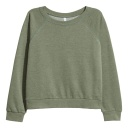

In [124]:
##### Show the single input #####
cv2_imshow(cv2.imread('/content/images_128_128/018/0189691051.jpg'))

In [125]:
##### Use the same code that used in the Extract_Feature #####
from tensorflow.keras.preprocessing import image
##### Load the images #####
Image_ = image.load_img('/content/images_128_128/018/0189691051.jpg', target_size = (128, 128))
##### converting the images into NumPy array #####
Image_ = image.img_to_array(Image_)
##### Expand the dimension of that given input #####
Image_ = np.expand_dims(Image_, axis = 0)
##### Preprocess_input is used for making the input perfect for ResNet50 #####
Image_ = preprocess_input(Image_)
##### predict the model #####
result = model.predict(Image_).flatten()

1/1 [==============================] - 0s 28ms/step


In [126]:
##### Using, NearestNeighbours, we will find the closest point of that particular input #####
from sklearn.neighbors import NearestNeighbors
##### Initialize the algorithm with some use defined arguments #####
neighbours = NearestNeighbors(n_neighbors = 6, algorithm = 'brute')
##### fit the model for training purpose #####
neighbours.fit(extracted_features)

NearestNeighbors(algorithm='brute', n_neighbors=6)

In [127]:
##### Find the distance and indices of the user input #####
distances, indices = neighbours.kneighbors([result])

In [128]:
print("The indices is {}".format(indices))

The indices is [[ 5658 30458 39869  1199  7205 29883]]


In [129]:
indices_ = np.array(indices).flatten()
print(indices_)

[ 5658 30458 39869  1199  7205 29883]


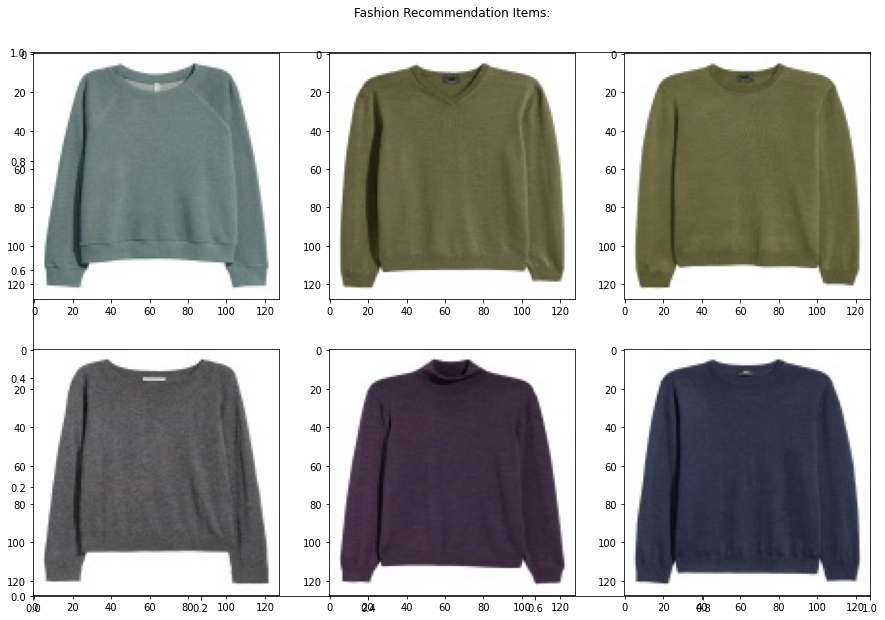

In [130]:
##### This will return top 5 recommendated pictures based on User input #####
figure = plt.figure(figsize = (15, 10))
number_row = 2
number_col = 3
plt.title('Fashion Recommendation items:\n\n'.title())
for index in range(1, (number_row*number_col + 1)):
  figure.add_subplot(number_row, number_col, index)
  plt.imshow(cv2.imread(IMAGE_PATH[indices_[index - 1]]))

plt.show()

In [133]:
##### Save the model and IMAGE_PATH for further use #####
import pickle
def save_model(parameter = None):
  with open('model.pkl', 'wb') as f:
    try:
      pickle.dump(model, f)
    except Exception as e:
      print(e.with_traceback)
    else:
      print('model saved successfully.'.capitalize())
      
##### Call the function from the current directory #####
if __name__ == "__main__":
  save_model()

Model saved successfully.


In [134]:
##### Save the model and IMAGE_PATH for further use #####
import pickle
def save_image_file(parameter = None):
  with open('IMAGE_PATH.pkl', 'wb') as f:
    try:
      pickle.dump(IMAGE_PATH, f)
    except Exception as e:
      print(e.with_traceback)
    else:
      print('IMAGE_PATH saved successfully.'.capitalize())

##### Call the function from the current directory #####
if __name__ == "__main__":
  try:
    save_image_file()
  except Exception as e:
    print(e.with_traceback)

Image_path saved successfully.


In [135]:
##### Save Extracted Feature for further use #####
import pickle
def extracted_features_save(parameter = None):
  with open('extracted_features.pkl', 'wb') as f:
    try:
      pickle.dump(extracted_features, f)
    except Exception as e:
      print(e.with_traceback)
    else:
      print('extracted features saved successfully.'.capitalize())

##### Call the function from the current directory #####
if __name__ == "__main__":
  try:
    extracted_features_save()
  except Exception as e:
    print(e.with_traceback)

Extracted features saved successfully.
